In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from fastai.vision import *
from fastai.metrics import accuracy
from fastai.basic_data import *
from skimage.util import montage
import pandas as pd
from torch import optim
import re
import json
import cv2
import albumentations
from fastai.callbacks.hooks import num_features_model
from torch.nn import L1Loss


In [2]:
import numpy as np
import torch
import pandas as pd
import random
import string

# https://github.com/benhamner/Metrics/blob/master/Python/ml_metrics/average_precision.py
def apk(actual, predicted, k=10):
    if len(predicted)>k:
        predicted = predicted[:k]

    score = 0.0
    num_hits = 0.0

    for i,p in enumerate(predicted):
        if p in actual and p not in predicted[:i]:
            num_hits += 1.0
            score += num_hits / (i+1.0)

    if not actual:
        return 0.0

    return score / min(len(actual), k)

def mapk(actual, predicted, k=10):
    return np.mean([apk(a,p,k) for a,p in zip(actual, predicted)])

def map5kfast(preds, targs, k=10):
    predicted_idxs = preds.sort(descending=True)[1]
    top_5 = predicted_idxs[:, :5]
    scores = torch.zeros(len(preds), k).float()
    for kk in range(k):
        scores[:,kk] = (top_5[:,kk] == targs).float() / float((kk+1))
    return scores.max(dim=1)[0].mean()

def map5(preds,targs):
    if type(preds) is list:
        return torch.cat([map5fast(p, targs, 5).view(1) for p in preds ]).mean()
    return map5kfast(preds,targs, 5)

def top_5_preds(preds): return np.argsort(preds.numpy())[:, ::-1][:, :5]

def top_5_pred_labels(preds, classes):
    top_5 = top_5_preds(preds)
    labels = []
    for i in range(top_5.shape[0]):
        labels.append(' '.join([classes[idx] for idx in top_5[i]]))
    return labels

def create_submission(preds, data, name, classes=None):
    if not classes: classes = data.classes
    sub = pd.DataFrame({'Image': [path.name for path in data.test_ds.x.items]})
    sub['Id'] = top_5_pred_labels(preds, classes)
    sub.to_csv(f'subs/{name}.csv.gz', index=False, compression='gzip')


def intersection(preds, targs):
    # preds and targs are of shape (bs, 4), pascal_voc format
    max_xy = torch.min(preds[:, 2:], targs[:, 2:])
    min_xy = torch.max(preds[:, :2], targs[:, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, 0] * inter[:, 1]

def area(boxes):
    return ((boxes[:, 2]-boxes[:, 0]) * (boxes[:, 3]-boxes[:, 1]))

def union(preds, targs):
    return area(preds) + area(targs) - intersection(preds, targs)

def IoU(preds, targs):
    return intersection(preds, targs) / union(preds, targs)

def name(n=10, print_it=True):
    name = "".join(random.choice(string.ascii_lowercase) for _ in range(n))
    if print_it: print(name)
    return name

In [3]:
j = json.load(open('train-object-detect\\annotations.json'))


In [4]:
for i,temp in enumerate(j):
    test=temp['annotations']

In [5]:
SZ = 360


In [6]:
BOX_COLOR = (255, 0, 0)
TEXT_COLOR = (255, 255, 255)

def visualize_bbox(img, bbox, class_id, class_idx_to_name, color=BOX_COLOR, thickness=2):
    x_min, y_min, x_max, y_max = map(int, bbox)
#     x_min, y_min, w, h = bbox
#     x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    class_name = class_idx_to_name[class_id]
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(img, class_name, (x_min, y_min - int(0.3 * text_height)), cv2.FONT_HERSHEY_SIMPLEX, 0.35,TEXT_COLOR, lineType=cv2.LINE_AA)
    return img


def visualize(annotations, category_id_to_name):
    img = annotations['image'].copy()
    for idx, bbox in enumerate(annotations['bboxes']):
        img = visualize_bbox(img, bbox, annotations['category_id'][idx], category_id_to_name)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    return img

def get_aug(aug, min_area=0., min_visibility=0.):
    return albumentations.Compose(aug, bbox_params={'format': 'pascal_voc', 'min_area': min_area, 'min_visibility': min_visibility, 'label_fields': ['category_id']})

In [7]:
def j2anno(j):
    # bbox coordinates are returned in pascal voc format [x_min, y_min, x_max, y_max]
    im = cv2.imread(f"train-object-detect\\{j['filename']}", cv2.IMREAD_COLOR)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
    im_height, im_width, _ = im.shape
                    
    orig_im = cv2.imread(f"train-object-detect\\{j['filename']}", cv2.IMREAD_COLOR)
    orig_im_height, orig_im_width, _ = orig_im.shape

    bbox_info = [anno for anno in j['annotations'] if anno['class'] == 'rect'][0]
    orig_bbox = [np.clip(bbox_info['x'], 0, orig_im_width), np.clip(bbox_info['y'], 0, orig_im_height), np.clip(bbox_info['x']+bbox_info['width'], 0, orig_im_width), np.clip(bbox_info['y']+bbox_info['height'], 0, orig_im_height)]
    bbox = [orig_bbox[0] * SZ / orig_im_width, orig_bbox[1] * SZ / orig_im_height, orig_bbox[2] * SZ / orig_im_width,  orig_bbox[3] * SZ / orig_im_height]
    return {'image': im, 'bboxes': [bbox], 'category_id': [0]}
                         
cat2name = {0: 'rect'}

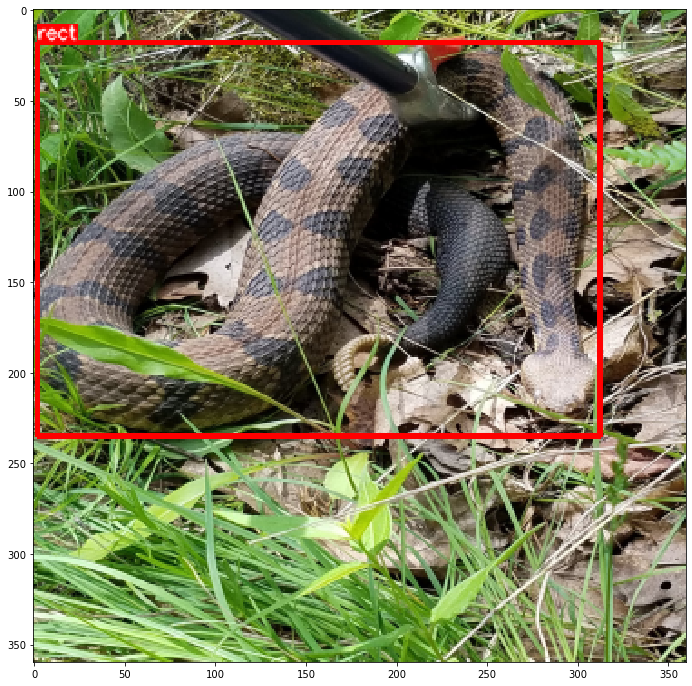

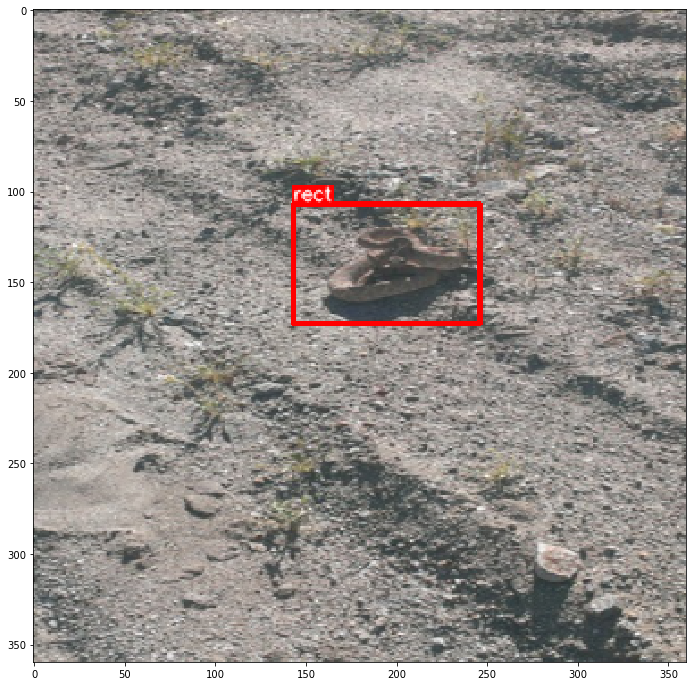

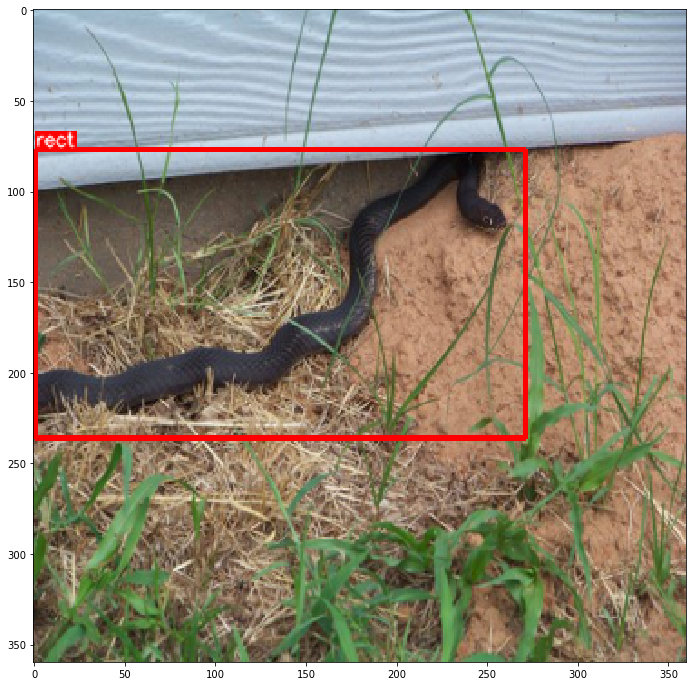

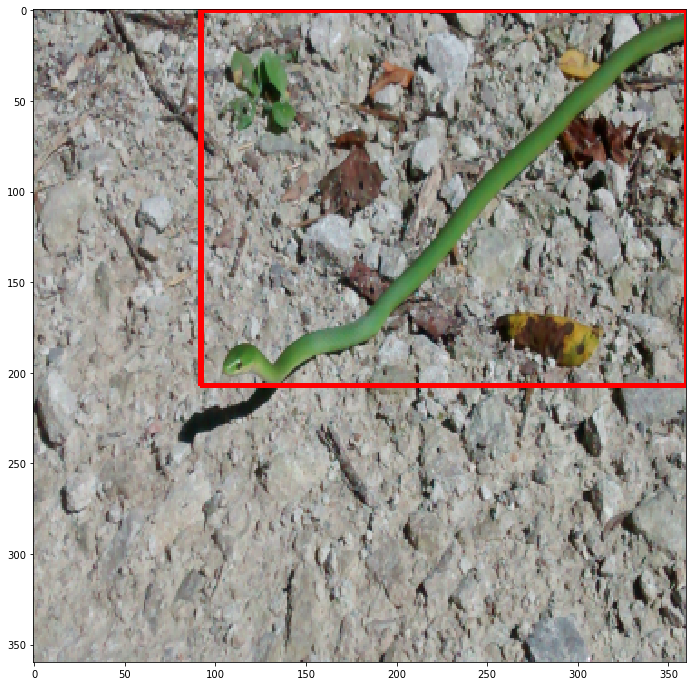

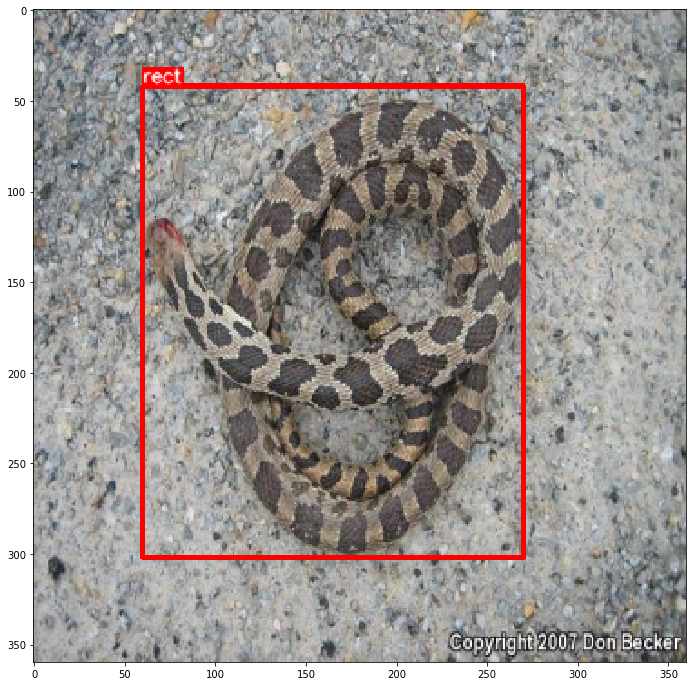

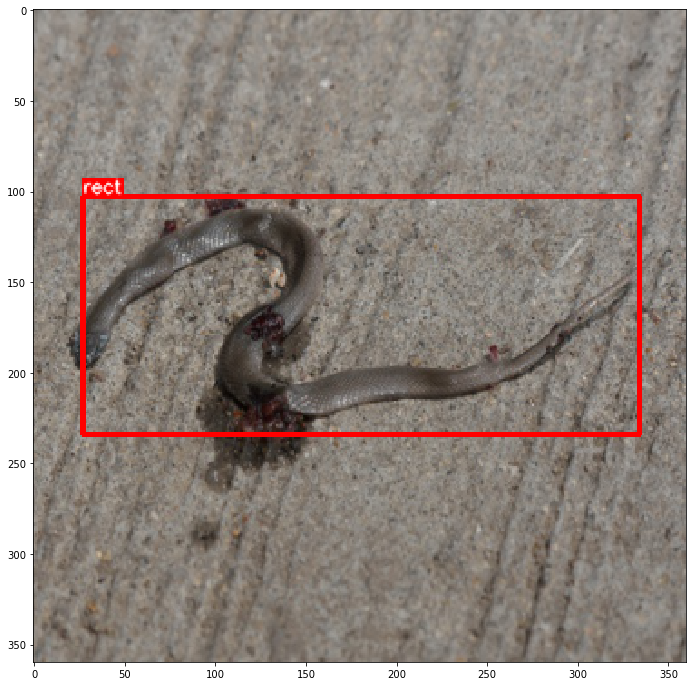

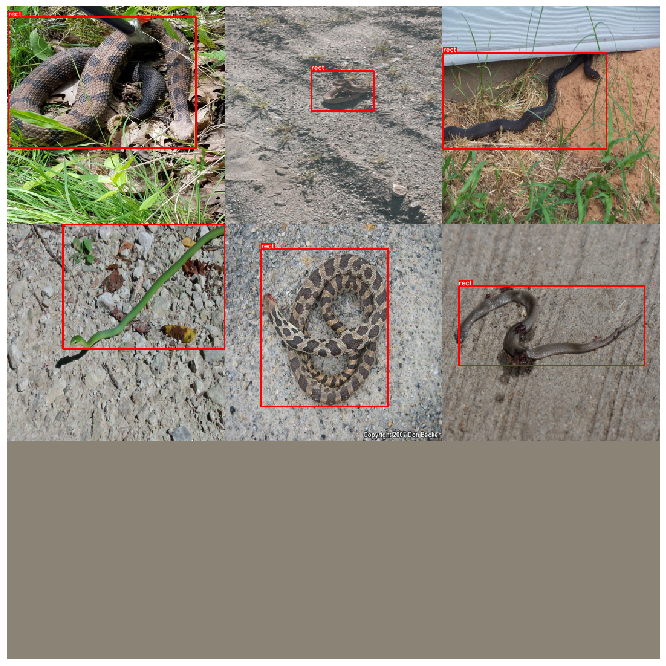

In [8]:
ims = np.stack([visualize(j2anno(j[i]), cat2name) for i in range(6)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

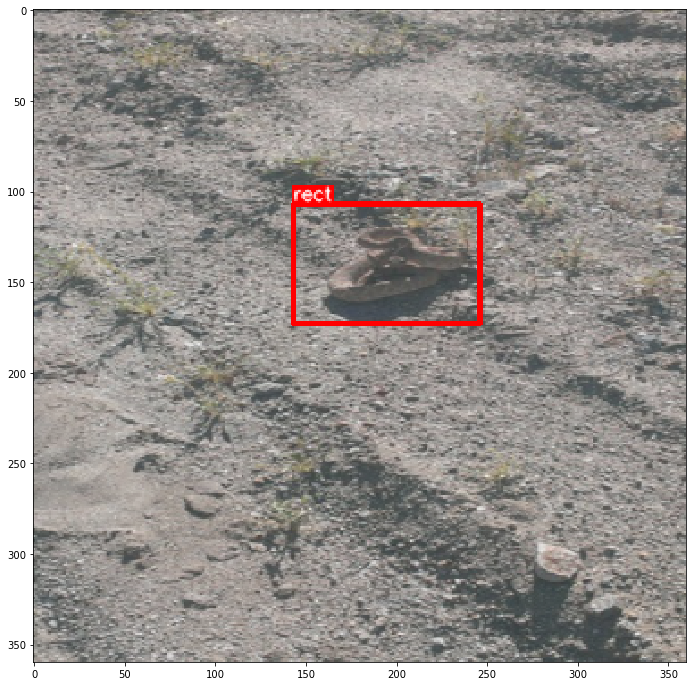

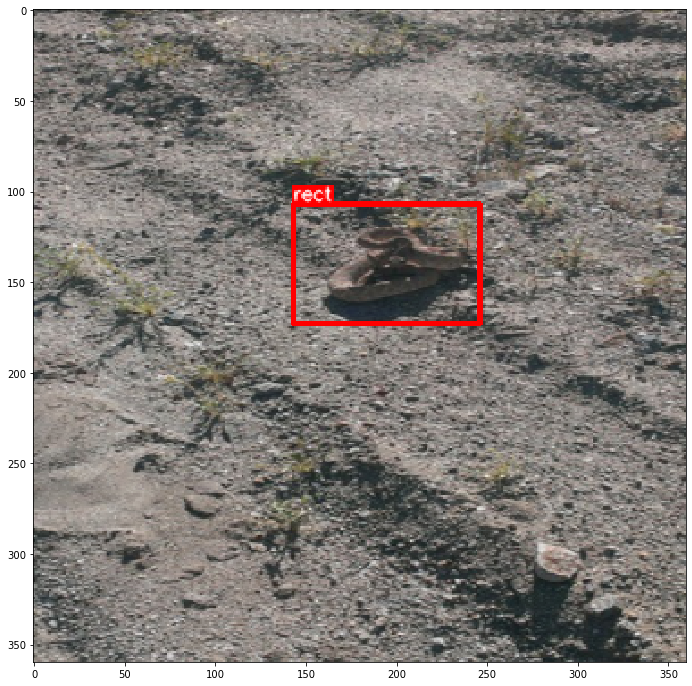

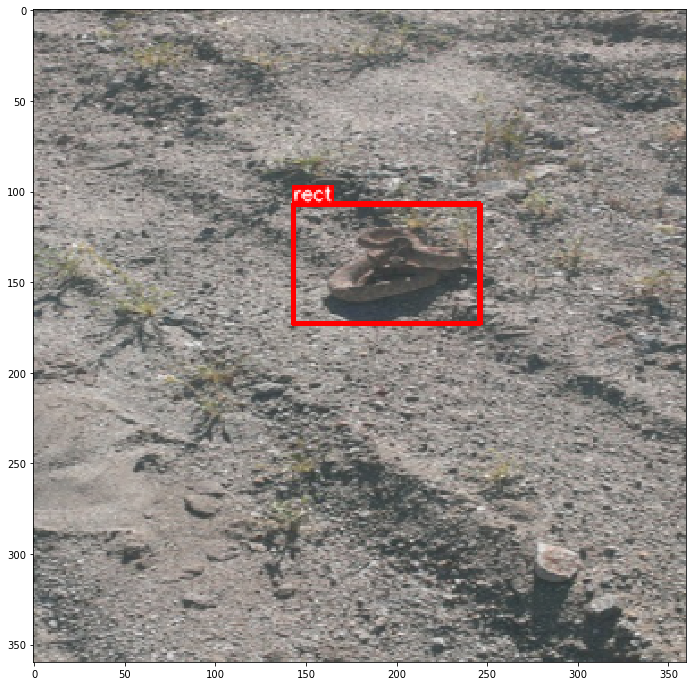

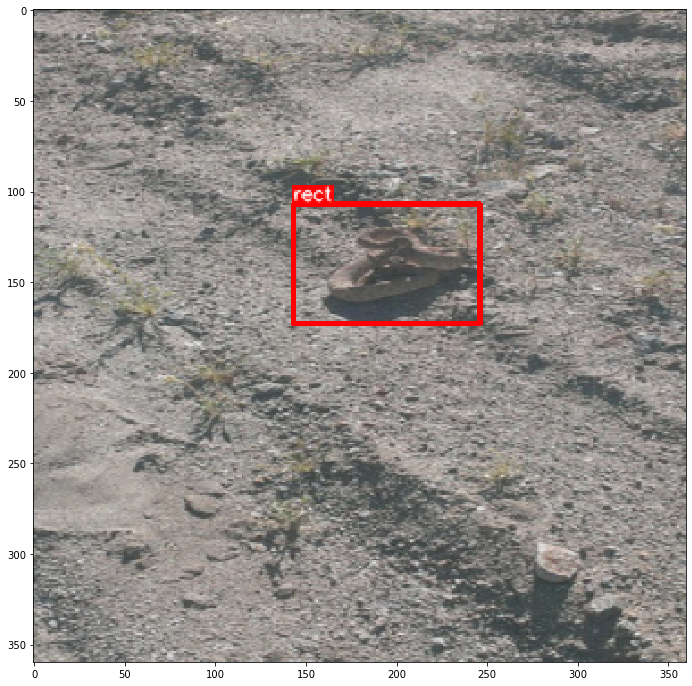

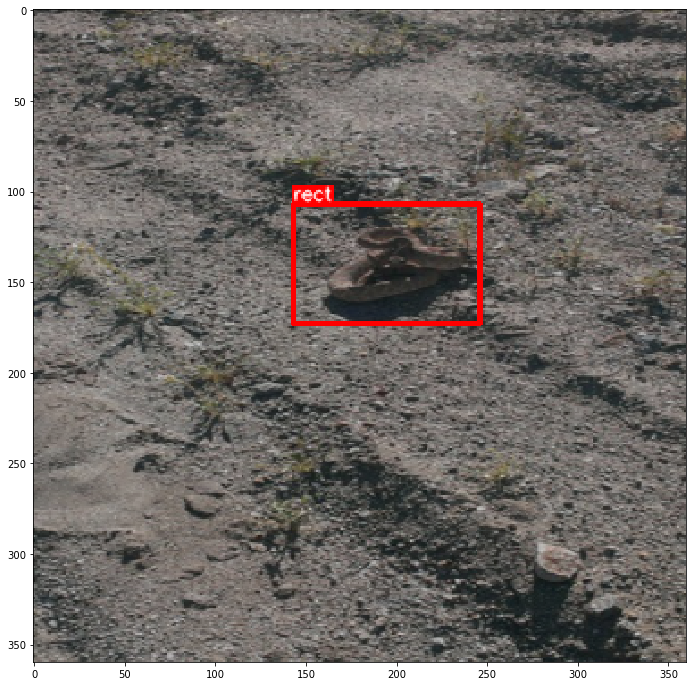

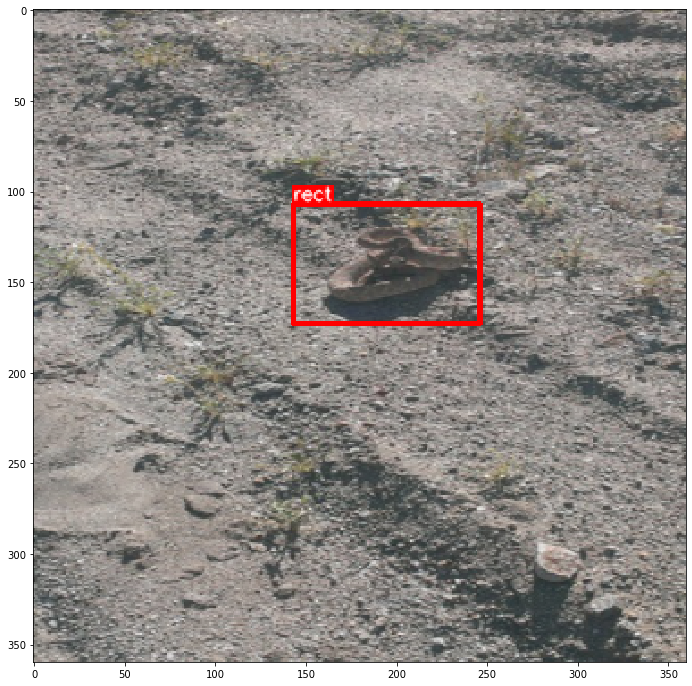

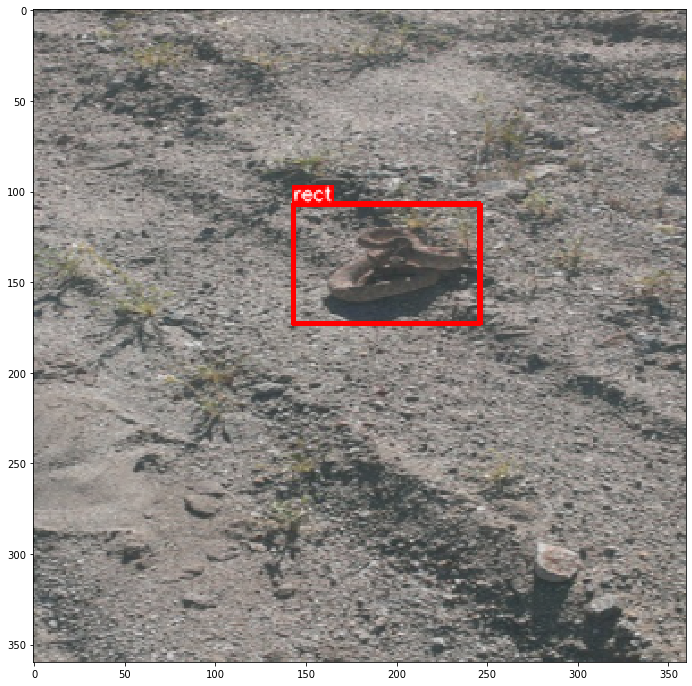

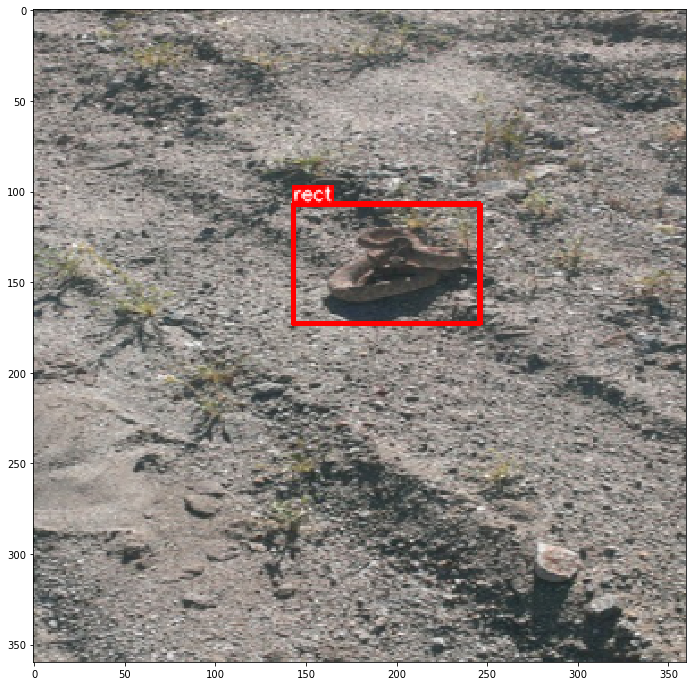

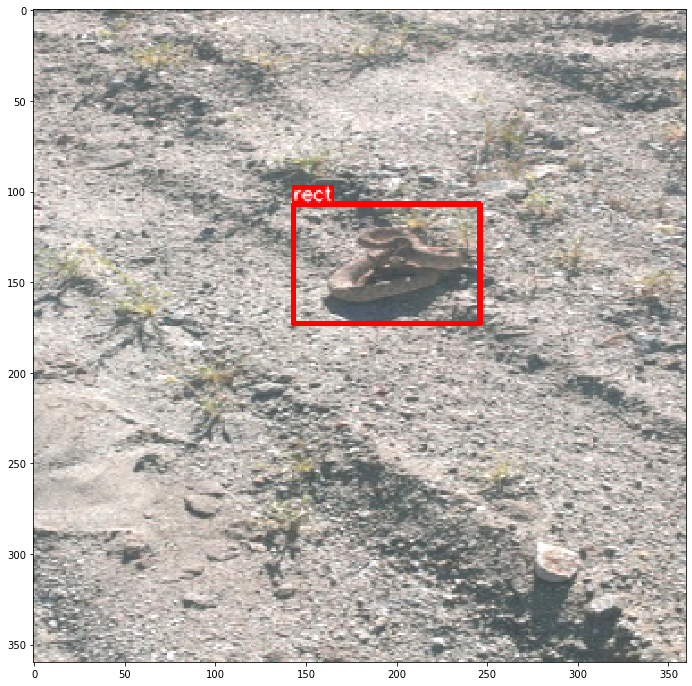

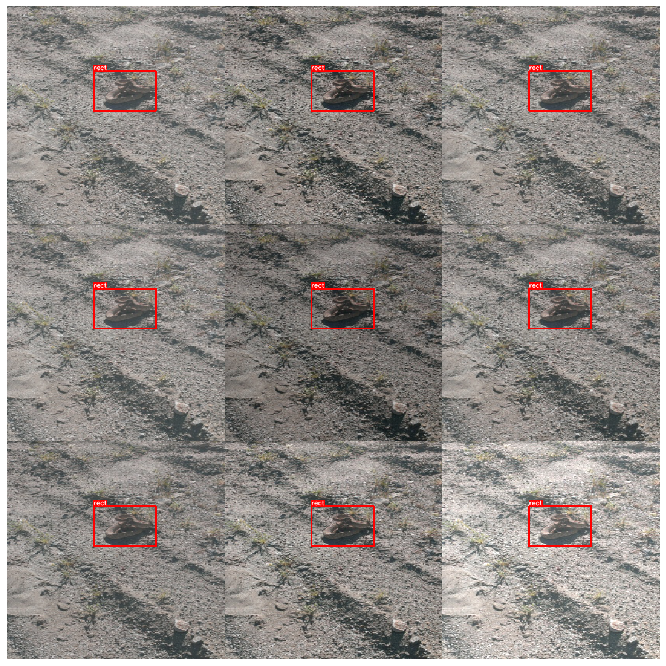

In [9]:
aug = get_aug([albumentations.RandomBrightnessContrast(always_apply=True)])

ims = np.stack([visualize(aug(**j2anno(j[1])), cat2name) for _ in range(9)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

In [10]:
idxs = np.arange(len(j))


In [11]:
idxs

array([   0,    1,    2,    3, ..., 1419, 1420, 1421, 1422])

In [12]:
np.random.seed(0)
np.random.shuffle(idxs)
val_idxs = idxs[:285]

In [13]:
val_j = [anno for i, anno in enumerate(j) if i in val_idxs]
trn_j = [anno for i, anno in enumerate(j) if i not in val_idxs]

In [14]:
SZ=360

In [15]:
class CustomDataset(Dataset):
    def __init__(self, j, aug=None):
        self.j = j
        if aug is not None: aug = get_aug(aug)
        self.aug = aug
    
    def __getitem__(self, idx):
        item = j2anno(self.j[idx])
        if self.aug: item = self.aug(**item)
        im, bbox = item['image'], np.array(item['bboxes'][0])
        im, bbox = self.normalize_im(im), self.normalize_bbox(bbox)
        
        return im.transpose(2,0,1).astype(np.float32), bbox.astype(np.float32)
    
    def __len__(self):
        return len(self.j)
    
    def normalize_im(self, ary):
        return ((ary / 255 - imagenet_stats[0]) / imagenet_stats[1])
    
    def normalize_bbox(self, bbox):
        return bbox / SZ
    

In [16]:
trn_ds = CustomDataset(trn_j, [albumentations.RandomBrightnessContrast(always_apply=True)])
val_ds = CustomDataset(val_j)

In [18]:
src = (ImageList.from_folder(path='train').split_by_rand_pct(0.0).label_from_folder())

In [19]:
tfms = get_transforms(do_flip=True,flip_vert=False,max_rotate=10.0,max_zoom=1.1,max_lighting=0.2,max_warp=0.2,p_affine=0.75,p_lighting=0.75)


In [25]:
data = (src.transform(tfms, size=360, resize_method=ResizeMethod.SQUISH)
        .databunch(bs=32).normalize(imagenet_stats))

In [20]:
NUM_WORKERS=0
BS = 12

train_dl = DataLoader(trn_ds, BS, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
valid_dl = DataLoader(val_ds, BS, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

data_bunch = DataBunch(train_dl, valid_dl)

In [21]:
class SnakeDetector(nn.Module):
    def __init__(self, arch=models.resnet18):
        super().__init__() 
        self.cnn = create_body(arch)
        self.head = create_head(num_features_model(self.cnn) * 2, 4)
        
    def forward(self, im):
        x = self.cnn(im)
        x = self.head(x)
        return x.sigmoid_()

In [26]:
learn = Learner(data, SnakeDetector(arch=models.resnet50), loss_func=L1Loss())

In [27]:
learn.split([learn.model.cnn[:6], learn.model.cnn[6:], learn.model.head])


Learner(data=ImageDataBunch;

Train: LabelList (82417 items)
x: ImageList
Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360)
y: CategoryList
class-1059,class-1059,class-1059,class-1059,class-1059
Path: train;

Valid: LabelList (0 items)
x: ImageList

y: CategoryList

Path: train;

Test: None, model=SnakeDetector(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): Batch

In [28]:
state_dict = torch.load('models\\snake-detection-model.pth')

In [29]:
learn.model.load_state_dict(state_dict['model'])


In [30]:
src.items[0]

WindowsPath('train/class-1059/00446a394fb34b7157a1552ae476d5d7.jpg')

In [31]:
i=0
len(src.items)

82417

In [33]:
for i in range(0,len(src.items)):
    if i%10000==0:
        print(src.items[i])

train\class-1059\00446a394fb34b7157a1552ae476d5d7.jpg
train\class-204\7893085eeb51ace816d0045b67970c53.jpg
train\class-337\a0d6b8f5a101c4ebe45db410453e7a6e.jpg
train\class-448\9e9bb657f37d28034a448be1bcddfd0b.jpg
train\class-561\45f2a12911ac69bf2f47f716f3cd740f.jpg
train\class-67\078b84486fc661f0be4db824957a4812.jpg
train\class-734\758b06387f82332372cfe13b60cee34a.jpg
train\class-804\98be4b08eebaf8a032f1dfab7651651b.jpg
train\class-872\ef0746ac3a059efbf4f3e4ac6d1cf595.jpg


In [487]:
filename=src.items[500]
filename = 'train\\class-4\\c3620dae599d2fe8369f80b2ace67e71.jpg'

In [488]:
im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
im_height, im_width, _ = im.shape

orig_im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
orig_im_height, orig_im_width, _ = orig_im.shape

In [489]:
orig_im_height

500

In [490]:
orig_im_width

281

In [491]:
to_pred = open_image(filename)

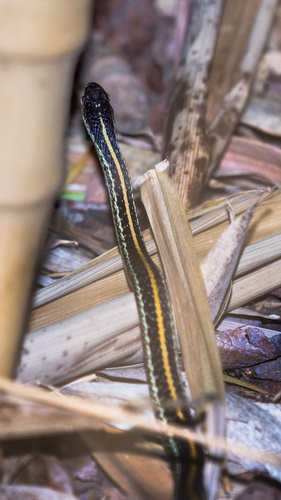

In [492]:
to_pred

In [508]:
_,_,bbox=learn.predict(to_pred)

In [436]:
bbox *=360

In [509]:
bbox

tensor([0.1762, 0.0917, 0.8100, 0.8529])

In [510]:
def draw_bbox(img, bbox, target=None, color=BOX_COLOR, thickness=2):
    
    x_min, y_min, x_max, y_max = map(int, bbox)
    print(img.shape)
    #cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    img = img[y_min:y_max,x_min:x_max]
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    cv2.imwrite('test_pred.png',img)
    return img

(360, 360, 3)
(360, 360, 3)
(360, 360, 3)
(360, 360, 3)
(360, 360, 3)
(360, 360, 3)
(360, 360, 3)
(360, 360, 3)
(360, 360, 3)


C:\Users\Gokul\AppData\Roaming\Python\Python36\site-packages\skimage\util\_montage.py:111: RuntimeWarning: Mean of empty slice.
  fill = arr_in.mean(axis=(0, 1, 2))
D:\toolkits.win\conda\envs\snakes_breed\lib\site-packages\numpy\core\_methods.py:78: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


ValueError: zero-size array to reduction operation minimum which has no identity

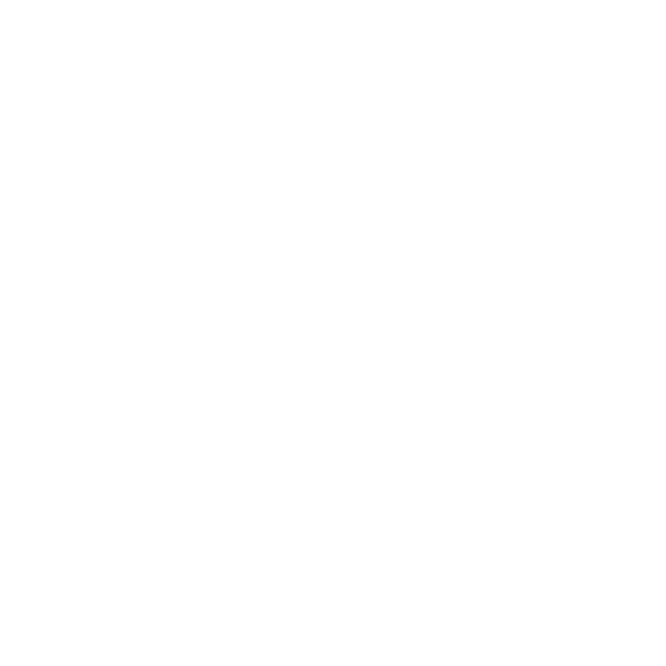

In [469]:
ims = np.stack([draw_bbox(im, bbox) for i in range(9)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

In [440]:
bbox/=360

In [511]:
im_original = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
im_original = cv2.cvtColor(im_original, cv2.COLOR_BGR2RGB)
im_original.shape

(500, 281, 3)

In [512]:
bbox

tensor([0.1762, 0.0917, 0.8100, 0.8529])

In [513]:
im_original_width = im_original.shape[1]
im_original_height = im_original.shape[0]

In [514]:
im_original.shape

(500, 281, 3)

In [515]:
bbox_new = bbox

In [516]:
bbox_new

tensor([0.1762, 0.0917, 0.8100, 0.8529])

In [517]:
bbox_new[0] = bbox_new[0]*im_original_width 
bbox_new[2]= bbox_new[2]*im_original_width

In [518]:
bbox_new[1] = bbox_new[1]*im_original_height
bbox_new[3] = bbox_new[3]*im_original_height

In [519]:
bbox_new

tensor([ 49.5072,  45.8309, 227.6068, 426.4460])

In [520]:
bbox

tensor([ 49.5072,  45.8309, 227.6068, 426.4460])

(500, 281, 3)


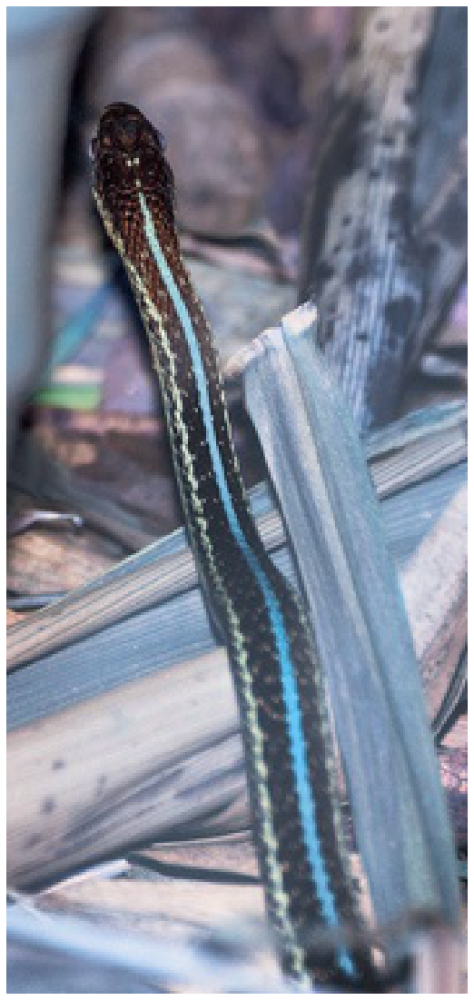

In [521]:
ims = np.stack([draw_bbox(im_original, bbox_new) for i in range(1)])
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

In [522]:
data.c

45

In [537]:
import os
path = "train-snakes-cropped\\test\\"

In [538]:
for c in data.classes:
    print(c)
    os.mkdir(path+c)

class-1059
class-128
class-140
class-1625
class-204
class-239
class-273
class-326
class-337
class-362
class-390
class-394
class-4
class-448
class-450
class-460
class-508
class-526
class-536
class-540
class-543
class-561
class-581
class-597
class-629
class-635
class-639
class-653
class-654
class-663
class-67
class-697
class-707
class-72
class-734
class-771
class-78
class-784
class-804
class-811
class-854
class-857
class-872
class-957
class-966


In [542]:
count=0
for filename in src.items:
    print(count)
    im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
    im_height, im_width, _ = im.shape

    orig_im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    orig_im_height, orig_im_width, _ = orig_im.shape
    to_pred = open_image(filename)
    _,_,bbox=learn.predict(to_pred)
    im_original = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    im_original = cv2.cvtColor(im_original, cv2.COLOR_BGR2RGB)
    im_original.shape
    im_original_width = im_original.shape[1]
    im_original_height = im_original.shape[0]
    bbox_new = bbox
    bbox_new[0] = bbox_new[0]*im_original_width 
    bbox_new[2]= bbox_new[2]*im_original_width
    bbox_new[1] = bbox_new[1]*im_original_height
    bbox_new[3] = bbox_new[3]*im_original_height
    x_min, y_min, x_max, y_max = map(int, bbox_new)
    #cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    im_original = im_original[y_min:y_max,x_min:x_max]
    im_original = cv2.cvtColor(im_original,cv2.COLOR_BGR2RGB)
    filename_str = str(filename)
    to_save = filename_str.replace('train','train-snakes-cropped')
    print(to_save)
    cv2.imwrite(to_save,im_original)
    count += 1

0
train-snakes-cropped\class-1059\00446a394fb34b7157a1552ae476d5d7.jpg
1
train-snakes-cropped\class-1059\006db98bdfba11fe93f5a00e5e90fb57.jpg
2
train-snakes-cropped\class-1059\00fc27ca58b5b23ef156d40c83593d0a.jpg
3
train-snakes-cropped\class-1059\00fe3058001840b449b34a857b0ece9d.jpg
4
train-snakes-cropped\class-1059\015e383a2b01ede5b7b9dd1550200bf2.jpg
5
train-snakes-cropped\class-1059\0178478e5ff73627fd05f5483700a8f0.jpg
6
train-snakes-cropped\class-1059\01b0a295b9b0d253d7963a1d38871657.jpg
7
train-snakes-cropped\class-1059\020cdf7d1f824cafda45c72be38b6fe5.jpg
8
train-snakes-cropped\class-1059\0308b1550b6aff1dd0856e0fdd454d66.jpg
9
train-snakes-cropped\class-1059\0332c918f0684d57d9901cc70ab74bc2.jpg
10
train-snakes-cropped\class-1059\0352b852c16624216a5134d986e234f5.jpg
11
train-snakes-cropped\class-1059\035cd2dae34cb065bf3adcc74da7b3f6.jpg
12
train-snakes-cropped\class-1059\040ce31346526cbb48e7e8830bbf3566.jpg
13
train-snakes-cropped\class-1059\0410e24aa4f96d3fa6cd6339bfc371e7.jpg
14

train-snakes-cropped\class-1059\1d3e39ffb7ef1df6c0d2b7f2603ad34a.jpg
114
train-snakes-cropped\class-1059\1d48434a7066c5e407fe771a3fa0bb82.jpg
115
train-snakes-cropped\class-1059\1d6bdcb3f78f08b7e4c454d4af75edf1.jpg
116
train-snakes-cropped\class-1059\1d7d2498b18334e41a822da46c3c40d6.jpg
117
train-snakes-cropped\class-1059\1dcdc8b8fe9b221f05948e94d7fdf18f.jpg
118
train-snakes-cropped\class-1059\1e001748e56ee2ceca8bf8b5e9f8c742.jpg
119
train-snakes-cropped\class-1059\1e5a3a051b0e6a4785235cf103f73c9c.jpg
120
train-snakes-cropped\class-1059\1e5e67366e77e1a5c9e06a362c0cd228.jpg
121
train-snakes-cropped\class-1059\1e66fd828ee10263897d361bbc36ab3f.jpg
122
train-snakes-cropped\class-1059\1e700b8450f652f8c80c35a3a724d672.jpg
123
train-snakes-cropped\class-1059\1f0a656d7af0832a9a2a31fb98dc1d2e.jpg
124
train-snakes-cropped\class-1059\1f160b8f3ec7e3ba76df7a2dac4ba5b7.jpg
125
train-snakes-cropped\class-1059\1f2dc82b3a7b74e0401a8caa98cab244.jpg
126
train-snakes-cropped\class-1059\1f7a2cd0c63b26e14b8

train-snakes-cropped\class-1059\3f08ce412ad05af79ac1066403d8ddef.jpg
226
train-snakes-cropped\class-1059\3f2311a92494a76865a2e500d6d65035.jpg
227
train-snakes-cropped\class-1059\3fac5547e563889dc50b319b90714c70.jpg
228
train-snakes-cropped\class-1059\3fb99f26215f809c6e0400ad308093b9.jpg
229
train-snakes-cropped\class-1059\3fd8c312ef829dff63d596bb7a6487dc.jpg
230
train-snakes-cropped\class-1059\3ffd4feeb14218246d408d7aa4010c4b.jpg
231
train-snakes-cropped\class-1059\40161522addb58c875b8b84c64970a6f.jpg
232
train-snakes-cropped\class-1059\409d1ce9578fa6bd8560571a77b5334f.jpg
233
train-snakes-cropped\class-1059\40dfb699479a7da53ddb4466357197e6.jpg
234
train-snakes-cropped\class-1059\40f51c4dc2fc61359430ca26cfcf0445.jpg
235
train-snakes-cropped\class-1059\4103d1d6a364377cf1592b37f40993f4.jpg
236
train-snakes-cropped\class-1059\41216863fd984a372e00543bf9b58ced.jpg
237
train-snakes-cropped\class-1059\4165f3f0bd8beed1b4fad6b773cb52e9.jpg
238
train-snakes-cropped\class-1059\4178e340b3bb5b259da

train-snakes-cropped\class-1059\61a4c250c90059a6569e627d88610e49.jpg
338
train-snakes-cropped\class-1059\61c558f235cadbc82a5c250280417499.jpg
339
train-snakes-cropped\class-1059\6285514ac19b244607736d68fd837ad5.jpg
340
train-snakes-cropped\class-1059\634b06213a75de80a900cb4fdda2aaa7.jpg
341
train-snakes-cropped\class-1059\6357a17d50298b4e0c1d403c95bbceaf.jpg
342
train-snakes-cropped\class-1059\636979027c2bb322ae178cd3117836ee.jpg
343
train-snakes-cropped\class-1059\63aa5c9b9a6ed9de130f163093fe38af.jpg
344
train-snakes-cropped\class-1059\63ead52af76accf8f63aac8d4b2fb004.jpg
345
train-snakes-cropped\class-1059\64b59f41fca79d1e822c395eb8fead61.jpg
346
train-snakes-cropped\class-1059\6527e63fbf716575e779c4d0a831d42c.jpg
347
train-snakes-cropped\class-1059\6587293830041f5a5d9d345eb83eefb8.jpg
348
train-snakes-cropped\class-1059\65b79d3d7d016864d76efc0a54ef7f26.jpg
349
train-snakes-cropped\class-1059\663c41a546a0cf9ea50c420d391ae43d.jpg
350
train-snakes-cropped\class-1059\6658d6666f67ee28918

train-snakes-cropped\class-1059\80a3c051a70206bf65cdcb5fcd304128.jpg
450
train-snakes-cropped\class-1059\80ce665d925e616af9c3b49575b4401f.jpg
451
train-snakes-cropped\class-1059\81084deed5288fef12b5aa09e74e50ec.jpg
452
train-snakes-cropped\class-1059\8149c7e6c92098b2328845bf2c5e43bc.jpg
453
train-snakes-cropped\class-1059\81cba206f47978571710e26dfcee9eb4.jpg
454
train-snakes-cropped\class-1059\8289fde7f205a0b4d6f3cf1e9329157f.jpg
455
train-snakes-cropped\class-1059\828fc3f6ace0e2c833ff2e5c66da4fd5.jpg
456
train-snakes-cropped\class-1059\8300c2bbd6a4ea68d47d041ff6c1ebdb.jpg
457
train-snakes-cropped\class-1059\842738edb35e419f9c9f3159d01ad493.jpg
458
train-snakes-cropped\class-1059\8453394b9732537e01ae2fc56ae8af22.jpg
459
train-snakes-cropped\class-1059\848396ad548567d21371f36620a9257f.jpg
460
train-snakes-cropped\class-1059\84ce5ad4ccaad88621572cd402f7626e.jpg
461
train-snakes-cropped\class-1059\84ef85c6e764a98ffa77138db507498d.jpg
462
train-snakes-cropped\class-1059\8505fabe5a981114f6d

train-snakes-cropped\class-1059\9d0761ae6265e8cafc1585314247a0b3.jpg
562
train-snakes-cropped\class-1059\9daf7f35d3b11a32614c5b2488baf291.jpg
563
train-snakes-cropped\class-1059\9e7d188b3afc7dbbb2c432551c4171af.jpg
564
train-snakes-cropped\class-1059\9e92370257992f7eb8c2657e28c7bd4a.jpg
565
train-snakes-cropped\class-1059\9e996d24817f5b3270ea7bbae0d8a102.jpg
566
train-snakes-cropped\class-1059\9f744a5f2cca0d50408d5b86993b2a0f.jpg
567
train-snakes-cropped\class-1059\9fa816888859f371076314e0358160c7.jpg
568
train-snakes-cropped\class-1059\a03b65a87f71e206155e090aca86cdc4.jpg
569
train-snakes-cropped\class-1059\a0479e16e2d896d7e72fe9c6461f2757.jpg
570
train-snakes-cropped\class-1059\a0b668e88243a9d59f6e66626da995f3.jpg
571
train-snakes-cropped\class-1059\a123c9f261daa13166b14e73c8ce0f81.jpg
572
train-snakes-cropped\class-1059\a15101717ccf76b78bcbab9ba54a58a7.jpg
573
train-snakes-cropped\class-1059\a186910139c4523ad38a8de3d89b6235.jpg
574
train-snakes-cropped\class-1059\a28487aa38f1f1ca3e1

train-snakes-cropped\class-1059\bceba601b14c8e8856d7ab2bd085ebf2.jpg
674
train-snakes-cropped\class-1059\bd99062fee7fcf0a7bca0c3af765a998.jpg
675
train-snakes-cropped\class-1059\bdce5bf4133ea84144c65f433a60af6a.jpg
676
train-snakes-cropped\class-1059\bee81ccf7b6d1fbb145c3803049ecb2a.jpg
677
train-snakes-cropped\class-1059\bf04f0fab248b909ca114e8d40bf94b0.jpg
678
train-snakes-cropped\class-1059\bf0a1232c72ea28a0ae93bdbd3a9a4f7.jpg
679
train-snakes-cropped\class-1059\bf1ecf208fbeec97775b4c468f346741.jpg
680
train-snakes-cropped\class-1059\bf6563db07d512dcc3dee9f8bf776bdd.jpg
681
train-snakes-cropped\class-1059\bf7dc291c003fc057d1fe533aa29c5d9.jpg
682
train-snakes-cropped\class-1059\bfa6dca2adb438838dcc991394c9e8d8.jpg
683
train-snakes-cropped\class-1059\bfc71f77dfcf878aa2c909b7ef36399b.jpg
684
train-snakes-cropped\class-1059\c0328f092f799e732e5487cd7d91e799.jpg
685
train-snakes-cropped\class-1059\c04c0323ee091ca989d0933be6860f8c.jpg
686
train-snakes-cropped\class-1059\c089ba8e8a18a6f11d2

train-snakes-cropped\class-1059\e1661f79330a348b51c79a33e44651fa.jpg
786
train-snakes-cropped\class-1059\e224d514f690d62cf324317a894dd1ec.jpg
787
train-snakes-cropped\class-1059\e22bee167eabaf2ae53fe1b88eac5fb9.jpg
788
train-snakes-cropped\class-1059\e2faa18e0fca170b56068018a70c64f8.jpg
789
train-snakes-cropped\class-1059\e319e38b214bd6012f6b9c0842d6caf1.jpg
790
train-snakes-cropped\class-1059\e35cd59a969687a8a28c981876b15786.jpg
791
train-snakes-cropped\class-1059\e3dd952bffc1d734fa202f60e44c3f2f.jpg
792
train-snakes-cropped\class-1059\e3ee3a3896951cfe2f4852cb1d048022.jpg
793
train-snakes-cropped\class-1059\e3ee8030647536a7ff6d8ac09d27f9d3.jpg
794
train-snakes-cropped\class-1059\e4057b6896dc60dc1fabc2a50cf5d549.jpg
795
train-snakes-cropped\class-1059\e466ea8f907d1f083334242d173068e6.jpg
796
train-snakes-cropped\class-1059\e4726070f2ca6764e9e826b59edc3ebe.jpg
797
train-snakes-cropped\class-1059\e475301d68ac457f8df7045d14e0e064.jpg
798
train-snakes-cropped\class-1059\e492013ca24b3df3ab2

train-snakes-cropped\class-128\031b03eafa4d1f25baf29b6be0d4f24e.jpg
898
train-snakes-cropped\class-128\03567b4b1d49c59d4c574dadbf83d502.jpg
899
train-snakes-cropped\class-128\03d6aa070396298dd3d6ad8158506582.jpg
900
train-snakes-cropped\class-128\043690f4fbafe3c034b4752c1bdcd988.jpg
901
train-snakes-cropped\class-128\059db9b829543c49d9a3c8c4219dc2ec.jpg
902
train-snakes-cropped\class-128\05f8e30fdaefca5661c11a30ac8aa23e.jpg
903
train-snakes-cropped\class-128\06be75248c52a78576e5b749ce2223ea.jpg
904
train-snakes-cropped\class-128\0765bc36cc1086545ca4c5c89c2f7dcb.jpg
905
train-snakes-cropped\class-128\079d18aec46be8dd1c68a8f3b7085e2a.jpg
906
train-snakes-cropped\class-128\08543f72d5b7ac58dcef66797eaf6750.jpg
907
train-snakes-cropped\class-128\086811ca6397d715e89d0f505733e06c.jpg
908
train-snakes-cropped\class-128\086f9f0cc4c62ebaee60aa346df9a367.jpg
909
train-snakes-cropped\class-128\08784a03f3c46d5654e0e3622ed302e3.jpg
910
train-snakes-cropped\class-128\08d00a28889603fb973c6a5274cbacad.

train-snakes-cropped\class-128\2cbb358f6635e8f2825afb29d648cf45.jpg
1011
train-snakes-cropped\class-128\2d8255ea50c756317dcfc1bd7fb852ef.jpg
1012
train-snakes-cropped\class-128\2dca5a41fcd2a2b1a03f029a1972caac.jpg
1013
train-snakes-cropped\class-128\2de30aa5c3552071d692461aaac2b825.jpg
1014
train-snakes-cropped\class-128\2e14dadd86197bda5944801e5bec8a01.jpg
1015
train-snakes-cropped\class-128\2e39fe41c3e8c1f6ae993a18d7c6bcea.jpg
1016
train-snakes-cropped\class-128\2e57cadb523bbe7cbb6be9a56e11c8ce.jpg
1017
train-snakes-cropped\class-128\2e7b1fd032f912706f7a07624ed37e78.jpg
1018
train-snakes-cropped\class-128\2e98d59e75872c35cfed9fc719527f4b.jpg
1019
train-snakes-cropped\class-128\2eec4315e5577f9021b64a88b888b390.jpg
1020
train-snakes-cropped\class-128\2f66192b2cf2b4a50b69b7ca2bedb762.jpg
1021
train-snakes-cropped\class-128\2f88d17030d4c2c395e28de73951399b.jpg
1022
train-snakes-cropped\class-128\2facade6a513f67cbb64d33f6f477ea9.jpg
1023
train-snakes-cropped\class-128\2fb38a24aeeccd0faf95

train-snakes-cropped\class-128\51fb3087c9df5ebe2123e3ed9f3defcd.jpg
1123
train-snakes-cropped\class-128\521605ba9dc76e7e9ead16d7431e9320.jpg
1124
train-snakes-cropped\class-128\52ef320814a2f6af5e2ce2be5d3198ac.jpg
1125
train-snakes-cropped\class-128\530364bbde60fae49e81b9ae7088c42f.jpg
1126
train-snakes-cropped\class-128\533430553394fa83c8b6e50cfee3d043.jpg
1127
train-snakes-cropped\class-128\537518d51c9ce5b36db96313b5b174e1.jpg
1128
train-snakes-cropped\class-128\53cb1bebaaf69dcb8c3845315fae0879.jpg
1129
train-snakes-cropped\class-128\53e916f511ae729c34fa3c8edd33f436.jpg
1130
train-snakes-cropped\class-128\53f78804ba24f54819fc95a46867df9e.jpg
1131
train-snakes-cropped\class-128\558f32accb5591bd114e5431e99bc1c4.jpg
1132
train-snakes-cropped\class-128\560998ad63f43124c992cc095c635f72.jpg
1133
train-snakes-cropped\class-128\5659dcdeeb0704791c73d4f5e4f22df9.jpg
1134
train-snakes-cropped\class-128\572df4b32bea6010cdd0f1159799b6ce.jpg
1135
train-snakes-cropped\class-128\57461253d74c0db7c945

train-snakes-cropped\class-128\7a61c233392b5856a58c42b0782334f2.jpg
1235
train-snakes-cropped\class-128\7b0609596f266d72ab1a1b361e3ab980.jpg
1236
train-snakes-cropped\class-128\7b66ac4bd8434a5a2e0b3d45ea619611.jpg
1237
train-snakes-cropped\class-128\7b9c8f3344f8a2ba2cb5df83df298d4d.jpg
1238
train-snakes-cropped\class-128\7ba7dc60398911be2e02d03c9058d283.jpg
1239
train-snakes-cropped\class-128\7dceabf6d86ac5698f97d77d81427af9.jpg
1240
train-snakes-cropped\class-128\7e4385cf5bf10031a94d67d6d3546052.jpg
1241
train-snakes-cropped\class-128\7e5a71d1036ae15b76b5a9e5cdf3ebfc.jpg
1242
train-snakes-cropped\class-128\7ea43486c1e6633044a882fbbc044be7.jpg
1243
train-snakes-cropped\class-128\7ea822de7bec30c8212fa7adbbeeeee9.jpg
1244
train-snakes-cropped\class-128\7eb62a4088c8e7d86fc044a5f6361c64.jpg
1245
train-snakes-cropped\class-128\7edbd88cf759de3efa4d3e37cf5f5f7b.jpg
1246
train-snakes-cropped\class-128\7f0f7050a8ad2d4ed32e66ec9e46f21b.jpg
1247
train-snakes-cropped\class-128\7f1c256e24b66758bae6

train-snakes-cropped\class-128\a08601993211d998f9f8e40e58304546.jpg
1347
train-snakes-cropped\class-128\a0cb8a76e845180e7c50775b0b41bec6.jpg
1348
train-snakes-cropped\class-128\a150ae66323b182b817b97cff8278225.jpg
1349
train-snakes-cropped\class-128\a1777bba64ebadf1125a7fc5bbcfbae0.jpg
1350
train-snakes-cropped\class-128\a184448ca8ddce5ead421e10efe71639.jpg
1351
train-snakes-cropped\class-128\a1ce531459fa5b9ce73912ac740de36b.jpg
1352
train-snakes-cropped\class-128\a1d4c5ec466b311d982a2d80c4ea10ac.jpg
1353
train-snakes-cropped\class-128\a2066700463b3dc7b63d5c505990430b.jpg
1354
train-snakes-cropped\class-128\a2157c72bf1a3a95574c118abf4c5465.jpg
1355
train-snakes-cropped\class-128\a22fb291a795b6abecfa2256eeb16573.jpg
1356
train-snakes-cropped\class-128\a294a0231c3abfba76555083824cafc2.jpg
1357
train-snakes-cropped\class-128\a2b515357b2edd12d3498c209748fff8.jpg
1358
train-snakes-cropped\class-128\a2ba7ee7d710cb9527a3438295694203.jpg
1359
train-snakes-cropped\class-128\a2e75ecff783fe723561

train-snakes-cropped\class-128\c537509a8e8958e2f7e0d86b88a456c2.jpg
1459
train-snakes-cropped\class-128\c5880584df5663a46793ae0422f627e1.jpg
1460
train-snakes-cropped\class-128\c599dd87b7fcc2f4244f5a3780299531.jpg
1461
train-snakes-cropped\class-128\c5f2fe787a8d059d1cdebd7514ad8116.jpg
1462
train-snakes-cropped\class-128\c6111464e8973b704f05716654d000d4.jpg
1463
train-snakes-cropped\class-128\c612e3e3dc0afbe34d693fe6c48277aa.jpg
1464
train-snakes-cropped\class-128\c620f0ba1e081c281459654559db9748.jpg
1465
train-snakes-cropped\class-128\c65fcdfef21826171b404e990580d2de.jpg
1466
train-snakes-cropped\class-128\c68d14a17ec465ea5286536d58304372.jpg
1467
train-snakes-cropped\class-128\c69325c379761a40da8ab154a8d70b23.jpg
1468
train-snakes-cropped\class-128\c6e36932bf1e3da8bec27a97b6092d13.jpg
1469
train-snakes-cropped\class-128\c7f55e3f9618f0d6856cf243cb07def3.jpg
1470
train-snakes-cropped\class-128\c82783b7fa97052313488096bb75e01c.jpg
1471
train-snakes-cropped\class-128\c8c1d361cbc20e44c92e

train-snakes-cropped\class-128\ebd64eef97ccb2277c07beee31b0bd92.jpg
1571
train-snakes-cropped\class-128\ec939cdb0fe9311cf45fdee047e74448.jpg
1572
train-snakes-cropped\class-128\ed7340bafe5121014322e9c5db706a42.jpg
1573
train-snakes-cropped\class-128\eda998942cf6a7fb4e4b2915a3b84e6a.jpg
1574
train-snakes-cropped\class-128\edfa244b741bb3c7683c3e05ed7d1a64.jpg
1575
train-snakes-cropped\class-128\eea96eb4f0318505e4f55736ed94d8e6.jpg
1576
train-snakes-cropped\class-128\eefe962e52e7755cf63a3cdbde5d3a7b.jpg
1577
train-snakes-cropped\class-128\efc9ff813884653ece4b3cd2e432c83e.jpg
1578
train-snakes-cropped\class-128\efe5888850481de9e801dc1a0cb167b4.jpg
1579
train-snakes-cropped\class-128\efe8aa4b5a31b8dd3fcb1cadd8118fac.jpg
1580
train-snakes-cropped\class-128\f0175f9a2da5a46531dfcd9a9c3bc445.jpg
1581
train-snakes-cropped\class-128\f081f3384f47e38d05b4d87e769a8cca.jpg
1582
train-snakes-cropped\class-128\f0da1d7ed5c13de57cc4da1ea7097fcf.jpg
1583
train-snakes-cropped\class-128\f1751f745ceed43e783a

train-snakes-cropped\class-140\09aec4bb2528b047886f0a1fdb0a3b63.jpg
1683
train-snakes-cropped\class-140\09e7559921162cb169d741a84755d46a.jpg
1684
train-snakes-cropped\class-140\0a6f9f5373b1c97c88aef79f7f942ec7.jpg
1685
train-snakes-cropped\class-140\0a8d9f881ef18bd971167d45321ae8eb.jpg
1686
train-snakes-cropped\class-140\0a968fc998c201531a8f4d548c2febc8.jpg
1687
train-snakes-cropped\class-140\0ab6b7680b7b89d48ec2c08c1299c5f1.jpg
1688
train-snakes-cropped\class-140\0af6494e68b8994f0a6cdb9dddfaf272.jpg
1689
train-snakes-cropped\class-140\0b025cce0682415f49474d0adcb47d0a.jpg
1690
train-snakes-cropped\class-140\0b617d29c0d4b8b5a8880690fde2d17f.jpg
1691
train-snakes-cropped\class-140\0baf867a69350d49863b7fa668ede4c5.jpg
1692
train-snakes-cropped\class-140\0bffa641515751f7019aec0eb2636fe4.jpg
1693
train-snakes-cropped\class-140\0c0b1157b37301a39e6c6c1184050d32.jpg
1694
train-snakes-cropped\class-140\0c3a92c8a863c54fe3f15d5241372675.jpg
1695
train-snakes-cropped\class-140\0c643dc06e3193f3b819

train-snakes-cropped\class-140\1b0d5aeb44f8d08f02002fa01def2353.jpg
1795
train-snakes-cropped\class-140\1b55af8d6cb12b1e34bf8ec26cc6ec96.jpg
1796
train-snakes-cropped\class-140\1b575e445083db68fb1d4e40dc3d6639.jpg
1797
train-snakes-cropped\class-140\1ba532e7bcd45d68bc5d7756f4a33011.jpg
1798
train-snakes-cropped\class-140\1bc95b815f43eaa02122b6bf71e902e3.jpg
1799
train-snakes-cropped\class-140\1bddb83f2b74afec817086ce9a9cc82a.jpg
1800
train-snakes-cropped\class-140\1c2701d8c2251a23059b360a2278787a.jpg
1801
train-snakes-cropped\class-140\1c6c69486ecb09ba842b300d14cb1c76.jpg
1802
train-snakes-cropped\class-140\1c71f0f14905d97211f05d44fffe8270.jpg
1803
train-snakes-cropped\class-140\1c99bf61ea455f8ee9efde379b7d8677.jpg
1804
train-snakes-cropped\class-140\1cdf1a597859c697e530caed24eed701.jpg
1805
train-snakes-cropped\class-140\1ce3f0e526b56387f847c0506323d324.jpg
1806
train-snakes-cropped\class-140\1cf81f0c13c8a98850649a4ee9f86223.jpg
1807
train-snakes-cropped\class-140\1d2181dd8c3125c86a6b

train-snakes-cropped\class-140\2d5b101a8995e96f2c3e33c47f3fd8a9.jpg
1907
train-snakes-cropped\class-140\2d77512e22448b6b46738b140465838a.jpg
1908
train-snakes-cropped\class-140\2da055129ee376a3179b92a441e363cd.jpg
1909
train-snakes-cropped\class-140\2da1167bd5c3cd5a63740060afe76edc.jpg
1910
train-snakes-cropped\class-140\2db3b7c6242b5bfa282c23a41031fbdc.jpg
1911
train-snakes-cropped\class-140\2de18cdf695c9f825d82a943c8897284.jpg
1912
train-snakes-cropped\class-140\2e1c5b93cc1aea1bd64cd1c4232ed348.jpg
1913
train-snakes-cropped\class-140\2e2426bf096d09534b92624fed725142.jpg
1914
train-snakes-cropped\class-140\2e68c69c7687b8644e10018a73059f6d.jpg
1915
train-snakes-cropped\class-140\2e7f5af72c5b81af1d7e7df513ec7e67.jpg
1916
train-snakes-cropped\class-140\2e972753bef25af44a5fd3e87a102ea0.jpg
1917
train-snakes-cropped\class-140\2eaa7353024a6fcbb68dda039534a66a.jpg
1918
train-snakes-cropped\class-140\2eb93bbcd9938fd7e4c37d708e377c42.jpg
1919
train-snakes-cropped\class-140\2ee93efa30af46f40989

train-snakes-cropped\class-140\424161baca582c435fd54c7bd6045703.jpg
2019
train-snakes-cropped\class-140\42518646a066ac57bb135aa2594d5fdf.jpg
2020
train-snakes-cropped\class-140\42673a3ab73c59e983da7d99f3aabb83.jpg
2021
train-snakes-cropped\class-140\4296aa6c3f0d3cf757573f9b2e290106.jpg
2022
train-snakes-cropped\class-140\42d4c3b099733deeeea505bb0ea92c16.jpg
2023
train-snakes-cropped\class-140\42f27708d4f9fddc59bd4353ce224641.jpg
2024
train-snakes-cropped\class-140\4367ec79f2efd3358555bb477d588c7d.jpg
2025
train-snakes-cropped\class-140\438aca63e1baaeca70277bb92fa55571.jpg
2026
train-snakes-cropped\class-140\43bd8f64e50c88c882cba7f99ff480e7.jpg
2027
train-snakes-cropped\class-140\43c0c78a73e8e25cbb809376a410bc0a.jpg
2028
train-snakes-cropped\class-140\43d47ca5ad8b8b7063eb967617518791.jpg
2029
train-snakes-cropped\class-140\446c26cd924c4c231e0b66ec3714d131.jpg
2030
train-snakes-cropped\class-140\446cee95f654c4fddb1d188d5a1a2c4d.jpg
2031
train-snakes-cropped\class-140\448d8e4c0f36db88efd9

train-snakes-cropped\class-140\553819b3c93fbf94a52bc02e09e3c415.jpg
2131
train-snakes-cropped\class-140\5538dce852cc54c4a4d23515f1b66ae7.jpg
2132
train-snakes-cropped\class-140\559d1da6a8eeddb68540f4c461a512b6.jpg
2133
train-snakes-cropped\class-140\55ab67eee804a738fb1f1a62ac4b8532.jpg
2134
train-snakes-cropped\class-140\55b448c0885950aa4196e45255c3fd88.jpg
2135
train-snakes-cropped\class-140\55cde9abb838464c7686c0f5e594d9f4.jpg
2136
train-snakes-cropped\class-140\55e011fc7b156b6dfd8401e4fd97a6a3.jpg
2137
train-snakes-cropped\class-140\562d4fcc108c05709229f826df4094b9.jpg
2138
train-snakes-cropped\class-140\56476475e53a73f5a61895d24ebb3248.jpg
2139
train-snakes-cropped\class-140\56d3f6844f94b519a747e5cf63017f4c.jpg
2140
train-snakes-cropped\class-140\570a0ba297e6a309a351eaaeb4c4364b.jpg
2141
train-snakes-cropped\class-140\57244c46ef8044db969a97a848e0f5aa.jpg
2142
train-snakes-cropped\class-140\5725479338c8203d232fb7fc6757d657.jpg
2143
train-snakes-cropped\class-140\57803bcd74a160bcce23

train-snakes-cropped\class-140\69083a1e08a005d8f897dfc23df43c91.jpg
2243
train-snakes-cropped\class-140\6941f3eec19a32df7fe2279d34e53a2b.jpg
2244
train-snakes-cropped\class-140\694d3514c2001c7044e65d90eef36688.jpg
2245
train-snakes-cropped\class-140\69b6606fc26960d081a093dc92ee975a.jpg
2246
train-snakes-cropped\class-140\69d96e3c2849da7472c246e14472013b.jpg
2247
train-snakes-cropped\class-140\6a51e2e45bec260cf5b29f3a1651cf13.jpg
2248
train-snakes-cropped\class-140\6a72339f95e2c172117626b252898202.jpg
2249
train-snakes-cropped\class-140\6a8765c73d6e36d3391c983cf2df10d2.jpg
2250
train-snakes-cropped\class-140\6aadd26342490cfc3193d4d734e91709.jpg
2251
train-snakes-cropped\class-140\6ac0566828832db7af079be06391badd.jpg
2252
train-snakes-cropped\class-140\6b582d9757c2ef33180d4615bbde125a.jpg
2253
train-snakes-cropped\class-140\6b5dab19ed0f526284681c6a5c8a2165.jpg
2254
train-snakes-cropped\class-140\6b6fa281092c8a72e943b7f7444e7842.jpg
2255
train-snakes-cropped\class-140\6b79c015d7c800c130a2

train-snakes-cropped\class-140\7c1ededc4c39d3ed9965c4ff25dc7014.jpg
2355
train-snakes-cropped\class-140\7c41daab18dd12edb85ba7d4facaceca.jpg
2356
train-snakes-cropped\class-140\7c53f0dbd2fac5464a92b340291d7b96.jpg
2357
train-snakes-cropped\class-140\7cd1495b8b1721da83dd6200ccb4d7d7.jpg
2358
train-snakes-cropped\class-140\7cf59cf8618c446c714e046c33838c4e.jpg
2359
train-snakes-cropped\class-140\7d1164cca1e8120fe0e7e3c8ea213d6a.jpg
2360
train-snakes-cropped\class-140\7d2ab2713f4a3c34dcb21b1304d0ff0a.jpg
2361
train-snakes-cropped\class-140\7d397ce36d4b9fc8be04e81d44c6f687.jpg
2362
train-snakes-cropped\class-140\7e398933648124aa80f63c601cbd629e.jpg
2363
train-snakes-cropped\class-140\7e6f3930a4b24fcc6dbdeb491ec3321d.jpg
2364
train-snakes-cropped\class-140\7e830f402a6d7efbcdc0c4a7cfd6e7b3.jpg
2365
train-snakes-cropped\class-140\7eaf7a63362a0e599cf2a0bfa22417bf.jpg
2366
train-snakes-cropped\class-140\7ecb265da20855f3e8b5e162a22df833.jpg
2367
train-snakes-cropped\class-140\7ecfe1b8498168250e42

train-snakes-cropped\class-140\8f9704bc62d33148c7ea24b31af5deed.jpg
2467
train-snakes-cropped\class-140\8faf1dcf61f8a81c5e4772dc7b72a458.jpg
2468
train-snakes-cropped\class-140\8fbd993449f14eea8cf9f372e27c2db3.jpg
2469
train-snakes-cropped\class-140\9044074a254d058c683a60c5e33658c3.jpg
2470
train-snakes-cropped\class-140\9044bb5f02ecfe37f691236e19fbbc87.jpg
2471
train-snakes-cropped\class-140\909a81ace2404c52071dffe8e4f946d2.jpg
2472
train-snakes-cropped\class-140\9142cfb89170a032c6d19972d134bfeb.jpg
2473
train-snakes-cropped\class-140\9149900b1049fd9ef2ad1bd553a7e0b0.jpg
2474
train-snakes-cropped\class-140\9150008285f45eef9dcced6de4895689.jpg
2475
train-snakes-cropped\class-140\917598a3c3530abf471ba3db2dc7651c.jpg
2476
train-snakes-cropped\class-140\91ae24330597c681a1321e6e8e53661d.jpg
2477
train-snakes-cropped\class-140\922cb926c8d5147b61ec788dd165fef8.jpg
2478
train-snakes-cropped\class-140\925fad2b3649b0eedb26ebad793afb16.jpg
2479
train-snakes-cropped\class-140\928c282dd55d4196d92e

train-snakes-cropped\class-140\a44303e404607d873f2beaf6bac6324a.jpg
2579
train-snakes-cropped\class-140\a45b4996733db63881fa716efca59bff.jpg
2580
train-snakes-cropped\class-140\a4800e72302ccaf2bdcba7ea5d62d054.jpg
2581
train-snakes-cropped\class-140\a488460598b5a7cafb83cb4032ad5d98.jpg
2582
train-snakes-cropped\class-140\a4a1f6287f0c23b7dc8dceecdbcf942d.jpg
2583
train-snakes-cropped\class-140\a4ad2be37fe0a095925eed67d02e8e1f.jpg
2584
train-snakes-cropped\class-140\a4e0bbdd79dd2319f78b6615546614ca.jpg
2585
train-snakes-cropped\class-140\a4f66f5326e6a358a550072ef33ae01f.jpg
2586
train-snakes-cropped\class-140\a501d7fa7155347635faaeae979be707.jpg
2587
train-snakes-cropped\class-140\a5a3e527aa884a9e6fa6719436352e2c.jpg
2588
train-snakes-cropped\class-140\a5c0d6a3487db6bba3b179071f02391e.jpg
2589
train-snakes-cropped\class-140\a5ee1ed0631e575d9b0ce46db42e192c.jpg
2590
train-snakes-cropped\class-140\a5f289143c9f7d342cd5fb2ee60064af.jpg
2591
train-snakes-cropped\class-140\a5f7d8bb1fb0b1e3d92b

train-snakes-cropped\class-140\b9606b5fc7b20f040e770f879cf156dc.jpg
2691
train-snakes-cropped\class-140\b9b0cce8180bf5072f957a141a75ed16.jpg
2692
train-snakes-cropped\class-140\ba258c56b368b41e49bd240dd010297f.jpg
2693
train-snakes-cropped\class-140\ba2fff683a8addaa6b177af616a644de.jpg
2694
train-snakes-cropped\class-140\ba4a7c6495165dd90f3a1a3ae92263d3.jpg
2695
train-snakes-cropped\class-140\ba5513c09440f83bb4310094287162fa.jpg
2696
train-snakes-cropped\class-140\ba6643d7a39f1c9cabd1a481ba403d0d.jpg
2697
train-snakes-cropped\class-140\ba9e29edfd520b837e8f41e4a2183283.jpg
2698
train-snakes-cropped\class-140\baa49df6088bfadc344bcebcd2242c41.jpg
2699
train-snakes-cropped\class-140\baac908419e4bf9b40f6d30d2b5479ee.jpg
2700
train-snakes-cropped\class-140\bae065220ab8fc72c1cf3a9cc914a1f9.jpg
2701
train-snakes-cropped\class-140\baf08f56ec75d408c11ca77614713205.jpg
2702
train-snakes-cropped\class-140\baf39f73a766ea1b07a88e117a235337.jpg
2703
train-snakes-cropped\class-140\baf5fa8eea7ce85e2883

train-snakes-cropped\class-140\cd0cd8a83b0f5606256131d3c9381c8c.jpg
2803
train-snakes-cropped\class-140\cd6556500116c42e69a582162a91c6cd.jpg
2804
train-snakes-cropped\class-140\cd6a933a3a60e5801c89dbc603a05c69.jpg
2805
train-snakes-cropped\class-140\cda89e0121d062920cc9e41da1dac73e.jpg
2806
train-snakes-cropped\class-140\cda8b93be7fc18ce79a1add67a54bd20.jpg
2807
train-snakes-cropped\class-140\cdbc257c2e7285e0beb3859ef1582c55.jpg
2808
train-snakes-cropped\class-140\cde32e87c25dfd7415d0be7ce840c864.jpg
2809
train-snakes-cropped\class-140\ce09c2e3de74e2fc159d0de10185cf66.jpg
2810
train-snakes-cropped\class-140\ce0ffa7d725855214b2df9abf5997688.jpg
2811
train-snakes-cropped\class-140\ce15068c7a1764e2e3bc302f0d96b041.jpg
2812
train-snakes-cropped\class-140\ce1dab844c330bbd2fe1cb2ae84209f2.jpg
2813
train-snakes-cropped\class-140\ce583efb4d560858d28cebbb432fa452.jpg
2814
train-snakes-cropped\class-140\ce8ffdebb52adc5204a93a8c9ad4ec13.jpg
2815
train-snakes-cropped\class-140\cef1d0d4cec3f601f027

train-snakes-cropped\class-140\de740f5e6a59819a46468d958c07c3e0.jpg
2915
train-snakes-cropped\class-140\deefc78744660a76e2d1668f7b5fbb66.jpg
2916
train-snakes-cropped\class-140\df085294f29926ce9deb6fef7658c97b.jpg
2917
train-snakes-cropped\class-140\df23fe3171fa95eb7a303b663b7b516c.jpg
2918
train-snakes-cropped\class-140\df8457fdf4f9b778748f5bc397a529b6.jpg
2919
train-snakes-cropped\class-140\df909a676e80df30f37d4f2c9be1895e.jpg
2920
train-snakes-cropped\class-140\df9e470997002cd466b7bdc9964642b4.jpg
2921
train-snakes-cropped\class-140\dfde628b88bb32f868fd07f07f8c2c55.jpg
2922
train-snakes-cropped\class-140\e05bd94329c7caa44dea78c8771858aa.jpg
2923
train-snakes-cropped\class-140\e0725cb62df374208b2e8f326879c5d2.jpg
2924
train-snakes-cropped\class-140\e076b664e6c6fdcb2ad0ad68c68a3f8b.jpg
2925
train-snakes-cropped\class-140\e0cff086a7c80c4d2b0718ac9619507f.jpg
2926
train-snakes-cropped\class-140\e0d9dac80110ef4b0fb21f58371bd893.jpg
2927
train-snakes-cropped\class-140\e0fc2c403dfb25722243

train-snakes-cropped\class-140\ef749811dc4b0e6a8f3b434f77287aae.jpg
3027
train-snakes-cropped\class-140\ef9b3162365d536c3fa6ab8e3bbbc951.jpg
3028
train-snakes-cropped\class-140\efc962375d9bdbb5b8dd00a78a5b1cba.jpg
3029
train-snakes-cropped\class-140\efde396917777e6e8dea13bf4109e901.jpg
3030
train-snakes-cropped\class-140\efed0befccddd1a4151e23abdee372ca.jpg
3031
train-snakes-cropped\class-140\eff2aa9766f3ab9c74a8fb05d6050240.jpg
3032
train-snakes-cropped\class-140\efff79267e984e184ec2de133b7498a0.jpg
3033
train-snakes-cropped\class-140\f00f65e7d7092cf2e142bf7b5002aeca.jpg
3034
train-snakes-cropped\class-140\f090f203c45e1a45d6010c49bfecd115.jpg
3035
train-snakes-cropped\class-140\f135848339a7b7b9fa4a6565274296ed.jpg
3036
train-snakes-cropped\class-140\f135901330ee1dfec931027cf98193b4.jpg
3037
train-snakes-cropped\class-140\f16b757b2baa6ce768b377e633fe4ab8.jpg
3038
train-snakes-cropped\class-140\f177f77b52531118aa008487e4784766.jpg
3039
train-snakes-cropped\class-140\f1ad400e8b955aec767e

train-snakes-cropped\class-1625\014cf2243ca878832771e9d4a4772c67.jpg
3139
train-snakes-cropped\class-1625\015c0accb68de878c373aac9b513ca85.jpg
3140
train-snakes-cropped\class-1625\018cc44ff668a2a0e72f47a8b77d4ffd.jpg
3141
train-snakes-cropped\class-1625\0192be76a74fb185c620c20be963af5c.jpg
3142
train-snakes-cropped\class-1625\01b7c6f965ae7f84ff8d979b1e2913cc.jpg
3143
train-snakes-cropped\class-1625\0201c51ee712b0c848d04cb4c0358a08.jpg
3144
train-snakes-cropped\class-1625\02513eec346a50721f5f3b52272721ae.jpg
3145
train-snakes-cropped\class-1625\0254b8d7cdafb371adfb52571baede2c.jpg
3146
train-snakes-cropped\class-1625\026e42f6d35c71b66df4bc8602538eeb.jpg
3147
train-snakes-cropped\class-1625\02763d9aac8d87e9b6285da117a8b39f.jpg
3148
train-snakes-cropped\class-1625\028391e23c8ceaaf3ec0d31df73b2e60.jpg
3149
train-snakes-cropped\class-1625\028d10d33c8d518e901a49967919364c.jpg
3150
train-snakes-cropped\class-1625\02bb31fd3dca59dcb95f25e340d586f4.jpg
3151
train-snakes-cropped\class-1625\02c3e9

train-snakes-cropped\class-1625\10dd3af4332d4f54149dd970d525cc5d.jpg
3249
train-snakes-cropped\class-1625\1129bb6e22f960f14592be8fc2d1f71a.jpg
3250
train-snakes-cropped\class-1625\1156fb65ba5c33e5d3af6b8bad36162e.jpg
3251
train-snakes-cropped\class-1625\117a02c5518d1059f3956417baeb4d2d.jpg
3252
train-snakes-cropped\class-1625\11908cafb2e34412dc99d58a76e83d40.jpg
3253
train-snakes-cropped\class-1625\121496c2305bca7925339766dec7e0ad.jpg
3254
train-snakes-cropped\class-1625\12231f435052aad20dc468ef384366b3.jpg
3255
train-snakes-cropped\class-1625\125b3b93fae3c03be6a40b9c7fd8ce48.jpg
3256
train-snakes-cropped\class-1625\1269452789c9f4e527f90843617d9041.jpg
3257
train-snakes-cropped\class-1625\12b49649fdd1f34590c5e8a2c24ec91c.jpg
3258
train-snakes-cropped\class-1625\12b9a5719dd2da4c636e2bd81ecd888b.jpg
3259
train-snakes-cropped\class-1625\12ca756721fd7666aa5a56cbc71edc1b.jpg
3260
train-snakes-cropped\class-1625\1315fc976bec5299f3f091a200310b44.jpg
3261
train-snakes-cropped\class-1625\1332e5

train-snakes-cropped\class-1625\235f784de3c9d7f6d6d75ad55be310fc.jpg
3359
train-snakes-cropped\class-1625\236e63beb15cb51309b5dd183bcacf27.jpg
3360
train-snakes-cropped\class-1625\2376f80bb541ebc72735d04274660fdc.jpg
3361
train-snakes-cropped\class-1625\23b51a2e91feb61648b399dabecc6ff3.jpg
3362
train-snakes-cropped\class-1625\24212c285ce8688aa4ed45fae9192c74.jpg
3363
train-snakes-cropped\class-1625\248277ca73265476a4879687a5a12d50.jpg
3364
train-snakes-cropped\class-1625\248d64085feea08bbb27a1489176ab4a.jpg
3365
train-snakes-cropped\class-1625\24a734cfc0521bac373dd64b849eb5a0.jpg
3366
train-snakes-cropped\class-1625\24b9497dc7d782036d13b8ade9148a85.jpg
3367
train-snakes-cropped\class-1625\24ccfbcdb62d185b459bd847e16dcb7a.jpg
3368
train-snakes-cropped\class-1625\24ec4bfeaf5378fcca1696bcab209bad.jpg
3369
train-snakes-cropped\class-1625\24ef8ef00b8315254a2d89d3209bbf47.jpg
3370
train-snakes-cropped\class-1625\250df05c8421cfca23e8400792445ebb.jpg
3371
train-snakes-cropped\class-1625\255449

train-snakes-cropped\class-1625\33a2e06952706a463e78cc0905ea7a1d.jpg
3469
train-snakes-cropped\class-1625\33b96ee4da8fac22528a2469484763e5.jpg
3470
train-snakes-cropped\class-1625\33ca1c2f81bf1bbba0d7e3855eac2240.jpg
3471
train-snakes-cropped\class-1625\33cfe80d69f7046c72718615d136f090.jpg
3472
train-snakes-cropped\class-1625\3446c740e8328dd332ed387b17c967ae.jpg
3473
train-snakes-cropped\class-1625\345f3cf4a189ef7defbd7368060df15e.jpg
3474
train-snakes-cropped\class-1625\34895bfa77fd8e46f4d8c866ab40dcf7.jpg
3475
train-snakes-cropped\class-1625\353854a0b315d4931999aff7e47b5510.jpg
3476
train-snakes-cropped\class-1625\355665a29ebf69b45967853d9cc250ee.jpg
3477
train-snakes-cropped\class-1625\3582f7671e4b2c037ae784d875effd08.jpg
3478
train-snakes-cropped\class-1625\3592d036c9c67e604b3943fefe0c10ff.jpg
3479
train-snakes-cropped\class-1625\359ad24ca2f722ca72f6392feb80aab6.jpg
3480
train-snakes-cropped\class-1625\35be7549d8cf7abf3fd65c9cbe9c0213.jpg
3481
train-snakes-cropped\class-1625\35fc3e

train-snakes-cropped\class-1625\4296100350aa94998dab7508ccf47728.jpg
3579
train-snakes-cropped\class-1625\4310dae65777adfcbe332acf743623b6.jpg
3580
train-snakes-cropped\class-1625\4382ba0d1e9a8af185c9d873498bfc17.jpg
3581
train-snakes-cropped\class-1625\43df99ece00d9e9e2f510c6361ea9f34.jpg
3582
train-snakes-cropped\class-1625\43e05daeba3f2b81bae249064f43ed6e.jpg
3583
train-snakes-cropped\class-1625\442621d771e87ff2be79b54cd08c8198.jpg
3584
train-snakes-cropped\class-1625\4491b456c6a6ac31e65c6b1c8094ae2b.jpg
3585
train-snakes-cropped\class-1625\44cacc9cf108773801cece713de4df6a.jpg
3586
train-snakes-cropped\class-1625\44feb1be6bb2cf2906697d1f50c42a4d.jpg
3587
train-snakes-cropped\class-1625\4529313414d285f6527d9c458c48d4f6.jpg
3588
train-snakes-cropped\class-1625\452ddcf47e8af1253616386b867670b5.jpg
3589
train-snakes-cropped\class-1625\45301311238a0d0d4bcd12cedcba52fd.jpg
3590
train-snakes-cropped\class-1625\45500bab6f7c468ccb9166d15c87e311.jpg
3591
train-snakes-cropped\class-1625\458669

train-snakes-cropped\class-1625\542ce6a9a32b0b7429d602a6e765138d.jpg
3689
train-snakes-cropped\class-1625\542e07ab9cd159db93de11f2ea493e9c.jpg
3690
train-snakes-cropped\class-1625\544ebd3461722f97c41340f289fccf84.jpg
3691
train-snakes-cropped\class-1625\546aac3e42000107a96b2b162e0b4eff.jpg
3692
train-snakes-cropped\class-1625\549542077250e1b3fc4a3dde2572e36b.jpg
3693
train-snakes-cropped\class-1625\54b0cd7d277edf2ec7272b172cc466fc.jpg
3694
train-snakes-cropped\class-1625\555366c627cbe818dfed1ed05c4b08a1.jpg
3695
train-snakes-cropped\class-1625\5560e178bd5b6390dd18124f661bcd05.jpg
3696
train-snakes-cropped\class-1625\55890135d27b8a44c4978060b5fd9b92.jpg
3697
train-snakes-cropped\class-1625\55a489413830a450374851b776336441.jpg
3698
train-snakes-cropped\class-1625\55a8f4454034a7ff622396f612627209.jpg
3699
train-snakes-cropped\class-1625\55d707a098fad2e6199bd2980a6eaa16.jpg
3700
train-snakes-cropped\class-1625\55e26424593036911ebdd0b23b94538e.jpg
3701
train-snakes-cropped\class-1625\563a0a

train-snakes-cropped\class-1625\666b6c0d2df45dae2e578da99c15a23f.jpg
3799
train-snakes-cropped\class-1625\668b5a5c3e00533c234e3fc25d902b3e.jpg
3800
train-snakes-cropped\class-1625\66946249ab1a56f94099d021f5f6a8de.jpg
3801
train-snakes-cropped\class-1625\66c34eaffaa63191131b4ff7677a3feb.jpg
3802
train-snakes-cropped\class-1625\66fa54bd322e89f2a0e36d2a168f72c7.jpg
3803
train-snakes-cropped\class-1625\670cb5ec17f2f9d57dfaa15d7d909284.jpg
3804
train-snakes-cropped\class-1625\67368e402d6a5527f0f2906161885d78.jpg
3805
train-snakes-cropped\class-1625\673e8a28c80a909692ccf1e776fbda6f.jpg
3806
train-snakes-cropped\class-1625\67c9de98f1653f5929b2300abf0bc0c8.jpg
3807
train-snakes-cropped\class-1625\67ee3bcc511ef159ed1a66c6a500b572.jpg
3808
train-snakes-cropped\class-1625\6824134c6134f72bbba659a0189e0ac8.jpg
3809
train-snakes-cropped\class-1625\683589383903f137f38b89efe4da8785.jpg
3810
train-snakes-cropped\class-1625\683b486bd96aa38a585a34e3a691024a.jpg
3811
train-snakes-cropped\class-1625\687b22

train-snakes-cropped\class-1625\785a19a6d45bed7fcced166c76aa2b43.jpg
3909
train-snakes-cropped\class-1625\788834c788eb078aee9c1dcebd87ae84.jpg
3910
train-snakes-cropped\class-1625\78c3cd1d97647a454a340c1bcc3fc86b.jpg
3911
train-snakes-cropped\class-1625\7957e83268503fc118e463f25108dae3.jpg
3912
train-snakes-cropped\class-1625\796337f7b67c6f1bfed651eb54c8608c.jpg
3913
train-snakes-cropped\class-1625\796bfe6162cd513cbecb6843f261f535.jpg
3914
train-snakes-cropped\class-1625\79782aefd17b9fb43af6fe68a6d86d1a.jpg
3915
train-snakes-cropped\class-1625\79a1995ce72bb584be806e582edc25c7.jpg
3916
train-snakes-cropped\class-1625\79ebc5475a63ccb67bf44f89208bda2f.jpg
3917
train-snakes-cropped\class-1625\79fa91854deccaf80eeb9e0aa6a6ec9c.jpg
3918
train-snakes-cropped\class-1625\7a23af8bea40319514dad7679c3a22a1.jpg
3919
train-snakes-cropped\class-1625\7a5079ef37973ab647a31195175a1b2f.jpg
3920
train-snakes-cropped\class-1625\7a8e7ff56a0f740450fdbf01782bb0a7.jpg
3921
train-snakes-cropped\class-1625\7aa435

train-snakes-cropped\class-1625\8ad9f75d48d6999ca712833b0df86267.jpg
4019
train-snakes-cropped\class-1625\8b05834ad1d54066b4f138b5b85fce88.jpg
4020
train-snakes-cropped\class-1625\8b17788fe01541ed9aa6f55e9e29bc4a.jpg
4021
train-snakes-cropped\class-1625\8b41d9d82ebe3efb39f951ca398a4bf2.jpg
4022
train-snakes-cropped\class-1625\8b502a5869eec0a8163f95427822ca40.jpg
4023
train-snakes-cropped\class-1625\8b8f9e438ab6ba0f57b54394f6d087de.jpg
4024
train-snakes-cropped\class-1625\8b9f70973d4098fae3cc62c4c63b42d0.jpg
4025
train-snakes-cropped\class-1625\8ba4ba9bf05183f4628c44cc191f3632.jpg
4026
train-snakes-cropped\class-1625\8babdfa538b8bcecfe53e2647f2e472c.jpg
4027
train-snakes-cropped\class-1625\8bb316dc5c1b373e1b2d348b91885256.jpg
4028
train-snakes-cropped\class-1625\8bd5ef5f7277a87e11ed89ddded44244.jpg
4029
train-snakes-cropped\class-1625\8bf6984785e1817bae44770f3d147b5a.jpg
4030
train-snakes-cropped\class-1625\8c557f98766cef67d18b7a738ed819c5.jpg
4031
train-snakes-cropped\class-1625\8c633f

train-snakes-cropped\class-1625\9dc45f2422222addb7cd1d08e3fe0006.jpg
4129
train-snakes-cropped\class-1625\9dd86bbd741b46f256f1bb75701b7c0a.jpg
4130
train-snakes-cropped\class-1625\9e207fb334c7da415de6fcd6aa541bfc.jpg
4131
train-snakes-cropped\class-1625\9e39130cfc0d8101e25733903f1769eb.jpg
4132
train-snakes-cropped\class-1625\9e4aa4a91ce492b6c86f3ab8eba6f57d.jpg
4133
train-snakes-cropped\class-1625\9e4db8e32eaae291ba6230ed4d35e928.jpg
4134
train-snakes-cropped\class-1625\9e4e081146675c0e0926ef58f20bb159.jpg
4135
train-snakes-cropped\class-1625\9e53a129c69a9562b42fc9a25f7ade68.jpg
4136
train-snakes-cropped\class-1625\9e593df1ea337f065bb56a5b5140e80e.jpg
4137
train-snakes-cropped\class-1625\9e804b3a1cda362c2327b115595f2885.jpg
4138
train-snakes-cropped\class-1625\9e90c123ba869786c0c2edf84be3b5c5.jpg
4139
train-snakes-cropped\class-1625\9eaa95f032d81e9dafa83155a22e87d4.jpg
4140
train-snakes-cropped\class-1625\9f2bbe49d0840ce4f53264131336b694.jpg
4141
train-snakes-cropped\class-1625\9f46fe

train-snakes-cropped\class-1625\ae69cde3b366cf5188a4ad91f0779906.jpg
4239
train-snakes-cropped\class-1625\aea43357d248765348dc6ca9068bed0d.jpg
4240
train-snakes-cropped\class-1625\aea8380db10a06ab20109246f0579f05.jpg
4241
train-snakes-cropped\class-1625\aed0a17ce2a7e68be1028a562ebfbc6a.jpg
4242
train-snakes-cropped\class-1625\aede1091854e769c26948688e561774d.jpg
4243
train-snakes-cropped\class-1625\af51074cacdacc9a046f2f1c0c1e522e.jpg
4244
train-snakes-cropped\class-1625\af81f1dcc3b14dcb42f6724759c548a9.jpg
4245
train-snakes-cropped\class-1625\af8ee6c1518a4293c6118ebded1519fc.jpg
4246
train-snakes-cropped\class-1625\afa475cf79e457dc43022d12620f2689.jpg
4247
train-snakes-cropped\class-1625\afd80c71fc13f6e8a487efcefed9b811.jpg
4248
train-snakes-cropped\class-1625\afe560748c9e04eb9161319608ab9ebf.jpg
4249
train-snakes-cropped\class-1625\b0267ae94ebc3f5d006be32bcb7f6ac5.jpg
4250
train-snakes-cropped\class-1625\b03363cc65c81cba16d9f75709b8b420.jpg
4251
train-snakes-cropped\class-1625\b0415e

train-snakes-cropped\class-1625\beffc17a974af442853e27729ceda50a.jpg
4349
train-snakes-cropped\class-1625\bf6050981add188823cdbdf55facd8f1.jpg
4350
train-snakes-cropped\class-1625\bf6d30465eb03707847be0ad6b3e897d.jpg
4351
train-snakes-cropped\class-1625\bfe457c112bd5338e35b92a491e83653.jpg
4352
train-snakes-cropped\class-1625\c00d72cd7c45109b1f2ad5e5883d75b3.jpg
4353
train-snakes-cropped\class-1625\c046ba3fedb9299489d1e22ee9a3de5c.jpg
4354
train-snakes-cropped\class-1625\c0511e309eccf5c546d40330cec0f71c.jpg
4355
train-snakes-cropped\class-1625\c07713a8613b4ea0d01f87ab72d3a6bc.jpg
4356
train-snakes-cropped\class-1625\c07fa374a645078d9aa4c0448801cada.jpg
4357
train-snakes-cropped\class-1625\c0ae7da358990145812391a4e3a4893f.jpg
4358
train-snakes-cropped\class-1625\c0cca29514336055be98745845e4bab7.jpg
4359
train-snakes-cropped\class-1625\c100bcaeaa75752ddd46a59411bf178e.jpg
4360
train-snakes-cropped\class-1625\c194217d2a357f34568611f175547d86.jpg
4361
train-snakes-cropped\class-1625\c1b0ce

train-snakes-cropped\class-1625\cffaf07a5883812cd75cceaaf86e8e34.jpg
4459
train-snakes-cropped\class-1625\cffbf95a565eb290b45cd30d8cff5c07.jpg
4460
train-snakes-cropped\class-1625\cffd9fcb33dc2a8471b103d9ddbb3ec9.jpg
4461
train-snakes-cropped\class-1625\d013cdf016d46b0b2b93aa94aa9154bc.jpg
4462
train-snakes-cropped\class-1625\d02039ed994a64ba947f6f23e6f8a625.jpg
4463
train-snakes-cropped\class-1625\d02c2864202b933ac156bc56cf5dc01e.jpg
4464
train-snakes-cropped\class-1625\d0315f39c8fd9cb2b4fc8382d7f518c2.jpg
4465
train-snakes-cropped\class-1625\d05a2f051b70b75802d58f764f417a09.jpg
4466
train-snakes-cropped\class-1625\d0862dc47ed7ddb16442c668a5b5b60a.jpg
4467
train-snakes-cropped\class-1625\d089c8702cfcad62f81170012f3a765b.jpg
4468
train-snakes-cropped\class-1625\d0a38a0b8d3cacf133347d223365d647.jpg
4469
train-snakes-cropped\class-1625\d0c21cbc901b946f7fc5b758f9cc2887.jpg
4470
train-snakes-cropped\class-1625\d0d66890865e8cb811345c05c43f7d2d.jpg
4471
train-snakes-cropped\class-1625\d0e641

train-snakes-cropped\class-1625\e0e900432604a6938501e44f9a1d37c7.jpg
4569
train-snakes-cropped\class-1625\e1469bac0c54175fbc4393bc57016b64.jpg
4570
train-snakes-cropped\class-1625\e165af69c2cf18f1a4da743896aceb45.jpg
4571
train-snakes-cropped\class-1625\e175da7164c52cc94f4be2af4a2614a6.jpg
4572
train-snakes-cropped\class-1625\e17770c26c89ba743e0a9e4e5cdcf219.jpg
4573
train-snakes-cropped\class-1625\e19d30718ac6f855352c4f7b613c834e.jpg
4574
train-snakes-cropped\class-1625\e1b174e7a8442ae5ae1ee57f5defb5ac.jpg
4575
train-snakes-cropped\class-1625\e1e0a6ff7e9e464095d923b0421f1bc6.jpg
4576
train-snakes-cropped\class-1625\e1e7a2a7f840687b6955ccfd281edd60.jpg
4577
train-snakes-cropped\class-1625\e2105813f9f6675b643efc8d7153e7f5.jpg
4578
train-snakes-cropped\class-1625\e23193e08b5ccadd4023e4a7a7adc13f.jpg
4579
train-snakes-cropped\class-1625\e2499211e11f47ab714772256554e044.jpg
4580
train-snakes-cropped\class-1625\e257415bb09599f75a806b14f952a76a.jpg
4581
train-snakes-cropped\class-1625\e25b74

train-snakes-cropped\class-1625\ee3c89b12fcba93df27c12ea2719968f.jpg
4679
train-snakes-cropped\class-1625\ee45234b4e33a09157aad52c082f4e7f.jpg
4680
train-snakes-cropped\class-1625\ee5a57e7ecf8c68dbc86466574daf112.jpg
4681
train-snakes-cropped\class-1625\ee66502761c549089ee315b06fb94a4e.jpg
4682
train-snakes-cropped\class-1625\eebd0e43b4916afd48b663c87c92ebd7.jpg
4683
train-snakes-cropped\class-1625\eee2c4927a7fa8c24ad3fc4a37fbf055.jpg
4684
train-snakes-cropped\class-1625\eeef8e3999055fbf6a7cacf904605344.jpg
4685
train-snakes-cropped\class-1625\eeeff68769f5026413886ab9463aa95e.jpg
4686
train-snakes-cropped\class-1625\ef070f6e71ad4252d82fc64032c44b15.jpg
4687
train-snakes-cropped\class-1625\ef372639afbc1ed7bf0d26ff1f1d9746.jpg
4688
train-snakes-cropped\class-1625\ef3e50f9961a4279ae20125ff2606dda.jpg
4689
train-snakes-cropped\class-1625\ef44734df86237e08eab1e2bd28b5a90.jpg
4690
train-snakes-cropped\class-1625\ef4940ef1170860b9c90566922922c6b.jpg
4691
train-snakes-cropped\class-1625\ef697e

train-snakes-cropped\class-1625\fd8f19ee1d21172919c3f70338bb8553.jpg
4789
train-snakes-cropped\class-1625\fdab9b511a2d2456b66824d5ce325274.jpg
4790
train-snakes-cropped\class-1625\fdc6f47a60ad6857a356aab8611760d6.jpg
4791
train-snakes-cropped\class-1625\fdd94b845db21187e8fdac0d741df433.jpg
4792
train-snakes-cropped\class-1625\fde6c6471c1c2d2328f4e1832d3edc15.jpg
4793
train-snakes-cropped\class-1625\fe1a8ca6478231abdbf70528358fafea.jpg
4794
train-snakes-cropped\class-1625\fe652b60e9aba331193e56e8905e7dde.jpg
4795
train-snakes-cropped\class-1625\fe740a9d1f7003ab98d54c528837a6e2.jpg
4796
train-snakes-cropped\class-1625\fed963fd83f2a800859ead7d79412b55.jpg
4797
train-snakes-cropped\class-1625\ff0ab182e64d5205cb7481ef71f42308.jpg
4798
train-snakes-cropped\class-1625\ff0b52a574d990028e1a40e4355ce058.jpg
4799
train-snakes-cropped\class-1625\ff183dcebe0b88d4994af5eda7c50fa5.jpg
4800
train-snakes-cropped\class-1625\ff2162879499f5fad145701a26da62d1.jpg
4801
train-snakes-cropped\class-1625\ff3f6c

4900
train-snakes-cropped\class-204\0272e89f97d826ec061065a87bc41811.jpg
4901
train-snakes-cropped\class-204\027421e205e05f7f891303c279ec8515.jpg
4902
train-snakes-cropped\class-204\027d43675e916da0cf8cf80a7385648c.jpg
4903
train-snakes-cropped\class-204\02800dea31bd6ab478328249816dbbfb.jpg
4904
train-snakes-cropped\class-204\0287952c8add55953a542fcd1b26c1f0.jpg
4905
train-snakes-cropped\class-204\028c16a406d20505f4cd113cb69a033a.jpg
4906
train-snakes-cropped\class-204\029a2363aa4ecdc5a6cb0da13cedefd6.jpg
4907
train-snakes-cropped\class-204\029bbe621a5a3016017c6e704c8983f4.jpg
4908
train-snakes-cropped\class-204\029ddde4ce38b2f94a7d9d682ba9378c.jpg
4909
train-snakes-cropped\class-204\02a3463543352ede3d24cf527efa6271.jpg
4910
train-snakes-cropped\class-204\02a3e40bde27ee7f2639011112b6b758.jpg
4911
train-snakes-cropped\class-204\02ac3a600b4ca6dbd65b0d6db590e3f2.jpg
4912
train-snakes-cropped\class-204\02b58501730ff78ce5f630fe5654b5d7.jpg
4913
train-snakes-cropped\class-204\02b752b0a384e59

train-snakes-cropped\class-204\05033dca042d542817f62443f8bb1c3f.jpg
5013
train-snakes-cropped\class-204\050539111a234f503e8100838b98f457.jpg
5014
train-snakes-cropped\class-204\0506abd8625964450667b7b1db79e5a5.jpg
5015
train-snakes-cropped\class-204\05129b9f537d3178b3701ee3716e3e30.jpg
5016
train-snakes-cropped\class-204\051799c5cc41f9ae672efdb454883630.jpg
5017
train-snakes-cropped\class-204\051c1ca497e5fba9afc9a6a0856c9027.jpg
5018
train-snakes-cropped\class-204\052b4f4a14efff70f83de984450eb20a.jpg
5019
train-snakes-cropped\class-204\0532bc512af9576e9b6a8835031b8bad.jpg
5020
train-snakes-cropped\class-204\053c00a98223e3f57827fdfaad4e9659.jpg
5021
train-snakes-cropped\class-204\053c842a26569310489f05980adf59ef.jpg
5022
train-snakes-cropped\class-204\053cbd9d8ec8455eba5d4bda845b4f4e.jpg
5023
train-snakes-cropped\class-204\0540261e938dfe7a91212bc063e44c26.jpg
5024
train-snakes-cropped\class-204\05432fe8338759de1490099bcf7a38b0.jpg
5025
train-snakes-cropped\class-204\055843c0358c6bcd283a

train-snakes-cropped\class-204\07a503e6d2a84469f11bdc6a9b65b6de.jpg
5125
train-snakes-cropped\class-204\07a9cba608ff74ca3209b8729f9fe467.jpg
5126
train-snakes-cropped\class-204\07ba3d979ef932d921699cbbdc51c802.jpg
5127
train-snakes-cropped\class-204\07bed88667ade068a94e9215cd9c7085.jpg
5128
train-snakes-cropped\class-204\07cb08df81d6fb57a5cfd8fb9fd44ac2.jpg
5129
train-snakes-cropped\class-204\07d2bce567083d2913e5dfaaf9af21d2.jpg
5130
train-snakes-cropped\class-204\07da66b3310e5fd71becc6ace13210e7.jpg
5131
train-snakes-cropped\class-204\07dacb5d4729ae14443560f2dc9c4d6d.jpg
5132
train-snakes-cropped\class-204\07ddc53423d5472a48a5172b60d0b8f7.jpg
5133
train-snakes-cropped\class-204\07e4898239de61f4baf964933d36f6e3.jpg
5134
train-snakes-cropped\class-204\07e804f35cb5bbb6909f460193ab6a95.jpg
5135
train-snakes-cropped\class-204\07e909ecd13d038b379ee7391b445cd0.jpg
5136
train-snakes-cropped\class-204\07ea4c1fb014112b5e596dca93dff053.jpg
5137
train-snakes-cropped\class-204\07ead73a75ace4c0eeea

train-snakes-cropped\class-204\0a24d1fd4f3d75b20cbf1a3f0d2de9ea.jpg
5237
train-snakes-cropped\class-204\0a28ef17ba7d1096993b08a8b3d95acf.jpg
5238
train-snakes-cropped\class-204\0a2cd383a7fb09db7e6332277683d1e3.jpg
5239
train-snakes-cropped\class-204\0a2dd86219488aa30c23a2ee59f5c9a2.jpg
5240
train-snakes-cropped\class-204\0a384d1520c443f5a9bfb5bd67fc1d16.jpg
5241
train-snakes-cropped\class-204\0a3c020c01072fea6be87648225396ea.jpg
5242
train-snakes-cropped\class-204\0a3d6ea34814c060625b348fa1cf5faf.jpg
5243
train-snakes-cropped\class-204\0a3ee3ef1ec9cab404904d6a63c109d6.jpg
5244
train-snakes-cropped\class-204\0a47ef9125af4c341f6e9090e733a9fe.jpg
5245
train-snakes-cropped\class-204\0a59b66bfc06ca9dc51ec6eacc9ce849.jpg
5246
train-snakes-cropped\class-204\0a60b031f8410ca3c635e76a2963f3d6.jpg
5247
train-snakes-cropped\class-204\0a66234f67e2633d2b3146ba0d6a5796.jpg
5248
train-snakes-cropped\class-204\0a6980f50b08b4a2bffb6a599f56c42f.jpg
5249
train-snakes-cropped\class-204\0a738bb0b64be70cf2f9

train-snakes-cropped\class-204\0cbf3ced08d6de00fbd41f208a69a4ef.jpg
5349
train-snakes-cropped\class-204\0cc86a7570e4696c97478a168ee9c2ab.jpg
5350
train-snakes-cropped\class-204\0cd97dc3f0f6b7800c527961200c9771.jpg
5351
train-snakes-cropped\class-204\0cdf7be0f9fe70ae4f475c1ace1ec66a.jpg
5352
train-snakes-cropped\class-204\0ce0c011899cd598cf5af69a9527e450.jpg
5353
train-snakes-cropped\class-204\0ce25c3d988cb17110e7713707b9327e.jpg
5354
train-snakes-cropped\class-204\0ce271b27072deff2566ba7e5868c1b7.jpg
5355
train-snakes-cropped\class-204\0ce92bbbcb27a41eeadd0ff691ae4726.jpg
5356
train-snakes-cropped\class-204\0cecd94d6a12672585ed118fac3ec4d8.jpg
5357
train-snakes-cropped\class-204\0cf1a1785ee1f550c8d65e3f11d5dfc6.jpg
5358
train-snakes-cropped\class-204\0cf2b3a78086f6d9deb8f34e405e320c.jpg
5359
train-snakes-cropped\class-204\0cf2b8db1a49a33e6ba2309b339f31ac.jpg
5360
train-snakes-cropped\class-204\0cf75266fadbacf7f7cfc9034f1f9fff.jpg
5361
train-snakes-cropped\class-204\0cfe3440bd7fdfc7971a

train-snakes-cropped\class-204\0f99d23c84630108400d33b173687c81.jpg
5461
train-snakes-cropped\class-204\0f9a00e8aa1e5069f5d5ccecb2fc1677.jpg
5462
train-snakes-cropped\class-204\0f9a77a3e1d81c51d9df8ba23b5b0188.jpg
5463
train-snakes-cropped\class-204\0f9dc1a7a336d5e4875d1ff7c5af4198.jpg
5464
train-snakes-cropped\class-204\0fa424a8e66c98681a12a6b9cf798dc2.jpg
5465
train-snakes-cropped\class-204\0fa47e5d73eb7f04f347516f411d1a8d.jpg
5466
train-snakes-cropped\class-204\0faa0ca2dcc96d38e47eb88bf774557d.jpg
5467
train-snakes-cropped\class-204\0fab952d13a533bd309c1fe86b770495.jpg
5468
train-snakes-cropped\class-204\0fb7f1c5003600362e1408e14c2fceac.jpg
5469
train-snakes-cropped\class-204\0fb86d1537f97df6352c3d9882dddc1f.jpg
5470
train-snakes-cropped\class-204\0fc4d185b0d3059ccc9b212a43012ef2.jpg
5471
train-snakes-cropped\class-204\0fcb6f21ccf697a0c4b049d9af670533.jpg
5472
train-snakes-cropped\class-204\0fcf0a170af90720f02621d955cbad98.jpg
5473
train-snakes-cropped\class-204\0fd125b4c674610769e6

train-snakes-cropped\class-204\1240070cb228d57be7215d1ed676cf29.jpg
5573
train-snakes-cropped\class-204\1240b12f236ddc2d4af1174b945be3ac.jpg
5574
train-snakes-cropped\class-204\124563617239b814b3757bf9a358fe57.jpg
5575
train-snakes-cropped\class-204\124a912b642ea48cb176ae9441394d8c.jpg
5576
train-snakes-cropped\class-204\1252b3e508ac993a27911f546e33bca7.jpg
5577
train-snakes-cropped\class-204\12540b6217772d4ffe87d0e591bc612f.jpg
5578
train-snakes-cropped\class-204\1259ec85cc61c37d0660403d3f1d6f3f.jpg
5579
train-snakes-cropped\class-204\125ab15258898354a973fd5221e0c31e.jpg
5580
train-snakes-cropped\class-204\126e5c608cfd1e146f7d0ca3ca586eaf.jpg
5581
train-snakes-cropped\class-204\1281a836f4219f02982b29e9cfbcd250.jpg
5582
train-snakes-cropped\class-204\1288de0f440e04ce76c93d3f086aae34.jpg
5583
train-snakes-cropped\class-204\128d0deaaa29d970d708730a5a5f073e.jpg
5584
train-snakes-cropped\class-204\128d8ccae88e60d967b0f0270f99db26.jpg
5585
train-snakes-cropped\class-204\128f0a807d656c88b7c1

train-snakes-cropped\class-204\151a8839482e1503cf1db4781d9e7e06.jpg
5685
train-snakes-cropped\class-204\152a0d3b912f1218cfff6273883346fc.jpg
5686
train-snakes-cropped\class-204\153087c25b60085f9daa988a422e364b.jpg
5687
train-snakes-cropped\class-204\153188d7299e3e6e625faf86b5221328.jpg
5688
train-snakes-cropped\class-204\1534ff9d45cdd59d55daaa0d8a4d5430.jpg
5689
train-snakes-cropped\class-204\1538e3d7e95880a41f6fd7f8f642a88d.jpg
5690
train-snakes-cropped\class-204\153a487715e24e27e3457458c925ea44.jpg
5691
train-snakes-cropped\class-204\153b6e72a79192f78ac5123baf1cfd4d.jpg
5692
train-snakes-cropped\class-204\1540b33c98b98058a750657160564a9d.jpg
5693
train-snakes-cropped\class-204\154759893895c4ce48a77c7eb26bc000.jpg
5694
train-snakes-cropped\class-204\1558fb741b053e47ea8202eb69a7e440.jpg
5695
train-snakes-cropped\class-204\155cac8a804bc05e5e04eee3d9ad8f06.jpg
5696
train-snakes-cropped\class-204\156f7be3e295aeaf5f83d19168f965ec.jpg
5697
train-snakes-cropped\class-204\157a7e9f8dbfe26238e9

train-snakes-cropped\class-204\17ef85f0630d9291813edb3ffe33a054.jpg
5797
train-snakes-cropped\class-204\17efe75512f958dc8f0c5260756fe1ce.jpg
5798
train-snakes-cropped\class-204\17f1ecc3a6044c6a2f18ef7da42fa05a.jpg
5799
train-snakes-cropped\class-204\1802541b38e2a4a5422594e59478fe59.jpg
5800
train-snakes-cropped\class-204\1816695ba89adef080c784b794e3b70a.jpg
5801
train-snakes-cropped\class-204\1817a2419be029b442e258e2eb51bda3.jpg
5802
train-snakes-cropped\class-204\18236be43ad966c16ac3620fc9455c43.jpg
5803
train-snakes-cropped\class-204\1825e93ab38d89ff7bfc1bd3cf15af4d.jpg
5804
train-snakes-cropped\class-204\18295087e50ad440e066524411970935.jpg
5805
train-snakes-cropped\class-204\182b7a4398a84098f66635e7aa4d1ba4.jpg
5806
train-snakes-cropped\class-204\183952566eba6f9518dac9b73cbae3fe.jpg
5807
train-snakes-cropped\class-204\183a237bc8b3a35aa1da4e31bf3e7c6f.jpg
5808
train-snakes-cropped\class-204\183a70f442d722abb75e81ba89470619.jpg
5809
train-snakes-cropped\class-204\183ba6e6cc8cb0d79f36

train-snakes-cropped\class-204\1a401d891eed359486b3249364669dce.jpg
5909
train-snakes-cropped\class-204\1a4a6f18555f19342836a0ea69dfb2ee.jpg
5910
train-snakes-cropped\class-204\1a4e211904caeade9e3fcf380c04233c.jpg
5911
train-snakes-cropped\class-204\1a56f8e7d9744d62aafd45340e8ead06.jpg
5912
train-snakes-cropped\class-204\1a59b8f36530ba3aa752e5dad1777cf4.jpg
5913
train-snakes-cropped\class-204\1a59c032cb8aa44e2daf5001fb2ae799.jpg
5914
train-snakes-cropped\class-204\1a5f82d3acd80edb13349b5c4e2baaad.jpg
5915
train-snakes-cropped\class-204\1a60680eb71efa6f57d08208094b3ce6.jpg
5916
train-snakes-cropped\class-204\1a6403d25843d16cd55da667df372409.jpg
5917
train-snakes-cropped\class-204\1a6607209983d0287c913474c9b1ec47.jpg
5918
train-snakes-cropped\class-204\1a6abc715dfa231b61e8763dbb490450.jpg
5919
train-snakes-cropped\class-204\1a747271acae685f57f2002a7fce5258.jpg
5920
train-snakes-cropped\class-204\1a7602c7fdf8a267f5e724e3fabe88b4.jpg
5921
train-snakes-cropped\class-204\1a780e44b4c8c6f2c0e1

train-snakes-cropped\class-204\1c7743fe6cd391db8fc51dadd0c38039.jpg
6021
train-snakes-cropped\class-204\1c7ba1565de9b2ec165839d4d19f0bde.jpg
6022
train-snakes-cropped\class-204\1c83a9944e5b1047875d2f7202523ef4.jpg
6023
train-snakes-cropped\class-204\1c9b80911a531a2b14b180e4d67e356e.jpg
6024
train-snakes-cropped\class-204\1ca11568ed74f07662938f7ebe2c352f.jpg
6025
train-snakes-cropped\class-204\1cae8db364ea05f6c95bbc3bb67e7de8.jpg
6026
train-snakes-cropped\class-204\1cb06cfa199c7ffb4a500ef00ce7721a.jpg
6027
train-snakes-cropped\class-204\1cc70f00bab0f9f9429ccfd4a3b3e9fb.jpg
6028
train-snakes-cropped\class-204\1cc8c786d9281f239de497bc69866ba2.jpg
6029
train-snakes-cropped\class-204\1cd142ad05d891667047d4982e91c644.jpg
6030
train-snakes-cropped\class-204\1cd30e34674f91577ce02566753ae77a.jpg
6031
train-snakes-cropped\class-204\1cd3f8db87d297e595f257af7f0bce85.jpg
6032
train-snakes-cropped\class-204\1ce05b2dfe517742fff4c2af86999ccd.jpg
6033
train-snakes-cropped\class-204\1ce5efc2ff34ba7d1cd0

train-snakes-cropped\class-204\1f8ab8e16059f458b5e3757bd8276ebb.jpg
6133
train-snakes-cropped\class-204\1f8bad74d39da446b66533b5d90b00fd.jpg
6134
train-snakes-cropped\class-204\1f8e5a8dbe6ca2a483e3289282d79068.jpg
6135
train-snakes-cropped\class-204\1f8f9eda8d8c5744e2a87e64365ea9e1.jpg
6136
train-snakes-cropped\class-204\1f95b751573a5c7be3dd44e2bd031228.jpg
6137
train-snakes-cropped\class-204\1f9706f9a9e1cf9d286628230ff8d827.jpg
6138
train-snakes-cropped\class-204\1fa0e2326d834b4ef534a7d5ddc630c3.jpg
6139
train-snakes-cropped\class-204\1fa79e0253a08803eca650e209d2d00b.jpg
6140
train-snakes-cropped\class-204\1facdd79e9bbdd1df686a0c324fbdaf2.jpg
6141
train-snakes-cropped\class-204\1fb4e000a57e203f0949983be0ab5aa6.jpg
6142
train-snakes-cropped\class-204\1fb59c64914feb83e45353a85a02ffbc.jpg
6143
train-snakes-cropped\class-204\1fc196861bc477343c34b874e4b54e5f.jpg
6144
train-snakes-cropped\class-204\1fd5eab05dd49b061af2fd9a87d549a6.jpg
6145
train-snakes-cropped\class-204\1fd7ba6cd24cf1635356

train-snakes-cropped\class-204\2245c6ba3cde4407a45450b6c4e50e8f.jpg
6245
train-snakes-cropped\class-204\224c5f65aa334b19d65a2f7c403c45ff.jpg
6246
train-snakes-cropped\class-204\2259373cd9e49b7889bc6f14499276cf.jpg
6247
train-snakes-cropped\class-204\225ac3f9d30c5d0a99b5623df201ccef.jpg
6248
train-snakes-cropped\class-204\225e0b7bbf08c23fc55802be4d31ffc2.jpg
6249
train-snakes-cropped\class-204\225eb78cf984408a0028069d113bd1cc.jpg
6250
train-snakes-cropped\class-204\2263c6a20717b5fc4482a9a7fc608694.jpg
6251
train-snakes-cropped\class-204\226e191ff97caf9455b25b971df9b6c7.jpg
6252
train-snakes-cropped\class-204\22797568db953da334ad972d346cafff.jpg
6253
train-snakes-cropped\class-204\227dde4a893b9a81a1cb11434fefac97.jpg
6254
train-snakes-cropped\class-204\22833e8d961b3ebc322faceb04c47b6e.jpg
6255
train-snakes-cropped\class-204\2283cb34757c5309a61c6d8930542916.jpg
6256
train-snakes-cropped\class-204\2287f0a3a12e6c2dcad7f90a7a664f6d.jpg
6257
train-snakes-cropped\class-204\228b5e8302e5e33234a1

train-snakes-cropped\class-204\25959fbb484335772a9192c684862e51.jpg
6357
train-snakes-cropped\class-204\25a181267d3414cc800cfd86431535dc.jpg
6358
train-snakes-cropped\class-204\25a4bea112217aabf00383212728a2a2.jpg
6359
train-snakes-cropped\class-204\25a4c5bb868333d9c567071db68e2d8f.jpg
6360
train-snakes-cropped\class-204\25b4c1699c89beb2b08229ab27b9706d.jpg
6361
train-snakes-cropped\class-204\25b779255e430c13da828bc52813c6c7.jpg
6362
train-snakes-cropped\class-204\25be4bd2abba211207c5e655c57c21e0.jpg
6363
train-snakes-cropped\class-204\25c1aaf97961d714e6886220f4780638.jpg
6364
train-snakes-cropped\class-204\25c39d61a937f041b5c3dfb296cb473e.jpg
6365
train-snakes-cropped\class-204\25cb5be98b69fae0cb4f533cac189aad.jpg
6366
train-snakes-cropped\class-204\25cf0b53ac093ffcfb3193e9bf05a224.jpg
6367
train-snakes-cropped\class-204\25d816e2bc69d2f055aaece7b0bb45d3.jpg
6368
train-snakes-cropped\class-204\25d91f247df7505e62102ee631b6888a.jpg
6369
train-snakes-cropped\class-204\25d9af77117450605011

train-snakes-cropped\class-204\281bfff7f06ccc2d494d9dc5d0e603e3.jpg
6469
train-snakes-cropped\class-204\281d85b55c855830cb3f4535f0bf20a3.jpg
6470
train-snakes-cropped\class-204\281da547abfc3ceca4c47464c59b36c0.jpg
6471
train-snakes-cropped\class-204\2821f4e078c41e4aaf723a0d53f1f5c5.jpg
6472
train-snakes-cropped\class-204\282a96f8e70633df6c56b829dd95e9bd.jpg
6473
train-snakes-cropped\class-204\2830435911ec71b469828125589c7cf2.jpg
6474
train-snakes-cropped\class-204\283187805a7948943d4c6efe2fca9529.jpg
6475
train-snakes-cropped\class-204\283a48d13c10223ee5d4583fd1628e3b.jpg
6476
train-snakes-cropped\class-204\283b8641210483e34bf62aa788106e53.jpg
6477
train-snakes-cropped\class-204\28463bedac44a59a4a0cd14442e222a2.jpg
6478
train-snakes-cropped\class-204\284c272ea1c417abb0d4aa77b6211085.jpg
6479
train-snakes-cropped\class-204\284c6e75ebab58aae4b308b0b97c10df.jpg
6480
train-snakes-cropped\class-204\28515b6bf9eb129b40a395753da8f8ca.jpg
6481
train-snakes-cropped\class-204\285cf32406b07a7444f8

train-snakes-cropped\class-204\2a5e456baa67d9413f7077b3f204bc91.jpg
6581
train-snakes-cropped\class-204\2a6f39b2abc20df72a5e537cfb490913.jpg
6582
train-snakes-cropped\class-204\2a7288029d85e4fa837cd40d126fbb8b.jpg
6583
train-snakes-cropped\class-204\2a7492798b83e7c9a23ed46f655d72ea.jpg
6584
train-snakes-cropped\class-204\2a811c3c749a41db514d22211fdf22e0.jpg
6585
train-snakes-cropped\class-204\2a8d0f7f1444761f59ed87a780bdbf88.jpg
6586
train-snakes-cropped\class-204\2a8daaf659418ce3b1df8f1415ea36d5.jpg
6587
train-snakes-cropped\class-204\2a95760e63453cdc33a6cf3526900f52.jpg
6588
train-snakes-cropped\class-204\2aab1c55bb013d320dd8102e30d86988.jpg
6589
train-snakes-cropped\class-204\2aac8a93d749152c0bd46792e10a4e50.jpg
6590
train-snakes-cropped\class-204\2aafdcf66340bc780f394968f5cfc24d.jpg
6591
train-snakes-cropped\class-204\2ac266c7b82cd9d72a5f22fe35e1a03b.jpg
6592
train-snakes-cropped\class-204\2ac5311a7b0cd0541eeb9b3bc8fb800b.jpg
6593
train-snakes-cropped\class-204\2acea059b0b3e88fae6d

train-snakes-cropped\class-204\2d41542ba386b047d498148b0018ea14.jpg
6693
train-snakes-cropped\class-204\2d41d10568a937498266936cc351c6b7.jpg
6694
train-snakes-cropped\class-204\2d45883c281dd641a4bd5f443d695d38.jpg
6695
train-snakes-cropped\class-204\2d4bb3a659b868e3a693b3f41f5efbe5.jpg
6696
train-snakes-cropped\class-204\2d51f8a601bc0b82e26b79d8e9734d41.jpg
6697
train-snakes-cropped\class-204\2d5c69202f3bdec397f61b20db738629.jpg
6698
train-snakes-cropped\class-204\2d5f5b19e9424d5a660c894989ea1bb6.jpg
6699
train-snakes-cropped\class-204\2d5f91e16f01a0f1879bb78cb631f826.jpg
6700
train-snakes-cropped\class-204\2d709376ef0b631822ae350bbc4feea2.jpg
6701
train-snakes-cropped\class-204\2d760f7691d8d856501b65ea984a6cf5.jpg
6702
train-snakes-cropped\class-204\2d774c04ac891e0e899be5b988174dff.jpg
6703
train-snakes-cropped\class-204\2d8d1f60685768b45a20019e41f22c41.jpg
6704
train-snakes-cropped\class-204\2d8ff44d3f2df32cfd1eeccac881b3a4.jpg
6705
train-snakes-cropped\class-204\2da1be5dd8f4c515957f

train-snakes-cropped\class-204\302bb271d4a3a296124118098911468a.jpg
6805
train-snakes-cropped\class-204\302ce39eb1380f84e0cc7c215c5ead2d.jpg
6806
train-snakes-cropped\class-204\303affac358e2aaf9872022f45d0ac3e.jpg
6807
train-snakes-cropped\class-204\30410dfbbbc0b862b459f120cfb21c54.jpg
6808
train-snakes-cropped\class-204\3045ecf432e6518299343c37ac30a202.jpg
6809
train-snakes-cropped\class-204\305040ad6e17f9995f442162a9a18d07.jpg
6810
train-snakes-cropped\class-204\305810d409843e14d6919dee2fbe0b16.jpg
6811
train-snakes-cropped\class-204\30672a6765feedb249b15943a4c9aa2f.jpg
6812
train-snakes-cropped\class-204\306df9f6bdf3998b8d225e5300493e96.jpg
6813
train-snakes-cropped\class-204\307e227c3e7e307a018cf6c4a444c4af.jpg
6814
train-snakes-cropped\class-204\30825ef28e09c34b101479ec7db1a199.jpg
6815
train-snakes-cropped\class-204\308d522a3b9b8e7d76db97588f341a19.jpg
6816
train-snakes-cropped\class-204\308ed3b37d115fc1e953887a6d1eaba4.jpg
6817
train-snakes-cropped\class-204\30990ba07e449aa622d0

train-snakes-cropped\class-204\32b92d5aaf8364a17c44bc1a36961ce0.jpg
6917
train-snakes-cropped\class-204\32c7a89add4d93ef1eb07d4fc108d49f.jpg
6918
train-snakes-cropped\class-204\32d5504283089ee29d7586c5520b56ab.jpg
6919
train-snakes-cropped\class-204\32df4d6b8fbd90d03e1b0be885d847cd.jpg
6920
train-snakes-cropped\class-204\32e6152302adc7e7240fd2fc58c8fdc7.jpg
6921
train-snakes-cropped\class-204\32ebf854ca95c25bce9989e178f08f21.jpg
6922
train-snakes-cropped\class-204\32f0df67dbca3ec44aad3aaca1bceaa2.jpg
6923
train-snakes-cropped\class-204\32f2e25eeefac1b6caa6e794c06bd2d5.jpg
6924
train-snakes-cropped\class-204\32f6f0afd3eba5e6bd34bd52d76d8730.jpg
6925
train-snakes-cropped\class-204\32f858f4d2a0f06387d70477da7d74f8.jpg
6926
train-snakes-cropped\class-204\32fea6fc01fad36710a9d10ee946176c.jpg
6927
train-snakes-cropped\class-204\33063c7fdf0d4dbdcd4a1d24c0648c7f.jpg
6928
train-snakes-cropped\class-204\3307fa1175e3c10815e5732d866342ec.jpg
6929
train-snakes-cropped\class-204\3308b90a4bf459ed05f8

train-snakes-cropped\class-204\351a13c21384b596bbe00f79f3ce62d4.jpg
7029
train-snakes-cropped\class-204\352060556fb245dd39218ad6f0ce7b72.jpg
7030
train-snakes-cropped\class-204\352cf25f3957c1fb7d69ca6772f7aafc.jpg
7031
train-snakes-cropped\class-204\353444867676e445f6eb2a8693a7d7cc.jpg
7032
train-snakes-cropped\class-204\3536ab26b7cbde132a1b597ef3b2d202.jpg
7033
train-snakes-cropped\class-204\353a44317a4d52ea7e280f69dbd473b0.jpg
7034
train-snakes-cropped\class-204\353aa959a21140a027913bdeb3c1f52f.jpg
7035
train-snakes-cropped\class-204\353d2e22f1f2baa149c4e3a30655963a.jpg
7036
train-snakes-cropped\class-204\353d43b9932b0d1cd482d34e95aeac16.jpg
7037
train-snakes-cropped\class-204\353fed1ef97a7fa40c797de6651caa2d.jpg
7038
train-snakes-cropped\class-204\3540b5bc8f19306829603292ff22da45.jpg
7039
train-snakes-cropped\class-204\354b7d6cfffd0a9c8d2b55a8d91f571a.jpg
7040
train-snakes-cropped\class-204\355409430ed2e43d5ecba9c1c8605c31.jpg
7041
train-snakes-cropped\class-204\355bed50f7a76f7caa7b

train-snakes-cropped\class-204\3767cdefd0f567a2c7394553710a3f84.jpg
7141
train-snakes-cropped\class-204\376955a2948c24e673d420af360a498b.jpg
7142
train-snakes-cropped\class-204\3784ae53cbb3d91b5833d00f99849f8d.jpg
7143
train-snakes-cropped\class-204\37897df1505d49045cfd3ee8e6dc6d4d.jpg
7144
train-snakes-cropped\class-204\378e29a79e01723e18cae3447ab6a60e.jpg
7145
train-snakes-cropped\class-204\3795b6df31d3b7e8591415edccb174e7.jpg
7146
train-snakes-cropped\class-204\379936dafa39ce112b9bc384b7eef4f0.jpg
7147
train-snakes-cropped\class-204\379e38450542e8ab0942bfa5aab0a267.jpg
7148
train-snakes-cropped\class-204\37a83d28d6ba53ec563a909f60d6fee6.jpg
7149
train-snakes-cropped\class-204\37bce76c69122bbaadc56fce654cb484.jpg
7150
train-snakes-cropped\class-204\37bcf6aff7fdcef5849bdf6428980a32.jpg
7151
train-snakes-cropped\class-204\37c6de9059b3c6dfd271572d2d5e492b.jpg
7152
train-snakes-cropped\class-204\37cf29428957a7b2ea63f3398e8a5e27.jpg
7153
train-snakes-cropped\class-204\37d8af4e17ea72af1f0d

train-snakes-cropped\class-204\39ec413df88005af41dd5957a0e57c84.jpg
7253
train-snakes-cropped\class-204\39f3ee6c52549da5c2394637151a8a9b.jpg
7254
train-snakes-cropped\class-204\39f4ef57c4fac05cfafac43b9ad0b40d.jpg
7255
train-snakes-cropped\class-204\3a03d068ba67c9239ecfb75a091b51ab.jpg
7256
train-snakes-cropped\class-204\3a044a0149ac222c8610dbab713859f5.jpg
7257
train-snakes-cropped\class-204\3a048aed5b5f5aaf96ef7229e69d33e9.jpg
7258
train-snakes-cropped\class-204\3a06feabaf62a95935e54eae912aef97.jpg
7259
train-snakes-cropped\class-204\3a0b328f584b410041f0fe412348f92f.jpg
7260
train-snakes-cropped\class-204\3a0bd3b8d1515ecdc3d27a3b7b3d6ff5.jpg
7261
train-snakes-cropped\class-204\3a0d368829b5cb1df0f3a39e4577a1be.jpg
7262
train-snakes-cropped\class-204\3a0ee49c2e23451de193832cdfe3b337.jpg
7263
train-snakes-cropped\class-204\3a12539913c8d739f0d797fe46285982.jpg
7264
train-snakes-cropped\class-204\3a1dfaecf42575c77487f50f59645940.jpg
7265
train-snakes-cropped\class-204\3a238e0214028e06b585

train-snakes-cropped\class-204\3c4b09589c63ad7ed686809b187c866f.jpg
7365
train-snakes-cropped\class-204\3c4f7b847e0485fbc8372800dde50ed9.jpg
7366
train-snakes-cropped\class-204\3c4ffa0b3fe457a41ed3eceb4b25bf5c.jpg
7367
train-snakes-cropped\class-204\3c514cce9d8f65cfce2fe7caba36cebe.jpg
7368
train-snakes-cropped\class-204\3c5bfcae786239cca6cb5dee1df6369c.jpg
7369
train-snakes-cropped\class-204\3c62b052cbad56dddbdce81ccfe17e05.jpg
7370
train-snakes-cropped\class-204\3c634b5ea7164dae8d83d329f1d7a203.jpg
7371
train-snakes-cropped\class-204\3c64bf230dd6af7da42ccc196a320c2b.jpg
7372
train-snakes-cropped\class-204\3c67843431ff261782d66e88ca570cfa.jpg
7373
train-snakes-cropped\class-204\3c6843193d78db0e72fbd1ca6201ce17.jpg
7374
train-snakes-cropped\class-204\3c79b8171ad286ddfd48dd224d29802d.jpg
7375
train-snakes-cropped\class-204\3c7e7bb33bf05347cfb500ba075d7181.jpg
7376
train-snakes-cropped\class-204\3c82b041bb247fcc57427ce849cece24.jpg
7377
train-snakes-cropped\class-204\3c83862ef5466157572c

train-snakes-cropped\class-204\3f1ae8b5c872e25e7740b34dd752992a.jpg
7477
train-snakes-cropped\class-204\3f20db0ab45bbc9de92c106aad4b73e0.jpg
7478
train-snakes-cropped\class-204\3f234d9f2481df18fbe46a69dab9da50.jpg
7479
train-snakes-cropped\class-204\3f239eecc9f3a6bde4d1d207bab1ef35.jpg
7480
train-snakes-cropped\class-204\3f262780ef4db33a9f35baaf41eec022.jpg
7481
train-snakes-cropped\class-204\3f2b6bde016d7f699fe58a3a43b506e5.jpg
7482
train-snakes-cropped\class-204\3f2c03629fac0e1e0b6cbd7ac2a77c5a.jpg
7483
train-snakes-cropped\class-204\3f3549f4da958c2e599215a1b0ac83ee.jpg
7484
train-snakes-cropped\class-204\3f45835e69b92821bca907cabfe9abd4.jpg
7485
train-snakes-cropped\class-204\3f500e1b32203486f99fb479a1661858.jpg
7486
train-snakes-cropped\class-204\3f50e284714d5321c6f0aad2722a0882.jpg
7487
train-snakes-cropped\class-204\3f51d788ffdd4711456815692a65c241.jpg
7488
train-snakes-cropped\class-204\3f573f822a105105f0802e0bd02f006d.jpg
7489
train-snakes-cropped\class-204\3f5b4c00a1479416e84e

train-snakes-cropped\class-204\415ee552fceadca8a31a01f52f9343ce.jpg
7589
train-snakes-cropped\class-204\416435a54be14e6c0ef04514d346fab1.jpg
7590
train-snakes-cropped\class-204\416967cb8d38104eef9536d7ac53de8a.jpg
7591
train-snakes-cropped\class-204\41726d9f2623bfe40374dade8ad64c85.jpg
7592
train-snakes-cropped\class-204\4173ce9e36c2fe1cabd4e4f95e6cad25.jpg
7593
train-snakes-cropped\class-204\417fc39d7a5c0cf858068aefd668d0f5.jpg
7594
train-snakes-cropped\class-204\41824e171b077670f41984a887aac70d.jpg
7595
train-snakes-cropped\class-204\4189e42cd548187751c4dcc69022457c.jpg
7596
train-snakes-cropped\class-204\418a734b86c4ee69d5a9397c5c1314a6.jpg
7597
train-snakes-cropped\class-204\4190d6bd25bd3373f9675b838cef419b.jpg
7598
train-snakes-cropped\class-204\4197a637d2bf8c4cd7ee752dd0a3c3db.jpg
7599
train-snakes-cropped\class-204\4198f94f36bd31f790b4cc1ba24435c9.jpg
7600
train-snakes-cropped\class-204\41a93902eea2f4514a36c28c7e46deca.jpg
7601
train-snakes-cropped\class-204\41ad14afd26af83e82f7

train-snakes-cropped\class-204\440343ad0694d49ce794fed74ba4e0bc.jpg
7701
train-snakes-cropped\class-204\44057915f6ff3b20052d375299f84021.jpg
7702
train-snakes-cropped\class-204\440f60a9ce016d8e54b0976262333fbe.jpg
7703
train-snakes-cropped\class-204\44122ad6ff1af2af202e47323f5518ae.jpg
7704
train-snakes-cropped\class-204\4412f07a42be3281636f0c5ff68319a4.jpg
7705
train-snakes-cropped\class-204\4413521be5ac4fc59584a4427be85572.jpg
7706
train-snakes-cropped\class-204\44153cea8d39541dd6ed742df9878d55.jpg
7707
train-snakes-cropped\class-204\4419e1be2dcfadcdde565f41703831f5.jpg
7708
train-snakes-cropped\class-204\441a0b866f7a1da20b598ac22170b2aa.jpg
7709
train-snakes-cropped\class-204\44239722773fc483fcda88487f667d9c.jpg
7710
train-snakes-cropped\class-204\44287a050f49de2adfb6b38fbc3a5868.jpg
7711
train-snakes-cropped\class-204\4439bacc0bea6ca4a6e19dc354f9adc2.jpg
7712
train-snakes-cropped\class-204\44415cf553b653b6474a4d1052106d6d.jpg
7713
train-snakes-cropped\class-204\4447a39f5fbc97066d02

train-snakes-cropped\class-204\46c7497f5cfd0ebab521fd2fa10959fb.jpg
7813
train-snakes-cropped\class-204\46c96f8c0e02f18371bb0f66b54eb07e.jpg
7814
train-snakes-cropped\class-204\46da729508b3545870b10feb3d2b6cc4.jpg
7815
train-snakes-cropped\class-204\46db5c5740d87a73039ce08feeed1206.jpg
7816
train-snakes-cropped\class-204\46e77fc918dd10e61e473797503bbe6e.jpg
7817
train-snakes-cropped\class-204\46f1f670736dc21725c92bebe6b5de19.jpg
7818
train-snakes-cropped\class-204\46f2545d820d360c8e0d9f441cca75a0.jpg
7819
train-snakes-cropped\class-204\46f7bdfa87503ad6306557e6b684e8b6.jpg
7820
train-snakes-cropped\class-204\46f8b05fc40ecba3d71a7965314c86ce.jpg
7821
train-snakes-cropped\class-204\46fff0c6e19016b9cf8b93acd9809b70.jpg
7822
train-snakes-cropped\class-204\47088a6973cbf3e1ada5de0b31f57b75.jpg
7823
train-snakes-cropped\class-204\4713b39da21f6e618a64a8bbc660dd45.jpg
7824
train-snakes-cropped\class-204\471e967b91ac98ae43b66fd3b44f22a9.jpg
7825
train-snakes-cropped\class-204\4723a8c88e377fd37a03

train-snakes-cropped\class-204\49ac3f70f63b26c33e313b8f78b7b386.jpg
7925
train-snakes-cropped\class-204\49af7b61340662753bfe4a864a437e0c.jpg
7926
train-snakes-cropped\class-204\49c80c501b1ee47d2cb5865640e88484.jpg
7927
train-snakes-cropped\class-204\49c9f84f258189d29b9ba86ca4f2b72e.jpg
7928
train-snakes-cropped\class-204\49ce4787e1663c6fb8ed7df6e59a52da.jpg
7929
train-snakes-cropped\class-204\49d41344dfff45eb902c5b155446e30f.jpg
7930
train-snakes-cropped\class-204\49e6ccfa284c6fced9ee8921940139a9.jpg
7931
train-snakes-cropped\class-204\49e9b577812291fa6fd6fe902b6c0822.jpg
7932
train-snakes-cropped\class-204\49eff3c0bd879290c2076925198883b9.jpg
7933
train-snakes-cropped\class-204\49f167b11eb47d9d580eaf2f6c7b6d28.jpg
7934
train-snakes-cropped\class-204\4a08cef15fbaa6d2283c1594cd8daded.jpg
7935
train-snakes-cropped\class-204\4a09b8c23bb641f30ac64f08bba60b11.jpg
7936
train-snakes-cropped\class-204\4a203b034b8b696cafb503571ab12ab9.jpg
7937
train-snakes-cropped\class-204\4a20fe0317bce50141c0

train-snakes-cropped\class-204\4beb382473adf1e025135f9540ed88c3.jpg
8037
train-snakes-cropped\class-204\4bebcba41e5c5f562dde6b4fffbf515d.jpg
8038
train-snakes-cropped\class-204\4bee3c06309e239cf764fc62c2856b5c.jpg
8039
train-snakes-cropped\class-204\4beeb63715ba3489b1e056c772a8a88a.jpg
8040
train-snakes-cropped\class-204\4bf066dccb7333da540456969fb6e125.jpg
8041
train-snakes-cropped\class-204\4bf20c38b426e621414f40c6d8d87866.jpg
8042
train-snakes-cropped\class-204\4bf367158542681c4f6561a8dbefb4a3.jpg
8043
train-snakes-cropped\class-204\4c016a294ae27b787cbb098d452426f3.jpg
8044
train-snakes-cropped\class-204\4c0a5e2627c4e973f237ed0b2ada8e67.jpg
8045
train-snakes-cropped\class-204\4c0e64e3c2ca4ce1de9d6c0f2029ecb2.jpg
8046
train-snakes-cropped\class-204\4c19937383fa9e9f2561a55153e2b23e.jpg
8047
train-snakes-cropped\class-204\4c20837535b6b9f1bd8baf78cd9df908.jpg
8048
train-snakes-cropped\class-204\4c20b193e4107bfe0b57544c4a044d6c.jpg
8049
train-snakes-cropped\class-204\4c23cdf75126a398b647

train-snakes-cropped\class-204\4e9f37ad5f85502c5118c94cbc175273.jpg
8149
train-snakes-cropped\class-204\4ea1725df0873a948239f739179d3aee.jpg
8150
train-snakes-cropped\class-204\4ea48a80046c917c14299b97726e7c30.jpg
8151
train-snakes-cropped\class-204\4eb11d07656b07873f538bd3012bae0b.jpg
8152
train-snakes-cropped\class-204\4eb29be077693c8a0339020f0da3f270.jpg
8153
train-snakes-cropped\class-204\4eb870ac4f8cfe1b30d230b3b5f36077.jpg
8154
train-snakes-cropped\class-204\4ebf936d036bb08ca2f7bfd133f6ea6f.jpg
8155
train-snakes-cropped\class-204\4ec9bba5f2503c9ab5a2279d682f760c.jpg
8156
train-snakes-cropped\class-204\4ecad2333ff1ade98cac1a8c64f2a93b.jpg
8157
train-snakes-cropped\class-204\4ed0ab604906af7fe960c8657a1d720c.jpg
8158
train-snakes-cropped\class-204\4ed1e3e1680a77dbbdd53782c17aeb5e.jpg
8159
train-snakes-cropped\class-204\4ed2f8cfa35c77a8921371f47342b43f.jpg
8160
train-snakes-cropped\class-204\4ee9b6fb461cb98ca847019e16e2bda2.jpg
8161
train-snakes-cropped\class-204\4eebe1eb89063b49081d

train-snakes-cropped\class-204\5100fd38bd2c943bf57a62b80967308a.jpg
8261
train-snakes-cropped\class-204\510a7dff301463c681e2bd211d72ea34.jpg
8262
train-snakes-cropped\class-204\5117ab0c8bb084ba4309838aa0f65b6a.jpg
8263
train-snakes-cropped\class-204\51207b54d7910574c11bbd2f8da2ed37.jpg
8264
train-snakes-cropped\class-204\512e605698a31d3d7d4db390fd972d18.jpg
8265
train-snakes-cropped\class-204\51312ff2162d44ef176db91edab7f9f9.jpg
8266
train-snakes-cropped\class-204\51321a14a46f949010611493f887448f.jpg
8267
train-snakes-cropped\class-204\5137d1a113ad0cbbd95b3efa47409153.jpg
8268
train-snakes-cropped\class-204\5139e15adb03ab3b8c23016e6856870b.jpg
8269
train-snakes-cropped\class-204\513ba76183b73c022007e977dc4d89a2.jpg
8270
train-snakes-cropped\class-204\514788bd4e35411bc54775d1f5d289bc.jpg
8271
train-snakes-cropped\class-204\514c615948a8f3f2557d9b10e13813ad.jpg
8272
train-snakes-cropped\class-204\514e58bf20d882ac462dbf1ee5751ccb.jpg
8273
train-snakes-cropped\class-204\514e76c82edc2fe2c9b1

train-snakes-cropped\class-204\534522606d1ce3dff48c5c7e6860e71a.jpg
8373
train-snakes-cropped\class-204\53643fc8d61da55bfc3589a311d2f2d3.jpg
8374
train-snakes-cropped\class-204\5366278f5b578f7878636ecbbb123db1.jpg
8375
train-snakes-cropped\class-204\536b67a221ecd6468fbfff7ca6bc713b.jpg
8376
train-snakes-cropped\class-204\5370c0e15500876bf953adbf97b32542.jpg
8377
train-snakes-cropped\class-204\5370ed88d53d5e840417b9ec1025853d.jpg
8378
train-snakes-cropped\class-204\5378320380888e145ee7acf0f3686610.jpg
8379
train-snakes-cropped\class-204\537e8b559cd5137f7c85f7573b3fbf1c.jpg
8380
train-snakes-cropped\class-204\53893b1fff79d338536d06d60aee5e49.jpg
8381
train-snakes-cropped\class-204\538e537c4be5352353384e77f69f6a8e.jpg
8382
train-snakes-cropped\class-204\538fd9fad68d796414952c2079df5a24.jpg
8383
train-snakes-cropped\class-204\539cd0db8ca20175b1cdf625c02c8a87.jpg
8384
train-snakes-cropped\class-204\53a06c21b6f3269455617a13c718f260.jpg
8385
train-snakes-cropped\class-204\53a80a603dea3c76ee7e

train-snakes-cropped\class-204\55bd01ca23077086116002f601066baf.jpg
8485
train-snakes-cropped\class-204\55bded7857384223ca72b886557faf53.jpg
8486
train-snakes-cropped\class-204\55bfe580e88dfaedd64dd236463a0bfd.jpg
8487
train-snakes-cropped\class-204\55c73d0a90e6a87d3351e58dd58d504d.jpg
8488
train-snakes-cropped\class-204\55dc7389e0ba19d209ce295ec6f481ac.jpg
8489
train-snakes-cropped\class-204\55df9aa8bcc4e3d84d3ec4ff59a9acd4.jpg
8490
train-snakes-cropped\class-204\55ebbbdf81e4f9f0b65561cbc0cb4194.jpg
8491
train-snakes-cropped\class-204\55ec2eaca11ce79386d780aedd75166a.jpg
8492
train-snakes-cropped\class-204\55f5c1c5323571ed1a110da6838ccf4b.jpg
8493
train-snakes-cropped\class-204\55f6ccc27b6bf258e3030ab4b8c06195.jpg
8494
train-snakes-cropped\class-204\55ff2bd2f0f4d1ce8dd37d1078a823c6.jpg
8495
train-snakes-cropped\class-204\56078358a3d38891cc828a11c147acca.jpg
8496
train-snakes-cropped\class-204\560e32421e429fd39041f7473231a036.jpg
8497
train-snakes-cropped\class-204\56101a6b271f17ec2591

train-snakes-cropped\class-204\58188a17e86f72db12ce9056f4c56fed.jpg
8597
train-snakes-cropped\class-204\58189c16556302c08ba0973dc5851aac.jpg
8598
train-snakes-cropped\class-204\5819f96ddcb70bec1bc97d36416c1799.jpg
8599
train-snakes-cropped\class-204\581b226894379709477504c44ff8e6f3.jpg
8600
train-snakes-cropped\class-204\581da27eb6d8aa5fbd2c3fda083690ad.jpg
8601
train-snakes-cropped\class-204\58309c7bacac5ba367ecd18a73955f86.jpg
8602
train-snakes-cropped\class-204\583453589c7c80fa49fd5c0b623c437d.jpg
8603
train-snakes-cropped\class-204\58347e9db42ae2ecaa2afeca04c078b0.jpg
8604
train-snakes-cropped\class-204\583518911a6221bfb88b6f822f25d6c9.jpg
8605
train-snakes-cropped\class-204\5838123c4222d5c504b865d885887fe7.jpg
8606
train-snakes-cropped\class-204\58400dccac7d13c838d784429bfd5faa.jpg
8607
train-snakes-cropped\class-204\5844162a6260515b421f1f25b070df6c.jpg
8608
train-snakes-cropped\class-204\584930ebba08fd84803391a3139c9b42.jpg
8609
train-snakes-cropped\class-204\585107835dd158d86f14

train-snakes-cropped\class-204\5a77456591c98a1bee2dd7bac08cc442.jpg
8709
train-snakes-cropped\class-204\5a7b0d41b8c6e27236f2bafa948e8307.jpg
8710
train-snakes-cropped\class-204\5a7e5faf94b381d50ddda0ced6a0778e.jpg
8711
train-snakes-cropped\class-204\5a80fe48d73e7abef02bc790257c2827.jpg
8712
train-snakes-cropped\class-204\5a82e552434378141a720f9572b3cdc7.jpg
8713
train-snakes-cropped\class-204\5a874394cbabf37d31387bc56358463f.jpg
8714
train-snakes-cropped\class-204\5a91a6bb84915102d4c075292076a472.jpg
8715
train-snakes-cropped\class-204\5a968135831faf0d18f93961cf5b4486.jpg
8716
train-snakes-cropped\class-204\5a9bc0fba743251d8636eb01b38008d9.jpg
8717
train-snakes-cropped\class-204\5aa68b81536c8fd4f493d8f7fdee87e2.jpg
8718
train-snakes-cropped\class-204\5aab1f11d5a340f9f9e5b2b24731c30a.jpg
8719
train-snakes-cropped\class-204\5ab600e5e151cd1b03ebe79721f16104.jpg
8720
train-snakes-cropped\class-204\5ab62824750a7ae82f9c86f6fa8f0f70.jpg
8721
train-snakes-cropped\class-204\5abf1b5cf0c1a45545cd

train-snakes-cropped\class-204\5d22fbd304db282da3d896b1f0e3770b.jpg
8821
train-snakes-cropped\class-204\5d316a0a19c7fb75f7995acbe9a1f676.jpg
8822
train-snakes-cropped\class-204\5d3b285a4aefa3f632de1953ca42ae35.jpg
8823
train-snakes-cropped\class-204\5d3db3bb5488ed59fad9e3230f9b3829.jpg
8824
train-snakes-cropped\class-204\5d47794353b0a36ccd0115634d000428.jpg
8825
train-snakes-cropped\class-204\5d4ab746468a0c0f041ee545a49a66cd.jpg
8826
train-snakes-cropped\class-204\5d4d7985a946a3efef03ff5e69002271.jpg
8827
train-snakes-cropped\class-204\5d4ea4f79579f184e674174520fd98e1.jpg
8828
train-snakes-cropped\class-204\5d51b75ee829fcb4bbe3e3290fb2f64d.jpg
8829
train-snakes-cropped\class-204\5d53df281b584311c19e059ac3c544d0.jpg
8830
train-snakes-cropped\class-204\5d540556fe96bab1d75cf0d8900f7f3c.jpg
8831
train-snakes-cropped\class-204\5d55b83b6b9af639d51b1e4ec4d55041.jpg
8832
train-snakes-cropped\class-204\5d5b3e0ef9c42769f6c1830875b1d2ff.jpg
8833
train-snakes-cropped\class-204\5d6b3c61d51b7eb43a15

train-snakes-cropped\class-204\600ae7a815ff00e3c70788f91034a03a.jpg
8933
train-snakes-cropped\class-204\60131c1980e4b65a0b6fc47f16f88fc2.jpg
8934
train-snakes-cropped\class-204\6019eaf8d473d0898d45e17bae9c8ba2.jpg
8935
train-snakes-cropped\class-204\601a9eeb276e70ed8a0dbe3508b00ed7.jpg
8936
train-snakes-cropped\class-204\601dfe74f1067df5c78a5f19e203e50c.jpg
8937
train-snakes-cropped\class-204\60292a5c85725e365607d9ecc3e2639e.jpg
8938
train-snakes-cropped\class-204\602e2c2db4d6267d5dbffcaab30f33d3.jpg
8939
train-snakes-cropped\class-204\603b6cfff56bee59981c1f0145e64e1d.jpg
8940
train-snakes-cropped\class-204\603fb14ae9b790a469f3b844ce2d74f4.jpg
8941
train-snakes-cropped\class-204\604894eff27a7f089d99f5a1fc01b142.jpg
8942
train-snakes-cropped\class-204\604d1bbdd211720ecc735308c72be772.jpg
8943
train-snakes-cropped\class-204\60598556fff7d065792ffcbbe8036aa9.jpg
8944
train-snakes-cropped\class-204\605d3666c858ec5a14f93a4b132e629f.jpg
8945
train-snakes-cropped\class-204\606a7cac33445657e75b

train-snakes-cropped\class-204\62aaec5ba8e6402e9f0e8eefb00ea06e.jpg
9045
train-snakes-cropped\class-204\62b08cbfe3f721e1087766df0b5122f7.jpg
9046
train-snakes-cropped\class-204\62b8d641ae40b5aaa41433f6e85c393f.jpg
9047
train-snakes-cropped\class-204\62ba1094a76b94f23f27f8b19c13e983.jpg
9048
train-snakes-cropped\class-204\62c0ca2515af45ba0f24b7a311661ed0.jpg
9049
train-snakes-cropped\class-204\62c8355df874302745af2f8c1e7d1d40.jpg
9050
train-snakes-cropped\class-204\62cd46a855f3c5ee6b8a0fe6556b9deb.jpg
9051
train-snakes-cropped\class-204\62efe9f8f45a8a4da80eb3342b25ad44.jpg
9052
train-snakes-cropped\class-204\62fda84899ee6407174eb8bff4959b29.jpg
9053
train-snakes-cropped\class-204\6308d65431247b74a044d20e959dd746.jpg
9054
train-snakes-cropped\class-204\6314b646d6bb2a175cf00b6e791b6005.jpg
9055
train-snakes-cropped\class-204\6316a0bae28ca065cc4d7f854bd0d674.jpg
9056
train-snakes-cropped\class-204\631e110e433ecd504a29b674d833cf85.jpg
9057
train-snakes-cropped\class-204\6329784bd66726a96d9b

train-snakes-cropped\class-204\657cbbb047f079e10eb1cb7f895c808e.jpg
9157
train-snakes-cropped\class-204\658756cab5698fbd663e99d7b30d2cb8.jpg
9158
train-snakes-cropped\class-204\6592e9cbb8ad8d6b3ad5c167acdcf0f8.jpg
9159
train-snakes-cropped\class-204\65932a32b56792ce86ed3f9545b7bbfc.jpg
9160
train-snakes-cropped\class-204\6598bace4bc4d70d46bd682d5e56a386.jpg
9161
train-snakes-cropped\class-204\659bc72d39dc796597179d1db136e7a1.jpg
9162
train-snakes-cropped\class-204\65acf81d7a52ad117a5892064ff2474a.jpg
9163
train-snakes-cropped\class-204\65b7634ab08a5c9fe7631214d6a05967.jpg
9164
train-snakes-cropped\class-204\65b79b8361eb1d8778798fefbeae9b37.jpg
9165
train-snakes-cropped\class-204\65bd2f11a312fd21eed668a899d033ae.jpg
9166
train-snakes-cropped\class-204\65c25f8df2ac91feee9ace841f1a8f80.jpg
9167
train-snakes-cropped\class-204\65c40eec56d41f8cf688beea1c5ec4e9.jpg
9168
train-snakes-cropped\class-204\65c59ca4bb51468f3dfe3c4fc24d42ee.jpg
9169
train-snakes-cropped\class-204\65c88f3735a41cae8a89

train-snakes-cropped\class-204\6821ed2015eaa46a8676b08d2e99055a.jpg
9269
train-snakes-cropped\class-204\68286bea6f37d0d5753f02ca911535ff.jpg
9270
train-snakes-cropped\class-204\68312dca4f9333ce424bc83bb548a13b.jpg
9271
train-snakes-cropped\class-204\68314c897cdffec5a15a1b35b22e19f2.jpg
9272
train-snakes-cropped\class-204\683759e3b54556aa2e1534f7cca8e8e9.jpg
9273
train-snakes-cropped\class-204\68412b6b99434764587d110b05a5705b.jpg
9274
train-snakes-cropped\class-204\68437d5f37e7592ad2914a870382edbb.jpg
9275
train-snakes-cropped\class-204\68468a0c283e9eb8c70b61d31326602a.jpg
9276
train-snakes-cropped\class-204\6846cdb414871024f7a4ced939a60bb4.jpg
9277
train-snakes-cropped\class-204\684a9dfe82ee4dfab5e6e2b1e40e6e9f.jpg
9278
train-snakes-cropped\class-204\685091fc98f7240d0fccf24e656c59bb.jpg
9279
train-snakes-cropped\class-204\68515c1cb6c3425aa43e99c49edfa917.jpg
9280
train-snakes-cropped\class-204\6853ad4b4fbb027f141f44d3d3de9b4e.jpg
9281
train-snakes-cropped\class-204\685fed5ec96b97a4a6a5

train-snakes-cropped\class-204\6a588ffbfcd606a40ec35ff5af8f78f1.jpg
9381
train-snakes-cropped\class-204\6a5b4c3f5c48fea43ce0b7b81c621cd7.jpg
9382
train-snakes-cropped\class-204\6a5badda69aceb6c01dcd9fd3b3fed07.jpg
9383
train-snakes-cropped\class-204\6a664fa559a8e1845166b63b858683fe.jpg
9384
train-snakes-cropped\class-204\6a6a141d124c8cb32da77adfc20d9c88.jpg
9385
train-snakes-cropped\class-204\6a6a9a45c4e22ad1c687558cdce65b11.jpg
9386
train-snakes-cropped\class-204\6a6d392d275419e1330ba44fad178c6d.jpg
9387
train-snakes-cropped\class-204\6a70cf2572a73dca34750b5a19a7b5da.jpg
9388
train-snakes-cropped\class-204\6a75ad1f282630f40b2761f78e7248a8.jpg
9389
train-snakes-cropped\class-204\6a7925bc0297621e129790d096ae4f57.jpg
9390
train-snakes-cropped\class-204\6a7dc5f5664f92a60a83118675c12ede.jpg
9391
train-snakes-cropped\class-204\6a80093e8d6e7cb6f83597fe2f883ac9.jpg
9392
train-snakes-cropped\class-204\6a8865b6e8e2bb546aa5d2299deaaca5.jpg
9393
train-snakes-cropped\class-204\6a8e63fec74f07bc619c

train-snakes-cropped\class-204\6c7cb00f52c8459a7588ebac77b0c294.jpg
9493
train-snakes-cropped\class-204\6c7d23505b8f69b92da62dad2636110f.jpg
9494
train-snakes-cropped\class-204\6c88352a998f2d52d66b71c58e181fa2.jpg
9495
train-snakes-cropped\class-204\6c88ad70276157d677cd7b29888e956a.jpg
9496
train-snakes-cropped\class-204\6c898627cb37b8cc6713d051be439fcf.jpg
9497
train-snakes-cropped\class-204\6c8ba30d14e5af1b9b56fc5e21b27f12.jpg
9498
train-snakes-cropped\class-204\6c906770fb3baedb9604f8f06cb31a68.jpg
9499
train-snakes-cropped\class-204\6c9587274f297953b40617ca50fddefd.jpg
9500
train-snakes-cropped\class-204\6c9cc8fa4a2c4444881379cf15670ac8.jpg
9501
train-snakes-cropped\class-204\6c9eb8516d5461b895e02a29d29c81be.jpg
9502
train-snakes-cropped\class-204\6ca12d54e404470f142408946aa41e52.jpg
9503
train-snakes-cropped\class-204\6cac879d2bb94e6c48ea0e2302315f85.jpg
9504
train-snakes-cropped\class-204\6cadc6122b88d936035f025257cf956d.jpg
9505
train-snakes-cropped\class-204\6cb2d34731b31deafff4

train-snakes-cropped\class-204\6eff852f4ebfd40afbaad77d619e6200.jpg
9605
train-snakes-cropped\class-204\6efff959a83479dcf4abbd14c2044db1.jpg
9606
train-snakes-cropped\class-204\6f00a376fab0cd14875cb705681644b3.jpg
9607
train-snakes-cropped\class-204\6f0151913489266629190889021dcb1f.jpg
9608
train-snakes-cropped\class-204\6f02c8e7cb7aba4ef4d081df810efc70.jpg
9609
train-snakes-cropped\class-204\6f0b496593915c510569ed4dca797b73.jpg
9610
train-snakes-cropped\class-204\6f1835023af8394cd7e3f82dd9a87d34.jpg
9611
train-snakes-cropped\class-204\6f18721c1919dc27fc382468921039d2.jpg
9612
train-snakes-cropped\class-204\6f21cd9694b0864f27fde7c3e07b33be.jpg
9613
train-snakes-cropped\class-204\6f2517adc31ccb02033b06f219410139.jpg
9614
train-snakes-cropped\class-204\6f254e595b616502fd25a3aac4399975.jpg
9615
train-snakes-cropped\class-204\6f36484fbdab9b807a68551ba9fb40d2.jpg
9616
train-snakes-cropped\class-204\6f3a6fcab076ba5a52636b3a7a6f53af.jpg
9617
train-snakes-cropped\class-204\6f3c6fd36f42c57036c9

train-snakes-cropped\class-204\715af1e118f58bbdb4eb0d45c30e6c82.jpg
9717
train-snakes-cropped\class-204\715e952a44d584912f106e1977c9082a.jpg
9718
train-snakes-cropped\class-204\7164afa66eb318da4ee538c3e2e07e14.jpg
9719
train-snakes-cropped\class-204\7168fbaa12e0d59e5ab33de1957788d6.jpg
9720
train-snakes-cropped\class-204\7176bfc80788d6aba887d44f113e9ed5.jpg
9721
train-snakes-cropped\class-204\717eb774fdb9a466d59b9cb71309ba66.jpg
9722
train-snakes-cropped\class-204\717ff2c678cc2fe87ee76d092e4649ba.jpg
9723
train-snakes-cropped\class-204\7182a72920197be22432c5c371440cb6.jpg
9724
train-snakes-cropped\class-204\7191c7208302de8bf53a0baac80f361d.jpg
9725
train-snakes-cropped\class-204\71a8a9985793ad1406a284fb524976e8.jpg
9726
train-snakes-cropped\class-204\71b218eb0d73bcd366f652914630e32a.jpg
9727
train-snakes-cropped\class-204\71b2b67fe49df72aab53725607fbd766.jpg
9728
train-snakes-cropped\class-204\71b817e4dbbb6252d66ac79dc88de90d.jpg
9729
train-snakes-cropped\class-204\71bbd834f48335a014ee

train-snakes-cropped\class-204\7487fab9b7148955058ba7e1c42ab38d.jpg
9829
train-snakes-cropped\class-204\749587ade65303df4ea888ef1e5f3de5.jpg
9830
train-snakes-cropped\class-204\7495a0f0de8c5e93d4f0e03716dc2574.jpg
9831
train-snakes-cropped\class-204\7496308696f94ad2e4fa073682a92971.jpg
9832
train-snakes-cropped\class-204\7497bd2c860e9d5574370d1143e89144.jpg
9833
train-snakes-cropped\class-204\74b22276466b2bf4ff8902ba6a11f46c.jpg
9834
train-snakes-cropped\class-204\74b754306908d7207c208ad6a4d66091.jpg
9835
train-snakes-cropped\class-204\74bc94058c7ff572bb9009a61facb365.jpg
9836
train-snakes-cropped\class-204\74cb26909a3f27070762db0126002542.jpg
9837
train-snakes-cropped\class-204\74cd0ae0dbe5ffcb2a8bfb8c9dfd94ca.jpg
9838
train-snakes-cropped\class-204\74cec2859f0193e319e621b36dedc6fe.jpg
9839
train-snakes-cropped\class-204\74dd89c65fe077832dd6416e412a44aa.jpg
9840
train-snakes-cropped\class-204\74e408987578d4ca1d8542cab9ecbaec.jpg
9841
train-snakes-cropped\class-204\74e79222f9cd02d26713

train-snakes-cropped\class-204\775714ab69f7fe9646ada352854fa1ef.jpg
9941
train-snakes-cropped\class-204\77696941a655aba8e5161db2ee45feb9.jpg
9942
train-snakes-cropped\class-204\776da8e50a7abb843069ead502e4945d.jpg
9943
train-snakes-cropped\class-204\7770c94add09da2623545b071aaba611.jpg
9944
train-snakes-cropped\class-204\7776a01918f57ff9e39d0610978acac1.jpg
9945
train-snakes-cropped\class-204\778c83bf0fda6650795490dda72fec99.jpg
9946
train-snakes-cropped\class-204\778ca88f4ebfb899efda9dbdbb255e73.jpg
9947
train-snakes-cropped\class-204\778f71e47b51c2c93047a213744d7c33.jpg
9948
train-snakes-cropped\class-204\7794f63e7fe4b0af159dd34e83817130.jpg
9949
train-snakes-cropped\class-204\7799b139c496019aa3d04a322ea4c45f.jpg
9950
train-snakes-cropped\class-204\779a06315011257875d0ce636bbe7795.jpg
9951
train-snakes-cropped\class-204\77a61570fe8565a5bbbde3d8b341255f.jpg
9952
train-snakes-cropped\class-204\77a679594ab0564ab934a3b23891dfba.jpg
9953
train-snakes-cropped\class-204\77a8034f248df4719b02

train-snakes-cropped\class-204\79adc7d0a7e3bce47e6e0e2601b5b56e.jpg
10052
train-snakes-cropped\class-204\79b0cfd47b2fc5a669a2af73162883f7.jpg
10053
train-snakes-cropped\class-204\79b13045199a5904eb58d239744077a2.jpg
10054
train-snakes-cropped\class-204\79bbb54e5e6e7595b6543c519a0f8c15.jpg
10055
train-snakes-cropped\class-204\79bc87e4f2db56e500cb7f54546f92d4.jpg
10056
train-snakes-cropped\class-204\79bd8a00401406ace90c98ce1863b58d.jpg
10057
train-snakes-cropped\class-204\79bf6c8f83289674b04c21cacd4775bd.jpg
10058
train-snakes-cropped\class-204\79c1f16938d799f044fa5d81e905000f.jpg
10059
train-snakes-cropped\class-204\79cc9746971fa292f74f918355da0ea5.jpg
10060
train-snakes-cropped\class-204\79ce33f2b2169c4f388a052ee3b997d3.jpg
10061
train-snakes-cropped\class-204\79d0d9a7e975517a364da2499c13587a.jpg
10062
train-snakes-cropped\class-204\79d173bc4262ebb424a5f0fa4da67adc.jpg
10063
train-snakes-cropped\class-204\79e3c09cbb8a963f7224d179eda8e675.jpg
10064
train-snakes-cropped\class-204\79ee029

train-snakes-cropped\class-204\7c2b013d7ef298f3afd23916685927e6.jpg
10162
train-snakes-cropped\class-204\7c2d049fc6575ae4889db61c7940a6ad.jpg
10163
train-snakes-cropped\class-204\7c2e80c2c2d46a2a6544607abc4a8481.jpg
10164
train-snakes-cropped\class-204\7c4a6feabf1dc55bab5415d4e53842ad.jpg
10165
train-snakes-cropped\class-204\7c4aea2215f6548f0ad4b8337a098c72.jpg
10166
train-snakes-cropped\class-204\7c5c2c1d435d9b29b214b02b18481d9b.jpg
10167
train-snakes-cropped\class-204\7c6e89f9d7ce287457f41a837186a2bc.jpg
10168
train-snakes-cropped\class-204\7c6f245f9b6ff8b131c3f78849c4a2c8.jpg
10169
train-snakes-cropped\class-204\7c703de6f3a769d785546461369c20bd.jpg
10170
train-snakes-cropped\class-204\7c894776ef653ebee06e3a1bd2ec611a.jpg
10171
train-snakes-cropped\class-204\7c8dfd185de1ff5a0c55f50fade3e314.jpg
10172
train-snakes-cropped\class-204\7c91517d69631fb61949c561d9c14dad.jpg
10173
train-snakes-cropped\class-204\7c9aa01fbd8821fc047ee14cc482e1b9.jpg
10174
train-snakes-cropped\class-204\7cb1611

train-snakes-cropped\class-204\7f12ba41616489964bdc22ac6d878c0c.jpg
10272
train-snakes-cropped\class-204\7f1512c74a75ade42a63ec275580f2bd.jpg
10273
train-snakes-cropped\class-204\7f19d0ebee1cb02967e2b1738f2a06d8.jpg
10274
train-snakes-cropped\class-204\7f1f3baae6cb72eafa543065004c1ebf.jpg
10275
train-snakes-cropped\class-204\7f200b9f48399e40d1734ca0447e5ae6.jpg
10276
train-snakes-cropped\class-204\7f202f855ed3df1ba4c954ea66e66f78.jpg
10277
train-snakes-cropped\class-204\7f232c98e8c007b1e7f1baac140513ae.jpg
10278
train-snakes-cropped\class-204\7f2438c88b1a845c6c150b6bff221bb7.jpg
10279
train-snakes-cropped\class-204\7f254ce555072f4ac1e9067d2248928a.jpg
10280
train-snakes-cropped\class-204\7f4cfdfc3e7f094293f008f5de97e2f6.jpg
10281
train-snakes-cropped\class-204\7f5844bfdfc2e430cf8c9ef710099e0a.jpg
10282
train-snakes-cropped\class-204\7f5e691d5c3ce61e338b027d4f44dd94.jpg
10283
train-snakes-cropped\class-204\7f5fbb819d880f70ec72435424a466d9.jpg
10284
train-snakes-cropped\class-204\7f65942

train-snakes-cropped\class-204\81a1af6a86cd363f4bf6c79ca94a8df6.jpg
10382
train-snakes-cropped\class-204\81ac181f5b8df25bd7ac23f42a03d19b.jpg
10383
train-snakes-cropped\class-204\81b23dde7c0feba33896afcd7a1c85b0.jpg
10384
train-snakes-cropped\class-204\81b8b781f18de909705ea2a528cf1204.jpg
10385
train-snakes-cropped\class-204\81bc674733cf97683fe4fe420d34825a.jpg
10386
train-snakes-cropped\class-204\81bfe252186646432e554fd33a12423b.jpg
10387
train-snakes-cropped\class-204\81c0aceb9464b22ff9f5da0a2cb51634.jpg
10388
train-snakes-cropped\class-204\81c5d57cd7c70d4b2453129639ee242b.jpg
10389
train-snakes-cropped\class-204\81cb3bd7821d151de4d627786275f3f2.jpg
10390
train-snakes-cropped\class-204\81da2352db050acac90cfdbd117089e5.jpg
10391
train-snakes-cropped\class-204\81e362de2a745b473f52886d053a1ce4.jpg
10392
train-snakes-cropped\class-204\81e4780fccbd5802f6eddcb2d174ac17.jpg
10393
train-snakes-cropped\class-204\81eb35ae73118da780f550a9101f44aa.jpg
10394
train-snakes-cropped\class-204\81f1eee

train-snakes-cropped\class-204\841a60711562ffd4f8c5da864e12ead3.jpg
10492
train-snakes-cropped\class-204\841eac42ad59011845622e4553ce9289.jpg
10493
train-snakes-cropped\class-204\841eb3b6f4ea5931c00be90581d108a2.jpg
10494
train-snakes-cropped\class-204\84295180873d5b4c66584fbed1353f8f.jpg
10495
train-snakes-cropped\class-204\842d6624745cc47dc9c197b3f30da90c.jpg
10496
train-snakes-cropped\class-204\842e731ca0a9122008fb0adaaec7757e.jpg
10497
train-snakes-cropped\class-204\8434514b0c3be763c49ad451e290fb40.jpg
10498
train-snakes-cropped\class-204\8434eab02d313fcffe9bc4bb5ab5bd31.jpg
10499
train-snakes-cropped\class-204\843617597de72c25e8f783bdfc1373ac.jpg
10500
train-snakes-cropped\class-204\8445b1c90db5a4c12b7236d5e186d8cb.jpg
10501
train-snakes-cropped\class-204\844dc44080a352e8671ce989fae813ac.jpg
10502
train-snakes-cropped\class-204\84571bdf322655de0d07da294834996b.jpg
10503
train-snakes-cropped\class-204\846687c3f17f14451ca3b7dc395eb288.jpg
10504
train-snakes-cropped\class-204\8467ff5

train-snakes-cropped\class-204\8677e69c8baab11f5998be478912bd4f.jpg
10602
train-snakes-cropped\class-204\867f7a5564e65cdbe731e15f1a09acc7.jpg
10603
train-snakes-cropped\class-204\869411a0fa8c6e56cc9e900f8b750863.jpg
10604
train-snakes-cropped\class-204\869777f92281fab72854fb9d19191d83.jpg
10605
train-snakes-cropped\class-204\869f2e7c29e8ecbfec94a0c09106631a.jpg
10606
train-snakes-cropped\class-204\86a3804a8f43f0d29c7dc6c337f74bfd.jpg
10607
train-snakes-cropped\class-204\86a529db0b1f7c2cec3a7112bbd4a8c4.jpg
10608
train-snakes-cropped\class-204\86a73116d7a579ed29f4b5b51d57c927.jpg
10609
train-snakes-cropped\class-204\86a93a9027ba05228dbda70c9da0b339.jpg
10610
train-snakes-cropped\class-204\86b0fb9bc6b99cf25e63498aebab7ba5.jpg
10611
train-snakes-cropped\class-204\86b248826e082ddd3c3c0d75a2620c00.jpg
10612
train-snakes-cropped\class-204\86c48144159f76a0cf9011c9faba629e.jpg
10613
train-snakes-cropped\class-204\86c7efc96a326d718bd9d0fcd8ef7383.jpg
10614
train-snakes-cropped\class-204\86d49f1

train-snakes-cropped\class-204\8905302794d5bf9b3c67b21fbd48d05a.jpg
10712
train-snakes-cropped\class-204\8906f340c4a3c72d09173ebbb8df89f9.jpg
10713
train-snakes-cropped\class-204\8914a477242af375bedc87d8aab07c0d.jpg
10714
train-snakes-cropped\class-204\8923bcf6b72de34b1f6b961f8194b132.jpg
10715
train-snakes-cropped\class-204\8923ff229e293a82832b17ab9893ce84.jpg
10716
train-snakes-cropped\class-204\8925da6d0396018eed4e797f0e4dc92d.jpg
10717
train-snakes-cropped\class-204\8932f69472bccc6eac55baa131e56d37.jpg
10718
train-snakes-cropped\class-204\8933424844427ce735747c2f6f240988.jpg
10719
train-snakes-cropped\class-204\8936070700afa7a65f675052d67a8266.jpg
10720
train-snakes-cropped\class-204\8936e337ed56c3462e37f4ec0de510be.jpg
10721
train-snakes-cropped\class-204\8937e465a9dd22499601bbc27ae6baa1.jpg
10722
train-snakes-cropped\class-204\893f3b9019f0c0e9a1d19591b6355973.jpg
10723
train-snakes-cropped\class-204\89407eea8b39ae495c19d4dc0df35fec.jpg
10724
train-snakes-cropped\class-204\8942a0f

train-snakes-cropped\class-204\8b96037627ad594f682842ec933c49ee.jpg
10822
train-snakes-cropped\class-204\8b9ba09e4b783d52a3eb89aee1c55491.jpg
10823
train-snakes-cropped\class-204\8b9ca914b54fb6326b8b04b879fab65c.jpg
10824
train-snakes-cropped\class-204\8b9f298c1c360fb216e21eab2249ecb9.jpg
10825
train-snakes-cropped\class-204\8ba0a7996020b657099f46b882702bb0.jpg
10826
train-snakes-cropped\class-204\8bb0906a83a79d8f4b7c1f562e064361.jpg
10827
train-snakes-cropped\class-204\8bb5ee6a06d3219213a8623e4e920983.jpg
10828
train-snakes-cropped\class-204\8bb92559432b5d6caadeeb4393f06bbf.jpg
10829
train-snakes-cropped\class-204\8bbb08fb7cfecee289efbef0562adb59.jpg
10830
train-snakes-cropped\class-204\8bcc6e8e767ebb05764a29658ed6d553.jpg
10831
train-snakes-cropped\class-204\8bd3b34244b6dc7734f68c367f5a1943.jpg
10832
train-snakes-cropped\class-204\8bd59469ec4057dac0d2e97c73ed5531.jpg
10833
train-snakes-cropped\class-204\8be19608c8f4ce44b0a48078edf463b9.jpg
10834
train-snakes-cropped\class-204\8be5619

train-snakes-cropped\class-204\8df9199f7d04248fb6cef576cc754897.jpg
10932
train-snakes-cropped\class-204\8e049c4ea888aac35711846a489b0fec.jpg
10933
train-snakes-cropped\class-204\8e04a1c0513b4d8e1e9561d54b33927f.jpg
10934
train-snakes-cropped\class-204\8e08630d54a6db6744720856ff54b7fc.jpg
10935
train-snakes-cropped\class-204\8e0c0738a66387675d236e4a02fa8f65.jpg
10936
train-snakes-cropped\class-204\8e1755a033939fac6e693e05c52db550.jpg
10937
train-snakes-cropped\class-204\8e1f68ee70c5b713b98063812dbd62eb.jpg
10938
train-snakes-cropped\class-204\8e2e269a9e172f9c063101e01c1b7dad.jpg
10939
train-snakes-cropped\class-204\8e30c8b039541b280aaccd4647aae88e.jpg
10940
train-snakes-cropped\class-204\8e31608cf078e800a23c0d0955c2dc5e.jpg
10941
train-snakes-cropped\class-204\8e3284edcd0e73f4773fb64d207a02ea.jpg
10942
train-snakes-cropped\class-204\8e38ee813c654398468253dc300960f5.jpg
10943
train-snakes-cropped\class-204\8e409488d7eb5acdeb21e3c161787758.jpg
10944
train-snakes-cropped\class-204\8e41e27

train-snakes-cropped\class-204\907de113e7c89cc932038100c2004b82.jpg
11042
train-snakes-cropped\class-204\9080bb5a0b4e293d5b19b2ef4fe767b8.jpg
11043
train-snakes-cropped\class-204\9082a613284b0c6ca9d3a102b7bb85c8.jpg
11044
train-snakes-cropped\class-204\908b7081f4b4dfefee0f3dd2e6294877.jpg
11045
train-snakes-cropped\class-204\908d1558b23befa95fcf773aa8bab937.jpg
11046
train-snakes-cropped\class-204\908e30b4caa88fe859218cad4aad3253.jpg
11047
train-snakes-cropped\class-204\909556f711857882b049cebbe6b27fb0.jpg
11048
train-snakes-cropped\class-204\90a14cc0c8872963adb39a6a00284308.jpg
11049
train-snakes-cropped\class-204\90a2268ec1acf0bce018a4ab6da1d341.jpg
11050
train-snakes-cropped\class-204\90a8d399b2e3bdd64fa60c1611ae7442.jpg
11051
train-snakes-cropped\class-204\90ae0f8f94a54ed811bdb495c5e526f0.jpg
11052
train-snakes-cropped\class-204\90b134e362f06dcce64cd5df48603b34.jpg
11053
train-snakes-cropped\class-204\90b2e5990a8bc6f1c84a06e0148a61da.jpg
11054
train-snakes-cropped\class-204\90c2c1a

train-snakes-cropped\class-204\92cfe64b6a0664bd1f23e04bfce24276.jpg
11152
train-snakes-cropped\class-204\92e028815cb674a691074fcce543725f.jpg
11153
train-snakes-cropped\class-204\92e72b1c0b867d67b900d1aadc4315c2.jpg
11154
train-snakes-cropped\class-204\92ee13df2f909bdd85b95c96760fd274.jpg
11155
train-snakes-cropped\class-204\92efb30447cee85f7b4dc31e15f27562.jpg
11156
train-snakes-cropped\class-204\92f27a1b8c53c3ac7e59d4b679d77ec5.jpg
11157
train-snakes-cropped\class-204\92fbfb8898d47642b3746b6f6e02fe2f.jpg
11158
train-snakes-cropped\class-204\93048f880f3ca4cef5fc01fa38d4fcdf.jpg
11159
train-snakes-cropped\class-204\93097347cb6af8dedeff6a4cc838a27a.jpg
11160
train-snakes-cropped\class-204\930a25047293319a3ea86cb6a984b598.jpg
11161
train-snakes-cropped\class-204\930ed13b63732402c05447a014250fc4.jpg
11162
train-snakes-cropped\class-204\9312ec8aa021e62e59e83bdeddcff515.jpg
11163
train-snakes-cropped\class-204\931393052f6bec64a58041a7fc54cee9.jpg
11164
train-snakes-cropped\class-204\93251d3

train-snakes-cropped\class-204\957910c4baf55aea6496331abfcb933e.jpg
11262
train-snakes-cropped\class-204\957c88b08bd2d730a931533b48fe7b56.jpg
11263
train-snakes-cropped\class-204\95822efd5821b10163e2823b145db655.jpg
11264
train-snakes-cropped\class-204\9586a24b4fe479c6028e81995cf46a41.jpg
11265
train-snakes-cropped\class-204\958c80873caf66e7caeef8f4bd51fac4.jpg
11266
train-snakes-cropped\class-204\95a44dfd071ae2750b07c0adb8559dae.jpg
11267
train-snakes-cropped\class-204\95b4c3ef65010584c80d9f7192cd5aa3.jpg
11268
train-snakes-cropped\class-204\95b5969951cde90e3aac79b24a587b5f.jpg
11269
train-snakes-cropped\class-204\95be4c1e1cfc370a1527bccc48426a8f.jpg
11270
train-snakes-cropped\class-204\95c29d3a36992f447af6dfba80ec917d.jpg
11271
train-snakes-cropped\class-204\95c3a85c42ee12cd2826db8920b0a64c.jpg
11272
train-snakes-cropped\class-204\95c85dba97d838bed2707bdd4b364e32.jpg
11273
train-snakes-cropped\class-204\95c9aae38d005cf831e16180a79873bf.jpg
11274
train-snakes-cropped\class-204\95d19e8

train-snakes-cropped\class-204\97f2ce688dca131e77431a7c3d8492a6.jpg
11372
train-snakes-cropped\class-204\97f60e5f0f8f8afac97ccf7fba809da6.jpg
11373
train-snakes-cropped\class-204\98053734937c585dc2478b6da846acd0.jpg
11374
train-snakes-cropped\class-204\9808f3ab9ec8b006bc31e86a1c2d5cbb.jpg
11375
train-snakes-cropped\class-204\980c58e05d15f6bd8917ab9b64cb55c3.jpg
11376
train-snakes-cropped\class-204\981319710c7216adc120812bab70c62b.jpg
11377
train-snakes-cropped\class-204\9818199f6952607243989ecd3a91c8e9.jpg
11378
train-snakes-cropped\class-204\9818480afcd897941ab0146c9eefc441.jpg
11379
train-snakes-cropped\class-204\981b84623a21eb8019720fb406542845.jpg
11380
train-snakes-cropped\class-204\9823d23c828092cd3e6cf2e9392625cd.jpg
11381
train-snakes-cropped\class-204\9831d3a89712849c5c54196a5cbc567b.jpg
11382
train-snakes-cropped\class-204\9833e30ca3377d5a9e8a4829fa21812c.jpg
11383
train-snakes-cropped\class-204\983a1a0dd59e8da57c154c384a70bf7b.jpg
11384
train-snakes-cropped\class-204\983c58c

train-snakes-cropped\class-204\9a576313734358276f693d1164179722.jpg
11482
train-snakes-cropped\class-204\9a665a14214629d6421a5edc078bc377.jpg
11483
train-snakes-cropped\class-204\9a6bc27f66c5f45c1d434f9d4fee7f2f.jpg
11484
train-snakes-cropped\class-204\9a71eb8b327c68b4e2920551f2a0a7ab.jpg
11485
train-snakes-cropped\class-204\9a73700585d1a6f8ed2733592cddc73c.jpg
11486
train-snakes-cropped\class-204\9a7c5546e9c4a2ccf5faf03f7fe26407.jpg
11487
train-snakes-cropped\class-204\9a968c24591b4b16b178f7bf2549c81f.jpg
11488
train-snakes-cropped\class-204\9a9971564ce190c5407651486d642605.jpg
11489
train-snakes-cropped\class-204\9aaa306e45f1f32912f22e4c4ccd38d0.jpg
11490
train-snakes-cropped\class-204\9aae921f76849fdec7bce65e723066c1.jpg
11491
train-snakes-cropped\class-204\9ab08a45ccbedfc98021d2b94371ff12.jpg
11492
train-snakes-cropped\class-204\9ab6b43a0d0913aef68699d976be53ba.jpg
11493
train-snakes-cropped\class-204\9ac79c8519bb61675ed8f0daa47b3888.jpg
11494
train-snakes-cropped\class-204\9acdf12

train-snakes-cropped\class-204\9cf40ae2c937a81c852269d2907936b5.jpg
11592
train-snakes-cropped\class-204\9cfc37dd4b938aa8e9d99c4c4232dee1.jpg
11593
train-snakes-cropped\class-204\9cfd45e968831ffd9a6effa8d12c9c6e.jpg
11594
train-snakes-cropped\class-204\9cfd890a5ef2bf8d52af45f0ba9be233.jpg
11595
train-snakes-cropped\class-204\9d05e579a6f791f35faa0e397fed02fe.jpg
11596
train-snakes-cropped\class-204\9d0dc17adafc66ec0727d6862c7071a2.jpg
11597
train-snakes-cropped\class-204\9d1167b82d24d56ad3b89fcfda8b5c30.jpg
11598
train-snakes-cropped\class-204\9d17281d36f146df1a45b95a9390f61a.jpg
11599
train-snakes-cropped\class-204\9d1a353ca2fc8e2e4049325083d58027.jpg
11600
train-snakes-cropped\class-204\9d1c2e5af0a76f55646155173b3b90d4.jpg
11601
train-snakes-cropped\class-204\9d1dd9e99a0cb51e1657f0514bae9fd2.jpg
11602
train-snakes-cropped\class-204\9d2260eb52d2e1f63fdd1f19675350ef.jpg
11603
train-snakes-cropped\class-204\9d2951f539a4c6384ce82c6f4ad432ec.jpg
11604
train-snakes-cropped\class-204\9d2a9d4

train-snakes-cropped\class-204\9f40f48dbba785b65aa8a6895b942203.jpg
11702
train-snakes-cropped\class-204\9f41f54ffd110ae6b7e71695c5a6e9d7.jpg
11703
train-snakes-cropped\class-204\9f42cfb662d3a8a156176dd4ff9aa4c4.jpg
11704
train-snakes-cropped\class-204\9f4cc62c518274d711e784d1aae4801b.jpg
11705
train-snakes-cropped\class-204\9f4da09068be0c6ec13edfac12386abc.jpg
11706
train-snakes-cropped\class-204\9f5f44db77a7a6930ed2f2d8d5604e35.jpg
11707
train-snakes-cropped\class-204\9f6266cdd01b00633fb1c93e5968ada1.jpg
11708
train-snakes-cropped\class-204\9f636c70854aab65c9664b7100982dd9.jpg
11709
train-snakes-cropped\class-204\9f6ca0a84b9ccd42a47e95483ab30b23.jpg
11710
train-snakes-cropped\class-204\9f778f0701bd211a5cd91f8f4592c2ad.jpg
11711
train-snakes-cropped\class-204\9f781aacce579ade948ff76b25813da5.jpg
11712
train-snakes-cropped\class-204\9f79218bb488d7e8f197c821ff89b7b8.jpg
11713
train-snakes-cropped\class-204\9f80e22f2788cef3f9862a8298dafd2c.jpg
11714
train-snakes-cropped\class-204\9f84102

train-snakes-cropped\class-204\a1b6764cf0f916e0fc96811c1a03240a.jpg
11812
train-snakes-cropped\class-204\a1bb113c38ae6f845d8369cc83495575.jpg
11813
train-snakes-cropped\class-204\a1bcf2525df8fb9148d166d7df596bcc.jpg
11814
train-snakes-cropped\class-204\a1c7a578dd0e9115cba05b05ede657fe.jpg
11815
train-snakes-cropped\class-204\a1c8d1a010c46fae9ea36fa3640cec4d.jpg
11816
train-snakes-cropped\class-204\a1ca880a9f5c92786332f8db2b342964.jpg
11817
train-snakes-cropped\class-204\a1ce8c208f15661b6a66f5b2b6f5c8bf.jpg
11818
train-snakes-cropped\class-204\a1d1d2553b757bd285a2fcdbd302305e.jpg
11819
train-snakes-cropped\class-204\a1dd3d2d23af0b921e448d933073ebc8.jpg
11820
train-snakes-cropped\class-204\a1f7fcbccdf0a6c0fe707891b1632815.jpg
11821
train-snakes-cropped\class-204\a204b253b002f862e2ba83b2f90c81bf.jpg
11822
train-snakes-cropped\class-204\a206ce25bb1af79da82787eddc1c5f14.jpg
11823
train-snakes-cropped\class-204\a20a63c8b5390f68113e9587e6aa66ac.jpg
11824
train-snakes-cropped\class-204\a21ccd2

train-snakes-cropped\class-204\a4642a1e41b1d6044df8d9da12141ea2.jpg
11922
train-snakes-cropped\class-204\a46cbf121887f67f9063801073ef8ed4.jpg
11923
train-snakes-cropped\class-204\a46f0c702035dfb59433d165e87c09a0.jpg
11924
train-snakes-cropped\class-204\a46f8c8aa4c31a6bceed22e1151cbbe5.jpg
11925
train-snakes-cropped\class-204\a475cf21a1052f7803ecc59dfa5c41b6.jpg
11926
train-snakes-cropped\class-204\a482c2f4dfdb941a3f06464b69a74191.jpg
11927
train-snakes-cropped\class-204\a4962ca3650989e762b195ccf806a965.jpg
11928
train-snakes-cropped\class-204\a496d1fe3aa9c0e9059207ff72ebd7b5.jpg
11929
train-snakes-cropped\class-204\a497fb557c54d1446a2c0eb60f077bd6.jpg
11930
train-snakes-cropped\class-204\a49f6efe9910d423dcff7a6daa16ae0c.jpg
11931
train-snakes-cropped\class-204\a4a0cb917238f7a7dd97f80946b847a8.jpg
11932
train-snakes-cropped\class-204\a4a88397d541039f53603f59b087807d.jpg
11933
train-snakes-cropped\class-204\a4b1d070b77e2aa916a1c787b2c1f15d.jpg
11934
train-snakes-cropped\class-204\a4b2792

train-snakes-cropped\class-204\a6a16298f9810444db0f6b1dbb60b46d.jpg
12032
train-snakes-cropped\class-204\a6a2572a9c9b25c10a087a435963c7c8.jpg
12033
train-snakes-cropped\class-204\a6a72743bca82bc1eb8cdbc2178b488b.jpg
12034
train-snakes-cropped\class-204\a6b07797244b1a7149695bd4de19784d.jpg
12035
train-snakes-cropped\class-204\a6b2339bf6707f3a7717d60b3c8762dc.jpg
12036
train-snakes-cropped\class-204\a6b41c859fb793bff40a73ce09f9c07b.jpg
12037
train-snakes-cropped\class-204\a6b555e2826c811fec447d96758de1ec.jpg
12038
train-snakes-cropped\class-204\a6b6c03de422a8cdd3da320ef2f9992c.jpg
12039
train-snakes-cropped\class-204\a6c4c36ad2a607c5880ab39a4aa765df.jpg
12040
train-snakes-cropped\class-204\a6c86fe17fe4c6770a80801e35bbaf5b.jpg
12041
train-snakes-cropped\class-204\a6c8b739c7062a1585855acf4f569893.jpg
12042
train-snakes-cropped\class-204\a6c8c6491cdc22532d05ae8d989d64a4.jpg
12043
train-snakes-cropped\class-204\a6cbd722acecf9e564459ea972cb8207.jpg
12044
train-snakes-cropped\class-204\a6cdfc9

train-snakes-cropped\class-204\a908fc7d275b629ad2a32e8f64623b33.jpg
12142
train-snakes-cropped\class-204\a90b0ea43bc51862dbed0aa50587d13f.jpg
12143
train-snakes-cropped\class-204\a911cb25c2fb9c2cce3e09200b762421.jpg
12144
train-snakes-cropped\class-204\a91837e188fca2b238588a73fbb44615.jpg
12145
train-snakes-cropped\class-204\a9184701534126aba337020b23e5f665.jpg
12146
train-snakes-cropped\class-204\a91d98d12db20cc11f3114652488bbd5.jpg
12147
train-snakes-cropped\class-204\a921fdbc3f5ff8be4c195cf4234ad319.jpg
12148
train-snakes-cropped\class-204\a92c7a1e8fbd8b3b3f43f7b8b5ce68ec.jpg
12149
train-snakes-cropped\class-204\a92ea769e4be349afcd2103432be17ed.jpg
12150
train-snakes-cropped\class-204\a92f1db3625292b72fe58149a4d9482e.jpg
12151
train-snakes-cropped\class-204\a9359971e8f8a0c4db234c53e301c8ae.jpg
12152
train-snakes-cropped\class-204\a93e75e83643d9bbea788497fd745b6e.jpg
12153
train-snakes-cropped\class-204\a941980a7e3a8ac50de476879c801403.jpg
12154
train-snakes-cropped\class-204\a943015

train-snakes-cropped\class-204\ab6259bf0cd56dde24b9e9a088442bf9.jpg
12252
train-snakes-cropped\class-204\ab6754e7de5aead7b8dfff2ac50f39b2.jpg
12253
train-snakes-cropped\class-204\ab6c76380e9fd386c4ac1b47a0cba781.jpg
12254
train-snakes-cropped\class-204\ab73858d8bccade594d6f4124273999e.jpg
12255
train-snakes-cropped\class-204\ab7cbd8d453d3ef936e0c7a2e6d71354.jpg
12256
train-snakes-cropped\class-204\ab7cf710e75a55754f12f9882a0dfc27.jpg
12257
train-snakes-cropped\class-204\ab84c8d38d9f7974327565632008dfc1.jpg
12258
train-snakes-cropped\class-204\ab85b0e1985c6c50451b10f004584fcf.jpg
12259
train-snakes-cropped\class-204\ab926bdefb0db134db8a6c0b16b1085e.jpg
12260
train-snakes-cropped\class-204\ab9825d72f5f21e92bad1dcc0a79b3a0.jpg
12261
train-snakes-cropped\class-204\ab98843fca4d213ddaf17027306712f8.jpg
12262
train-snakes-cropped\class-204\ab99e7d76823882bf401f0f3de41e782.jpg
12263
train-snakes-cropped\class-204\aba129d6e8ee18994e3249aa97520d3b.jpg
12264
train-snakes-cropped\class-204\aba1eb8

train-snakes-cropped\class-204\ada7cd4f6bbcca31808c95f1e33bc90d.jpg
12362
train-snakes-cropped\class-204\adade494d4f5a6eb225b820c10466d97.jpg
12363
train-snakes-cropped\class-204\adb213ef0e46682e2e1470974ec60cae.jpg
12364
train-snakes-cropped\class-204\adc34fa4be0cca25191a0418ec8d3eb3.jpg
12365
train-snakes-cropped\class-204\adc54ed24bcfd7868c32ddeab8ca1dc5.jpg
12366
train-snakes-cropped\class-204\addd3b5af5374f061ecd8626a492748b.jpg
12367
train-snakes-cropped\class-204\ade4fb44848d775063634606a5ebcb57.jpg
12368
train-snakes-cropped\class-204\ade514eb91c48db6096222ce92aaeadc.jpg
12369
train-snakes-cropped\class-204\ade61c6a535136788e2587f9e9ae7471.jpg
12370
train-snakes-cropped\class-204\ade6b77c69a359d77a91a74582037999.jpg
12371
train-snakes-cropped\class-204\adea8fdc1223e388ecc1e75b378a390b.jpg
12372
train-snakes-cropped\class-204\ae0563948bd37eb0c68c262b1a3d7eac.jpg
12373
train-snakes-cropped\class-204\ae0693376d8d26582a880fb71024f877.jpg
12374
train-snakes-cropped\class-204\ae13f05

train-snakes-cropped\class-204\b03a8ac145595c6191ead4fc5a328dca.jpg
12472
train-snakes-cropped\class-204\b03e9776b71ddf3c51ad98ce40deae66.jpg
12473
train-snakes-cropped\class-204\b03fd7346989eae57ae1be18d3037760.jpg
12474
train-snakes-cropped\class-204\b0436f3b1e8bd471da2387c40b54cf4c.jpg
12475
train-snakes-cropped\class-204\b0455703ac8719e0870318e1ee18e189.jpg
12476
train-snakes-cropped\class-204\b04d05d564d6a0b406ab3db5adc934b5.jpg
12477
train-snakes-cropped\class-204\b0703bc450fe95447103a2b84549d7fa.jpg
12478
train-snakes-cropped\class-204\b073bd707cb4b0cfa64a2965a872a4d2.jpg
12479
train-snakes-cropped\class-204\b0752992276c80edae515a7785c95827.jpg
12480
train-snakes-cropped\class-204\b07bc232052f820762d65b83a75d708b.jpg
12481
train-snakes-cropped\class-204\b07ea5cb8ce99eb38b5c3e79aedbb455.jpg
12482
train-snakes-cropped\class-204\b081debd67a874a053a0ab725e1f0092.jpg
12483
train-snakes-cropped\class-204\b0828ee8ff0dd01ff6f8a193b7c48e87.jpg
12484
train-snakes-cropped\class-204\b085d67

train-snakes-cropped\class-204\b2c854cbdc4f7cdf952e0feab7d32e62.jpg
12582
train-snakes-cropped\class-204\b2ceedf06e9de079f24c2b748d6ce908.jpg
12583
train-snakes-cropped\class-204\b2d42e78a5ac1c72d4dc0944991ffcaf.jpg
12584
train-snakes-cropped\class-204\b2d4a9117dae0d1472ce7a4c167c2df1.jpg
12585
train-snakes-cropped\class-204\b2db5b70690360f6c3ba7a33181d5574.jpg
12586
train-snakes-cropped\class-204\b2de5d6ceb2e3e46bf343b122ff72218.jpg
12587
train-snakes-cropped\class-204\b2e224c6f63643806e0311294e454c81.jpg
12588
train-snakes-cropped\class-204\b2e4a049819743ae5a55c22f72bdc6f4.jpg
12589
train-snakes-cropped\class-204\b2e524713284a5faf1ab4da1060debc9.jpg
12590
train-snakes-cropped\class-204\b2e8122bd04e0d719effaa270e127ecc.jpg
12591
train-snakes-cropped\class-204\b2efb61ca8ce9aa430b89a5e82b55494.jpg
12592
train-snakes-cropped\class-204\b2f2d0688ae2827689a94054733b0726.jpg
12593
train-snakes-cropped\class-204\b2f2e924b5524259c7d292bacbe70e46.jpg
12594
train-snakes-cropped\class-204\b2f77bd

train-snakes-cropped\class-204\b5819a04f1b2c055e735d70c002e66b6.jpg
12692
train-snakes-cropped\class-204\b5892118131df5e692e81b5ef0377dbf.jpg
12693
train-snakes-cropped\class-204\b58bfa010ed3fd5902c674d73ae3af93.jpg
12694
train-snakes-cropped\class-204\b591daf173f2c07ca2442300d6c8d5ab.jpg
12695
train-snakes-cropped\class-204\b59ba1c9e959b931d6eecb6071d8ec2b.jpg
12696
train-snakes-cropped\class-204\b59e37865a7a4d6ecd7fe031fa015fc2.jpg
12697
train-snakes-cropped\class-204\b5a28de718dfb615372c89dc6cb50153.jpg
12698
train-snakes-cropped\class-204\b5a3c24e3a3b5d2f4fc0def91e32dd33.jpg
12699
train-snakes-cropped\class-204\b5a626c382a99794ab47d79866312caa.jpg
12700
train-snakes-cropped\class-204\b5a7321687f319d230316fcac84ecac0.jpg
12701
train-snakes-cropped\class-204\b5a83967c7c13775e258f73747fdf481.jpg
12702
train-snakes-cropped\class-204\b5afcf5dc7ce90710a08965dbf448a03.jpg
12703
train-snakes-cropped\class-204\b5b98e3b2173ec2652eb1b83b36d4040.jpg
12704
train-snakes-cropped\class-204\b5b99be

train-snakes-cropped\class-204\b7f913bfa75952f3515e4638ea267570.jpg
12802
train-snakes-cropped\class-204\b7fdfa2f7e0906cada39c0f0da10c3e5.jpg
12803
train-snakes-cropped\class-204\b802a4583de1fd57df06490dc3538d6e.jpg
12804
train-snakes-cropped\class-204\b8044beb4e40de17dc1f9e14d5ad42d4.jpg
12805
train-snakes-cropped\class-204\b806d1f37a4c63ebdcbf63a3bfda3042.jpg
12806
train-snakes-cropped\class-204\b80e1dbd2b48249f61fbba2b8a97fa74.jpg
12807
train-snakes-cropped\class-204\b8143d8688f4909882f587aebfb6ca23.jpg
12808
train-snakes-cropped\class-204\b82005d08e655745fa90b0940242ae44.jpg
12809
train-snakes-cropped\class-204\b83048a970f2ef6a97401c83b9aa5134.jpg
12810
train-snakes-cropped\class-204\b83b7a2bf99617d44d1fd669ccb584b8.jpg
12811
train-snakes-cropped\class-204\b841f5aa85c1fb6ac9e7be2391a34c63.jpg
12812
train-snakes-cropped\class-204\b856414ba7e16e5eecc6a1628d57dcee.jpg
12813
train-snakes-cropped\class-204\b8579f81e9f461cf5f73f76c989434b2.jpg
12814
train-snakes-cropped\class-204\b8688fb

train-snakes-cropped\class-204\ba6f36d26d4e82c247fb54a25f0c5185.jpg
12912
train-snakes-cropped\class-204\ba70bacb08b479dcde9060a696ab68ce.jpg
12913
train-snakes-cropped\class-204\ba7363938fdf3e924d99055feb06c9dc.jpg
12914
train-snakes-cropped\class-204\ba743cfc0fd2f30d01a60dfc3dc5d3a3.jpg
12915
train-snakes-cropped\class-204\ba8b605a13a6c7f7954710c16342fca6.jpg
12916
train-snakes-cropped\class-204\ba9cc01ed1dcea5b2655e2dbc72276c5.jpg
12917
train-snakes-cropped\class-204\ba9deb79079ac35a10ac45a7f37cb627.jpg
12918
train-snakes-cropped\class-204\baac47a762fbe25e56f2f46eaa2730cd.jpg
12919
train-snakes-cropped\class-204\baaf8b10a1459f61ce0008e270a1edae.jpg
12920
train-snakes-cropped\class-204\baaf9895326724acc030271974a75689.jpg
12921
train-snakes-cropped\class-204\bab1dc465f92da887be13648f2c128eb.jpg
12922
train-snakes-cropped\class-204\bab330d0fa54a93db5e22f9f41438f4a.jpg
12923
train-snakes-cropped\class-204\babb2db82cd09d2611dadff36566e9b8.jpg
12924
train-snakes-cropped\class-204\babc302

train-snakes-cropped\class-204\bd0bc8c6ca6e87d5aa42534aff657a2a.jpg
13022
train-snakes-cropped\class-204\bd0df8805e763103f26e187f64f661e9.jpg
13023
train-snakes-cropped\class-204\bd0f0cf31b5dae9832d828624997234e.jpg
13024
train-snakes-cropped\class-204\bd15facb9297afbb9945ba227cd2ce46.jpg
13025
train-snakes-cropped\class-204\bd1800ba6ee194d431c43a1c1e6a2874.jpg
13026
train-snakes-cropped\class-204\bd1c28e4fa9a3a665b91ce56b2946a51.jpg
13027
train-snakes-cropped\class-204\bd1c98a924fc8821357a166ac1a7233e.jpg
13028
train-snakes-cropped\class-204\bd1eed38f74fd1f39164b5ac3911db83.jpg
13029
train-snakes-cropped\class-204\bd1efc50e67a63c00303d449a94e9ffc.jpg
13030
train-snakes-cropped\class-204\bd2584ffa66c36d1ed31b9bba97f5b08.jpg
13031
train-snakes-cropped\class-204\bd280500f0467d5ea20f472b397024a2.jpg
13032
train-snakes-cropped\class-204\bd2eda4ea0c2ec02add4d0cd76fbf957.jpg
13033
train-snakes-cropped\class-204\bd33d70af93827c14babed1d903f54ad.jpg
13034
train-snakes-cropped\class-204\bd3ae1a

train-snakes-cropped\class-204\bf71f77f7ee895cf0625357bda252ab9.jpg
13132
train-snakes-cropped\class-204\bf74d6081007bd41f01c2cdaf17b5b54.jpg
13133
train-snakes-cropped\class-204\bf7718cda6e66a2e61320fc4c6ae1a2b.jpg
13134
train-snakes-cropped\class-204\bf78512d582c0d73f450de75ffeb5761.jpg
13135
train-snakes-cropped\class-204\bf7d00e71419ccefb596114fb42a60de.jpg
13136
train-snakes-cropped\class-204\bf8a81b303c5658e04e65974d50f835e.jpg
13137
train-snakes-cropped\class-204\bf8bce1222b41b7d31bc4a9cfd0864b6.jpg
13138
train-snakes-cropped\class-204\bf8e1987d76f0788743690bc2783a782.jpg
13139
train-snakes-cropped\class-204\bf97809ba062458d0b9f271fe7403b4d.jpg
13140
train-snakes-cropped\class-204\bf98427028ca95d0b045a298c782b9cc.jpg
13141
train-snakes-cropped\class-204\bfa4d6b784bdc1eec4c54a7ae688e7ca.jpg
13142
train-snakes-cropped\class-204\bfb099761bc1ac4941399a1866badfdb.jpg
13143
train-snakes-cropped\class-204\bfb17d49b3a433264832678bbfab185c.jpg
13144
train-snakes-cropped\class-204\bfb83f6

train-snakes-cropped\class-204\c235888ac4b31266c63186c9fbf8bf61.jpg
13242
train-snakes-cropped\class-204\c236e709a4e4857c3f5ad77944526252.jpg
13243
train-snakes-cropped\class-204\c237b1966cc8d9b2148941d291382fdc.jpg
13244
train-snakes-cropped\class-204\c23dace3bc5145d7c6a926280ca9cc77.jpg
13245
train-snakes-cropped\class-204\c23f0f49eb3c6545a1fff38e552bca7a.jpg
13246
train-snakes-cropped\class-204\c2403cafe4736a323220307125dc9a33.jpg
13247
train-snakes-cropped\class-204\c24718b4ad6639ac9d88ea0ff90d70d8.jpg
13248
train-snakes-cropped\class-204\c2475c6588e837dde3396867d151f3f3.jpg
13249
train-snakes-cropped\class-204\c24f4f75f2cb50ca17676f7d5aaaff3b.jpg
13250
train-snakes-cropped\class-204\c2538469db3cd24f2f9cf602498cde53.jpg
13251
train-snakes-cropped\class-204\c2576f78f56399a3f193b6f8ee7854f8.jpg
13252
train-snakes-cropped\class-204\c2587453686623f721ac137d7b2308aa.jpg
13253
train-snakes-cropped\class-204\c25944931f4205e84f5482c02cc90ab9.jpg
13254
train-snakes-cropped\class-204\c25a7ca

train-snakes-cropped\class-204\c4564a803f1b9eb57aeba7afebde567a.jpg
13352
train-snakes-cropped\class-204\c45892035132a66bb01db3b51c90e955.jpg
13353
train-snakes-cropped\class-204\c45bb7b0811f275a91e5f6d30f11518f.jpg
13354
train-snakes-cropped\class-204\c45c10a377548e6426a4f29596ca7ea0.jpg
13355
train-snakes-cropped\class-204\c45e922d18ea1c37d689c332fa14ba61.jpg
13356
train-snakes-cropped\class-204\c4633a6fd78c5a4b945a36c4c4c2e840.jpg
13357
train-snakes-cropped\class-204\c4635c18309760a2621c816a7b1ec8eb.jpg
13358
train-snakes-cropped\class-204\c4721c6c07b6958a4bf0b457fa0d9c18.jpg
13359
train-snakes-cropped\class-204\c474cfbc32d8b55358a57e403a2c6a33.jpg
13360
train-snakes-cropped\class-204\c477f18904344685d77b2ad890b99a8f.jpg
13361
train-snakes-cropped\class-204\c48981235343fbaf0ee0c891071cb97b.jpg
13362
train-snakes-cropped\class-204\c48b94f09ec685108a25e1b0c36d14f1.jpg
13363
train-snakes-cropped\class-204\c494d7b53138c86311c9d0be650fc47d.jpg
13364
train-snakes-cropped\class-204\c4969b7

train-snakes-cropped\class-204\c70536e74c0ee43a4b41691b20cd0062.jpg
13462
train-snakes-cropped\class-204\c708c79aef0ee794a73cfcc1b77c1d92.jpg
13463
train-snakes-cropped\class-204\c7096179b785eed8aabad5d7bdc28c7e.jpg
13464
train-snakes-cropped\class-204\c70a50fead06963fbad98024f84f746f.jpg
13465
train-snakes-cropped\class-204\c70b1c35d73d2582e9f83405acc726d1.jpg
13466
train-snakes-cropped\class-204\c719f9ef96d57dfa123e36e50a62d434.jpg
13467
train-snakes-cropped\class-204\c721005a096f1cf1eb8972a4f0359af3.jpg
13468
train-snakes-cropped\class-204\c722ac307fbfc5ed03a921216d8bec5d.jpg
13469
train-snakes-cropped\class-204\c724d8a89482ca1ada6ebfe60f1c5b2a.jpg
13470
train-snakes-cropped\class-204\c727f6174e793cf037ae77b692c2ff08.jpg
13471
train-snakes-cropped\class-204\c72b960454f1eac6f16072eca01ca700.jpg
13472
train-snakes-cropped\class-204\c72d11a174e8afa83e27ede0bbbc81cb.jpg
13473
train-snakes-cropped\class-204\c730fc812897a077674f14f6215ee6e1.jpg
13474
train-snakes-cropped\class-204\c7329e3

train-snakes-cropped\class-204\c98c30450369fc53ff8a027fe6149265.jpg
13572
train-snakes-cropped\class-204\c98c30861b3e0b6f15ff60a56979343e.jpg
13573
train-snakes-cropped\class-204\c98cae9256df2af4e2688705ff9c5368.jpg
13574
train-snakes-cropped\class-204\c99450e4dc0d42f0e0d91f7be8d97b92.jpg
13575
train-snakes-cropped\class-204\c9a34b21f332ca56202886e4b47c45ac.jpg
13576
train-snakes-cropped\class-204\c9a71da9a008d0a145a311fb104e6d05.jpg
13577
train-snakes-cropped\class-204\c9ab7e6b76273dc5c31febaaffe4789f.jpg
13578
train-snakes-cropped\class-204\c9cea8e11fa5ede2ce84b97b083090a2.jpg
13579
train-snakes-cropped\class-204\c9d889322da7130764b803a1191fb286.jpg
13580
train-snakes-cropped\class-204\c9dbe5bb54bd2a1d1e202a7eb5c4f910.jpg
13581
train-snakes-cropped\class-204\c9f25069da2b4e1fd5f1a57579894866.jpg
13582
train-snakes-cropped\class-204\c9f78daa21c795c184b7eda3daaae74c.jpg
13583
train-snakes-cropped\class-204\c9f8fe3ea8b1c89121c96fba92bde307.jpg
13584
train-snakes-cropped\class-204\c9fada9

train-snakes-cropped\class-204\cc0c70c6876b09e1900b1713b491f1ad.jpg
13682
train-snakes-cropped\class-204\cc10c2fbac83174498a06bea92112ef1.jpg
13683
train-snakes-cropped\class-204\cc1a8099199761b375c6f56e7bec687b.jpg
13684
train-snakes-cropped\class-204\cc1aa41860d568f87604c5bf0176d4ec.jpg
13685
train-snakes-cropped\class-204\cc1d5ea6db3f823d167957561b9d27fb.jpg
13686
train-snakes-cropped\class-204\cc205e1b4278899d88e30045fbdd5b09.jpg
13687
train-snakes-cropped\class-204\cc23319ada11f95abcadcaa3a02a6c37.jpg
13688
train-snakes-cropped\class-204\cc27d9253ec3c94b405ea3d664bd3acf.jpg
13689
train-snakes-cropped\class-204\cc29ff1ad9af387c717bad5bafbd506a.jpg
13690
train-snakes-cropped\class-204\cc2e05c6f912475ab8220df3bdda6486.jpg
13691
train-snakes-cropped\class-204\cc3196994abd31284dc0843d3fa1a165.jpg
13692
train-snakes-cropped\class-204\cc36e9be1f0307161ae3022978fdc5c0.jpg
13693
train-snakes-cropped\class-204\cc376a6827ba2578a119ebb1fabb8b63.jpg
13694
train-snakes-cropped\class-204\cc3e6bc

train-snakes-cropped\class-204\ce5ba993ae09ade264b6710205226a51.jpg
13792
train-snakes-cropped\class-204\ce5bc30310c29cd6f12420e7b3b45404.jpg
13793
train-snakes-cropped\class-204\ce61b00994f3452151a96ee3f5083691.jpg
13794
train-snakes-cropped\class-204\ce622da1a3330829bf4b392d6d7a54c3.jpg
13795
train-snakes-cropped\class-204\ce6b1ce0387f7c2ef18b204a18c86444.jpg
13796
train-snakes-cropped\class-204\ce6ff47ddf95e33c200e9c72f53c483a.jpg
13797
train-snakes-cropped\class-204\ce72ad554ce740d33c3c37542c7ac24e.jpg
13798
train-snakes-cropped\class-204\ce77bacf583f409c4d9e78f11adfe995.jpg
13799
train-snakes-cropped\class-204\ce7a5b4ad09cf41ee69e5d0cd2ea7efc.jpg
13800
train-snakes-cropped\class-204\ce7badc3fd1695a643b58e5ec33fb5ae.jpg
13801
train-snakes-cropped\class-204\ce7c35a732c50e74c4e85504501409e7.jpg
13802
train-snakes-cropped\class-204\ce89a23a8ec1722c3ebb6328cc55a6b9.jpg
13803
train-snakes-cropped\class-204\ce8e5f46112c23526ee331f8af3e1ba2.jpg
13804
train-snakes-cropped\class-204\ce8ff73

train-snakes-cropped\class-204\d1579bfe98cd82e3e37eddd3b133b4f3.jpg
13902
train-snakes-cropped\class-204\d15ae4f9b8b3b2b77320876ddf021fe0.jpg
13903
train-snakes-cropped\class-204\d16e996d1d65ea82f8a784f605c1a9f0.jpg
13904
train-snakes-cropped\class-204\d18784115bf5684bbaed4dcafcf65f90.jpg
13905
train-snakes-cropped\class-204\d18863277564b5807c92533527809256.jpg
13906
train-snakes-cropped\class-204\d18d0c1ca01e43567ea76be01c24fc81.jpg
13907
train-snakes-cropped\class-204\d18e50193b096151127723ca9bebebc9.jpg
13908
train-snakes-cropped\class-204\d197552d63ad3f0e5f22115368059153.jpg
13909
train-snakes-cropped\class-204\d19fed641a6d7dfcd138d697fcd77425.jpg
13910
train-snakes-cropped\class-204\d1b59b7d32ce8f8b0c61da2cf166e7c4.jpg
13911
train-snakes-cropped\class-204\d1b86b06c479fe8beceed688a9473b63.jpg
13912
train-snakes-cropped\class-204\d1c381aac70f928e728392f86357f458.jpg
13913
train-snakes-cropped\class-204\d1c466ba881613dcfee852defcf6d011.jpg
13914
train-snakes-cropped\class-204\d1ce00e

train-snakes-cropped\class-204\d46d5122970106c9df936ffffd298232.jpg
14012
train-snakes-cropped\class-204\d4715cb6ba7b569612455f35fb48045b.jpg
14013
train-snakes-cropped\class-204\d473c8688bdf5e0ef7850a15126d868a.jpg
14014
train-snakes-cropped\class-204\d47876149ac8ceab5c23f98d379a5357.jpg
14015
train-snakes-cropped\class-204\d47a84c6ef560b2672735c2fe6b82b16.jpg
14016
train-snakes-cropped\class-204\d47d35992a11149e33db0b2c39727711.jpg
14017
train-snakes-cropped\class-204\d4822e4bdb81f501abc2b6d86c566256.jpg
14018
train-snakes-cropped\class-204\d4832d6bc5c215c754b5d47f0e581c6f.jpg
14019
train-snakes-cropped\class-204\d4836ae343649c982957c506a47f5d88.jpg
14020
train-snakes-cropped\class-204\d483e062bcd38851c52b6baab060fd9a.jpg
14021
train-snakes-cropped\class-204\d48b92fef2492762a16878dc6239a231.jpg
14022
train-snakes-cropped\class-204\d48bc09c9e8b2208c537c052fe2068fe.jpg
14023
train-snakes-cropped\class-204\d48c70e1bfa94a68cc7ca0065777b143.jpg
14024
train-snakes-cropped\class-204\d4a08df

train-snakes-cropped\class-204\d6960311bacaa12e743c12fc89b4cc8e.jpg
14122
train-snakes-cropped\class-204\d6a11d554a63d70d2a8610ff8eb69fec.jpg
14123
train-snakes-cropped\class-204\d6a27d35ade386c2204e6e407a2afd27.jpg
14124
train-snakes-cropped\class-204\d6b8c6b3f91951b2eee30db496a45995.jpg
14125
train-snakes-cropped\class-204\d6bf6be211382c785c9ea2d6781116b6.jpg
14126
train-snakes-cropped\class-204\d6c181d7132025e5cd11aca9b7d64150.jpg
14127
train-snakes-cropped\class-204\d6c55526514b69eff389192fcf0aeec0.jpg
14128
train-snakes-cropped\class-204\d6c66eecb8d31095e52c669956afa54f.jpg
14129
train-snakes-cropped\class-204\d6ca3553bc10ffafabfe18def7803938.jpg
14130
train-snakes-cropped\class-204\d6cae2547dcd959f8fc5d0b0ca6d72d1.jpg
14131
train-snakes-cropped\class-204\d6d38a9d0acdcaa498f81e8159130ae7.jpg
14132
train-snakes-cropped\class-204\d6e5d0c84d340713d9ae9ad88f32f1b6.jpg
14133
train-snakes-cropped\class-204\d6ee1ae1efa122540cd7e2d6b2574a2d.jpg
14134
train-snakes-cropped\class-204\d6ee860

train-snakes-cropped\class-204\d8e8cdf70f7038bdfa3e92284544754b.jpg
14232
train-snakes-cropped\class-204\d8ea486b4a9cef93fdd04adb5fa5831f.jpg
14233
train-snakes-cropped\class-204\d8f05180d244f2cfc40d796a7da37ec2.jpg
14234
train-snakes-cropped\class-204\d8f1eb5e875b348c3761e471705863db.jpg
14235
train-snakes-cropped\class-204\d8f504e1d68315b28251f3226e29f7c3.jpg
14236
train-snakes-cropped\class-204\d8f5974c47c7e896bd1d264f785269f4.jpg
14237
train-snakes-cropped\class-204\d8f6faba4df9c3136fa32c45ddff223b.jpg
14238
train-snakes-cropped\class-204\d8f89b076da796f7fb12267b5be53619.jpg
14239
train-snakes-cropped\class-204\d9039822d3f9e8f1845ba5c822c394d1.jpg
14240
train-snakes-cropped\class-204\d904f7cee851c186544f31693b0687ff.jpg
14241
train-snakes-cropped\class-204\d9087aa0d510c6102d68008045c0b70c.jpg
14242
train-snakes-cropped\class-204\d90e60c210f63dde6eb71db44fdd9b91.jpg
14243
train-snakes-cropped\class-204\d9122429e7b405b67c8aa0dadedd7b81.jpg
14244
train-snakes-cropped\class-204\d916cbd

train-snakes-cropped\class-204\db39496ffe8c4c03be888eb4957291e9.jpg
14342
train-snakes-cropped\class-204\db39bf19de5897a932c774d92613fc4a.jpg
14343
train-snakes-cropped\class-204\db3b039f18abbcd0b911b48e36d5644b.jpg
14344
train-snakes-cropped\class-204\db5993eb390db0ec0936c7dcde623057.jpg
14345
train-snakes-cropped\class-204\db5b8ce3c16f746a26ab3ff19d50ff1a.jpg
14346
train-snakes-cropped\class-204\db5e6235e69aa834f6819955abe9eb43.jpg
14347
train-snakes-cropped\class-204\db5eafa12acdebe9a19724acb074dfbf.jpg
14348
train-snakes-cropped\class-204\db639e370a863f90fa873218c9a94bae.jpg
14349
train-snakes-cropped\class-204\db735b34a2e665a885bfaf5adf02ddd1.jpg
14350
train-snakes-cropped\class-204\db8a0b5fb807950181acb2127b9895a9.jpg
14351
train-snakes-cropped\class-204\db8be5492533146975e46dd13a6df297.jpg
14352
train-snakes-cropped\class-204\db906cb7a28ab620c727eb51b794f617.jpg
14353
train-snakes-cropped\class-204\db92625b11a8c68091624dfce9d08d5d.jpg
14354
train-snakes-cropped\class-204\db93cff

train-snakes-cropped\class-204\ddd7ba155184cf3ed3632cc345063176.jpg
14452
train-snakes-cropped\class-204\dddf5b509fd13251e64a06e0872f9a2f.jpg
14453
train-snakes-cropped\class-204\ddf034b694731c76c941fd791f12f930.jpg
14454
train-snakes-cropped\class-204\ddf5295933ceb4a71aff7d24c3ab7911.jpg
14455
train-snakes-cropped\class-204\de154987f468adc1a44ea709dba2e3a6.jpg
14456
train-snakes-cropped\class-204\de17f76018c347038215596d8adf93e2.jpg
14457
train-snakes-cropped\class-204\de1a2bf2d9bb585c93a6e4a8e53e4b25.jpg
14458
train-snakes-cropped\class-204\de1f63d5b1e5efe7dab16a94ee8c4031.jpg
14459
train-snakes-cropped\class-204\de2dc7723c5385dd6d1da2f7e1c11af5.jpg
14460
train-snakes-cropped\class-204\de2dcecc97c71d5c97d2e3cdb6ed11e0.jpg
14461
train-snakes-cropped\class-204\de375e89c07677deb2cfe04a8940ecd4.jpg
14462
train-snakes-cropped\class-204\de38fa67faad1cb57af23be6b4641483.jpg
14463
train-snakes-cropped\class-204\de3f4c7fe3714992e45ca63d54ab4848.jpg
14464
train-snakes-cropped\class-204\de46bd6

train-snakes-cropped\class-204\e067aa1ff6de99ec96873c1ff563ade5.jpg
14562
train-snakes-cropped\class-204\e0703e4a80d58105df2250645158bf54.jpg
14563
train-snakes-cropped\class-204\e077f225ab7394ab1444bbe7b4a703fc.jpg
14564
train-snakes-cropped\class-204\e07c447faed8559adf7c4a66a0b68854.jpg
14565
train-snakes-cropped\class-204\e090274de359171bf30568162f39425c.jpg
14566
train-snakes-cropped\class-204\e099fd2dfced04b83f91675d24443385.jpg
14567
train-snakes-cropped\class-204\e09a7a10bbe7d255dff07b207d6f840c.jpg
14568
train-snakes-cropped\class-204\e09e3c2b582fd855f22b77d2b7b8be55.jpg
14569
train-snakes-cropped\class-204\e0a35f9fe56b4dbb8e037f7a118daac3.jpg
14570
train-snakes-cropped\class-204\e0abf7ae994f8d6820c0fcd65da819a9.jpg
14571
train-snakes-cropped\class-204\e0acb628d31be57ae79b9c8fd1e56d89.jpg
14572
train-snakes-cropped\class-204\e0bbc9711cfaa442c44bf3c000e858fd.jpg
14573
train-snakes-cropped\class-204\e0bf11dad5e541e4feea8fd94c30a1c2.jpg
14574
train-snakes-cropped\class-204\e0c026b

train-snakes-cropped\class-204\e37019cd6265e08edf9e7f462faa0cf2.jpg
14672
train-snakes-cropped\class-204\e3712920a9ca198a1c63310348d73af7.jpg
14673
train-snakes-cropped\class-204\e37aeb72043a52f29f87702fa2966bca.jpg
14674
train-snakes-cropped\class-204\e3800dc9c31ac553b1ce1fc101124966.jpg
14675
train-snakes-cropped\class-204\e383f7a316669270147e9074fc987a16.jpg
14676
train-snakes-cropped\class-204\e38787059114af74ed691fbb80528ad0.jpg
14677
train-snakes-cropped\class-204\e38ec161505538fc84f53b4329ee0fc3.jpg
14678
train-snakes-cropped\class-204\e38ff880b2353494715f88b1c1c47d62.jpg
14679
train-snakes-cropped\class-204\e3980774a04e7124343418860127f8f8.jpg
14680
train-snakes-cropped\class-204\e3a1934c08c7fe2f4a758249547344bb.jpg
14681
train-snakes-cropped\class-204\e3b0284474a01b8babd96c9fc2b86c84.jpg
14682
train-snakes-cropped\class-204\e3b724e02b58e7bd3ec1b464a0dffad4.jpg
14683
train-snakes-cropped\class-204\e3cc9695b2564e5715ca8065b869042d.jpg
14684
train-snakes-cropped\class-204\e3e0647

train-snakes-cropped\class-204\e6056d552f21d87b43bd66d662620c4d.jpg
14782
train-snakes-cropped\class-204\e608a519789704ef1aae313d7c819440.jpg
14783
train-snakes-cropped\class-204\e619a179424d42dc0dbe473a3a407a7c.jpg
14784
train-snakes-cropped\class-204\e61db48007e45c228a66e34a63cd4909.jpg
14785
train-snakes-cropped\class-204\e622d28d9730ceb1e52091d8efbdd415.jpg
14786
train-snakes-cropped\class-204\e6284893ffa9615659b56f9ea6980260.jpg
14787
train-snakes-cropped\class-204\e62f113d86de87965d60e18237599966.jpg
14788
train-snakes-cropped\class-204\e6316d390a9f490cbc3dde6321422c4b.jpg
14789
train-snakes-cropped\class-204\e632a22311b543e71f9796ed014a5053.jpg
14790
train-snakes-cropped\class-204\e63e686e39be8f3843a8c81bab27407d.jpg
14791
train-snakes-cropped\class-204\e64b070fc7286d0f5e4a7dc72777225a.jpg
14792
train-snakes-cropped\class-204\e64c74ee2084c32a2ed7307013472ee8.jpg
14793
train-snakes-cropped\class-204\e65403e287d2b291d53438799cacf28a.jpg
14794
train-snakes-cropped\class-204\e668180

train-snakes-cropped\class-204\e8b6cc005d8256a55df835f5c3bb13c6.jpg
14892
train-snakes-cropped\class-204\e8b75a8ae34a7f2f760687845966f9b9.jpg
14893
train-snakes-cropped\class-204\e8bd56e6bdc0aed87f87d68a4ef0c70b.jpg
14894
train-snakes-cropped\class-204\e8c8b140f1a01fb50c80e7b51dd7878a.jpg
14895
train-snakes-cropped\class-204\e8cfaabdd9a9976c86235c9b2b8a8aea.jpg
14896
train-snakes-cropped\class-204\e8cfb5c6c092aac2c97af7a84f5d20d2.jpg
14897
train-snakes-cropped\class-204\e8d0249667674c1fde97f9e99d983776.jpg
14898
train-snakes-cropped\class-204\e8d73e9645303569ede58972409a13df.jpg
14899
train-snakes-cropped\class-204\e8dd029dfe72c1be22df00fbafe91b68.jpg
14900
train-snakes-cropped\class-204\e8ddafd8150accc1115b5a77216671f5.jpg
14901
train-snakes-cropped\class-204\e8e63611c062873f34c5015a20d864ff.jpg
14902
train-snakes-cropped\class-204\e8e7229f58f3e1f7020cdbff7ce5adf9.jpg
14903
train-snakes-cropped\class-204\e8e72539c2cb82e91a03ee1074881c5e.jpg
14904
train-snakes-cropped\class-204\e8ee48c

train-snakes-cropped\class-204\eb8848dffcd448a4a0de212491c8e899.jpg
15002
train-snakes-cropped\class-204\eb95c271e2f2ae4d768d53854429ab1e.jpg
15003
train-snakes-cropped\class-204\eb99a4f645d2726561c974e505ce5c3b.jpg
15004
train-snakes-cropped\class-204\eb9d643c4450d738494f3e4640752403.jpg
15005
train-snakes-cropped\class-204\eba4db006cd167922eeb886c866d8f09.jpg
15006
train-snakes-cropped\class-204\eba6294bb88ba4559ff11070f2a6e303.jpg
15007
train-snakes-cropped\class-204\ebaa76a54b108497f41fc8fe7c35c52f.jpg
15008
train-snakes-cropped\class-204\ebb231ebf7cbe1a0ced586501ee88f95.jpg
15009
train-snakes-cropped\class-204\ebbc4306cbac2bcbdd33ee4ad1651041.jpg
15010
train-snakes-cropped\class-204\ebbf94fd57b10a4791cf8af7182a658a.jpg
15011
train-snakes-cropped\class-204\ebbffceeb6a451954a2d53353d717aaa.jpg
15012
train-snakes-cropped\class-204\ebcb9d863b8b0e9df707097228a230ea.jpg
15013
train-snakes-cropped\class-204\ebcefbf3ad4766ac6a3d3f9c2bf979ce.jpg
15014
train-snakes-cropped\class-204\ebd602f

train-snakes-cropped\class-204\ee39663c1430c1a45209a498fe5c0f9a.jpg
15112
train-snakes-cropped\class-204\ee39727f78fcd7b6fe0d5c4b26e7be41.jpg
15113
train-snakes-cropped\class-204\ee40c23d3eca7de7c1789e952d9c3915.jpg
15114
train-snakes-cropped\class-204\ee4916c99237c6c3bb36f372c01e45d3.jpg
15115
train-snakes-cropped\class-204\ee4ced23ddcdebcdc2eb20915f8f401c.jpg
15116
train-snakes-cropped\class-204\ee54ef43038940deb616f4fe5e71f800.jpg
15117
train-snakes-cropped\class-204\ee59b7d73c3b1805df2b01455ed662c3.jpg
15118
train-snakes-cropped\class-204\ee74f686ba506bcccfecc38c4413f662.jpg
15119
train-snakes-cropped\class-204\ee818895c77236183dd81bea9c4f38f2.jpg
15120
train-snakes-cropped\class-204\ee8d59c4a4a2ad7a35e27148b8c82ddb.jpg
15121
train-snakes-cropped\class-204\ee942d6abeb00f629ef18449b0514161.jpg
15122
train-snakes-cropped\class-204\eeac50d556b8d48c2adac8c14d359c64.jpg
15123
train-snakes-cropped\class-204\eeaca03f4c693404208834f43a634244.jpg
15124
train-snakes-cropped\class-204\eeb0665

train-snakes-cropped\class-204\f0a0bcb4c08bbe6ce8333ff752840042.jpg
15222
train-snakes-cropped\class-204\f0a372095c3c529cd76fe787c4e5ebed.jpg
15223
train-snakes-cropped\class-204\f0a8575dbb24788c081d6c0f4970ea47.jpg
15224
train-snakes-cropped\class-204\f0a969b8c9903121dabeadc9a2d7a3ae.jpg
15225
train-snakes-cropped\class-204\f0a9aafa46e7b4fb4a16af9e4d49a54f.jpg
15226
train-snakes-cropped\class-204\f0ad4c23f6be0f0771d56d9ce4b12d37.jpg
15227
train-snakes-cropped\class-204\f0b07126ac2b80cb7642c593da47731a.jpg
15228
train-snakes-cropped\class-204\f0b08c83e28c33243afb13ccfb9a3d39.jpg
15229
train-snakes-cropped\class-204\f0bff509097d0f103176a88a2c4ebe70.jpg
15230
train-snakes-cropped\class-204\f0c10835a84f0ee9257817e5a86c7d68.jpg
15231
train-snakes-cropped\class-204\f0c511c88a004f8a01bfb6da27fed763.jpg
15232
train-snakes-cropped\class-204\f0c8134484407051d911ba3bc532d9f6.jpg
15233
train-snakes-cropped\class-204\f0cc3c9dcafd53ab4107a661fa6e850b.jpg
15234
train-snakes-cropped\class-204\f0cf9ec

train-snakes-cropped\class-204\f2b7a2796a93508191b7b74f9b45d071.jpg
15332
train-snakes-cropped\class-204\f2bf3ff02c80f00313950d0011e01ca8.jpg
15333
train-snakes-cropped\class-204\f2c9475ce5005528151dc930847a4914.jpg
15334
train-snakes-cropped\class-204\f2ccdc4caee01adadc6ba00d25f1577b.jpg
15335
train-snakes-cropped\class-204\f2d38769564565e70ce494d468715d94.jpg
15336
train-snakes-cropped\class-204\f2e02c55b880fa9cc1e62148d56a5f35.jpg
15337
train-snakes-cropped\class-204\f2e221e9bd9db2876387ae9e170da897.jpg
15338
train-snakes-cropped\class-204\f2e488896025127ef7e8e3d3f1363759.jpg
15339
train-snakes-cropped\class-204\f2e65ab4e5b8fb6a0a41596e95806b9d.jpg
15340
train-snakes-cropped\class-204\f2ea9c5d2827d83a13ab891232b05f73.jpg
15341
train-snakes-cropped\class-204\f2ebfe485fa1d202be60b9bfc2abdab9.jpg
15342
train-snakes-cropped\class-204\f2edee497da4c923602363f2f6422e9f.jpg
15343
train-snakes-cropped\class-204\f2f30be8a88f463844ffebe9b0277c4a.jpg
15344
train-snakes-cropped\class-204\f2f38ce

train-snakes-cropped\class-204\f52d5bedd7df02552c745407f9d838eb.jpg
15442
train-snakes-cropped\class-204\f52df7d756c26e3ab636e1b63820fd4b.jpg
15443
train-snakes-cropped\class-204\f530cff0d72290d1be71df8e35737f4f.jpg
15444
train-snakes-cropped\class-204\f5388b24d9c0df492758d997f7b54c93.jpg
15445
train-snakes-cropped\class-204\f539b9d704e92ad263ae2ba512208c69.jpg
15446
train-snakes-cropped\class-204\f53eda21bcba6dd645c4630d39436c7a.jpg
15447
train-snakes-cropped\class-204\f540dd8313e8fa4fd81ff793201aaa7b.jpg
15448
train-snakes-cropped\class-204\f546f2c778231103e4004169b12e32c4.jpg
15449
train-snakes-cropped\class-204\f549fd5029bfc5702b76bc4e68923795.jpg
15450
train-snakes-cropped\class-204\f54aa159c8e20f97fe985cc7fa26ace3.jpg
15451
train-snakes-cropped\class-204\f56a04f333989d23c1bccddb5bb975f2.jpg
15452
train-snakes-cropped\class-204\f56af7473014450a76002a49608712be.jpg
15453
train-snakes-cropped\class-204\f56d3e91d6222b979f6e1b1a03208a9c.jpg
15454
train-snakes-cropped\class-204\f57d9fb

train-snakes-cropped\class-204\f7dd6e1796ccebec4104cdeadc59b404.jpg
15552
train-snakes-cropped\class-204\f7de31096c9942b67397b07efcaef886.jpg
15553
train-snakes-cropped\class-204\f7e9f1f918ce68cffc2930d1ff4967a8.jpg
15554
train-snakes-cropped\class-204\f7ecc65d9f64b6d663d3fbb601f2fd75.jpg
15555
train-snakes-cropped\class-204\f7efa4fe04a114c50a46d44435f134e6.jpg
15556
train-snakes-cropped\class-204\f7f1931c3841f58a6cb3126e58897a0c.jpg
15557
train-snakes-cropped\class-204\f7f67fd101b85a44d05c39304e9987d4.jpg
15558
train-snakes-cropped\class-204\f7f6bb0632bed8301332c9d0cfd660ba.jpg
15559
train-snakes-cropped\class-204\f7f9a511aa93f6493bde68a4e34de800.jpg
15560
train-snakes-cropped\class-204\f7fe6613934776d3ce59b09702d47342.jpg
15561
train-snakes-cropped\class-204\f802222cda2a4771b1ed1b9487c89980.jpg
15562
train-snakes-cropped\class-204\f808ebd2e670582066305310fde94f20.jpg
15563
train-snakes-cropped\class-204\f80961a90b7b15e26da0529e3a36ada3.jpg
15564
train-snakes-cropped\class-204\f809f75

train-snakes-cropped\class-204\fa80971d88a2619d8e5cbe07f84df014.jpg
15662
train-snakes-cropped\class-204\fa82cefcc981c36dc70854fb538295b5.jpg
15663
train-snakes-cropped\class-204\fa851db4fa639aef47ec12eb07bdfaaa.jpg
15664
train-snakes-cropped\class-204\fa87583025cbb2538ff65b3b64a243fb.jpg
15665
train-snakes-cropped\class-204\fa9544dd577647d08312144b5dfd1db1.jpg
15666
train-snakes-cropped\class-204\fa9f5fd7206f1a3784b608fcb87acf8b.jpg
15667
train-snakes-cropped\class-204\faa1cf98b663cc68a1e7b854e21088bf.jpg
15668
train-snakes-cropped\class-204\faa4eb4211113da6fb749dedb09ee79e.jpg
15669
train-snakes-cropped\class-204\faa532675e904fb886b670e744b0dae0.jpg
15670
train-snakes-cropped\class-204\faab42950e3e38d546b9ad19d0af3373.jpg
15671
train-snakes-cropped\class-204\faab642713f22c232003579d31f859a4.jpg
15672
train-snakes-cropped\class-204\faed0185d08dcc57815a9ab36d20a081.jpg
15673
train-snakes-cropped\class-204\faf73346be3be46797b305a23747c2fd.jpg
15674
train-snakes-cropped\class-204\fb074ad

train-snakes-cropped\class-204\fd5dbbb972283b284d3a63ac5fa2e61c.jpg
15772
train-snakes-cropped\class-204\fd62d4b6d9250b8b45b1a6eef13e4baf.jpg
15773
train-snakes-cropped\class-204\fd678bdc13e9b20fef6e6badf35e7046.jpg
15774
train-snakes-cropped\class-204\fd6dd9030e43bce3aed0a869e0b4abc7.jpg
15775
train-snakes-cropped\class-204\fd7d2439e5b0ebf7f94044974fdcfe9b.jpg
15776
train-snakes-cropped\class-204\fd89732d71b0adb54f614da5ed68401c.jpg
15777
train-snakes-cropped\class-204\fd8ab0313666b1c2a6728d2b593337be.jpg
15778
train-snakes-cropped\class-204\fd8b500aaca99e4f6e171b80e93b357f.jpg
15779
train-snakes-cropped\class-204\fd8c1dbe91f789ff2ed2a3760d28c2cf.jpg
15780
train-snakes-cropped\class-204\fd9f6cf2ac4c3e00639fb6d5f4e73163.jpg
15781
train-snakes-cropped\class-204\fdaf9d621f3ee74550965d6a12f7525c.jpg
15782
train-snakes-cropped\class-204\fdb9506a6c64e79ac64011ce4c8a053e.jpg
15783
train-snakes-cropped\class-204\fdbe3adeab139dfcd725d1175cf1b4b5.jpg
15784
train-snakes-cropped\class-204\fdc1105

train-snakes-cropped\class-204\ffe01228022c94669f6f7bd7351caf19.jpg
15882
train-snakes-cropped\class-239\002eb7e3fc19f40e26d258d58a1aaf24.jpg
15883
train-snakes-cropped\class-239\004e4a3e6b719a55fb44fb448fb70156.jpg
15884
train-snakes-cropped\class-239\007b3e0d3aee10ee864a54a5bc86167d.jpg
15885
train-snakes-cropped\class-239\0117a2fb435297c441c5265e506df00c.jpg
15886
train-snakes-cropped\class-239\015d48bf45a757f6f649974e3f835af1.jpg
15887
train-snakes-cropped\class-239\0209a5a4c282c671aedcfbaba651f0ff.jpg
15888
train-snakes-cropped\class-239\022cd07c532a3ae7f2b72a41d33709cb.jpg
15889
train-snakes-cropped\class-239\02354d4381adf288a0649bf1e9c05c7f.jpg
15890
train-snakes-cropped\class-239\024d4de8b64865532a2e92a737dce4e9.jpg
15891
train-snakes-cropped\class-239\027ba57c4ce47c1149fe21916e789306.jpg
15892
train-snakes-cropped\class-239\0282395e5b6a1cb69b6be1de98469fb1.jpg
15893
train-snakes-cropped\class-239\033e36a5f9b1ed0ed8ead9f9628e6994.jpg
15894
train-snakes-cropped\class-239\0374d6e

train-snakes-cropped\class-239\248051b4fbd7de1f941007c84f41139c.jpg
15992
train-snakes-cropped\class-239\248e4e246df444cf87ae69e56b0f1b9c.jpg
15993
train-snakes-cropped\class-239\24af270aabd8e20dd5c225c9efeeb6f8.jpg
15994
train-snakes-cropped\class-239\24ea24a22a1e24aa81eb516b4e8c6483.jpg
15995
train-snakes-cropped\class-239\254d9688b96c24b7bc4b5fcb3bd18ed9.jpg
15996
train-snakes-cropped\class-239\26074671bd58283751e9ec902f143108.jpg
15997
train-snakes-cropped\class-239\260f49a1709e57a0546b890df25af695.jpg
15998
train-snakes-cropped\class-239\26ad7b97156582dfb031a00da391af55.jpg
15999
train-snakes-cropped\class-239\26cb0d93413d4ff4d3319bc9b06b7c54.jpg
16000
train-snakes-cropped\class-239\2715c7f65f3a988359a32f23caf7ef78.jpg
16001
train-snakes-cropped\class-239\2759de0eb96468914d0111f63ba47975.jpg
16002
train-snakes-cropped\class-239\275fe75e716354c8bee1bfb643ea7982.jpg
16003
train-snakes-cropped\class-239\27dfb892cd48fda0023ae7e69008109c.jpg
16004
train-snakes-cropped\class-239\28249cf

train-snakes-cropped\class-239\4c188831d002c7d5f413750a8aa96c05.jpg
16102
train-snakes-cropped\class-239\4c5824151eff14769293ccf24b48462e.jpg
16103
train-snakes-cropped\class-239\4c7fcdce25fa2f1fc2e62f1217faa8fb.jpg
16104
train-snakes-cropped\class-239\4d233507add17b3bc6796c175fc522b9.jpg
16105
train-snakes-cropped\class-239\4d339ebda0869ee6585a7c375b313500.jpg
16106
train-snakes-cropped\class-239\4dd3063145acc469da8c99b51c5f458a.jpg
16107
train-snakes-cropped\class-239\4ead7c2acf249b0616e186e9617cdd8d.jpg
16108
train-snakes-cropped\class-239\4fbecd4451989358bd4f94f5b6a14077.jpg
16109
train-snakes-cropped\class-239\4fe7834c1d2256d7f85fa02c2c8fd159.jpg
16110
train-snakes-cropped\class-239\506a11fa104e1ffd64f9907ab1112b78.jpg
16111
train-snakes-cropped\class-239\50a7b4212a02d9ff681dc7c029fde6e2.jpg
16112
train-snakes-cropped\class-239\50b2626e39980e3b73ae9cb5dd24b8b9.jpg
16113
train-snakes-cropped\class-239\5141601680adc73f611432e744a240c7.jpg
16114
train-snakes-cropped\class-239\5200c15

train-snakes-cropped\class-239\78bd1d2c3f699a345cd1a1daac9ccce4.jpg
16212
train-snakes-cropped\class-239\793c66b48af40e6488624771e36313f1.jpg
16213
train-snakes-cropped\class-239\793f813a04a609f665552e227a4d8f2c.jpg
16214
train-snakes-cropped\class-239\7953ce229d8363c10c213e845a32f91d.jpg
16215
train-snakes-cropped\class-239\796808ca32c82314eb3680354743787d.jpg
16216
train-snakes-cropped\class-239\7973f0bfa98ee3b5a6e871dfeac22e0e.jpg
16217
train-snakes-cropped\class-239\79bec00800273f38d8a91031406bbc54.jpg
16218
train-snakes-cropped\class-239\79ebc04ba15b24dc9101f8c01b7d496e.jpg
16219
train-snakes-cropped\class-239\7a0296479b5d731a158d42372f570e48.jpg
16220
train-snakes-cropped\class-239\7a1e0fbcab54b17782c9b25698d61ba2.jpg
16221
train-snakes-cropped\class-239\7a89418db32a93fc99946770636ce56a.jpg
16222
train-snakes-cropped\class-239\7a8df5b399af24ff2c178d48a8556fdd.jpg
16223
train-snakes-cropped\class-239\7a903bb8ae48ac7e35f637c599156a77.jpg
16224
train-snakes-cropped\class-239\7aadf2e

train-snakes-cropped\class-239\9f4e3b23de65a45315a9336edb9dd426.jpg
16322
train-snakes-cropped\class-239\9f4ecaa4c987ea1d2df7da3bb43a6222.jpg
16323
train-snakes-cropped\class-239\9fc53d60864ec73847b4d20a5ea53fa6.jpg
16324
train-snakes-cropped\class-239\9fcd447283ef9a1f3d300c3df3eead71.jpg
16325
train-snakes-cropped\class-239\a07d07ddbaf83375aedd5ba8abcfc502.jpg
16326
train-snakes-cropped\class-239\a098c52976737268806e285edfdd51f3.jpg
16327
train-snakes-cropped\class-239\a0b8581e0bdba0d423cb8a23c35c71cc.jpg
16328
train-snakes-cropped\class-239\a13771e7cbf102d726d041a588b7527f.jpg
16329
train-snakes-cropped\class-239\a22f5c7f0c38f145ab36f31ed7560c4c.jpg
16330
train-snakes-cropped\class-239\a230ecea45c1bfac7e3d6a1d401af6cd.jpg
16331
train-snakes-cropped\class-239\a2d2acb43c8f556b43b22609af813c9a.jpg
16332
train-snakes-cropped\class-239\a32d2ad9001cd5cd3abfbf82c244fe02.jpg
16333
train-snakes-cropped\class-239\a32fd09b18a2e4dff6d375336687be3e.jpg
16334
train-snakes-cropped\class-239\a369185

train-snakes-cropped\class-239\cea9eb47a9b6fd57fc22ee9337cbb6f6.jpg
16432
train-snakes-cropped\class-239\cec51e69aac4107225fd8c447ad79051.jpg
16433
train-snakes-cropped\class-239\cec815763e40ca36852b9256fe2ab461.jpg
16434
train-snakes-cropped\class-239\cf12117f169d768b52a4765ede5ca9a4.jpg
16435
train-snakes-cropped\class-239\cfd7cd74843308b58e26686422c30bf2.jpg
16436
train-snakes-cropped\class-239\cfe34daedc63181f33515a0671741895.jpg
16437
train-snakes-cropped\class-239\d056daf3e1b7e12788a8b336450bfea6.jpg
16438
train-snakes-cropped\class-239\d0935c48e840e559019d4698b5049ca0.jpg
16439
train-snakes-cropped\class-239\d0eb2a965511bc52eddc695734342237.jpg
16440
train-snakes-cropped\class-239\d1a79b0e3acbefd43f4b56d29609d7d0.jpg
16441
train-snakes-cropped\class-239\d1b7e5505f14187a8d2632d3efe82101.jpg
16442
train-snakes-cropped\class-239\d212d34ddff8a79ad9fa1cec6142a827.jpg
16443
train-snakes-cropped\class-239\d2361fbc7088b4ac2520de6f51de1bfc.jpg
16444
train-snakes-cropped\class-239\d258ef8

train-snakes-cropped\class-239\f91933b957a607ccbd94f2ae19b2ebc7.jpg
16542
train-snakes-cropped\class-239\fa3ea8f71d69a0e198d280c61ba90af0.jpg
16543
train-snakes-cropped\class-239\fb3b8d1dbeb48b7fcc1eec064394c022.jpg
16544
train-snakes-cropped\class-239\fb9891bcf5a336c1a1de012a9f7d8963.jpg
16545
train-snakes-cropped\class-239\fba44072b342c1f05284f4d9f41ae411.jpg
16546
train-snakes-cropped\class-239\fbec34d2a0041438aa0e34512e9a3f42.jpg
16547
train-snakes-cropped\class-239\fc23d0b127595219eaf48845809d7689.jpg
16548
train-snakes-cropped\class-239\fcc9af2403c81f923455168405d77cf3.jpg
16549
train-snakes-cropped\class-239\fcd08c665cd7262d9e6f0abcb8ec418d.jpg
16550
train-snakes-cropped\class-239\fcddcae92a3c3f2568409a2806b84423.jpg
16551
train-snakes-cropped\class-239\fcf26c312eb52c35d81619418886ed66.jpg
16552
train-snakes-cropped\class-239\feb38ebb656ac9a69d766ac23afea39b.jpg
16553
train-snakes-cropped\class-239\fef623661621013ff63c37bc67c07a99.jpg
16554
train-snakes-cropped\class-239\ff1f85c

train-snakes-cropped\class-273\265083dacbc32e2cb2f799655adf1adc.jpg
16652
train-snakes-cropped\class-273\271b075ef258e4c53147b1bab39de169.jpg
16653
train-snakes-cropped\class-273\272e5c8446b2c080b2cf94cb75023465.jpg
16654
train-snakes-cropped\class-273\273bdac035ba3edb688e21bc0adf5e7a.jpg
16655
train-snakes-cropped\class-273\2771e0ff94248e9e395085818c448086.jpg
16656
train-snakes-cropped\class-273\27a4371610f0e29dc3dc9986077ba535.jpg
16657
train-snakes-cropped\class-273\28ce3affb0cf2d4404f873b212e279ae.jpg
16658
train-snakes-cropped\class-273\28ce85784090e6a1584cfc1934313ccd.jpg
16659
train-snakes-cropped\class-273\29303d1bfb0958d19554df8c5bc99dd3.jpg
16660
train-snakes-cropped\class-273\29e8e174f100e5cf164cd22a6e4cb102.jpg
16661
train-snakes-cropped\class-273\2ab2d5ecdd5ca6d63a9ab1e504be14e3.jpg
16662
train-snakes-cropped\class-273\2b1a48ffa10d2d9ea6abab8a23d2c149.jpg
16663
train-snakes-cropped\class-273\2b2e72569a90e6b60d2d963b20c899d3.jpg
16664
train-snakes-cropped\class-273\2cb336f

train-snakes-cropped\class-273\55fd542c92a35ee3dcd87fd45528fbfa.jpg
16762
train-snakes-cropped\class-273\5643c56888ce9c1daf9497b87207f8ab.jpg
16763
train-snakes-cropped\class-273\56b197207f052f65ef46045c958b9ebc.jpg
16764
train-snakes-cropped\class-273\56c961dcc9bb6e059d8162398af87329.jpg
16765
train-snakes-cropped\class-273\572267ec9dc66ad9c7b88801b4c6027e.jpg
16766
train-snakes-cropped\class-273\580b4f8bb0f34e7e44827206bf5bc61d.jpg
16767
train-snakes-cropped\class-273\589163313713b5ee136e57c65be60864.jpg
16768
train-snakes-cropped\class-273\58e835e94bacf6bdbba8769d603fdefb.jpg
16769
train-snakes-cropped\class-273\5914535c85b95ca0efb594f78d0e9583.jpg
16770
train-snakes-cropped\class-273\592f01015d99ca0f95f31e3659102222.jpg
16771
train-snakes-cropped\class-273\5973f44909e465bc802295e9f7573b7a.jpg
16772
train-snakes-cropped\class-273\59e4dce613117d2eb685a25d24ea35bb.jpg
16773
train-snakes-cropped\class-273\5bb6be9560200d8325249224afd7abdd.jpg
16774
train-snakes-cropped\class-273\5dcc6c6

train-snakes-cropped\class-273\8b4bebdfa75190a77dddbd15bbcc0bfe.jpg
16872
train-snakes-cropped\class-273\8b978bbe9fe3c14ed620478425053c5c.jpg
16873
train-snakes-cropped\class-273\8bb8cde55855d1403af37e1648c6c376.jpg
16874
train-snakes-cropped\class-273\8d23aac9090fe6f006f67f6340f2be8f.jpg
16875
train-snakes-cropped\class-273\8e5bc02558662e8f26bc6e60961e4eeb.jpg
16876
train-snakes-cropped\class-273\8f593154d9b3f2613fff18a00dcc0c72.jpg
16877
train-snakes-cropped\class-273\8fe70672c1370fb3bc0bdbbda0410e56.jpg
16878
train-snakes-cropped\class-273\8ff16167c40d8742fc3a9d29ff4ee688.jpg
16879
train-snakes-cropped\class-273\903ce8ad63661c49abaeb46f8392abaa.jpg
16880
train-snakes-cropped\class-273\904e30c043747fabb690ac265daffe6e.jpg
16881
train-snakes-cropped\class-273\905c90185fdafe53e054a4801f5f2aa1.jpg
16882
train-snakes-cropped\class-273\914007e7e756b7539a461b9caf03e497.jpg
16883
train-snakes-cropped\class-273\9184170c0b5c4150bcc940e5d7472295.jpg
16884
train-snakes-cropped\class-273\91f56a9

train-snakes-cropped\class-273\bbcb0275d327f6902e50395488eaf7b7.jpg
16982
train-snakes-cropped\class-273\bbfea8f0043b9826dafc554369f702b1.jpg
16983
train-snakes-cropped\class-273\bc78334299f5f71d5fbefabe6b5186b8.jpg
16984
train-snakes-cropped\class-273\bdad528d9743f403454089ca21647bf9.jpg
16985
train-snakes-cropped\class-273\bdb704b4bd6e459d8ca118020b5e4845.jpg
16986
train-snakes-cropped\class-273\beca98c2c2ee4d3ee60c3a7c2fd660f8.jpg
16987
train-snakes-cropped\class-273\bf69df69e74ae9bcfbd73183fe7ae7dc.jpg
16988
train-snakes-cropped\class-273\bf9173dc6e5a9355c1fec6dbc73a0f4a.jpg
16989
train-snakes-cropped\class-273\bfbdd4fa1eb48309339379cef8a7aaa8.jpg
16990
train-snakes-cropped\class-273\bff3e2baf678f2cf4a59b822048a082c.jpg
16991
train-snakes-cropped\class-273\c0136cce623e8203730e3428b3dcd0a1.jpg
16992
train-snakes-cropped\class-273\c0d77cdda866cd220e39b05697bf75bd.jpg
16993
train-snakes-cropped\class-273\c187d4a424ca62f1b0006fb6782a7001.jpg
16994
train-snakes-cropped\class-273\c18af53

train-snakes-cropped\class-273\ed0361537d0805237ae5192dce0858a0.jpg
17092
train-snakes-cropped\class-273\ee1b018ce3053b97ca3f01385cf8b7ff.jpg
17093
train-snakes-cropped\class-273\ef13f4519037dd74249f4e8661298e13.jpg
17094
train-snakes-cropped\class-273\ef22193d6cc20011d1e7e22596afc141.jpg
17095
train-snakes-cropped\class-273\ef4eb10feed1c04fa2db9918e7147487.jpg
17096
train-snakes-cropped\class-273\ef59d70bb24b9b30fb1a9b63665f4fad.jpg
17097
train-snakes-cropped\class-273\ef6fe021d89661fb61a16b1220c81a5e.jpg
17098
train-snakes-cropped\class-273\ef859cd6571815b3e8fc4092dc079700.jpg
17099
train-snakes-cropped\class-273\ef9defd81f8eae57f9481f51dcdf0cc9.jpg
17100
train-snakes-cropped\class-273\f019861e916a8cadb76979948916bf10.jpg
17101
train-snakes-cropped\class-273\f022cb0f32641f3e67d16c58ab95df29.jpg
17102
train-snakes-cropped\class-273\f0fd53d0fb4559e88b6ea555384788be.jpg
17103
train-snakes-cropped\class-273\f11e68a5062214daab83186e3f576b09.jpg
17104
train-snakes-cropped\class-273\f179859

train-snakes-cropped\class-326\1c6fe1f47a9f8b9b3b0405acdf47eed5.jpg
17202
train-snakes-cropped\class-326\1cdcd7e113aff037f179b12fdf6ca8d8.jpg
17203
train-snakes-cropped\class-326\1d2cd509129f28bbb24b109e6d97dc48.jpg
17204
train-snakes-cropped\class-326\1d4402a215c25a062ea59e85445e4fb6.jpg
17205
train-snakes-cropped\class-326\1dbcab61097371a3d40da744a337f4fd.jpg
17206
train-snakes-cropped\class-326\1de3690c1e2821edd85a20bb3a58c96b.jpg
17207
train-snakes-cropped\class-326\1deb449c4d9973b29da217f9058114fd.jpg
17208
train-snakes-cropped\class-326\1df33c24900a86681363a57d9f31413a.jpg
17209
train-snakes-cropped\class-326\1e382af2e956c5210524170c5a862526.jpg
17210
train-snakes-cropped\class-326\1eb815cb57d7f7696ef94cacf512b791.jpg
17211
train-snakes-cropped\class-326\1efa50ad356e4d76dc56702e335d9d9a.jpg
17212
train-snakes-cropped\class-326\1f25f9f167f00934dcd5e48b427b9768.jpg
17213
train-snakes-cropped\class-326\20d77c59f8a70235f032b4fb11aad5ba.jpg
17214
train-snakes-cropped\class-326\20ea7cd

train-snakes-cropped\class-326\49103f66b3f7174a475c94e16c54d464.jpg
17312
train-snakes-cropped\class-326\492e08038dec4bb5682dbc4b3b6eb665.jpg
17313
train-snakes-cropped\class-326\49aceafb1356ebb1fd9b7891e2d7adb2.jpg
17314
train-snakes-cropped\class-326\49f3951aae01ec6b573fc8e67cb288b7.jpg
17315
train-snakes-cropped\class-326\4a42d0b2ac97dc5f74bd0b2390493816.jpg
17316
train-snakes-cropped\class-326\4a68090ee2ef18312d8d9127bf3444d5.jpg
17317
train-snakes-cropped\class-326\4aab012650b012d7923d822abc5710aa.jpg
17318
train-snakes-cropped\class-326\4afc0a93082b9c29b27ef2d855be660f.jpg
17319
train-snakes-cropped\class-326\4b7084a9457a1404fcbcb68257398145.jpg
17320
train-snakes-cropped\class-326\4beec1b537dd4f6ecb14dade4841686f.jpg
17321
train-snakes-cropped\class-326\4c6e27438c6fff5fd2ce77b202f5c3da.jpg
17322
train-snakes-cropped\class-326\4d3a3a5923fa449df0eca7503c00cd3f.jpg
17323
train-snakes-cropped\class-326\4d8cd1c5f5508fcf90d910c67c6344c1.jpg
17324
train-snakes-cropped\class-326\4e99157

train-snakes-cropped\class-326\75b84a6f1d872b489bc832ade10f9096.jpg
17422
train-snakes-cropped\class-326\75dd942d92f706a3ea4b99ba90fccb92.jpg
17423
train-snakes-cropped\class-326\762c8b18c5e3b27ffcdec99166f38f20.jpg
17424
train-snakes-cropped\class-326\76d00888158c6bca07ca812b2bb087df.jpg
17425
train-snakes-cropped\class-326\77881e5a93d9fad41ab86e8e8dfc458c.jpg
17426
train-snakes-cropped\class-326\77936a5bef00fb2efb3ddcfa84aa24ad.jpg
17427
train-snakes-cropped\class-326\77ccd2e575c9c501fe194475638a943d.jpg
17428
train-snakes-cropped\class-326\78ad4eb1550ef76a94442cf69dc41f25.jpg
17429
train-snakes-cropped\class-326\79049d22aba04effcd58385db6fc6470.jpg
17430
train-snakes-cropped\class-326\793eecb798ce29559dbc8e2b6bd77116.jpg
17431
train-snakes-cropped\class-326\79b97b0a56df689c601e26255cb72f0b.jpg
17432
train-snakes-cropped\class-326\79fd3693c85deca326572f50680c112d.jpg
17433
train-snakes-cropped\class-326\7a2873d11e7b2c2ca8697105bcd52316.jpg
17434
train-snakes-cropped\class-326\7a9b54b

train-snakes-cropped\class-326\9f344ad7591e21340cd6c2d381e97f03.jpg
17532
train-snakes-cropped\class-326\a08c6d4363cfc4132391e992eab0d7e1.jpg
17533
train-snakes-cropped\class-326\a0c37bd290fd0cb46c5be035e4ea0799.jpg
17534
train-snakes-cropped\class-326\a1aa40bf4aaca37c857b301f14a1edee.jpg
17535
train-snakes-cropped\class-326\a22459e6e2d5fc74c86f97e8a2e9cad7.jpg
17536
train-snakes-cropped\class-326\a2869101674fb4409266856068c59aa6.jpg
17537
train-snakes-cropped\class-326\a2b1c23b07e959322ca9d1be300aebfa.jpg
17538
train-snakes-cropped\class-326\a2bdd4178300757a383672f8a83f8721.jpg
17539
train-snakes-cropped\class-326\a2e09bbeda5bc55df16c101b1c7e5d9e.jpg
17540
train-snakes-cropped\class-326\a32a2be64bd506e43aaf0f4ff280518b.jpg
17541
train-snakes-cropped\class-326\a331004c7b1ebfde3204ed339439e5d2.jpg
17542
train-snakes-cropped\class-326\a3344866be21448ebcf1ce3821ffd72b.jpg
17543
train-snakes-cropped\class-326\a3ffce7fc797420f4aa5a55311479bca.jpg
17544
train-snakes-cropped\class-326\a4fe7fa

train-snakes-cropped\class-326\c82338c2400cf10b7d3031b13b0ab6d2.jpg
17642
train-snakes-cropped\class-326\c934a91f8367cc0f663472904713cf41.jpg
17643
train-snakes-cropped\class-326\c97f84642181cd551c368668eeeae10e.jpg
17644
train-snakes-cropped\class-326\ca0727dbc36cedb6ec159cb4437ccd08.jpg
17645
train-snakes-cropped\class-326\cb5d73f69a2d11d1ba538af82442bf6c.jpg
17646
train-snakes-cropped\class-326\cc45a4393372c8bd52153eab29b5dadf.jpg
17647
train-snakes-cropped\class-326\cc70b4c1f21529806432177108409e0c.jpg
17648
train-snakes-cropped\class-326\cca094c77034ac112ea2bd8cd2ce8772.jpg
17649
train-snakes-cropped\class-326\cca8b14ddcbcac5c504b014afcae1954.jpg
17650
train-snakes-cropped\class-326\ccf6c276ed7222ad032cc12b1ca067ce.jpg
17651
train-snakes-cropped\class-326\cd09583a30c6b7cd3d0f788fba316f3c.jpg
17652
train-snakes-cropped\class-326\cd4cdf360342ca48e668154ae2f52779.jpg
17653
train-snakes-cropped\class-326\cd54796ca100b714a2a9d388ad840ee4.jpg
17654
train-snakes-cropped\class-326\cdc6c23

train-snakes-cropped\class-326\f62bf32117705b2cfcb7b75201c18676.jpg
17752
train-snakes-cropped\class-326\f69a2eebaa39f352122e206bb41e85a8.jpg
17753
train-snakes-cropped\class-326\f69e5fbd67934fc78df359126c8f2e96.jpg
17754
train-snakes-cropped\class-326\f6f8699192b393016374167e7d84010a.jpg
17755
train-snakes-cropped\class-326\f749d41888d0d3b534d17d0f5315a158.jpg
17756
train-snakes-cropped\class-326\f76487d94a30635e817c8dedcc66aa3f.jpg
17757
train-snakes-cropped\class-326\f82f58a96bc29dcdbb2fe449a79e53fb.jpg
17758
train-snakes-cropped\class-326\f9332e834dedd80c4b0d90029a4db798.jpg
17759
train-snakes-cropped\class-326\f98e3b265e3f99cc1c0221d9f6375a4a.jpg
17760
train-snakes-cropped\class-326\f9a897d08402543de5121cf1c931df8f.jpg
17761
train-snakes-cropped\class-326\f9b3056467cc77ab890af30734dc2c4f.jpg
17762
train-snakes-cropped\class-326\fa122c0e9a86cebd6243b13b1b500aa6.jpg
17763
train-snakes-cropped\class-326\fb33150345f6ce18f6124393d8f884dd.jpg
17764
train-snakes-cropped\class-326\fc237bf

train-snakes-cropped\class-337\069b76c51509d2243dd6bed961acddde.jpg
17862
train-snakes-cropped\class-337\06a69cb637a143600b3f4d9bb27d7e1f.jpg
17863
train-snakes-cropped\class-337\06d893602e45cbeedd7a530a799f4092.jpg
17864
train-snakes-cropped\class-337\06defae09c2b4c3913df4358cc954929.jpg
17865
train-snakes-cropped\class-337\06e38237da44b9bb0e41834b928d1cd3.jpg
17866
train-snakes-cropped\class-337\07207e6c93ec77d94dd683ff2da957e7.jpg
17867
train-snakes-cropped\class-337\073814f82953aa65e29b5e9245aa10fa.jpg
17868
train-snakes-cropped\class-337\07673fbefd0ede69b7064fca91744705.jpg
17869
train-snakes-cropped\class-337\076dfd6411f193e55026ecf791df2bfa.jpg
17870
train-snakes-cropped\class-337\076e861ff13a298d3bd72886c0cbb67c.jpg
17871
train-snakes-cropped\class-337\07701e0235a056320a985d85eb307f85.jpg
17872
train-snakes-cropped\class-337\077a852d7e6f81082a8444ac27f686aa.jpg
17873
train-snakes-cropped\class-337\07944a99a793aeaf848f3b76c1132787.jpg
17874
train-snakes-cropped\class-337\07ab5ab

train-snakes-cropped\class-337\0eab97f87fda51b8abbbc6da6228b093.jpg
17972
train-snakes-cropped\class-337\0ec1f92c02f755a6a600756a79c2243e.jpg
17973
train-snakes-cropped\class-337\0ee10be3b855250b28c2b61319fc5707.jpg
17974
train-snakes-cropped\class-337\0ee8ed2d2793531fe8d8601847293a61.jpg
17975
train-snakes-cropped\class-337\0f005d1ad54866583516d8a362ccdb4f.jpg
17976
train-snakes-cropped\class-337\0f27b5f13ab649a0a74787dda273566f.jpg
17977
train-snakes-cropped\class-337\0f2a485144c1d093b135df868a48f8cf.jpg
17978
train-snakes-cropped\class-337\0f5c0466d97f21ab9bc4e15b2653d5d7.jpg
17979
train-snakes-cropped\class-337\0f645e81ff533592bbf77d4953046f6e.jpg
17980
train-snakes-cropped\class-337\0f8f06481d6254a2665db564e6d369e7.jpg
17981
train-snakes-cropped\class-337\0fa7da81e08478370abd6e3bf6d04c90.jpg
17982
train-snakes-cropped\class-337\0fc1ae492de67c41dbf29be0c5d97d70.jpg
17983
train-snakes-cropped\class-337\0fc2d247baea9971df76c99cc5539a50.jpg
17984
train-snakes-cropped\class-337\0fc52a7

train-snakes-cropped\class-337\16dddbdf0c5e9ecaf46811f0eca1a7f4.jpg
18082
train-snakes-cropped\class-337\16e62bcaeddd3b084f0f2652035d677e.jpg
18083
train-snakes-cropped\class-337\170fe57a5b1e67e1ab6ff9f9a886bbdb.jpg
18084
train-snakes-cropped\class-337\171151176d78d4470349c80c9bb56673.jpg
18085
train-snakes-cropped\class-337\172198fd15baad14699e9b2d21b4cac2.jpg
18086
train-snakes-cropped\class-337\1733536aaba74cdd4a334204b564159e.jpg
18087
train-snakes-cropped\class-337\173786703d32656680f9b135889088d0.jpg
18088
train-snakes-cropped\class-337\17419176c6cbf5a06aa247de8fb8f245.jpg
18089
train-snakes-cropped\class-337\178ce8321eb3084049aba96435d030fd.jpg
18090
train-snakes-cropped\class-337\17aeabd7928694522b2eac3be3bbc230.jpg
18091
train-snakes-cropped\class-337\17c37f7e2b395eb7238b412e34f6e12f.jpg
18092
train-snakes-cropped\class-337\17c62089ff3129a2546a6ed1e16e0415.jpg
18093
train-snakes-cropped\class-337\17d2ec031dcfd1db5b0e95dbae183905.jpg
18094
train-snakes-cropped\class-337\1820c4a

train-snakes-cropped\class-337\1f39167a213187987c61abc63562d5b5.jpg
18192
train-snakes-cropped\class-337\1f435715a7880bfd5e494e1175b9bfba.jpg
18193
train-snakes-cropped\class-337\1f44bed4e769911ce2f4def4d5ebf9fd.jpg
18194
train-snakes-cropped\class-337\1f61bd05502bb322ebe90c6aa91ff0e6.jpg
18195
train-snakes-cropped\class-337\1f631aa0d701e34404c5a55531dae2f8.jpg
18196
train-snakes-cropped\class-337\1f76b182a38f3b0ee0242ef2a3dbe6c3.jpg
18197
train-snakes-cropped\class-337\1fa2552c9469e53b3e5641b8a4a08f49.jpg
18198
train-snakes-cropped\class-337\1fc823d5a4e3695f4bb332611da17b70.jpg
18199
train-snakes-cropped\class-337\201ec59273f67d03780b3ab71d9e2cc7.jpg
18200
train-snakes-cropped\class-337\20415b45b089af1925284ae210587b7f.jpg
18201
train-snakes-cropped\class-337\204834c471c165de01736c178445a47e.jpg
18202
train-snakes-cropped\class-337\204b4bd09ed29101cada7f4475d024c9.jpg
18203
train-snakes-cropped\class-337\2052e115b1b660877cdbb612422598d4.jpg
18204
train-snakes-cropped\class-337\2060d1e

train-snakes-cropped\class-337\26ad2fd0c8eb0586f37a82894e7f45f1.jpg
18302
train-snakes-cropped\class-337\26b64a5504a34f719dd8beba12a4c151.jpg
18303
train-snakes-cropped\class-337\26c171f3317f1f5aaa90df3494667201.jpg
18304
train-snakes-cropped\class-337\26c2205d42f5ce24256861fe5d0b2445.jpg
18305
train-snakes-cropped\class-337\26d0cd9337dbcbef69186071a3c7350b.jpg
18306
train-snakes-cropped\class-337\26d8cc63327947e405cf41bb8dee7a8c.jpg
18307
train-snakes-cropped\class-337\26ed0922214c3087f7a8f439d8164074.jpg
18308
train-snakes-cropped\class-337\27064e00ecf7389f09934e211f56742d.jpg
18309
train-snakes-cropped\class-337\270d76ab49f6011e42baafb2e4566dc8.jpg
18310
train-snakes-cropped\class-337\27326d6295521f3f686deb6c90e1e312.jpg
18311
train-snakes-cropped\class-337\274a9917165b9060d694b3630d44d368.jpg
18312
train-snakes-cropped\class-337\2760f2800558d8779e9e89aebd3eb479.jpg
18313
train-snakes-cropped\class-337\276aebccf007044e860dd5eafe74ab44.jpg
18314
train-snakes-cropped\class-337\2776d98

train-snakes-cropped\class-337\2d608d7fb37a3e43672bc826d6d0c3b4.jpg
18412
train-snakes-cropped\class-337\2d9b02bb2c3dad0cd9144e3f3d54cc9d.jpg
18413
train-snakes-cropped\class-337\2da8c4c08efed443f4f7669b7ad97aff.jpg
18414
train-snakes-cropped\class-337\2db80bb97e1e8b7855d5f9952fdc8092.jpg
18415
train-snakes-cropped\class-337\2dc1666fd9cf3f18b27b00f4800ed7cd.jpg
18416
train-snakes-cropped\class-337\2dc5b99dba4daef4596ee85bd82604fb.jpg
18417
train-snakes-cropped\class-337\2dc8021474794af45aab282bcd875753.jpg
18418
train-snakes-cropped\class-337\2dc9a81a500c30fe12a6d249bcf32c9f.jpg
18419
train-snakes-cropped\class-337\2dd0f7efed8b23218f2e80346a09f266.jpg
18420
train-snakes-cropped\class-337\2de5ac6dbd52ee5d61815d1c21d6d051.jpg
18421
train-snakes-cropped\class-337\2dec7dbeffaca6464ed5eaf16a7251f4.jpg
18422
train-snakes-cropped\class-337\2e0aff844ddd5f758910f541526d58e7.jpg
18423
train-snakes-cropped\class-337\2e1b99d2a9d0f75c58daa84efd647a55.jpg
18424
train-snakes-cropped\class-337\2e400c1

train-snakes-cropped\class-337\3646e5df4199f9ce13b152b0b20ff662.jpg
18522
train-snakes-cropped\class-337\364a8602d62b6e45375468fcf378dcb2.jpg
18523
train-snakes-cropped\class-337\3650881fe9afd8ad23514dd4fd1b5fbb.jpg
18524
train-snakes-cropped\class-337\366007b256d88c61da8a44da77f07746.jpg
18525
train-snakes-cropped\class-337\36767ee1fab66b6c019c640d871dabc7.jpg
18526
train-snakes-cropped\class-337\36810ca652ffec69f2e6fac7b65fda76.jpg
18527
train-snakes-cropped\class-337\369b8aa7ec1e8c2dbc7f2392c4285549.jpg
18528
train-snakes-cropped\class-337\369efcf4a8fca4db4191628ac576aef9.jpg
18529
train-snakes-cropped\class-337\36a43543a1ce35b8610d1437d288c741.jpg
18530
train-snakes-cropped\class-337\36b8018f071ea8b6ae615bfb9eac0f53.jpg
18531
train-snakes-cropped\class-337\36bb3382f7f8cc4013ebaf0fc6e545f2.jpg
18532
train-snakes-cropped\class-337\36bf9925d72f485e35b058d23784dcc5.jpg
18533
train-snakes-cropped\class-337\36c099f6f9233a4024a05d650151fb41.jpg
18534
train-snakes-cropped\class-337\36d4f98

train-snakes-cropped\class-337\3d1d97887d99726c610b213282fc36a0.jpg
18632
train-snakes-cropped\class-337\3d1f9beaa907f2809a2bdf61bb00e33d.jpg
18633
train-snakes-cropped\class-337\3d205efc2fe40085ac52ca6cbb2fe031.jpg
18634
train-snakes-cropped\class-337\3d20f08a349dd4dbe735dc6ef5ef2bd0.jpg
18635
train-snakes-cropped\class-337\3d4959830c2d6b763806f18251b39bd1.jpg
18636
train-snakes-cropped\class-337\3d521da0a88fb28394c08564a5d73e06.jpg
18637
train-snakes-cropped\class-337\3d59683e5a19c2b6797a2ee7cafb9cab.jpg
18638
train-snakes-cropped\class-337\3d68dfcb589b783fe031f124bc9d4d88.jpg
18639
train-snakes-cropped\class-337\3d9ef43ec92e1edcf61a1292cc5ae40f.jpg
18640
train-snakes-cropped\class-337\3dae0903e1fe1d5ddff270c313909341.jpg
18641
train-snakes-cropped\class-337\3dd2613afd383c182b363814f16e7cc1.jpg
18642
train-snakes-cropped\class-337\3de4fda53985eb58854b34e1d7af82f0.jpg
18643
train-snakes-cropped\class-337\3df18fddf017d468bd72fac828cff4d0.jpg
18644
train-snakes-cropped\class-337\3df9641

train-snakes-cropped\class-337\455c069fbb1a3a78ea7cca34910ea741.jpg
18742
train-snakes-cropped\class-337\45630550f1e2e3668a25f79a3a68aba4.jpg
18743
train-snakes-cropped\class-337\45765fcd224c33eae64c6fdd2c6bfea2.jpg
18744
train-snakes-cropped\class-337\457ae98fc3f0fbdf3fb9938e01d3f90e.jpg
18745
train-snakes-cropped\class-337\45a3ad520ec1827831e4b04570296a2e.jpg
18746
train-snakes-cropped\class-337\45a776e5679acbe86ddd99c19abf73ff.jpg
18747
train-snakes-cropped\class-337\45aa9eaf01f7719830f164d14e482150.jpg
18748
train-snakes-cropped\class-337\45ccc24f3821f0921b2796718b1bc0f3.jpg
18749
train-snakes-cropped\class-337\45f38e747345fb1b3fa39016932fb3b2.jpg
18750
train-snakes-cropped\class-337\45ffef61603a52afe6789027dda254a6.jpg
18751
train-snakes-cropped\class-337\4608121412c755f5f5a05b4a9a6477d5.jpg
18752
train-snakes-cropped\class-337\4613d50b744f64bc8aecd0ddf29a8746.jpg
18753
train-snakes-cropped\class-337\46499735175a5c8239318143309ffd0c.jpg
18754
train-snakes-cropped\class-337\465119c

train-snakes-cropped\class-337\4d9002ac156a3ba8852e18e7f327ae91.jpg
18852
train-snakes-cropped\class-337\4d9b724bbd1186b54905576f911931ba.jpg
18853
train-snakes-cropped\class-337\4da1e7dd57291a25e308e97bb738f432.jpg
18854
train-snakes-cropped\class-337\4dc242bcbf1c6f8e2a2cd900ee617c0c.jpg
18855
train-snakes-cropped\class-337\4dcb744c615cb3b662b9b7b27b396e57.jpg
18856
train-snakes-cropped\class-337\4dd154a9fe690cf5f29a311936c68988.jpg
18857
train-snakes-cropped\class-337\4e0c911b8230c5dc764f7ebe40514a91.jpg
18858
train-snakes-cropped\class-337\4e9270a9251f72a48b6fb21d8696cc55.jpg
18859
train-snakes-cropped\class-337\4ea5f4fabe7f0d2b9aab7bd62ee9b1db.jpg
18860
train-snakes-cropped\class-337\4eacab03ffd250674d034a007447fb8b.jpg
18861
train-snakes-cropped\class-337\4eb9e37621edd24968954c6ff475b2ff.jpg
18862
train-snakes-cropped\class-337\4ebfba46a234e3f57729fc05b1dd481c.jpg
18863
train-snakes-cropped\class-337\4ec9c2f9da8f14ebd07ee6a782a6e3bb.jpg
18864
train-snakes-cropped\class-337\4eded50

train-snakes-cropped\class-337\56c5378f5654f4efa873c4ac40dac9eb.jpg
18962
train-snakes-cropped\class-337\56d9d95c3b9fd0d94419ae47713f3a39.jpg
18963
train-snakes-cropped\class-337\56e7b7d792a868614fc712e1cd7e8b6c.jpg
18964
train-snakes-cropped\class-337\56eadf6a3899ec947986425f619e3e45.jpg
18965
train-snakes-cropped\class-337\56f45fd6b51046540b8e6f18b3348913.jpg
18966
train-snakes-cropped\class-337\56fe95457ae32eaf9ddb8ace507c36b5.jpg
18967
train-snakes-cropped\class-337\5738a1cd6d154f6abe3a281552aa6437.jpg
18968
train-snakes-cropped\class-337\57623feca1be57a6af2e7a1e843d35e6.jpg
18969
train-snakes-cropped\class-337\576b1fd4e1ca5d0cec2f585d547f8aa6.jpg
18970
train-snakes-cropped\class-337\576eb74d70c5f7f643289bb2fe993468.jpg
18971
train-snakes-cropped\class-337\57801aafa5f4fc065722faa796d81de7.jpg
18972
train-snakes-cropped\class-337\578d6229e9069a11731cae4ef8017896.jpg
18973
train-snakes-cropped\class-337\57948a86d9b25d154fc0503f13373f41.jpg
18974
train-snakes-cropped\class-337\57a3fe3

train-snakes-cropped\class-337\5e421ee409917cec513c4471da616af9.jpg
19072
train-snakes-cropped\class-337\5e42fedf085b54d1378417c76d6ba595.jpg
19073
train-snakes-cropped\class-337\5e4c4093b81a5c30641620c4a8628ec9.jpg
19074
train-snakes-cropped\class-337\5e53accac03f4afe6b9934a676e72f31.jpg
19075
train-snakes-cropped\class-337\5e848fa69cb1783459d468fdb396fc18.jpg
19076
train-snakes-cropped\class-337\5e8727d254756109a8483c4ac67dea22.jpg
19077
train-snakes-cropped\class-337\5eaa0f1e02f8b953fc49c99a5fbcb11f.jpg
19078
train-snakes-cropped\class-337\5eaa9aa155b574cd55ddd0b90e9a2ab5.jpg
19079
train-snakes-cropped\class-337\5ebd19539964c0aa4318c6390c9819dd.jpg
19080
train-snakes-cropped\class-337\5ebf2cf68fd5df33a611c2df1aa6fc55.jpg
19081
train-snakes-cropped\class-337\5ed92a59fd7fff5a363c4d4c0c3ed6bc.jpg
19082
train-snakes-cropped\class-337\5eda82dfa9b4a5ecf053229eeded6eae.jpg
19083
train-snakes-cropped\class-337\5edc418bd5d17ddf6b429e05a440113a.jpg
19084
train-snakes-cropped\class-337\5ede397

train-snakes-cropped\class-337\64f7c32e08075247991e0e563f9570d1.jpg
19182
train-snakes-cropped\class-337\6506175f8937122499299614ec69549d.jpg
19183
train-snakes-cropped\class-337\650f78bdb4d91168126dd416c07cb8e2.jpg
19184
train-snakes-cropped\class-337\65171fdfcebd87aafb4be4fd2bf4c7f5.jpg
19185
train-snakes-cropped\class-337\65269673c241896c4e4fc8c58ee6fdb0.jpg
19186
train-snakes-cropped\class-337\653275dd64d82d7f654f8d0141d5772e.jpg
19187
train-snakes-cropped\class-337\654c195fc3f0398f8ac0dc50d35ca429.jpg
19188
train-snakes-cropped\class-337\655d25000654920382ac54a430e598fe.jpg
19189
train-snakes-cropped\class-337\6584bd5e5943d623613aad61be2c3fa9.jpg
19190
train-snakes-cropped\class-337\6585b1e193db905112c4cbfc884688f7.jpg
19191
train-snakes-cropped\class-337\65bfe5f5b91ece31271fa56cff2048f8.jpg
19192
train-snakes-cropped\class-337\65c32bc637f6bb4660a35170e35fcb4d.jpg
19193
train-snakes-cropped\class-337\66241fd6547b9cee257b06b59173d096.jpg
19194
train-snakes-cropped\class-337\6625b4a

train-snakes-cropped\class-337\6d400a47ca617e4e05ac4b8e4d8f487e.jpg
19292
train-snakes-cropped\class-337\6d4693fe4e4548f498fad67593253a87.jpg
19293
train-snakes-cropped\class-337\6d4f1b97450115e464e8c1ca5ce264a4.jpg
19294
train-snakes-cropped\class-337\6d58f701f25f23425f99dbca8c5063ca.jpg
19295
train-snakes-cropped\class-337\6d6c6e4c901c397efb80d71b8d01f381.jpg
19296
train-snakes-cropped\class-337\6d7074e41c0863b70c8d1711050bc11f.jpg
19297
train-snakes-cropped\class-337\6d960fa6c9102a7f6709002427eef887.jpg
19298
train-snakes-cropped\class-337\6d98fb2e86f698fc2e10ef28f59a9a13.jpg
19299
train-snakes-cropped\class-337\6d9b7fcb2c3f76b531d8b1ac037636f2.jpg
19300
train-snakes-cropped\class-337\6dee63d84d904c37cec4daf2f5e2a8af.jpg
19301
train-snakes-cropped\class-337\6e013559192d729bd15f54a6c62bfb6a.jpg
19302
train-snakes-cropped\class-337\6e345f08c73e872aa3d4a4b9d34ceb3f.jpg
19303
train-snakes-cropped\class-337\6e4d70865919204355b39d70f53ccd9b.jpg
19304
train-snakes-cropped\class-337\6e70e04

train-snakes-cropped\class-337\75268e20ec6eab5462df12cfd194ade5.jpg
19402
train-snakes-cropped\class-337\75286935ba260a9606afa8aba001edc9.jpg
19403
train-snakes-cropped\class-337\752cf5d3f65b8ef07c205db33d45223f.jpg
19404
train-snakes-cropped\class-337\7530d0d989ccb422ac369939d61ae8ed.jpg
19405
train-snakes-cropped\class-337\75ad643f4e833236db165aca57645973.jpg
19406
train-snakes-cropped\class-337\75c432ae0cf7af27f8ee1dea34d4e946.jpg
19407
train-snakes-cropped\class-337\75e753cebf548a05ab667d52578a4dc8.jpg
19408
train-snakes-cropped\class-337\75eeced170ba7fc9f80316859e36515c.jpg
19409
train-snakes-cropped\class-337\763b10d56b9fbb210c0504462166fec3.jpg
19410
train-snakes-cropped\class-337\7662b9241b3a4dc1230679e647e45cd4.jpg
19411
train-snakes-cropped\class-337\7671fcc4a4e9a48512808d868f388cf6.jpg
19412
train-snakes-cropped\class-337\767c5908d0d99f57d935356be054a6af.jpg
19413
train-snakes-cropped\class-337\76a5f5b6e14403100826120b4df667a0.jpg
19414
train-snakes-cropped\class-337\76c1048

train-snakes-cropped\class-337\7d55d07b57323d154469659ec0e17a0f.jpg
19512
train-snakes-cropped\class-337\7d581863f8bbaa2095778a1df0910aba.jpg
19513
train-snakes-cropped\class-337\7da3872291693277477154381fde12a6.jpg
19514
train-snakes-cropped\class-337\7dd3801825a115cc5aecc3d6833106f9.jpg
19515
train-snakes-cropped\class-337\7dd4285b18fab5476f7cd1c1095fe02d.jpg
19516
train-snakes-cropped\class-337\7dedd02ed5eabdf8d30c5cce8c720bf8.jpg
19517
train-snakes-cropped\class-337\7e042cfba19e6743d502737aa63fb570.jpg
19518
train-snakes-cropped\class-337\7e1cf7e4ddf2f124f150ac175e0fd441.jpg
19519
train-snakes-cropped\class-337\7e585a9658c650057f64d1c37b679eb1.jpg
19520
train-snakes-cropped\class-337\7e585cc070dd5c11ce57477c5bc18e3d.jpg
19521
train-snakes-cropped\class-337\7e6d0f52725abce3012e769cb0922997.jpg
19522
train-snakes-cropped\class-337\7e73a4325195a71b231b822b0880a8c2.jpg
19523
train-snakes-cropped\class-337\7e7b57886b5c5511c801c68152cac939.jpg
19524
train-snakes-cropped\class-337\7e9a225

train-snakes-cropped\class-337\8623e3fc1fa55d4725339323e05e4fcf.jpg
19622
train-snakes-cropped\class-337\8629b21e6b2763b71383c55044ac6833.jpg
19623
train-snakes-cropped\class-337\864e09494f8475ef06d353b28374ba37.jpg
19624
train-snakes-cropped\class-337\8653112ba929765ce96b7128d3e0a5fb.jpg
19625
train-snakes-cropped\class-337\867441261dab0d2a9e597e9bdbfcccb3.jpg
19626
train-snakes-cropped\class-337\868072d0388c81dda07692a8964cb4ff.jpg
19627
train-snakes-cropped\class-337\86b3fc7860ac3d70fc97a5e06d12a5a2.jpg
19628
train-snakes-cropped\class-337\86b72f2dda66ac06726394991ecab7e5.jpg
19629
train-snakes-cropped\class-337\86b8aab02d539772ec559833ffa0efe4.jpg
19630
train-snakes-cropped\class-337\86cd8d9e2e0ef211ec9203230a85e090.jpg
19631
train-snakes-cropped\class-337\86e479c61b4441c1d8328ef7dd9b45b1.jpg
19632
train-snakes-cropped\class-337\86f03b1e7744881ae35eaa70a1c82b65.jpg
19633
train-snakes-cropped\class-337\86f03e97f2a1713291b0ce76add7bca1.jpg
19634
train-snakes-cropped\class-337\86f1cbf

train-snakes-cropped\class-337\8e2307bb9032a4b5dd4ec5a5f855e3c7.jpg
19732
train-snakes-cropped\class-337\8e251857e475f272fbab921842b3e31a.jpg
19733
train-snakes-cropped\class-337\8e36e4d771f4cc44c11eee869e99e992.jpg
19734
train-snakes-cropped\class-337\8e3838c3902b4f6767d38ad8c1ce9791.jpg
19735
train-snakes-cropped\class-337\8e3f37062367ea91a2b61c2be73dfc35.jpg
19736
train-snakes-cropped\class-337\8e40fc969bce825efc34ecd02a0d25d2.jpg
19737
train-snakes-cropped\class-337\8e4ce707e53d646a93ad25847c168226.jpg
19738
train-snakes-cropped\class-337\8e789f85b8f2b9cf5426b04d4064b33d.jpg
19739
train-snakes-cropped\class-337\8e7de934c7ce3e8ccace2e274a7b7efd.jpg
19740
train-snakes-cropped\class-337\8e8590ad78f5fb28d7df2c8c13581202.jpg
19741
train-snakes-cropped\class-337\8eaef32109ac46e717f40f3d78275bd8.jpg
19742
train-snakes-cropped\class-337\8ed10a7f4620f3b5a8c1cb3a47e341e3.jpg
19743
train-snakes-cropped\class-337\8ef023e990d8a7e8646229941c5f8bd5.jpg
19744
train-snakes-cropped\class-337\8ef35bf

train-snakes-cropped\class-337\95dfbd5a97f60afb9ae67f0343349562.jpg
19842
train-snakes-cropped\class-337\95f4fb237bb84f10500437881b16fbb0.jpg
19843
train-snakes-cropped\class-337\961c916ed556bf814e9958c449f33124.jpg
19844
train-snakes-cropped\class-337\963159afbbb15f013fdbecdec234e440.jpg
19845
train-snakes-cropped\class-337\963dfffcee4e22e78f63f8f106b273e6.jpg
19846
train-snakes-cropped\class-337\9640024c2a447531dd252a2cbfc656e0.jpg
19847
train-snakes-cropped\class-337\964cdffb1a4b5878ddd143eb2db66946.jpg
19848
train-snakes-cropped\class-337\964cecc23799bd8c1564b3dff76cb945.jpg
19849
train-snakes-cropped\class-337\965479c5efd0baf677eab46f9f7459de.jpg
19850
train-snakes-cropped\class-337\96562d8c76fcafa7bc6fb8c4bc66c497.jpg
19851
train-snakes-cropped\class-337\9676b716e554d6bbb7788016f2d57623.jpg
19852
train-snakes-cropped\class-337\9678860cb75728da886b1b02fcc8b3fe.jpg
19853
train-snakes-cropped\class-337\9683ee90a5b2998c90d15acba725f7d6.jpg
19854
train-snakes-cropped\class-337\96a5f95

train-snakes-cropped\class-337\9d152f84ee4fb3a9916fc9166260f898.jpg
19952
train-snakes-cropped\class-337\9d15e8306693b95fcd1a6eb98bafa529.jpg
19953
train-snakes-cropped\class-337\9d1749b4567f5fffc72150587af39c4b.jpg
19954
train-snakes-cropped\class-337\9d2d1f902bb949439507e710e519c74a.jpg
19955
train-snakes-cropped\class-337\9d387277205b087aa0c90a0073d1d258.jpg
19956
train-snakes-cropped\class-337\9d42c7fdae59466fa93d14cc2b5631d9.jpg
19957
train-snakes-cropped\class-337\9d4d0462dd700e69dbc86d92c1a50555.jpg
19958
train-snakes-cropped\class-337\9d5af580f4958c323ea1f4d7cef0aa5f.jpg
19959
train-snakes-cropped\class-337\9d6a13c23331c7f5729fa16038d82659.jpg
19960
train-snakes-cropped\class-337\9d8dc124d9c6623bdbbeb2430cf63ad9.jpg
19961
train-snakes-cropped\class-337\9d95a7bd3593855cdfa510062d3cf7e3.jpg
19962
train-snakes-cropped\class-337\9dba5874096263067a37e6624782c917.jpg
19963
train-snakes-cropped\class-337\9dd60ed16c7406e347751591a19493ee.jpg
19964
train-snakes-cropped\class-337\9decb5f

train-snakes-cropped\class-337\a57661f8bb597b67b339cc97a8d7a3da.jpg
20062
train-snakes-cropped\class-337\a598fa9d2ff013838cca5277bf99537c.jpg
20063
train-snakes-cropped\class-337\a5b51acbf4d2611408a6933a79ff6562.jpg
20064
train-snakes-cropped\class-337\a5bba9e1ca750ebf8d156db239e46c3a.jpg
20065
train-snakes-cropped\class-337\a5d57340bd4d5295ffe51fff8d49ae67.jpg
20066
train-snakes-cropped\class-337\a609959ef9756d6bfd60d909ca24d5f3.jpg
20067
train-snakes-cropped\class-337\a625eb22800b222f8de9e7c039a98894.jpg
20068
train-snakes-cropped\class-337\a62f4b7d6d6d3f89fa1b67bbf07494ef.jpg
20069
train-snakes-cropped\class-337\a663bc9bdc11a38d064b0150b6c5c333.jpg
20070
train-snakes-cropped\class-337\a67f69e64d283f8c3329a503dfacbfcd.jpg
20071
train-snakes-cropped\class-337\a68e2c9a4554090defc590dc274f58aa.jpg
20072
train-snakes-cropped\class-337\a69729e9f475a19cbcb5e13b366fd9f4.jpg
20073
train-snakes-cropped\class-337\a6a9089a1576b423d9baa8cc3fe7344d.jpg
20074
train-snakes-cropped\class-337\a6ce3b8

train-snakes-cropped\class-337\af52f2a4bf0ea58ed5a015db26625b45.jpg
20172
train-snakes-cropped\class-337\af58fd3d84d19dc51be1529a5cfa1b92.jpg
20173
train-snakes-cropped\class-337\af760a96363554966fa86322101fe4b6.jpg
20174
train-snakes-cropped\class-337\af8988a89ad5619cb6d61ea4f713a8e2.jpg
20175
train-snakes-cropped\class-337\af8dc401ccbb4b57de3a5850f9fa80cc.jpg
20176
train-snakes-cropped\class-337\afb439df3acd1946a85035490805ec55.jpg
20177
train-snakes-cropped\class-337\afde49a90a43d8603533a5908568e1d8.jpg
20178
train-snakes-cropped\class-337\afdf47caa44ce3a02d7af2e9c0fed9da.jpg
20179
train-snakes-cropped\class-337\b02725c3d189531739c1a0ca451575ad.jpg
20180
train-snakes-cropped\class-337\b0379c2b498463a8c9b85703ef56f2fe.jpg
20181
train-snakes-cropped\class-337\b03dd9e25b7af50ac90d126267dc6f93.jpg
20182
train-snakes-cropped\class-337\b05102217a11e4f0dfef5c0ae44cd55d.jpg
20183
train-snakes-cropped\class-337\b054208d6ce2134ebaada7b4c73cef7a.jpg
20184
train-snakes-cropped\class-337\b057af0

train-snakes-cropped\class-337\b668a76cbf74e4adad1a55e13cf50d52.jpg
20282
train-snakes-cropped\class-337\b6e195ac6a97cfa81fc6c7eca40fcb9d.jpg
20283
train-snakes-cropped\class-337\b6fd161066eb06ae1405c623981c4dc3.jpg
20284
train-snakes-cropped\class-337\b705ed1ed98beabdf186ded2796a8100.jpg
20285
train-snakes-cropped\class-337\b71bee95ee91caa80f5dbed5cf907760.jpg
20286
train-snakes-cropped\class-337\b732d2423de2b649c5bfe2e1cc5c69ee.jpg
20287
train-snakes-cropped\class-337\b73c1e1c7967a3a7ac0ca9d8e9a6d8f1.jpg
20288
train-snakes-cropped\class-337\b73c64d4b292bf6b38e57641693792b4.jpg
20289
train-snakes-cropped\class-337\b753571171e30478a6fa7fac23447251.jpg
20290
train-snakes-cropped\class-337\b755de1502c302e16e453b927f06d10b.jpg
20291
train-snakes-cropped\class-337\b77c1ba92ea50b1d1fa2dc9497d62a86.jpg
20292
train-snakes-cropped\class-337\b77e76ff16b70af0f796fe241e503adf.jpg
20293
train-snakes-cropped\class-337\b783ac26f56f384402fe6c535fcaf3d9.jpg
20294
train-snakes-cropped\class-337\b7b83ef

train-snakes-cropped\class-337\bfea28a2663303dcf546b435d32f4c6a.jpg
20392
train-snakes-cropped\class-337\bff79278cfbe7c1b2a703ab3ae4693aa.jpg
20393
train-snakes-cropped\class-337\c000d4b80ce8f009ee0e0039b9da5dea.jpg
20394
train-snakes-cropped\class-337\c0082404e68210a407b0e1020bd8b09d.jpg
20395
train-snakes-cropped\class-337\c01e92011d39e0220362d9d504bc31c6.jpg
20396
train-snakes-cropped\class-337\c01f82e96c50e3c5258a2fc527f34159.jpg
20397
train-snakes-cropped\class-337\c03118fb60760d7e495a9d1aa6a8be73.jpg
20398
train-snakes-cropped\class-337\c0500cfdcd3338c3b1909d0942f54be9.jpg
20399
train-snakes-cropped\class-337\c051fcaf490495c2b047f969f37c564d.jpg
20400
train-snakes-cropped\class-337\c053eaffcd1c37a9d434a3de441acad4.jpg
20401
train-snakes-cropped\class-337\c062963176ee06ee2871e427dcc365f3.jpg
20402
train-snakes-cropped\class-337\c08fa52ba268db2093a0d328f69488e6.jpg
20403
train-snakes-cropped\class-337\c0b1d2364ae86fdab96ef8faf78a869a.jpg
20404
train-snakes-cropped\class-337\c0b561e

train-snakes-cropped\class-337\c8f5a22c859a30ae4a484938f830be4d.jpg
20502
train-snakes-cropped\class-337\c8ff9e3904037bdd969d41572a34035e.jpg
20503
train-snakes-cropped\class-337\c903a81259e5801bcc9fc45c640877e5.jpg
20504
train-snakes-cropped\class-337\c903b39bd97d89968eea3c8dc8141f16.jpg
20505
train-snakes-cropped\class-337\c90dba47b06f148e60df54cb802c7892.jpg
20506
train-snakes-cropped\class-337\c91a36031cf0492b54dc3261dea49e78.jpg
20507
train-snakes-cropped\class-337\c9246c0395552759dc50ac13d3330bfa.jpg
20508
train-snakes-cropped\class-337\c9386ce869284c5992ce25feb554e3c9.jpg
20509
train-snakes-cropped\class-337\c93b91a23276422dd68300d63c70b53c.jpg
20510
train-snakes-cropped\class-337\c94021549edc9a684097aac7299acb3a.jpg
20511
train-snakes-cropped\class-337\c940c6c771a7ab2612274500a73c4966.jpg
20512
train-snakes-cropped\class-337\c9465cb4fe58dfb98d7be7f291030084.jpg
20513
train-snakes-cropped\class-337\c95003b717201451ad4b1d27d7235f24.jpg
20514
train-snakes-cropped\class-337\c957327

train-snakes-cropped\class-337\d0330e902325f5fd900c2649aaaa4c1a.jpg
20612
train-snakes-cropped\class-337\d03a7571ef141617fcc50577f4943fff.jpg
20613
train-snakes-cropped\class-337\d041c9d9b2f9fd07d68370ebc91d815c.jpg
20614
train-snakes-cropped\class-337\d041f1088916ff886e1f154bbe5e5b29.jpg
20615
train-snakes-cropped\class-337\d0514bfdbcd3d5ed07ba1d3fd26370fa.jpg
20616
train-snakes-cropped\class-337\d066091ff5cdbb4c5bc66dd632a94b26.jpg
20617
train-snakes-cropped\class-337\d06b55e9011a21fe3b02d4775b7687da.jpg
20618
train-snakes-cropped\class-337\d06df910c531f8e3c2af298a1fb7784f.jpg
20619
train-snakes-cropped\class-337\d09998d3e2fea22716cc147b2bfdc712.jpg
20620
train-snakes-cropped\class-337\d0a1dc2e1c0d5bb5371a7bd92c55f5ae.jpg
20621
train-snakes-cropped\class-337\d0b9a0c7f3a8f56105d7a96d19c4743f.jpg
20622
train-snakes-cropped\class-337\d0c8155e3633ca4ee55011f18041e723.jpg
20623
train-snakes-cropped\class-337\d0cba82d118e379e66bdc31b03afac72.jpg
20624
train-snakes-cropped\class-337\d0d8654

train-snakes-cropped\class-337\d89f8fb6ae398157f3855a48ac92ec97.jpg
20722
train-snakes-cropped\class-337\d8cd0f439e3f01349e2b8a6d2daa91c3.jpg
20723
train-snakes-cropped\class-337\d8d9ad0abb41099a61005702f6dd0a91.jpg
20724
train-snakes-cropped\class-337\d8e45d23483405d2e1080309c1d67f07.jpg
20725
train-snakes-cropped\class-337\d8f768e29eb670bba49357c4cd849b4b.jpg
20726
train-snakes-cropped\class-337\d8fa16bc2f9076a52c06c11fdd75bc6a.jpg
20727
train-snakes-cropped\class-337\d8fb2fcb45cdef15a2b3cfeaafef1152.jpg
20728
train-snakes-cropped\class-337\d91a77e04016162885dc3ae8e9089c3b.jpg
20729
train-snakes-cropped\class-337\d91dfb411485bdd6b078ecda67ba6b0e.jpg
20730
train-snakes-cropped\class-337\d938029695025dbbf579f19257347b18.jpg
20731
train-snakes-cropped\class-337\d9399ab186a58fdf20fc4eb1afc39195.jpg
20732
train-snakes-cropped\class-337\d94623a748d5a804343e91863dd6e538.jpg
20733
train-snakes-cropped\class-337\d946a1fbc0cdeee324c9019a3527f468.jpg
20734
train-snakes-cropped\class-337\d947a4d

train-snakes-cropped\class-337\dfd1b0b95a5e06e4a58c4f849d1aa1af.jpg
20832
train-snakes-cropped\class-337\dfe382fb1a5e0ed98ea03de4a7097e81.jpg
20833
train-snakes-cropped\class-337\e018f0dab13b09f4e0970331a031caee.jpg
20834
train-snakes-cropped\class-337\e02bb8a57bca73c5bda3d7b613337269.jpg
20835
train-snakes-cropped\class-337\e03a1397c660173d410dc1f5aca86356.jpg
20836
train-snakes-cropped\class-337\e0570fb9035710e5540005228916c008.jpg
20837
train-snakes-cropped\class-337\e0650aff871128a9947f95d604fbefd2.jpg
20838
train-snakes-cropped\class-337\e06fadbab5ccb632d9405a436d439be1.jpg
20839
train-snakes-cropped\class-337\e0772f5b9740041d2323c39f36ac2b68.jpg
20840
train-snakes-cropped\class-337\e0b1e2319e720380e021d50922b6903c.jpg
20841
train-snakes-cropped\class-337\e0ba7b8fc4d11ac03211d91867cf2422.jpg
20842
train-snakes-cropped\class-337\e0c71f5ef63c6e13bb7616a68679a0ed.jpg
20843
train-snakes-cropped\class-337\e0cb45feb5ef49c149ac98b089740283.jpg
20844
train-snakes-cropped\class-337\e0d109f

train-snakes-cropped\class-337\e82ae33e61ef0fded82151dc2094f626.jpg
20942
train-snakes-cropped\class-337\e82bdcf4f44709f5969dcf47f5e9910d.jpg
20943
train-snakes-cropped\class-337\e83b3188c60f48dd3403dfd1fe0db081.jpg
20944
train-snakes-cropped\class-337\e83be9c11f26d49174aeb5ab8808cd92.jpg
20945
train-snakes-cropped\class-337\e874ac2b714ca8a2021a4716cb4a53b0.jpg
20946
train-snakes-cropped\class-337\e899acc56215b2ddf91065e6d1376ba4.jpg
20947
train-snakes-cropped\class-337\e8abeb2181e9676db467e11ca7de7659.jpg
20948
train-snakes-cropped\class-337\e8b2f9c7565b9e00e72a4e3195a2c4ba.jpg
20949
train-snakes-cropped\class-337\e8b873d27dc552b475408c72ef2dd4e7.jpg
20950
train-snakes-cropped\class-337\e8c4c59685a4ee953bbc365ee084595a.jpg
20951
train-snakes-cropped\class-337\e8d5dc8a2bf618b42aca58adb3f6a703.jpg
20952
train-snakes-cropped\class-337\e90251d33e42e706efa30e6ae850fd85.jpg
20953
train-snakes-cropped\class-337\e9097c9940767db06ad49d2a60d547e5.jpg
20954
train-snakes-cropped\class-337\e91c4ef

train-snakes-cropped\class-337\f0a37c94f89625d3daf266e2204b591a.jpg
21052
train-snakes-cropped\class-337\f0e48cdb190fd15f5410bccbf9c53e9b.jpg
21053
train-snakes-cropped\class-337\f0f1a6deeb38942d68fb52a003218f37.jpg
21054
train-snakes-cropped\class-337\f106efe2fedf8359f6c0b51cb290d28d.jpg
21055
train-snakes-cropped\class-337\f11c38cd98e4ad7562b58e76d84f9476.jpg
21056
train-snakes-cropped\class-337\f12af3cb27981757b7ba61cde503d23d.jpg
21057
train-snakes-cropped\class-337\f14adf82cf8d0e1b7f4efa00f0f82354.jpg
21058
train-snakes-cropped\class-337\f14b34fb60b5a7b74c5b65a16cd28525.jpg
21059
train-snakes-cropped\class-337\f14e689db7a3682abc48ed158a5bd063.jpg
21060
train-snakes-cropped\class-337\f15b4e277adf660d29ce441214e25cf3.jpg
21061
train-snakes-cropped\class-337\f178e0c3f5a02a36027412d285a3c65f.jpg
21062
train-snakes-cropped\class-337\f17cbdd458514c7c462e454d0894a78d.jpg
21063
train-snakes-cropped\class-337\f1a077bbbb25882ccbf149092de509ed.jpg
21064
train-snakes-cropped\class-337\f1a2d0e

train-snakes-cropped\class-337\f97c06500f17af65e305d5b41d34ee44.jpg
21162
train-snakes-cropped\class-337\f995ca4eadab70c112a561b50f7e5aa9.jpg
21163
train-snakes-cropped\class-337\f9a4e4065f3a2417f58bc8f1aa2e5a52.jpg
21164
train-snakes-cropped\class-337\f9ab8ba061b04bc99199db3fa1c343dd.jpg
21165
train-snakes-cropped\class-337\f9b51ba1409bfc3c0081d3f0c54dd057.jpg
21166
train-snakes-cropped\class-337\f9b53ea143ef753574afff7fe392e4c6.jpg
21167
train-snakes-cropped\class-337\f9bd59bdc522c641d1423f269ec179c4.jpg
21168
train-snakes-cropped\class-337\f9c0ea3f027d945b585cdddb802bd551.jpg
21169
train-snakes-cropped\class-337\f9ce3be42f6398577868a1fce564fe68.jpg
21170
train-snakes-cropped\class-337\f9e909d6459c7bb21ef86a7fe52b2f51.jpg
21171
train-snakes-cropped\class-337\fa19366c32b064372d38834e66d09abf.jpg
21172
train-snakes-cropped\class-337\fa2c5ec562ed7134af69fa1776229479.jpg
21173
train-snakes-cropped\class-337\fa5a7946a654116138a53ff3ee7af771.jpg
21174
train-snakes-cropped\class-337\fa7a254

train-snakes-cropped\class-362\02bb80881ce60d5555a7a1b9b2a7061e.jpg
21272
train-snakes-cropped\class-362\02bc7c119db9bff98d0a6c971d2733d1.jpg
21273
train-snakes-cropped\class-362\02bd74c6357f1e225184d52b85833509.jpg
21274
train-snakes-cropped\class-362\02cf2e6ada899bb2266b6fc3b8979979.jpg
21275
train-snakes-cropped\class-362\02d1ffb2645404e5c4420a80cc10995c.jpg
21276
train-snakes-cropped\class-362\02d87e6d369783b7cc58b6877831fdb2.jpg
21277
train-snakes-cropped\class-362\03110feedbcaffdfd5e3875a0e916a9e.jpg
21278
train-snakes-cropped\class-362\031d09368b62ef6b323f1ba3ca440cac.jpg
21279
train-snakes-cropped\class-362\034b6745389b115de752ccdb33cb4a17.jpg
21280
train-snakes-cropped\class-362\034f693dc41da2412dca34c949143272.jpg
21281
train-snakes-cropped\class-362\038fdb750edd3903d524889d8f3c7cf0.jpg
21282
train-snakes-cropped\class-362\03927aba6c4942d5af528e520ec8e885.jpg
21283
train-snakes-cropped\class-362\03a9159adf9fc26ffb9731ca34f2fd21.jpg
21284
train-snakes-cropped\class-362\03b7c75

train-snakes-cropped\class-362\106a3c1f6d9d35441572cacb95cc6d5d.jpg
21382
train-snakes-cropped\class-362\106a3f5fce5a04b5fc5703a927e7e92b.jpg
21383
train-snakes-cropped\class-362\10a42f555ac08949bb8e9b301ff2251a.jpg
21384
train-snakes-cropped\class-362\10b3a13010a10e992adad2f2ac0c449a.jpg
21385
train-snakes-cropped\class-362\11117975ee2f5bf658f119f71d0f6809.jpg
21386
train-snakes-cropped\class-362\112c061064583f8e8d909231ed6655e6.jpg
21387
train-snakes-cropped\class-362\1165dcb23b9d3376c6c20d8a9367874d.jpg
21388
train-snakes-cropped\class-362\116f55719219f1cac2eebd3a59827c76.jpg
21389
train-snakes-cropped\class-362\11ee287c5ee37a9c32ada575622ce3a3.jpg
21390
train-snakes-cropped\class-362\120a79802f585a6138a49c8d46bf708f.jpg
21391
train-snakes-cropped\class-362\125dc238e7f92ee5509e99d036286502.jpg
21392
train-snakes-cropped\class-362\1270f3f072480911a0f2fad186fe574c.jpg
21393
train-snakes-cropped\class-362\12a2b155bdd541a0c1fd61577d176c13.jpg
21394
train-snakes-cropped\class-362\12b870a

train-snakes-cropped\class-362\1e17522d66bfa3c8b63851d7c431e367.jpg
21492
train-snakes-cropped\class-362\1e2439527b4a744c790714186dcbc2e7.jpg
21493
train-snakes-cropped\class-362\1e3eb90bf190822fdd09584a0057feba.jpg
21494
train-snakes-cropped\class-362\1e4df90414cd61ac2443e5f2eb4af58a.jpg
21495
train-snakes-cropped\class-362\1e4e5484671f22888fa2fb1f871dc90e.jpg
21496
train-snakes-cropped\class-362\1e67b8bb5c3ceffb293517e66998212b.jpg
21497
train-snakes-cropped\class-362\1e6b0c6621723b03320d962c2996eb2a.jpg
21498
train-snakes-cropped\class-362\1e8f3cc3e297b7e44994c578ee18d200.jpg
21499
train-snakes-cropped\class-362\1e9051066339a98d61355709ed3a4b50.jpg
21500
train-snakes-cropped\class-362\1ead8c2fd3311b43d70852a39f7dce4c.jpg
21501
train-snakes-cropped\class-362\1ede942fa7ceb42fd343f72897378430.jpg
21502
train-snakes-cropped\class-362\1f011f0aa11d590776669dc8c661c228.jpg
21503
train-snakes-cropped\class-362\1f07abe54c75af80ca2b4b109b7d5a8a.jpg
21504
train-snakes-cropped\class-362\1f69c9c

train-snakes-cropped\class-362\2ba4b6b9c56bbe43e05173f8add92733.jpg
21602
train-snakes-cropped\class-362\2bcca40c614641ff6fc925649f786f8e.jpg
21603
train-snakes-cropped\class-362\2bea38152a6d6b41f1a2590feb8b9d72.jpg
21604
train-snakes-cropped\class-362\2bf14431fcebd94cfa78897d7a2d5812.jpg
21605
train-snakes-cropped\class-362\2c0d18c9773843c3b30de7ea656eec97.jpg
21606
train-snakes-cropped\class-362\2c0da45e6e9c2f99103f804cd6bcea31.jpg
21607
train-snakes-cropped\class-362\2c65901b9910ada1d99f94d6e037f02b.jpg
21608
train-snakes-cropped\class-362\2c87ed6c543be32acb43efda0b76db7e.jpg
21609
train-snakes-cropped\class-362\2c932f4e16561f7cdc3ff2f45aceaa60.jpg
21610
train-snakes-cropped\class-362\2cafd44ef1a5ab30e3aac90211fadaae.jpg
21611
train-snakes-cropped\class-362\2cb3c2a9e1301385f37e25e9c7f0c7e6.jpg
21612
train-snakes-cropped\class-362\2cb8e4d47fdf64e5ca0b5647a9d41979.jpg
21613
train-snakes-cropped\class-362\2cedfa9d4b2eb940c10015855d48d3a5.jpg
21614
train-snakes-cropped\class-362\2cf9d2e

train-snakes-cropped\class-362\38701a2002cfc478f8ef82911c71f7c3.jpg
21712
train-snakes-cropped\class-362\3880cd089044236976475ad443d8c533.jpg
21713
train-snakes-cropped\class-362\38ab68a7a487edc5a262da307ddeb1c3.jpg
21714
train-snakes-cropped\class-362\38aef6c4327ab3d5259e09ff4c91f7e1.jpg
21715
train-snakes-cropped\class-362\38b69b960fb762cd1c7cf6ff07f01568.jpg
21716
train-snakes-cropped\class-362\38e20f3855f5f9069cfead32ca27dfe7.jpg
21717
train-snakes-cropped\class-362\38e4cfc9a66fe65492feb6a63614277b.jpg
21718
train-snakes-cropped\class-362\38e94f04c166488ca870d7084c64f69c.jpg
21719
train-snakes-cropped\class-362\3905ef679e6ec899fbc00d89f90bf5d1.jpg
21720
train-snakes-cropped\class-362\391c0403429165834e83b7d3f6aacc0f.jpg
21721
train-snakes-cropped\class-362\3940241190ad839ac20664c388d18262.jpg
21722
train-snakes-cropped\class-362\3970750d59aad66071fa7afa13c8ac6a.jpg
21723
train-snakes-cropped\class-362\39879bbc77a3acbc7cbd07ff76db68d6.jpg
21724
train-snakes-cropped\class-362\398e5a2

train-snakes-cropped\class-362\451ad0d3cf7f6379413d3e712e89a41c.jpg
21822
train-snakes-cropped\class-362\45371d8ce54f5ff48f953d02c2d26f83.jpg
21823
train-snakes-cropped\class-362\45398115d0b112a86a6782d5c05f8fdd.jpg
21824
train-snakes-cropped\class-362\45551561f2a8561895307c04892d299f.jpg
21825
train-snakes-cropped\class-362\456cb2d541fcadb8a3dbd37b17a44a77.jpg
21826
train-snakes-cropped\class-362\45733c2733a1c4bd46b998d83a842341.jpg
21827
train-snakes-cropped\class-362\457f42bf832f344ff271822b49fd30b4.jpg
21828
train-snakes-cropped\class-362\45e8f8d827f2d5cbc14a2a2eda097e56.jpg
21829
train-snakes-cropped\class-362\45eb721da5103b2ed1cbef04345b0ad0.jpg
21830
train-snakes-cropped\class-362\45fa5164837ab376522f188258438dc2.jpg
21831
train-snakes-cropped\class-362\4629ea33910629d6bbace5f16197bb39.jpg
21832
train-snakes-cropped\class-362\463c970d8e5a7e3f13d4df7c954f0277.jpg
21833
train-snakes-cropped\class-362\4674a0d356f7fc5eacb704499941cac7.jpg
21834
train-snakes-cropped\class-362\468a9d1

train-snakes-cropped\class-362\5275a0a45e3dde66ef598e2f9c35d64c.jpg
21932
train-snakes-cropped\class-362\527ee8907db574db2a4a510fab3e2d19.jpg
21933
train-snakes-cropped\class-362\52a5ed041e7b89188f2adc487246f3eb.jpg
21934
train-snakes-cropped\class-362\52c18106b8ae3e61641e377426a8fe68.jpg
21935
train-snakes-cropped\class-362\52d408d02707776eb98ad6ed06e80e3d.jpg
21936
train-snakes-cropped\class-362\530f230156b82e2ef788ab65afade29d.jpg
21937
train-snakes-cropped\class-362\53112a83429d30306f57daf7fe8129bd.jpg
21938
train-snakes-cropped\class-362\5350804373e8de09e1810d188b377739.jpg
21939
train-snakes-cropped\class-362\53730a2239b3a1baca1d6881357c93f7.jpg
21940
train-snakes-cropped\class-362\538b26939c742cdb4dcea9d893b25127.jpg
21941
train-snakes-cropped\class-362\538e8dcf2f99ed373588ade99f701992.jpg
21942
train-snakes-cropped\class-362\53918c303e05002728a7477ec5fed66f.jpg
21943
train-snakes-cropped\class-362\53a097d69de2e5a84b2708fd341fe3e3.jpg
21944
train-snakes-cropped\class-362\53e906b

train-snakes-cropped\class-362\5d522e00d170c2f6bdbba51592fecbb5.jpg
22042
train-snakes-cropped\class-362\5d5da137b391756f477b1c7d8fc29426.jpg
22043
train-snakes-cropped\class-362\5dc53d62091c1857560341e30727c10f.jpg
22044
train-snakes-cropped\class-362\5de3f753e210a3b8eb4f2ce8bdea46fa.jpg
22045
train-snakes-cropped\class-362\5e35df1fbdea0d54a269805a22646be7.jpg
22046
train-snakes-cropped\class-362\5e4df1e5a9936eb9a4b4b9605b4098ca.jpg
22047
train-snakes-cropped\class-362\5e703c70a1d77e647bef77589fe0f2eb.jpg
22048
train-snakes-cropped\class-362\5ea2a24282985b8bcbae2f0b71b3d5a8.jpg
22049
train-snakes-cropped\class-362\5ed5ebe55807767d5c7d7a2905137e2a.jpg
22050
train-snakes-cropped\class-362\5edc62073e97f4aeb8931e8db71f15a3.jpg
22051
train-snakes-cropped\class-362\5ee032bd4285b9ea84cc9d03cd8778d8.jpg
22052
train-snakes-cropped\class-362\5f269378e80d9490304df0e290a0805d.jpg
22053
train-snakes-cropped\class-362\5f2cee657084776db9e5a112a7af7614.jpg
22054
train-snakes-cropped\class-362\5f30c5d

train-snakes-cropped\class-362\6bf2553ec523e8e67d85ea171de9cfc6.jpg
22152
train-snakes-cropped\class-362\6bf99222be75f8b2232e2c3309279076.jpg
22153
train-snakes-cropped\class-362\6c2e75c5ced7e36dfc204cf1b0acea81.jpg
22154
train-snakes-cropped\class-362\6c47eeb95b260bbc31875725bcbfcf4b.jpg
22155
train-snakes-cropped\class-362\6c5b876ec7a7fa6a0551d845c49e9ad0.jpg
22156
train-snakes-cropped\class-362\6c8ebbfe1d05a020eb5e449bb8b45857.jpg
22157
train-snakes-cropped\class-362\6d1279cb9099a63d9afa4b3ee22ed37d.jpg
22158
train-snakes-cropped\class-362\6d2f5fd92b14a144f48ef253f24036f4.jpg
22159
train-snakes-cropped\class-362\6d67212cbb7aec517b7a06c6d427e2bf.jpg
22160
train-snakes-cropped\class-362\6d90f4f5a4db044dac6860234711107f.jpg
22161
train-snakes-cropped\class-362\6de47584d109548f248224bb48e97919.jpg
22162
train-snakes-cropped\class-362\6e1f470838410195c7fa492798f468a2.jpg
22163
train-snakes-cropped\class-362\6e204b46a8fa382ec1a3ffe0cb8ae799.jpg
22164
train-snakes-cropped\class-362\6e67abb

train-snakes-cropped\class-362\7a91df9a5dbba166747185bbd26805f4.jpg
22262
train-snakes-cropped\class-362\7aa5989cd9a21f4e706e30dfe6baa49d.jpg
22263
train-snakes-cropped\class-362\7aacd7231444d7c033e8124b620417ae.jpg
22264
train-snakes-cropped\class-362\7ab9fe1223cc8cdf5c92969bb216d912.jpg
22265
train-snakes-cropped\class-362\7ac2c64274fa41c6eb69102abed306c9.jpg
22266
train-snakes-cropped\class-362\7ad9226740278c650c0484c8dd71c985.jpg
22267
train-snakes-cropped\class-362\7aea84c829be833397ae1910d52848b3.jpg
22268
train-snakes-cropped\class-362\7aef7402592b5edddd90e7a9491577f3.jpg
22269
train-snakes-cropped\class-362\7afea126bcedf1831805690cb26234fc.jpg
22270
train-snakes-cropped\class-362\7b545ecf437ce46651b50fc4ed951678.jpg
22271
train-snakes-cropped\class-362\7c24a3d11fb40fcfcbe813ee9d5c46ca.jpg
22272
train-snakes-cropped\class-362\7c27ae42984bdc41c1a5f871b0ddbdaf.jpg
22273
train-snakes-cropped\class-362\7c2e70440583e4b658def067a8fb9466.jpg
22274
train-snakes-cropped\class-362\7c64b0a

train-snakes-cropped\class-362\8792894a5e970538101f701f2bbbed33.jpg
22372
train-snakes-cropped\class-362\879ecc63a999081d98de48cb58fdf98f.jpg
22373
train-snakes-cropped\class-362\87ad2d5478354e6b0d9caffcc0f69f57.jpg
22374
train-snakes-cropped\class-362\87dfd727d8bd091f230c923004361e83.jpg
22375
train-snakes-cropped\class-362\87fd6f794658b71b70461047a335601c.jpg
22376
train-snakes-cropped\class-362\881111c94e3c5c0f0c7ce52ff712a432.jpg
22377
train-snakes-cropped\class-362\8818d84e4e0b429dad9f5cfc5de0709e.jpg
22378
train-snakes-cropped\class-362\88761332946614e790b7aca162fc2ee5.jpg
22379
train-snakes-cropped\class-362\8885b1f1f9927260a4fda319b966223e.jpg
22380
train-snakes-cropped\class-362\88ba34ea77b00329400df9c20a46dda7.jpg
22381
train-snakes-cropped\class-362\88ca566878b06de0f094b5f09b13eb5d.jpg
22382
train-snakes-cropped\class-362\891327dfdb7eb76f8d23cf4ddf00408d.jpg
22383
train-snakes-cropped\class-362\892cbc964b176c4388cff662cd77b5cf.jpg
22384
train-snakes-cropped\class-362\894f6fa

train-snakes-cropped\class-362\95e062331d18455718530d7d5a41bf80.jpg
22482
train-snakes-cropped\class-362\9604a8da75d5c9f123e9c3e683cf9a4b.jpg
22483
train-snakes-cropped\class-362\961acf64a0d6a72d58f15d576acc1111.jpg
22484
train-snakes-cropped\class-362\9639bc64a5dd8409b89558e9d6b0af7e.jpg
22485
train-snakes-cropped\class-362\9695c3f633b790e52e34fac309c69579.jpg
22486
train-snakes-cropped\class-362\969c61caa6a04bc98152579f09789ca6.jpg
22487
train-snakes-cropped\class-362\96a1ad00be22ba0e7d15b45e6248aec5.jpg
22488
train-snakes-cropped\class-362\96c28b423adf029ca185c894c2faae3c.jpg
22489
train-snakes-cropped\class-362\96e396fead54af09377a9d1c758f736a.jpg
22490
train-snakes-cropped\class-362\96f6cf362b82afd12c4443e7b499b769.jpg
22491
train-snakes-cropped\class-362\96fcce51c65821f7a564976260963829.jpg
22492
train-snakes-cropped\class-362\97083e24b8f79c53c09961ac6edaf004.jpg
22493
train-snakes-cropped\class-362\9708bdab6824571f185f0856da752f0f.jpg
22494
train-snakes-cropped\class-362\971f79d

train-snakes-cropped\class-362\a1fac01c0fddffaba73eb7c1d7f6d9ac.jpg
22592
train-snakes-cropped\class-362\a20559105861c09f989c251f23c67e3d.jpg
22593
train-snakes-cropped\class-362\a296a56d4063acc80a811b02298ef6c7.jpg
22594
train-snakes-cropped\class-362\a2c8da3a495f3a777bad9b240ae60dc0.jpg
22595
train-snakes-cropped\class-362\a30ca5bf803fd44cb7f3c9083d34e388.jpg
22596
train-snakes-cropped\class-362\a30d2031965a91e5211f9cf4f4101434.jpg
22597
train-snakes-cropped\class-362\a30d43c6e27360332faedaeabc07d620.jpg
22598
train-snakes-cropped\class-362\a32a73e96f9406938a06d48f296fd03b.jpg
22599
train-snakes-cropped\class-362\a33e3a4cbfd1520bbf687738d059354c.jpg
22600
train-snakes-cropped\class-362\a34390839494da1aff984524d8a7ce75.jpg
22601
train-snakes-cropped\class-362\a35b5ed74b9ad0e8fbb36a8092a643e5.jpg
22602
train-snakes-cropped\class-362\a38b86ef217fa473ccb310cb2ac0ae2a.jpg
22603
train-snakes-cropped\class-362\a38ebce95988156cd2a52b8c84f5a708.jpg
22604
train-snakes-cropped\class-362\a402efd

train-snakes-cropped\class-362\b01629b7961fed726effba546d1f28fd.jpg
22702
train-snakes-cropped\class-362\b0175f65c3966e53b1823d73987d1db8.jpg
22703
train-snakes-cropped\class-362\b06b106634afd409a81bc69cfe66f9e7.jpg
22704
train-snakes-cropped\class-362\b094210c0a6b757b4e82626d76cbeebe.jpg
22705
train-snakes-cropped\class-362\b0a7f74d7ba4cfbd2ea8655096d14d5c.jpg
22706
train-snakes-cropped\class-362\b0ae9db00036a00734d1f81a7f8ad6d5.jpg
22707
train-snakes-cropped\class-362\b0f5d224ef1cc8c0ad00c3cf6e9296b3.jpg
22708
train-snakes-cropped\class-362\b153d2f4aecc5983cd42b5d852519852.jpg
22709
train-snakes-cropped\class-362\b18e30ff44a06ad0b8fa41821ff2db97.jpg
22710
train-snakes-cropped\class-362\b19776199c0ffa17d892547cc1535149.jpg
22711
train-snakes-cropped\class-362\b1e259fee0d3fce0e0600f452872c78d.jpg
22712
train-snakes-cropped\class-362\b21454e17c71e3ab780fb7294a69018c.jpg
22713
train-snakes-cropped\class-362\b261ff9e1abee2317dce0047ac60074d.jpg
22714
train-snakes-cropped\class-362\b26531e

train-snakes-cropped\class-362\bd152124b93dd9d20d8d505f92198ce3.jpg
22812
train-snakes-cropped\class-362\bd1f53fd51fbbf5d93b48f434634bc68.jpg
22813
train-snakes-cropped\class-362\bd23fb344c31596375adba7662795429.jpg
22814
train-snakes-cropped\class-362\bd4728467696a865549f7ad7312aa1ee.jpg
22815
train-snakes-cropped\class-362\bd48fc11d84cc049217dac52fc8d7d19.jpg
22816
train-snakes-cropped\class-362\bd641b7a434ff3fecd04cb77dd7d240a.jpg
22817
train-snakes-cropped\class-362\bd837893caf2ba97630c29447f91b222.jpg
22818
train-snakes-cropped\class-362\bd9d3d445a47da02904a560c6d73de18.jpg
22819
train-snakes-cropped\class-362\bda123314dc7a33e7089569f4c897e0c.jpg
22820
train-snakes-cropped\class-362\bda7bd92caf8bcb72a65331ff7ad271f.jpg
22821
train-snakes-cropped\class-362\bdaba984ff0be2d847e9e60f772ce0a6.jpg
22822
train-snakes-cropped\class-362\bdc8bd1f858bfee569bce15faf501264.jpg
22823
train-snakes-cropped\class-362\bdcafa33073a4d92aebb4a07549240ba.jpg
22824
train-snakes-cropped\class-362\bdea591

train-snakes-cropped\class-362\ca77b10e6e8a4e70a420433b9d617a28.jpg
22922
train-snakes-cropped\class-362\cab94e0fcf202fc45483c3ae67d56b47.jpg
22923
train-snakes-cropped\class-362\cac302c2074603adc635250d771e0485.jpg
22924
train-snakes-cropped\class-362\cb31819756dfa8a7fa7706176b8932c5.jpg
22925
train-snakes-cropped\class-362\cb3c206fcd8af8686f71766612962c28.jpg
22926
train-snakes-cropped\class-362\cb5fee34bbfdda636d3be25a26cb97b2.jpg
22927
train-snakes-cropped\class-362\cb7fc6626de5c1a93ea83f57ee47b33b.jpg
22928
train-snakes-cropped\class-362\cb8a5231f935bdc09e70a5695e55e31e.jpg
22929
train-snakes-cropped\class-362\cbb6b75e951100928d47971380638e13.jpg
22930
train-snakes-cropped\class-362\cbb9cf0e02b8f0c1e4b0d913db01d4d3.jpg
22931
train-snakes-cropped\class-362\cbebea01f9d7752447aceb052aa5d5a9.jpg
22932
train-snakes-cropped\class-362\cbec7540df79839decf3f2e056f8c4c2.jpg
22933
train-snakes-cropped\class-362\cbfa67fe02c5f42e535c8c5ab4ca0165.jpg
22934
train-snakes-cropped\class-362\cc11db8

train-snakes-cropped\class-362\d8285249b47d61f8a80637839602afeb.jpg
23032
train-snakes-cropped\class-362\d84261a0061b1969a059feb3e4a89a1b.jpg
23033
train-snakes-cropped\class-362\d87fa94fcf16da3a1c938bc4e7875c1b.jpg
23034
train-snakes-cropped\class-362\d88ee91bd782dda5ad00390e65f5058c.jpg
23035
train-snakes-cropped\class-362\d8f7145888ba6187da76cc221043fbc9.jpg
23036
train-snakes-cropped\class-362\d90e2799346681af3eca6fb9dcb3fcf8.jpg
23037
train-snakes-cropped\class-362\d917862adc2516719c34e65df06dd3cd.jpg
23038
train-snakes-cropped\class-362\d95e2036ff27e822daa548d59dd3ba96.jpg
23039
train-snakes-cropped\class-362\d96c62cc58b52bb9b181a542110533d7.jpg
23040
train-snakes-cropped\class-362\d9affe12ca087421cb790d4139e64c82.jpg
23041
train-snakes-cropped\class-362\d9df0fa08a294337ffc700d044dd135e.jpg
23042
train-snakes-cropped\class-362\d9ffc59d6310e69c38e0a4620864c79d.jpg
23043
train-snakes-cropped\class-362\da21d35eed9ee7c775411714c7f24649.jpg
23044
train-snakes-cropped\class-362\da4b878

train-snakes-cropped\class-362\e6e9a418bf63b342ce7583db3d746598.jpg
23142
train-snakes-cropped\class-362\e6f41991a357623874dcdf53c0e7130c.jpg
23143
train-snakes-cropped\class-362\e6fd27ad4572b8716a97628560c3bc02.jpg
23144
train-snakes-cropped\class-362\e70673bdf5924d724b73e1f44a744d17.jpg
23145
train-snakes-cropped\class-362\e73b8cef37a0566e5e7a0913b94587c7.jpg
23146
train-snakes-cropped\class-362\e74f3e32a41015e3a0d36e689093c9c7.jpg
23147
train-snakes-cropped\class-362\e75872552a900eb9a4900c41280779c4.jpg
23148
train-snakes-cropped\class-362\e76374ec9a2bb9860790a9bf190a6645.jpg
23149
train-snakes-cropped\class-362\e76c3c6868fcae7d1a0e109022717c3a.jpg
23150
train-snakes-cropped\class-362\e7ab79ba09238ef7909eb9a8ab700072.jpg
23151
train-snakes-cropped\class-362\e7af725fd7f3ef12860236ccbc1a6590.jpg
23152
train-snakes-cropped\class-362\e7f7b9f778090020e192b7cf51515e1c.jpg
23153
train-snakes-cropped\class-362\e7f9d41c0e31b7a36b1e474a5abe6951.jpg
23154
train-snakes-cropped\class-362\e7fc034

train-snakes-cropped\class-362\f1f1881271fd5d7032e9b1021e56c499.jpg
23252
train-snakes-cropped\class-362\f1fd88a23b23e61bc4815e3782dac40b.jpg
23253
train-snakes-cropped\class-362\f2278c7a5df990a739d899d00bc21c79.jpg
23254
train-snakes-cropped\class-362\f2372f45e3c33c77d95c87d430e954e9.jpg
23255
train-snakes-cropped\class-362\f23eb2e58627521a47b2c3fa9cd441c5.jpg
23256
train-snakes-cropped\class-362\f29d77e1397097992fdcd267d898313e.jpg
23257
train-snakes-cropped\class-362\f2bf459822e0e1e51519c56dd8f50cf0.jpg
23258
train-snakes-cropped\class-362\f2f06a2718c333049e007300e2922c9a.jpg
23259
train-snakes-cropped\class-362\f327689182b7f1c7229853d77e2d80ee.jpg
23260
train-snakes-cropped\class-362\f331379eb8ad881e1ea2f6439e1813d1.jpg
23261
train-snakes-cropped\class-362\f36d17e9ae2b587b8e434f91d5216385.jpg
23262
train-snakes-cropped\class-362\f36f2df8ae198b9a994e7a20dbd99812.jpg
23263
train-snakes-cropped\class-362\f380d613bce7df7b2204dfcea1531423.jpg
23264
train-snakes-cropped\class-362\f3a5aec

train-snakes-cropped\class-362\fcb8a95d8947805e6957d41fb4ca3705.jpg
23362
train-snakes-cropped\class-362\fcbec7665b7978ca88f3c414455161b9.jpg
23363
train-snakes-cropped\class-362\fcd5a1d938610cf8f1ce1a7769788958.jpg
23364
train-snakes-cropped\class-362\fcef34a91d11cef7649e9758480c7be5.jpg
23365
train-snakes-cropped\class-362\fd0f5096bb3138c6fc9ce3884c434559.jpg
23366
train-snakes-cropped\class-362\fd2fe9f5b666f94e2f8c12990b3ce026.jpg
23367
train-snakes-cropped\class-362\fd338409cc796ee1db57e20f67c73cda.jpg
23368
train-snakes-cropped\class-362\fd48a11b5d7ee566d3cfab069db3f9e3.jpg
23369
train-snakes-cropped\class-362\fd5d64159d65023e20719d79da9b4f73.jpg
23370
train-snakes-cropped\class-362\fda279a9f16a0e65765969279e248ad3.jpg
23371
train-snakes-cropped\class-362\fdaf909e660d6f9f5be78b5c44df9223.jpg
23372
train-snakes-cropped\class-362\fdd7c3e880fef185461be945386c8405.jpg
23373
train-snakes-cropped\class-362\fdddeb2d8cca81ab11e7bd510bfbb7ff.jpg
23374
train-snakes-cropped\class-362\fdeb9a5

train-snakes-cropped\class-390\085d94f6ec184af0bde7c748ef7b4ade.jpg
23472
train-snakes-cropped\class-390\085fc665b8b7ce08837e9df73b387f17.jpg
23473
train-snakes-cropped\class-390\0870e421bf8b1f78671e2959f88a99f5.jpg
23474
train-snakes-cropped\class-390\08758d92fdc56db3481dcd5fcf70c070.jpg
23475
train-snakes-cropped\class-390\08a06d5f005b56e09ced33b09a941529.jpg
23476
train-snakes-cropped\class-390\08a69682729301bdedad04eae30ac74f.jpg
23477
train-snakes-cropped\class-390\091cca2fb8205ddb1172eafae49137ff.jpg
23478
train-snakes-cropped\class-390\0926724076f1e5ddf0119fe66224a40f.jpg
23479
train-snakes-cropped\class-390\093f38728e6f78e4101c8d9c1ea6a52b.jpg
23480
train-snakes-cropped\class-390\0952ffbd2ce7586903a2ad0ce7707401.jpg
23481
train-snakes-cropped\class-390\09579a4eff0471c7bdffb31d1fe38a8b.jpg
23482
train-snakes-cropped\class-390\096b42540e6c603f08ec34696959b1e7.jpg
23483
train-snakes-cropped\class-390\09810bf976ebb39008ffc7917721ba4a.jpg
23484
train-snakes-cropped\class-390\09bac60

train-snakes-cropped\class-390\15d497fa51d3b92cde939d38439e16c2.jpg
23582
train-snakes-cropped\class-390\15f051e2ee1fdf7451076ad2019c74b6.jpg
23583
train-snakes-cropped\class-390\161435f7f8e5ec448ff4c4185a501d55.jpg
23584
train-snakes-cropped\class-390\165f8e40a894b7fdd220a16cdd9e7d61.jpg
23585
train-snakes-cropped\class-390\166590b1128b9362a5d64f7003845c7b.jpg
23586
train-snakes-cropped\class-390\16b10f3ce5f2438f777f0e44fb6fa312.jpg
23587
train-snakes-cropped\class-390\16bd548ce37a4e23f2cddaf71ba24501.jpg
23588
train-snakes-cropped\class-390\16da4a87f5fca4ba9c251c6ae0367d39.jpg
23589
train-snakes-cropped\class-390\16f124957767b514648a410d6094ae73.jpg
23590
train-snakes-cropped\class-390\174fe782df517014ca5c24ad02dc3a66.jpg
23591
train-snakes-cropped\class-390\17779d34568c4a5c10a5b6205d1552d5.jpg
23592
train-snakes-cropped\class-390\17985b6b0da44ddfd75647ddf4eb0ee5.jpg
23593
train-snakes-cropped\class-390\17d03a8bf02116a3dcd726234477167e.jpg
23594
train-snakes-cropped\class-390\1801ffc

train-snakes-cropped\class-390\2324239126e9e62fae1bd5b948ce4cbe.jpg
23692
train-snakes-cropped\class-390\233eacc519a8f89c61287752c9d77cce.jpg
23693
train-snakes-cropped\class-390\23781025947633dc7d7a4d6c691c1290.jpg
23694
train-snakes-cropped\class-390\237dfece13d2e6f27a4716ea534d86e4.jpg
23695
train-snakes-cropped\class-390\238eba3c235154953235e27a4a855de2.jpg
23696
train-snakes-cropped\class-390\23eeba28de157a5523ae411b492d1f7a.jpg
23697
train-snakes-cropped\class-390\23f94097fe1cc9fbb35450b152629aeb.jpg
23698
train-snakes-cropped\class-390\242759722450e4d914a74d177ce7e899.jpg
23699
train-snakes-cropped\class-390\242f065c4b260335a7a90a33faa7f76c.jpg
23700
train-snakes-cropped\class-390\243239383ba0693b90e363c57cb8d779.jpg
23701
train-snakes-cropped\class-390\2445182fffd86d97998215eed7476d7e.jpg
23702
train-snakes-cropped\class-390\245af6033297943fde389dc5b2b39d13.jpg
23703
train-snakes-cropped\class-390\246d3e8b6a7345e660d4b1e73a42f6c8.jpg
23704
train-snakes-cropped\class-390\2478d5a

train-snakes-cropped\class-390\311652e418ea25bb689f2b184295051f.jpg
23802
train-snakes-cropped\class-390\313914331541c4a531fb79ea654e1ef6.jpg
23803
train-snakes-cropped\class-390\3158561c7b7821e9ebc3631513a28a55.jpg
23804
train-snakes-cropped\class-390\3188ef2a4a9d2adc8c4c526715504b4f.jpg
23805
train-snakes-cropped\class-390\318bd720adfa8ba26acdd0d3ea0dcf4d.jpg
23806
train-snakes-cropped\class-390\31feb16f8d8efff9115da5f830841c25.jpg
23807
train-snakes-cropped\class-390\3225e31a3acfccb7aca9eb346a8a087b.jpg
23808
train-snakes-cropped\class-390\32295221e5cfcd4c79e751603958b1cf.jpg
23809
train-snakes-cropped\class-390\324ecf61385186475b4ea123742fdfc5.jpg
23810
train-snakes-cropped\class-390\327776ee0d6a8aff7018fd94c1861d05.jpg
23811
train-snakes-cropped\class-390\32b242e82ea4e15a23f7668fab7498de.jpg
23812
train-snakes-cropped\class-390\32c5e64b1a7b1775869d0f1457401023.jpg
23813
train-snakes-cropped\class-390\3302d53105e1716fba8921ceb91c9bce.jpg
23814
train-snakes-cropped\class-390\333d201

train-snakes-cropped\class-390\400ecd6148be805629efc341002ae9d9.jpg
23912
train-snakes-cropped\class-390\4033b1ac94b24b19b73781260ea45422.jpg
23913
train-snakes-cropped\class-390\404444b554ed294834e9545e0230b6fd.jpg
23914
train-snakes-cropped\class-390\4046693671ee2ddc917f7500275b6cdb.jpg
23915
train-snakes-cropped\class-390\405273ed0d64a09068d7796a10330098.jpg
23916
train-snakes-cropped\class-390\4054ea77e61505ce3939a5dfb0e774d3.jpg
23917
train-snakes-cropped\class-390\40738d206eff44962e1ff3795b8ff2d5.jpg
23918
train-snakes-cropped\class-390\407d01df2e1e4de807522bfe5799e5e9.jpg
23919
train-snakes-cropped\class-390\4080a02b0f467dc3c34f4b620082eadc.jpg
23920
train-snakes-cropped\class-390\4092c12900b401911debd97650886dfc.jpg
23921
train-snakes-cropped\class-390\40940d495b1a662780cf9b537e669fa2.jpg
23922
train-snakes-cropped\class-390\40a971729699d0d267ddbb65f224d53a.jpg
23923
train-snakes-cropped\class-390\40afbf61a7981883b0be34f6ad378dac.jpg
23924
train-snakes-cropped\class-390\40c9974

train-snakes-cropped\class-390\4ca33f37e0666f1a6d9836843de0bb07.jpg
24022
train-snakes-cropped\class-390\4d0a997cbe23a6fad2845b1654f8462e.jpg
24023
train-snakes-cropped\class-390\4d33384086aa201d7b9dcc5df278529d.jpg
24024
train-snakes-cropped\class-390\4d3e673a7d0070b2ff196ede25de1eec.jpg
24025
train-snakes-cropped\class-390\4d406a009ed70a5e9be7697b162f37b9.jpg
24026
train-snakes-cropped\class-390\4d5a658508fa6c77b8fc9c2e1cff76e0.jpg
24027
train-snakes-cropped\class-390\4d7658917c3a85e4e3761e1d0aeef3dc.jpg
24028
train-snakes-cropped\class-390\4d7e124b44d9c06e29b93cf05fd4f9db.jpg
24029
train-snakes-cropped\class-390\4dbe8c9b41cce703a328fd562b5d4083.jpg
24030
train-snakes-cropped\class-390\4ddbb21ffa81a94e9217b0f18589b9dc.jpg
24031
train-snakes-cropped\class-390\4df20ce757429411698b5174ded2856b.jpg
24032
train-snakes-cropped\class-390\4e2233dcf903dae89b1d823aa607d734.jpg
24033
train-snakes-cropped\class-390\4e49295336100cd311a9d79cd6f18350.jpg
24034
train-snakes-cropped\class-390\4e552ec

train-snakes-cropped\class-390\5b136b4adb14d91223403da1e3e4d81d.jpg
24132
train-snakes-cropped\class-390\5b7a4d4de45cf50fff5ccffbafd96ebc.jpg
24133
train-snakes-cropped\class-390\5b94ab59c085c9247a0876b47b9e628c.jpg
24134
train-snakes-cropped\class-390\5bbcb5782010ca65df3e02043c78346e.jpg
24135
train-snakes-cropped\class-390\5be5e011dfe06ff8b7b6a9d5295ab73c.jpg
24136
train-snakes-cropped\class-390\5bf3876d1d457f4cb462bd596efe52a3.jpg
24137
train-snakes-cropped\class-390\5c283532f0c5efc94c61a098ca825119.jpg
24138
train-snakes-cropped\class-390\5c3d0d502c471cbeec38880637d5c65e.jpg
24139
train-snakes-cropped\class-390\5c503d5f20454352a3918de367317322.jpg
24140
train-snakes-cropped\class-390\5c65b9807f56d3c7412a1aa4308c690a.jpg
24141
train-snakes-cropped\class-390\5c80c53e5068b58ae44c0f0004a2285e.jpg
24142
train-snakes-cropped\class-390\5cb0d8326614ce363e072f384010936a.jpg
24143
train-snakes-cropped\class-390\5cbf63ee195cb65e450f3161cb379cbb.jpg
24144
train-snakes-cropped\class-390\5cf093b

train-snakes-cropped\class-390\66ece92169b92266cb5b70fd5155b029.jpg
24242
train-snakes-cropped\class-390\66ef9a5ea58a73ca36a08d9d7e82fcb8.jpg
24243
train-snakes-cropped\class-390\66f41d3dfa3eec25094c5148119159d2.jpg
24244
train-snakes-cropped\class-390\66f71c8b5383220f97d4d57a38aebcb6.jpg
24245
train-snakes-cropped\class-390\66ffab912e3d2e0d1f6ad2251e17f693.jpg
24246
train-snakes-cropped\class-390\673c950414e6d0d235a2fd0cee7164c7.jpg
24247
train-snakes-cropped\class-390\677bdc50066051db8beb9960b51f6fbf.jpg
24248
train-snakes-cropped\class-390\67db357d9fca773705750534b5d6f53b.jpg
24249
train-snakes-cropped\class-390\67e53e4b8cadb1b3bb5b44cea12cce60.jpg
24250
train-snakes-cropped\class-390\6816613dc73757db3cf86ff1fbe0e2b8.jpg
24251
train-snakes-cropped\class-390\681baf53310a69590c8e8ec36b57a6f8.jpg
24252
train-snakes-cropped\class-390\686731652f817d4e86cca56fbc952d77.jpg
24253
train-snakes-cropped\class-390\68a483a7831dce9db224ea473b4b7f30.jpg
24254
train-snakes-cropped\class-390\68ac130

train-snakes-cropped\class-390\718d962bba9f160c2005e339f1c59499.jpg
24352
train-snakes-cropped\class-390\71a2fe0d4dcd91c81b5814048cb922ed.jpg
24353
train-snakes-cropped\class-390\71b4d3b70962d8ec97d25b6977b10745.jpg
24354
train-snakes-cropped\class-390\71cd37cf27397fcab213fd82e0bc436f.jpg
24355
train-snakes-cropped\class-390\71d0d245afa651c6ee73ba23b69ceeaa.jpg
24356
train-snakes-cropped\class-390\71d620ed62abb2676b859ecb120b4684.jpg
24357
train-snakes-cropped\class-390\71fbdc59e8499873693dcef1f53bef6d.jpg
24358
train-snakes-cropped\class-390\7204db6f7bc769ac7ae01d6996aeeee9.jpg
24359
train-snakes-cropped\class-390\7238bf8f525c41059a053de7c5f9bf3d.jpg
24360
train-snakes-cropped\class-390\723fbf9dfc06ad0b8d33381a4985fd17.jpg
24361
train-snakes-cropped\class-390\725b4b1f3d2e7a0a8f1cd4234083bd16.jpg
24362
train-snakes-cropped\class-390\728b33283732324e4786bf65d7e9d6cc.jpg
24363
train-snakes-cropped\class-390\729f03a48fecf1358d790f6bad06761b.jpg
24364
train-snakes-cropped\class-390\72adae6

train-snakes-cropped\class-390\7bd882ed73c6a555cfffa535486313c2.jpg
24462
train-snakes-cropped\class-390\7bd8dd60854ee91606f35cb5d7e37fa8.jpg
24463
train-snakes-cropped\class-390\7be671565ce698468ded0a9aead365ac.jpg
24464
train-snakes-cropped\class-390\7bee2e68507191bc796b78ae73f6ce25.jpg
24465
train-snakes-cropped\class-390\7bf73d7d51ea50e96b200e7773cb19a2.jpg
24466
train-snakes-cropped\class-390\7c2379895623976965563ae59da8c075.jpg
24467
train-snakes-cropped\class-390\7ca0549a988470ed5a78bd7fee7a234c.jpg
24468
train-snakes-cropped\class-390\7ca2c8d96752ee0351548e6fc46dc71b.jpg
24469
train-snakes-cropped\class-390\7cb01f9148e419fc210d0aae0bcc99b6.jpg
24470
train-snakes-cropped\class-390\7cb249907c07a28856b7378c3e3ef8f8.jpg
24471
train-snakes-cropped\class-390\7d0aaa8813fe7710504be5a188316a40.jpg
24472
train-snakes-cropped\class-390\7d2105f6593b5bec77519623f7e765ac.jpg
24473
train-snakes-cropped\class-390\7d22fdad7211fe5beb3c56064d129cf6.jpg
24474
train-snakes-cropped\class-390\7d25738

train-snakes-cropped\class-390\85e97e8a88f23c0c0ba8f1f840993dd2.jpg
24572
train-snakes-cropped\class-390\8621d017f27da175da3bd88ff0cec127.jpg
24573
train-snakes-cropped\class-390\8637906ec462d16b9b22d077acff4928.jpg
24574
train-snakes-cropped\class-390\863e662b9662dafc8fbbb8322e811e1a.jpg
24575
train-snakes-cropped\class-390\865dbc1ffa281011b39ed3b54c2f66a6.jpg
24576
train-snakes-cropped\class-390\86999822aa5382310db91a223725589e.jpg
24577
train-snakes-cropped\class-390\869a80bd95ca7cdc760c219d6f758b97.jpg
24578
train-snakes-cropped\class-390\86b204cc98556047940f1e33fc860b4b.jpg
24579
train-snakes-cropped\class-390\86b78ba1aae47401866d826d6ec5c4d7.jpg
24580
train-snakes-cropped\class-390\86cf02fa9fc5090669d2c1499bf9ab62.jpg
24581
train-snakes-cropped\class-390\86d06423f215bd968fea1d30e94b4cfb.jpg
24582
train-snakes-cropped\class-390\86d24e784fb4dbfe8f7bb9a5b17dd75f.jpg
24583
train-snakes-cropped\class-390\86e657170bce6720fdaf061bd2bce49b.jpg
24584
train-snakes-cropped\class-390\86ed5dc

train-snakes-cropped\class-390\931996b8cbaf4b938de2951455c0bcb4.jpg
24682
train-snakes-cropped\class-390\9336644d7a3f22409b1ae26d073e89ce.jpg
24683
train-snakes-cropped\class-390\9342b2625c2f3568c4c571526d42cf60.jpg
24684
train-snakes-cropped\class-390\9349bbf9ea6db6b4af2e5c1178f008c3.jpg
24685
train-snakes-cropped\class-390\935a31f323ae330acaba72c0119aea7d.jpg
24686
train-snakes-cropped\class-390\93790c7559bca3037bca4cc4607884ef.jpg
24687
train-snakes-cropped\class-390\938d6e751435539b99a7de6263a3bbb1.jpg
24688
train-snakes-cropped\class-390\9393b99755cb8dd2eb12ebb6b23092b6.jpg
24689
train-snakes-cropped\class-390\9397d5f385dd756c9c1e7e442ef13bf3.jpg
24690
train-snakes-cropped\class-390\93e2af1aaf1afdf23b735a6c6e2a4c7d.jpg
24691
train-snakes-cropped\class-390\93f4d2e34d2c8a2c945c9144169222e0.jpg
24692
train-snakes-cropped\class-390\93f79c0232a3e486976c6720a0d3421a.jpg
24693
train-snakes-cropped\class-390\93f7a683ba1bd900ab9bb70297efdf62.jpg
24694
train-snakes-cropped\class-390\940e493

train-snakes-cropped\class-390\9f1a356b7aed98d0254b9f0d0e7db6bb.jpg
24792
train-snakes-cropped\class-390\9f44a19775fb0315f95ca19b7a5e48d3.jpg
24793
train-snakes-cropped\class-390\9f46fe2955e55d839044acdf7fd88bfb.jpg
24794
train-snakes-cropped\class-390\9f6f817fe426bacab150ad61e25424ab.jpg
24795
train-snakes-cropped\class-390\9f74874c72b765ceba77c5646b5d9b9e.jpg
24796
train-snakes-cropped\class-390\9f845758c56e130d6713eb24d80175d1.jpg
24797
train-snakes-cropped\class-390\9f8cf8ac08c9c2a846842f55a740d7b1.jpg
24798
train-snakes-cropped\class-390\9fe5531ea6239722e9b29471c35fd7d1.jpg
24799
train-snakes-cropped\class-390\a009b336c5ecbc21fcc9cff8509820bd.jpg
24800
train-snakes-cropped\class-390\a030d71910efa2ae41c5c83af6092d4d.jpg
24801
train-snakes-cropped\class-390\a03abf7013f83a7c06586850e16114a8.jpg
24802
train-snakes-cropped\class-390\a095d3ed88a74953f01668da0c02ee3b.jpg
24803
train-snakes-cropped\class-390\a0a094ecd706ba29ace3e4a7cbd9ab4a.jpg
24804
train-snakes-cropped\class-390\a0a92d1

train-snakes-cropped\class-390\a9fe53ae9642843bbb094773306327e5.jpg
24902
train-snakes-cropped\class-390\aa09eaa43a666616d873ebb9dc9c126d.jpg
24903
train-snakes-cropped\class-390\aab2fa9508cfd2ad70c8e23e8b8ba297.jpg
24904
train-snakes-cropped\class-390\aadcee9383a25d5ce71cd69346e4b616.jpg
24905
train-snakes-cropped\class-390\aadf311d8d0b216138c79121c3df3a10.jpg
24906
train-snakes-cropped\class-390\ab04226a4c9b813c1237b6e00659c43b.jpg
24907
train-snakes-cropped\class-390\ab0d04e9638d891e841c8fc0f1040ce5.jpg
24908
train-snakes-cropped\class-390\ab1cbfd2b0ab06079e255e2c2f04b32d.jpg
24909
train-snakes-cropped\class-390\ab334bd60581ce99b32a7910690dfedf.jpg
24910
train-snakes-cropped\class-390\ab4c99214eff30f97f3cbb514676952c.jpg
24911
train-snakes-cropped\class-390\ab66ffa8b4c51e658910576c6b0279f7.jpg
24912
train-snakes-cropped\class-390\ab80f9c12353caf0b5e6cad2cc8db3ce.jpg
24913
train-snakes-cropped\class-390\ab8305dd3f9d1ca8fdc6cd035f996bf4.jpg
24914
train-snakes-cropped\class-390\ab85c00

train-snakes-cropped\class-390\b574f534b7230e37f67a01975b97761c.jpg
25012
train-snakes-cropped\class-390\b588db126d4ae740326eb709c9b9d2a4.jpg
25013
train-snakes-cropped\class-390\b5c40b9e9113a6ae8cb24519b61cf70b.jpg
25014
train-snakes-cropped\class-390\b5e787792fc4ef27dbd3fce66bfa8d7e.jpg
25015
train-snakes-cropped\class-390\b5f8021997fb2fa55bfcdf1419a26735.jpg
25016
train-snakes-cropped\class-390\b6393b8e674bda2e940c0b31e026a4d8.jpg
25017
train-snakes-cropped\class-390\b650764ea06b5307cb8ef204f7297120.jpg
25018
train-snakes-cropped\class-390\b6937fa652455ce166baddf0956afc7e.jpg
25019
train-snakes-cropped\class-390\b6addb8ba6f6dade4c2236356944ab7d.jpg
25020
train-snakes-cropped\class-390\b75e8052680a2887b5c4c1ad3023f0fe.jpg
25021
train-snakes-cropped\class-390\b775e7f98561972ab3684bbb7196449a.jpg
25022
train-snakes-cropped\class-390\b7e50b8bbf643a90e5dad13fd4b19823.jpg
25023
train-snakes-cropped\class-390\b7faa5bae6fea88c7e26a559bc671c2b.jpg
25024
train-snakes-cropped\class-390\b7ff2ba

train-snakes-cropped\class-390\c08e4e066182b3f7bc30a496c93448fa.jpg
25122
train-snakes-cropped\class-390\c0ccef4d3f3a0b205e3ecb0d648e208b.jpg
25123
train-snakes-cropped\class-390\c0debe738666b0bd32c982fbd94d654d.jpg
25124
train-snakes-cropped\class-390\c0e098e5b1fbc01f591bcb152b526089.jpg
25125
train-snakes-cropped\class-390\c154552ab4b2da61d1d4dac1afca8249.jpg
25126
train-snakes-cropped\class-390\c18cef1e9fc8957b7803c9fbb7a020cd.jpg
25127
train-snakes-cropped\class-390\c19da9b6ad7414a2588f7f5564ec8924.jpg
25128
train-snakes-cropped\class-390\c19ea4fd0af378f3a633b5fc3684b640.jpg
25129
train-snakes-cropped\class-390\c19f4d0240e38cc59cf9381c88281a47.jpg
25130
train-snakes-cropped\class-390\c1a96e237f40ca76367822ad22749a4a.jpg
25131
train-snakes-cropped\class-390\c1afb6861cfc58a741c88fd5f6f223ab.jpg
25132
train-snakes-cropped\class-390\c1bb6af16fbb615c3f404141165f5136.jpg
25133
train-snakes-cropped\class-390\c1c5964f679e1548caf9b9c0c1bfcb37.jpg
25134
train-snakes-cropped\class-390\c2099c1

train-snakes-cropped\class-390\cf22f80df8470d4f75303447212c03c5.jpg
25232
train-snakes-cropped\class-390\cf2672cc67e663a4a1c8c708a40263e5.jpg
25233
train-snakes-cropped\class-390\cf6f594b631114746ee0a808018ca93f.jpg
25234
train-snakes-cropped\class-390\cf8e0bc5e1ef6b01c0f094ab06056ab7.jpg
25235
train-snakes-cropped\class-390\cfa6d36e2a514dc810b8fd0b0999ca44.jpg
25236
train-snakes-cropped\class-390\cfadb695949d5a955c5c83c30bf6eed4.jpg
25237
train-snakes-cropped\class-390\cfb0ff976b735ef68f89660d7d89b4c4.jpg
25238
train-snakes-cropped\class-390\cfb4ef45078b219c92e636c0e97f7703.jpg
25239
train-snakes-cropped\class-390\cfe4e7add15add22c0c735a82a1852bc.jpg
25240
train-snakes-cropped\class-390\cfe898f33ae2ddf3a47a85c0e1819784.jpg
25241
train-snakes-cropped\class-390\d000df58e167366ac993ca65787debf0.jpg
25242
train-snakes-cropped\class-390\d005bcac217a0c2055459ed0ed448b4d.jpg
25243
train-snakes-cropped\class-390\d00bccd76c716b2e4761ef14e5319ea1.jpg
25244
train-snakes-cropped\class-390\d00dff1

train-snakes-cropped\class-390\d9ad35bc21b02f4c61b6f5d5e84d980c.jpg
25342
train-snakes-cropped\class-390\d9aff8747172a45e3750a931c231b697.jpg
25343
train-snakes-cropped\class-390\d9d1853370c83ffeb1c0584876712f88.jpg
25344
train-snakes-cropped\class-390\da00eb9819ecbd1934c43c338561e5b4.jpg
25345
train-snakes-cropped\class-390\da0d78bb74b56da9ec89a7c73a627223.jpg
25346
train-snakes-cropped\class-390\da21a872430b087dd6e16b9e72a10e8f.jpg
25347
train-snakes-cropped\class-390\da2febb2b8b6150cdf6f151493f45b3a.jpg
25348
train-snakes-cropped\class-390\da3ea5c25613e17a3452321a1928e7f3.jpg
25349
train-snakes-cropped\class-390\da6799de10106760a6923b18f8fa649f.jpg
25350
train-snakes-cropped\class-390\daa6913ab7c72c4c99d1fc95c30ad35a.jpg
25351
train-snakes-cropped\class-390\dad9e3da22f10bacb877958deecf50a2.jpg
25352
train-snakes-cropped\class-390\daf428a41f284904d76912966642c01c.jpg
25353
train-snakes-cropped\class-390\daf53f1aa0595db4e579b383d1aec59e.jpg
25354
train-snakes-cropped\class-390\dafc1f3

train-snakes-cropped\class-390\e7af1973d9d617cdd6e5307ed0d1757d.jpg
25452
train-snakes-cropped\class-390\e7d065000d7cb3a68d0b7da50a52c0dd.jpg
25453
train-snakes-cropped\class-390\e7f41d12090249fa19ac23dc72fe6959.jpg
25454
train-snakes-cropped\class-390\e7fb924ee44d427189fe8347c30eea89.jpg
25455
train-snakes-cropped\class-390\e8003ac185c8a005fd76cbc4f648c391.jpg
25456
train-snakes-cropped\class-390\e830293b43d69c4fd1c44d143413e6bf.jpg
25457
train-snakes-cropped\class-390\e8377d5287487a6f6dadd06320a16a3f.jpg
25458
train-snakes-cropped\class-390\e8440409abbcafc6bfb6409beb78b2ea.jpg
25459
train-snakes-cropped\class-390\e8b5a95a79bdd9a1ee495fe49c082975.jpg
25460
train-snakes-cropped\class-390\e8c4842f560658382285dcc3f0983540.jpg
25461
train-snakes-cropped\class-390\e8c6347eaa3bc6665db7c057bedc6075.jpg
25462
train-snakes-cropped\class-390\e8d08993e8841b18f041e3d0436ce5e8.jpg
25463
train-snakes-cropped\class-390\e8d31aea8d91bef63d1eecdcd14dcda7.jpg
25464
train-snakes-cropped\class-390\e8daea7

train-snakes-cropped\class-390\f579f53ac65fa19fb02fcdd287685d88.jpg
25562
train-snakes-cropped\class-390\f588d46d7b45c99d7d2299a2c4d1b500.jpg
25563
train-snakes-cropped\class-390\f5908aa180172f95970937f650aa815c.jpg
25564
train-snakes-cropped\class-390\f595cb2af18ba35167a2fae41138a364.jpg
25565
train-snakes-cropped\class-390\f60040de9747acf83c56133943e78b06.jpg
25566
train-snakes-cropped\class-390\f60b8d07ce182af0413d18f29c433acb.jpg
25567
train-snakes-cropped\class-390\f64702b6821288f78e5a2b46ca3628ad.jpg
25568
train-snakes-cropped\class-390\f674fc0b95de2e76238efc29be27639b.jpg
25569
train-snakes-cropped\class-390\f6790d06cd214bd6b2439e482e853ad7.jpg
25570
train-snakes-cropped\class-390\f67ae8b4dcff8fa6058dc79470bc8a06.jpg
25571
train-snakes-cropped\class-390\f6964606c6c22c66096493581189c592.jpg
25572
train-snakes-cropped\class-390\f69675d7ef6d732de26af44f19ffc9ed.jpg
25573
train-snakes-cropped\class-390\f69b2f3512307c3273e1f1cf41543ddf.jpg
25574
train-snakes-cropped\class-390\f6bb0ff

train-snakes-cropped\class-390\fed3a306087c85eddb3ce7cf2bf06b3a.jpg
25672
train-snakes-cropped\class-390\fef5cdec5ca3e605eed7a4c33fcc0ffa.jpg
25673
train-snakes-cropped\class-390\fefb51432ca3385e48d1b49e92fd6cc9.jpg
25674
train-snakes-cropped\class-390\ff1a67a01ef65e08c0666a05a385e387.jpg
25675
train-snakes-cropped\class-390\ff1f444a909d66d6ada4a596d1b620c1.jpg
25676
train-snakes-cropped\class-390\ff2c481b849dfbda96e8466aab73bf09.jpg
25677
train-snakes-cropped\class-390\ff2d2a9471151e1ded3aa2bd65c2e46c.jpg
25678
train-snakes-cropped\class-390\ff2df98de6d1eb900770fb890aaf01b1.jpg
25679
train-snakes-cropped\class-390\ff5654d4906a6a216f35260815bbd74d.jpg
25680
train-snakes-cropped\class-390\ff5bcf428e9f69f01d3ab56fdde7d84f.jpg
25681
train-snakes-cropped\class-390\ff6688a49f6b0bc00d0e8a8fc4f929e4.jpg
25682
train-snakes-cropped\class-390\ff6f977ea2fde4022767a0be8abd7fb9.jpg
25683
train-snakes-cropped\class-390\ff847c2fb7856907274a9fc49bb222b2.jpg
25684
train-snakes-cropped\class-390\ffbac37

train-snakes-cropped\class-394\142fd881cee1403af601e633c6f10c56.jpg
25782
train-snakes-cropped\class-394\150efe1d76a8352082f681df739447ff.jpg
25783
train-snakes-cropped\class-394\15235083fa685fc0c6fbbde4b3ede0bd.jpg
25784
train-snakes-cropped\class-394\1573e24bd57adbbdeaf83b4efba0c1f5.jpg
25785
train-snakes-cropped\class-394\1624c7c61558998f6f75f0affc3176d7.jpg
25786
train-snakes-cropped\class-394\16ed43c6440404fbec81565c96fa1f6d.jpg
25787
train-snakes-cropped\class-394\16f814d2162240ed0146fe01003621ef.jpg
25788
train-snakes-cropped\class-394\170314708b0e4f597bcb4a76b39c12eb.jpg
25789
train-snakes-cropped\class-394\173a1da4749dc7024d43bfa2d1424f51.jpg
25790
train-snakes-cropped\class-394\1748fc5d3de5073af5533e88bbcf6c21.jpg
25791
train-snakes-cropped\class-394\176047d7ebd897c2d6a09a4d637356f9.jpg
25792
train-snakes-cropped\class-394\1798c25ed9ef2ef7046c54d609b749d5.jpg
25793
train-snakes-cropped\class-394\17c211feccb7beb8994ac5c8fc1ae772.jpg
25794
train-snakes-cropped\class-394\17e4ed0

train-snakes-cropped\class-394\2712672487fb9efdca85fd0456ad578a.jpg
25892
train-snakes-cropped\class-394\2741616409146fa9bf30a15ab0e01f1a.jpg
25893
train-snakes-cropped\class-394\27e7fc746071714003e3cbe1fa0705d3.jpg
25894
train-snakes-cropped\class-394\27f1925d96e0412e9d85aec5da94a600.jpg
25895
train-snakes-cropped\class-394\280b31780c6a2fc1e07bd2e9ad8b761c.jpg
25896
train-snakes-cropped\class-394\28e5e3ddded655be3be791d1855125f8.jpg
25897
train-snakes-cropped\class-394\28e702586ed4a1d0f005a39e17872918.jpg
25898
train-snakes-cropped\class-394\28ff729103ee22e29aefedd4d266e86a.jpg
25899
train-snakes-cropped\class-394\294afa07c21256d897e095bb81c028fd.jpg
25900
train-snakes-cropped\class-394\29ac3f32a26a114937c64a93869e0da1.jpg
25901
train-snakes-cropped\class-394\29bed4e4c86a7072f9b372dec5387ee4.jpg
25902
train-snakes-cropped\class-394\29e10c27ff1136505643477840f121d4.jpg
25903
train-snakes-cropped\class-394\29ff01c17738273267cb6be9e72adc61.jpg
25904
train-snakes-cropped\class-394\2a0583a

train-snakes-cropped\class-394\3f11b5973076eca7ac8b2789f74188f3.jpg
26002
train-snakes-cropped\class-394\3f4398aaa8ae0110ba344f79e448f865.jpg
26003
train-snakes-cropped\class-394\3f4c0422857200b862e2f259a6a84648.jpg
26004
train-snakes-cropped\class-394\3fc1478489aacdbb92df45a19dca444d.jpg
26005
train-snakes-cropped\class-394\3fc2fa217788e912cc2f85b70241b4a8.jpg
26006
train-snakes-cropped\class-394\40342213370da216e1563f2ee83eb2cf.jpg
26007
train-snakes-cropped\class-394\40425bfd3e496e11a03d4f49aecd5142.jpg
26008
train-snakes-cropped\class-394\405cca40bf69b1673cf73c7872f3564f.jpg
26009
train-snakes-cropped\class-394\406bea880fd2273f8ab785b652afa7c9.jpg
26010
train-snakes-cropped\class-394\4092eb8b2ec0261200524502bd125780.jpg
26011
train-snakes-cropped\class-394\40e1df4e9f9f233d2f8f770ad278a8ca.jpg
26012
train-snakes-cropped\class-394\41212423a6c41f478906a47c5e294ff9.jpg
26013
train-snakes-cropped\class-394\41a0254c717e6026fc5d622125c3e1dc.jpg
26014
train-snakes-cropped\class-394\41d4f34

train-snakes-cropped\class-394\57346c20c6c31e0071bdef757082fff2.jpg
26112
train-snakes-cropped\class-394\5742d6144146881052aabf39bb09c2d8.jpg
26113
train-snakes-cropped\class-394\5775e8c6a76625609bf8c6c9980da31e.jpg
26114
train-snakes-cropped\class-394\57c09c3b451c75d6d45b959c62cd9862.jpg
26115
train-snakes-cropped\class-394\57e42ac37f2e80f6a7a5e458f8d3663b.jpg
26116
train-snakes-cropped\class-394\57f6a550028d6a111c50a0771392ea3b.jpg
26117
train-snakes-cropped\class-394\57fd2f8c7adcf26a23a7138de6fb2ca2.jpg
26118
train-snakes-cropped\class-394\582112a65c1c58bac2876d37afb126d3.jpg
26119
train-snakes-cropped\class-394\5854893d2bdc454bd2f545da8474e3d8.jpg
26120
train-snakes-cropped\class-394\585ab68fad0f1d8ddb9551da8cc48e26.jpg
26121
train-snakes-cropped\class-394\585ba2c649d25eb495bc7c2406fad61c.jpg
26122
train-snakes-cropped\class-394\58817ffd31f74c231e432d378b176895.jpg
26123
train-snakes-cropped\class-394\58a0a5017d4f5a24b103c0927798efd4.jpg
26124
train-snakes-cropped\class-394\58d2d13

train-snakes-cropped\class-394\70a42681743656a4444b131a477fef6e.jpg
26222
train-snakes-cropped\class-394\7172c93e35530fc1612175ed4b87c1f2.jpg
26223
train-snakes-cropped\class-394\7194e3dc97a7d028bc147a3443417730.jpg
26224
train-snakes-cropped\class-394\71a2e8c4915e784f01f5840a849de991.jpg
26225
train-snakes-cropped\class-394\71d4a7b2905cf51b5e3b7fa80f19ae49.jpg
26226
train-snakes-cropped\class-394\726716c78296146056403548e1abcc8c.jpg
26227
train-snakes-cropped\class-394\72d70fdaf7effb8ec6d45f6bd56e8e3e.jpg
26228
train-snakes-cropped\class-394\730f29d4c08e8ab89c43c350f4a43d15.jpg
26229
train-snakes-cropped\class-394\7312424e68006b9d70b48e22d97faced.jpg
26230
train-snakes-cropped\class-394\7331745cbe238a5499fc7a64c773a6fe.jpg
26231
train-snakes-cropped\class-394\734595117a39f7ec23779db64ad01921.jpg
26232
train-snakes-cropped\class-394\73530e05dcd22451324180be832e8c4a.jpg
26233
train-snakes-cropped\class-394\73d4dbd695f6412991ba9021ddd06aed.jpg
26234
train-snakes-cropped\class-394\7425077

train-snakes-cropped\class-394\88a34c6ff5b3d4fa1fba9c74a16f7171.jpg
26332
train-snakes-cropped\class-394\88b7bd18039ab02608220c4498d3e30d.jpg
26333
train-snakes-cropped\class-394\88c909f2d44f767dda53e117783828b7.jpg
26334
train-snakes-cropped\class-394\88ffc8e5b7633970d7af53dfa39b5504.jpg
26335
train-snakes-cropped\class-394\898d64065f5698f7875735c8164ebe6e.jpg
26336
train-snakes-cropped\class-394\899908659d015fda02797eaa1a699953.jpg
26337
train-snakes-cropped\class-394\8a12467ee7d544c092c319bafb423007.jpg
26338
train-snakes-cropped\class-394\8aa4e4c7b4ba8e1b40d7621a9d52494f.jpg
26339
train-snakes-cropped\class-394\8abc077919cdd65e34656f473e339c39.jpg
26340
train-snakes-cropped\class-394\8abf74b42edd7f3e5908eb002943fecc.jpg
26341
train-snakes-cropped\class-394\8b7325228b815a27020dce4ca8f3aeb7.jpg
26342
train-snakes-cropped\class-394\8b88b07f3c03ba28bd02c0515ce78cca.jpg
26343
train-snakes-cropped\class-394\8bb1f81bfb4140b25d570edcb0883f06.jpg
26344
train-snakes-cropped\class-394\8bf1c59

train-snakes-cropped\class-394\9eb0d4466b8e01cdb1835b7d58faf942.jpg
26442
train-snakes-cropped\class-394\9ebc40b959e247f82a49a7eeac217620.jpg
26443
train-snakes-cropped\class-394\9ec194e1189b21a9c13152fdc4e5750c.jpg
26444
train-snakes-cropped\class-394\9ec8dfc0f40c3f3a7c2bd21c3e9e1b44.jpg
26445
train-snakes-cropped\class-394\9ee3b3af1cd02affa8e1e31a12045c1e.jpg
26446
train-snakes-cropped\class-394\9f0a56795f492ec45b97f0423205560d.jpg
26447
train-snakes-cropped\class-394\9f648f4fa87b9487da052b087aa262f0.jpg
26448
train-snakes-cropped\class-394\9f67fb8363442a11f5462f86e8c03935.jpg
26449
train-snakes-cropped\class-394\9f7f7fe359aba4d7a207280eaf0df42e.jpg
26450
train-snakes-cropped\class-394\9fa1d58353828bbb1fd913058662f737.jpg
26451
train-snakes-cropped\class-394\a01bcd706d87c1f1c31105eb709de705.jpg
26452
train-snakes-cropped\class-394\a0476bc2569065d0d59f8ff5b0dfc83b.jpg
26453
train-snakes-cropped\class-394\a07b796a0c7d6d5b2dd936cf46eebf3b.jpg
26454
train-snakes-cropped\class-394\a102bcc

train-snakes-cropped\class-394\b571696ecf9619efc7e91f7be6780771.jpg
26552
train-snakes-cropped\class-394\b5bf40cb5bb35eeb6812d07f94378af2.jpg
26553
train-snakes-cropped\class-394\b6130b7cd70b70904663b8da778f341c.jpg
26554
train-snakes-cropped\class-394\b6249cfc2d7a09220bf64b00a3afb982.jpg
26555
train-snakes-cropped\class-394\b67442ea33811a458550485198b758b7.jpg
26556
train-snakes-cropped\class-394\b70d4e11b2d3d424839abdcc5885f3d1.jpg
26557
train-snakes-cropped\class-394\b73ce006954f434684a6e07192c5fe17.jpg
26558
train-snakes-cropped\class-394\b74526e910002bbcec74a9a0cb2d5408.jpg
26559
train-snakes-cropped\class-394\b7ce9518b7457799952961f8c384db6b.jpg
26560
train-snakes-cropped\class-394\b7d3f72fbb81776b93b154f48a962e0a.jpg
26561
train-snakes-cropped\class-394\b815bb826664f70b8a9e261726dd89d8.jpg
26562
train-snakes-cropped\class-394\b852d4b4fc39fd00c40a0203a3b4fa91.jpg
26563
train-snakes-cropped\class-394\b87c46e8ab3ef433a04407a2a6690380.jpg
26564
train-snakes-cropped\class-394\b881edf

train-snakes-cropped\class-394\ccebfb28579191373cca3ba95a2c4cee.jpg
26662
train-snakes-cropped\class-394\cd128f58f1aecba074e71e21e770dda3.jpg
26663
train-snakes-cropped\class-394\cd2a5ade0047e4270c57978e5dac4694.jpg
26664
train-snakes-cropped\class-394\cd3265dc8abb049cafdb45e24bd7ec58.jpg
26665
train-snakes-cropped\class-394\cdff61e1f2abfe4a2899ea0c9582555b.jpg
26666
train-snakes-cropped\class-394\ce016fceae87bff96cad4f94b51e551f.jpg
26667
train-snakes-cropped\class-394\ce6aa4d2d55aa566eeb7acb806029d61.jpg
26668
train-snakes-cropped\class-394\cebc6cd8eceb316cebad3eda05a82228.jpg
26669
train-snakes-cropped\class-394\cf4355e8d88c4e2fa0694a936581886d.jpg
26670
train-snakes-cropped\class-394\cf44774b75f1a9721ab3820f8fc82c4a.jpg
26671
train-snakes-cropped\class-394\cf6d42e9ebb4faad11e9915718eee787.jpg
26672
train-snakes-cropped\class-394\cf7e9f70742b87a827cf119124c3a39c.jpg
26673
train-snakes-cropped\class-394\cfb330f7301f0b06fb04bafdbf824f1b.jpg
26674
train-snakes-cropped\class-394\cfcaaef

train-snakes-cropped\class-394\e32f096081f65c21f86dd8f0dabe77fb.jpg
26772
train-snakes-cropped\class-394\e33e28cb5ca7760b90c34ad541913500.jpg
26773
train-snakes-cropped\class-394\e361b36976e6129f1c121112e1e5cc80.jpg
26774
train-snakes-cropped\class-394\e388d5d8f8ed9e93dcab871971df5d0d.jpg
26775
train-snakes-cropped\class-394\e3909dba4a23449cefa6991d37fd30fe.jpg
26776
train-snakes-cropped\class-394\e39e1e7058cebcb06b8c26352a8e254b.jpg
26777
train-snakes-cropped\class-394\e3d81499d35a24f6a857b02bb87975bb.jpg
26778
train-snakes-cropped\class-394\e3ff8ddccfdb9867b65762de87fd1feb.jpg
26779
train-snakes-cropped\class-394\e42597dc16333a0e532ea9c89f253a01.jpg
26780
train-snakes-cropped\class-394\e4344660ff5fefe03f121fee0d3c7208.jpg
26781
train-snakes-cropped\class-394\e43abcc6d6e603dca469ade83610630c.jpg
26782
train-snakes-cropped\class-394\e467162e6ecf3c1aafe88edd217aabd9.jpg
26783
train-snakes-cropped\class-394\e46e5e1af63f19f586d07e3397eee1a0.jpg
26784
train-snakes-cropped\class-394\e4dc97d

train-snakes-cropped\class-394\f92d0775df65d8db64d5d896169db3bd.jpg
26882
train-snakes-cropped\class-394\f940f76600c448493848900b1e7f9ceb.jpg
26883
train-snakes-cropped\class-394\f978aefe38ee6e952e7341f4bd6add39.jpg
26884
train-snakes-cropped\class-394\f9a245abab4af97f94bd3e2d61e64393.jpg
26885
train-snakes-cropped\class-394\f9dd8ac9d651b383185a8d3ba145e5a8.jpg
26886
train-snakes-cropped\class-394\f9f55b18d910cde31cc26400f00d5f6c.jpg
26887
train-snakes-cropped\class-394\f9f5e9012ae2272f717e09bf0565145e.jpg
26888
train-snakes-cropped\class-394\fa1481d4134996656dee04428fe0fbad.jpg
26889
train-snakes-cropped\class-394\fa8a9eea88509c887112b55febd018eb.jpg
26890
train-snakes-cropped\class-394\fabbb481ab4ee8d7c8e62ff0c2232518.jpg
26891
train-snakes-cropped\class-394\faf92fa25f82ab6ccf9ea3164d41da44.jpg
26892
train-snakes-cropped\class-394\fb39b212f8e95f20cf1b194e7e836975.jpg
26893
train-snakes-cropped\class-394\fb5bee1d8c568543cfa4f0c92c754a39.jpg
26894
train-snakes-cropped\class-394\fbc7f83

train-snakes-cropped\class-4\0d5270cb324b03501ef36b664e60b89e.jpg
26994
train-snakes-cropped\class-4\0d7c0af3c00d66aee127a7b3e2734617.jpg
26995
train-snakes-cropped\class-4\0d7c7569f190668299241985b5d20322.jpg
26996
train-snakes-cropped\class-4\0d9de813a91e77ee169810d987ff291c.jpg
26997
train-snakes-cropped\class-4\0e0935e0699ccf822268dc1cf28d83d5.jpg
26998
train-snakes-cropped\class-4\0e260388fce1aac88a11e269686379f3.jpg
26999
train-snakes-cropped\class-4\0e600deb1c3109048468242158a036ea.jpg
27000
train-snakes-cropped\class-4\0e7a851d6f14f2ce786045d661cf67d9.jpg
27001
train-snakes-cropped\class-4\0ec25a824dbdd8c3c629709bb8d0858b.jpg
27002
train-snakes-cropped\class-4\0eecc5ab2997b403c45bf4335566e355.jpg
27003
train-snakes-cropped\class-4\0f951667d8f237d5acb6d9b6097dd0c7.jpg
27004
train-snakes-cropped\class-4\0fe35ea942c04eb42efc247a6a9130f0.jpg
27005
train-snakes-cropped\class-4\0ff1a8da7e81e5cd01811c072326d647.jpg
27006
train-snakes-cropped\class-4\10718edf485eff4b6bc0c5677ec2a85c.jp

train-snakes-cropped\class-4\213de0c9af76198dc14a59f0efbd1890.jpg
27107
train-snakes-cropped\class-4\2152b7434f0137ff2a23d848c0781939.jpg
27108
train-snakes-cropped\class-4\21794d224c583ce57e9ba0feb85f537a.jpg
27109
train-snakes-cropped\class-4\219732aef2a36f7bb235ac050f5e1527.jpg
27110
train-snakes-cropped\class-4\219a8ce0692bd13bc8eacff8c8681da1.jpg
27111
train-snakes-cropped\class-4\21a1c6e18fabfcd20607a5c4855664a4.jpg
27112
train-snakes-cropped\class-4\21a3cda7dc4cae4cd73e7af92e9a9df5.jpg
27113
train-snakes-cropped\class-4\21d40c17857a8918bad26f40e78fca63.jpg
27114
train-snakes-cropped\class-4\21eb0573a23142190d2d491d0f659921.jpg
27115
train-snakes-cropped\class-4\21fc1a81005a91f9442d5f8ed8827f2e.jpg
27116
train-snakes-cropped\class-4\22033d17acd4fca58f98bd3258cbe35b.jpg
27117
train-snakes-cropped\class-4\2203c8776bb89eef4fe0dbe462f6769b.jpg
27118
train-snakes-cropped\class-4\22046856a03f77888214dda095d65d45.jpg
27119
train-snakes-cropped\class-4\2214d02339ae7869ca713cb6d4f66e2f.jp

train-snakes-cropped\class-4\34113e8faedf2e4306a15e1659ad688c.jpg
27220
train-snakes-cropped\class-4\342db1ff02560b7cd3f358686926622e.jpg
27221
train-snakes-cropped\class-4\348edf0b7db038cb9bfb0d33f5c7019b.jpg
27222
train-snakes-cropped\class-4\34949e63bbbba232871aecb50f888083.jpg
27223
train-snakes-cropped\class-4\34f48898843959b6d72ff00f249cd187.jpg
27224
train-snakes-cropped\class-4\350a28c98d0605c5847610b8e252ffa6.jpg
27225
train-snakes-cropped\class-4\352598d656cd21b2167ab2537372dfc7.jpg
27226
train-snakes-cropped\class-4\3530f948d0a669b02d324680881b8c01.jpg
27227
train-snakes-cropped\class-4\3532928bb7fe3df252fdaa9cd4134913.jpg
27228
train-snakes-cropped\class-4\353faaf9fc8c7eb683e2d1d2ada925b2.jpg
27229
train-snakes-cropped\class-4\358ebc3cf9e657d2846e477d1448a020.jpg
27230
train-snakes-cropped\class-4\35b54de37f2a78ef423331b2f0cfc465.jpg
27231
train-snakes-cropped\class-4\35d85efaca78177ee7c948e12cc00e4a.jpg
27232
train-snakes-cropped\class-4\3607ecc1916d803b528b85a919ce9b51.jp

train-snakes-cropped\class-4\44aba815d18aacaf052bce9e191f670a.jpg
27333
train-snakes-cropped\class-4\44c16199b2fe96b0e2a24e8bd81023e0.jpg
27334
train-snakes-cropped\class-4\4525d7d5765f66e00a7ae1adffd58798.jpg
27335
train-snakes-cropped\class-4\453a556a7e6eefc6a4c295910ebe7196.jpg
27336
train-snakes-cropped\class-4\4546dff01b195edb067568a476747517.jpg
27337
train-snakes-cropped\class-4\45955d0fe989c0651e0904cbe527267c.jpg
27338
train-snakes-cropped\class-4\45a8aeaed4ab00f6708e01aae02c4173.jpg
27339
train-snakes-cropped\class-4\45ce02207afb078a49baaa2c9a3e3173.jpg
27340
train-snakes-cropped\class-4\467df435cecd6d673569cb9df1fcf8d8.jpg
27341
train-snakes-cropped\class-4\46961d730a4872cceea2935f8b2b420c.jpg
27342
train-snakes-cropped\class-4\46a7b37bc3f6c37820ea8d9c2e8503ea.jpg
27343
train-snakes-cropped\class-4\46c969feacf375a24b928cc4e1ed1229.jpg
27344
train-snakes-cropped\class-4\473bbc4f265654541062ce6511dfd345.jpg
27345
train-snakes-cropped\class-4\475e830fb16a346d4a598955808a79e3.jp

train-snakes-cropped\class-4\5a33b5b9c36e6f23c8f178f5cee3eae0.jpg
27446
train-snakes-cropped\class-4\5a4a498ce33066bb0ed6291a79d85329.jpg
27447
train-snakes-cropped\class-4\5a64244bc4e1dda38e029d0eef7a2dcc.jpg
27448
train-snakes-cropped\class-4\5a8062b45cb2177f9e433aa8f42473ce.jpg
27449
train-snakes-cropped\class-4\5ad089d4a03aeadb9c532d2205adf57f.jpg
27450
train-snakes-cropped\class-4\5b0a6233f9de501f4b3b9500df214e56.jpg
27451
train-snakes-cropped\class-4\5b767201a5d78ab1342b31eddd671868.jpg
27452
train-snakes-cropped\class-4\5b814726728deba1ebc9781af139571b.jpg
27453
train-snakes-cropped\class-4\5bad94e8388a4f702633381a16246ca5.jpg
27454
train-snakes-cropped\class-4\5bc2a403cc0cb26437e9c8f3e77be396.jpg
27455
train-snakes-cropped\class-4\5be07021ab4a7d9b7a4a99cfab21eabf.jpg
27456
train-snakes-cropped\class-4\5bf56fe2c0c9ffb25abb82f012f5cbe0.jpg
27457
train-snakes-cropped\class-4\5c0b2e5c785c78780face4e00c0b09e5.jpg
27458
train-snakes-cropped\class-4\5c58702af949e159d0b0a396908309db.jp

train-snakes-cropped\class-4\6d12f83e3090a53cd23d3d33c4410538.jpg
27559
train-snakes-cropped\class-4\6d1baeed4ff3cdf806562481e545b7a8.jpg
27560
train-snakes-cropped\class-4\6d49f43a3891f51a7237bad5f89dc235.jpg
27561
train-snakes-cropped\class-4\6d4c69e89e2e5b7d79a7d6b5b2ef64c1.jpg
27562
train-snakes-cropped\class-4\6d714caaa7a592a2b00db9e4ece69cf5.jpg
27563
train-snakes-cropped\class-4\6de5aae25c6b78eb6f56c5cd287a3728.jpg
27564
train-snakes-cropped\class-4\6e0987083d4e85660bed698f3e741f81.jpg
27565
train-snakes-cropped\class-4\6e1ec0e3a576da23f25ed70a08699fb8.jpg
27566
train-snakes-cropped\class-4\6e299dfdd960640695de5ca42be784c8.jpg
27567
train-snakes-cropped\class-4\6e5083deb4b2bb17f1403fb90c1a09b9.jpg
27568
train-snakes-cropped\class-4\6e563864922da46e9c94196a0d570adc.jpg
27569
train-snakes-cropped\class-4\6e7b49beccd8a0255c255cea8b75b1fc.jpg
27570
train-snakes-cropped\class-4\6ea78b671d275c9da10ea1b49b5dd70e.jpg
27571
train-snakes-cropped\class-4\6ec97e28341d07c179c8e74d7986fe3c.jp

train-snakes-cropped\class-4\813ba15f19c1fad31fe7faa428b97d6d.jpg
27672
train-snakes-cropped\class-4\8165bb3b3bd98bae9f7f69502f8e636f.jpg
27673
train-snakes-cropped\class-4\817d1a594dc7228e57510b0f5b6b5755.jpg
27674
train-snakes-cropped\class-4\81f16fdc1b877b9182ae0a7f57b41f95.jpg
27675
train-snakes-cropped\class-4\82101a2e6c615a6ebab2f112e4602697.jpg
27676
train-snakes-cropped\class-4\82425c1c9139669110a3ad379600cfe6.jpg
27677
train-snakes-cropped\class-4\82603804e9676fcfe564de1ca4b3e9e6.jpg
27678
train-snakes-cropped\class-4\830509dc266249ee0a968f5f51509d13.jpg
27679
train-snakes-cropped\class-4\830ab993930c722f96e5b729280ee614.jpg
27680
train-snakes-cropped\class-4\83439dc83fe876d65d3b69a4e07471d3.jpg
27681
train-snakes-cropped\class-4\835b5ca3746a628ee4d50677f9170a17.jpg
27682
train-snakes-cropped\class-4\83781812296f891b9d727373fb80522c.jpg
27683
train-snakes-cropped\class-4\8387467ca08069e131531a1627ef136e.jpg
27684
train-snakes-cropped\class-4\83b43eee8acda9bb3187eef0a34658ca.jp

train-snakes-cropped\class-4\9249d3cc95121ca42f72ec367af2ca9c.jpg
27785
train-snakes-cropped\class-4\9257642a45499fd9facde6a2a574ae46.jpg
27786
train-snakes-cropped\class-4\9262f53e883281e07e72489560332ebb.jpg
27787
train-snakes-cropped\class-4\930b5d80e2a4b1fcf4e6ae4d11327b06.jpg
27788
train-snakes-cropped\class-4\9335aa8f5b8c6b6367198eb33b82a4ff.jpg
27789
train-snakes-cropped\class-4\933d8b3877a689fd8695d7e4f92dd9a6.jpg
27790
train-snakes-cropped\class-4\934836f9239ca3e7c5f79637723481a1.jpg
27791
train-snakes-cropped\class-4\935feb6e2acd96d097b25d8ef5de3250.jpg
27792
train-snakes-cropped\class-4\93c61f81fe46783c14bfffff913ce645.jpg
27793
train-snakes-cropped\class-4\9439498f120f2d60bf06efff9ca62997.jpg
27794
train-snakes-cropped\class-4\943f959b8d4aee5a4c8606c800c03478.jpg
27795
train-snakes-cropped\class-4\945d04d0cc88a7632f8c16a7a3e4daae.jpg
27796
train-snakes-cropped\class-4\9475248a269d526883b64511df1a4350.jpg
27797
train-snakes-cropped\class-4\94adfcdfd987f19cd622c82e3c9c0374.jp

train-snakes-cropped\class-4\a2e37b66f522bc3a519f2560de4ebe03.jpg
27898
train-snakes-cropped\class-4\a31cc647fc99c709e87489cceb1ae04f.jpg
27899
train-snakes-cropped\class-4\a32ffeb17579ec93c892f772482001d7.jpg
27900
train-snakes-cropped\class-4\a373ffa9659e607369640face449f2db.jpg
27901
train-snakes-cropped\class-4\a3a02898019c9586ac0225c899e9307b.jpg
27902
train-snakes-cropped\class-4\a4168d81b922f267b1c8f014953e92fc.jpg
27903
train-snakes-cropped\class-4\a43231b32657728135c43d876db713a7.jpg
27904
train-snakes-cropped\class-4\a43882c4abf0a7d2f819844c071577cd.jpg
27905
train-snakes-cropped\class-4\a471382b8066132845eecde102f7198e.jpg
27906
train-snakes-cropped\class-4\a48fbbd54d3fe081b2191947f5784f57.jpg
27907
train-snakes-cropped\class-4\a4995ea2931dcb8f6db8bbe0409c432d.jpg
27908
train-snakes-cropped\class-4\a4b5b1da5361318d9150c572d903ebd5.jpg
27909
train-snakes-cropped\class-4\a4d736426133be5e337e8e92e156b703.jpg
27910
train-snakes-cropped\class-4\a4dea0192f57fe94d91cb24db28e413d.jp

train-snakes-cropped\class-4\b57890018a97de586f89f7fd4e0ce1ee.jpg
28011
train-snakes-cropped\class-4\b59283c40af6ac55d19df9d0da0d3036.jpg
28012
train-snakes-cropped\class-4\b5bac3b3b352bff9ad617850715688d5.jpg
28013
train-snakes-cropped\class-4\b5ca9bdd6dfae0dcdd03bb2c59b4788c.jpg
28014
train-snakes-cropped\class-4\b5e9b202d98442d34429f26e885b59c6.jpg
28015
train-snakes-cropped\class-4\b5ebce764aa18a8ed164b987c2bbe309.jpg
28016
train-snakes-cropped\class-4\b5f2a6a4aeba25d2d60bc9cabb9d1c92.jpg
28017
train-snakes-cropped\class-4\b616068f745a9055ff17499cdff34dd1.jpg
28018
train-snakes-cropped\class-4\b687c59e68341daf2db3433ed1e0cfe7.jpg
28019
train-snakes-cropped\class-4\b69c205b560886786878599661f188ee.jpg
28020
train-snakes-cropped\class-4\b6dd39f526fea50e1adce34dc8542035.jpg
28021
train-snakes-cropped\class-4\b6e1a6651d264f6a8e8b86adf605e32a.jpg
28022
train-snakes-cropped\class-4\b70975dd0da000663d1e0d71e757d2c0.jpg
28023
train-snakes-cropped\class-4\b72e38629944010f3e64fa8c7e69e619.jp

train-snakes-cropped\class-4\c7c66b4f9a82b89c7a68d33457ec7089.jpg
28124
train-snakes-cropped\class-4\c7d8ae5bff4da0a92e8ec55043ed5b26.jpg
28125
train-snakes-cropped\class-4\c800d4ae460562ef7ff633b8b553869a.jpg
28126
train-snakes-cropped\class-4\c8126f96b01ad444e0623586a7bda094.jpg
28127
train-snakes-cropped\class-4\c843c9da238410ed077a866ff7b0fdb4.jpg
28128
train-snakes-cropped\class-4\c897ef134b99ade12b12a7e9f55f04ed.jpg
28129
train-snakes-cropped\class-4\c90dc1d33cbf9abfd29d86c86add1cf7.jpg
28130
train-snakes-cropped\class-4\c90e1c534acdd78891815e361780c075.jpg
28131
train-snakes-cropped\class-4\c93c60c83a0bfa8ed159d5b076936598.jpg
28132
train-snakes-cropped\class-4\c993c4f7cd32d8f80b3fd294a9b61e01.jpg
28133
train-snakes-cropped\class-4\c9d73bc30819476d6ff427027bbb4089.jpg
28134
train-snakes-cropped\class-4\c9eb8a10c081f9210d80ff6482181dd3.jpg
28135
train-snakes-cropped\class-4\c9f266e52c76e33e4f1614e0395f399c.jpg
28136
train-snakes-cropped\class-4\c9fe87fb4e235a9b226de963082b03ae.jp

train-snakes-cropped\class-4\df0f05514c52684cf66b2ff65e99f038.jpg
28237
train-snakes-cropped\class-4\dfddf7e460231a3a6bae35405c94bac5.jpg
28238
train-snakes-cropped\class-4\e06e1bdacac4c9d14d851bee6b84236f.jpg
28239
train-snakes-cropped\class-4\e0bcf0925a3d1876467f65ee971d4dba.jpg
28240
train-snakes-cropped\class-4\e11b5a7738a5f371696ec77f637cd421.jpg
28241
train-snakes-cropped\class-4\e151f83d57148b01cd4d514c2f5cb08a.jpg
28242
train-snakes-cropped\class-4\e15af1b736eeae9c90b4c70f53095b70.jpg
28243
train-snakes-cropped\class-4\e15b866783d0879753a0ed942e2f99dd.jpg
28244
train-snakes-cropped\class-4\e17c9e3f559dc87b8ea3a510beadf74b.jpg
28245
train-snakes-cropped\class-4\e2085b0a1ada678c6ae4ac099a201357.jpg
28246
train-snakes-cropped\class-4\e2491d35533f5af13a0a437d9033a39c.jpg
28247
train-snakes-cropped\class-4\e24ad9fe1d8434b780f4d5fcdb077078.jpg
28248
train-snakes-cropped\class-4\e25ebbe4851f49cef8e6b1fc3eb3a560.jpg
28249
train-snakes-cropped\class-4\e2ac750473ba757e64d283bf9bbf03f2.jp

train-snakes-cropped\class-4\f5c22f579d3eaa3f6f6fdb26db3bdd46.jpg
28350
train-snakes-cropped\class-4\f5d2340afdeb7aa383b0beb2c1761aaf.jpg
28351
train-snakes-cropped\class-4\f5d475545bee0b11eb53177054a4aee3.jpg
28352
train-snakes-cropped\class-4\f6130f3e3cd08fc71295a1c156dc1103.jpg
28353
train-snakes-cropped\class-4\f6552ca08472cf79886b758714f9ac04.jpg
28354
train-snakes-cropped\class-4\f69655f6df5423df3c6a421721725112.jpg
28355
train-snakes-cropped\class-4\f6ba0b4833fa180542afdc996031723b.jpg
28356
train-snakes-cropped\class-4\f72736671fe3e9b03275fdc6d4bb3e84.jpg
28357
train-snakes-cropped\class-4\f77c32e8d5db4490663eaba63283d67a.jpg
28358
train-snakes-cropped\class-4\f797594d17ab04ea930688e27498b3a7.jpg
28359
train-snakes-cropped\class-4\f7a4f20c51c48be6ac9a7c6427a4e17f.jpg
28360
train-snakes-cropped\class-4\f7ee596855098a720b3fa19d32232dba.jpg
28361
train-snakes-cropped\class-4\f810211b74343094932ed420c641f9c0.jpg
28362
train-snakes-cropped\class-4\f834f5e0c839ff10f808e796228bd5e1.jp

train-snakes-cropped\class-448\0499755337552d7d02f4581db0f48b72.jpg
28462
train-snakes-cropped\class-448\049f104ba19db16b6e17e3bd8f79b713.jpg
28463
train-snakes-cropped\class-448\04c2865930ab3f0e9dc01420a3ba16c0.jpg
28464
train-snakes-cropped\class-448\04e8c4f6591d115362fe98e1629dc51b.jpg
28465
train-snakes-cropped\class-448\04ec6a31902b785ff4bc451597d37f65.jpg
28466
train-snakes-cropped\class-448\0516c7026bafebd1fb52706a31a7865a.jpg
28467
train-snakes-cropped\class-448\051726c4c7cc3c00b6f6e940cba77ada.jpg
28468
train-snakes-cropped\class-448\051cc5d4129450894883a0c01bbec2c7.jpg
28469
train-snakes-cropped\class-448\056842ec23c89a99badb9ee8c6d6b8c4.jpg
28470
train-snakes-cropped\class-448\056a9acb2c09e43c9ab49c3135d8da02.jpg
28471
train-snakes-cropped\class-448\0592ba9e2acc170f9359d5a8290b877c.jpg
28472
train-snakes-cropped\class-448\05a299063b1b86da559b9f96b1163500.jpg
28473
train-snakes-cropped\class-448\060693965cfef7979e9ecf4ec59a6013.jpg
28474
train-snakes-cropped\class-448\0628eb8

train-snakes-cropped\class-448\107a37f6ac15dc8f1a80d254d1067a10.jpg
28572
train-snakes-cropped\class-448\1085e296726bea6fd51a20666ae3370f.jpg
28573
train-snakes-cropped\class-448\109f88f1bfb3bb254ae961e7cf37ee1b.jpg
28574
train-snakes-cropped\class-448\10a898c1ce9caeacf6ec656b63faa76e.jpg
28575
train-snakes-cropped\class-448\10aa6e244d351dd7ae9c5eb52f738161.jpg
28576
train-snakes-cropped\class-448\10b87929dce1c7b8e47f05d669a86793.jpg
28577
train-snakes-cropped\class-448\10bdab6d3f77de997f6d1359ba4b048e.jpg
28578
train-snakes-cropped\class-448\10bf29e88269c42dbb27adb3a9a382cc.jpg
28579
train-snakes-cropped\class-448\10c88b58c25601f756667b3341763bd4.jpg
28580
train-snakes-cropped\class-448\10cae60f6c23effb894b7caaf04e3848.jpg
28581
train-snakes-cropped\class-448\10cdb2195a5a49a23e5e7f699e674bfd.jpg
28582
train-snakes-cropped\class-448\10ed8050da38c8016b7f077d8aee275a.jpg
28583
train-snakes-cropped\class-448\11066167d942a184ac4cf5b4aed097d4.jpg
28584
train-snakes-cropped\class-448\11173eb

train-snakes-cropped\class-448\1af5900330cbe1212208495328c88865.jpg
28682
train-snakes-cropped\class-448\1b19a20055de1cf8e493473c881aeeaa.jpg
28683
train-snakes-cropped\class-448\1b24eb2d28f11a535e827550c3b678e4.jpg
28684
train-snakes-cropped\class-448\1b271da91d75e72b0ed170923e33456a.jpg
28685
train-snakes-cropped\class-448\1b3e0a47c60337067a97c868fad3b116.jpg
28686
train-snakes-cropped\class-448\1b44d246c193f060721ab50b859d6d67.jpg
28687
train-snakes-cropped\class-448\1b5e0f98e03acbcb146bd7543990d219.jpg
28688
train-snakes-cropped\class-448\1b7cd5370a722b40be7e5817020ca9b5.jpg
28689
train-snakes-cropped\class-448\1b83b3b197ca22e65cbeb75c3baa1537.jpg
28690
train-snakes-cropped\class-448\1b8b639b56994a73016b4c7b196267e9.jpg
28691
train-snakes-cropped\class-448\1ba700e6f83f054af0b3fbc8266ca3b1.jpg
28692
train-snakes-cropped\class-448\1bad0404c00e388041ad42fdd295ed42.jpg
28693
train-snakes-cropped\class-448\1bce9eb2536fef565309f2932c243c2d.jpg
28694
train-snakes-cropped\class-448\1c02fe0

train-snakes-cropped\class-448\252d026b0b53f8d2a03d6b15c061afbf.jpg
28792
train-snakes-cropped\class-448\253dfc5b8dd52e4787d4d31c476e8ecb.jpg
28793
train-snakes-cropped\class-448\256867c389f88a9404659bad5325457f.jpg
28794
train-snakes-cropped\class-448\257a164f5e139ef1ca322fdc5ca1690a.jpg
28795
train-snakes-cropped\class-448\25b4b9ea78087cd06ab396ea955cbcb9.jpg
28796
train-snakes-cropped\class-448\25cb8924ebbc996f798c76cf0977c5d8.jpg
28797
train-snakes-cropped\class-448\25de2301f64403a8f3ad174ad315db63.jpg
28798
train-snakes-cropped\class-448\25e2146e04b2d38b41f0d8b226e2f3c4.jpg
28799
train-snakes-cropped\class-448\261cbb4bd072b77ffdef33407fe15a41.jpg
28800
train-snakes-cropped\class-448\26584ffd8ff744eb7fb02e67d2990a84.jpg
28801
train-snakes-cropped\class-448\2659ee872f55e8f9b20e9623c1c180ea.jpg
28802
train-snakes-cropped\class-448\2661f42ef182f8ef5ca43e4d4a80aff3.jpg
28803
train-snakes-cropped\class-448\2665f2038ce1401fa1f1202fda4fe37e.jpg
28804
train-snakes-cropped\class-448\26686ad

train-snakes-cropped\class-448\2fdebe814bca17d84fac0feb052ec17a.jpg
28902
train-snakes-cropped\class-448\301e338012963e6fcbdd43de610a51aa.jpg
28903
train-snakes-cropped\class-448\303051bf55cf41e2a88ff637e09e71ab.jpg
28904
train-snakes-cropped\class-448\3058b2de7e24fc772d93b027d5a02379.jpg
28905
train-snakes-cropped\class-448\307bcd50f8f592300236adcbe6f28ffe.jpg
28906
train-snakes-cropped\class-448\30aa3ed29a876661fac776dcd5e87636.jpg
28907
train-snakes-cropped\class-448\30c9d5e82a6222ae7cf400f294bb9c0b.jpg
28908
train-snakes-cropped\class-448\313be439ca2217ab9aa70cefd2c0fa11.jpg
28909
train-snakes-cropped\class-448\31792562db5380c75ae54a2d56bb85f0.jpg
28910
train-snakes-cropped\class-448\317ba5ba88746a327baadfd587045b4d.jpg
28911
train-snakes-cropped\class-448\317d854b502278d09a4fa7b387e40e64.jpg
28912
train-snakes-cropped\class-448\31873bd94c8d707234d9a39d414c84a5.jpg
28913
train-snakes-cropped\class-448\319089820017be5b1d1b571484bb64b9.jpg
28914
train-snakes-cropped\class-448\31a2062

train-snakes-cropped\class-448\3be721e78402b34ceead97b79fe2e181.jpg
29012
train-snakes-cropped\class-448\3c4a8b5278c6c8c8d16d5fdafd13b6c1.jpg
29013
train-snakes-cropped\class-448\3c5129a209217bfcae9443b8852c7961.jpg
29014
train-snakes-cropped\class-448\3c63031e2ea4c2a83e7ff15ba65ae61d.jpg
29015
train-snakes-cropped\class-448\3c696fb1e05ab4229ab3d6c1aa8e1cf5.jpg
29016
train-snakes-cropped\class-448\3c7e013da0f1f53ea543f5e6ea344f4b.jpg
29017
train-snakes-cropped\class-448\3c8088c6ce76059cfd32b5c9ab696862.jpg
29018
train-snakes-cropped\class-448\3c835ab621a45ed7a1a3cf1f8eea3b80.jpg
29019
train-snakes-cropped\class-448\3c8459f9bfd83fd3786d6e6e525d6bf4.jpg
29020
train-snakes-cropped\class-448\3cc2a3f0d735e841436812b57d75f079.jpg
29021
train-snakes-cropped\class-448\3cd33fdfe078261a4ae1a87d8ca5759f.jpg
29022
train-snakes-cropped\class-448\3cf8478bccea9621410de18edd6affd4.jpg
29023
train-snakes-cropped\class-448\3d00613cebe229cd7d08a38aba5ad6c4.jpg
29024
train-snakes-cropped\class-448\3d45cb9

train-snakes-cropped\class-448\48794e0a6baf8e93293755d318623ba9.jpg
29122
train-snakes-cropped\class-448\4884b1099b58e985c435228f59cfed58.jpg
29123
train-snakes-cropped\class-448\488dbee0f4cc2c2e54b15ca145c6d2b2.jpg
29124
train-snakes-cropped\class-448\489c5366c56cc71abad9075f5a4920f1.jpg
29125
train-snakes-cropped\class-448\48b2e1cc72075c04fe67f0af8f6b4982.jpg
29126
train-snakes-cropped\class-448\48eab6c6385eeb74644ab2f7a7647d2c.jpg
29127
train-snakes-cropped\class-448\490ae1d4302412f3cab94e46ca053ceb.jpg
29128
train-snakes-cropped\class-448\490ef60b4c919eee323a5e24a8afd390.jpg
29129
train-snakes-cropped\class-448\494c430ac2d37b8e8b56bec509a0742b.jpg
29130
train-snakes-cropped\class-448\495d1c5fa487f9c1f0b5b5ce4cac82da.jpg
29131
train-snakes-cropped\class-448\495e370def284185725c1cf7ba3287e3.jpg
29132
train-snakes-cropped\class-448\497d06719821dd691e6ac9d5d77a502a.jpg
29133
train-snakes-cropped\class-448\49a131b49742073048d85d513a7d3644.jpg
29134
train-snakes-cropped\class-448\49c35ca

train-snakes-cropped\class-448\52eba1a2939926042002d71c4f8ff6a9.jpg
29232
train-snakes-cropped\class-448\53196c99ed610256fa5f37e8f4247dc7.jpg
29233
train-snakes-cropped\class-448\531dad830571b44c172281246944be08.jpg
29234
train-snakes-cropped\class-448\533008ba737c97bbfd86c3f99a4c083c.jpg
29235
train-snakes-cropped\class-448\535c4f9d1fe543dd501d6e3e641716d4.jpg
29236
train-snakes-cropped\class-448\53809658e6ebd6fef06d2217348be963.jpg
29237
train-snakes-cropped\class-448\53be92bbb8c7fc3d4fdec76275601c88.jpg
29238
train-snakes-cropped\class-448\53ebf9257d4cee99b2f21f4cae824d8b.jpg
29239
train-snakes-cropped\class-448\53f6e610c63744a575106f22767d91c4.jpg
29240
train-snakes-cropped\class-448\5419f50471f337509f99b76aa077250a.jpg
29241
train-snakes-cropped\class-448\546db774f57d9b7854c73eb036bb9333.jpg
29242
train-snakes-cropped\class-448\546ee0a03a6011b73d2af81fdf200318.jpg
29243
train-snakes-cropped\class-448\547241a3c4b5a56cc718d8a2640e440e.jpg
29244
train-snakes-cropped\class-448\5492125

train-snakes-cropped\class-448\5d9edf0228905384520ced2a475e22ef.jpg
29342
train-snakes-cropped\class-448\5dad3a13196d81e88fdde27d7585da83.jpg
29343
train-snakes-cropped\class-448\5db5eb4bcf8178cac5236e7474571ce5.jpg
29344
train-snakes-cropped\class-448\5dbfe6f1d11f89094a9e2bddde1043cd.jpg
29345
train-snakes-cropped\class-448\5dd1364075e1ad260a063d3fea3908ad.jpg
29346
train-snakes-cropped\class-448\5e2ec56f1f8ddc5e89f9456ed3957e2f.jpg
29347
train-snakes-cropped\class-448\5e31dd9f0f82d79bb0f595c409317ed6.jpg
29348
train-snakes-cropped\class-448\5e428113c442e30c2b4abb3daa48fc69.jpg
29349
train-snakes-cropped\class-448\5e464da441eb29f953285eb14bc01ee1.jpg
29350
train-snakes-cropped\class-448\5e53dc7c33a5fb7b461ad7b64f7e6a6f.jpg
29351
train-snakes-cropped\class-448\5e61b6e11c0f6d9854bb01972a5667ef.jpg
29352
train-snakes-cropped\class-448\5e6c4fa024e070b3a8a0dd48fc7feae6.jpg
29353
train-snakes-cropped\class-448\5e7612ec27d56b3a47f1f14ecb6a2def.jpg
29354
train-snakes-cropped\class-448\5e79433

train-snakes-cropped\class-448\68f084079d6da063f73eada98db44fc8.jpg
29452
train-snakes-cropped\class-448\6919ef8e8343c0b98366be0a44b82e14.jpg
29453
train-snakes-cropped\class-448\692f5ee591aae011203ef059b2ffec8a.jpg
29454
train-snakes-cropped\class-448\6930fc404741094862960c2953d68551.jpg
29455
train-snakes-cropped\class-448\6934745d6bcc1669871851314fad2eea.jpg
29456
train-snakes-cropped\class-448\6935aa036037684fb504e8550f2840bb.jpg
29457
train-snakes-cropped\class-448\6945cc4a74ba3b5683bcdc162d5d18ec.jpg
29458
train-snakes-cropped\class-448\694b36791ad27c87faedfa1b64a99122.jpg
29459
train-snakes-cropped\class-448\69518f9b3523402f15590e9d5d9179aa.jpg
29460
train-snakes-cropped\class-448\6974b0261cdc190e2a752987cf5d5e16.jpg
29461
train-snakes-cropped\class-448\697ee04c0ca6f2318e9cafc29e56d17d.jpg
29462
train-snakes-cropped\class-448\69933ce5eaec8788b92251168737f5bb.jpg
29463
train-snakes-cropped\class-448\69a76f9ef7c9d7dbc78ab4364300a11b.jpg
29464
train-snakes-cropped\class-448\69e623a

train-snakes-cropped\class-448\73753bad195cf3f165b449f1250d47be.jpg
29562
train-snakes-cropped\class-448\7379eddd181d112d0ce51bfbcc03684a.jpg
29563
train-snakes-cropped\class-448\73c0f2b067806676b131eaed1c9cfadf.jpg
29564
train-snakes-cropped\class-448\73e979e99daaff80d851e61b43949a76.jpg
29565
train-snakes-cropped\class-448\73f67dc5988155cce60d7065774aab05.jpg
29566
train-snakes-cropped\class-448\744af61a93a246965b66d7bea1608a25.jpg
29567
train-snakes-cropped\class-448\74691ff2347f0cf87d3890bf4888ce6e.jpg
29568
train-snakes-cropped\class-448\74861c22cfb7998aedfd8a3c5548bc48.jpg
29569
train-snakes-cropped\class-448\748c6fdb33e1a11650364c332412f768.jpg
29570
train-snakes-cropped\class-448\749cbe2154f482f2b6f4bd71470f44c0.jpg
29571
train-snakes-cropped\class-448\74bfb29bacb96e7205884e60ff694ae4.jpg
29572
train-snakes-cropped\class-448\75108a99dc76f0a3fe703fbc1f19342d.jpg
29573
train-snakes-cropped\class-448\7535b96c0f5ca3decc67bc808037bf95.jpg
29574
train-snakes-cropped\class-448\754300c

train-snakes-cropped\class-448\7e00a5883dc03f1949c0981464448c2d.jpg
29672
train-snakes-cropped\class-448\7e012e7b53004bb31165801913824a52.jpg
29673
train-snakes-cropped\class-448\7e0715aac4da54e62f14a601f90e6f21.jpg
29674
train-snakes-cropped\class-448\7e41248130a77e2eaa5b0871db2f5237.jpg
29675
train-snakes-cropped\class-448\7e4668a94acccec62b7c0e21075008dc.jpg
29676
train-snakes-cropped\class-448\7e6dc40ec37b89228c687f52fceced23.jpg
29677
train-snakes-cropped\class-448\7e7fa922808a6eca1e7ecf7724783519.jpg
29678
train-snakes-cropped\class-448\7e8b250e6b2ee1bc386ae3102c6cec23.jpg
29679
train-snakes-cropped\class-448\7e94a4ebdb51f8f06eaa4f6b00e53107.jpg
29680
train-snakes-cropped\class-448\7e98f377a4145548dd69d02d600a7eb5.jpg
29681
train-snakes-cropped\class-448\7ea57f34879e3a69e0fcdedb2be32d66.jpg
29682
train-snakes-cropped\class-448\7ed200cf0ee63b438d7b1d703d3384ef.jpg
29683
train-snakes-cropped\class-448\7ede230f91365f588de91584ea7f9f6c.jpg
29684
train-snakes-cropped\class-448\7eedf4c

train-snakes-cropped\class-448\88ba0fa6ba7b4af94dca0d6020e557e8.jpg
29782
train-snakes-cropped\class-448\88c3c57a442d60425989a2a5d57e482e.jpg
29783
train-snakes-cropped\class-448\88ce7a5bd27ab377b2813341b60cb60d.jpg
29784
train-snakes-cropped\class-448\88cea137a157fdd1c6497372cfca82b7.jpg
29785
train-snakes-cropped\class-448\88df5812bb21e8670086a4c4c6f951a6.jpg
29786
train-snakes-cropped\class-448\890753b9d339228275bfbf7899706278.jpg
29787
train-snakes-cropped\class-448\891330383ed0d1b9deee24ccc74f4b2a.jpg
29788
train-snakes-cropped\class-448\89199a3ee1b35fbc51163fb0db73dfd5.jpg
29789
train-snakes-cropped\class-448\894a1fb350d938b2c93abbeee795f0cc.jpg
29790
train-snakes-cropped\class-448\894c308ec86a0cc6e5df3f8330c8b1f0.jpg
29791
train-snakes-cropped\class-448\895d1e53c9833458f4165f88e249d395.jpg
29792
train-snakes-cropped\class-448\8999d6d4dc67d537903fe713e7f2fd9e.jpg
29793
train-snakes-cropped\class-448\89ac37533c0a1bc74461b387d0f10eee.jpg
29794
train-snakes-cropped\class-448\89b5f0d

train-snakes-cropped\class-448\936ff2cb3e87dd6b67868a06e9643660.jpg
29892
train-snakes-cropped\class-448\938759cd2e8a3bf8e1efc2932581566b.jpg
29893
train-snakes-cropped\class-448\93a171a8dd8efafc6a3f87982c17e7bb.jpg
29894
train-snakes-cropped\class-448\93cd020c4a37d5c632cbb0d509920ece.jpg
29895
train-snakes-cropped\class-448\93e3506f6f727075a86f91ac9c76d088.jpg
29896
train-snakes-cropped\class-448\93f220ae52ae2a3a83035ca350820a60.jpg
29897
train-snakes-cropped\class-448\940f2bf0908e3907032f1d874aecf231.jpg
29898
train-snakes-cropped\class-448\9413304f154cdf6113cc1bef1f40c3dc.jpg
29899
train-snakes-cropped\class-448\9434f606d3606d9bb213a5269400bbe8.jpg
29900
train-snakes-cropped\class-448\94558f510f197809c2762876f5d9c544.jpg
29901
train-snakes-cropped\class-448\945eb14915dae154dcc2bb0fdeec59a8.jpg
29902
train-snakes-cropped\class-448\9464215b1f79fdf575160c005b3dd572.jpg
29903
train-snakes-cropped\class-448\946b39445c4359cfab91e8c362dd1368.jpg
29904
train-snakes-cropped\class-448\9478894

train-snakes-cropped\class-448\9edc139b8bc868e3e674076d64aa315b.jpg
30002
train-snakes-cropped\class-448\9eedca8866c89c93cb14faec82dddaad.jpg
30003
train-snakes-cropped\class-448\9ef7cc74351c475bdf7dbc192013f021.jpg
30004
train-snakes-cropped\class-448\9eff40ea4fdffbd3147e6b9a22fbc821.jpg
30005
train-snakes-cropped\class-448\9fadb9f289061369dc0dc774ef1ef9b2.jpg
30006
train-snakes-cropped\class-448\9fc55b4929c83dbbbb2d1b4fb736bf3d.jpg
30007
train-snakes-cropped\class-448\a02437dd4f6e130a066bbc6306648d04.jpg
30008
train-snakes-cropped\class-448\a05748b4fff627f931eed37180920363.jpg
30009
train-snakes-cropped\class-448\a05eb450256bf2a880050e8b9a9aefd5.jpg
30010
train-snakes-cropped\class-448\a06b1991b57835a6b165ffcd52eaa419.jpg
30011
train-snakes-cropped\class-448\a0a0b7db1ba382dbc9e7280f743fe815.jpg
30012
train-snakes-cropped\class-448\a0b513be06a4e8475cca9c1974ed4cab.jpg
30013
train-snakes-cropped\class-448\a0d56377fd4bf456bcd42a49fb0f2135.jpg
30014
train-snakes-cropped\class-448\a0e1bd5

train-snakes-cropped\class-448\aad7b3347307e7a8c833687b41ace7e7.jpg
30112
train-snakes-cropped\class-448\aadcd7ba89c07b6d0f744fc53d4840ab.jpg
30113
train-snakes-cropped\class-448\ab1994d68f004c06f781cd90b4e302cf.jpg
30114
train-snakes-cropped\class-448\ab27a2a2d78c97dd9a3f5d352b81fc2e.jpg
30115
train-snakes-cropped\class-448\ab2941b7ea2ee7eae0a04adb7edcd398.jpg
30116
train-snakes-cropped\class-448\ab65f73c96b29faf01eda310799fe952.jpg
30117
train-snakes-cropped\class-448\ab6a132368b69b02623b334557618c94.jpg
30118
train-snakes-cropped\class-448\abd6cb70552c43cb91d35b197bec62ad.jpg
30119
train-snakes-cropped\class-448\abf1a3709059966ff91cdfec0a857dfd.jpg
30120
train-snakes-cropped\class-448\ac36feca10f43162dc7af53285dc84f4.jpg
30121
train-snakes-cropped\class-448\ac54f931d0592c36917fc39247ef01c5.jpg
30122
train-snakes-cropped\class-448\ac70ef8c489d068a2c3ee8a6857d41af.jpg
30123
train-snakes-cropped\class-448\acb85636cb8e6a5c3da66ba4d6fb690b.jpg
30124
train-snakes-cropped\class-448\accdccb

train-snakes-cropped\class-448\b590a586c7227e0a3fff46221c71736f.jpg
30222
train-snakes-cropped\class-448\b59ae17d3531357d0dd4d635d2316537.jpg
30223
train-snakes-cropped\class-448\b5b3e324ab1f0c2a1ac79a6f18a5ca55.jpg
30224
train-snakes-cropped\class-448\b5b9b9c7c4e34eba72d9818ce86b5772.jpg
30225
train-snakes-cropped\class-448\b5e30bd15ea7c51300595f69f2099f27.jpg
30226
train-snakes-cropped\class-448\b5ede310a21fd573ff4ac8ca0a0e48e0.jpg
30227
train-snakes-cropped\class-448\b60336f9b534181e0de26e5e75fdbb62.jpg
30228
train-snakes-cropped\class-448\b61678b4f245b732030986c8b7b8056e.jpg
30229
train-snakes-cropped\class-448\b621003da727534a995cee82ee630744.jpg
30230
train-snakes-cropped\class-448\b63a8320cb3e733e952d48cadd29b53d.jpg
30231
train-snakes-cropped\class-448\b658c262f04a9cb29468ed5fd09f6466.jpg
30232
train-snakes-cropped\class-448\b66040aafe2326c49fc504d0ca9dee40.jpg
30233
train-snakes-cropped\class-448\b66c88b181410dc1c5cd435fe4702975.jpg
30234
train-snakes-cropped\class-448\b694221

train-snakes-cropped\class-448\c00c12e4d81fec10f5cc9ba9a060f2e7.jpg
30332
train-snakes-cropped\class-448\c011bc2e17f817549b604cb92eae47fa.jpg
30333
train-snakes-cropped\class-448\c01b3661bf525cb3187d5fd61408f26a.jpg
30334
train-snakes-cropped\class-448\c0297b0a7d1971fc3b44252466867dc0.jpg
30335
train-snakes-cropped\class-448\c04bd58e51b706593b104bc5a810af1a.jpg
30336
train-snakes-cropped\class-448\c0659cbae35b155aa6f3b3e854fd6388.jpg
30337
train-snakes-cropped\class-448\c0c00f089018927629915fb4f98d80b5.jpg
30338
train-snakes-cropped\class-448\c0c2b09ebcde1ad8994d70d4a0c85dd4.jpg
30339
train-snakes-cropped\class-448\c0d5c40e3f2f767d1619f7f90b7ea532.jpg
30340
train-snakes-cropped\class-448\c0f7b5b8778bfeb07b55b9d3d2ca1bc3.jpg
30341
train-snakes-cropped\class-448\c0f872e2d60131d2c4aac49b904a9fdc.jpg
30342
train-snakes-cropped\class-448\c103c023605212bdd924c4e68892b322.jpg
30343
train-snakes-cropped\class-448\c1095fbac90ccd49b5cad7dc242f182f.jpg
30344
train-snakes-cropped\class-448\c114afa

train-snakes-cropped\class-448\cb6a72750fd7cd8f0269a69e6a52a75d.jpg
30442
train-snakes-cropped\class-448\cb7f521eeec7369ea6963c01f2bbfef4.jpg
30443
train-snakes-cropped\class-448\cb926470571cf528f7f0bc32e44ed678.jpg
30444
train-snakes-cropped\class-448\cb92749c19466b4519583f25bcb1c3b0.jpg
30445
train-snakes-cropped\class-448\cbb4c7188e633a2c7d43c5fa71d65495.jpg
30446
train-snakes-cropped\class-448\cbb635f9ef842a8050e3bf0f261ae23a.jpg
30447
train-snakes-cropped\class-448\cbe824cb8e3211820fc18519d2b7bbd6.jpg
30448
train-snakes-cropped\class-448\cc276f431353426810da7fabd78cf68d.jpg
30449
train-snakes-cropped\class-448\cc30a557f0e7df84246462c5115b740b.jpg
30450
train-snakes-cropped\class-448\cc41790605acb2800bf3c7279a433336.jpg
30451
train-snakes-cropped\class-448\cc46c1a4701beaa4d93c79c689e8ee66.jpg
30452
train-snakes-cropped\class-448\cc687b48b25f79809e51dbc1e21590c4.jpg
30453
train-snakes-cropped\class-448\cc791c8d0d0674ac62ea310b6db7d91a.jpg
30454
train-snakes-cropped\class-448\ccaecc4

train-snakes-cropped\class-448\d5368a41b8509bd0ae2eaddfaa1d1e68.jpg
30552
train-snakes-cropped\class-448\d5a567ecc72df9469bf21b56442ef352.jpg
30553
train-snakes-cropped\class-448\d5bc6591b989ea0552da811b8ddee622.jpg
30554
train-snakes-cropped\class-448\d5c41efe94763281153ba07e3db78fbd.jpg
30555
train-snakes-cropped\class-448\d5d529a183ee2bdbaa0f5cc6a05a8172.jpg
30556
train-snakes-cropped\class-448\d5dbf87381d102fcf78c27c1a0dccef4.jpg
30557
train-snakes-cropped\class-448\d5f59d7418419c807a068073e03eb7e7.jpg
30558
train-snakes-cropped\class-448\d605fabdef11f8cf0cbc9e6ce088079e.jpg
30559
train-snakes-cropped\class-448\d60f1ab0952337b10ac6bee1cb59939c.jpg
30560
train-snakes-cropped\class-448\d64498a73b8f7dfd2a3ba9f69833d7c1.jpg
30561
train-snakes-cropped\class-448\d65159018bf01eb545e46aec85db26b0.jpg
30562
train-snakes-cropped\class-448\d65cf41271011be6b3a5f4de73497771.jpg
30563
train-snakes-cropped\class-448\d68a3cadd703f4f5db3572bf7bd85569.jpg
30564
train-snakes-cropped\class-448\d6b5ea4

train-snakes-cropped\class-448\e1271cbbf3e094e386c9c733bd0d4621.jpg
30662
train-snakes-cropped\class-448\e13d68a04146046ca913f1a9ce381235.jpg
30663
train-snakes-cropped\class-448\e1404b48c3574d70a3b9eb73dc00b864.jpg
30664
train-snakes-cropped\class-448\e14282332ef5ae2cd22cc0b3d6bd3f35.jpg
30665
train-snakes-cropped\class-448\e18d94777da01fb108973fd866c73cb5.jpg
30666
train-snakes-cropped\class-448\e1b32d2f409a822e870c5e819b12a13b.jpg
30667
train-snakes-cropped\class-448\e1d051d80e2f4c22e9fe6a128f03c078.jpg
30668
train-snakes-cropped\class-448\e1ec42cc60fa0fa727275b16d309cf1d.jpg
30669
train-snakes-cropped\class-448\e2117832088103c6143a5b17dba4a28c.jpg
30670
train-snakes-cropped\class-448\e22750ea3e9c5f7db3673f55c741164c.jpg
30671
train-snakes-cropped\class-448\e25ff196da19b1bb41ca3bd56583301c.jpg
30672
train-snakes-cropped\class-448\e26791a83ab6ec344ae8a2e926b232c9.jpg
30673
train-snakes-cropped\class-448\e29e64d13eee7cefda480b2c3cf1a9bb.jpg
30674
train-snakes-cropped\class-448\e2d174a

train-snakes-cropped\class-448\ec197854079e1056c1c4439026ba6b6e.jpg
30772
train-snakes-cropped\class-448\ec1db608083031bb0a61581896f720cc.jpg
30773
train-snakes-cropped\class-448\ec30d24a1b1e24b854ca3c6aeaf623df.jpg
30774
train-snakes-cropped\class-448\ec366a374d0804a90f1ae96ec45f9232.jpg
30775
train-snakes-cropped\class-448\ec5bd46f3942b411fe4cc6f383d36810.jpg
30776
train-snakes-cropped\class-448\ec6f0739b24c9ae9a5e9c8bb879e546f.jpg
30777
train-snakes-cropped\class-448\ec745465ec7c62a9484b173e4140357e.jpg
30778
train-snakes-cropped\class-448\ec7d772c9958868aaeecd0329e5759b6.jpg
30779
train-snakes-cropped\class-448\ec9db775aa03c10fbcd3e9108c976b97.jpg
30780
train-snakes-cropped\class-448\eca4ca21cfd36371ffef9738128bf98a.jpg
30781
train-snakes-cropped\class-448\ecae9140217368a2ea30df763fc6ed72.jpg
30782
train-snakes-cropped\class-448\ecc98d112f498a108b2f4d4b4a039a69.jpg
30783
train-snakes-cropped\class-448\ece2068515fe4c3d1d7abe842c3a999f.jpg
30784
train-snakes-cropped\class-448\ece2718

train-snakes-cropped\class-448\f722b236b5d7b84ae75dc175c06a6918.jpg
30882
train-snakes-cropped\class-448\f72511ed2b7aad401a71352b24ca9c52.jpg
30883
train-snakes-cropped\class-448\f74247867866203b1f989526b66887bc.jpg
30884
train-snakes-cropped\class-448\f7469ff385c3a58c10c77a439efd261c.jpg
30885
train-snakes-cropped\class-448\f757b301999c832f409d14c48f28a562.jpg
30886
train-snakes-cropped\class-448\f75c50e5af6878cfa1ab61f11cc49959.jpg
30887
train-snakes-cropped\class-448\f7b225a23af76b7d4f377621b4e7567b.jpg
30888
train-snakes-cropped\class-448\f7b5cc744db9d1b47b6b53b97fd595b8.jpg
30889
train-snakes-cropped\class-448\f7c409b7cd3a25e33718921a984dec95.jpg
30890
train-snakes-cropped\class-448\f814b079ae14f31e5ca478ee7b483b46.jpg
30891
train-snakes-cropped\class-448\f83deacc9ac3ce68a3714dfc78ebc091.jpg
30892
train-snakes-cropped\class-448\f83f4dc86a74517b55f0503ae1d9ef5d.jpg
30893
train-snakes-cropped\class-448\f845aeb052daddaebdb23705a45cf8c5.jpg
30894
train-snakes-cropped\class-448\f847b51

train-snakes-cropped\class-450\04db1fae6d427f6de839ebbf79c1173e.jpg
30992
train-snakes-cropped\class-450\04f3ea8aaa89f9264cae4c4370276f91.jpg
30993
train-snakes-cropped\class-450\050a2087b3c3415789521218803116cc.jpg
30994
train-snakes-cropped\class-450\0528229ebdf59571c8343227ac1f7e88.jpg
30995
train-snakes-cropped\class-450\052cc6cae6d4506f2563c5b5d8ed0ac2.jpg
30996
train-snakes-cropped\class-450\052fcbf674adc159a34da9935e86be57.jpg
30997
train-snakes-cropped\class-450\0535e530b3d3b6624f9df726ef367fe4.jpg
30998
train-snakes-cropped\class-450\05c7019e02e0882d9d0d5acf3686eb51.jpg
30999
train-snakes-cropped\class-450\0600526aa43578b4140889bbf66bdb2a.jpg
31000
train-snakes-cropped\class-450\0606bd31715782a1a14f4e60db48fc2e.jpg
31001
train-snakes-cropped\class-450\0651c5ff6d883757794a52e64e335de2.jpg
31002
train-snakes-cropped\class-450\069e660e8e58037d46e9f47d5ad31ebd.jpg
31003
train-snakes-cropped\class-450\0702d725499385bf8122fd5731d7d43a.jpg
31004
train-snakes-cropped\class-450\073121d

train-snakes-cropped\class-450\1f4b210c84af30b7ca5f7d8705919358.jpg
31102
train-snakes-cropped\class-450\1fbee9f1bad4f4ab24901ffad1e4d5de.jpg
31103
train-snakes-cropped\class-450\20a430d10e72c9754ad3631425c93bb4.jpg
31104
train-snakes-cropped\class-450\2178aa3c2a5923cfe88ef034c56b0180.jpg
31105
train-snakes-cropped\class-450\2196e9540a20006fda6583f31ccbfeef.jpg
31106
train-snakes-cropped\class-450\21b9901c140ddb8ceeda03d84a56ebf2.jpg
31107
train-snakes-cropped\class-450\2200150909759680ea1e77e7089a989f.jpg
31108
train-snakes-cropped\class-450\221e914523ce1d15f653ef895ce7675a.jpg
31109
train-snakes-cropped\class-450\2225412089381fdbd0818c20c55aebd9.jpg
31110
train-snakes-cropped\class-450\222ac5b482a4ff4c54f79facd661e9cb.jpg
31111
train-snakes-cropped\class-450\2235f34eb81c38efed75cc0294b616ae.jpg
31112
train-snakes-cropped\class-450\223bc0a36b475d614000f78fddf154d3.jpg
31113
train-snakes-cropped\class-450\22c7de8a481fc2de0c5bac2fe767d9c5.jpg
31114
train-snakes-cropped\class-450\2316ba8

train-snakes-cropped\class-450\3aee214b4b953d84a4cc1c35b5e93d0d.jpg
31212
train-snakes-cropped\class-450\3aefea5e7a76113e16cf211735264d8d.jpg
31213
train-snakes-cropped\class-450\3b3c18012fdea1c41c85d49193dc0e37.jpg
31214
train-snakes-cropped\class-450\3b45adaf7292a17cbfa286e61044a041.jpg
31215
train-snakes-cropped\class-450\3c1edad9a78a1c4e4d9a32213182f195.jpg
31216
train-snakes-cropped\class-450\3c60ecc1255dc5141157c59604ea87a9.jpg
31217
train-snakes-cropped\class-450\3c6d21f3e6cb33b2d7579153662c3a5d.jpg
31218
train-snakes-cropped\class-450\3c7478720dad90ab01402679eeebdfb6.jpg
31219
train-snakes-cropped\class-450\3c8c391fc74a44d407a76d50322a0c71.jpg
31220
train-snakes-cropped\class-450\3cd969fdec490db91f0b2c44034dd73e.jpg
31221
train-snakes-cropped\class-450\3d07e849a59f88b29f8a6ceef6bf859a.jpg
31222
train-snakes-cropped\class-450\3d54932e6fa2a2c808377e6e2867ce10.jpg
31223
train-snakes-cropped\class-450\3d642452c2689ee60afcd4f84ef90dfa.jpg
31224
train-snakes-cropped\class-450\3da501f

train-snakes-cropped\class-450\55d00ddd12238cd277ace78d2d70c4ee.jpg
31322
train-snakes-cropped\class-450\55ed640475a058757529741bbe3dc7ef.jpg
31323
train-snakes-cropped\class-450\561431b4fb3282fad5e11cc8e21b9466.jpg
31324
train-snakes-cropped\class-450\5631fcf78c4c2d206a9f1e5548f6b9c4.jpg
31325
train-snakes-cropped\class-450\56fddc0ab28253838de8ad7a6f64bcb6.jpg
31326
train-snakes-cropped\class-450\57d00ceaee2a3ed7ac758d35fa30a009.jpg
31327
train-snakes-cropped\class-450\57df0ea2b0cfcb8cec0504e00fca3fc8.jpg
31328
train-snakes-cropped\class-450\57ed22048211ef124e145b711210a82f.jpg
31329
train-snakes-cropped\class-450\582423d889ee9b568bf5182cddc56368.jpg
31330
train-snakes-cropped\class-450\582909e628ae39c0a159ad8b1638ea67.jpg
31331
train-snakes-cropped\class-450\5863a02ee180a0932da99b15b0dfb04d.jpg
31332
train-snakes-cropped\class-450\58818adfa34c07a2d3edbb7eb8cb11b4.jpg
31333
train-snakes-cropped\class-450\58e3f443d4bc8cef13d3151f3ff06575.jpg
31334
train-snakes-cropped\class-450\5932f92

train-snakes-cropped\class-450\74cd0e377214ca848d982572c69d99d1.jpg
31432
train-snakes-cropped\class-450\74ce079e45bf5b9b6a9ae2689bbd1a9e.jpg
31433
train-snakes-cropped\class-450\74cef98195d620b7357bbade9b460076.jpg
31434
train-snakes-cropped\class-450\75248e84efa2d5f7fb58960b069ad1e1.jpg
31435
train-snakes-cropped\class-450\75b09eeb5bb40c76efe6e96809964069.jpg
31436
train-snakes-cropped\class-450\75c8188ea8439599c91e383917b2e3bc.jpg
31437
train-snakes-cropped\class-450\761106f4a7d63a99a7ac8cc4b328130d.jpg
31438
train-snakes-cropped\class-450\7659c3cf8c4eb1d031ba597fc5708e4e.jpg
31439
train-snakes-cropped\class-450\7687e196d9536c9ab88ca01e2d9d3cbf.jpg
31440
train-snakes-cropped\class-450\76feb9b1e68e6908a7b8913927c31623.jpg
31441
train-snakes-cropped\class-450\7717a996ba2fdefd218595f0f47a44c0.jpg
31442
train-snakes-cropped\class-450\77ea0f6d1b03e2a93e1f3fd20f450363.jpg
31443
train-snakes-cropped\class-450\77f35cf087210a1c7af6b159a59bb26f.jpg
31444
train-snakes-cropped\class-450\77fb73c

train-snakes-cropped\class-450\8fc234bf67cd69b1da3c20c7fc30dce4.jpg
31542
train-snakes-cropped\class-450\8ff19f7043bed2988bb8f47ab0257478.jpg
31543
train-snakes-cropped\class-450\902d4ebc76df2bd9d0d7b0db076e7961.jpg
31544
train-snakes-cropped\class-450\905bd74e4bef3f50bb603e1c9f3b915a.jpg
31545
train-snakes-cropped\class-450\90790f73893017e5a8afb335bb7c26a0.jpg
31546
train-snakes-cropped\class-450\90864dfea438a2026312bd9380b9cbdb.jpg
31547
train-snakes-cropped\class-450\90a01a68b67dd20a290bdf1c09656e3c.jpg
31548
train-snakes-cropped\class-450\90fb1ca27a18c40d2012caf8b668fb54.jpg
31549
train-snakes-cropped\class-450\91355f6af0a127a0aeeba9e034f31fca.jpg
31550
train-snakes-cropped\class-450\92203700479367cd39f0ee336c710945.jpg
31551
train-snakes-cropped\class-450\9268491e2549806d4621e7d535776063.jpg
31552
train-snakes-cropped\class-450\92765b9e427d3316f54d858132cb4f70.jpg
31553
train-snakes-cropped\class-450\92899185949b07cd8d345da3d13293af.jpg
31554
train-snakes-cropped\class-450\92af4b4

train-snakes-cropped\class-450\ab4653f816d7cfc2d655edb6fe667045.jpg
31652
train-snakes-cropped\class-450\ab677e6af38ccda49f100adafb9ac0b3.jpg
31653
train-snakes-cropped\class-450\ab67c43f9622e50ee38a7b541262fcbd.jpg
31654
train-snakes-cropped\class-450\ab9fbbd7a396faa8be7adee9974b5602.jpg
31655
train-snakes-cropped\class-450\abc1cf7bcc189850e8330c5176d6fe7c.jpg
31656
train-snakes-cropped\class-450\abec5c0096826ef66baa430e683fe99a.jpg
31657
train-snakes-cropped\class-450\abfef5ca6955474aa3d8d8279a21f5b0.jpg
31658
train-snakes-cropped\class-450\ac4a8c0fc424c8ff142cd529be358b33.jpg
31659
train-snakes-cropped\class-450\aca4ec6c62b0b735a12d6c6cc02f67d9.jpg
31660
train-snakes-cropped\class-450\ad2ce5a76b3fe8e56cff69f756cb69ce.jpg
31661
train-snakes-cropped\class-450\ad32095f6c4d17e065b8e05ecfdf325f.jpg
31662
train-snakes-cropped\class-450\ad3567134a00e2fc6b388d511af93041.jpg
31663
train-snakes-cropped\class-450\ad457ebe39cf21bebc3b05f18ea7e325.jpg
31664
train-snakes-cropped\class-450\ade269c

train-snakes-cropped\class-450\c6fed5e290ddda4ed31988f9692989b4.jpg
31762
train-snakes-cropped\class-450\c793ca05aebf4ba9279156a0b0aeb405.jpg
31763
train-snakes-cropped\class-450\c7c62db45dfb9977b518840686c73309.jpg
31764
train-snakes-cropped\class-450\c814dc6336ab757092f535f7d4c5f243.jpg
31765
train-snakes-cropped\class-450\c85549ad5eb6d9e732e7fb0c571d5667.jpg
31766
train-snakes-cropped\class-450\c9024a89d1c451f6f70bd28f94551d1a.jpg
31767
train-snakes-cropped\class-450\c90b00cc367123a5bfe6e267bfca54a3.jpg
31768
train-snakes-cropped\class-450\c930e6102c170cae53fd4fd0a195c6b3.jpg
31769
train-snakes-cropped\class-450\ca0694a3bf51806a6cc21aaed1e8b4a5.jpg
31770
train-snakes-cropped\class-450\ca554242fbe0b9fc9eb2a614925f50d9.jpg
31771
train-snakes-cropped\class-450\ca8a737c7ef1f499026dae77528fb20b.jpg
31772
train-snakes-cropped\class-450\caa439a615ed59009b84898b272edc75.jpg
31773
train-snakes-cropped\class-450\cafa0b4404d08ca9e6d2ffc0127e15d7.jpg
31774
train-snakes-cropped\class-450\cb30545

train-snakes-cropped\class-450\e6d204139052b752a935e249efaaf6fe.jpg
31872
train-snakes-cropped\class-450\e6efd87ea6a135f913b8184cce2516f1.jpg
31873
train-snakes-cropped\class-450\e6f9ce031bbe6f1672f459480a8fa1eb.jpg
31874
train-snakes-cropped\class-450\e719b5c0fba053194926be34e7c7955a.jpg
31875
train-snakes-cropped\class-450\e7f69c385c5a79cf32325610abbbcbe7.jpg
31876
train-snakes-cropped\class-450\e817b5321b5e6de442c56b928459e747.jpg
31877
train-snakes-cropped\class-450\e838a91d07103542d210d2faa3f0195b.jpg
31878
train-snakes-cropped\class-450\e8e572ae7c8abfcb3be458fd9eb79576.jpg
31879
train-snakes-cropped\class-450\e99f9fae47a68d47076bbc25d423dd68.jpg
31880
train-snakes-cropped\class-450\e9c1c6cf6d89c60148426466c9b74ccc.jpg
31881
train-snakes-cropped\class-450\e9cc111235c3873be3751c2df2ba49c6.jpg
31882
train-snakes-cropped\class-450\ea4921a71f3b2b96807c42b3301028cc.jpg
31883
train-snakes-cropped\class-450\eab29ca01fa2d126b460b8435260996a.jpg
31884
train-snakes-cropped\class-450\eb535c4

train-snakes-cropped\class-460\0143dedb3d427881476861c7b2e69c0d.jpg
31982
train-snakes-cropped\class-460\022ba9c15ebe4ac8f4e3667b6da9dfac.jpg
31983
train-snakes-cropped\class-460\024e0ceb4defc8da15dcfc997f06f935.jpg
31984
train-snakes-cropped\class-460\0269c7b995b73931e1f978177f14a42c.jpg
31985
train-snakes-cropped\class-460\029a621ae00d5458a76f8f08f24fce88.jpg
31986
train-snakes-cropped\class-460\02b60dc6ad6d352604fd74b6e8ac4ad3.jpg
31987
train-snakes-cropped\class-460\02f467966b86b171f25a6cb594ffb404.jpg
31988
train-snakes-cropped\class-460\02f5892a45dc4191beadef39f6942efe.jpg
31989
train-snakes-cropped\class-460\035c1307b33e962a6da27ee67131d265.jpg
31990
train-snakes-cropped\class-460\03a97385368ef32439254c2037f4bcb5.jpg
31991
train-snakes-cropped\class-460\03ac1e7e3fbf1275a617481409d44f9b.jpg
31992
train-snakes-cropped\class-460\03ea86e02a58492082a77bbb62b381a4.jpg
31993
train-snakes-cropped\class-460\041dfa3a78d6ce32b9956f1721018ffa.jpg
31994
train-snakes-cropped\class-460\041e1af

train-snakes-cropped\class-460\1752dd08f7d5ccc39ae9cb6473016626.jpg
32092
train-snakes-cropped\class-460\17612ecd6389e88d08e0f6e6c69b6c21.jpg
32093
train-snakes-cropped\class-460\178e97b31495a5a9dd9381c28a2260f5.jpg
32094
train-snakes-cropped\class-460\17b876643a6f93cacf9ad7b0e1b64c70.jpg
32095
train-snakes-cropped\class-460\17e0e27f20cfcde6d112b2a9dfea7fc4.jpg
32096
train-snakes-cropped\class-460\17e82dab0c689188e40a32690b8dd7ca.jpg
32097
train-snakes-cropped\class-460\1841ea40c810c0e6a067e6ad4f35b4d0.jpg
32098
train-snakes-cropped\class-460\1854cc48bfd007f1ff70b733e29f268a.jpg
32099
train-snakes-cropped\class-460\18c10b0deab0605ab616b71941f9548e.jpg
32100
train-snakes-cropped\class-460\18cc809f4ef84cf2bfadbc962b1c5b9b.jpg
32101
train-snakes-cropped\class-460\19097f028b9480758c1ebb850ab86e89.jpg
32102
train-snakes-cropped\class-460\193785195a0e43672e60ae2d26728f55.jpg
32103
train-snakes-cropped\class-460\1989384de42c36b03f21ea0ada0f5199.jpg
32104
train-snakes-cropped\class-460\19badfd

train-snakes-cropped\class-460\2bb067b85e4ecd608cd7faa33473712f.jpg
32202
train-snakes-cropped\class-460\2bc91f079f8ba4f14ecda254577c0dd4.jpg
32203
train-snakes-cropped\class-460\2c302b8ae1cdbfe3a810256b2bbc8be3.jpg
32204
train-snakes-cropped\class-460\2c8f94130196bfdbc78e09ce5ff28b96.jpg
32205
train-snakes-cropped\class-460\2cb843c78183a8f1be6f1b86aebb9a7b.jpg
32206
train-snakes-cropped\class-460\2d0de786805c827df4e6e12de1999ae9.jpg
32207
train-snakes-cropped\class-460\2d41d96303ccc091cd732deef169d209.jpg
32208
train-snakes-cropped\class-460\2d65017c3fa22dd64bea07b5fe3c7588.jpg
32209
train-snakes-cropped\class-460\2d89d447d73756fcce4d8409c56b3de0.jpg
32210
train-snakes-cropped\class-460\2dc91dfb042ef2e571f169b306f7cfcd.jpg
32211
train-snakes-cropped\class-460\2e06b34ad3eb27dc8ea5854aae1c77fe.jpg
32212
train-snakes-cropped\class-460\2e1e8af726f1c51d8bc274f068278480.jpg
32213
train-snakes-cropped\class-460\2e2fedc1d043611d6f8b9586ea91b032.jpg
32214
train-snakes-cropped\class-460\2e8138b

train-snakes-cropped\class-460\3faa8c09087ef8e9c3649b2fcd6acd4a.jpg
32312
train-snakes-cropped\class-460\3ffe3bcbb27a0f3f48b27a0772b005bf.jpg
32313
train-snakes-cropped\class-460\402558e8a5282b338ef71c09f2afd3ae.jpg
32314
train-snakes-cropped\class-460\404a869b517a0b206a9588c02ee18954.jpg
32315
train-snakes-cropped\class-460\406aec736955afbff44b43cdeb2622ee.jpg
32316
train-snakes-cropped\class-460\4074ea432a2e3a537a0b4f188197ba74.jpg
32317
train-snakes-cropped\class-460\408d2c75dba4d75d82f92114251c8034.jpg
32318
train-snakes-cropped\class-460\40d281ce1b061197419af27faac3b402.jpg
32319
train-snakes-cropped\class-460\40d3ab531489c255ab79cfae7830d7be.jpg
32320
train-snakes-cropped\class-460\40e305295b9320cbee924c62edaf54a2.jpg
32321
train-snakes-cropped\class-460\410dd160f8a945dff958a6966ec37e99.jpg
32322
train-snakes-cropped\class-460\412dd97156b47800f183c163dee1495a.jpg
32323
train-snakes-cropped\class-460\414e6ecdfc370379b32822d9cb1dd3f3.jpg
32324
train-snakes-cropped\class-460\4167074

train-snakes-cropped\class-460\538b3e1dd3d39aac4a0abc20c86232cb.jpg
32422
train-snakes-cropped\class-460\53937cb8da38c1ef4a67860eeb8f64e5.jpg
32423
train-snakes-cropped\class-460\53f9d07a69ec6fcd225742c7cf338628.jpg
32424
train-snakes-cropped\class-460\5449c3fa3eb1a9c7cf63cdb3eca359f5.jpg
32425
train-snakes-cropped\class-460\545569a0322f02fd1d4a26b2377cea3d.jpg
32426
train-snakes-cropped\class-460\545d9600d82adec5c29bb304596fdb6c.jpg
32427
train-snakes-cropped\class-460\54895758e5d50bbe611faa7854d02f77.jpg
32428
train-snakes-cropped\class-460\54cd03a582df18fd399ae4a193f079a6.jpg
32429
train-snakes-cropped\class-460\54ffbeaf6c022cfa916384a06686b6f5.jpg
32430
train-snakes-cropped\class-460\5508c682a974ab013388474a6ffd8632.jpg
32431
train-snakes-cropped\class-460\55575d8a0a71cc8f747a853e1b6f6540.jpg
32432
train-snakes-cropped\class-460\55ad796e84e60a53fca5f1700c145aa2.jpg
32433
train-snakes-cropped\class-460\55b4fbf2c5d0b4cfb6d5ab3ee4b2e3a7.jpg
32434
train-snakes-cropped\class-460\55e0ffc

train-snakes-cropped\class-460\69cbfadeeb2392591bccb595f7983dd0.jpg
32532
train-snakes-cropped\class-460\69e0c8e33e5f7bed29ece371c7bb7213.jpg
32533
train-snakes-cropped\class-460\6a8657f514c4a10efc2bb1656a598b88.jpg
32534
train-snakes-cropped\class-460\6aa982d6ce0b16a9d07dcf065c600026.jpg
32535
train-snakes-cropped\class-460\6ad58623a46a87996c264768dc0b9eac.jpg
32536
train-snakes-cropped\class-460\6b4988b26374ac77db8d44a7f3fb84d8.jpg
32537
train-snakes-cropped\class-460\6be79d50da1800b65e6cb55d25ee861d.jpg
32538
train-snakes-cropped\class-460\6c2711ac073f813b80a89b57d04d3243.jpg
32539
train-snakes-cropped\class-460\6c3d7b8f0105cd63940d40e698076b08.jpg
32540
train-snakes-cropped\class-460\6c53818616e629d2c4be0df56b3136e0.jpg
32541
train-snakes-cropped\class-460\6c7bdc049889c2fe5fe4109cc8fb040d.jpg
32542
train-snakes-cropped\class-460\6cb4037ae171fb408602cc7525f104ef.jpg
32543
train-snakes-cropped\class-460\6d1ad131231b8f32fb305e35dc0c299f.jpg
32544
train-snakes-cropped\class-460\6d361f4

train-snakes-cropped\class-460\7e7e72c4122be69ec2e17dea3855a635.jpg
32642
train-snakes-cropped\class-460\7e825a86d293dbdd6c0b88649efe670c.jpg
32643
train-snakes-cropped\class-460\7e9454aa255645d5070a7829dd21dea2.jpg
32644
train-snakes-cropped\class-460\7eca468f8256768921d10993d2072536.jpg
32645
train-snakes-cropped\class-460\7ecdd03762206235f13618c38b8371de.jpg
32646
train-snakes-cropped\class-460\7f055242dc2a1a78467acce0fce554c9.jpg
32647
train-snakes-cropped\class-460\7f05a3a5a67cac80b4c1fd309d78ccc4.jpg
32648
train-snakes-cropped\class-460\7f1078fa21360ccd6988485539529768.jpg
32649
train-snakes-cropped\class-460\7f189b2aa28202cdabdadfadaaeaec54.jpg
32650
train-snakes-cropped\class-460\7f610de4f2803b13f30f01235bc212ab.jpg
32651
train-snakes-cropped\class-460\7f63bbefbea133d47a2cdbdb2c598433.jpg
32652
train-snakes-cropped\class-460\7f87d29043144ee398258a2055a47790.jpg
32653
train-snakes-cropped\class-460\7f905d3c487a932a7560fcc8c8eba27a.jpg
32654
train-snakes-cropped\class-460\7f9e42f

train-snakes-cropped\class-460\9343ee0da408b4b71ead6638a70c7a7c.jpg
32752
train-snakes-cropped\class-460\9366f0e8a114ab12993d786b37b05133.jpg
32753
train-snakes-cropped\class-460\93766b6b1ba1b43a3e07edaf487a6504.jpg
32754
train-snakes-cropped\class-460\9383661bbc850c3b81474376e387205c.jpg
32755
train-snakes-cropped\class-460\9385bc7e46cd5de25ab902db05888b97.jpg
32756
train-snakes-cropped\class-460\93d51827af395f216cd6fee6617d7352.jpg
32757
train-snakes-cropped\class-460\9482400f078b7084c9b514d36f726d25.jpg
32758
train-snakes-cropped\class-460\94881cc504041fb4598ad20f39cb8126.jpg
32759
train-snakes-cropped\class-460\94e6c7d6a9face23570f0463a3e72f7e.jpg
32760
train-snakes-cropped\class-460\94ea6f653b5055c9ab4a4822da2e12cb.jpg
32761
train-snakes-cropped\class-460\950121a4f9cca227040e867a754488af.jpg
32762
train-snakes-cropped\class-460\9509ec903ae72cc5a7123594ec1e5603.jpg
32763
train-snakes-cropped\class-460\951606ddf86c321e5777245eb9f21a13.jpg
32764
train-snakes-cropped\class-460\9519d18

train-snakes-cropped\class-460\a6825d14c49de7db6ae007ecd72d41a4.jpg
32862
train-snakes-cropped\class-460\a698bd8ecc1ac3f5abc1bea8a82e1c14.jpg
32863
train-snakes-cropped\class-460\a6b0f042b99cd2b9762e8b7939b7f5ac.jpg
32864
train-snakes-cropped\class-460\a6c155215b51cfa2867a88387dc2426f.jpg
32865
train-snakes-cropped\class-460\a6ca866f2b7519f9a4725eee2379706e.jpg
32866
train-snakes-cropped\class-460\a6f21e15e3f106e1f12c5c17f66220f4.jpg
32867
train-snakes-cropped\class-460\a74ccbf1e804d3095d03f613b948abb9.jpg
32868
train-snakes-cropped\class-460\a772e0b5fe9cb13abd0bf1db48cec9e7.jpg
32869
train-snakes-cropped\class-460\a77b82268a4eee2e3c5fbaedf8be6d3b.jpg
32870
train-snakes-cropped\class-460\a783976a4c1a181a41d54a96d301f900.jpg
32871
train-snakes-cropped\class-460\a78e45d49f506645e16804c2a9be20ad.jpg
32872
train-snakes-cropped\class-460\a7931df225ec27c2c007c1fc68859c0b.jpg
32873
train-snakes-cropped\class-460\a79a2f972a5068b3148886e1aae63402.jpg
32874
train-snakes-cropped\class-460\a7cf682

train-snakes-cropped\class-460\b85f4a82f931eb23f3eabd899e36b330.jpg
32972
train-snakes-cropped\class-460\b8808abcad0bf079ae4fe1a2d8e0645e.jpg
32973
train-snakes-cropped\class-460\b88c065d66dfc9599f449202bc4ba42b.jpg
32974
train-snakes-cropped\class-460\b89178d8eb2072ac553c5e5edf3d6067.jpg
32975
train-snakes-cropped\class-460\b8c89aba361392de12503ae11a8a0abb.jpg
32976
train-snakes-cropped\class-460\b8da0734747c9f044ae2260f2fc2ae40.jpg
32977
train-snakes-cropped\class-460\b8dba43edda2021fa4135188937d6355.jpg
32978
train-snakes-cropped\class-460\b94185b868cfe3d2538e4f9f5286237c.jpg
32979
train-snakes-cropped\class-460\b9591f5c0bbf7622c8c9f96d1df3f915.jpg
32980
train-snakes-cropped\class-460\b9871637523197438b4bcd485ba223ef.jpg
32981
train-snakes-cropped\class-460\b9e5f093f3be086483539936d351e88e.jpg
32982
train-snakes-cropped\class-460\b9f211f01099f06dda056dc081de2e5f.jpg
32983
train-snakes-cropped\class-460\ba4209c0602acffc35a5aeb9f161a9ba.jpg
32984
train-snakes-cropped\class-460\ba4de54

train-snakes-cropped\class-460\cb89fe7e295fee8afce1eb03e931f62b.jpg
33082
train-snakes-cropped\class-460\cb9bd86a83e7788067ce2f89c16d5ea2.jpg
33083
train-snakes-cropped\class-460\cba21768bea7995c991c406e575627a3.jpg
33084
train-snakes-cropped\class-460\cbdd29fe019d4da7eb30fd355b7ca0dd.jpg
33085
train-snakes-cropped\class-460\cbe3ce9ed5ecb7f5a3f321867668b208.jpg
33086
train-snakes-cropped\class-460\cc703c2a5094f698942b4ed4b75d3ebf.jpg
33087
train-snakes-cropped\class-460\ccfb71c5b4c19d84254f108ebb1cadc9.jpg
33088
train-snakes-cropped\class-460\cd2ebc243ebb349f1ef793fe220db333.jpg
33089
train-snakes-cropped\class-460\cd58a903b2985369e57c54394b96b4a6.jpg
33090
train-snakes-cropped\class-460\cdd14ce6cd88ead70d1954f097d0b255.jpg
33091
train-snakes-cropped\class-460\cdd6891bc55d7d8260c8e67e469ceaa0.jpg
33092
train-snakes-cropped\class-460\ce18e27e5c9794e3e252b8d117642f0f.jpg
33093
train-snakes-cropped\class-460\ce504028a81ed0a4692fa0751cd1dfb9.jpg
33094
train-snakes-cropped\class-460\ce5ae79

train-snakes-cropped\class-460\df9d66c44c3f2857bc07dce766b840a8.jpg
33192
train-snakes-cropped\class-460\dff7de35638548ada1135270ea9d44e7.jpg
33193
train-snakes-cropped\class-460\dffb2091d3046e748843778beb602409.jpg
33194
train-snakes-cropped\class-460\e00048de3ae4fc6e0629e5c2c0944bef.jpg
33195
train-snakes-cropped\class-460\e04213784e43e1429e08dbba79f7effe.jpg
33196
train-snakes-cropped\class-460\e0490efd6253de95f38df93f34ad4758.jpg
33197
train-snakes-cropped\class-460\e06efce3af65fea5c8aff4f18581f006.jpg
33198
train-snakes-cropped\class-460\e0d9f1bf55ae12635fb1781e74e9e850.jpg
33199
train-snakes-cropped\class-460\e12a49df4bcd84b1056b70f644aaf7f1.jpg
33200
train-snakes-cropped\class-460\e1330c4563815e065495b8f3a37af7f0.jpg
33201
train-snakes-cropped\class-460\e16ca49deb03391965f6e19cff7d8ccf.jpg
33202
train-snakes-cropped\class-460\e1e6de3ddbc09a3e9de29755446e506a.jpg
33203
train-snakes-cropped\class-460\e1ecbbf4506d8917ad82c22f7c42fa1d.jpg
33204
train-snakes-cropped\class-460\e1f77f9

train-snakes-cropped\class-460\f605a4e8efef0b6563c8c1488d9b7e1d.jpg
33302
train-snakes-cropped\class-460\f66ad22782ead82a915eb0c66660aebc.jpg
33303
train-snakes-cropped\class-460\f679c3d02d3388dcefcac29d7740aeb3.jpg
33304
train-snakes-cropped\class-460\f6870eff9375f84b6358090c9d9a4ac6.jpg
33305
train-snakes-cropped\class-460\f6aa44837277a6bf969ce03d9da399d1.jpg
33306
train-snakes-cropped\class-460\f6c5c139c6276ccd3fdfdd18821bda98.jpg
33307
train-snakes-cropped\class-460\f6c8cd18e62b3754c82a3882ac3ea28f.jpg
33308
train-snakes-cropped\class-460\f7445def4cff36377e4bee451556ae19.jpg
33309
train-snakes-cropped\class-460\f74b927824bc3d7d71d26ae6241b403d.jpg
33310
train-snakes-cropped\class-460\f75c9152433511ff15261dbbe6dad2e5.jpg
33311
train-snakes-cropped\class-460\f7d968bb9389f99503b9deb2086df145.jpg
33312
train-snakes-cropped\class-460\f7fa136c62afb7020e728d8541a8087e.jpg
33313
train-snakes-cropped\class-460\f8116516f7810f42418a3d91af98bafb.jpg
33314
train-snakes-cropped\class-460\f84c0b7

train-snakes-cropped\class-508\05a04e018c70ab6e92c8735aa38e75f3.jpg
33412
train-snakes-cropped\class-508\05bbb7bf3beb0a8903a2c97b7047b742.jpg
33413
train-snakes-cropped\class-508\05d5f9bf89e4a16dacaa24acc1c468db.jpg
33414
train-snakes-cropped\class-508\05da5c2c789fc1058037b61d1e6e7aff.jpg
33415
train-snakes-cropped\class-508\05f01691a51d9f671b7e7ccfd4926ec9.jpg
33416
train-snakes-cropped\class-508\060bd1e4bf9b691dafaa6b9a054a3ec3.jpg
33417
train-snakes-cropped\class-508\06377b701bf85883af1c59c5fbf2135f.jpg
33418
train-snakes-cropped\class-508\0676f540be2d85508c5f1b1b1fcb2ea5.jpg
33419
train-snakes-cropped\class-508\067b44592ea686db24df79b69c4d476c.jpg
33420
train-snakes-cropped\class-508\06858ce185de34b07ae1090c7ed73b05.jpg
33421
train-snakes-cropped\class-508\06a39dc8131a0f21ca57e8911f138302.jpg
33422
train-snakes-cropped\class-508\073ccb59018608ee9755a4b88156025c.jpg
33423
train-snakes-cropped\class-508\0765fb271cc130e27082235ae2d18b52.jpg
33424
train-snakes-cropped\class-508\076c8ab

train-snakes-cropped\class-508\13310171f0914b029908f260d4d9017b.jpg
33522
train-snakes-cropped\class-508\1358e2e98dc31df939a2e0fa045d6b33.jpg
33523
train-snakes-cropped\class-508\13605629e87e9aa0eb91f51a9755e2e8.jpg
33524
train-snakes-cropped\class-508\137bb5d458446d07c7cece5afd88ce9f.jpg
33525
train-snakes-cropped\class-508\13852b6e24d35def8239ae4a6df02f75.jpg
33526
train-snakes-cropped\class-508\138b6a5b7cb1816272c57b5eb350c2d6.jpg
33527
train-snakes-cropped\class-508\13d47f7c487a2aebbf02e9fd82460dcb.jpg
33528
train-snakes-cropped\class-508\140623aa5621f481fe3daaf03542ba7b.jpg
33529
train-snakes-cropped\class-508\142293ff0bbe6f08e38f3906c1a22ba9.jpg
33530
train-snakes-cropped\class-508\142b12768969c58271dcab4a27d4ba3a.jpg
33531
train-snakes-cropped\class-508\143f3dffc82d307e9db22430cefafb1d.jpg
33532
train-snakes-cropped\class-508\1454f4b9b13100b9f8ae6dede79cf8f5.jpg
33533
train-snakes-cropped\class-508\14614a3c79b6ef0ea491d04057d2536b.jpg
33534
train-snakes-cropped\class-508\146b5a8

train-snakes-cropped\class-508\1f43b9db3ea4f34edc021248694627bd.jpg
33632
train-snakes-cropped\class-508\1fb65188d45a4501754501f7cea4199f.jpg
33633
train-snakes-cropped\class-508\201ef2b1888999ef61dc2892431464a4.jpg
33634
train-snakes-cropped\class-508\205b8e628dac62c2f3eb483f59c04f2f.jpg
33635
train-snakes-cropped\class-508\2060c5c4fb46b7e5f38db2f798ebfe0c.jpg
33636
train-snakes-cropped\class-508\2079439486e87ba25d8a3121c18c8866.jpg
33637
train-snakes-cropped\class-508\20999ba2179cbf97c262d329b04637cc.jpg
33638
train-snakes-cropped\class-508\20a44c9918b4e10666ccb2701c09edf2.jpg
33639
train-snakes-cropped\class-508\20ca5aa11d846248deabb0c68a2e0736.jpg
33640
train-snakes-cropped\class-508\20d6a3235542da5e8f2e9088f63cb49a.jpg
33641
train-snakes-cropped\class-508\2103a04654691de1fecb82ad4c565b17.jpg
33642
train-snakes-cropped\class-508\2109038098f624b07af9806d55ec88d1.jpg
33643
train-snakes-cropped\class-508\21146248f7c4239de2f2c9d5f61f4fa9.jpg
33644
train-snakes-cropped\class-508\21538d8

train-snakes-cropped\class-508\2ba2044490a07e8ea41f4a537164dafd.jpg
33742
train-snakes-cropped\class-508\2bc1341627c5e7850e031dc7433537bd.jpg
33743
train-snakes-cropped\class-508\2bc1f00f79e4faa67708c5732e99fa45.jpg
33744
train-snakes-cropped\class-508\2bca05f1f6e9148adb2bcc264664c5f4.jpg
33745
train-snakes-cropped\class-508\2c47733312bad9a8ee41c13b1d218009.jpg
33746
train-snakes-cropped\class-508\2c57a6ff3afbe73d96037f989641486a.jpg
33747
train-snakes-cropped\class-508\2c94211bd932cec55615999a69f99d56.jpg
33748
train-snakes-cropped\class-508\2cc3b76a4539224838efcda1f3e55acb.jpg
33749
train-snakes-cropped\class-508\2cc8b4f8db6f47cd58fbbba18bddf63b.jpg
33750
train-snakes-cropped\class-508\2cdace6370bac8baa52349c344501fa6.jpg
33751
train-snakes-cropped\class-508\2ce3599c2901b30e20f36451475ee3fc.jpg
33752
train-snakes-cropped\class-508\2cfa057db15b7c48c05934d381179ab8.jpg
33753
train-snakes-cropped\class-508\2d40cff1ab887e7a2f108f627d93c724.jpg
33754
train-snakes-cropped\class-508\2d50e71

train-snakes-cropped\class-508\376612ea70c4ba28204dea919e206e0a.jpg
33852
train-snakes-cropped\class-508\3781b3eefc070c2e95a7b7f001ee3c91.jpg
33853
train-snakes-cropped\class-508\3789596a4983f3d28c80a9e0a0dfef21.jpg
33854
train-snakes-cropped\class-508\37c66b684e9c4c32e87f27bb3471c778.jpg
33855
train-snakes-cropped\class-508\383fd3c800a46316f6b7740e00a74f54.jpg
33856
train-snakes-cropped\class-508\384963215c3e9240e6c0b87dd074d52e.jpg
33857
train-snakes-cropped\class-508\384b1e9b22eb9baef398de3d8da69551.jpg
33858
train-snakes-cropped\class-508\385bf195bc49caa877a2c318af3841fd.jpg
33859
train-snakes-cropped\class-508\388edb4000373693a5742c7a80e48bdf.jpg
33860
train-snakes-cropped\class-508\38d6331c449967df5dec5cd7c8cb6a11.jpg
33861
train-snakes-cropped\class-508\394033c68fe0309880898d25fc87bea5.jpg
33862
train-snakes-cropped\class-508\39697348cd709980db69627d0c7a5328.jpg
33863
train-snakes-cropped\class-508\396ce7293bc75c9f0542a6d3c9f0fd9b.jpg
33864
train-snakes-cropped\class-508\39701ba

train-snakes-cropped\class-508\449f4db74dedaab4c965dfa953cc4f3c.jpg
33962
train-snakes-cropped\class-508\44ba90831ef89237446ba1def00ff8b9.jpg
33963
train-snakes-cropped\class-508\44c52a96f52e7516b21593eb1cac844b.jpg
33964
train-snakes-cropped\class-508\4528e18641f5944f6a0f182935847a28.jpg
33965
train-snakes-cropped\class-508\453f17983d4d3eabebf63b381f084732.jpg
33966
train-snakes-cropped\class-508\4549afad9ac64c9868ce9698691e7a1b.jpg
33967
train-snakes-cropped\class-508\45656026dc8964baae910a45947c9720.jpg
33968
train-snakes-cropped\class-508\45874352de8765f7ff5c417dd41eefe3.jpg
33969
train-snakes-cropped\class-508\459c0d5591ff0b6bf371784a945eee2a.jpg
33970
train-snakes-cropped\class-508\45b25c0c34be9004e7597d5d62a42265.jpg
33971
train-snakes-cropped\class-508\45bd118063b100d15318634e64ebeacd.jpg
33972
train-snakes-cropped\class-508\45cb2539ace9250e324adf3e156e3df1.jpg
33973
train-snakes-cropped\class-508\45e04dcb9c3b93f779f1e186a4c11ef6.jpg
33974
train-snakes-cropped\class-508\4608dbf

train-snakes-cropped\class-508\53ae1a2465040c7aba62488c63ae61c7.jpg
34072
train-snakes-cropped\class-508\53ce19a6e44e84679175f09e0b39fffe.jpg
34073
train-snakes-cropped\class-508\53d24d7509d93ad64240327727dc4b16.jpg
34074
train-snakes-cropped\class-508\53d30c35a6a25d19b0a1f00ee12d46b4.jpg
34075
train-snakes-cropped\class-508\53f51d31cd777ffd219e7120237d4166.jpg
34076
train-snakes-cropped\class-508\53ffd6d22382e82dccf3092414d42730.jpg
34077
train-snakes-cropped\class-508\542a3c1e026116dc2f1b3246ae09bc95.jpg
34078
train-snakes-cropped\class-508\5436148d37c83fab7de634e0c0411f42.jpg
34079
train-snakes-cropped\class-508\543b0586c50e35c15decfe171d8323e4.jpg
34080
train-snakes-cropped\class-508\544cca9e26d53dd3f87a899d9e6a9499.jpg
34081
train-snakes-cropped\class-508\545e5a4e4a0ee14017e427b1763c9e41.jpg
34082
train-snakes-cropped\class-508\548f3fc9f0204ed1bab2d2c75a26083a.jpg
34083
train-snakes-cropped\class-508\54d233780a3b29090aafb68b7e7e0e4d.jpg
34084
train-snakes-cropped\class-508\54e3b22

train-snakes-cropped\class-508\61eb7a6a1f9f59ac4c9527427b62e85c.jpg
34182
train-snakes-cropped\class-508\61fea64543b4f71fb88adab85cda8fd0.jpg
34183
train-snakes-cropped\class-508\62279fa4d49f4f9a6d31614545140b9c.jpg
34184
train-snakes-cropped\class-508\625280aa314c8ebc525347a4e6361ee3.jpg
34185
train-snakes-cropped\class-508\625594ce1e8c9a310c93c37f9ed2c962.jpg
34186
train-snakes-cropped\class-508\625d44e0de4ec6b8b375682058ad28a9.jpg
34187
train-snakes-cropped\class-508\6287b2d19c920eb401dbcf97ed6d216b.jpg
34188
train-snakes-cropped\class-508\62a26afa4607c063c4230cece346bc2d.jpg
34189
train-snakes-cropped\class-508\62b24dcdcc5985e7766bf45722d0b74b.jpg
34190
train-snakes-cropped\class-508\62b3b4280dd9e18a0ce278171abbd2d8.jpg
34191
train-snakes-cropped\class-508\62e70722b17c10a807c07e0bb40b0f40.jpg
34192
train-snakes-cropped\class-508\62f208ea3bd3ebea3b6371eb0d2a27ae.jpg
34193
train-snakes-cropped\class-508\630aa4197e3f48f92e0c91e435b3e87e.jpg
34194
train-snakes-cropped\class-508\6341150

train-snakes-cropped\class-508\6ec6003f07f598cd26e2e3bedc7a7f06.jpg
34292
train-snakes-cropped\class-508\6ecf2e9e8f3fc8c78c7873b3d2da57e5.jpg
34293
train-snakes-cropped\class-508\6ecfdfeccb3606a4927adacc3bb44caf.jpg
34294
train-snakes-cropped\class-508\6edabb77816857aa65056ee80424644b.jpg
34295
train-snakes-cropped\class-508\6ef4b21c632294e35757e43b6d5d732d.jpg
34296
train-snakes-cropped\class-508\6efeb1a85ef42111d679dd3d0fac5067.jpg
34297
train-snakes-cropped\class-508\6f6a34baa5730f02c439838f473e1332.jpg
34298
train-snakes-cropped\class-508\6f7f0b7a652d26973b9337a8f4da4d24.jpg
34299
train-snakes-cropped\class-508\6fd54a6f56b20473e5448b579e563d9f.jpg
34300
train-snakes-cropped\class-508\6ff6fde59b685663ccfa52d201e1573d.jpg
34301
train-snakes-cropped\class-508\70225340cb68e9c2a47a2f469ddf08ab.jpg
34302
train-snakes-cropped\class-508\70389efd5259ee68fc3701f2438a9ac6.jpg
34303
train-snakes-cropped\class-508\703fd668f4cc841daf6449860abdf115.jpg
34304
train-snakes-cropped\class-508\704dc29

train-snakes-cropped\class-508\7b336fcc1043bf2e84fcfd673c1f1b11.jpg
34402
train-snakes-cropped\class-508\7b3b5491fe476e6f1839a121ec2e4e2e.jpg
34403
train-snakes-cropped\class-508\7b503c5c24a6bee171145a60b3d59de0.jpg
34404
train-snakes-cropped\class-508\7b82230e858680d69563fde6b2109963.jpg
34405
train-snakes-cropped\class-508\7bc128e5002d85de7d7d548bedb80df0.jpg
34406
train-snakes-cropped\class-508\7bcbbbaa3b437793fea076472dc85714.jpg
34407
train-snakes-cropped\class-508\7c21079ad04ced8b0a8dfd43f0ef2daf.jpg
34408
train-snakes-cropped\class-508\7c5631831afdc6597fad402ff61a6fa0.jpg
34409
train-snakes-cropped\class-508\7c58c8c2d2e6d5f3584b05e83cf86ee9.jpg
34410
train-snakes-cropped\class-508\7c654a7c1b46f7766426625cb28a9065.jpg
34411
train-snakes-cropped\class-508\7cc6ab9d5f0305ed80050630e6d54999.jpg
34412
train-snakes-cropped\class-508\7cee8eac4c4453e8de2c46019caec653.jpg
34413
train-snakes-cropped\class-508\7cf9c5fc740aa7fb446273e13d157cfe.jpg
34414
train-snakes-cropped\class-508\7d28606

train-snakes-cropped\class-508\89fc45a043b79557fa2dfe128c9c0678.jpg
34512
train-snakes-cropped\class-508\8a2df5be0f36d7f491c1085cffc21464.jpg
34513
train-snakes-cropped\class-508\8a3ee703914c3a2eb1ce29439e992404.jpg
34514
train-snakes-cropped\class-508\8a921200cf0500b7832c10cb44b0ed35.jpg
34515
train-snakes-cropped\class-508\8aef5b35ce8d38e2bd7d82337f8bea89.jpg
34516
train-snakes-cropped\class-508\8af2c346c7145d52c5394be0b5948083.jpg
34517
train-snakes-cropped\class-508\8b41dc15d4b7818181c71acab46b361c.jpg
34518
train-snakes-cropped\class-508\8b433929a8b125318c247b56611cf12c.jpg
34519
train-snakes-cropped\class-508\8b88f5a03a5a00f33e92d452839c4def.jpg
34520
train-snakes-cropped\class-508\8b8e9961f1c5e6f23c619469bcdb68e1.jpg
34521
train-snakes-cropped\class-508\8b925f5f921e4dd3da946ec174f1345d.jpg
34522
train-snakes-cropped\class-508\8ba411f0515c35b9c75f8846d8a05c40.jpg
34523
train-snakes-cropped\class-508\8bd32a14c559f9e49842919d0b8ad904.jpg
34524
train-snakes-cropped\class-508\8bdb890

train-snakes-cropped\class-508\9848acbd40f3040a77fffba82ae38798.jpg
34622
train-snakes-cropped\class-508\984977170f2ed3a3ca4ec568b2807867.jpg
34623
train-snakes-cropped\class-508\985abc5f76a65548430c7ea6e783ba44.jpg
34624
train-snakes-cropped\class-508\9864dd89b017485f8d243648b72c303c.jpg
34625
train-snakes-cropped\class-508\988362bda2f6e76863d440dd1ca744b3.jpg
34626
train-snakes-cropped\class-508\98a9d8dfc453f9c84c16d615a97aa5db.jpg
34627
train-snakes-cropped\class-508\98c3f4cd44c496ec7c29d57a0bf2bc4d.jpg
34628
train-snakes-cropped\class-508\98cffff3e6a17f157a27fb3e275eaa30.jpg
34629
train-snakes-cropped\class-508\98dcb84764445ebca1bbc56fafd7e84a.jpg
34630
train-snakes-cropped\class-508\99004c74169f621a6720fe8a4a42e634.jpg
34631
train-snakes-cropped\class-508\996232cc6b0ed5968a414d5cbe9e0dc7.jpg
34632
train-snakes-cropped\class-508\998116af468f60c9c2cbe29d178a7f65.jpg
34633
train-snakes-cropped\class-508\99fe7f46057cc34a9ed0b201a2ce8099.jpg
34634
train-snakes-cropped\class-508\9a0d13f

train-snakes-cropped\class-508\a738f3c5a04ea06cda1e25a28242052d.jpg
34732
train-snakes-cropped\class-508\a74546d7edfa967896a91041afc410a8.jpg
34733
train-snakes-cropped\class-508\a757afe5ea2daa13055d79dd34ca82d7.jpg
34734
train-snakes-cropped\class-508\a77107301273ec9b4fa31286d5642365.jpg
34735
train-snakes-cropped\class-508\a78001de69ca52fa1c655f80c42b4814.jpg
34736
train-snakes-cropped\class-508\a78c5c85332c8c1a3e9047e4c7337e9b.jpg
34737
train-snakes-cropped\class-508\a795e7614b0667b67014c48a36db5814.jpg
34738
train-snakes-cropped\class-508\a7be520dde373af6be813ca4b9ca5c96.jpg
34739
train-snakes-cropped\class-508\a7c97f66a0eaf02cff8bc098c62eea23.jpg
34740
train-snakes-cropped\class-508\a82e83c1ae5c9e57dff5c4532e178266.jpg
34741
train-snakes-cropped\class-508\a839971e68dc26d49bcc188ae664e599.jpg
34742
train-snakes-cropped\class-508\a83c36579a14ff73ccd18bf206a04031.jpg
34743
train-snakes-cropped\class-508\a86406b0cc7cace214bb76d107405f7f.jpg
34744
train-snakes-cropped\class-508\a8afa24

train-snakes-cropped\class-508\b3c95cd58fb92f7e7c655ebf281dd04e.jpg
34842
train-snakes-cropped\class-508\b40d168b67d17d0af267d25c0a780cf0.jpg
34843
train-snakes-cropped\class-508\b435a7caa47f51af02a80560672f6456.jpg
34844
train-snakes-cropped\class-508\b4709a9722ae7e476e56efc046f75c5e.jpg
34845
train-snakes-cropped\class-508\b47da58ff5aae315491be5d8f94e0538.jpg
34846
train-snakes-cropped\class-508\b4a7374c777795f62dcf3fa3ac2f8f55.jpg
34847
train-snakes-cropped\class-508\b4dd43ef072e664fcc211d41139e1310.jpg
34848
train-snakes-cropped\class-508\b4e112d518c2a2a8ac07b2087fe950f9.jpg
34849
train-snakes-cropped\class-508\b4f29daefc9f551f73b9b7a95a5d7f2f.jpg
34850
train-snakes-cropped\class-508\b555472de2ec91028b453bfcda4bd98a.jpg
34851
train-snakes-cropped\class-508\b5576a66927052b875c4fc7793e5f14c.jpg
34852
train-snakes-cropped\class-508\b55880afaef1e0d3ed7fc85106c39f19.jpg
34853
train-snakes-cropped\class-508\b5f61f5d44d3cfe7da7e6db0b6827c56.jpg
34854
train-snakes-cropped\class-508\b5f7656

train-snakes-cropped\class-508\c2dd63cc6ca0becfc934083c8dfc00fa.jpg
34952
train-snakes-cropped\class-508\c2e0fc488a1e5c798fec7b619f0d0e81.jpg
34953
train-snakes-cropped\class-508\c2e9d937033413bfbda05e7acd16c838.jpg
34954
train-snakes-cropped\class-508\c354df6534ba99f24e1f5b56c414707a.jpg
34955
train-snakes-cropped\class-508\c35847df33fe09987cc21a07b3350b89.jpg
34956
train-snakes-cropped\class-508\c3cf180f481cbc6720f0c5503322e936.jpg
34957
train-snakes-cropped\class-508\c3ef0ede4ee16e11ac9835ba18e97882.jpg
34958
train-snakes-cropped\class-508\c40ffc42df9ac381ae2c39a2257e8935.jpg
34959
train-snakes-cropped\class-508\c461da5745269c7fd60062c85a9ec40f.jpg
34960
train-snakes-cropped\class-508\c469558822d426472234dde6a7ae8a1c.jpg
34961
train-snakes-cropped\class-508\c4aba2efd9ca1a24785a277adcbd74b4.jpg
34962
train-snakes-cropped\class-508\c4d5c53449a37dfcbe0895e5d60f9e9f.jpg
34963
train-snakes-cropped\class-508\c4ee924b02195fb919694dc28f5fbb46.jpg
34964
train-snakes-cropped\class-508\c55084e

train-snakes-cropped\class-508\d22a9e413c14aef7ad7671142262acb5.jpg
35062
train-snakes-cropped\class-508\d27afae1ed41086c72a8cdbb879a5adc.jpg
35063
train-snakes-cropped\class-508\d28f7b8327ca107540184499657cda7f.jpg
35064
train-snakes-cropped\class-508\d2c69dc4cba6b161278e3f24fa42db2a.jpg
35065
train-snakes-cropped\class-508\d324832c0a8d6aba24ac3a439835219d.jpg
35066
train-snakes-cropped\class-508\d33a94f8a4d65b5726254bf5a38a6145.jpg
35067
train-snakes-cropped\class-508\d34625df372f7befdb03e8af2f7ec5df.jpg
35068
train-snakes-cropped\class-508\d34a8f3e47a1d15b99b8f94fc1351c1c.jpg
35069
train-snakes-cropped\class-508\d35913dc4f8e83c09d5a7aacf29d16aa.jpg
35070
train-snakes-cropped\class-508\d366e0da3dba53a73c463c7fff9e2bbd.jpg
35071
train-snakes-cropped\class-508\d37450996a5279c6fbee95c8188288a7.jpg
35072
train-snakes-cropped\class-508\d378ac7b54c2f3426a4ca744c8493fbc.jpg
35073
train-snakes-cropped\class-508\d3eee240217dcf05a4756360fb4cea8b.jpg
35074
train-snakes-cropped\class-508\d412ff1

train-snakes-cropped\class-508\e06512f0890791e78bdfc275043429e3.jpg
35172
train-snakes-cropped\class-508\e091ca9b6be13eb5531b6ebe367fba34.jpg
35173
train-snakes-cropped\class-508\e0acf166c7d61569b89826ee330b9886.jpg
35174
train-snakes-cropped\class-508\e0d3a0b7d41edef7b9ce4b3eea06f550.jpg
35175
train-snakes-cropped\class-508\e0ed813c7e1e98fc6bd6507fc5b07a60.jpg
35176
train-snakes-cropped\class-508\e1119dfcccc34352bdf5c09e3a145b05.jpg
35177
train-snakes-cropped\class-508\e130d019b76723d4a76fd8248bd1aa4e.jpg
35178
train-snakes-cropped\class-508\e18c9ab448bce6bb564b77f07be87deb.jpg
35179
train-snakes-cropped\class-508\e196cff0f2a06e870b9ace1e7f66b211.jpg
35180
train-snakes-cropped\class-508\e1a9284c602fcfb3d7e46a9b8469cb38.jpg
35181
train-snakes-cropped\class-508\e1d71ac63a79f03e3c0cdc0e651f29c7.jpg
35182
train-snakes-cropped\class-508\e1e4a3b4d6cea453b762297f4ae51e74.jpg
35183
train-snakes-cropped\class-508\e1eff9a459aa58c405b4ee444b8b0574.jpg
35184
train-snakes-cropped\class-508\e222895

train-snakes-cropped\class-508\ed88911dfe07bd973b9aef0040a0aa36.jpg
35282
train-snakes-cropped\class-508\edeadd1a7faf85c0fa15d83eef945f15.jpg
35283
train-snakes-cropped\class-508\ee13fd2723972329c82300a077669a7a.jpg
35284
train-snakes-cropped\class-508\ee3354302ac2e3cb38c94d6ab0a60e12.jpg
35285
train-snakes-cropped\class-508\ee52e4804350dd65533ac365a62da3e2.jpg
35286
train-snakes-cropped\class-508\ee624a9e6867d44af6c7b16153ef874f.jpg
35287
train-snakes-cropped\class-508\ee8e0a21a6ab120a65ef53ae1f6783e5.jpg
35288
train-snakes-cropped\class-508\eeb3c2ca35dd7fcb3d25c94dba87e41b.jpg
35289
train-snakes-cropped\class-508\eebd8da23421cf89ef86e3bfafa43bfe.jpg
35290
train-snakes-cropped\class-508\eec02666fc9cd4041213a72e0d642687.jpg
35291
train-snakes-cropped\class-508\eeceb496273d5eefb745e55f9a2ed1a5.jpg
35292
train-snakes-cropped\class-508\eedbcf1577eca07e835947613ee48e4a.jpg
35293
train-snakes-cropped\class-508\eef766b16e81a73d826568b11e82e90f.jpg
35294
train-snakes-cropped\class-508\ef523e2

train-snakes-cropped\class-508\fa9c237d4a4f5868024b6323e3f7b13b.jpg
35392
train-snakes-cropped\class-508\fab99701edbb02e4470e73f1eb64438a.jpg
35393
train-snakes-cropped\class-508\fac308f8416b7c78a7f22711486457e1.jpg
35394
train-snakes-cropped\class-508\fac59307e16948f703f773f43df7a6d4.jpg
35395
train-snakes-cropped\class-508\fadeceff1c7f59389f03b2a38a170aac.jpg
35396
train-snakes-cropped\class-508\fb0efe88c99e4b34e888429181b24a14.jpg
35397
train-snakes-cropped\class-508\fbb02d6240cd20d7ca8a94df339ddde3.jpg
35398
train-snakes-cropped\class-508\fbba15140638c6087c611c00156e38c9.jpg
35399
train-snakes-cropped\class-508\fc23f1d81ea332a98f842198fe41080c.jpg
35400
train-snakes-cropped\class-508\fc7a6c8777a316559b9f7b0b72ec6ebc.jpg
35401
train-snakes-cropped\class-508\fcaee052e1ae3bb7643e5e67756d72f5.jpg
35402
train-snakes-cropped\class-508\fcb2ca861e99457e60c3b9a53883e84a.jpg
35403
train-snakes-cropped\class-508\fcd85a635568e6911e46c9693d6b3fd2.jpg
35404
train-snakes-cropped\class-508\fce2a8a

train-snakes-cropped\class-526\1c308a57ffa0fd4d65e13cd920f88214.jpg
35502
train-snakes-cropped\class-526\1cd25520471cdaf3f2c14177bf19b7af.jpg
35503
train-snakes-cropped\class-526\1cee98e7851d097b3be05dd5da4d9b3e.jpg
35504
train-snakes-cropped\class-526\1e53afd606f78ecc44f0622526004be2.jpg
35505
train-snakes-cropped\class-526\1f1b61ecc0970edb9ad3ab74215a4f8d.jpg
35506
train-snakes-cropped\class-526\1f3527318d8c832da1c8775d6f96a20c.jpg
35507
train-snakes-cropped\class-526\2062fee7cb137e3b771183498a1a67ec.jpg
35508
train-snakes-cropped\class-526\2068157cd4df26fe3b93d4b22c666f00.jpg
35509
train-snakes-cropped\class-526\20a8832cf74ca30bc9f3240ba3bc5e04.jpg
35510
train-snakes-cropped\class-526\211b27aa024905b0c24c46beff9af95d.jpg
35511
train-snakes-cropped\class-526\224a3468858fe4bf2e7ae2c8937c45e5.jpg
35512
train-snakes-cropped\class-526\2253bb6c4b42cbbeecb67dce63089145.jpg
35513
train-snakes-cropped\class-526\2304f41b342c031f8fa8d6b907dc3ff7.jpg
35514
train-snakes-cropped\class-526\2335193

train-snakes-cropped\class-526\4c959a0c6eb8ff6d05edf70aa163b35f.jpg
35612
train-snakes-cropped\class-526\4d69bacdd0ddf13baba7e79b3617688f.jpg
35613
train-snakes-cropped\class-526\4e6476dfff68392a8f16a5ae01262c3f.jpg
35614
train-snakes-cropped\class-526\4e7d8f4ea489b34f38646da0e165ab76.jpg
35615
train-snakes-cropped\class-526\4f701d4a3246759906ad0b5783eb5c30.jpg
35616
train-snakes-cropped\class-526\4f727a40973dbe71e75fe5bd101e5533.jpg
35617
train-snakes-cropped\class-526\50a99bce2207d9707b6cef9314ac4520.jpg
35618
train-snakes-cropped\class-526\517adcc941e5239d73fca56223a94da9.jpg
35619
train-snakes-cropped\class-526\519904c6488f53d2f56b34e427368603.jpg
35620
train-snakes-cropped\class-526\51b8863c70b57a335ab823e8221f4a54.jpg
35621
train-snakes-cropped\class-526\51cd432bb4582727b43fae8c69738d11.jpg
35622
train-snakes-cropped\class-526\51e1e5611de76ce5a317093ac5bde0ec.jpg
35623
train-snakes-cropped\class-526\51fa4ca0d92ae1e26d0aee072e9875bf.jpg
35624
train-snakes-cropped\class-526\5213936

train-snakes-cropped\class-526\7b57c6d20aa407f4deda8f6b976ac94c.jpg
35722
train-snakes-cropped\class-526\7b707c60fe092721621302bb0e38c222.jpg
35723
train-snakes-cropped\class-526\7b999ca1dc91b63c538e6d97475dc16a.jpg
35724
train-snakes-cropped\class-526\7c35537e5eb4be422f3d5bd3c77ad02f.jpg
35725
train-snakes-cropped\class-526\7c86fbfb47274c6f54604861f1bfa0a0.jpg
35726
train-snakes-cropped\class-526\7ca19c526ee91c17317c027e7ff15356.jpg
35727
train-snakes-cropped\class-526\7cba20053629951c8b8cca32441f6aa1.jpg
35728
train-snakes-cropped\class-526\7cc7ce0e4ecc0f48a20f948fa3a429df.jpg
35729
train-snakes-cropped\class-526\7cfbd0ed605a4f2c177d926053e3b058.jpg
35730
train-snakes-cropped\class-526\7d03813c66f0c8167952a2e706a5467c.jpg
35731
train-snakes-cropped\class-526\7d4441811e434b6220ecd932b2484e74.jpg
35732
train-snakes-cropped\class-526\7d64df5e488ccf756821e700bf8d5046.jpg
35733
train-snakes-cropped\class-526\7ebf9afc03a860f1861e02d1ff019fe4.jpg
35734
train-snakes-cropped\class-526\7ef5af7

train-snakes-cropped\class-526\a3b8570a9dec433496ed2b4ee1121744.jpg
35832
train-snakes-cropped\class-526\a3da938a7e8383667569b090e2342729.jpg
35833
train-snakes-cropped\class-526\a3f380ee438e9386f3b575c41d705de0.jpg
35834
train-snakes-cropped\class-526\a3f9826d32bef52dcf436568c491fbfc.jpg
35835
train-snakes-cropped\class-526\a40d3817d2530f037a4c88a22a9c47a2.jpg
35836
train-snakes-cropped\class-526\a6551711a471993af62d3da11b606cda.jpg
35837
train-snakes-cropped\class-526\a6e539a6a8bf82691d50af57b745380d.jpg
35838
train-snakes-cropped\class-526\a72b95cf5b439c8fa08c37fab1983815.jpg
35839
train-snakes-cropped\class-526\a7da352b2792798ac4bd72c6b08ad2e6.jpg
35840
train-snakes-cropped\class-526\a898e5c4f51339b32689dfa84f6eeda7.jpg
35841
train-snakes-cropped\class-526\a8e6a09b14ab9b4bbe6a55681986f924.jpg
35842
train-snakes-cropped\class-526\a919bf55e65029b8f2dd6b5347020a4f.jpg
35843
train-snakes-cropped\class-526\a96137d0cdbb676adac2d633ff3f3fe6.jpg
35844
train-snakes-cropped\class-526\a9c4f87

train-snakes-cropped\class-526\cc14adb85048e3d69c2bc0d1e9bcb1db.jpg
35942
train-snakes-cropped\class-526\cc84c3ce93d1e64c67f534e3bf4599f2.jpg
35943
train-snakes-cropped\class-526\cd7a739c17186eeb668482653aa4bb38.jpg
35944
train-snakes-cropped\class-526\cdce8102556ed44fd7bc1a3b27aa8e19.jpg
35945
train-snakes-cropped\class-526\cdde296ebfa4edd9dc23bb04a0e9b036.jpg
35946
train-snakes-cropped\class-526\cdf896a88c07dc90ce94824286ac0beb.jpg
35947
train-snakes-cropped\class-526\ced950446600bdbe8e142ac6f6b9a3d4.jpg
35948
train-snakes-cropped\class-526\cef136c636607062e1663b89eeb68953.jpg
35949
train-snakes-cropped\class-526\cf03951b6a76455627e1f008d7e2b279.jpg
35950
train-snakes-cropped\class-526\d16d79216bf9603efcbf407c67fbbb25.jpg
35951
train-snakes-cropped\class-526\d1da6e1b92cf3ae6bfd9dc1b30e8a45d.jpg
35952
train-snakes-cropped\class-526\d24dbaf6f945bdb623ccb9b60f7ebff8.jpg
35953
train-snakes-cropped\class-526\d37387c7262c46db6c80fe26a5d21a09.jpg
35954
train-snakes-cropped\class-526\d397a43

train-snakes-cropped\class-526\ff5481ccedf19e25599a2ecab7aa5402.jpg
36052
train-snakes-cropped\class-526\fff1ac186955f38303009f71f843a4a1.jpg
36053
train-snakes-cropped\class-536\0003e3a9a5c2e4114bcecae1115137f0.jpg
36054
train-snakes-cropped\class-536\0007ce4bfb1c6a8860973926dfd5fd78.jpg
36055
train-snakes-cropped\class-536\0035742bde670cb62ebea5be6587f79e.jpg
36056
train-snakes-cropped\class-536\005b80511fb1945e1ba8d4b6a1869e93.jpg
36057
train-snakes-cropped\class-536\00800c8485ea19c05766c2a0316fdb58.jpg
36058
train-snakes-cropped\class-536\0098acf84841d86d998e9167dfeb69db.jpg
36059
train-snakes-cropped\class-536\00a976f71273392a367b46e78ca418bc.jpg
36060
train-snakes-cropped\class-536\00b4aec49d5e51ab11c1d830c44d750d.jpg
36061
train-snakes-cropped\class-536\00eee6714a08f8d51c233743898c0ac0.jpg
36062
train-snakes-cropped\class-536\010a34c070ce9ddee6309275ac169bec.jpg
36063
train-snakes-cropped\class-536\010d3a4654e4615b82030891c470edfc.jpg
36064
train-snakes-cropped\class-536\011f1b9

train-snakes-cropped\class-536\15e14eedc97822f8b2eec1fc8855a00f.jpg
36162
train-snakes-cropped\class-536\16202653f7b027fb5affd7e2e96071e8.jpg
36163
train-snakes-cropped\class-536\167ced283d676ff3996efecbe4c63a8d.jpg
36164
train-snakes-cropped\class-536\16b77139558957b1d62bdfce3f82abb5.jpg
36165
train-snakes-cropped\class-536\16f9eef2c2942f983dfeecec828bb69f.jpg
36166
train-snakes-cropped\class-536\16ff0fe1b0d220e5e0510b1d49a137dc.jpg
36167
train-snakes-cropped\class-536\1713ac9605a4699815ca835d49f13ea9.jpg
36168
train-snakes-cropped\class-536\17244f25da5c7775a9c051e7d61375d2.jpg
36169
train-snakes-cropped\class-536\17844d60956ef65e00962aaa51e7f344.jpg
36170
train-snakes-cropped\class-536\1787a4ae94134a820dae148f14fee3d2.jpg
36171
train-snakes-cropped\class-536\17b30ea4213890e68659e32dea877f4c.jpg
36172
train-snakes-cropped\class-536\17d09628bcdeee8791e8b3ad5af8eb63.jpg
36173
train-snakes-cropped\class-536\17da6c7ff7943a7ae0f1f55cd4437a6a.jpg
36174
train-snakes-cropped\class-536\182ce02

train-snakes-cropped\class-536\2ab34b2155f2381803458ddf18a4dff8.jpg
36272
train-snakes-cropped\class-536\2b6cb4b5e7dfa0b955f5b455c056aeff.jpg
36273
train-snakes-cropped\class-536\2b75b233058c170706247915767d8700.jpg
36274
train-snakes-cropped\class-536\2b90765dd2b018038c008257eafed186.jpg
36275
train-snakes-cropped\class-536\2ba71d4245b1dd54520dd3c50b620fa1.jpg
36276
train-snakes-cropped\class-536\2bba62e26f6b01adab95fb2f5b71dea7.jpg
36277
train-snakes-cropped\class-536\2c0c5d93e1d88a829703294f994d9036.jpg
36278
train-snakes-cropped\class-536\2c22587fde20682f3c35107b447a8b51.jpg
36279
train-snakes-cropped\class-536\2cc4d6db46a4f4fbc2521dc447b0ca83.jpg
36280
train-snakes-cropped\class-536\2d3255fc4d3d7356a36fbe5486b2bc3b.jpg
36281
train-snakes-cropped\class-536\2d5e46818ad966c991d79be872e4f285.jpg
36282
train-snakes-cropped\class-536\2d69925ce3cd88f849471490b1fdf873.jpg
36283
train-snakes-cropped\class-536\2d757a957d710cbdde461b6e0d634988.jpg
36284
train-snakes-cropped\class-536\2d7c8a5

train-snakes-cropped\class-536\3c0deca6377db5fcce3af2be5b7ff742.jpg
36382
train-snakes-cropped\class-536\3c3f758873d996bdca62eca79d877f28.jpg
36383
train-snakes-cropped\class-536\3c9a56249e5e930f8b5d3527af31411c.jpg
36384
train-snakes-cropped\class-536\3cd65a315155c7fdb4d156fb9b97f48f.jpg
36385
train-snakes-cropped\class-536\3ce8f996dac9273e6a66fd6572891520.jpg
36386
train-snakes-cropped\class-536\3d17c31c1a4de516ef6e380a4f5c5754.jpg
36387
train-snakes-cropped\class-536\3d394c7f4dc58da7b9c9fe421ba53a2c.jpg
36388
train-snakes-cropped\class-536\3d63987ca3fec80c4131bed503645b55.jpg
36389
train-snakes-cropped\class-536\3d7cce5ac073d9795fa39e93fcc6e537.jpg
36390
train-snakes-cropped\class-536\3e4ef15783bd622c52a2f386c37e352d.jpg
36391
train-snakes-cropped\class-536\3e7ef886bf999c8d604ca848a85e87e9.jpg
36392
train-snakes-cropped\class-536\3e814855f9894f2e19d87f6d31484610.jpg
36393
train-snakes-cropped\class-536\3ec35e0cfbee585b8cf54678a4a02088.jpg
36394
train-snakes-cropped\class-536\3f086a7

train-snakes-cropped\class-536\4e24eaa73ff60af1a9c4be6e9fdf4974.jpg
36492
train-snakes-cropped\class-536\4e2a6960b1256f3720c3ed30f84e013c.jpg
36493
train-snakes-cropped\class-536\4e79c7bcad82fb878c6bd126cebed214.jpg
36494
train-snakes-cropped\class-536\4e9f75a57d479e9136b5cbb68134b297.jpg
36495
train-snakes-cropped\class-536\4ec303c9d17a0e4896880f4e5e75c6e3.jpg
36496
train-snakes-cropped\class-536\4f6c91aa974b837a1c397048e76e0bad.jpg
36497
train-snakes-cropped\class-536\4f87ba2ec36858c01b3b821346717a2a.jpg
36498
train-snakes-cropped\class-536\4f892ec7a8bde9f5a149f5486bf865dd.jpg
36499
train-snakes-cropped\class-536\4fa1499fbc152e066ccc57ad61bae3f4.jpg
36500
train-snakes-cropped\class-536\4fcf5726e8fbb15afa84103fdc3c0b94.jpg
36501
train-snakes-cropped\class-536\4feec61eb671fbea57e3c1eada24c843.jpg
36502
train-snakes-cropped\class-536\5008fb40830e59c15be916eb7190c70d.jpg
36503
train-snakes-cropped\class-536\5025ce44a78ced64eff7374b20c31673.jpg
36504
train-snakes-cropped\class-536\502f8e6

train-snakes-cropped\class-536\62eccdb374603ff33a49c436bdc070d1.jpg
36602
train-snakes-cropped\class-536\633b2bcfddce89d1f2413c65c26c4bbe.jpg
36603
train-snakes-cropped\class-536\638cdb3121d77c161fe65f0774904928.jpg
36604
train-snakes-cropped\class-536\63da043cb675ede070decd74ec2fe9cc.jpg
36605
train-snakes-cropped\class-536\641816eb56dd4568f6ad34f832e06d2a.jpg
36606
train-snakes-cropped\class-536\641bbf56d58b9ebc5f8e66a35b3418c7.jpg
36607
train-snakes-cropped\class-536\642251e56d325958b7d7137e586732b5.jpg
36608
train-snakes-cropped\class-536\64279c599539821cd410689365d29580.jpg
36609
train-snakes-cropped\class-536\64951d250afe9110f96007000b37e74f.jpg
36610
train-snakes-cropped\class-536\64add08974e74096a7e363715619ac16.jpg
36611
train-snakes-cropped\class-536\65400ab0b1a386d7d0aaa889f21d94aa.jpg
36612
train-snakes-cropped\class-536\6557b48ea486cfd56f19921c7ad65106.jpg
36613
train-snakes-cropped\class-536\65ec4dbcbbbec9a62fa70d02f3d814ff.jpg
36614
train-snakes-cropped\class-536\6623fd1

train-snakes-cropped\class-536\7a069de150704fd3143eeae01ace09c4.jpg
36712
train-snakes-cropped\class-536\7a2169ba81473e29369d3b21d6823ec6.jpg
36713
train-snakes-cropped\class-536\7a66b517cff7714a4e4bda90b4cc879a.jpg
36714
train-snakes-cropped\class-536\7aa0a47e9cf4feb6eaf78fa383f9d51a.jpg
36715
train-snakes-cropped\class-536\7ad2f8354875e354dfa5123d0683140f.jpg
36716
train-snakes-cropped\class-536\7b11e434d273b938643decaca630544a.jpg
36717
train-snakes-cropped\class-536\7b900d2ea5c8166c88ae88737b6e83bb.jpg
36718
train-snakes-cropped\class-536\7bd30d2b74fcbf20276e194b660d6d58.jpg
36719
train-snakes-cropped\class-536\7c3d449a98f5e52628d54678b9e4b618.jpg
36720
train-snakes-cropped\class-536\7c513725c2906636db7c0eb5e2db6162.jpg
36721
train-snakes-cropped\class-536\7c80e60fa180e388000191f60f0f5e30.jpg
36722
train-snakes-cropped\class-536\7cb7b4d2b5d21f7ed019dc93b615f4cd.jpg
36723
train-snakes-cropped\class-536\7cf3a5b9e7e24735b238abceea6282f2.jpg
36724
train-snakes-cropped\class-536\7d24551

train-snakes-cropped\class-536\8e044a66b46f85b2955dde457334fec1.jpg
36822
train-snakes-cropped\class-536\8e0c784b76ba33c94232c4309141fb6c.jpg
36823
train-snakes-cropped\class-536\8e45aa990dccb668ca59d8ad0728a739.jpg
36824
train-snakes-cropped\class-536\8e6fec34ed13b32ca8a9494c102b6eb7.jpg
36825
train-snakes-cropped\class-536\8e864d088a1329cc08f9b23afeba4df4.jpg
36826
train-snakes-cropped\class-536\8eccb8fb7b214d378db1eabba5a1c257.jpg
36827
train-snakes-cropped\class-536\8f37adc2ca712a769c05c5734261a80d.jpg
36828
train-snakes-cropped\class-536\8f449429d3bdf8cf39f2517540b0b8d6.jpg
36829
train-snakes-cropped\class-536\8f7c42d8a6ffe2ec0fafb19717f60776.jpg
36830
train-snakes-cropped\class-536\8fb5e25ce33054e1242734825c0b2e94.jpg
36831
train-snakes-cropped\class-536\8fbd7c8a52bda42b2f0f2df07dd6d202.jpg
36832
train-snakes-cropped\class-536\900fc40f12c75189a80f76d1c03895fd.jpg
36833
train-snakes-cropped\class-536\90143f526c3d5e40860734eee1bb08af.jpg
36834
train-snakes-cropped\class-536\902a7e6

train-snakes-cropped\class-536\a4152122fb26399700016e91acfe584c.jpg
36932
train-snakes-cropped\class-536\a424de8a59fba060c0693acbf70adb97.jpg
36933
train-snakes-cropped\class-536\a43c40a5885be167c7771bd9353830ac.jpg
36934
train-snakes-cropped\class-536\a43e39154df88c945d4d84ceab768279.jpg
36935
train-snakes-cropped\class-536\a4641f4deff7a0c0567665d1c47df239.jpg
36936
train-snakes-cropped\class-536\a476f4e4fc276662bea7a8a789b8ef79.jpg
36937
train-snakes-cropped\class-536\a4847f69e8d41e758d9929301f8a793b.jpg
36938
train-snakes-cropped\class-536\a4accd5cd8aef56da2f6c4ec9d127089.jpg
36939
train-snakes-cropped\class-536\a5211e5271fe2eed5c0e2a0fe29232c4.jpg
36940
train-snakes-cropped\class-536\a5263eb958e120d1737f48bdc35d54f4.jpg
36941
train-snakes-cropped\class-536\a53d207cf9b00c198dd23199bc9f0848.jpg
36942
train-snakes-cropped\class-536\a57b14249170207fec3066aeec1743fe.jpg
36943
train-snakes-cropped\class-536\a5b33246350dcc865e3778dddbb74050.jpg
36944
train-snakes-cropped\class-536\a5e8f31

train-snakes-cropped\class-536\b9adcf3bb96c8991d86b204ecc856814.jpg
37042
train-snakes-cropped\class-536\b9be8d03dcc0be8b4d685ba997014804.jpg
37043
train-snakes-cropped\class-536\b9fab779725a77fdc331d5aff8bda641.jpg
37044
train-snakes-cropped\class-536\ba16559f7d74ddcac62b207c7085ff96.jpg
37045
train-snakes-cropped\class-536\ba1905c0ef74a1f7415cfc5ef368d54b.jpg
37046
train-snakes-cropped\class-536\ba2c213eac53c64251b5d22ec86e34f7.jpg
37047
train-snakes-cropped\class-536\ba9982e787b31fb2f7220fa642a32868.jpg
37048
train-snakes-cropped\class-536\ba99d952a21e8543d36ac5a874b3db20.jpg
37049
train-snakes-cropped\class-536\bab46f2817e9cfd9dd4da1379aaa1926.jpg
37050
train-snakes-cropped\class-536\babd17dcd7a6f6096eef8e869a3d5d13.jpg
37051
train-snakes-cropped\class-536\bb222fe59cfe9d2f84d701b9abaedb21.jpg
37052
train-snakes-cropped\class-536\bb7998aea2298a8c0e34f24c659f72f7.jpg
37053
train-snakes-cropped\class-536\bbfd179fd725707a177abd9c06c629e2.jpg
37054
train-snakes-cropped\class-536\bc39add

train-snakes-cropped\class-536\cbf0522be00434b4751c604a3bee4d0a.jpg
37152
train-snakes-cropped\class-536\cbf878a9725a82b350b2ed9eb8b8be0f.jpg
37153
train-snakes-cropped\class-536\cc156fbe8c3adaa2905a338989901ead.jpg
37154
train-snakes-cropped\class-536\cc31d1b65e4c0e174b23adec169e2aa7.jpg
37155
train-snakes-cropped\class-536\cc5a1d30422d81baaa4b7086cf221f9a.jpg
37156
train-snakes-cropped\class-536\cca3a8c290cd69346c70c90b7ecb601e.jpg
37157
train-snakes-cropped\class-536\cca5037149b5a577fb9f16203a9841c5.jpg
37158
train-snakes-cropped\class-536\ccb55b499697682d80206ebea38f128c.jpg
37159
train-snakes-cropped\class-536\cccac63479a5133a37df63f7535ec5a8.jpg
37160
train-snakes-cropped\class-536\ccd6821f88dd691c9dee700559e6e7ae.jpg
37161
train-snakes-cropped\class-536\ccda552af6ebf5c9edfd83e09d29af10.jpg
37162
train-snakes-cropped\class-536\cd45d5c52664d41b0ea8e752c05775a0.jpg
37163
train-snakes-cropped\class-536\cd6b83a1e23a778d2b6a11c5db4a6845.jpg
37164
train-snakes-cropped\class-536\cdbd8a6

train-snakes-cropped\class-536\e0e628eb38f57a03f41ec2368caf7216.jpg
37262
train-snakes-cropped\class-536\e10fe5df3e94ed3fba524b2bd29f2d48.jpg
37263
train-snakes-cropped\class-536\e14754bc544e0c41170c5bcc8bb1a0d5.jpg
37264
train-snakes-cropped\class-536\e167b143b825ac4c727801f7db93ebfc.jpg
37265
train-snakes-cropped\class-536\e1a0b42737d68036f3e055f912512afc.jpg
37266
train-snakes-cropped\class-536\e1d03778a2c508398f3570f719433b3d.jpg
37267
train-snakes-cropped\class-536\e203c19c7ca99e810c241df0e64a44df.jpg
37268
train-snakes-cropped\class-536\e2238053f33ee49a51c88bcf482ac7ff.jpg
37269
train-snakes-cropped\class-536\e22a779fe4ea9b13d51656503274a544.jpg
37270
train-snakes-cropped\class-536\e22ff551630c9eae691d0cb2e1dca421.jpg
37271
train-snakes-cropped\class-536\e26df9478a1c6552764052a7d70bf176.jpg
37272
train-snakes-cropped\class-536\e28fcdda56214e17e7db64270215ca9a.jpg
37273
train-snakes-cropped\class-536\e2bf58a1bcfe0407f50cf2c7b3bd2662.jpg
37274
train-snakes-cropped\class-536\e2c0fe5

train-snakes-cropped\class-536\f52749fc123daadb42ef38b634cf1c69.jpg
37372
train-snakes-cropped\class-536\f58652236cc2697ab09910341b11a63d.jpg
37373
train-snakes-cropped\class-536\f5a52aadeb5a205d2d48b7720eec9d23.jpg
37374
train-snakes-cropped\class-536\f5d8bb984d6433148e483110d1b6c8ac.jpg
37375
train-snakes-cropped\class-536\f5d95a5ebf6f50b72af3bc71972a0117.jpg
37376
train-snakes-cropped\class-536\f6359e229b54f6d288230fcbaa02ea04.jpg
37377
train-snakes-cropped\class-536\f663b36466e86fbdfb7b79e270a8b1e4.jpg
37378
train-snakes-cropped\class-536\f66aa9c35a7792d55b6291b39db21980.jpg
37379
train-snakes-cropped\class-536\f67440863de145ebcfbf6b45e32033a7.jpg
37380
train-snakes-cropped\class-536\f6ce895c0e31038b241566596013d701.jpg
37381
train-snakes-cropped\class-536\f73d813db0026119de6f912d39b9e5da.jpg
37382
train-snakes-cropped\class-536\f743eb27535f10302501f99ffad8c34d.jpg
37383
train-snakes-cropped\class-536\f762c789f7f39b58f319c0fc385fea18.jpg
37384
train-snakes-cropped\class-536\f79e0e3

train-snakes-cropped\class-540\1005f1e416c0b145fc7e3e83a6b083c1.jpg
37482
train-snakes-cropped\class-540\101b8f36d3a94ccb1111e30b0fb32254.jpg
37483
train-snakes-cropped\class-540\1021741fe33a6dd349ed0c88e22b2357.jpg
37484
train-snakes-cropped\class-540\109856ec11db237ed03371d8947f79b3.jpg
37485
train-snakes-cropped\class-540\10bbbf59014d69b3d513146c3977eef0.jpg
37486
train-snakes-cropped\class-540\1155ba50bc594aca4eeac21633cfe7da.jpg
37487
train-snakes-cropped\class-540\11def8523ea06abbcf228e58ca316ff6.jpg
37488
train-snakes-cropped\class-540\122eb7c9a3223edded3d0d533b1bf51d.jpg
37489
train-snakes-cropped\class-540\1265753268c6fc4e2f20f1e0ec46b618.jpg
37490
train-snakes-cropped\class-540\13750fe04efdd3193217b8c04bba5eac.jpg
37491
train-snakes-cropped\class-540\13c3f0e4e377fd698852405277093d8c.jpg
37492
train-snakes-cropped\class-540\13e090a1b91a3085af3e2226f18e4071.jpg
37493
train-snakes-cropped\class-540\14b013bf57ec9bdbca435642594ff0e0.jpg
37494
train-snakes-cropped\class-540\14b7e89

train-snakes-cropped\class-540\2ddffa52b4a473a40ac2386556eb7f66.jpg
37592
train-snakes-cropped\class-540\2e410841028dd862a5db5b09e3cbd812.jpg
37593
train-snakes-cropped\class-540\2ed23015e4d4fee7619d2a364cf0d2aa.jpg
37594
train-snakes-cropped\class-540\2ed9649e8e7f71a1741a8dbb0b81dbf4.jpg
37595
train-snakes-cropped\class-540\2ed9d167fb59bcc2d6ba588583567add.jpg
37596
train-snakes-cropped\class-540\2f0b21162a4d1d33e62cc194d74c83ee.jpg
37597
train-snakes-cropped\class-540\2f27b95cb2164c4a477d1642d22b0374.jpg
37598
train-snakes-cropped\class-540\2f463bbc7fd0f48aec6a93d7bf5c1a21.jpg
37599
train-snakes-cropped\class-540\2f5a5abf371224eddeda737ef735a702.jpg
37600
train-snakes-cropped\class-540\2f60552252bb705cdbc78bf68d7d3fcf.jpg
37601
train-snakes-cropped\class-540\2f7389df7a7e5f7434829649561787f5.jpg
37602
train-snakes-cropped\class-540\2fc292c6566b07e5886fd30488ee5bd7.jpg
37603
train-snakes-cropped\class-540\30fbe1ad5895c40a255c47929b0887ab.jpg
37604
train-snakes-cropped\class-540\311c818

train-snakes-cropped\class-540\44b8d087fc2fc2d2bae0261d77a3ae11.jpg
37702
train-snakes-cropped\class-540\4553b9ae3d5d72ddfc94430fac99810f.jpg
37703
train-snakes-cropped\class-540\4584a03746de4a8ef5418969a776641e.jpg
37704
train-snakes-cropped\class-540\462b0e5c9d8542d14c8c1fc9e88dde27.jpg
37705
train-snakes-cropped\class-540\46622e2ef1ae1212b9a50736418973d9.jpg
37706
train-snakes-cropped\class-540\46f3f8499f4e187e4b42bf9bd704c7e4.jpg
37707
train-snakes-cropped\class-540\470c10030e8b3fe5fd0cdea59684ffd2.jpg
37708
train-snakes-cropped\class-540\470fbbd05549d12d9759e69e710599ac.jpg
37709
train-snakes-cropped\class-540\476f4262d6b47eb76158d7d4e66e7a4f.jpg
37710
train-snakes-cropped\class-540\478c5497bf60633f6eb68a67a5c5bf84.jpg
37711
train-snakes-cropped\class-540\47a0edd02700f535e7dd7d1575ead221.jpg
37712
train-snakes-cropped\class-540\482fd9a192694fc119e9d8ee4b2fa5ae.jpg
37713
train-snakes-cropped\class-540\483ca1d053b00114849bcb8c3f87b5ff.jpg
37714
train-snakes-cropped\class-540\48b0431

train-snakes-cropped\class-540\622ea84f95a3480f3b1ef716667d66be.jpg
37812
train-snakes-cropped\class-540\62335d405962fd5b88f25d232547c8a4.jpg
37813
train-snakes-cropped\class-540\626df3299e11269352c0b09bff5a0158.jpg
37814
train-snakes-cropped\class-540\62a56ed78c84dbded58d076cf0ae298f.jpg
37815
train-snakes-cropped\class-540\62c6cf45ca104fad34670996bf1b9d70.jpg
37816
train-snakes-cropped\class-540\63531e33f03efa43c21a133ab2ce603a.jpg
37817
train-snakes-cropped\class-540\6353b4b2a7b7fd1eb6186f027449f6e9.jpg
37818
train-snakes-cropped\class-540\63aa5eb3c9c55c39590ba634263bf5cc.jpg
37819
train-snakes-cropped\class-540\63ff1dd16991565982ee6124911dfa4d.jpg
37820
train-snakes-cropped\class-540\643e52b762f81b1d6e9fecdb6969a7ad.jpg
37821
train-snakes-cropped\class-540\644853084e7b63d6f13b33d6585226a9.jpg
37822
train-snakes-cropped\class-540\655ff87e27810ea1ad330f8864dc7348.jpg
37823
train-snakes-cropped\class-540\658e4f2ebb83fe54d3ac4abaadeac7c9.jpg
37824
train-snakes-cropped\class-540\65b9351

train-snakes-cropped\class-540\7c073271ac6f34eb4ba2af43ca56291f.jpg
37922
train-snakes-cropped\class-540\7c399adabd55d4697123a4c24254853a.jpg
37923
train-snakes-cropped\class-540\7c42ac49d0d6d2c46cfef8fb6dd7711a.jpg
37924
train-snakes-cropped\class-540\7c4c1643f400afbba975fa5b4cdfbb25.jpg
37925
train-snakes-cropped\class-540\7c884b53649f8bb535c0882eb3b3559f.jpg
37926
train-snakes-cropped\class-540\7caadd2eddeffb3a71d10fb2fc99df70.jpg
37927
train-snakes-cropped\class-540\7d15fe305b8afc4cd3c0d09cb974191b.jpg
37928
train-snakes-cropped\class-540\7d627d1f1fc8ed63370b6b04d784b2cf.jpg
37929
train-snakes-cropped\class-540\7d6bb1184fccb624913cb7075f4f9f6b.jpg
37930
train-snakes-cropped\class-540\7d70c54eca85344cfde856afdf25cd8d.jpg
37931
train-snakes-cropped\class-540\7dca3498e01543bf78a513fa786cb486.jpg
37932
train-snakes-cropped\class-540\7df4d87eb531da202cc7277e441ae8ba.jpg
37933
train-snakes-cropped\class-540\7e2abb535f7b57da2c38316d196425f0.jpg
37934
train-snakes-cropped\class-540\7e517a7

train-snakes-cropped\class-540\94b18e7520ffddd106e8c91e0f1c93e8.jpg
38032
train-snakes-cropped\class-540\94f3b4fcf144da7aee845afad83f3173.jpg
38033
train-snakes-cropped\class-540\950d4429c259f10d459ae3b17a81ab30.jpg
38034
train-snakes-cropped\class-540\953ac182b4e7c375e5744c57ea7771e1.jpg
38035
train-snakes-cropped\class-540\955c816d36e6b2d78172526c7ba440e8.jpg
38036
train-snakes-cropped\class-540\95d5b86ad538755ee4023d8b84bbc916.jpg
38037
train-snakes-cropped\class-540\95f02e67985d65f0bb565b5fe251588e.jpg
38038
train-snakes-cropped\class-540\96013b0efca5c55f833c737f35fb0720.jpg
38039
train-snakes-cropped\class-540\96259e17b57e1c21bbfe8a7ac9b3a5e7.jpg
38040
train-snakes-cropped\class-540\963ffb5b4b44fd12e673588dc3c7290d.jpg
38041
train-snakes-cropped\class-540\9649d7f3afb08c5e1644f192961832fd.jpg
38042
train-snakes-cropped\class-540\96585f25d004b8bba9a3301360ccc056.jpg
38043
train-snakes-cropped\class-540\9678713c08fdec37dddd1e9ee7040b2c.jpg
38044
train-snakes-cropped\class-540\9680246

train-snakes-cropped\class-540\ad5ef496fed366507d140e089b17fa1f.jpg
38142
train-snakes-cropped\class-540\ada16d17107e2de5cb7341349a675006.jpg
38143
train-snakes-cropped\class-540\adcd34ceb494ec31274755d53a2f51a6.jpg
38144
train-snakes-cropped\class-540\ae2c0f9b259b90f5f7fba8be3f8d9fec.jpg
38145
train-snakes-cropped\class-540\ae41b99560a4f3564ee43c24276531db.jpg
38146
train-snakes-cropped\class-540\ae61b0c551d15cbe2644f5578f7ab02f.jpg
38147
train-snakes-cropped\class-540\ae6358c2df88a3ae3c5a71eae7284b17.jpg
38148
train-snakes-cropped\class-540\ae728ebdda5d765a9c7e76cba90ac2ce.jpg
38149
train-snakes-cropped\class-540\ae80628dab0966b064f80e62a73f9bc3.jpg
38150
train-snakes-cropped\class-540\ae9896d6dbe6ceed98070b8895c4e11f.jpg
38151
train-snakes-cropped\class-540\ae98bd662ad628702ce0fb1d62e83f58.jpg
38152
train-snakes-cropped\class-540\aec3ae8e6e324b65f27987974a6b9f2b.jpg
38153
train-snakes-cropped\class-540\aee3c3e49bbbf526158f877fe2189230.jpg
38154
train-snakes-cropped\class-540\af24890

train-snakes-cropped\class-540\c996255e98df87ea85c497dd4a43a13d.jpg
38252
train-snakes-cropped\class-540\c9a6976f7b99ea7101444c3fdfaade28.jpg
38253
train-snakes-cropped\class-540\c9a8c0babc7eb9b3850f2253a88beb65.jpg
38254
train-snakes-cropped\class-540\c9e8f609445ae8b5bd5599e72513f68b.jpg
38255
train-snakes-cropped\class-540\ca20707eb3b2237748e81ade890996a7.jpg
38256
train-snakes-cropped\class-540\ca4e2c7261bf947d346b501394e41021.jpg
38257
train-snakes-cropped\class-540\ca58ea601d2f986e2a9e9356d52b14f3.jpg
38258
train-snakes-cropped\class-540\ca7f2e4b10f036046fdab2a379b8c051.jpg
38259
train-snakes-cropped\class-540\cb0c5d02e523040f854b9ce9f53e2994.jpg
38260
train-snakes-cropped\class-540\cb1a8be371c8c2128af5a84ca0c34f1f.jpg
38261
train-snakes-cropped\class-540\cb2de51877d14527fe01878b33875c26.jpg
38262
train-snakes-cropped\class-540\cb676077a731985e562046b0c51bc298.jpg
38263
train-snakes-cropped\class-540\cc16950192f2ca96e2993e47357de604.jpg
38264
train-snakes-cropped\class-540\cc1f804

train-snakes-cropped\class-540\e425840a687e04a98f959d8ddb346288.jpg
38362
train-snakes-cropped\class-540\e4534144c5f65d7103dda96038853af7.jpg
38363
train-snakes-cropped\class-540\e46a214415519b1992ecf808ca86fd81.jpg
38364
train-snakes-cropped\class-540\e479e87a18bf2dfb5d05cf2870ec9778.jpg
38365
train-snakes-cropped\class-540\e53834cd504f16625aa7bf75cff88765.jpg
38366
train-snakes-cropped\class-540\e593d3b6a52a0d0fb41b9b281785d648.jpg
38367
train-snakes-cropped\class-540\e5b682b2095ce32521547280c359591b.jpg
38368
train-snakes-cropped\class-540\e635090a6940b713c121cb06cfe9ae62.jpg
38369
train-snakes-cropped\class-540\e67645ec6c6d31c69171fd795d891757.jpg
38370
train-snakes-cropped\class-540\e694f18d73435f39c411fe217013077d.jpg
38371
train-snakes-cropped\class-540\e6dafb5d1e535146af2e0c429793a214.jpg
38372
train-snakes-cropped\class-540\e7cdd89d08d7e0986cf73284e32bedcb.jpg
38373
train-snakes-cropped\class-540\e7df973518bc1484ff10b320b81a8424.jpg
38374
train-snakes-cropped\class-540\e845553

train-snakes-cropped\class-543\00b2f7a55a5c695d77eadb2abaa3f9f6.jpg
38472
train-snakes-cropped\class-543\00c0df44bec4ba1eb5c9540bc869446b.jpg
38473
train-snakes-cropped\class-543\00d06b0735326b721115cbfd6d237332.jpg
38474
train-snakes-cropped\class-543\00dbd55d6dbe1b381ff9020040603b26.jpg
38475
train-snakes-cropped\class-543\00dd2e02bb99bb3726713b05523c3a1c.jpg
38476
train-snakes-cropped\class-543\00eddfd79df4042f0bec20ab7bd1d7e3.jpg
38477
train-snakes-cropped\class-543\01185240863181da2f8f3fda3f6d7268.jpg
38478
train-snakes-cropped\class-543\013bc8760c40a258482cffc32b39695b.jpg
38479
train-snakes-cropped\class-543\0149af91c0932aa6af302d834d8cb7a8.jpg
38480
train-snakes-cropped\class-543\017d23b188ffa86654f9aba03b44e995.jpg
38481
train-snakes-cropped\class-543\01f17fb1e14242491eeaa9299b8332cf.jpg
38482
train-snakes-cropped\class-543\0253595999ad923e0d11c7e9dfc3b499.jpg
38483
train-snakes-cropped\class-543\0281182fc6bb537f91171774c7e33d13.jpg
38484
train-snakes-cropped\class-543\0291063

train-snakes-cropped\class-543\16f66fd232f75740cfcddb35b264be80.jpg
38582
train-snakes-cropped\class-543\1715a67c61749fe08ecd1d4f1b7091c7.jpg
38583
train-snakes-cropped\class-543\17194c779799cda5fec7b8fa199eaf05.jpg
38584
train-snakes-cropped\class-543\179dfeeee5871e61e6e3eec029be5808.jpg
38585
train-snakes-cropped\class-543\17b38eaa4c5cf3b83a86c0e55d291731.jpg
38586
train-snakes-cropped\class-543\17e4f23641123501d32b23370327ffeb.jpg
38587
train-snakes-cropped\class-543\181a3b5e31a22b7eb627d8021636d33f.jpg
38588
train-snakes-cropped\class-543\182e79bbd86feaec76e33cba5f6d0bfa.jpg
38589
train-snakes-cropped\class-543\187f17bf5bd3019f6fb19dcf6fec7293.jpg
38590
train-snakes-cropped\class-543\18999f5cb89159a2e519f4920a3988a1.jpg
38591
train-snakes-cropped\class-543\1922321bd80ac4ad4396d9517b84d6eb.jpg
38592
train-snakes-cropped\class-543\19277a4b4aa75869b5abbe1f95e80010.jpg
38593
train-snakes-cropped\class-543\192c4f3bbd73167e8857735aa98aa7d2.jpg
38594
train-snakes-cropped\class-543\1934a8b

train-snakes-cropped\class-543\2bfa434858f385c01eb3126f187a4b53.jpg
38692
train-snakes-cropped\class-543\2c0391f35e94a616ad45793888d430a7.jpg
38693
train-snakes-cropped\class-543\2c12435d54bdcfa6e890dd1b6042a7b2.jpg
38694
train-snakes-cropped\class-543\2c18418fd32b6003e3941f6dd38a33e5.jpg
38695
train-snakes-cropped\class-543\2c19f329a8fc7289e20bb267b515474b.jpg
38696
train-snakes-cropped\class-543\2c3208e6d802f5a2a98caff0814be027.jpg
38697
train-snakes-cropped\class-543\2c8bdd729c256db6633b8ff6e04ad599.jpg
38698
train-snakes-cropped\class-543\2cbe37e7767c80c6a30b087293bdc7b7.jpg
38699
train-snakes-cropped\class-543\2cc496eeb63f3707905e8276372d2fb5.jpg
38700
train-snakes-cropped\class-543\2cebae721b385b1c6a8d69c5e41ae41f.jpg
38701
train-snakes-cropped\class-543\2d3e37490130a87b360f3de88279bcee.jpg
38702
train-snakes-cropped\class-543\2d4d7d670b78b2c8a0066d45253e7b3b.jpg
38703
train-snakes-cropped\class-543\2e838deffb1fb1c3772901c3af3f3b84.jpg
38704
train-snakes-cropped\class-543\2eb8c84

train-snakes-cropped\class-543\41336c26ac39bda96cd4316b6f518b8b.jpg
38802
train-snakes-cropped\class-543\413bb5add4f06db8f9ebb480f78aa9fa.jpg
38803
train-snakes-cropped\class-543\4156e02f68761ddcdb29529f885ca84c.jpg
38804
train-snakes-cropped\class-543\415a5060f8a143124e092bd994af9b21.jpg
38805
train-snakes-cropped\class-543\416e0c47abd4a2a21d31710336ab0f3e.jpg
38806
train-snakes-cropped\class-543\41f4e1197a842ed5e68204440bda441a.jpg
38807
train-snakes-cropped\class-543\42319d434103b89d8e55fc4ebafc400a.jpg
38808
train-snakes-cropped\class-543\42571f631c304d52cd96eaa69aade8d2.jpg
38809
train-snakes-cropped\class-543\425894fbec99d074c4f380f1ddb086fa.jpg
38810
train-snakes-cropped\class-543\42864d7dbf1eac89ffe996c261d6ddb4.jpg
38811
train-snakes-cropped\class-543\42d37d9fa381194881338aa3127e6262.jpg
38812
train-snakes-cropped\class-543\430a4809e78a7c16568ecdcb37860d49.jpg
38813
train-snakes-cropped\class-543\4318c30b5384d229a64afb9a6188b478.jpg
38814
train-snakes-cropped\class-543\432b25e

train-snakes-cropped\class-543\53de4e95b254fe16268c5749dd700b43.jpg
38912
train-snakes-cropped\class-543\54092ef4d4ffbb5af2eab0e0bd8b7145.jpg
38913
train-snakes-cropped\class-543\540cac1609c3054c19abba2ab10e2037.jpg
38914
train-snakes-cropped\class-543\541b1c66311fdc47b35ba036bfd8b341.jpg
38915
train-snakes-cropped\class-543\54b3de707b2b157f718b6c1310982072.jpg
38916
train-snakes-cropped\class-543\55023d2458a353ea307cfa4aaf88841a.jpg
38917
train-snakes-cropped\class-543\554e0ad1c7e677904e1bef855b809446.jpg
38918
train-snakes-cropped\class-543\5593df6ba111a951dcb267f164a127b8.jpg
38919
train-snakes-cropped\class-543\55ae0f5bc7b1d40d50b2414976ae1e4e.jpg
38920
train-snakes-cropped\class-543\5674d1a8cba551c930c635c712a75d30.jpg
38921
train-snakes-cropped\class-543\5699622bdede95c766912bd0cecfac32.jpg
38922
train-snakes-cropped\class-543\56dc8f79d360dfa8083526a408e2825b.jpg
38923
train-snakes-cropped\class-543\56ff049431e346c4ff92179f2e4cf4fb.jpg
38924
train-snakes-cropped\class-543\5737778

train-snakes-cropped\class-543\6a15e42a4b5ec275778c0508cb48e89b.jpg
39022
train-snakes-cropped\class-543\6a313eca1dddba0087426c9678e1b5b3.jpg
39023
train-snakes-cropped\class-543\6a3620f46ed4050d3026c1763bf4c9a8.jpg
39024
train-snakes-cropped\class-543\6a448af23be40d85c169567a60701776.jpg
39025
train-snakes-cropped\class-543\6a4baf3f311a5a556daf76b7cbdeabc8.jpg
39026
train-snakes-cropped\class-543\6a756a7d9a71c38bd4367c9d549ef6a7.jpg
39027
train-snakes-cropped\class-543\6aaac5ec09a6bf373093f493658a8b02.jpg
39028
train-snakes-cropped\class-543\6bb6c7e053d0c497703f8e974637f81e.jpg
39029
train-snakes-cropped\class-543\6c0aaa0524ceeff910bf7877d46aadda.jpg
39030
train-snakes-cropped\class-543\6c722aec3c74ca58793fac34de1fcb54.jpg
39031
train-snakes-cropped\class-543\6c89b1f4f55476b515cf4cab0e098b99.jpg
39032
train-snakes-cropped\class-543\6cc2772e1b7820f38c42da4c45e0ea06.jpg
39033
train-snakes-cropped\class-543\6cea7654fae1aa999dc41fc6798c0330.jpg
39034
train-snakes-cropped\class-543\6d0b428

train-snakes-cropped\class-543\7e17b72b9a86c63b57ac1222de78e665.jpg
39132
train-snakes-cropped\class-543\7e6e854e9c15699294b5840298d9f923.jpg
39133
train-snakes-cropped\class-543\7e8cc05d3d8a0d38a5c5a3b964a270d2.jpg
39134
train-snakes-cropped\class-543\7ec32cc3e413e7f2da746ae493b8dacc.jpg
39135
train-snakes-cropped\class-543\7f5800e25aae9f16d02b1eff72716865.jpg
39136
train-snakes-cropped\class-543\8009b9c3cbbff1b882aa27435b191f89.jpg
39137
train-snakes-cropped\class-543\802fe020b67441f7c2b90e110e27f2e2.jpg
39138
train-snakes-cropped\class-543\806564513c1962f035dee6400f018245.jpg
39139
train-snakes-cropped\class-543\807be3c68dd09427074d58e67b698dfd.jpg
39140
train-snakes-cropped\class-543\809f79de6d834e362631e00d16c486b4.jpg
39141
train-snakes-cropped\class-543\80dfeacb87d0489a3efde6ab6eb57dd2.jpg
39142
train-snakes-cropped\class-543\812bc133ca87bc2d925f3c6177d58d0c.jpg
39143
train-snakes-cropped\class-543\81314ae5b238d1ad1395fa8f6ea8c471.jpg
39144
train-snakes-cropped\class-543\813231d

train-snakes-cropped\class-543\909b5c9cf23e4c15f2063cacc6e70e92.jpg
39242
train-snakes-cropped\class-543\90b77a5738e94e1af5c350d52250ca3e.jpg
39243
train-snakes-cropped\class-543\91098cfc57c8306126618ccb99806c17.jpg
39244
train-snakes-cropped\class-543\91701f1f7fffe274c2f4fabf9ba2cd7c.jpg
39245
train-snakes-cropped\class-543\91948987b7c251fce80155361c7893da.jpg
39246
train-snakes-cropped\class-543\91bee09eb7aba96a5b2cb543c162d40d.jpg
39247
train-snakes-cropped\class-543\91ce2234f48cae05c92626773e73e5fd.jpg
39248
train-snakes-cropped\class-543\91f390774b022d99a3e66ec6af2000ad.jpg
39249
train-snakes-cropped\class-543\9211fc47ad227ad354ec9f03d95b95e9.jpg
39250
train-snakes-cropped\class-543\9257f6f1bc2778d8def86ddce1f204f0.jpg
39251
train-snakes-cropped\class-543\92674a117f5ca44e7daf0e7d1dc2b16e.jpg
39252
train-snakes-cropped\class-543\9292978aea8ea38f83cf76b28637b0bd.jpg
39253
train-snakes-cropped\class-543\92df0888361f5998d7cda4a8d06c1066.jpg
39254
train-snakes-cropped\class-543\92e49cb

train-snakes-cropped\class-543\a6007debdb3d4ab0e170c525e3554f00.jpg
39352
train-snakes-cropped\class-543\a6332ede4635ccbaacabbf9fc66e84f6.jpg
39353
train-snakes-cropped\class-543\a67baa4f34349081b84205cb4863372e.jpg
39354
train-snakes-cropped\class-543\a6b1fb58dec9cb4310feefb207bea5e3.jpg
39355
train-snakes-cropped\class-543\a6fad0e07d538e3e5ae78a0be50d7554.jpg
39356
train-snakes-cropped\class-543\a7041485767e2c2fcf8ebfb36f1621a3.jpg
39357
train-snakes-cropped\class-543\a712a227d0f246a5e1bff7def1c748ff.jpg
39358
train-snakes-cropped\class-543\a713208065bfbdf3b58dffd078dbd759.jpg
39359
train-snakes-cropped\class-543\a7284f43e30e0551b1b1446d941b8a61.jpg
39360
train-snakes-cropped\class-543\a735b664ade53ffd2bc6ce762ec7bb94.jpg
39361
train-snakes-cropped\class-543\a765b041ad6da2414e3d57161552c104.jpg
39362
train-snakes-cropped\class-543\a78fbeb5c68e83d5954cc44fb0089e48.jpg
39363
train-snakes-cropped\class-543\a7aa8488f5bbfe3754f337a0598385d6.jpg
39364
train-snakes-cropped\class-543\a7f3bfb

train-snakes-cropped\class-543\b961f00cabfe25cb425d48dedac62181.jpg
39462
train-snakes-cropped\class-543\b96dfd35863b849b4606764c13b5b2bd.jpg
39463
train-snakes-cropped\class-543\b9aa0614c7763edfc7b26379fc5de622.jpg
39464
train-snakes-cropped\class-543\b9e734003f32e324f00249f3836e1c42.jpg
39465
train-snakes-cropped\class-543\ba510d092b940f4bb700d36e21947f3b.jpg
39466
train-snakes-cropped\class-543\ba727e539efaa5d240976ecbece952e2.jpg
39467
train-snakes-cropped\class-543\ba78b2491d6a820a29c98fc2949ea4f2.jpg
39468
train-snakes-cropped\class-543\bada17e2a550f591613042818ae1becf.jpg
39469
train-snakes-cropped\class-543\bafbc38cfda84b3670d77d718a1a791d.jpg
39470
train-snakes-cropped\class-543\bb0c69756efe1c6c58ecf60364e20cff.jpg
39471
train-snakes-cropped\class-543\bb29f2766929e1a5c381e81dd84abe3b.jpg
39472
train-snakes-cropped\class-543\bb673819e0a4936db5c9ccac016be587.jpg
39473
train-snakes-cropped\class-543\bba6dc7652318513ac19de33c4d41125.jpg
39474
train-snakes-cropped\class-543\bbb2002

train-snakes-cropped\class-543\ce6a6da8122d0c79243945a44947e32f.jpg
39572
train-snakes-cropped\class-543\ce7bff051977d03238c012851c508c8a.jpg
39573
train-snakes-cropped\class-543\ceac5fa026aba875691e870292d690c0.jpg
39574
train-snakes-cropped\class-543\ceb930ebc950213b17c8a35cd1387de0.jpg
39575
train-snakes-cropped\class-543\cf21337c062a2e8e6dc8effabbf84e59.jpg
39576
train-snakes-cropped\class-543\cf7abfe404f2833b36a794847d0c8bfd.jpg
39577
train-snakes-cropped\class-543\cfc9cf57a7801107fdb086f4b5b22db1.jpg
39578
train-snakes-cropped\class-543\cff98ea04a2245ffc28f17d957df41c5.jpg
39579
train-snakes-cropped\class-543\d08b2991094037eccf2b3f110849496a.jpg
39580
train-snakes-cropped\class-543\d092c196fbe8d33834216e72fce8372a.jpg
39581
train-snakes-cropped\class-543\d0b39e7eb40b7cb45913e20156c5e78f.jpg
39582
train-snakes-cropped\class-543\d154e095c64bd35eae57c1c0f1b42f19.jpg
39583
train-snakes-cropped\class-543\d169cd518843708d15445b189bf0da39.jpg
39584
train-snakes-cropped\class-543\d18b4b6

train-snakes-cropped\class-543\e22e4625f06d950c8b18962696ce8037.jpg
39682
train-snakes-cropped\class-543\e2b8f7cecf56c9228726a9653a9106fe.jpg
39683
train-snakes-cropped\class-543\e2bb6ddb84718a7822c74c0f291fa8c6.jpg
39684
train-snakes-cropped\class-543\e2f661e57cbc9665d54ab30d5f226f8b.jpg
39685
train-snakes-cropped\class-543\e336b2b105436620eb034bae12f4ab27.jpg
39686
train-snakes-cropped\class-543\e35bc42fdbd9abd35989909b4a55bc00.jpg
39687
train-snakes-cropped\class-543\e35cb38991a0c14b18b885770600142c.jpg
39688
train-snakes-cropped\class-543\e41ef83a2e009b618ba4ecc22bced20d.jpg
39689
train-snakes-cropped\class-543\e42f3f51c3d2d08618f59e0eb2c92088.jpg
39690
train-snakes-cropped\class-543\e4707bbe93207a48798a1adba0d4f500.jpg
39691
train-snakes-cropped\class-543\e474a95fbe34f1f1df124222e3849f3c.jpg
39692
train-snakes-cropped\class-543\e491c451bedf66d30c36bb4198b193f1.jpg
39693
train-snakes-cropped\class-543\e4f14dbf88bdf1329306c041113a9089.jpg
39694
train-snakes-cropped\class-543\e513c5d

train-snakes-cropped\class-543\f63cd9edcddca207999dadc78f87f349.jpg
39792
train-snakes-cropped\class-543\f6b4a172143933ebbbe873b1ce431900.jpg
39793
train-snakes-cropped\class-543\f6cbcaf0aa57f7333d96c41555b7999d.jpg
39794
train-snakes-cropped\class-543\f71ac16008066ae14ef343b5b0ca0685.jpg
39795
train-snakes-cropped\class-543\f75ccf24c9e7a1f0fe355d95a1f9b739.jpg
39796
train-snakes-cropped\class-543\f7ba7b14b0f7b80d034b3cb940152f38.jpg
39797
train-snakes-cropped\class-543\f820cf5c26ca3e811f1c76dc740f2e3d.jpg
39798
train-snakes-cropped\class-543\f8458e19bb8ac76ca4699a111ab43309.jpg
39799
train-snakes-cropped\class-543\f867bae64709887c1c12298f3d913fe9.jpg
39800
train-snakes-cropped\class-543\f8d8cd8584775a7b5ec1de9cbfffe454.jpg
39801
train-snakes-cropped\class-543\f92e19c6f5c629dc6900a41e6c3b4eb0.jpg
39802
train-snakes-cropped\class-543\f93a750eab6a3e7e691da83c9b7c0f77.jpg
39803
train-snakes-cropped\class-543\f9797927cbf8bc17b72e087c5ebb42c7.jpg
39804
train-snakes-cropped\class-543\f9b9cf4

train-snakes-cropped\class-561\19ee9230e57a651f29134b82acd2f0b1.jpg
39902
train-snakes-cropped\class-561\1aac10a3b91c3774a223414e75cdbdfb.jpg
39903
train-snakes-cropped\class-561\1b6e78c2521ebfaa8c19c8ac8189d268.jpg
39904
train-snakes-cropped\class-561\1b7638e4ec30a2b09f0afe6e861e5b0f.jpg
39905
train-snakes-cropped\class-561\1bc0ab052335ac7bf84d317d84c3c17a.jpg
39906
train-snakes-cropped\class-561\1bdc282dfd924d1f5f2a50b4198bc9bd.jpg
39907
train-snakes-cropped\class-561\1be15e59a67c776ca7d6d2f6adf063f3.jpg
39908
train-snakes-cropped\class-561\1c8760e7f8adb2ac51aaf9b8ed6889bc.jpg
39909
train-snakes-cropped\class-561\1c8c359620feb794f56a18026887bf47.jpg
39910
train-snakes-cropped\class-561\1cea3f161d428b5391e5becd58df5323.jpg
39911
train-snakes-cropped\class-561\1cecebe3f3ee7b6b250e6c27cf68c109.jpg
39912
train-snakes-cropped\class-561\1ced6ae6368de6030fe5843cc7930aa9.jpg
39913
train-snakes-cropped\class-561\1d170211e5b88dfd0b24c1ce981366d6.jpg
39914
train-snakes-cropped\class-561\1e0fc8a

train-snakes-cropped\class-561\4b15a98f353bcce5491b6cf18a0eb8d2.jpg
40012
train-snakes-cropped\class-561\4b20ba34e4e1320d54e1fe067d5c1024.jpg
40013
train-snakes-cropped\class-561\4bf39520b8a774107fbfbe51445719ab.jpg
40014
train-snakes-cropped\class-561\4c3cc5a294d8797d366c072c75272d81.jpg
40015
train-snakes-cropped\class-561\4d22e4c8cb20d3f03b44e7648c1a5f3c.jpg
40016
train-snakes-cropped\class-561\4d63f556b031117ec126eabbc932c956.jpg
40017
train-snakes-cropped\class-561\4f1a4e6f3ba4f6b1451bd3836b596699.jpg
40018
train-snakes-cropped\class-561\4f6047e5bd412f5540c053cc5e340585.jpg
40019
train-snakes-cropped\class-561\4f95222607d3cb4782eb6428ae77b791.jpg
40020
train-snakes-cropped\class-561\4fe531f6acb344c072dc519110c46484.jpg
40021
train-snakes-cropped\class-561\50479089b9d5a44417b4548927ab076e.jpg
40022
train-snakes-cropped\class-561\511dfd42ec7a3f2bbd629a0192f366fd.jpg
40023
train-snakes-cropped\class-561\5273fc2f0b8def3061c4671c90f59cd3.jpg
40024
train-snakes-cropped\class-561\528e437

train-snakes-cropped\class-561\879fbb56174721dd20c3b68e23e9a205.jpg
40122
train-snakes-cropped\class-561\87b0b7325ca267d63aa110468b473a68.jpg
40123
train-snakes-cropped\class-561\8810a9952ee312da31df0de2d5d2b150.jpg
40124
train-snakes-cropped\class-561\8859fed6d84a0333ed860f2f698a6e5b.jpg
40125
train-snakes-cropped\class-561\889eac729965dddd50b1af30bc98beab.jpg
40126
train-snakes-cropped\class-561\88ad50936b7a9466f3411611176e98c7.jpg
40127
train-snakes-cropped\class-561\88f994f45a5ba9061cfa442b681107d4.jpg
40128
train-snakes-cropped\class-561\88fd8489105687b2f8c6d9ffa7bdf441.jpg
40129
train-snakes-cropped\class-561\8904a35d0e2f8870f5bf4857742db312.jpg
40130
train-snakes-cropped\class-561\8992ea81057efee344c2ff3ac236f542.jpg
40131
train-snakes-cropped\class-561\8acde61eb084d51b7fad5c4eea1b7316.jpg
40132
train-snakes-cropped\class-561\8ae16cb1fe6fa9d87b3b37d9931e24f0.jpg
40133
train-snakes-cropped\class-561\8b6abc301be5426915fff0a3f6b8d663.jpg
40134
train-snakes-cropped\class-561\8b95659

train-snakes-cropped\class-561\b34ceb45e855207553ab8c468655db70.jpg
40232
train-snakes-cropped\class-561\b36b1dde3a85b06f5377c105c1590404.jpg
40233
train-snakes-cropped\class-561\b36e459f42723e8097a80ba5e38d6ead.jpg
40234
train-snakes-cropped\class-561\b38d08258de967d12747a3e75493b1b8.jpg
40235
train-snakes-cropped\class-561\b3db902787d0644b4c70f12f30dd82dd.jpg
40236
train-snakes-cropped\class-561\b3edceec9dfa137b24f8ad6f3edd32f6.jpg
40237
train-snakes-cropped\class-561\b61f87b157b60d61690af7c31cdcdc99.jpg
40238
train-snakes-cropped\class-561\b64f2eb55c029eb63cd0c6488522d213.jpg
40239
train-snakes-cropped\class-561\b7c45689e6347904a99296f1586986f3.jpg
40240
train-snakes-cropped\class-561\b85013a7a6c5f24ae7c93d5d64c5c331.jpg
40241
train-snakes-cropped\class-561\b88bd5f9a5492145166a254309995fe1.jpg
40242
train-snakes-cropped\class-561\b8950da88ee3fba74371890fb6dc6a53.jpg
40243
train-snakes-cropped\class-561\b9a31ccae8985a6b26d7d033cdf95bfd.jpg
40244
train-snakes-cropped\class-561\b9f8dd3

train-snakes-cropped\class-561\e8ec0248cd73b98f3590f9ae0406ba55.jpg
40342
train-snakes-cropped\class-561\e9d13f1d7464bae5af0e9fd9c47323a3.jpg
40343
train-snakes-cropped\class-561\ea0d4b17b3e8442938bda2d086176f96.jpg
40344
train-snakes-cropped\class-561\ea87497ade6c5917a94c06b9db65d71e.jpg
40345
train-snakes-cropped\class-561\ea9b074e7556a4b945a34a5b9de36f6b.jpg
40346
train-snakes-cropped\class-561\eb09910143f941be3042c781b9eefb42.jpg
40347
train-snakes-cropped\class-561\eb7da9ebc0366a9b8c2f0eebfa5f603e.jpg
40348
train-snakes-cropped\class-561\eba742863edbd7fb635241a7d204d6b8.jpg
40349
train-snakes-cropped\class-561\ec4b5d771f636a27fbb2ebbed13bd62a.jpg
40350
train-snakes-cropped\class-561\ec8f3ae5f7e7c27437f35fddb00016c7.jpg
40351
train-snakes-cropped\class-561\ecaf7a66db34ec6f8affb47c9529992e.jpg
40352
train-snakes-cropped\class-561\ecdc657e667a626726a78634b885f95b.jpg
40353
train-snakes-cropped\class-561\ecf77547cb89d42dba322ff87c6ab82e.jpg
40354
train-snakes-cropped\class-561\ee42c6f

train-snakes-cropped\class-581\08f58cbb7a595ff19200e413f61ec5e0.jpg
40452
train-snakes-cropped\class-581\094488326423fe98e70928ffe0c2c569.jpg
40453
train-snakes-cropped\class-581\094f28bf5665809d31625248065ee178.jpg
40454
train-snakes-cropped\class-581\0964af9e282900b278d282065db95f88.jpg
40455
train-snakes-cropped\class-581\096bc5e83d077d996372cf32e4805238.jpg
40456
train-snakes-cropped\class-581\0973fb48d9cb34fa222788afcaa83d7f.jpg
40457
train-snakes-cropped\class-581\0979b2a54ad5f28e99a30acf660f07b1.jpg
40458
train-snakes-cropped\class-581\0998da971e4916aff33fa0aa121136da.jpg
40459
train-snakes-cropped\class-581\099e3d03a6c0976a495b7f5df69fb535.jpg
40460
train-snakes-cropped\class-581\09b03e8db1ad8bcaa7febd6614eefe91.jpg
40461
train-snakes-cropped\class-581\09b2131a94a040bad5de27e9d7f5689f.jpg
40462
train-snakes-cropped\class-581\09cdc30a9826e05ab94570be83818d86.jpg
40463
train-snakes-cropped\class-581\09d1ee3e7634b289c8adac688699d401.jpg
40464
train-snakes-cropped\class-581\0a6adb6

train-snakes-cropped\class-581\1753a7c73b24030478b39a5e51fd3b6d.jpg
40562
train-snakes-cropped\class-581\177fcea2b61b5e1534cf7a872f854c42.jpg
40563
train-snakes-cropped\class-581\17cbdf9430da2dfeb8a3f1194df60b7a.jpg
40564
train-snakes-cropped\class-581\17ee3a9dc49dfb19475b57cb1a37bf83.jpg
40565
train-snakes-cropped\class-581\180e3ac5cdc354c793a8c9642a7bfb67.jpg
40566
train-snakes-cropped\class-581\182d86da7683c171a3bf9e5b873f11c4.jpg
40567
train-snakes-cropped\class-581\185476cbb893b1cd90440e1375b790bf.jpg
40568
train-snakes-cropped\class-581\187eaf5e481e851ae5384770cf34fd99.jpg
40569
train-snakes-cropped\class-581\1889da9b8f77ad9b57a991d75fbb9f35.jpg
40570
train-snakes-cropped\class-581\188b6ddeaf2bcff531c06cb026b576da.jpg
40571
train-snakes-cropped\class-581\18a63eb22b3ffbdf7a13b45860e4b56a.jpg
40572
train-snakes-cropped\class-581\18f2fe0cf54b85a783d0cadc6169d1f1.jpg
40573
train-snakes-cropped\class-581\19031005240115eb0ec0626bb3d821df.jpg
40574
train-snakes-cropped\class-581\191afb5

train-snakes-cropped\class-581\263bf526e1ff8cef51c9fedd5691cca0.jpg
40672
train-snakes-cropped\class-581\26652dd506f7f7256781dcf06685b3a2.jpg
40673
train-snakes-cropped\class-581\268cae14f09186df3728c88763c964f9.jpg
40674
train-snakes-cropped\class-581\26b93f2d9b7af6f18abc400536b8ecb5.jpg
40675
train-snakes-cropped\class-581\26ba57321d8024053f82d37fc160f067.jpg
40676
train-snakes-cropped\class-581\27797acefc946da3f4b9fde1455ecb7d.jpg
40677
train-snakes-cropped\class-581\27885fb0c8c6c2fbbe525a65fd3107a5.jpg
40678
train-snakes-cropped\class-581\27985afb243404eeb711946edf2364fc.jpg
40679
train-snakes-cropped\class-581\27e2497f377ab240d0b1c7a31af59e0d.jpg
40680
train-snakes-cropped\class-581\282c129fdc5a20505f869bf50e5a1955.jpg
40681
train-snakes-cropped\class-581\2834d0ee9cff1960a95ef359b44957bd.jpg
40682
train-snakes-cropped\class-581\288646e172d88229262ef9ae4e27ffd2.jpg
40683
train-snakes-cropped\class-581\28acd94e4adbe9abe4cd3f7c39103be8.jpg
40684
train-snakes-cropped\class-581\28b4fb1

train-snakes-cropped\class-581\366505372507d170e7c04b77b3c99fc1.jpg
40782
train-snakes-cropped\class-581\36881db8c31501ad26324885f3a11766.jpg
40783
train-snakes-cropped\class-581\368e47ae8e0b4e9635af59a75fe39c39.jpg
40784
train-snakes-cropped\class-581\36913ba858d08b623e2bddfa6f7351b8.jpg
40785
train-snakes-cropped\class-581\36e01763861bf744a27dcc09f7e1b8d2.jpg
40786
train-snakes-cropped\class-581\36ede3818eaa58828ae8ecc4aedd3518.jpg
40787
train-snakes-cropped\class-581\37227d302af1e4f08a0865026402daf5.jpg
40788
train-snakes-cropped\class-581\375d9b128780ab2069da828d36d503ea.jpg
40789
train-snakes-cropped\class-581\376756f2d32022b9d916b0d6addbd1c1.jpg
40790
train-snakes-cropped\class-581\37743fde957ec0cd1bdd573e451e6f50.jpg
40791
train-snakes-cropped\class-581\378bc2f13991358fd7a3661324a5fdb0.jpg
40792
train-snakes-cropped\class-581\37da7fa47582ddf58ffc84de34d14286.jpg
40793
train-snakes-cropped\class-581\37da83536c971ba8b1ff77422de0b028.jpg
40794
train-snakes-cropped\class-581\385800a

train-snakes-cropped\class-581\45f95d63f6beedc8904f7833ce4d4ed7.jpg
40892
train-snakes-cropped\class-581\46054761b2f28679f0d08cd6f67da9f3.jpg
40893
train-snakes-cropped\class-581\4633aac3b0b605d2d0e46a52c563645a.jpg
40894
train-snakes-cropped\class-581\46364d0ae33d5d784d73cdabdad7f90c.jpg
40895
train-snakes-cropped\class-581\46814d747eb4dc93740af000917aac8b.jpg
40896
train-snakes-cropped\class-581\46a51093ba8bb61103fa780c3a4a49e1.jpg
40897
train-snakes-cropped\class-581\46a7e3a6bf85c5a4cc6b53651e8e1436.jpg
40898
train-snakes-cropped\class-581\46b85fb9bfbbbab319e8495da58d2d6e.jpg
40899
train-snakes-cropped\class-581\47286bd9f35da7a89a2b2b76bce87e42.jpg
40900
train-snakes-cropped\class-581\47a7070a3dff185ddb7bf3f5c7268d77.jpg
40901
train-snakes-cropped\class-581\47c91696cf0385c5bcd56da3cc6bd8a6.jpg
40902
train-snakes-cropped\class-581\47cc51a99c608e3f38c364a8f130a8ee.jpg
40903
train-snakes-cropped\class-581\47ebb88e11692559187fac4b1c28a5ae.jpg
40904
train-snakes-cropped\class-581\480dfa2

train-snakes-cropped\class-581\53eeb7e9ae2cb4300a18bc1d95d90213.jpg
41002
train-snakes-cropped\class-581\5433844187fea93ceb6be44aa89ceee5.jpg
41003
train-snakes-cropped\class-581\54460bc4e97b0584eee6ff335e8382c6.jpg
41004
train-snakes-cropped\class-581\5456f66fa110097fd2b93670cef39a67.jpg
41005
train-snakes-cropped\class-581\54a10262999ca82730a7429be212296a.jpg
41006
train-snakes-cropped\class-581\54a1c6d6c275a30537c0a4386bf949dd.jpg
41007
train-snakes-cropped\class-581\54adeed72223acd66cf5958cedec0b1e.jpg
41008
train-snakes-cropped\class-581\54bfffb6335767cd5803b67a0eb53b68.jpg
41009
train-snakes-cropped\class-581\54de32fbd6ada0434ff01696026e66e0.jpg
41010
train-snakes-cropped\class-581\551825213ac9a247cdf11b3e17241e7e.jpg
41011
train-snakes-cropped\class-581\55203b434515b376d4d1afec9b251663.jpg
41012
train-snakes-cropped\class-581\55567c8dc4d1e0fee8a18c6a005468ec.jpg
41013
train-snakes-cropped\class-581\556f790cbfb69cd387e83b29831cc424.jpg
41014
train-snakes-cropped\class-581\5571283

train-snakes-cropped\class-581\5eee69bbc3c23f1e09ffd94716d1427c.jpg
41112
train-snakes-cropped\class-581\5f07c0ef95722a9ca00a9233cecc5f25.jpg
41113
train-snakes-cropped\class-581\5f103db4a49840eb94c734feb14722cb.jpg
41114
train-snakes-cropped\class-581\5f1a246f87c8bfc5efaf929d33821371.jpg
41115
train-snakes-cropped\class-581\5f66d0aa95a75ed02d3a2788313fc26f.jpg
41116
train-snakes-cropped\class-581\5faafd6853f4dffe538238ed98fb2485.jpg
41117
train-snakes-cropped\class-581\5fbf200239295e4fe3a7f9a381eb1bc7.jpg
41118
train-snakes-cropped\class-581\5fbf7dd17f10ba76ce5d04a0dc2dcbc6.jpg
41119
train-snakes-cropped\class-581\5fc619dbfc41ca212826a01239cad938.jpg
41120
train-snakes-cropped\class-581\5ff4541a9904ceed3206b81cd37439b4.jpg
41121
train-snakes-cropped\class-581\6006a973bf16c9aa7ccf424afdb42b19.jpg
41122
train-snakes-cropped\class-581\60395567499cbe8384c812dd0a077f94.jpg
41123
train-snakes-cropped\class-581\60437f8fe80a55c3e531eb9b5d8b5b57.jpg
41124
train-snakes-cropped\class-581\607ca87

train-snakes-cropped\class-581\6db7ff7a1b33915618cdaf956538264c.jpg
41222
train-snakes-cropped\class-581\6dbf889cc94a02a8f20bc36963bde6ef.jpg
41223
train-snakes-cropped\class-581\6dd9f894d10022543b3ea3644b0452c8.jpg
41224
train-snakes-cropped\class-581\6ddf0adf19982f3577266bd913688488.jpg
41225
train-snakes-cropped\class-581\6df3d92a0cdb46a106fd037fa4b8848c.jpg
41226
train-snakes-cropped\class-581\6e6ad72a285d4c4a9ecc33c34361cb07.jpg
41227
train-snakes-cropped\class-581\6e9e5b3a6ee439ca8bacddd033e1ceec.jpg
41228
train-snakes-cropped\class-581\6eb271c09f74dfa97533dfaea13874ad.jpg
41229
train-snakes-cropped\class-581\6ed4bd3ef991203ec4941e96c6c01490.jpg
41230
train-snakes-cropped\class-581\6ef229ca11e063401573205355b83955.jpg
41231
train-snakes-cropped\class-581\6f0d3989c901c70271690eb1065fc73d.jpg
41232
train-snakes-cropped\class-581\6f4842de1bc7495f30752ca5ff8392c1.jpg
41233
train-snakes-cropped\class-581\6fb6eaefa9e4da27bab92ffb18dcf616.jpg
41234
train-snakes-cropped\class-581\6fdce13

train-snakes-cropped\class-581\7d95febab48b3745feeefb5113df1359.jpg
41332
train-snakes-cropped\class-581\7dad595d544c17a4d449f6c2f5ee87e6.jpg
41333
train-snakes-cropped\class-581\7df62f734a814ca60427a4e51619a26e.jpg
41334
train-snakes-cropped\class-581\7e0d624684b1e84230281849b4ae38f5.jpg
41335
train-snakes-cropped\class-581\7e40c598bcba8c1d2a914b3e87d68a0e.jpg
41336
train-snakes-cropped\class-581\7e4dd7a6ff03ba13b9f8ed79d67b9361.jpg
41337
train-snakes-cropped\class-581\7eda3e1b84479ee0f9774d8f345de9b0.jpg
41338
train-snakes-cropped\class-581\7ee3ab45202ad5e59b1f5987dd677338.jpg
41339
train-snakes-cropped\class-581\7f0be110a7613e5a5cfc26af0f226678.jpg
41340
train-snakes-cropped\class-581\7f581c98f953bb9c8fd4424cc763c06c.jpg
41341
train-snakes-cropped\class-581\7f823aa951f064cf8a895b9c2bee3fc3.jpg
41342
train-snakes-cropped\class-581\7f85b991977507ccee38385e423f3408.jpg
41343
train-snakes-cropped\class-581\7fa3e46506449a8fdff00997ab612d48.jpg
41344
train-snakes-cropped\class-581\7fe3feb

train-snakes-cropped\class-581\8de5af1d865ca5839959d504d4f2416b.jpg
41442
train-snakes-cropped\class-581\8df7599e39982893809ef673538c1b88.jpg
41443
train-snakes-cropped\class-581\8e2a490ab6fb6ac342bc870871c1def8.jpg
41444
train-snakes-cropped\class-581\8e4a9f96d624bab89b93a416d0065e7e.jpg
41445
train-snakes-cropped\class-581\8e63817cc537199316b52ff443b2931b.jpg
41446
train-snakes-cropped\class-581\8e6e97c4002ea4b39b04e9c106a50fe6.jpg
41447
train-snakes-cropped\class-581\8e86c4b9221966f28cfe06eb560c66ca.jpg
41448
train-snakes-cropped\class-581\8e9472de2295ee521a7436bdcf030558.jpg
41449
train-snakes-cropped\class-581\8ed253318c047a104ef949d9680c69a3.jpg
41450
train-snakes-cropped\class-581\8ee63f8045e0d1fbced864cc00d549f4.jpg
41451
train-snakes-cropped\class-581\8f0d04e2db4ee4b69b80ab8dc2341a17.jpg
41452
train-snakes-cropped\class-581\8f1939f8c19db56ac6a10af9974e7fdb.jpg
41453
train-snakes-cropped\class-581\8f27046138335fba0f983873ddf5b3a7.jpg
41454
train-snakes-cropped\class-581\8f32c3a

train-snakes-cropped\class-581\9ca5da74ecf0bee971f6ddffc1dfe42e.jpg
41552
train-snakes-cropped\class-581\9cad19c5ae98e6b99d6f513c816cb752.jpg
41553
train-snakes-cropped\class-581\9cc9985f7b7258ac7db1101444887ca4.jpg
41554
train-snakes-cropped\class-581\9ccd4d72e22d4306405005add37bd642.jpg
41555
train-snakes-cropped\class-581\9d453a00c1805e97ab4edc478dd8a8c1.jpg
41556
train-snakes-cropped\class-581\9d8c7c682584802b45de1c542103f48f.jpg
41557
train-snakes-cropped\class-581\9da0abac8c0ad25a5aa55d0da9aeda55.jpg
41558
train-snakes-cropped\class-581\9da688b317de39fbae1780ac0eb6b1b0.jpg
41559
train-snakes-cropped\class-581\9db240a8e2e1001104e49026bff1e561.jpg
41560
train-snakes-cropped\class-581\9dda91f83c442382f8aad5675b65e9b9.jpg
41561
train-snakes-cropped\class-581\9dfbb97db3181aa02dec76d8da6b758e.jpg
41562
train-snakes-cropped\class-581\9e1f8540f52941ffc5b6840a39e50e63.jpg
41563
train-snakes-cropped\class-581\9e2daa31bff4c2024ba9da95439317d2.jpg
41564
train-snakes-cropped\class-581\9e2e9ad

train-snakes-cropped\class-581\ab517647398b2a630ace82cc705cc332.jpg
41662
train-snakes-cropped\class-581\ab5d5f2b53b040c415a074f6b414d8b3.jpg
41663
train-snakes-cropped\class-581\ab867602b17ea002c9db72a83292a460.jpg
41664
train-snakes-cropped\class-581\abf8876fac1aa09f0ee4a32cf4e05d12.jpg
41665
train-snakes-cropped\class-581\ac3450b437e625ba21a7b84eb2ef65c8.jpg
41666
train-snakes-cropped\class-581\ac37d733ec88fb909687034244c18dee.jpg
41667
train-snakes-cropped\class-581\ac468f0a091f05e4b5d1cae78bf6f290.jpg
41668
train-snakes-cropped\class-581\ac5b9de1fe655ac2f85ab587a4cb0bde.jpg
41669
train-snakes-cropped\class-581\ac687c704ad2a077731773050af3de0a.jpg
41670
train-snakes-cropped\class-581\ac8f7723feb6e589d19bf56347588b8e.jpg
41671
train-snakes-cropped\class-581\acc871cc6dca1a9c625ba1ee956d9122.jpg
41672
train-snakes-cropped\class-581\ad1f84388e36d975c868b4f3bffe5460.jpg
41673
train-snakes-cropped\class-581\ad38161b903e46263bd963db80fb32ed.jpg
41674
train-snakes-cropped\class-581\ad4df7c

train-snakes-cropped\class-581\bca62a876edc67b08d19ca4012c540ca.jpg
41772
train-snakes-cropped\class-581\bcdaef214876525d9e19d5ac514d5770.jpg
41773
train-snakes-cropped\class-581\bd0c31408169d754adf6a91c3a3d2012.jpg
41774
train-snakes-cropped\class-581\bd3671898d193430a8a56cc611ff1066.jpg
41775
train-snakes-cropped\class-581\bd50554d2f55d3a934eb7339f5b438f7.jpg
41776
train-snakes-cropped\class-581\bd5d4aa53c099238df22ed076e60789f.jpg
41777
train-snakes-cropped\class-581\bd779139cbc3bda5ed25c72efc8ed9b8.jpg
41778
train-snakes-cropped\class-581\bda24f2a127394a32e929952ddd61444.jpg
41779
train-snakes-cropped\class-581\bdb07d3101d007eb389e9d00b19c01b1.jpg
41780
train-snakes-cropped\class-581\bdd4330a2194abfb179a533eac3b5738.jpg
41781
train-snakes-cropped\class-581\bdf7e15b8f7c6651b39dad1310901587.jpg
41782
train-snakes-cropped\class-581\be10d95a5b2fc52ab47d249df870a7bf.jpg
41783
train-snakes-cropped\class-581\be6a7335181f25c7de44f32abda9afdb.jpg
41784
train-snakes-cropped\class-581\be6e774

train-snakes-cropped\class-581\ca386b347d322346aa269d11ec513e50.jpg
41882
train-snakes-cropped\class-581\ca388d3092c07348d0796a7af04a9daa.jpg
41883
train-snakes-cropped\class-581\ca3a7ed7591b7693d10d93781f2ec609.jpg
41884
train-snakes-cropped\class-581\ca77def40fb0db30091a91870cb39459.jpg
41885
train-snakes-cropped\class-581\ca8fe294d336b47ee2bd57948e2c1a6b.jpg
41886
train-snakes-cropped\class-581\ca91b103b163b8d8138987e363cd159c.jpg
41887
train-snakes-cropped\class-581\caee2472a335a7e931a449f27b8e681e.jpg
41888
train-snakes-cropped\class-581\caf3802967362a22933c344b1639b539.jpg
41889
train-snakes-cropped\class-581\cb18791f327ca13e52a35260ba4e4123.jpg
41890
train-snakes-cropped\class-581\cb5428016c4823942aafb10a7190228e.jpg
41891
train-snakes-cropped\class-581\cbb09d19d16d492ba58500367191ec09.jpg
41892
train-snakes-cropped\class-581\cbdf1555aae4a672751dbce1dc306884.jpg
41893
train-snakes-cropped\class-581\cc22298013c18def46bc3b085a8ee330.jpg
41894
train-snakes-cropped\class-581\cc50945

train-snakes-cropped\class-581\d788cb8f273f9aa81859d402e1d851ac.jpg
41992
train-snakes-cropped\class-581\d7a554a0372189e830701aeb06b5f326.jpg
41993
train-snakes-cropped\class-581\d7ecb247e0e4f2a753c4ebb60f936eb4.jpg
41994
train-snakes-cropped\class-581\d80624ac3d89e10696a4f0cdb199ed5b.jpg
41995
train-snakes-cropped\class-581\d8095db4c0cf82f6d497730b9c667ea2.jpg
41996
train-snakes-cropped\class-581\d835aa28fbf3347bf59c2a5e13683e1f.jpg
41997
train-snakes-cropped\class-581\d84b9cae60945034d224911766a571bf.jpg
41998
train-snakes-cropped\class-581\d85b8a62eb1db855050cabcc21d4f32f.jpg
41999
train-snakes-cropped\class-581\d86203c675d5955f55fab567d1ababfe.jpg
42000
train-snakes-cropped\class-581\d87379f00364c8ceb878015d794ae080.jpg
42001
train-snakes-cropped\class-581\d899150261cdf1973c8ab73090545099.jpg
42002
train-snakes-cropped\class-581\d8b53e53fafc39a6bcb1863f4fc69add.jpg
42003
train-snakes-cropped\class-581\d8c5c37e627b2455a54635780c0a3352.jpg
42004
train-snakes-cropped\class-581\d8e67c9

train-snakes-cropped\class-581\e75b5a2ac2b30591827c2586ccc3afc4.jpg
42102
train-snakes-cropped\class-581\e77ccd1f5ede27dfda18f0a9e68b87a5.jpg
42103
train-snakes-cropped\class-581\e7852705445b6da60de0d4708c523372.jpg
42104
train-snakes-cropped\class-581\e79b590311556b8e794ba80c2ec9cc6c.jpg
42105
train-snakes-cropped\class-581\e7b1c3dd0e5cb430b85f6f15eb3fc17d.jpg
42106
train-snakes-cropped\class-581\e7c3a95b317512701a168d3789e75b4a.jpg
42107
train-snakes-cropped\class-581\e7d58da30f5393d11469821c94f38845.jpg
42108
train-snakes-cropped\class-581\e7f6c7394a8c930b5f47420be5b3ac9d.jpg
42109
train-snakes-cropped\class-581\e86180f6ad32fddb37d0bbb6232c75dd.jpg
42110
train-snakes-cropped\class-581\e86fede394c56612bc1cbf9455417057.jpg
42111
train-snakes-cropped\class-581\e8a38befb1b567012e2920bcaf8cd3a9.jpg
42112
train-snakes-cropped\class-581\e8b42d995d4cde51190f409e8bd5939e.jpg
42113
train-snakes-cropped\class-581\e95880378d66aacf71191de254d7a1b5.jpg
42114
train-snakes-cropped\class-581\e988a52

train-snakes-cropped\class-581\f6938c24762d512c77979fd6d90a7250.jpg
42212
train-snakes-cropped\class-581\f6a9662ae1d248b3dde085870dd0a8b2.jpg
42213
train-snakes-cropped\class-581\f702860aa78300f38289113c5447a00b.jpg
42214
train-snakes-cropped\class-581\f7918a9532841fa08322acf5a179784b.jpg
42215
train-snakes-cropped\class-581\f7d973734a14c2a745d933288a50ddba.jpg
42216
train-snakes-cropped\class-581\f7efcf66d37cd068668a5b1e4da580f0.jpg
42217
train-snakes-cropped\class-581\f832f263fa8ee6302fd2404ba4450681.jpg
42218
train-snakes-cropped\class-581\f8662e5a57f889b54698e360d3f00f32.jpg
42219
train-snakes-cropped\class-581\f88249eac29ddf8c500d9180f6998fa5.jpg
42220
train-snakes-cropped\class-581\f8a38d194f07f8efde1732f073794c1c.jpg
42221
train-snakes-cropped\class-581\f8ab206cfe2e4ff741848bdd15aac3dc.jpg
42222
train-snakes-cropped\class-581\f90b00784b81c714dcee6305158a9a91.jpg
42223
train-snakes-cropped\class-581\f92902d2d98e328ab05b0c488728dda8.jpg
42224
train-snakes-cropped\class-581\f934e22

train-snakes-cropped\class-597\0b5647826bd3f3d5973beb73ac0518b1.jpg
42322
train-snakes-cropped\class-597\0b5ab6191a482954550de2f31ecd4bc5.jpg
42323
train-snakes-cropped\class-597\0b874c8248df6c7376df7480a2dbf63e.jpg
42324
train-snakes-cropped\class-597\0b9dd9851aacdad952cbe963b45e0021.jpg
42325
train-snakes-cropped\class-597\0bf65202a74d0c8d3510551b2262d700.jpg
42326
train-snakes-cropped\class-597\0c50710ceb8d13c1dd6743ac399e7445.jpg
42327
train-snakes-cropped\class-597\0c890139e4ac752ed087c5a368b57065.jpg
42328
train-snakes-cropped\class-597\0cb1613ef3b693bd9476942775a600ce.jpg
42329
train-snakes-cropped\class-597\0cc0dea444470b7b5a6227b3bf902cc2.jpg
42330
train-snakes-cropped\class-597\0ccffade1c156de95709f44ba6735706.jpg
42331
train-snakes-cropped\class-597\0cd2829f2ecfb0d5fe67918a1139a2b9.jpg
42332
train-snakes-cropped\class-597\0cee37318407fd4175245592577f7c20.jpg
42333
train-snakes-cropped\class-597\0d8f3da77173d17576b875c54a033922.jpg
42334
train-snakes-cropped\class-597\0dfa11e

train-snakes-cropped\class-597\2606fd3d5149d4eb378b3c3f93759914.jpg
42432
train-snakes-cropped\class-597\260d8f38c1b72c98025516afe2258e83.jpg
42433
train-snakes-cropped\class-597\2634ab5b24de11534758c77b3a318721.jpg
42434
train-snakes-cropped\class-597\263a22c13a298987f65273b24b0a8594.jpg
42435
train-snakes-cropped\class-597\2641a67162fe4a68d27ce65662896954.jpg
42436
train-snakes-cropped\class-597\264edbb34d546239291732dd1bd8c342.jpg
42437
train-snakes-cropped\class-597\2667fc852598e9e6caab3050afa9eccb.jpg
42438
train-snakes-cropped\class-597\2753f776d2463b0ee7de78afc50ad96a.jpg
42439
train-snakes-cropped\class-597\278ec40c643712d1b17f10a741b0a431.jpg
42440
train-snakes-cropped\class-597\27d4e9fe1995047d5a7972aba8147d21.jpg
42441
train-snakes-cropped\class-597\2822f3f51149d34c4dd20bfcf07e9a80.jpg
42442
train-snakes-cropped\class-597\284c6107bf7d10e35b579ddd5d83061d.jpg
42443
train-snakes-cropped\class-597\285643a43b665ba758d10d96de830ad8.jpg
42444
train-snakes-cropped\class-597\2862623

train-snakes-cropped\class-597\41df073244f383ffc8d89f8db899d12b.jpg
42542
train-snakes-cropped\class-597\428993167ff8e8e3bf3282e7d3e8c1f2.jpg
42543
train-snakes-cropped\class-597\42a4f348bda5bc83ae2eb5b641dfc4a9.jpg
42544
train-snakes-cropped\class-597\42e3569c76995adfdd2b027c977aa98b.jpg
42545
train-snakes-cropped\class-597\43353633eca1ee92fafc9238d7f4e4da.jpg
42546
train-snakes-cropped\class-597\4360306431437c5efba496df1ee4b965.jpg
42547
train-snakes-cropped\class-597\436c5722f17eeda78ed03170f1d6e2f1.jpg
42548
train-snakes-cropped\class-597\4387bd6133c293444985e7ffe79e7741.jpg
42549
train-snakes-cropped\class-597\43967ac4f4411c9f59e5a06a9eb6db32.jpg
42550
train-snakes-cropped\class-597\44227599d1a8296d55b5ffd9f2dc96ab.jpg
42551
train-snakes-cropped\class-597\44681ac4bf6ae6da0876e02123324f9d.jpg
42552
train-snakes-cropped\class-597\44ebb936fcb6b76b050285398ce6935e.jpg
42553
train-snakes-cropped\class-597\453863b29cc9adcc7d3390f79495df0f.jpg
42554
train-snakes-cropped\class-597\454f517

train-snakes-cropped\class-597\5fcaf44ea5f0bf573353ab722f485932.jpg
42652
train-snakes-cropped\class-597\5fdb449d872876a4bec7c4fa6510452d.jpg
42653
train-snakes-cropped\class-597\601e1375a0c5d87e98a14165f4257ec5.jpg
42654
train-snakes-cropped\class-597\60dabaf6a82b7c005bb05147d91b5510.jpg
42655
train-snakes-cropped\class-597\61b2ada9c24db3a90c31ff9c1d273656.jpg
42656
train-snakes-cropped\class-597\61da827b4320a93037468bcfce7e315e.jpg
42657
train-snakes-cropped\class-597\61f91398684ba7bc25493adef80adb95.jpg
42658
train-snakes-cropped\class-597\6207e50298f5b6ec040803c949c1ea0f.jpg
42659
train-snakes-cropped\class-597\62654554f13349c855a0da4369b7048e.jpg
42660
train-snakes-cropped\class-597\6391a88ece58cbfc56e35deb82d5b1fb.jpg
42661
train-snakes-cropped\class-597\6397259b54cc47c608582e82120cca51.jpg
42662
train-snakes-cropped\class-597\63afc9bbd3648510843781781c5a0772.jpg
42663
train-snakes-cropped\class-597\63d3970461c36f83fdd37321955a3322.jpg
42664
train-snakes-cropped\class-597\6437f67

train-snakes-cropped\class-597\818b0bfd8d4d032e13fbff58cedc1c27.jpg
42762
train-snakes-cropped\class-597\81eb20ed0d6991e46cc33552910569da.jpg
42763
train-snakes-cropped\class-597\822da7a293af6cf6dc1769b5456e4748.jpg
42764
train-snakes-cropped\class-597\82433b40ccb41f469442d8bf76f15c1c.jpg
42765
train-snakes-cropped\class-597\8244d6460ff8e484e5f745b63ff4c0b8.jpg
42766
train-snakes-cropped\class-597\82522e907d98769e59064bdacf93b964.jpg
42767
train-snakes-cropped\class-597\82806ecc120f7d8fa179687060e7b93b.jpg
42768
train-snakes-cropped\class-597\8288b174d2d57af5b5b1456ac79a754d.jpg
42769
train-snakes-cropped\class-597\8297c4f2cccd33eac43c761b37036754.jpg
42770
train-snakes-cropped\class-597\82c132a74a82f4f1c7fccc772a011964.jpg
42771
train-snakes-cropped\class-597\8300901d64e16b461f0780bf88b6ac4b.jpg
42772
train-snakes-cropped\class-597\830482797add58095ffd747d0987f4d4.jpg
42773
train-snakes-cropped\class-597\8385d358c4bd8695986f961b41aa9a93.jpg
42774
train-snakes-cropped\class-597\83ebf5e

train-snakes-cropped\class-597\9cf3721a2acfeb64d05a446e5531904e.jpg
42872
train-snakes-cropped\class-597\9d1fecbf6aa60891f942eaf9182069f1.jpg
42873
train-snakes-cropped\class-597\9d3752d797ec6fd134ca8437f03299fa.jpg
42874
train-snakes-cropped\class-597\9dcebadd0b45b029d43aafb878435402.jpg
42875
train-snakes-cropped\class-597\9e0419df053c504e1b2e648df754063f.jpg
42876
train-snakes-cropped\class-597\9eaaef5a6762aafc28d5e80dffe19d3e.jpg
42877
train-snakes-cropped\class-597\9ed135c30d476348db9eb63c1ec1b907.jpg
42878
train-snakes-cropped\class-597\9efbededd05211ba9081a81c717ecb8b.jpg
42879
train-snakes-cropped\class-597\9f3e580269864e51a9178ab04735c057.jpg
42880
train-snakes-cropped\class-597\a004d138bb551696401169297db8b836.jpg
42881
train-snakes-cropped\class-597\a050bbbc83d137d1d9be6c1a1a555539.jpg
42882
train-snakes-cropped\class-597\a081cf1884612df81ca490a586e93d21.jpg
42883
train-snakes-cropped\class-597\a0fed7566640198c4bdd482095522eab.jpg
42884
train-snakes-cropped\class-597\a13c3a5

train-snakes-cropped\class-597\b51d28976fa720ed45acc06d40f7ad4f.jpg
42982
train-snakes-cropped\class-597\b52da043f12058a083c756db2835f872.jpg
42983
train-snakes-cropped\class-597\b537b671c67415e7194d8b14b218eced.jpg
42984
train-snakes-cropped\class-597\b53dcd566e5584bda21adfa8f25e8db3.jpg
42985
train-snakes-cropped\class-597\b571894dafd8247358ace96b726d220e.jpg
42986
train-snakes-cropped\class-597\b5aba457e5d9f1d3574c9504057200c1.jpg
42987
train-snakes-cropped\class-597\b5bac0211a3d4b7455ed9bbc6287267c.jpg
42988
train-snakes-cropped\class-597\b5c3d2c007c468bde4d904ea3c47dfc6.jpg
42989
train-snakes-cropped\class-597\b5caeaadea872a16f3f07b5db026832f.jpg
42990
train-snakes-cropped\class-597\b5fa9e07994ace9245b4255e4e67e460.jpg
42991
train-snakes-cropped\class-597\b5fbc370a6269dfb69900a7392142530.jpg
42992
train-snakes-cropped\class-597\b6083e3b19b3ae3bdd5652000bc54b7e.jpg
42993
train-snakes-cropped\class-597\b64aa443c8732f8c37e410061aa0844c.jpg
42994
train-snakes-cropped\class-597\b6ad972

train-snakes-cropped\class-597\cc79ad361142fe6fe0225c9f4ab101bb.jpg
43092
train-snakes-cropped\class-597\cc7db97c0e5d7652ca0ed8714c655759.jpg
43093
train-snakes-cropped\class-597\cca1abfcee5ebaf14cedbf35ac783ebe.jpg
43094
train-snakes-cropped\class-597\ccb69dd41b46f12e40019b4a94904de9.jpg
43095
train-snakes-cropped\class-597\ce824224b36fadfecdf83209eaef2300.jpg
43096
train-snakes-cropped\class-597\ce887b41944cf4d62140c1b45b229139.jpg
43097
train-snakes-cropped\class-597\ceb7a0e63007cb98ed351ffefd698025.jpg
43098
train-snakes-cropped\class-597\cebf4038a2b862a32c8e945c027e2c4b.jpg
43099
train-snakes-cropped\class-597\cece296d714926a444e3c709308273c4.jpg
43100
train-snakes-cropped\class-597\ced5d89612dc4c57a9f10691e954a719.jpg
43101
train-snakes-cropped\class-597\cede7f46fadda1c92cb507f4d4064801.jpg
43102
train-snakes-cropped\class-597\cee84bd0089aa44d1674544291cfee0a.jpg
43103
train-snakes-cropped\class-597\cef24d1bc788b950349adf6e60203271.jpg
43104
train-snakes-cropped\class-597\cf4b3c2

train-snakes-cropped\class-597\e7e6ff965986b1907236e434deb5bea3.jpg
43202
train-snakes-cropped\class-597\e80808e1f033bbbfa304fb27fa4d377e.jpg
43203
train-snakes-cropped\class-597\e813a80dbe2e3042f470e62395a22006.jpg
43204
train-snakes-cropped\class-597\e869cd6b2ba013ca7b503e299dc90634.jpg
43205
train-snakes-cropped\class-597\e9927211cf5bbf65367a9dc123d597c7.jpg
43206
train-snakes-cropped\class-597\ea3f6f8b8b48cb83797ab684c251ddff.jpg
43207
train-snakes-cropped\class-597\ea7e41dd9e1fe16e3b60d70cf7788aba.jpg
43208
train-snakes-cropped\class-597\eaed423761774f1a520cdf4bd69e9a17.jpg
43209
train-snakes-cropped\class-597\eaf5e3be0b88bee066264b9cfbc29979.jpg
43210
train-snakes-cropped\class-597\eb350850fbe8c6668d7709fe127b43cf.jpg
43211
train-snakes-cropped\class-597\eb3af7e6e2ba11347f7ff2999fb17666.jpg
43212
train-snakes-cropped\class-597\eb51486648284e9a65869c797802b255.jpg
43213
train-snakes-cropped\class-597\eb62ab286e780ec8cf561907c03418ca.jpg
43214
train-snakes-cropped\class-597\ebba3e3

train-snakes-cropped\class-629\0c22bc3d07904c054beb1dd8ed417b4a.jpg
43312
train-snakes-cropped\class-629\0cf8fc58b11fc4a709b9bde4422f87e9.jpg
43313
train-snakes-cropped\class-629\0d0cf01aa9efbedcf9f2e00fe0ab2cd7.jpg
43314
train-snakes-cropped\class-629\0e114ccd52d3bcfbc596c5b1f4a0ffa4.jpg
43315
train-snakes-cropped\class-629\0e6504d6206f42b9447f2985ae59f8bd.jpg
43316
train-snakes-cropped\class-629\0f439738d00111ecba56693a8d26ee5a.jpg
43317
train-snakes-cropped\class-629\0ff4a416263966fabee8b291f52be238.jpg
43318
train-snakes-cropped\class-629\1031e4fc53a04ca3ef82263d01a9477e.jpg
43319
train-snakes-cropped\class-629\1093be3724195e03b05415c0a396e5f3.jpg
43320
train-snakes-cropped\class-629\10cdd3a13a2432434f41072bae402f48.jpg
43321
train-snakes-cropped\class-629\129113aa919bae7696accd60f779f692.jpg
43322
train-snakes-cropped\class-629\12a50e1c87f0fa513a0e14a6de1e7d4b.jpg
43323
train-snakes-cropped\class-629\130220cf95adc98d29a73ef8876eae3b.jpg
43324
train-snakes-cropped\class-629\131274a

train-snakes-cropped\class-629\43b4640cbdb5d36ed038809492f81d40.jpg
43422
train-snakes-cropped\class-629\4473581b0f0f2a360e25ad8d7074d4ae.jpg
43423
train-snakes-cropped\class-629\44d21b5509fd30ff3f515db300d3fdcf.jpg
43424
train-snakes-cropped\class-629\46c9d01b401be777b1708664a6ae8b7d.jpg
43425
train-snakes-cropped\class-629\471c2d85afd52dcbdbc00eb12810e23f.jpg
43426
train-snakes-cropped\class-629\47c15c25df900e8a3ce3b5ca350c5dd3.jpg
43427
train-snakes-cropped\class-629\47c70d5af6dd2895d1c4bfca48d363e4.jpg
43428
train-snakes-cropped\class-629\4801bf1be85aa971159c64b8c3be4845.jpg
43429
train-snakes-cropped\class-629\483620cb667a28ed05b60d9d6b0220ba.jpg
43430
train-snakes-cropped\class-629\4a2cc587af72bf39ab860e483bc13df8.jpg
43431
train-snakes-cropped\class-629\4a2cff7dfcce139639e68ce0e5071355.jpg
43432
train-snakes-cropped\class-629\4a9880badab2d9447b06215f2154008e.jpg
43433
train-snakes-cropped\class-629\4b0fb0ff856fb69b79e1202a32ab6036.jpg
43434
train-snakes-cropped\class-629\4b2606a

train-snakes-cropped\class-629\768dd52d8213aeadb8d5b2acda7a42ef.jpg
43532
train-snakes-cropped\class-629\7767735fac8f87bfb438c07c5e2265c7.jpg
43533
train-snakes-cropped\class-629\77b93a7522e1cd38f4432b1868c1c7ce.jpg
43534
train-snakes-cropped\class-629\780a4d436f2aadd284967e2c34969743.jpg
43535
train-snakes-cropped\class-629\783120a86aa1497c2d99d11c5cf956f9.jpg
43536
train-snakes-cropped\class-629\78320c14458f456823782d8e50a4902d.jpg
43537
train-snakes-cropped\class-629\78968a1256a6753669d47bc948ce497e.jpg
43538
train-snakes-cropped\class-629\794a57544a82b81815cc8de16cbebd78.jpg
43539
train-snakes-cropped\class-629\79628c8cdf6b0f5bfb0ba714ff48d1b9.jpg
43540
train-snakes-cropped\class-629\7ae6f49880a9af9c5df60fc7598423cc.jpg
43541
train-snakes-cropped\class-629\7af3f36310fd95605c4d08f29e363850.jpg
43542
train-snakes-cropped\class-629\7b2e480e44db158fab738a28084bb74c.jpg
43543
train-snakes-cropped\class-629\7c0480ab762b29a26f3e8c43efe9a05b.jpg
43544
train-snakes-cropped\class-629\7c79156

train-snakes-cropped\class-629\a9528b1c2e32b294d3f29525513a777d.jpg
43642
train-snakes-cropped\class-629\a9a3349a45f0628877b2a917734bcaa0.jpg
43643
train-snakes-cropped\class-629\a9d798c23100f666a79a6e9e2901b27a.jpg
43644
train-snakes-cropped\class-629\a9dd4ea5ff5cb7dd5599a74abdae54b6.jpg
43645
train-snakes-cropped\class-629\aa466a775c83f02583e763430a3a588d.jpg
43646
train-snakes-cropped\class-629\aa4e3e79c4041c2395aca45ec31bf77e.jpg
43647
train-snakes-cropped\class-629\aa800cafe53321313dbe599cf87fe7d8.jpg
43648
train-snakes-cropped\class-629\aa938791360c885305c5b7bc6186aefb.jpg
43649
train-snakes-cropped\class-629\aab468e5cbe1a20c55c76f24eae08d32.jpg
43650
train-snakes-cropped\class-629\aad71d543f9ba42cbb80ce4dd5f98819.jpg
43651
train-snakes-cropped\class-629\aae5695a2c86025c256bb8be73023ac4.jpg
43652
train-snakes-cropped\class-629\aaf28a943b66ab612fe8e38109fd08c7.jpg
43653
train-snakes-cropped\class-629\ab4b58a618bee40219ecea2c3af5a3bf.jpg
43654
train-snakes-cropped\class-629\abbc3f3

train-snakes-cropped\class-629\e2e50c4a72e7b55844743957fab67518.jpg
43752
train-snakes-cropped\class-629\e34c5bfe799b1c87aca5299d0ab45bb3.jpg
43753
train-snakes-cropped\class-629\e3f655c06889f456afc7a01f526490b7.jpg
43754
train-snakes-cropped\class-629\e430cfd5ec63a3cf062b9f7fe52e9ca3.jpg
43755
train-snakes-cropped\class-629\e4cae64b9adaec3368e7c5c5270e8e4f.jpg
43756
train-snakes-cropped\class-629\e5e5a985b9d2bd86bb004897a96d41d4.jpg
43757
train-snakes-cropped\class-629\e611e11944dc54d64b3af4645530cc24.jpg
43758
train-snakes-cropped\class-629\e64f7b472d8128328d7c28bbe8d77208.jpg
43759
train-snakes-cropped\class-629\e86a2928dd863e02805238b71f00c23d.jpg
43760
train-snakes-cropped\class-629\e8929b2194155d4b1c602eda767fad68.jpg
43761
train-snakes-cropped\class-629\e8b1f534701aab20b503f4978eb7eb67.jpg
43762
train-snakes-cropped\class-629\e920beb781c4c4985adeb200728e7595.jpg
43763
train-snakes-cropped\class-629\e93264b01944dda045bdb914680e58f1.jpg
43764
train-snakes-cropped\class-629\e94e11e

train-snakes-cropped\class-635\0cdc8753a3ef8f35659a5fe7ee680c47.jpg
43862
train-snakes-cropped\class-635\0d0bfe002472fe947fa98d65e36406c7.jpg
43863
train-snakes-cropped\class-635\0d14f781d6989b7cc02ce0154027f792.jpg
43864
train-snakes-cropped\class-635\0d1f7f5b382ef4865aab255b0e9bea34.jpg
43865
train-snakes-cropped\class-635\0d54530558be126b7730ca5264538330.jpg
43866
train-snakes-cropped\class-635\0de9aebeba0ce9b46b11532c56ec5806.jpg
43867
train-snakes-cropped\class-635\0e028c5509f1a6068a58498d534fa13a.jpg
43868
train-snakes-cropped\class-635\0e032ebcf697ce18640217b359b490d9.jpg
43869
train-snakes-cropped\class-635\0e2af1c8b45d57314c02f1f6b04ad47d.jpg
43870
train-snakes-cropped\class-635\0e5b6a529b99228398949635d5f473b7.jpg
43871
train-snakes-cropped\class-635\0e887364a5234508bb4c471f9fbb9008.jpg
43872
train-snakes-cropped\class-635\0eb2fd7628cf4bf0064b9d944e309928.jpg
43873
train-snakes-cropped\class-635\0ebc1aa05ea62c6d3dba5050698ffcd9.jpg
43874
train-snakes-cropped\class-635\0ee63b4

train-snakes-cropped\class-635\206e26d43291510da7e811dabf143f78.jpg
43972
train-snakes-cropped\class-635\20b01f504e03c5f86613e2ba8e4541e7.jpg
43973
train-snakes-cropped\class-635\20ca753d674eec49d0f18f92b503f3db.jpg
43974
train-snakes-cropped\class-635\20ddf5abaaba95826d57ee8190782f3a.jpg
43975
train-snakes-cropped\class-635\20efa7952f0a47fa732fb9167de28735.jpg
43976
train-snakes-cropped\class-635\20f663c0d9e210c7792c0cda0189f1cf.jpg
43977
train-snakes-cropped\class-635\21170e1f83da0189b940ec7504ae71c8.jpg
43978
train-snakes-cropped\class-635\212f1043b29192c1c8dc56a0448ec00f.jpg
43979
train-snakes-cropped\class-635\2143d664f614ab11f4c61327932c96ea.jpg
43980
train-snakes-cropped\class-635\21b6f6d18c7533953ccdcd660a3f9bea.jpg
43981
train-snakes-cropped\class-635\21c4d81094bfce51a72fc037f3f46e2d.jpg
43982
train-snakes-cropped\class-635\220be943049490c01b3e57d9d0968b90.jpg
43983
train-snakes-cropped\class-635\22785b59fea1014aa1e015b0e61aa516.jpg
43984
train-snakes-cropped\class-635\230000b

train-snakes-cropped\class-635\3a58f0e5fdf26ec06fabc771a270bbb0.jpg
44082
train-snakes-cropped\class-635\3a685d24ddfa3987a11ef9a7aa544755.jpg
44083
train-snakes-cropped\class-635\3a9cacb9991dc0dd1b26d7ccee09b188.jpg
44084
train-snakes-cropped\class-635\3ad6bdba6306db835c115c521c78d77c.jpg
44085
train-snakes-cropped\class-635\3af29abec73555976f9e6d58e4c17643.jpg
44086
train-snakes-cropped\class-635\3af59f3cdf1d50eb2bbbb1a1e416ee42.jpg
44087
train-snakes-cropped\class-635\3b425aad04668532a44427cacfae2008.jpg
44088
train-snakes-cropped\class-635\3b4fb8176a3ea13aa3cffdd00f33b0dd.jpg
44089
train-snakes-cropped\class-635\3bd879d604a5307258def41c8e6d2683.jpg
44090
train-snakes-cropped\class-635\3be581f6444a8de9dec6b83067cb5014.jpg
44091
train-snakes-cropped\class-635\3c0d31599caba06119162086f9bea813.jpg
44092
train-snakes-cropped\class-635\3ca010ec87cfd2f3252616402fb426ac.jpg
44093
train-snakes-cropped\class-635\3cc1060e794029834e9b2043af0a3142.jpg
44094
train-snakes-cropped\class-635\3cc2580

train-snakes-cropped\class-635\51ccfc70886eb0f09d67232e8761788c.jpg
44192
train-snakes-cropped\class-635\525f2c0d4bd808d6f1ec00f7424ea432.jpg
44193
train-snakes-cropped\class-635\5270e3e92bfa4a2de780b56fd0d5003e.jpg
44194
train-snakes-cropped\class-635\529f787e96b3c1913cb8d9f7944cea20.jpg
44195
train-snakes-cropped\class-635\530db785648ee13f7ab3c02024b96c4a.jpg
44196
train-snakes-cropped\class-635\532c3a7202ec9b1cab57d22e6ae17c64.jpg
44197
train-snakes-cropped\class-635\53490cd466d67525fd81e55ff0c80ead.jpg
44198
train-snakes-cropped\class-635\5357bdee8f995c7a0ddeee3c793b5912.jpg
44199
train-snakes-cropped\class-635\535b7bdf09c6954268ae584f7f9a8328.jpg
44200
train-snakes-cropped\class-635\536e944cb0464830cfebafec7d6ca4ba.jpg
44201
train-snakes-cropped\class-635\53a10b6a02d65e066aad494ddf12dab5.jpg
44202
train-snakes-cropped\class-635\540c030eb5b4cb1b10a3c2d65b17ce26.jpg
44203
train-snakes-cropped\class-635\547a2e3f31bec120530df379ad4031d8.jpg
44204
train-snakes-cropped\class-635\54995a0

train-snakes-cropped\class-635\6b5c17b6bee5e2fb45029bc63bd6a06a.jpg
44302
train-snakes-cropped\class-635\6b6860deef0c82800b18a593b56d18f9.jpg
44303
train-snakes-cropped\class-635\6b6f5bd9e4ccd03c9c3b9d512867edc5.jpg
44304
train-snakes-cropped\class-635\6b7bb50e7352d95caf7d10bc05a6ae35.jpg
44305
train-snakes-cropped\class-635\6babdd41b88b5f4e9fe65a3946f3ed8c.jpg
44306
train-snakes-cropped\class-635\6c02ef22436020c13051eb61797c5f4c.jpg
44307
train-snakes-cropped\class-635\6c137381b62d2e7dda9f7a246fd3464f.jpg
44308
train-snakes-cropped\class-635\6c548b6159c972377069b6f16445f927.jpg
44309
train-snakes-cropped\class-635\6c88e1b5fac5f8fa6c1a38e4315b6bf8.jpg
44310
train-snakes-cropped\class-635\6ccf21ab3e941de19e45115f1191214d.jpg
44311
train-snakes-cropped\class-635\6cfa254724a1ec0459670dcc6b23991e.jpg
44312
train-snakes-cropped\class-635\6d006e1990aa9ce82470fd857d994c34.jpg
44313
train-snakes-cropped\class-635\6d2a9ce6381fe29736df9c7d7097f61d.jpg
44314
train-snakes-cropped\class-635\6d4e91c

train-snakes-cropped\class-635\83ba1ba98e4419747200c2d7bb2303a3.jpg
44412
train-snakes-cropped\class-635\83d85f2c8d3bf7d2f45ff41c01702b57.jpg
44413
train-snakes-cropped\class-635\83fb2dc8fa8fe5f4311e95d0b9bafcc8.jpg
44414
train-snakes-cropped\class-635\843c6192fff912833cde6b2fc6d3a2ab.jpg
44415
train-snakes-cropped\class-635\844fd1abc87324d6abb5d59a4d0d714f.jpg
44416
train-snakes-cropped\class-635\8518d3f69576f3f11b887d108ee09fad.jpg
44417
train-snakes-cropped\class-635\8523ab06c6d243c384df8589e1fbda32.jpg
44418
train-snakes-cropped\class-635\855b57cf47a10e74a67e058ffbd2813e.jpg
44419
train-snakes-cropped\class-635\858e00c6001a69e9701c39c4aeda4fba.jpg
44420
train-snakes-cropped\class-635\8613a9187a85cc1d522fea1bf4a31789.jpg
44421
train-snakes-cropped\class-635\861a90bb4db838a116438ba2829d604b.jpg
44422
train-snakes-cropped\class-635\861f0f7f8800d8f1f3863c83b3cf727d.jpg
44423
train-snakes-cropped\class-635\86623931535dc01f68e3afc84ff5f234.jpg
44424
train-snakes-cropped\class-635\867fb21

train-snakes-cropped\class-635\9a08387593e063ac7f58689bea39fb5a.jpg
44522
train-snakes-cropped\class-635\9a2c1a610d3e5c7ddb81b8ba02321c10.jpg
44523
train-snakes-cropped\class-635\9a38ddf8d48d6f82b8cbb4ff013ab239.jpg
44524
train-snakes-cropped\class-635\9a84406f1c36753d3ae64d48c43344da.jpg
44525
train-snakes-cropped\class-635\9b00aa95532f4bf5bad6a07fb30ce253.jpg
44526
train-snakes-cropped\class-635\9b141b4506245bcf3645fcc541cce675.jpg
44527
train-snakes-cropped\class-635\9b2e376f63cb91445ead8bcc55d230bc.jpg
44528
train-snakes-cropped\class-635\9b505280420e56b934746f9b3358c086.jpg
44529
train-snakes-cropped\class-635\9b50b329918608f6d5769898c97ad414.jpg
44530
train-snakes-cropped\class-635\9b8f2977a96c0062ebcbd3a57d21850f.jpg
44531
train-snakes-cropped\class-635\9ba9cbf2207d7e48ef5b93d7738ed692.jpg
44532
train-snakes-cropped\class-635\9bb52c8e841100fbdfa86bfbf4250867.jpg
44533
train-snakes-cropped\class-635\9c32c3306b8d3be329b772f0bb4fe360.jpg
44534
train-snakes-cropped\class-635\9c5021e

train-snakes-cropped\class-635\b3f08389175c44f68712725d7ce1426e.jpg
44632
train-snakes-cropped\class-635\b3f41b94deafa876d7dc83059f66a9cc.jpg
44633
train-snakes-cropped\class-635\b40225699b9f59eac5cf91452e44c654.jpg
44634
train-snakes-cropped\class-635\b422d865232aa3ecc2e27d120b2e4229.jpg
44635
train-snakes-cropped\class-635\b427d6eabc67023a0e246f1ba41fdd8a.jpg
44636
train-snakes-cropped\class-635\b42bbc5b82c98cfd4c8ab2c1f649812f.jpg
44637
train-snakes-cropped\class-635\b454fbfa528b631a9af61da218a5678a.jpg
44638
train-snakes-cropped\class-635\b461877be4307cfd072af3f67d9abd99.jpg
44639
train-snakes-cropped\class-635\b49716c75ab6d25a4b8401b013e69051.jpg
44640
train-snakes-cropped\class-635\b49aa2f7337f3a15f8fc50893eb84da6.jpg
44641
train-snakes-cropped\class-635\b59989018ad09229321b2b26c004082a.jpg
44642
train-snakes-cropped\class-635\b5f3deb3c315239aa30cd0d24aef5bfe.jpg
44643
train-snakes-cropped\class-635\b64727eb3a1eb6e92fa754cd28f649c9.jpg
44644
train-snakes-cropped\class-635\b6c5548

train-snakes-cropped\class-635\cdb8595b830f9ce83f17d45566380b92.jpg
44742
train-snakes-cropped\class-635\cdcded44269a7f711ab8240a20d90294.jpg
44743
train-snakes-cropped\class-635\cdcfda1ba84ce5c2e75f6463f867f6f8.jpg
44744
train-snakes-cropped\class-635\ce0eb1c93cdc05c646d59c9bb319dcca.jpg
44745
train-snakes-cropped\class-635\ce52a8c9d8a6b57d3cc1d053682e09f2.jpg
44746
train-snakes-cropped\class-635\ceb79196c426c81a8ee7d85ca75534c5.jpg
44747
train-snakes-cropped\class-635\cec48a4fc4c9d3abb93d24b401bcbfd8.jpg
44748
train-snakes-cropped\class-635\cef7952f733c7eefd389c886c1f3256e.jpg
44749
train-snakes-cropped\class-635\cf6221504ae2254cfd8b02ddd4dbb1db.jpg
44750
train-snakes-cropped\class-635\cf849deaf799c92301ec0a8dcc8b6e1f.jpg
44751
train-snakes-cropped\class-635\cf91fcd0786d1c12fda2b9ef549c4424.jpg
44752
train-snakes-cropped\class-635\cfecb1c691723025d35e64b602f6b0b0.jpg
44753
train-snakes-cropped\class-635\d064bd2408dc63581944ef08831299b0.jpg
44754
train-snakes-cropped\class-635\d09edf3

train-snakes-cropped\class-635\e402f0e889983eb074900ab402bf8096.jpg
44852
train-snakes-cropped\class-635\e41a33a7547c5e9dcd43e53c4fc93402.jpg
44853
train-snakes-cropped\class-635\e441d1d3c42e0b69c7919717eea5491e.jpg
44854
train-snakes-cropped\class-635\e44b97ed7ec22aae81645f6a5aa3b5cc.jpg
44855
train-snakes-cropped\class-635\e460545bdab0899e7fdcc7dd7d7b20f1.jpg
44856
train-snakes-cropped\class-635\e48cdf5ad215c1b5bddc6d1ca291f387.jpg
44857
train-snakes-cropped\class-635\e4f1f6e766e45d088fd000e0e9bb344d.jpg
44858
train-snakes-cropped\class-635\e52a27829994b2c7ab278a8de980ccac.jpg
44859
train-snakes-cropped\class-635\e5daf9656f7e49fc13d6ca573f4e4acc.jpg
44860
train-snakes-cropped\class-635\e63da7506431fd67e29466efcba7aa1b.jpg
44861
train-snakes-cropped\class-635\e697cec29d6de40f06bffa49c956b125.jpg
44862
train-snakes-cropped\class-635\e6a9b3734b2f40f6a3cba33f89f6c10e.jpg
44863
train-snakes-cropped\class-635\e6ce5ee2f2f64a210f9ff1ddec3d4a99.jpg
44864
train-snakes-cropped\class-635\e6d0727

train-snakes-cropped\class-635\f7c8dad574999d1e22cda8287264440d.jpg
44962
train-snakes-cropped\class-635\f7d18e88eaddbb3837a45e43ecf886f1.jpg
44963
train-snakes-cropped\class-635\f7f7b883a2bbec378fc4f4b3e8c85939.jpg
44964
train-snakes-cropped\class-635\f831a2f60278557476f5dcbb9920e16f.jpg
44965
train-snakes-cropped\class-635\f842af412ea00ea9cab83f6328771465.jpg
44966
train-snakes-cropped\class-635\f8a0c52928e07d76f3a6116fafac3e1a.jpg
44967
train-snakes-cropped\class-635\f8b1dc486443193b9b2ec40cb43c4c1f.jpg
44968
train-snakes-cropped\class-635\f8de0e56c5c0c4f4c27d376b0244c96f.jpg
44969
train-snakes-cropped\class-635\f969dd4e248679e789d1f7d584c5070f.jpg
44970
train-snakes-cropped\class-635\f9ac69cbc1376fd9afe02d44c3dd5093.jpg
44971
train-snakes-cropped\class-635\f9c8f41394dbabd9f13bfbe2665a57e9.jpg
44972
train-snakes-cropped\class-635\f9cb635b471ac762a4005e54074f81c8.jpg
44973
train-snakes-cropped\class-635\f9e2c243405f8e779bd6e4f1110e31d4.jpg
44974
train-snakes-cropped\class-635\f9ffa19

train-snakes-cropped\class-639\08dedee23d2afe3988451b2165728dbf.jpg
45072
train-snakes-cropped\class-639\08fb497dd5713c26aa2f3063b64f0221.jpg
45073
train-snakes-cropped\class-639\092693130234c68dd78f4121123ae534.jpg
45074
train-snakes-cropped\class-639\09397327e3978a66d530112ac2cdb433.jpg
45075
train-snakes-cropped\class-639\097d0a7fb977e49245af3b90122d2dc2.jpg
45076
train-snakes-cropped\class-639\09a6126e4d0b5042561a4cb89c0d1498.jpg
45077
train-snakes-cropped\class-639\09b1a824b13162ac5caf4c8eccd5b476.jpg
45078
train-snakes-cropped\class-639\09d10b70485d8c9e5282326416ebd46b.jpg
45079
train-snakes-cropped\class-639\0a1c48f6b8aa900e38d8a99157bd6ed8.jpg
45080
train-snakes-cropped\class-639\0a2b82d1affa2cced5eed3ee2fac004f.jpg
45081
train-snakes-cropped\class-639\0a49893e281e859a136a48ff041143be.jpg
45082
train-snakes-cropped\class-639\0a49c4ab774abb9e413e6fd3691d8325.jpg
45083
train-snakes-cropped\class-639\0a5405097d6c30f0d4f03351848057ce.jpg
45084
train-snakes-cropped\class-639\0a5dbea

train-snakes-cropped\class-639\15ac45d0b81e8c5009aa5c7ac1ee0249.jpg
45182
train-snakes-cropped\class-639\15c85e1c12af9f189b94ad13aae026a2.jpg
45183
train-snakes-cropped\class-639\1628c3ac6104d6543f6e46f70376f573.jpg
45184
train-snakes-cropped\class-639\165977d0c98fc5c7b3245467eb05ac82.jpg
45185
train-snakes-cropped\class-639\17046c84278e2f443e0272e0ff766fef.jpg
45186
train-snakes-cropped\class-639\1708a6fd0b67feb93da30e862e349f5a.jpg
45187
train-snakes-cropped\class-639\177e3a94aca7ae12d8ac643401b3f25c.jpg
45188
train-snakes-cropped\class-639\179fdaff357eeb5ba9e2fb0d17f04559.jpg
45189
train-snakes-cropped\class-639\17b77f3b44af7f592a1a2bf005c2fa42.jpg
45190
train-snakes-cropped\class-639\1812490ce7b6ad9f5fcdeffdf65fe541.jpg
45191
train-snakes-cropped\class-639\18124fb3d9c4d0f6b21414feb716554f.jpg
45192
train-snakes-cropped\class-639\18364d3d05f3aefe364784e3021a6059.jpg
45193
train-snakes-cropped\class-639\188b3f1d06d7473787b6407194181fa8.jpg
45194
train-snakes-cropped\class-639\189725a

train-snakes-cropped\class-639\22f927ddad961d4688273ec39163b5e7.jpg
45292
train-snakes-cropped\class-639\239ab959597a0430beb49cd5172d3a5f.jpg
45293
train-snakes-cropped\class-639\23ac89b7f47d3d45f00aa223d2d6cad1.jpg
45294
train-snakes-cropped\class-639\23be705f4f8a0fb4d2940d44c3d50642.jpg
45295
train-snakes-cropped\class-639\23f6f7ba201febbf08ab6934c5f0447b.jpg
45296
train-snakes-cropped\class-639\242b77c19e5c886091f4f8f04e8e1ad3.jpg
45297
train-snakes-cropped\class-639\2457a98e1a7ffca2089eef5fff3b9933.jpg
45298
train-snakes-cropped\class-639\24a50984dcb0b4bdcbacfc9628ab633e.jpg
45299
train-snakes-cropped\class-639\24a5574c5ea7ac22e2f423eff2c7886f.jpg
45300
train-snakes-cropped\class-639\24f9a90b994f231588326e8dc1f51973.jpg
45301
train-snakes-cropped\class-639\24fd7623822136da7e9bc10338d7fe0a.jpg
45302
train-snakes-cropped\class-639\2520aa1ffa6bba70d950e807f9c2ed4c.jpg
45303
train-snakes-cropped\class-639\252500585b545a0d7340e63ddd2b5c23.jpg
45304
train-snakes-cropped\class-639\25370b5

train-snakes-cropped\class-639\31b539fa3d82f4ca47b3a8b652e0fdf1.jpg
45402
train-snakes-cropped\class-639\31c876688cc9ea9eb912714e53872235.jpg
45403
train-snakes-cropped\class-639\31d8b5d25d1fa909d6bfbd32c521aa10.jpg
45404
train-snakes-cropped\class-639\31f71923b34786759a5157b9a301bd2f.jpg
45405
train-snakes-cropped\class-639\31f774fad778a7ae8d27163df75b1757.jpg
45406
train-snakes-cropped\class-639\3219e9ff807481d0f9bf7f24700769c7.jpg
45407
train-snakes-cropped\class-639\323e415eb37af3b19eb10bd470c647b6.jpg
45408
train-snakes-cropped\class-639\32727d1d22d8e67550b69590aaa98a4b.jpg
45409
train-snakes-cropped\class-639\328b94e1c7de436738877392f9b23f3b.jpg
45410
train-snakes-cropped\class-639\32945fc5b6bbf1c4730fd2787731d723.jpg
45411
train-snakes-cropped\class-639\32b69ca10a642626c1eeb68324a6517a.jpg
45412
train-snakes-cropped\class-639\32ea49dd576321db36b13c8e5b6944e2.jpg
45413
train-snakes-cropped\class-639\33451a1f5e98249375b1fe6c6fe6db25.jpg
45414
train-snakes-cropped\class-639\3358e3f

train-snakes-cropped\class-639\3f4662723dad41af5c690d8ebbc79778.jpg
45512
train-snakes-cropped\class-639\3f4ae4c4abcd7e812b670cc6847aaeed.jpg
45513
train-snakes-cropped\class-639\3fb587b973b77e9b1be3de02f4016d4a.jpg
45514
train-snakes-cropped\class-639\3fbf01fc4b4a085a3f8acec0cb300e8c.jpg
45515
train-snakes-cropped\class-639\3fc37f3e7c8e2714fc56df030f142bc9.jpg
45516
train-snakes-cropped\class-639\3fd7499ff42e050d1c47ff42c95b0f8f.jpg
45517
train-snakes-cropped\class-639\3ff85d3fc6c98847b3098a54d73a2255.jpg
45518
train-snakes-cropped\class-639\4004ce561a9a34e67cf501b72c6bb8cc.jpg
45519
train-snakes-cropped\class-639\402c88be6e8764dec9cd55447dd271a7.jpg
45520
train-snakes-cropped\class-639\404f59b2bab87755abce6f4f2fa9df7e.jpg
45521
train-snakes-cropped\class-639\40699fb7b173396a7b1d42d0c983a8a6.jpg
45522
train-snakes-cropped\class-639\4078a12ebd9d369b52812c310e43cf21.jpg
45523
train-snakes-cropped\class-639\40984db35819385b40d2d8f8e720c741.jpg
45524
train-snakes-cropped\class-639\40a1199

train-snakes-cropped\class-639\4a926b5824de39ad2d6c99159f71b679.jpg
45622
train-snakes-cropped\class-639\4a951e7eadc04017f5727512377873fb.jpg
45623
train-snakes-cropped\class-639\4abb4f19fa3e5a08d31195f9408074fc.jpg
45624
train-snakes-cropped\class-639\4ad89fff38e37537cead5ca23217f069.jpg
45625
train-snakes-cropped\class-639\4b14c8c480a53fd05c88f23e2b2c1d2d.jpg
45626
train-snakes-cropped\class-639\4b2dca4c9d593bd8bc403317a88bb883.jpg
45627
train-snakes-cropped\class-639\4b433a7eaf8201f992dd90aa22d1e117.jpg
45628
train-snakes-cropped\class-639\4b4ae017e8f3e4b0ab37de307bb8b4f7.jpg
45629
train-snakes-cropped\class-639\4b4f774741708ffc5b94e57dd402ac8b.jpg
45630
train-snakes-cropped\class-639\4b56ea01efe5cc4c73eaba07296f9503.jpg
45631
train-snakes-cropped\class-639\4ba18247affdb2378312255da9fecdd5.jpg
45632
train-snakes-cropped\class-639\4bb505e6ca88eeb4f06d27b16098ce33.jpg
45633
train-snakes-cropped\class-639\4bd104a75de1caec471954a1b9194c60.jpg
45634
train-snakes-cropped\class-639\4be937f

train-snakes-cropped\class-639\575072564b67281d2babf8771251af87.jpg
45732
train-snakes-cropped\class-639\5769033f52cf4fe43617ae84a9b8653a.jpg
45733
train-snakes-cropped\class-639\57822f0e122ca844fddc654f1c44d7ca.jpg
45734
train-snakes-cropped\class-639\5798dca1217a4f88496889140141bb0d.jpg
45735
train-snakes-cropped\class-639\5798dccdd4d2cd944cf39ff5e7769758.jpg
45736
train-snakes-cropped\class-639\57c55a7902e683475bdbbd03a29a4081.jpg
45737
train-snakes-cropped\class-639\57d330ef8e800e7bf1fdb2ca59aaa923.jpg
45738
train-snakes-cropped\class-639\57e91470179ed2f5a9fe9b3319bda18a.jpg
45739
train-snakes-cropped\class-639\57ec8c660b9f7f093ed99b80701286f5.jpg
45740
train-snakes-cropped\class-639\57ecab6300562c6721169f337403e6d3.jpg
45741
train-snakes-cropped\class-639\57f3bcf476a96584b82a32c334e8c8f3.jpg
45742
train-snakes-cropped\class-639\580bc38a66360c4927295e7a1d9280f9.jpg
45743
train-snakes-cropped\class-639\582224b9e0943fd04846b9d4343560a6.jpg
45744
train-snakes-cropped\class-639\585d827

train-snakes-cropped\class-639\61f9ba243c52e0ebbf0014f70b774bd8.jpg
45842
train-snakes-cropped\class-639\61fd756afdb666008c5a0d0814a75fa8.jpg
45843
train-snakes-cropped\class-639\620f97aa0d88ebaaa43c731a468b0b6b.jpg
45844
train-snakes-cropped\class-639\622c10d59ac82a03651f462315ee0dc9.jpg
45845
train-snakes-cropped\class-639\62596ef1fd51ba6119de1e8cb2332cc1.jpg
45846
train-snakes-cropped\class-639\628084b9975a870c2e523573208b3013.jpg
45847
train-snakes-cropped\class-639\62841b7fb160ccbf808ac538c7437498.jpg
45848
train-snakes-cropped\class-639\62b7223c26d6ceaf13c21da19bf87174.jpg
45849
train-snakes-cropped\class-639\62cad52ef93d7f76cc8abe4433113d7f.jpg
45850
train-snakes-cropped\class-639\62d3cd585d83c6d3780e2669ac99592c.jpg
45851
train-snakes-cropped\class-639\631fe535646da92d08ba1b5e862f7219.jpg
45852
train-snakes-cropped\class-639\6335023ebc2f464ebd21ef4f64aa82ed.jpg
45853
train-snakes-cropped\class-639\633f01bf3706695d5889925054005922.jpg
45854
train-snakes-cropped\class-639\6365f04

train-snakes-cropped\class-639\6e8b90c5a289371066cddc8027a211db.jpg
45952
train-snakes-cropped\class-639\6e9e3155d3aec97987b534711d76a199.jpg
45953
train-snakes-cropped\class-639\6ea576ae0c176dbd1f86a58354f12598.jpg
45954
train-snakes-cropped\class-639\6ebf0a8d1e0127e915ccbf69253413ea.jpg
45955
train-snakes-cropped\class-639\6ec9830ed57478d63012e9285e8b6dd2.jpg
45956
train-snakes-cropped\class-639\6f037ab5e9d77cd7e2fa4e8b5d75f215.jpg
45957
train-snakes-cropped\class-639\6f28f321ca42b3558dad210d443d6e79.jpg
45958
train-snakes-cropped\class-639\6f422ef1ac5d30a899962af7df8b95ad.jpg
45959
train-snakes-cropped\class-639\6f456f05388bce2671d2c4e4d036655d.jpg
45960
train-snakes-cropped\class-639\6f4e0a6989e0110e3f7d05c1d6650014.jpg
45961
train-snakes-cropped\class-639\6f64893727eedd4d714b4738516990d5.jpg
45962
train-snakes-cropped\class-639\700122e5bed823b4b063a6aacafa4f75.jpg
45963
train-snakes-cropped\class-639\7018641649d4ca159b082a9f2d5d7ac2.jpg
45964
train-snakes-cropped\class-639\7023729

train-snakes-cropped\class-639\7a693bdd5cb26687fe5e84ea45f0ba77.jpg
46062
train-snakes-cropped\class-639\7a9a5bd67824258ac877905943d23f13.jpg
46063
train-snakes-cropped\class-639\7aa9552cb66fd1f9037b707f92b3635a.jpg
46064
train-snakes-cropped\class-639\7ab21b8cfd44a556bec067114c173fd5.jpg
46065
train-snakes-cropped\class-639\7aeafa038a951a985410dad295ea99ec.jpg
46066
train-snakes-cropped\class-639\7aee6b7aabe52a1e80ee64ed2a3eae4b.jpg
46067
train-snakes-cropped\class-639\7b1147724809970f30a949c745f654d2.jpg
46068
train-snakes-cropped\class-639\7b2c87622714845f95e93e06741f218c.jpg
46069
train-snakes-cropped\class-639\7b396d73d4aae762a9c95482bcc19cd5.jpg
46070
train-snakes-cropped\class-639\7b453b523fde6885cc6bab4b7bc6e509.jpg
46071
train-snakes-cropped\class-639\7b69066e756003e61c94424d11c96320.jpg
46072
train-snakes-cropped\class-639\7baf6acb9fe36e87479bfac32e740771.jpg
46073
train-snakes-cropped\class-639\7bd20ac465d1e31726b4adaa30a54ee2.jpg
46074
train-snakes-cropped\class-639\7bddef1

train-snakes-cropped\class-639\868d732f8b2c1d7be59f036b289a87b4.jpg
46172
train-snakes-cropped\class-639\86b2066a37e5fae54c4b54c31d970db1.jpg
46173
train-snakes-cropped\class-639\86c15f6a74da975a6960ea83adbb9cae.jpg
46174
train-snakes-cropped\class-639\86d936210e67be3345b5efb91103e65f.jpg
46175
train-snakes-cropped\class-639\86e1752ead338dc258b6b0cb7a380efe.jpg
46176
train-snakes-cropped\class-639\86eac3e932a162d77ed488a7f98e3d88.jpg
46177
train-snakes-cropped\class-639\8719105e0bb541e5f75686380ba03bdd.jpg
46178
train-snakes-cropped\class-639\872c58b6a1ec137302cd18eda2e35737.jpg
46179
train-snakes-cropped\class-639\8760732676ed96ba99aa38b29ade901b.jpg
46180
train-snakes-cropped\class-639\879abb68844ad2d0ab97b829fa0c20ed.jpg
46181
train-snakes-cropped\class-639\87cd2da06bcbe83071ecc2bcb60cb89f.jpg
46182
train-snakes-cropped\class-639\882380bcb1e9cf6a999eeb57fbc2256b.jpg
46183
train-snakes-cropped\class-639\886ac189d8e8fcf24b63b5aa6a5d968d.jpg
46184
train-snakes-cropped\class-639\887bb23

train-snakes-cropped\class-639\955dfbaab4fadad8cdc12ac2113c6e24.jpg
46282
train-snakes-cropped\class-639\95997165f4839dabd4ce2d768b554d1a.jpg
46283
train-snakes-cropped\class-639\95e48e8dcdf568f9f925b839fbba1107.jpg
46284
train-snakes-cropped\class-639\96254447f16c92bf198502b99c09b469.jpg
46285
train-snakes-cropped\class-639\9658c7d8931aa39c1ebfd88a5b52ba45.jpg
46286
train-snakes-cropped\class-639\965e553680281662a79d53276107350a.jpg
46287
train-snakes-cropped\class-639\9660eb0dd988b68f3582c59a3a324460.jpg
46288
train-snakes-cropped\class-639\96674903bd33d9de2b2cd2212ed1fa36.jpg
46289
train-snakes-cropped\class-639\969116143cea8d4337164fdcffc63e4d.jpg
46290
train-snakes-cropped\class-639\96a5f32d9e4dddd619bb262ccb3530d1.jpg
46291
train-snakes-cropped\class-639\96e7088ebc29af395246710ce631dabe.jpg
46292
train-snakes-cropped\class-639\96f48961d7711fe2ea85e499ac71c569.jpg
46293
train-snakes-cropped\class-639\970185be5e0577173a8619fcce408032.jpg
46294
train-snakes-cropped\class-639\97231d6

train-snakes-cropped\class-639\9ec497a789695cc1d8aca5d9168ee1b2.jpg
46392
train-snakes-cropped\class-639\9ed787a5c5721f9c7e017917b4a3aecc.jpg
46393
train-snakes-cropped\class-639\9f153bd94da2dfb8e952918fc9c78cc3.jpg
46394
train-snakes-cropped\class-639\9f172ad5d62559a2d9e522eca427119e.jpg
46395
train-snakes-cropped\class-639\9f31515ddb32991c84d7434aadd65d68.jpg
46396
train-snakes-cropped\class-639\9f44a95bc32ef8eabfde2ee1b2728fc0.jpg
46397
train-snakes-cropped\class-639\9f57a6ca90a6f95e23f4febd2adcd6e9.jpg
46398
train-snakes-cropped\class-639\9f6b0836bde968a7732ecca8e1be7de5.jpg
46399
train-snakes-cropped\class-639\9fa1fd7884d6ed585cfa22ef099b869d.jpg
46400
train-snakes-cropped\class-639\9fe083ff4ebb9c6c95fd8a20b82eaaf2.jpg
46401
train-snakes-cropped\class-639\a06528b1e23c8c3bd223227a63416ec2.jpg
46402
train-snakes-cropped\class-639\a08816a08ed1cfdeae5a163e8b920c06.jpg
46403
train-snakes-cropped\class-639\a08d525e547cbc5b32bdf341a57e18c4.jpg
46404
train-snakes-cropped\class-639\a09a940

train-snakes-cropped\class-639\ae392955afefd6fe85d687fcccdf8b2f.jpg
46502
train-snakes-cropped\class-639\ae7a6162088645f6e66937a8ee6417f5.jpg
46503
train-snakes-cropped\class-639\ae80f5dd5d884d950144e4d04fe9fe29.jpg
46504
train-snakes-cropped\class-639\ae9ea69579cf7a1c29c93a4322883281.jpg
46505
train-snakes-cropped\class-639\aebebb0cd69b33efbe33de80dbbc617e.jpg
46506
train-snakes-cropped\class-639\af293987b8a499f8f9404f350e4ed1bc.jpg
46507
train-snakes-cropped\class-639\af3b9b0ae6f183ebc5de96f23871fcde.jpg
46508
train-snakes-cropped\class-639\af3fcada155609cf34bd29b728670947.jpg
46509
train-snakes-cropped\class-639\af49109f4a144b340b774745d2ef90e7.jpg
46510
train-snakes-cropped\class-639\af64e56c5de482b21e9579781fde0548.jpg
46511
train-snakes-cropped\class-639\af7fb4d220126a97c3e9521fd01f9602.jpg
46512
train-snakes-cropped\class-639\afc19aa78479e40c7d89f017ed06fb8d.jpg
46513
train-snakes-cropped\class-639\afc206f381234744fff36a71ffa8d5cc.jpg
46514
train-snakes-cropped\class-639\afd2ed2

train-snakes-cropped\class-639\ba8882a3baca84192d4620cd7dd63884.jpg
46612
train-snakes-cropped\class-639\ba926bbc4907f1a1f5fdab39a4469008.jpg
46613
train-snakes-cropped\class-639\bab91c27492a920d378d104f74d28d77.jpg
46614
train-snakes-cropped\class-639\baea01d7e9bca4daeaf82e383898c64f.jpg
46615
train-snakes-cropped\class-639\bafe777fb6a7af92d8a0cd4376c23137.jpg
46616
train-snakes-cropped\class-639\bb3dc22d62b6a1589820d3e20ccbc747.jpg
46617
train-snakes-cropped\class-639\bb50b9c70d6d511c6656178962f40d87.jpg
46618
train-snakes-cropped\class-639\bb5b478cc7dae842da919707f54f2d01.jpg
46619
train-snakes-cropped\class-639\bb5d255349cbaca6b164acd6947eb423.jpg
46620
train-snakes-cropped\class-639\bb9f32a6c9bad00977ec0dd8cd413082.jpg
46621
train-snakes-cropped\class-639\bc0512209e30ca06dc894654b9c8d05b.jpg
46622
train-snakes-cropped\class-639\bc2823860c3e799b431dcd959002bfe2.jpg
46623
train-snakes-cropped\class-639\bc5686bc25de246bbc4a8d816ee26876.jpg
46624
train-snakes-cropped\class-639\bc97132

train-snakes-cropped\class-639\c9b0a3b3d9e3d8f5168b87d81d2c950b.jpg
46722
train-snakes-cropped\class-639\ca00b72690630b087adb37bdfe51e7e6.jpg
46723
train-snakes-cropped\class-639\ca1ad4e6a8010eae4dba7d03eba4270c.jpg
46724
train-snakes-cropped\class-639\ca1dd3c76ca0f7a71480f9703788cfa4.jpg
46725
train-snakes-cropped\class-639\ca4f5547d809689d9d29378915ac0d1e.jpg
46726
train-snakes-cropped\class-639\ca70649a4bfe3eb6a065151a33505580.jpg
46727
train-snakes-cropped\class-639\ca71e2bb1ebd923f422be29f06f06c2c.jpg
46728
train-snakes-cropped\class-639\ca7c9a4d1b28add29f78d91b3f2b988b.jpg
46729
train-snakes-cropped\class-639\cadf2c067a54d231d3fd3e1761f3bc8a.jpg
46730
train-snakes-cropped\class-639\caed37509adffe64664a801324e90fab.jpg
46731
train-snakes-cropped\class-639\cb289c2c60b080439d6da4cd2704c727.jpg
46732
train-snakes-cropped\class-639\cb2bbcdb1e4ef4aa9532668cf87b91de.jpg
46733
train-snakes-cropped\class-639\cb3db62a8c8b30ee6caf120209955b15.jpg
46734
train-snakes-cropped\class-639\cb78e4f

train-snakes-cropped\class-639\d850f8b69c4bcd128dac19f5dc675a33.jpg
46832
train-snakes-cropped\class-639\d858a9f74c23d423ca9086ecdcd9f6d9.jpg
46833
train-snakes-cropped\class-639\d85db65966a65539f423c5d969096552.jpg
46834
train-snakes-cropped\class-639\d8a247a1f0f888cce8e331f1e7442da9.jpg
46835
train-snakes-cropped\class-639\d8fa2874f93d80aded96d45a91c5d662.jpg
46836
train-snakes-cropped\class-639\d924e04f30f89e088f13a6a417726de8.jpg
46837
train-snakes-cropped\class-639\d9385ad94c9e8c4d3d5162ddced147ba.jpg
46838
train-snakes-cropped\class-639\d9392588286bc1bf7812d82b322ad2ca.jpg
46839
train-snakes-cropped\class-639\d957b5393befd2007c1214934937f566.jpg
46840
train-snakes-cropped\class-639\d9637c63de3fe89c6d1e985804ae0b50.jpg
46841
train-snakes-cropped\class-639\d969fc30f8fda1ed3e581517344838ad.jpg
46842
train-snakes-cropped\class-639\d978b8e9f1a85e11c6eaa3d24caa3b3e.jpg
46843
train-snakes-cropped\class-639\d97cdda03a2b965b6cca5f9fd482615e.jpg
46844
train-snakes-cropped\class-639\d9cb2ce

train-snakes-cropped\class-639\e7bdcd57a9bd8a88b56fef8d4d23d519.jpg
46942
train-snakes-cropped\class-639\e7dc9975390b5aaa6ad4c29dd7b6d870.jpg
46943
train-snakes-cropped\class-639\e7f31d5c58901cec5fdc1dfb62e81010.jpg
46944
train-snakes-cropped\class-639\e8045182ba793bc568b3aaca99528327.jpg
46945
train-snakes-cropped\class-639\e86c60c045624b51a093fd4674c89a74.jpg
46946
train-snakes-cropped\class-639\e88f4a865b55c4e31d46abcb3511adc8.jpg
46947
train-snakes-cropped\class-639\e8a08210d01134628fc72d97687740b7.jpg
46948
train-snakes-cropped\class-639\e8b4740635c5c07833c80208b4a8d6af.jpg
46949
train-snakes-cropped\class-639\e8cf72a23815a25254a536da59a785dd.jpg
46950
train-snakes-cropped\class-639\e8cffc2265a267b0d17d710e0f6f856e.jpg
46951
train-snakes-cropped\class-639\e91980d0e8a014988056e726fda19a03.jpg
46952
train-snakes-cropped\class-639\e938c8f07f78d5122095087b79d12e1f.jpg
46953
train-snakes-cropped\class-639\e96ccaec992b549ceeb3f31b1ab3ad71.jpg
46954
train-snakes-cropped\class-639\e9cc56e

train-snakes-cropped\class-639\f24aaee9867d59fc2cfb37f8603c5d44.jpg
47052
train-snakes-cropped\class-639\f24f60b740a14f000eb3dc98b2617416.jpg
47053
train-snakes-cropped\class-639\f25038ca2c478ae70bcda46f083a3c0b.jpg
47054
train-snakes-cropped\class-639\f253196277d8d742c16a62f4eab8fc54.jpg
47055
train-snakes-cropped\class-639\f291576d99b9129c238a89422d32ccc9.jpg
47056
train-snakes-cropped\class-639\f2945869672a901f3f135b5af56ecb9b.jpg
47057
train-snakes-cropped\class-639\f29cb35a6aa5a2ad571a9ad8cebb1b41.jpg
47058
train-snakes-cropped\class-639\f2bbc488730149e1c9f9126fce66d43f.jpg
47059
train-snakes-cropped\class-639\f2c05f9c5c4df2244f84a017bff67e9a.jpg
47060
train-snakes-cropped\class-639\f2eacd290e6fcdaf6f872bb989fb0871.jpg
47061
train-snakes-cropped\class-639\f37805aecf27114390ad8d2107bcc722.jpg
47062
train-snakes-cropped\class-639\f3783a479de1710a6f5cc96dbc512ab0.jpg
47063
train-snakes-cropped\class-639\f37b3369591e4f31b5590e1ddc731f64.jpg
47064
train-snakes-cropped\class-639\f385d7b

train-snakes-cropped\class-639\ff07472695784e087d57c76167919564.jpg
47162
train-snakes-cropped\class-639\ff096fd6122dae855d173b9854fc9de1.jpg
47163
train-snakes-cropped\class-639\ff1c81646688f49941e4b1a69867b11f.jpg
47164
train-snakes-cropped\class-639\ff23216f6358231dd053859f09739af3.jpg
47165
train-snakes-cropped\class-639\ff369a169ccbc4a76966a6750c4e6ee7.jpg
47166
train-snakes-cropped\class-639\ff3c672a3dc4b9ff7dffdebb86627b4b.jpg
47167
train-snakes-cropped\class-639\ff5475dc6d2e28d589d04e47f583f656.jpg
47168
train-snakes-cropped\class-639\ff59893510cc0ae6920932354b49bec8.jpg
47169
train-snakes-cropped\class-639\ff637da5d6048dc78eda16ed96065c06.jpg
47170
train-snakes-cropped\class-639\ff72cc700a67ebe4cc03c4bf5e5d00b2.jpg
47171
train-snakes-cropped\class-639\ffa7993d8e7e8c81ab52ff11887cd7bc.jpg
47172
train-snakes-cropped\class-639\ffbba246b3ea78458fc720baf771b755.jpg
47173
train-snakes-cropped\class-639\ffbba78019bf2cf1842d09454a292d65.jpg
47174
train-snakes-cropped\class-639\ffdb871

train-snakes-cropped\class-653\1f61db6b5c263f3e7a233127f7c24a74.jpg
47272
train-snakes-cropped\class-653\1f799fa6443c287fed2a90155c06c1a7.jpg
47273
train-snakes-cropped\class-653\2019000f938c289771970b724036007b.jpg
47274
train-snakes-cropped\class-653\204958a3acb20c4f0140e35a0ea0c30f.jpg
47275
train-snakes-cropped\class-653\2052267b76417e33250a88e6ffe9f16e.jpg
47276
train-snakes-cropped\class-653\20f528188d6e2caaf602001ca4e4212c.jpg
47277
train-snakes-cropped\class-653\21497fd9ad02c3c6d9f01bce1edb90b9.jpg
47278
train-snakes-cropped\class-653\21781a1b0ab29e9b2cb785ded61ae447.jpg
47279
train-snakes-cropped\class-653\2288770f3990a17fe152d177cadc508f.jpg
47280
train-snakes-cropped\class-653\22aae1e1634a0bf6b8f9565efd06ff5c.jpg
47281
train-snakes-cropped\class-653\2334fe1c0a5874b764e25d40cc6d3ed6.jpg
47282
train-snakes-cropped\class-653\2336466d6de46003cd49146a3f0bb4d3.jpg
47283
train-snakes-cropped\class-653\23f897eed0bd2887cdb8465738348fbf.jpg
47284
train-snakes-cropped\class-653\24dd004

train-snakes-cropped\class-653\4a405bae23e05611737a264dfdc32d6b.jpg
47382
train-snakes-cropped\class-653\4a435a0adb38260f6d6fa3ba010889a8.jpg
47383
train-snakes-cropped\class-653\4c1d1c0c87c0724b7f63e8d502f0b951.jpg
47384
train-snakes-cropped\class-653\4c5d70d821708723eb9094bdb9b5adb0.jpg
47385
train-snakes-cropped\class-653\4d840dd4301ec86f31d054d58cf4507e.jpg
47386
train-snakes-cropped\class-653\4d95e8c253c87a7acd87898fdd2a565f.jpg
47387
train-snakes-cropped\class-653\4d99a61aaf9e992c665eae5bec11eca6.jpg
47388
train-snakes-cropped\class-653\4e5fcddd2b24380622660a29317721ca.jpg
47389
train-snakes-cropped\class-653\4e85b6f7fc031afca68a461a442ee0b2.jpg
47390
train-snakes-cropped\class-653\4e8f2f0aeba4b54d93d884e54f3f9739.jpg
47391
train-snakes-cropped\class-653\4eb036b78a04800cb62169405e62e268.jpg
47392
train-snakes-cropped\class-653\4f4aa790e95c5bd9b46d9047af63f86d.jpg
47393
train-snakes-cropped\class-653\4fdccea2bec5045b66330296c8478c94.jpg
47394
train-snakes-cropped\class-653\5002e00

train-snakes-cropped\class-653\6d97c584a7d1c9df501f43b58a05786f.jpg
47492
train-snakes-cropped\class-653\6de6501a39ee13ed8a137bc302cf7215.jpg
47493
train-snakes-cropped\class-653\6e86becbd8f8e4e901d18fe5d950a831.jpg
47494
train-snakes-cropped\class-653\6e8bc178d1d40005a53bd253c90e5626.jpg
47495
train-snakes-cropped\class-653\6e95ed4373e40c3427ea8531aacb078c.jpg
47496
train-snakes-cropped\class-653\6eb82a3d3ecdd4a63b65731243767409.jpg
47497
train-snakes-cropped\class-653\6ecc1aff89349040314afe607955d638.jpg
47498
train-snakes-cropped\class-653\6ed919ffdfc2e38ff6de9dc153c2165d.jpg
47499
train-snakes-cropped\class-653\6fb09a66ea17f52cf934101905b586c3.jpg
47500
train-snakes-cropped\class-653\6fda13587ef7c9aff4e834ee973430b4.jpg
47501
train-snakes-cropped\class-653\700ead89f689d1cf097c02057b35a75b.jpg
47502
train-snakes-cropped\class-653\709724c6a078d112d3debbee02e31049.jpg
47503
train-snakes-cropped\class-653\70ca5199d4bf16ae704ac19b9ff5c603.jpg
47504
train-snakes-cropped\class-653\7140c17

train-snakes-cropped\class-653\993e75a9daf00d2ae84a58ab6a6aa776.jpg
47602
train-snakes-cropped\class-653\9948fa627e210795160f3a14d07b7e80.jpg
47603
train-snakes-cropped\class-653\99637312ef2bc6cb9517b9d50d7ead5b.jpg
47604
train-snakes-cropped\class-653\998a4672544499ffaa4b91de83e7c9b8.jpg
47605
train-snakes-cropped\class-653\99a9567cfa119d03707c97b794388bfd.jpg
47606
train-snakes-cropped\class-653\9a0672610caf15276338b25e99b92693.jpg
47607
train-snakes-cropped\class-653\9a577c455db3ecfbf5e86488f6d34fdd.jpg
47608
train-snakes-cropped\class-653\9a73b2c73168ccc92e928a6faef9a345.jpg
47609
train-snakes-cropped\class-653\9a90e11c86ba5a249101a9307953a6e3.jpg
47610
train-snakes-cropped\class-653\9aa5e95ede637200455efde86eb91a46.jpg
47611
train-snakes-cropped\class-653\9b6fd9e34bcda52af0e318799766f8fe.jpg
47612
train-snakes-cropped\class-653\9c03ea6ff3683cec4acf0ef20f7addc3.jpg
47613
train-snakes-cropped\class-653\9c25d02396558917476f0ee2945d0d59.jpg
47614
train-snakes-cropped\class-653\9dadb5f

train-snakes-cropped\class-653\c0771fc2620d8379cc55ee1b4189e955.jpg
47712
train-snakes-cropped\class-653\c084b4190558615975cf4ef5a75dda3e.jpg
47713
train-snakes-cropped\class-653\c08c8d0e1ec65cd35701ee5963ffea60.jpg
47714
train-snakes-cropped\class-653\c09e1ecda9669768a55ecfa5661ae32a.jpg
47715
train-snakes-cropped\class-653\c0b2a99e3e550a4dd0dd29f77cc751ea.jpg
47716
train-snakes-cropped\class-653\c1ac26e0765e28dae90cfd5feb733bcc.jpg
47717
train-snakes-cropped\class-653\c1ea4131291f9946ae0baec9781b6320.jpg
47718
train-snakes-cropped\class-653\c2cb908de33d28fc1427d6614f37c1a6.jpg
47719
train-snakes-cropped\class-653\c35464acce2252b4a0a0414bdca065a4.jpg
47720
train-snakes-cropped\class-653\c454324b4c6d3db2a87623654822362c.jpg
47721
train-snakes-cropped\class-653\c48c5c53eb5050323d34a1cd756415a6.jpg
47722
train-snakes-cropped\class-653\c4d1a7fe27140619384a6db2dddb22f0.jpg
47723
train-snakes-cropped\class-653\c5239db83940ec38991b2948e1a6eddb.jpg
47724
train-snakes-cropped\class-653\c532ae8

train-snakes-cropped\class-653\e64c561562fdbb2ac062b0ae2c638d44.jpg
47822
train-snakes-cropped\class-653\e66501f0536f2a89df0036a3d5f52380.jpg
47823
train-snakes-cropped\class-653\e6985a9950839ba498b357a1d012651d.jpg
47824
train-snakes-cropped\class-653\e69d3e8153b51a475f19b2363a8085b5.jpg
47825
train-snakes-cropped\class-653\e82dc467f15a441fe3d75521231e0b18.jpg
47826
train-snakes-cropped\class-653\e8ac1fac2060c8138839571b57f77f23.jpg
47827
train-snakes-cropped\class-653\e8d4a67c177c3bfd0c79c93a62a23b51.jpg
47828
train-snakes-cropped\class-653\e909e04f28a0c96b819432264975fa69.jpg
47829
train-snakes-cropped\class-653\e9c9d35850e80a4a5f89d1ad16eb9c3d.jpg
47830
train-snakes-cropped\class-653\ea43bca19bd1f787504e22daa68a7ee5.jpg
47831
train-snakes-cropped\class-653\ea4fccc27471b130edec1feb9470274e.jpg
47832
train-snakes-cropped\class-653\eacc5c400028305547e135127ebc35b9.jpg
47833
train-snakes-cropped\class-653\eb0eee8a84248c698ad8da2ea9914e78.jpg
47834
train-snakes-cropped\class-653\eb115bc

train-snakes-cropped\class-654\0a5649c29ceed010909f4da0cceb5a07.jpg
47932
train-snakes-cropped\class-654\0a79ae08bd5fa433b96ae5569f38745a.jpg
47933
train-snakes-cropped\class-654\0a7a29f461b8d63a5e708a2399fcbba0.jpg
47934
train-snakes-cropped\class-654\0ac5284f7e7f955e6a5d20e2b42909c7.jpg
47935
train-snakes-cropped\class-654\0ae25709358024e575bb68fb9aa8d693.jpg
47936
train-snakes-cropped\class-654\0b0a4cac056b83319f69e34f6846e581.jpg
47937
train-snakes-cropped\class-654\0ba735ded59040fcda6a590169a465aa.jpg
47938
train-snakes-cropped\class-654\0bcaa28a3f62c2e1a36d055ae8d3087f.jpg
47939
train-snakes-cropped\class-654\0c139e5795bd487afb244d0ef314db73.jpg
47940
train-snakes-cropped\class-654\0c1686480d1eb63e015bf5ae2d0af24f.jpg
47941
train-snakes-cropped\class-654\0c89c22bf38952e5e5517a2ac101b4f4.jpg
47942
train-snakes-cropped\class-654\0cd64ba27e07b579edd86e283256fb9b.jpg
47943
train-snakes-cropped\class-654\0d6496767b3ef3acfeb3d2d9c9c695d0.jpg
47944
train-snakes-cropped\class-654\0def91b

train-snakes-cropped\class-654\2496451306f2a652dc1a83987e354753.jpg
48042
train-snakes-cropped\class-654\24d8eb6b66ec4c7411a87fcdd7603263.jpg
48043
train-snakes-cropped\class-654\24e9af1c58d07d2d970bae2604be548b.jpg
48044
train-snakes-cropped\class-654\254bcaec0e6ce0faa29a19f65fcab453.jpg
48045
train-snakes-cropped\class-654\25a85919747de44c446af0e5a735002e.jpg
48046
train-snakes-cropped\class-654\2613ffab6aed5da4cce05f36ee1a0404.jpg
48047
train-snakes-cropped\class-654\26151bba2380630729f5cf5a9c3c70c8.jpg
48048
train-snakes-cropped\class-654\2633e3eee99df3bcdba1bebe148ecaaa.jpg
48049
train-snakes-cropped\class-654\265a1bffeb1c29ee2d51f2abe71c950e.jpg
48050
train-snakes-cropped\class-654\265a5af939ae2d1ca43acf23f37a9e25.jpg
48051
train-snakes-cropped\class-654\2691f61b21e4407149d588a6823dbda6.jpg
48052
train-snakes-cropped\class-654\26f10b788716d1732e196250e3d26a4b.jpg
48053
train-snakes-cropped\class-654\275e786f0460d5c5de7593ca4238fe29.jpg
48054
train-snakes-cropped\class-654\28387cf

train-snakes-cropped\class-654\3fb6f8e403df9d456c603de94ba9584e.jpg
48152
train-snakes-cropped\class-654\3fc632445584f4576b8b2dd4f819cd5e.jpg
48153
train-snakes-cropped\class-654\40809a4fcea7ef60847731cc841a2dee.jpg
48154
train-snakes-cropped\class-654\40a3e121d52515a85d7568f4d877c3e7.jpg
48155
train-snakes-cropped\class-654\40bc3dc3adb2004f5db11e283a3f3a65.jpg
48156
train-snakes-cropped\class-654\40bcbe68a53f4da1cdd4665d9f8b0345.jpg
48157
train-snakes-cropped\class-654\40fc747398b8ecbc05bfac363d7e5444.jpg
48158
train-snakes-cropped\class-654\419239c6f98350727bbd0f78347217d3.jpg
48159
train-snakes-cropped\class-654\419778f2c4c37900130a51f4a89eb77f.jpg
48160
train-snakes-cropped\class-654\41bf434b469af0fadb39c407b2e1f364.jpg
48161
train-snakes-cropped\class-654\41f08635deec04941580450d51fae808.jpg
48162
train-snakes-cropped\class-654\41fe19ef28f97d7aaa1a34506c661629.jpg
48163
train-snakes-cropped\class-654\4278699238951dbb84ea9fdd658e282f.jpg
48164
train-snakes-cropped\class-654\4360374

train-snakes-cropped\class-654\58dc81a5f4a8e098ff4c922ec213fe7a.jpg
48262
train-snakes-cropped\class-654\58ed054ad2eb80a0fcc62587497b22f4.jpg
48263
train-snakes-cropped\class-654\58faf66122a2542b9606c9ba4cf96f9e.jpg
48264
train-snakes-cropped\class-654\5910f00843fc24b474ba514076b05fb9.jpg
48265
train-snakes-cropped\class-654\59833cf99b241731b37e59eb97b4d75f.jpg
48266
train-snakes-cropped\class-654\59f8689d70d9b8e2165611d957c02908.jpg
48267
train-snakes-cropped\class-654\5a1f01854e240f58542b6ba3b8827b97.jpg
48268
train-snakes-cropped\class-654\5a5c087f0d8c602dd383d0f7c8db74b5.jpg
48269
train-snakes-cropped\class-654\5a81dcae724a3043af3b38e39abf6d73.jpg
48270
train-snakes-cropped\class-654\5be9dda5a05f4b33291972bf1e79284b.jpg
48271
train-snakes-cropped\class-654\5c5f43652cee2f6d0969a306d3adcf12.jpg
48272
train-snakes-cropped\class-654\5c6d2bb8dc0f12b1fc0141565c00abc1.jpg
48273
train-snakes-cropped\class-654\5d7061a9b726b7bed8e353fd791423a7.jpg
48274
train-snakes-cropped\class-654\5e7b22f

train-snakes-cropped\class-654\76e9f47fc6fdc436a74db42123c8da91.jpg
48372
train-snakes-cropped\class-654\77001bcb9de819441a472c244588bb35.jpg
48373
train-snakes-cropped\class-654\771771fe8be8d3c5213389c9aaf96e8b.jpg
48374
train-snakes-cropped\class-654\775ed8a8e9bd59676fad22a1bed9027a.jpg
48375
train-snakes-cropped\class-654\787076c7de9416f8504d9ece701cb860.jpg
48376
train-snakes-cropped\class-654\78830985772ddc627f327f0698274592.jpg
48377
train-snakes-cropped\class-654\789134a2e6cfd89c8e368f4300e1674d.jpg
48378
train-snakes-cropped\class-654\78a9265b0c91e555d9c67e92bea2efad.jpg
48379
train-snakes-cropped\class-654\78cc3a93814f9c94826af90e08317903.jpg
48380
train-snakes-cropped\class-654\7904f0538c3947137cbcccdb037562fe.jpg
48381
train-snakes-cropped\class-654\797b19cb03df444ff6f3d1a0125cfdbc.jpg
48382
train-snakes-cropped\class-654\79bc3ef642ae1532f2061074c10db353.jpg
48383
train-snakes-cropped\class-654\79c24b79161a3094e1b470b35133e840.jpg
48384
train-snakes-cropped\class-654\79f416a

train-snakes-cropped\class-654\90bee60db4558eff8e1f7d42e54cb302.jpg
48482
train-snakes-cropped\class-654\910805fce16ea3448a1199cfe12a4f3d.jpg
48483
train-snakes-cropped\class-654\915dbcde774a39c1c10ce7622ceab9cf.jpg
48484
train-snakes-cropped\class-654\91bafaa2618867b49f978e7dabf16bab.jpg
48485
train-snakes-cropped\class-654\924d71e65a6238fa703453df4c8cda72.jpg
48486
train-snakes-cropped\class-654\92672a119450d779059fcb127d05dd40.jpg
48487
train-snakes-cropped\class-654\9275b997818c0e641ab75dd730ed51fe.jpg
48488
train-snakes-cropped\class-654\927d1983aa7e70ff762e48511bc408fd.jpg
48489
train-snakes-cropped\class-654\92e666e7de37c38a545b2c74aea9d71e.jpg
48490
train-snakes-cropped\class-654\92eba2221e913e6fad803115eb475a7c.jpg
48491
train-snakes-cropped\class-654\933440bb87003b772fd0bb41908738af.jpg
48492
train-snakes-cropped\class-654\9353d9fd2e8f0bf8752a56fb157ef13f.jpg
48493
train-snakes-cropped\class-654\93fc2a700236f3853885a74a8d3c870d.jpg
48494
train-snakes-cropped\class-654\945c1e0

train-snakes-cropped\class-654\aa12de75891e422f8b94026934fce7e5.jpg
48592
train-snakes-cropped\class-654\aa6b864ac1997c00c3cc36cc3e54d669.jpg
48593
train-snakes-cropped\class-654\aaf9a9380d8f6b813ffecde0ec5e4460.jpg
48594
train-snakes-cropped\class-654\ab04f1bc1d6b9ac0a47ce7a5d3ca4ee9.jpg
48595
train-snakes-cropped\class-654\ab261526050c20076f24716594b63dc6.jpg
48596
train-snakes-cropped\class-654\ab7271ed0823af6250121c352a4b1cbf.jpg
48597
train-snakes-cropped\class-654\ab9bebac0bbded9e452f82cd8bccb897.jpg
48598
train-snakes-cropped\class-654\abdb5e8813a270fde81a0130a395b739.jpg
48599
train-snakes-cropped\class-654\ac0fd5cd7478f4c184d3463bb3d38284.jpg
48600
train-snakes-cropped\class-654\ac6224826a99aeaec3404b1a97ce84a4.jpg
48601
train-snakes-cropped\class-654\ade58eb88c906c29b6c3b4a69990a4af.jpg
48602
train-snakes-cropped\class-654\adf998d44195f4f0590c1948e2c43435.jpg
48603
train-snakes-cropped\class-654\ae1dffce36f81c3d9b9b6dc4679ae482.jpg
48604
train-snakes-cropped\class-654\ae7ad19

train-snakes-cropped\class-654\c177ba2a785849542ec96e4498fd0408.jpg
48702
train-snakes-cropped\class-654\c2195fde7783ddb020910799186ef312.jpg
48703
train-snakes-cropped\class-654\c248404c57186feaf7f8561bfdb7bc8b.jpg
48704
train-snakes-cropped\class-654\c2acdeb07d5b72c54535e2ab05e65758.jpg
48705
train-snakes-cropped\class-654\c2b0a59da8890687421720900e93c148.jpg
48706
train-snakes-cropped\class-654\c2f437ba5ba39e7a49640cae94b8a725.jpg
48707
train-snakes-cropped\class-654\c310b690ea9577e9a55af81c7acd9c3c.jpg
48708
train-snakes-cropped\class-654\c32cb259f4673adc17508f620054beec.jpg
48709
train-snakes-cropped\class-654\c39a2f8bb605bedd3cd69be4df680c28.jpg
48710
train-snakes-cropped\class-654\c3e62a65f7c6b3ef608e0feecce13689.jpg
48711
train-snakes-cropped\class-654\c410138330d3b45674c1addebabf092b.jpg
48712
train-snakes-cropped\class-654\c4128624356f40f519d4722043b10006.jpg
48713
train-snakes-cropped\class-654\c41e9a6f664e89a416b79596d6930033.jpg
48714
train-snakes-cropped\class-654\c432604

train-snakes-cropped\class-654\d8002de0574fcbc76fa33a71bf59e731.jpg
48812
train-snakes-cropped\class-654\d82fea0bd3e53f15f0ef6e1e8e9c9f0f.jpg
48813
train-snakes-cropped\class-654\d9058a578dd243d59fe3025c9e832e11.jpg
48814
train-snakes-cropped\class-654\d91edde15be265ac3cf4f49699d088d2.jpg
48815
train-snakes-cropped\class-654\d957d121094c1b69e036222d4530d3b8.jpg
48816
train-snakes-cropped\class-654\d981e01c62652ee2125796d2e81b0879.jpg
48817
train-snakes-cropped\class-654\d993e71b7cb4a2aac762f62deefdca7a.jpg
48818
train-snakes-cropped\class-654\da3789a5e46c614656d7eb882021b1cd.jpg
48819
train-snakes-cropped\class-654\da38abec5ba9f1543c9055924560ec2e.jpg
48820
train-snakes-cropped\class-654\da3c97191b07d124e34e17342641c14b.jpg
48821
train-snakes-cropped\class-654\dacc751c8ef7db0f35e87cbfd38072b2.jpg
48822
train-snakes-cropped\class-654\db0043d56c30d514dfcd8f91fa5d33f2.jpg
48823
train-snakes-cropped\class-654\db8dd5f428c45ad1fbb501f02df876ca.jpg
48824
train-snakes-cropped\class-654\dccd587

train-snakes-cropped\class-654\f7a18d4c26d0962b4e23271c2ee9b35e.jpg
48922
train-snakes-cropped\class-654\f7f870e3640a7bd932207311f159e6ba.jpg
48923
train-snakes-cropped\class-654\f80bb6e7279b73c3de7f2eced29e0a04.jpg
48924
train-snakes-cropped\class-654\f80cd00ac6b4c1b64618d7323e1ca7de.jpg
48925
train-snakes-cropped\class-654\f89cad3c1163b266704d990ea30efc99.jpg
48926
train-snakes-cropped\class-654\f8d9aedef394e67db5b4cdee18a42617.jpg
48927
train-snakes-cropped\class-654\f8e474def80360e653f16cbc8567fd4e.jpg
48928
train-snakes-cropped\class-654\f8fceb8d799ad94f4608f1909ff21163.jpg
48929
train-snakes-cropped\class-654\f907ff831f27a24188b516242fa476fa.jpg
48930
train-snakes-cropped\class-654\f9405fd3efd5d73298a8d6e3e633a8b7.jpg
48931
train-snakes-cropped\class-654\f94c221a3085768fe91497cb60efea26.jpg
48932
train-snakes-cropped\class-654\f95967585119aecd9e8a4efb68f6843e.jpg
48933
train-snakes-cropped\class-654\f97f53d68938c555087f26d688e2c3c0.jpg
48934
train-snakes-cropped\class-654\f9ebc88

train-snakes-cropped\class-663\138252591836c4308b67b6429da5a786.jpg
49032
train-snakes-cropped\class-663\13f55a418111dfcacf61edd30acaffbe.jpg
49033
train-snakes-cropped\class-663\14147e60323781c61120321ea39e488f.jpg
49034
train-snakes-cropped\class-663\146f76ca554e754c33fb35fd364bb8cc.jpg
49035
train-snakes-cropped\class-663\1482dc65b8abf69edee90d407fcbfaf1.jpg
49036
train-snakes-cropped\class-663\14bfb5078c7b984e22f0785870e0cb41.jpg
49037
train-snakes-cropped\class-663\152d1da719d43a373355c2c57aa06e3f.jpg
49038
train-snakes-cropped\class-663\1539e4951d4ab4a0cb6b3414e5b0d831.jpg
49039
train-snakes-cropped\class-663\154d6b78715da5cd8efe809671f615b4.jpg
49040
train-snakes-cropped\class-663\155e1d6692cd9fd5b17906672d198020.jpg
49041
train-snakes-cropped\class-663\15af80cab312ea53050e5ff5a07d8683.jpg
49042
train-snakes-cropped\class-663\15b9f9a5030630db38ffcc40591794d9.jpg
49043
train-snakes-cropped\class-663\15fb2f7904d2f400293b0a6be18117eb.jpg
49044
train-snakes-cropped\class-663\15ff11f

train-snakes-cropped\class-663\33917b0705358e8ac0731331ac0d3940.jpg
49142
train-snakes-cropped\class-663\344c38c2bf9014651e7c652d74eba8f4.jpg
49143
train-snakes-cropped\class-663\34514a63f1984ba2e6914f3479e66dad.jpg
49144
train-snakes-cropped\class-663\3463382a1e14534300a05a3f716c5df5.jpg
49145
train-snakes-cropped\class-663\34b06940efad83c7f6d8be1709edd5bb.jpg
49146
train-snakes-cropped\class-663\34b2431b81f930b84d47b05763b14203.jpg
49147
train-snakes-cropped\class-663\34d179e11765b5aa681f3c5f477828e0.jpg
49148
train-snakes-cropped\class-663\34e34ce7446c4f86798332aef89a2efe.jpg
49149
train-snakes-cropped\class-663\34eb137df664ba01799e24077c24f764.jpg
49150
train-snakes-cropped\class-663\350e21af4dac81ff0d0116b782a9dff3.jpg
49151
train-snakes-cropped\class-663\352b4686fe96a636bdb9f2788a73bdef.jpg
49152
train-snakes-cropped\class-663\359f9f122e0d25ba2862c8a270f19faa.jpg
49153
train-snakes-cropped\class-663\35a39aac7920e5e5965d91f23753559f.jpg
49154
train-snakes-cropped\class-663\35d0f8f

train-snakes-cropped\class-663\4edcb81b9805d0d73a2d4db18211de61.jpg
49252
train-snakes-cropped\class-663\4f3fd7c69899bc2094a7a7efcf085179.jpg
49253
train-snakes-cropped\class-663\4fc6ef64f7bdaeaaa99846590b3b1092.jpg
49254
train-snakes-cropped\class-663\4fea8882d4ba34fe0dd9ab8ec01c1612.jpg
49255
train-snakes-cropped\class-663\5063c19dd4a6cd1d85c2e9c042f3ed5e.jpg
49256
train-snakes-cropped\class-663\5090499934cbaafa51db30365caab12c.jpg
49257
train-snakes-cropped\class-663\50e7deb78d8c50cb93a0b6d9ad5fb6dc.jpg
49258
train-snakes-cropped\class-663\51312a73ba44dcada4e4242c280d274d.jpg
49259
train-snakes-cropped\class-663\5145976e402d4aeb2d2db157c6420019.jpg
49260
train-snakes-cropped\class-663\5187d766c01fb970c9909c3209e3332b.jpg
49261
train-snakes-cropped\class-663\51f6c29899f200692a75af17785a2f4f.jpg
49262
train-snakes-cropped\class-663\51f9c1c18d035a0f756d3fa5d6c39802.jpg
49263
train-snakes-cropped\class-663\523b5e551eec025d947019714883cceb.jpg
49264
train-snakes-cropped\class-663\53af8a9

train-snakes-cropped\class-663\70e89f4cda5ca1cea6e54cc9bce98609.jpg
49362
train-snakes-cropped\class-663\70eaffa3c006e9926c7844f64b7c426b.jpg
49363
train-snakes-cropped\class-663\70f2a15ef31772a1bdcf842d49c8decf.jpg
49364
train-snakes-cropped\class-663\7106f8501db0d164d73786ec88f07fac.jpg
49365
train-snakes-cropped\class-663\714826e4010489fd8b712006f66042b2.jpg
49366
train-snakes-cropped\class-663\7180c2902581e5d5ad88f4d9b222f8ba.jpg
49367
train-snakes-cropped\class-663\71825bb1b46658e9d05b915b4beb0dd2.jpg
49368
train-snakes-cropped\class-663\71e5145b1b9183acf43879211c7f3784.jpg
49369
train-snakes-cropped\class-663\722da3f0a76133ac289d743ea63f3d5b.jpg
49370
train-snakes-cropped\class-663\7231c30b901030dabab5e0b916462097.jpg
49371
train-snakes-cropped\class-663\7244b533d6d532ed511400958b59b7cd.jpg
49372
train-snakes-cropped\class-663\7322a3c5f395a02cffbfaea54d1353ee.jpg
49373
train-snakes-cropped\class-663\74059424586b2d1e66e8d32ed07aee51.jpg
49374
train-snakes-cropped\class-663\742363b

train-snakes-cropped\class-663\8fe46b055798e1bcbe7dbaa2605431a8.jpg
49472
train-snakes-cropped\class-663\8fed3591d5ca880bdd24ff9aa1e0ca22.jpg
49473
train-snakes-cropped\class-663\9014bc5b342d0045d5666b1e6c8a876b.jpg
49474
train-snakes-cropped\class-663\9064739b6a961845829389b52b8f42fd.jpg
49475
train-snakes-cropped\class-663\907068c1fefd99e643fe205c45562a73.jpg
49476
train-snakes-cropped\class-663\914e94ba8d6e4b3a2b9c0d1b39fce535.jpg
49477
train-snakes-cropped\class-663\91747056a73654bc4360639c2666a21b.jpg
49478
train-snakes-cropped\class-663\91df5f6d82e470c40141b3a08c6d860e.jpg
49479
train-snakes-cropped\class-663\91f8bccdd76ab9736e9019934f4d1b61.jpg
49480
train-snakes-cropped\class-663\91ff707c141ef09d58f821cc1cc49845.jpg
49481
train-snakes-cropped\class-663\9208dd19b33904410d349b1cd3b30c4a.jpg
49482
train-snakes-cropped\class-663\9219e5a3fada159e2d4d6a8f812a128d.jpg
49483
train-snakes-cropped\class-663\92525ac0c91ea08838118bd84e7b774d.jpg
49484
train-snakes-cropped\class-663\9270325

train-snakes-cropped\class-663\ad8fd4668dbcc2cb29612cf2b4677d2b.jpg
49582
train-snakes-cropped\class-663\add89dcc98c5257c68dc2d57f0ece7fe.jpg
49583
train-snakes-cropped\class-663\ae2a100a8098dd5052fbb677d17a12bd.jpg
49584
train-snakes-cropped\class-663\ae71b6378ab00b77e0450d4a72320e6d.jpg
49585
train-snakes-cropped\class-663\ae74410ebd84fe9180a8ab3a4355e68f.jpg
49586
train-snakes-cropped\class-663\aee78b2710abe5da3752c28e553b8d38.jpg
49587
train-snakes-cropped\class-663\af75bf49d350a9e9266399e5eff825c8.jpg
49588
train-snakes-cropped\class-663\af75e3cd3f5632db18e1653b7e7ce1fb.jpg
49589
train-snakes-cropped\class-663\afca70e937e32b0c38c640c61cd2b7dc.jpg
49590
train-snakes-cropped\class-663\affd9685a5ab28fe46bc669a027d384a.jpg
49591
train-snakes-cropped\class-663\affecd99d68befa2a53e9438b99da42d.jpg
49592
train-snakes-cropped\class-663\b03c994ab073e70c003e4d0d70b700cc.jpg
49593
train-snakes-cropped\class-663\b101a0fe71f690358ef97d5c918de0a4.jpg
49594
train-snakes-cropped\class-663\b104e6b

train-snakes-cropped\class-663\c7c2d25b7f7900990238e6873fc74c97.jpg
49692
train-snakes-cropped\class-663\c7df97789a8f8223bc9303b1d020a871.jpg
49693
train-snakes-cropped\class-663\c7f3176bd9d227ad4487bcf62c78bbfa.jpg
49694
train-snakes-cropped\class-663\c85525b693c42f92a601d4ade97db8d1.jpg
49695
train-snakes-cropped\class-663\c88a1b0ce50a6cf5a82a0972af10a28a.jpg
49696
train-snakes-cropped\class-663\c96ab985503fb5e6b4b1dd289d42593d.jpg
49697
train-snakes-cropped\class-663\c9ab09988166fa09435c30c91775aef5.jpg
49698
train-snakes-cropped\class-663\c9f03b1d4b7257ec45c7eda5f3568c8c.jpg
49699
train-snakes-cropped\class-663\ca18973fd2891dea0b4ec18500b5c9c8.jpg
49700
train-snakes-cropped\class-663\cadf759cff4f186e3fe563b0bbe4b205.jpg
49701
train-snakes-cropped\class-663\cb932283710610abd107a6494dc65900.jpg
49702
train-snakes-cropped\class-663\cb96c7273088106f5b54e7eeeed0090d.jpg
49703
train-snakes-cropped\class-663\cbeee059a230cadb78257213774153fe.jpg
49704
train-snakes-cropped\class-663\cc0ec2a

train-snakes-cropped\class-663\e3474da3cb4e7e95d69ab5bba57868f4.jpg
49802
train-snakes-cropped\class-663\e3b8e1275c98c72b0a6ae8e0fb395878.jpg
49803
train-snakes-cropped\class-663\e3f7025768dcef655667b5f04fe7ad3e.jpg
49804
train-snakes-cropped\class-663\e40a0a7a8950caaa2a167fdaec98460a.jpg
49805
train-snakes-cropped\class-663\e4103e3c8357e720b85d9dea6f6bf6c0.jpg
49806
train-snakes-cropped\class-663\e46845110ca8c782198e4e37feb9cfd1.jpg
49807
train-snakes-cropped\class-663\e47beef939eccc1e0487e6f01364d8ab.jpg
49808
train-snakes-cropped\class-663\e53b6afcd2b32163dcee51bff8238c9e.jpg
49809
train-snakes-cropped\class-663\e54fd5ed7b2b7ae556241bb091dc0201.jpg
49810
train-snakes-cropped\class-663\e55c7651716afc4f890545930771ab83.jpg
49811
train-snakes-cropped\class-663\e5632bdb5779c4cbcfa693c936eeb21f.jpg
49812
train-snakes-cropped\class-663\e5bb2612b319910120f174a1b6e5351a.jpg
49813
train-snakes-cropped\class-663\e5fbb6ef42fc1afbf99b05ab83902dd8.jpg
49814
train-snakes-cropped\class-663\e61af0a

train-snakes-cropped\class-663\ffe70170883082cc6c763ab09563eb99.jpg
49912
train-snakes-cropped\class-663\fff990eb8e85cdc8c926df5f050b2f9d.jpg
49913
train-snakes-cropped\class-67\00056e9548477cda7a885bb423cb668c.jpg
49914
train-snakes-cropped\class-67\001c80c16f964bb570d7eadcc09d0557.jpg
49915
train-snakes-cropped\class-67\006b30c495aee240b4929b20aee1f158.jpg
49916
train-snakes-cropped\class-67\00df0029772f1dd8e238a5bdca5a622b.jpg
49917
train-snakes-cropped\class-67\00f42a37d55bf8d348bf616ed7603119.jpg
49918
train-snakes-cropped\class-67\00f4b755cf5e796f940b4e63e58d8260.jpg
49919
train-snakes-cropped\class-67\00f5735e05bd8daa3ba0fe47d6c4025b.jpg
49920
train-snakes-cropped\class-67\00fa149c4e006f40d0fee10fa7397683.jpg
49921
train-snakes-cropped\class-67\0123d39f869b90df90a4950cc57c6745.jpg
49922
train-snakes-cropped\class-67\0133d995884c92a10af429e6ecc1dd4d.jpg
49923
train-snakes-cropped\class-67\016a8d9e873e9ba4ef743bcfc7ae1565.jpg
49924
train-snakes-cropped\class-67\016d399a95cd9d0cfd7

train-snakes-cropped\class-67\089476783e97d61ac12e922457b610eb.jpg
50024
train-snakes-cropped\class-67\089f25076667e655f5d9e1ecadd0b077.jpg
50025
train-snakes-cropped\class-67\08a4dab5e7cbdc74e7272cdfbe645556.jpg
50026
train-snakes-cropped\class-67\08c677cea382738022165b3dd9a1db11.jpg
50027
train-snakes-cropped\class-67\08d2234a6d2faf961063e761a5888d9c.jpg
50028
train-snakes-cropped\class-67\08d82ce1e5b51481fdaaf36d1a0c9232.jpg
50029
train-snakes-cropped\class-67\08ddcaaa8345aa6b22580bdcad6fb736.jpg
50030
train-snakes-cropped\class-67\08eb81cc366a4010b4432a18eb45f477.jpg
50031
train-snakes-cropped\class-67\08edfcc41abe1652fc057efeeed1fb1c.jpg
50032
train-snakes-cropped\class-67\08ffde9cb53493fa265bd4783f202ab5.jpg
50033
train-snakes-cropped\class-67\0912787ea4a36a1b4408153d290e6004.jpg
50034
train-snakes-cropped\class-67\096eab3e104d557e388bdced3e6eaaa0.jpg
50035
train-snakes-cropped\class-67\09730603048203f635e00edb2c08392f.jpg
50036
train-snakes-cropped\class-67\0998895477fbac89d60e3

train-snakes-cropped\class-67\10623bc96b05a35f0725f843e4269547.jpg
50136
train-snakes-cropped\class-67\106fe95f8c8d519fe2eb92d7b5181b4c.jpg
50137
train-snakes-cropped\class-67\10c7a95a9fb20dd7bc7b700da25b3ff3.jpg
50138
train-snakes-cropped\class-67\10e4539979a1f68b1fc24be6a65ae037.jpg
50139
train-snakes-cropped\class-67\10fdd5c5aa8c15e81624ad5c106b1542.jpg
50140
train-snakes-cropped\class-67\1107c3ea6f927860e64030373d3f9977.jpg
50141
train-snakes-cropped\class-67\11315d0574de5bba03645e0d1d68f863.jpg
50142
train-snakes-cropped\class-67\11433cba03f7bd2ed792daf19d9da63b.jpg
50143
train-snakes-cropped\class-67\1185337a045d0f2dd26c9719afe19d21.jpg
50144
train-snakes-cropped\class-67\1193216c491f5e00e9f3501334b0ec28.jpg
50145
train-snakes-cropped\class-67\119ffd594ebb2f318637d03a228d03a9.jpg
50146
train-snakes-cropped\class-67\11b5bc328f00fae43cc9720ec9b24c4a.jpg
50147
train-snakes-cropped\class-67\11b7e362b35dc4143b4585e2b32eba67.jpg
50148
train-snakes-cropped\class-67\11c581bae4845bdcee5fe

train-snakes-cropped\class-67\1bc392e04e0e2bee3a6df8c9ea256fb4.jpg
50248
train-snakes-cropped\class-67\1bdada0f74488e2121ae1d8c3f9f5c69.jpg
50249
train-snakes-cropped\class-67\1bed2f3228b8950448cce6b01ac9ec71.jpg
50250
train-snakes-cropped\class-67\1beeb6252e504ce67e018fe891e24ba9.jpg
50251
train-snakes-cropped\class-67\1c1de4ae8baf26d37a24c3a47bcba5f3.jpg
50252
train-snakes-cropped\class-67\1c3a0c47a85263911e51eabe21be3823.jpg
50253
train-snakes-cropped\class-67\1c6865d58c4b402e7a03ee65c08fdb01.jpg
50254
train-snakes-cropped\class-67\1c9f41f774e678a2f32316494bb16b00.jpg
50255
train-snakes-cropped\class-67\1cce8a64b2edb9a9a33465700cb79e8c.jpg
50256
train-snakes-cropped\class-67\1cf497d06dece4c51d13f7a7e6cf70f2.jpg
50257
train-snakes-cropped\class-67\1cf70af9f183ff9e7e805f2b763483bf.jpg
50258
train-snakes-cropped\class-67\1d713302da65f66c725e3d98b8cdad11.jpg
50259
train-snakes-cropped\class-67\1d808f1f3334d36eef2d90e5b92ddc0e.jpg
50260
train-snakes-cropped\class-67\1d8b513fb526f77e351c8

train-snakes-cropped\class-67\24e7d8069bcd00160784733ee960a8d3.jpg
50360
train-snakes-cropped\class-67\24ea93dfa1d3633da8f8b41db66c02ca.jpg
50361
train-snakes-cropped\class-67\251fefa9e3acc5210c16163a69b1d1b8.jpg
50362
train-snakes-cropped\class-67\25546e22bd767cc657bca1a7880c066b.jpg
50363
train-snakes-cropped\class-67\25569d763213732ec664c1ed23243f8c.jpg
50364
train-snakes-cropped\class-67\2577fec943a6eba5d32e3f17cfea4ef1.jpg
50365
train-snakes-cropped\class-67\265952b1d4dfb7d48a84c243d3d1140a.jpg
50366
train-snakes-cropped\class-67\2668930d976de9dec972a0b4554a18a5.jpg
50367
train-snakes-cropped\class-67\266a5636e4d0808cf020d1e8a5f651ab.jpg
50368
train-snakes-cropped\class-67\2690f529514549eee17b8196636fb9d3.jpg
50369
train-snakes-cropped\class-67\269731a41bb92cbe60e4064ace1df826.jpg
50370
train-snakes-cropped\class-67\26986fa5cf3c0dedd0ba555823da6526.jpg
50371
train-snakes-cropped\class-67\26a9732e278eb42ba66a1aa01f6a0b16.jpg
50372
train-snakes-cropped\class-67\26ac5d2482fc935454619

train-snakes-cropped\class-67\2f8db3fff23e1ea2907e8a8bd959eefc.jpg
50472
train-snakes-cropped\class-67\2f930670b197be5eedadaae092693923.jpg
50473
train-snakes-cropped\class-67\2fa57fc3ef23ac57d715b3c3137f79bf.jpg
50474
train-snakes-cropped\class-67\2fc50218cf31949331633a0d0cc53f60.jpg
50475
train-snakes-cropped\class-67\2fc67ace3e613329f300ffd8aa7082e5.jpg
50476
train-snakes-cropped\class-67\2fc68b7ee39a87d712b17cfe83655ded.jpg
50477
train-snakes-cropped\class-67\2ff0e25fd8bdd8bfcdb74d66ca733abb.jpg
50478
train-snakes-cropped\class-67\2ff61120a824a7fd05ba54757392bae3.jpg
50479
train-snakes-cropped\class-67\2ffb940704f9f82c6d1e27f2aabf0abb.jpg
50480
train-snakes-cropped\class-67\30138b59d83de42dda576e98719dd4be.jpg
50481
train-snakes-cropped\class-67\3014a2c79c2f9650d7ec61e514565f7e.jpg
50482
train-snakes-cropped\class-67\303e15c7fd75a7d4a7baee13894d4344.jpg
50483
train-snakes-cropped\class-67\30578d16bb95d5bded4c7848e4a54031.jpg
50484
train-snakes-cropped\class-67\306adc895be89f8a5212d

train-snakes-cropped\class-67\3864e9ca0f62642fcc774737035e4195.jpg
50584
train-snakes-cropped\class-67\38689d8ece7b6dd70870b59e6acd04cb.jpg
50585
train-snakes-cropped\class-67\386b7a5a2b0bc1e07dc03d0db617a3ef.jpg
50586
train-snakes-cropped\class-67\3870d2a708a1ab0738c20128111349d8.jpg
50587
train-snakes-cropped\class-67\387176d41caf23ed2d3e73948a5d2d4c.jpg
50588
train-snakes-cropped\class-67\389a86d808f764085233e855ba9125c6.jpg
50589
train-snakes-cropped\class-67\38ae50c8b455847d8da1f6695ae659d5.jpg
50590
train-snakes-cropped\class-67\38b65d100d353efe494dac921eab20f2.jpg
50591
train-snakes-cropped\class-67\38bcc2fea34db7c262f70d57ec448804.jpg
50592
train-snakes-cropped\class-67\38be89aa7b899ddcad370f91a3448991.jpg
50593
train-snakes-cropped\class-67\38d4335016dc372331251fbc00ec4400.jpg
50594
train-snakes-cropped\class-67\38d4c3aa0db58d9be0ad169a2136a436.jpg
50595
train-snakes-cropped\class-67\38e81d23147bbb30a6c0ed43705310f5.jpg
50596
train-snakes-cropped\class-67\38ee7e1bb60e2aceb106c

train-snakes-cropped\class-67\3f252a2c7c7296694277194f3d99c64b.jpg
50696
train-snakes-cropped\class-67\3f3e78fc15fe932feac79f9573836d6c.jpg
50697
train-snakes-cropped\class-67\3f4462ef7a8dbd531b7ce71703896c04.jpg
50698
train-snakes-cropped\class-67\3f62f147f32e863f5156926fc2dec0e3.jpg
50699
train-snakes-cropped\class-67\3f90fce13b4495d5aa2ebf25f73eb72c.jpg
50700
train-snakes-cropped\class-67\3f99021db77eb101b3fd385144689298.jpg
50701
train-snakes-cropped\class-67\3fc10bbb4047fc533f5a8b64f987ab2f.jpg
50702
train-snakes-cropped\class-67\4008ed87ead065539e1fe378343fb162.jpg
50703
train-snakes-cropped\class-67\4009ea3ea96590a441da7c9491e58889.jpg
50704
train-snakes-cropped\class-67\4023f816c1210b3938518784f1ff8525.jpg
50705
train-snakes-cropped\class-67\4028ef632f8584588a0f4f4431775b6c.jpg
50706
train-snakes-cropped\class-67\403cc624662e4e3fd35be4f7925d23dd.jpg
50707
train-snakes-cropped\class-67\4056df87ea258abaaacd282d2da09036.jpg
50708
train-snakes-cropped\class-67\406172559b35183f0358d

train-snakes-cropped\class-67\48f6f1279149ae2641e5b5e4f15e327b.jpg
50808
train-snakes-cropped\class-67\49052a100d7da3fdbb934cb56f68b191.jpg
50809
train-snakes-cropped\class-67\4917b7354a61fd6ef7b192ad0a540681.jpg
50810
train-snakes-cropped\class-67\4927d53cd262edfb696bf1596e079b77.jpg
50811
train-snakes-cropped\class-67\493088251e4520e1ba44857342968fb8.jpg
50812
train-snakes-cropped\class-67\4941feabb70c7cbdec837a5982853a2e.jpg
50813
train-snakes-cropped\class-67\496253c4c4dcf6667fed187312ba53e1.jpg
50814
train-snakes-cropped\class-67\4966a1a923b90698956365fecb1a5f75.jpg
50815
train-snakes-cropped\class-67\49763cc696506e7ad5d483d1db97e6a7.jpg
50816
train-snakes-cropped\class-67\498796f745fb8d4261decf0777ccc8ab.jpg
50817
train-snakes-cropped\class-67\498d7aeac3b34376c4e2435a99ca4f37.jpg
50818
train-snakes-cropped\class-67\49bc53c2beb0340180062f1948d72213.jpg
50819
train-snakes-cropped\class-67\49d7ca8798b622ac2d5c2870d18a4acb.jpg
50820
train-snakes-cropped\class-67\49fc15a7dccf32535b5a6

train-snakes-cropped\class-67\5248192cc600e3a4c1903d926a13577f.jpg
50920
train-snakes-cropped\class-67\526ad808a4e4a26e1e35f4d7baf41ccc.jpg
50921
train-snakes-cropped\class-67\5273f27f7306bd9f50301ffcf162096a.jpg
50922
train-snakes-cropped\class-67\527511152325b81f46527403a6d0c11f.jpg
50923
train-snakes-cropped\class-67\527d0229f5055e1466f0d8826899a079.jpg
50924
train-snakes-cropped\class-67\527e5bda56eb442e70e3f420d501ad90.jpg
50925
train-snakes-cropped\class-67\5297206e5608ca44303859a9628f19e5.jpg
50926
train-snakes-cropped\class-67\5297a6844f0e871a02400f986f78efb3.jpg
50927
train-snakes-cropped\class-67\52ae2f0223b31d03ca4a9b98cc7a4709.jpg
50928
train-snakes-cropped\class-67\52d23eac57e77d609c8c6173b4b2c6e9.jpg
50929
train-snakes-cropped\class-67\52f2d926981807968c0c1ddc07bd37b3.jpg
50930
train-snakes-cropped\class-67\52f7bdcdf6b13f4ddbd3086f1c394b7a.jpg
50931
train-snakes-cropped\class-67\53204d3c4c375197c196ff25c69b6111.jpg
50932
train-snakes-cropped\class-67\53207b310a1c2eb606b92

train-snakes-cropped\class-67\5a5688ef3342da9d445c47b0557a2104.jpg
51032
train-snakes-cropped\class-67\5a7bb53e2bf77a4a4b9922fe55e006e4.jpg
51033
train-snakes-cropped\class-67\5a82cddd97e198ba9ba6de57805fae25.jpg
51034
train-snakes-cropped\class-67\5a949fb180079182f43e34c3792782de.jpg
51035
train-snakes-cropped\class-67\5a9862b022252259d62620be4d97a02c.jpg
51036
train-snakes-cropped\class-67\5aa067a6213200a97a363c970e5bad30.jpg
51037
train-snakes-cropped\class-67\5acb00a6b858a763ef8b08c232c861cd.jpg
51038
train-snakes-cropped\class-67\5ad976f3dcef1ca5839c5904e6ade884.jpg
51039
train-snakes-cropped\class-67\5ae8c11a617bd7853630b01960446a90.jpg
51040
train-snakes-cropped\class-67\5aeec15a36ed28c2dadb872d3b47551e.jpg
51041
train-snakes-cropped\class-67\5af0c8ea4c57d3f4f88f80878c8d14c0.jpg
51042
train-snakes-cropped\class-67\5af464c05a5b31bb3480c49444ced284.jpg
51043
train-snakes-cropped\class-67\5b0bc6e020972dc676e8a51819c3adfb.jpg
51044
train-snakes-cropped\class-67\5b4b1210534c5b8221b18

train-snakes-cropped\class-67\63fc839466c212dfc0a326e4ccace395.jpg
51144
train-snakes-cropped\class-67\641425a1f13e972633e1cd9a652983ed.jpg
51145
train-snakes-cropped\class-67\6422bab77bbff847d00b36b19a8a1363.jpg
51146
train-snakes-cropped\class-67\64443f542ff39c6372126b1a04e34e0d.jpg
51147
train-snakes-cropped\class-67\6446946bdc231fcf6c19c185a363df1d.jpg
51148
train-snakes-cropped\class-67\644e78d9dfb99a7fc2fe39c1600f1bca.jpg
51149
train-snakes-cropped\class-67\645be2f9aeb1c397661e290013b8bba2.jpg
51150
train-snakes-cropped\class-67\6472d9fa221e236fce1144dba0ec9ba1.jpg
51151
train-snakes-cropped\class-67\647789a46759dc782b2de3cef0609114.jpg
51152
train-snakes-cropped\class-67\64809451d4abab2dd84fb5c2795b46f2.jpg
51153
train-snakes-cropped\class-67\64b7b7038f1efeee5b52c2fb8c525f2f.jpg
51154
train-snakes-cropped\class-67\64cea918d2e23262bc2829bc55a813e1.jpg
51155
train-snakes-cropped\class-67\64d292386ef1318fec4de7d38f384030.jpg
51156
train-snakes-cropped\class-67\64d416a71aaa04f14b7df

train-snakes-cropped\class-67\6d990dbca2d7513bdfdff7f0fbde9194.jpg
51256
train-snakes-cropped\class-67\6d9bf8d65d69f49e573d5497a56bdf4b.jpg
51257
train-snakes-cropped\class-67\6da0c3725f8cc33c6f7d4f7078f93804.jpg
51258
train-snakes-cropped\class-67\6dafdd59ab92ea1ec66ff34c1c0c9f39.jpg
51259
train-snakes-cropped\class-67\6dbb0cea86f80452a4666eef4d0ee5ce.jpg
51260
train-snakes-cropped\class-67\6de2e8c49385e23bc4bb46642796ed32.jpg
51261
train-snakes-cropped\class-67\6dfba1e8c1dbe25a5e963f2db59ed041.jpg
51262
train-snakes-cropped\class-67\6e0253fdaf13614d8d72956f4a175616.jpg
51263
train-snakes-cropped\class-67\6e1b7bbea88a3dfd3f4f40d9c8410287.jpg
51264
train-snakes-cropped\class-67\6e32aa7df47611f6a5ba23ea3fa3d926.jpg
51265
train-snakes-cropped\class-67\6e6e3633f16d8d7eff3aa841c1d6172a.jpg
51266
train-snakes-cropped\class-67\6e747c81aad6e2905a0997331106adf5.jpg
51267
train-snakes-cropped\class-67\6e7a54d6fe7e6064b29f2cfed58b200e.jpg
51268
train-snakes-cropped\class-67\6e7c381655d9d820339a3

train-snakes-cropped\class-67\769b735abff8d4b9ca459e5aab2ae047.jpg
51368
train-snakes-cropped\class-67\76dca8f891d6dacd7c6e54934c6d9c7d.jpg
51369
train-snakes-cropped\class-67\76e20bec88c885676a6adbfb77953a6c.jpg
51370
train-snakes-cropped\class-67\76ecb22692d79745665998ff5964e7fa.jpg
51371
train-snakes-cropped\class-67\76fe13bdf900dcb7f65408785a699bc9.jpg
51372
train-snakes-cropped\class-67\774c4cc93fb013a0b25066af78677145.jpg
51373
train-snakes-cropped\class-67\7752b45f19f021bcc701400e2b7fad43.jpg
51374
train-snakes-cropped\class-67\7753c6447fc247f1686014ca6993e653.jpg
51375
train-snakes-cropped\class-67\775ad781288adc6d3b4542169c281323.jpg
51376
train-snakes-cropped\class-67\77949c12cf5b66f0ec8ef8b851a08d3e.jpg
51377
train-snakes-cropped\class-67\77a84b574d124cc044070d31852484eb.jpg
51378
train-snakes-cropped\class-67\77b356a2393a5bb76aefb5d93f4ea89c.jpg
51379
train-snakes-cropped\class-67\77d512140ace0823e1990cb0c0928443.jpg
51380
train-snakes-cropped\class-67\77eb2a68d6b3863d1f1f4

train-snakes-cropped\class-67\7f33869bbef9b8ebb04ff28c92239bd4.jpg
51480
train-snakes-cropped\class-67\7f59d53c385d6b5fa399652c24798ad5.jpg
51481
train-snakes-cropped\class-67\7f656fd5b70962e15c396bda50486ffa.jpg
51482
train-snakes-cropped\class-67\7f74559634ce326de189f4b3b195fe09.jpg
51483
train-snakes-cropped\class-67\7f943a95bc0937134214474be962fd51.jpg
51484
train-snakes-cropped\class-67\7fb2310a9b8811d82694d34887c8bdfb.jpg
51485
train-snakes-cropped\class-67\7fccd128c27efb87c2e0b5228f5dec00.jpg
51486
train-snakes-cropped\class-67\7fd33a7236d803a1a5691fd0ca9fd11a.jpg
51487
train-snakes-cropped\class-67\7fe964893abdfbdaced2c520b73215b9.jpg
51488
train-snakes-cropped\class-67\7ff0392f6003e367e6ebfc6ad9cd4ccd.jpg
51489
train-snakes-cropped\class-67\7ff2dbf512ebf50495844f3f10be5ddd.jpg
51490
train-snakes-cropped\class-67\7ffc9ff4db27a7f71676bccf55751649.jpg
51491
train-snakes-cropped\class-67\801d621d9c338a42ad4a8ff75461e7e5.jpg
51492
train-snakes-cropped\class-67\80387734b801afed7cac0

train-snakes-cropped\class-67\87e264d988b0c70916c7cf0036a91bca.jpg
51592
train-snakes-cropped\class-67\882d921e453f87ca0247bff24be031ed.jpg
51593
train-snakes-cropped\class-67\88348f7301993ed972d7b920352fea5b.jpg
51594
train-snakes-cropped\class-67\8868b754e98d3f9160cb613e4642c922.jpg
51595
train-snakes-cropped\class-67\8874b4cde99a0b95107e2117124415bb.jpg
51596
train-snakes-cropped\class-67\88844a7a2dc3432bae0f335b84de51f4.jpg
51597
train-snakes-cropped\class-67\88900e41a795bf095147be67394fcd6b.jpg
51598
train-snakes-cropped\class-67\88a3fc0b2352dac35ce56b7a454c0baf.jpg
51599
train-snakes-cropped\class-67\88b037282ae48860df9f3913bd3af85a.jpg
51600
train-snakes-cropped\class-67\88c4d693ce95515bb305f5b7e7e3594c.jpg
51601
train-snakes-cropped\class-67\88ea5d8a475a7f609b5d4a4dcbd570d1.jpg
51602
train-snakes-cropped\class-67\890a3c3eed8e78f43fce5c7f467edccf.jpg
51603
train-snakes-cropped\class-67\8925f7f9704294fb16de0cbb923407ce.jpg
51604
train-snakes-cropped\class-67\89584d51105607e8805c3

train-snakes-cropped\class-67\910ddd8d6934926b5f532d94a8faeca7.jpg
51704
train-snakes-cropped\class-67\91153e276de56e04ebce8ca32f59121c.jpg
51705
train-snakes-cropped\class-67\91424ea47e9d924388248052692c4ded.jpg
51706
train-snakes-cropped\class-67\914cd3d60c8bcc267effacac016bc937.jpg
51707
train-snakes-cropped\class-67\915b32ba178509129b38eab224aa4da2.jpg
51708
train-snakes-cropped\class-67\91703089a2824b104bbdbc4252266d8f.jpg
51709
train-snakes-cropped\class-67\9184f94600b50dfdea604728282b8a6e.jpg
51710
train-snakes-cropped\class-67\919aea7b37f3b5a60376223d546ef09e.jpg
51711
train-snakes-cropped\class-67\91b21be7b805a18506a4f432027ef32a.jpg
51712
train-snakes-cropped\class-67\9218402c0d84552f249ddd58216a5e45.jpg
51713
train-snakes-cropped\class-67\923f602fa42c3e432841062ec954bf1f.jpg
51714
train-snakes-cropped\class-67\92436a9bce518c455d2a4a7a85e33a86.jpg
51715
train-snakes-cropped\class-67\9253eb3fc6df448350106fa83b0b1154.jpg
51716
train-snakes-cropped\class-67\925625f9f1895c4044a75

train-snakes-cropped\class-67\9a2f2eb645c4674ca7f1aa25bacece38.jpg
51816
train-snakes-cropped\class-67\9a6a7502e83be6246407588dfb902de9.jpg
51817
train-snakes-cropped\class-67\9a7de08f1851a5496696d7a141bbecdb.jpg
51818
train-snakes-cropped\class-67\9ae878af378e57526bc1c78f91eed532.jpg
51819
train-snakes-cropped\class-67\9ae994f55ed2e0797be6975bc9bc83cf.jpg
51820
train-snakes-cropped\class-67\9aee1705e87efe5ae7d9e3c82168cdd8.jpg
51821
train-snakes-cropped\class-67\9af5c52399a8f77153ade2dfdda0ecef.jpg
51822
train-snakes-cropped\class-67\9af658cc42f95702ecb129f5f4342545.jpg
51823
train-snakes-cropped\class-67\9b09663d50385a5e0f341cc834d65f04.jpg
51824
train-snakes-cropped\class-67\9b2e04a482062433f10dd0a86f23469e.jpg
51825
train-snakes-cropped\class-67\9b2f3e3b70a2ebe96528f7535b523d83.jpg
51826
train-snakes-cropped\class-67\9b349f378d1cfca9a46fe7a6ea691a7b.jpg
51827
train-snakes-cropped\class-67\9b367e1dfbf935824edb5ebd1ad9503f.jpg
51828
train-snakes-cropped\class-67\9b3ace6f48de731caeffd

train-snakes-cropped\class-67\a337299bb5f8a80e1d4e67e30ec9600e.jpg
51928
train-snakes-cropped\class-67\a35a9a4128d621bb62873612bb85a3f8.jpg
51929
train-snakes-cropped\class-67\a363ca3cfb4b30f79cbd7a1b9c2ed2e0.jpg
51930
train-snakes-cropped\class-67\a36a63c40518dc941a6048dae1833ee4.jpg
51931
train-snakes-cropped\class-67\a394f184990141d3f71be1ac97292b9d.jpg
51932
train-snakes-cropped\class-67\a3a750635cfced3724386751545727ee.jpg
51933
train-snakes-cropped\class-67\a3c91565d5fb8ac16501a5f93c7f1cd5.jpg
51934
train-snakes-cropped\class-67\a3d4885346524244ad364db46935e4a7.jpg
51935
train-snakes-cropped\class-67\a3f05f241a5dae905374699898842ab6.jpg
51936
train-snakes-cropped\class-67\a41664732c13f71d46e780c092a3e80c.jpg
51937
train-snakes-cropped\class-67\a41966dc49f438f415d0ea8fe341b98b.jpg
51938
train-snakes-cropped\class-67\a41bb7881ed484653d073da4fa97705c.jpg
51939
train-snakes-cropped\class-67\a41d93fdac1a4c0af3493d9a98612715.jpg
51940
train-snakes-cropped\class-67\a41ed62f7655b86be5969

train-snakes-cropped\class-67\ac559b79018eb96d10acfdfe2eb59985.jpg
52040
train-snakes-cropped\class-67\ac5ad7b45090a13931e35cff70a0386d.jpg
52041
train-snakes-cropped\class-67\ac784b6bcba6017c18271ffdb20c19c8.jpg
52042
train-snakes-cropped\class-67\acc2362805499c26a1557c3494f38a00.jpg
52043
train-snakes-cropped\class-67\acf489b8d287bbceae8edc1279a9d80c.jpg
52044
train-snakes-cropped\class-67\ad10487699342ab5f38d8f4f009fd92b.jpg
52045
train-snakes-cropped\class-67\ad2653f59fa34c645d916d32472292c8.jpg
52046
train-snakes-cropped\class-67\ad517ace86e42dc1d83d9166974a4133.jpg
52047
train-snakes-cropped\class-67\ad5367dbb59553df282efbbe27ac8f68.jpg
52048
train-snakes-cropped\class-67\ad5c5d1703f52774c30e5ede8c08232a.jpg
52049
train-snakes-cropped\class-67\ad6578a871cbb8f58d840023ee9663f9.jpg
52050
train-snakes-cropped\class-67\ad6be49f777f44134571b08c12d0fbfb.jpg
52051
train-snakes-cropped\class-67\ad6e58791b3fc5b33442dea7a6f489d0.jpg
52052
train-snakes-cropped\class-67\ad82bf5154ded225374e9

train-snakes-cropped\class-67\b4fa81f0ba6e98d8d1e75bbf9b09abf1.jpg
52152
train-snakes-cropped\class-67\b4ff2f8c9af596bf2d26577885b9327e.jpg
52153
train-snakes-cropped\class-67\b503c5bbfbe0f4cec62417038afd9f3f.jpg
52154
train-snakes-cropped\class-67\b51552a96bfbfa5d58eaef769a1aaec1.jpg
52155
train-snakes-cropped\class-67\b517bebd5d8e4f74dc2f7752e0e45885.jpg
52156
train-snakes-cropped\class-67\b54ed581628ab247b3fbd84ea9b14887.jpg
52157
train-snakes-cropped\class-67\b567a9434fc62235f1f1dac06b0b41af.jpg
52158
train-snakes-cropped\class-67\b5a57a22e86c1dac60f79622909c4171.jpg
52159
train-snakes-cropped\class-67\b5c6a100d8be555a3059292cedd72f72.jpg
52160
train-snakes-cropped\class-67\b5d74ea6470b8071baf06de402263daa.jpg
52161
train-snakes-cropped\class-67\b5d8c615648a37dd1ac8beb63a690e17.jpg
52162
train-snakes-cropped\class-67\b5f99770bb7962f52e7844d293aac5af.jpg
52163
train-snakes-cropped\class-67\b608bc0b522c688b1d6221f551d767de.jpg
52164
train-snakes-cropped\class-67\b6355219d0eb5ebca33ae

train-snakes-cropped\class-67\bd990b24f458a233f5902fe2ed207764.jpg
52264
train-snakes-cropped\class-67\bdb5b06a50580f0c914c5122a69bb231.jpg
52265
train-snakes-cropped\class-67\bdc84bd13392757391cca1636ff256f5.jpg
52266
train-snakes-cropped\class-67\bdcb12dad0849272d9d6d6f7ddaf6d56.jpg
52267
train-snakes-cropped\class-67\bdce77b5bddf88639533d2b33cb411be.jpg
52268
train-snakes-cropped\class-67\bde3c93ee4c76b530fa598a14663e933.jpg
52269
train-snakes-cropped\class-67\bdf39d78aef67cd0e93a7cfd4dbefb72.jpg
52270
train-snakes-cropped\class-67\be1f034f7cee0fc991dd08cafa2d9aa9.jpg
52271
train-snakes-cropped\class-67\be29cb1c5f4d9653afaeb0f9c9b23f92.jpg
52272
train-snakes-cropped\class-67\be34b8faa45a56d77d54ff77ec306f80.jpg
52273
train-snakes-cropped\class-67\be34be0723fc1afa12b1fc77a444e0af.jpg
52274
train-snakes-cropped\class-67\be34d4d0c34e2eacc4e91b2389397b90.jpg
52275
train-snakes-cropped\class-67\be3692400d98a8d7cb191fe882b4ad54.jpg
52276
train-snakes-cropped\class-67\bea6e958466548b47a766

train-snakes-cropped\class-67\c601330a801a74311c86d016bf3933fd.jpg
52376
train-snakes-cropped\class-67\c60976abcbdb0d5389c5dcf78686308a.jpg
52377
train-snakes-cropped\class-67\c60b422035fc6d4750c634bdff0d9285.jpg
52378
train-snakes-cropped\class-67\c624b983f87451518f050aa4c5947ef6.jpg
52379
train-snakes-cropped\class-67\c634edb316d5606a852287419846a2e8.jpg
52380
train-snakes-cropped\class-67\c66674bd8196e605555f069e36b22dd3.jpg
52381
train-snakes-cropped\class-67\c667d1a066121b0e06c07c44d5d10f9d.jpg
52382
train-snakes-cropped\class-67\c67028359195dfa086f58f252c5ad014.jpg
52383
train-snakes-cropped\class-67\c68acb0357760b70a68bfe73200d1d25.jpg
52384
train-snakes-cropped\class-67\c69dc89abdccfcc55b57b5ac3a020955.jpg
52385
train-snakes-cropped\class-67\c69ff4d33759c6bcd7ebbd7ea2388b3a.jpg
52386
train-snakes-cropped\class-67\c6c3fc40d071c7e5e3d96ecf3f5aadf1.jpg
52387
train-snakes-cropped\class-67\c6da61e4b50e979f7eba86d4226d283f.jpg
52388
train-snakes-cropped\class-67\c6ee56f77fb995f742628

train-snakes-cropped\class-67\ce0d90fd21c8281d5732294ae50f5f08.jpg
52488
train-snakes-cropped\class-67\ce1c81eaaa175a6e32628eadcb7dfc44.jpg
52489
train-snakes-cropped\class-67\ce373e7f05d7ff4ec92eaa42aea567dd.jpg
52490
train-snakes-cropped\class-67\ce452ffd79c2d666e8551020e1893cab.jpg
52491
train-snakes-cropped\class-67\ce4ad4dbd89033dfbc96a080633570f2.jpg
52492
train-snakes-cropped\class-67\ce4bb91b91ab4e3981b8381c6e4558a4.jpg
52493
train-snakes-cropped\class-67\ce5c8c510a57e8ba6c551ba4d51b1a4f.jpg
52494
train-snakes-cropped\class-67\ce679d09ea8f5085dee8e6a25cc69512.jpg
52495
train-snakes-cropped\class-67\ce958e48775508a0984c6b24319ef7e8.jpg
52496
train-snakes-cropped\class-67\cea16a006085c84a1143fc7a06de2fe2.jpg
52497
train-snakes-cropped\class-67\ceac5df207444a76ee39ef239439c08f.jpg
52498
train-snakes-cropped\class-67\ceba8e7a13871ff87985ae1c494a983a.jpg
52499
train-snakes-cropped\class-67\ceca2ddcf88c923b2a53ba0266f4e5c9.jpg
52500
train-snakes-cropped\class-67\cee94348650643402c9e0

train-snakes-cropped\class-67\d7be096748d131a6892c17903913de86.jpg
52600
train-snakes-cropped\class-67\d7d3eb9fe329c139b742f1ef0c6c0ceb.jpg
52601
train-snakes-cropped\class-67\d835f48ec43ab9cd3c75acf500267cac.jpg
52602
train-snakes-cropped\class-67\d83f7e8f1cdd90e7dfff74ff3c087518.jpg
52603
train-snakes-cropped\class-67\d84d2ac5c5fec3c7a53c4ac8bc51a653.jpg
52604
train-snakes-cropped\class-67\d859aa3ad8b97a655522d83bfdd49477.jpg
52605
train-snakes-cropped\class-67\d8627b5b378da07e2cc515b51c136e37.jpg
52606
train-snakes-cropped\class-67\d8701c094fa727edb29667d3bab5ab7a.jpg
52607
train-snakes-cropped\class-67\d891f385157d5caedb4bce5860ec26dc.jpg
52608
train-snakes-cropped\class-67\d89b548c07397b90925275b67ded0d2f.jpg
52609
train-snakes-cropped\class-67\d8c75ca062af593c61d10663056dbece.jpg
52610
train-snakes-cropped\class-67\d8df6e84cfcbfebdd21e003a5baea9f6.jpg
52611
train-snakes-cropped\class-67\d8e3588e302da328b55bacba9b427afc.jpg
52612
train-snakes-cropped\class-67\d8e544eed13f78cc6f15d

train-snakes-cropped\class-67\e0e40fb1302f45f0814df5dac28b5085.jpg
52712
train-snakes-cropped\class-67\e100b81027d40e7ecd3f20164d538eb9.jpg
52713
train-snakes-cropped\class-67\e120b752d64766b0a3506eb69ca4641c.jpg
52714
train-snakes-cropped\class-67\e126b231d01782b21e5eceeac4c543f6.jpg
52715
train-snakes-cropped\class-67\e1282c8fe6a04b2f67791d05eb0dce06.jpg
52716
train-snakes-cropped\class-67\e130cd910ea3b8a8542c07bfd0f2e367.jpg
52717
train-snakes-cropped\class-67\e14348a178e9d64f2ac66549868b176a.jpg
52718
train-snakes-cropped\class-67\e14ac1ba44fa8f549f786a32f7d3b81f.jpg
52719
train-snakes-cropped\class-67\e14d98beccf7079d1c230fa4450f9203.jpg
52720
train-snakes-cropped\class-67\e162c001003e081d37c5b91d2cd3bd58.jpg
52721
train-snakes-cropped\class-67\e16d1f03c1b91670f297433017c91957.jpg
52722
train-snakes-cropped\class-67\e1715e5d25b9cdde336c1a671f6cf4a0.jpg
52723
train-snakes-cropped\class-67\e17899297b8c36e22eef6eabf78dde5f.jpg
52724
train-snakes-cropped\class-67\e17def57cbe591d22cd0e

train-snakes-cropped\class-67\e8e60d749b8ccdc4c57665a17040d6bb.jpg
52824
train-snakes-cropped\class-67\e904f50dc80f995525e9dad4d16354e1.jpg
52825
train-snakes-cropped\class-67\e954077b6776a67cade8091dccc7624b.jpg
52826
train-snakes-cropped\class-67\e96ae982df34f3636dad36502548423d.jpg
52827
train-snakes-cropped\class-67\e9743b9a1e5f00310112771e354422f0.jpg
52828
train-snakes-cropped\class-67\e989244542f6c00ecfa27ef1936f84ca.jpg
52829
train-snakes-cropped\class-67\e9a811cccd5393697f6af0af3384df8e.jpg
52830
train-snakes-cropped\class-67\e9c23f7a51b64df1b5f7711898194e40.jpg
52831
train-snakes-cropped\class-67\e9c44ca1646953990347533d01b50b01.jpg
52832
train-snakes-cropped\class-67\e9df6bfe2eb3cf0a4d64b38a4713d5e1.jpg
52833
train-snakes-cropped\class-67\e9f900a7367486d5d19ed5712a4b0c8d.jpg
52834
train-snakes-cropped\class-67\e9ff21c3dfbc47c6b0d87f2c54b5044b.jpg
52835
train-snakes-cropped\class-67\ea134b9c4865c6fc3dc3d4507d616cff.jpg
52836
train-snakes-cropped\class-67\ea190cc0d4b8e4d38b367

train-snakes-cropped\class-67\f13aa13260306c96f00caf98d9df4fa8.jpg
52936
train-snakes-cropped\class-67\f13bfe9cc40f64b151501a158ff45640.jpg
52937
train-snakes-cropped\class-67\f1462a8c1efb7aae26c81b35f2cb4ea7.jpg
52938
train-snakes-cropped\class-67\f156206628788ef303c3e7d865aa8633.jpg
52939
train-snakes-cropped\class-67\f1715666c30fc423a311cf95b04895bb.jpg
52940
train-snakes-cropped\class-67\f177db52e5c4728a4aa0b37b339a8b2e.jpg
52941
train-snakes-cropped\class-67\f1ec9744a2e7f1a1466f44726fd3b1e3.jpg
52942
train-snakes-cropped\class-67\f217982170c02fa30acd5356be7a7f53.jpg
52943
train-snakes-cropped\class-67\f223511d0f490352a8ad5ee58bf0edcf.jpg
52944
train-snakes-cropped\class-67\f228cf4d80afd16f800c0d6478d8e3c4.jpg
52945
train-snakes-cropped\class-67\f234fb56f873708db423ea9ed3780089.jpg
52946
train-snakes-cropped\class-67\f28d6e308ec3eb2035737e2e08f7b06c.jpg
52947
train-snakes-cropped\class-67\f29306bbd5f3c4fecc03925f8183abfc.jpg
52948
train-snakes-cropped\class-67\f2a186e71eb59576832a1

train-snakes-cropped\class-67\fa71ce86f19694bb9ae2f5280f5a2bd5.jpg
53048
train-snakes-cropped\class-67\fa786fa29d326d2f61ec04aaf863a105.jpg
53049
train-snakes-cropped\class-67\faa77c1cc55bef3b628dee6fc9c3152d.jpg
53050
train-snakes-cropped\class-67\faab8d8c2de0b2cf06f09084ff776d16.jpg
53051
train-snakes-cropped\class-67\fab69d9933f4ce942d6e0817f15c8c34.jpg
53052
train-snakes-cropped\class-67\fad99dca4111e8d2f3438eb444113316.jpg
53053
train-snakes-cropped\class-67\faded52998f1a60158f185202bd5479a.jpg
53054
train-snakes-cropped\class-67\fafd602cf1e675f6fcd963fbf8bf8762.jpg
53055
train-snakes-cropped\class-67\fb18802625e5eb2835ca1dae988cc142.jpg
53056
train-snakes-cropped\class-67\fb2b2a51b1548d7fbee9ffb639b133f2.jpg
53057
train-snakes-cropped\class-67\fb2e096097ac51e5a8dd7548ec5a93b2.jpg
53058
train-snakes-cropped\class-67\fb37a778c0bf75604e56b4007f315295.jpg
53059
train-snakes-cropped\class-67\fb5d7952e45d14574badbbe3ba4a06cc.jpg
53060
train-snakes-cropped\class-67\fb70b95455cff3fbf2ef3

train-snakes-cropped\class-697\02bc4bc7a740bc7ce83970645f06cda6.jpg
53159
train-snakes-cropped\class-697\02c6c8bcfa9405cd1f9c7a17b615f0cc.jpg
53160
train-snakes-cropped\class-697\02c8603a93fd1022a60b596975f35f4a.jpg
53161
train-snakes-cropped\class-697\02c937bec338bea9c265700affcdfff4.jpg
53162
train-snakes-cropped\class-697\02e988c06d307dc7208d0d4090420328.jpg
53163
train-snakes-cropped\class-697\0304d7102364bf6f83de534d30ad4d1b.jpg
53164
train-snakes-cropped\class-697\032935e19904bd43ef173aa116e1392d.jpg
53165
train-snakes-cropped\class-697\0332e240f6292de42377fb122a48cea8.jpg
53166
train-snakes-cropped\class-697\03650ca92fbfec28fdee566a58bd6cab.jpg
53167
train-snakes-cropped\class-697\038505c85fea01e9067516d9159b3fe9.jpg
53168
train-snakes-cropped\class-697\03a084f205b27475bc230812953a6460.jpg
53169
train-snakes-cropped\class-697\03c5666dc88742fe3e3a1a1648470cc8.jpg
53170
train-snakes-cropped\class-697\03d81dc95606116c99bbe245ddc847b3.jpg
53171
train-snakes-cropped\class-697\03f4abf

train-snakes-cropped\class-697\09839f82d21355826a9b04883cfb72ae.jpg
53269
train-snakes-cropped\class-697\098c7d7d787565953446fb6946a07d6b.jpg
53270
train-snakes-cropped\class-697\0991aaf6fcd1ef5a976dc191b69b372d.jpg
53271
train-snakes-cropped\class-697\09985d0487bfc18e691b154bf60adcb8.jpg
53272
train-snakes-cropped\class-697\09b03b5a6c0ad500655345459af2275e.jpg
53273
train-snakes-cropped\class-697\09b80775c71266a329ddd29956b7ff06.jpg
53274
train-snakes-cropped\class-697\09bc2dd89a2500acb7c6b4beb38468a1.jpg
53275
train-snakes-cropped\class-697\09d5015358cf50dfa3ef6e1e92b0c147.jpg
53276
train-snakes-cropped\class-697\09e43b290118c31920d1af4a50a1a8b5.jpg
53277
train-snakes-cropped\class-697\09fdf33d4aba1a8078b0b8034fb3ccf3.jpg
53278
train-snakes-cropped\class-697\0a0f21b8f685d56c42d279a2dfa16c1e.jpg
53279
train-snakes-cropped\class-697\0a13d722037424ac52d72e26a0c0af12.jpg
53280
train-snakes-cropped\class-697\0a180a528fda99c229eb5338c07e60aa.jpg
53281
train-snakes-cropped\class-697\0a4794c

train-snakes-cropped\class-697\1051ebf576aa4cb0d45ca367070dacb4.jpg
53379
train-snakes-cropped\class-697\10724ee28c9837e6079e90f802b6381a.jpg
53380
train-snakes-cropped\class-697\10817e21986dc269039f858f492cb5f9.jpg
53381
train-snakes-cropped\class-697\1083706a61736a0d08d825bf26bd6d86.jpg
53382
train-snakes-cropped\class-697\1084542cccd47b32f6910c1a6f1e61c2.jpg
53383
train-snakes-cropped\class-697\10ad544a3b35e69415b0c52e4abd5f6a.jpg
53384
train-snakes-cropped\class-697\10b48530f4b750449f6126e883f65807.jpg
53385
train-snakes-cropped\class-697\10bebc19e91205be39aad5503e3389c9.jpg
53386
train-snakes-cropped\class-697\10cbb79376a837a22e95f4cf85b728b1.jpg
53387
train-snakes-cropped\class-697\10e6c35cd751b5f5350b8db3a7d73959.jpg
53388
train-snakes-cropped\class-697\10f6e1fa50eed5ee5f665cf99970fc83.jpg
53389
train-snakes-cropped\class-697\10f74f36b730e08ba24960be9716c8ec.jpg
53390
train-snakes-cropped\class-697\110118c01f568f557b60a21b233e72e8.jpg
53391
train-snakes-cropped\class-697\11015e9

train-snakes-cropped\class-697\171f4f6b0eb76d63c381776b04c7ac39.jpg
53489
train-snakes-cropped\class-697\1729d72cb1dd96ff80afe201b0b1355e.jpg
53490
train-snakes-cropped\class-697\1731c17d2c7db8d806cce4ab9ea4de6d.jpg
53491
train-snakes-cropped\class-697\173f771f79ef947dccb0a0cf0926943a.jpg
53492
train-snakes-cropped\class-697\174e87c9e63895545c616572b56b11da.jpg
53493
train-snakes-cropped\class-697\174f3fc908c4837e4b0bba79e0eef051.jpg
53494
train-snakes-cropped\class-697\17562c24c3ba53decc2bb549f7df89e6.jpg
53495
train-snakes-cropped\class-697\17696e54dbec3099b2cc526f33db6398.jpg
53496
train-snakes-cropped\class-697\176d0127ee564055d2f5a5b64d166177.jpg
53497
train-snakes-cropped\class-697\176ded1d0e093ff2d801626105253b05.jpg
53498
train-snakes-cropped\class-697\177a428369d2852169fcca97bb98bac6.jpg
53499
train-snakes-cropped\class-697\17801a52603bc149baf8ef0c3fab0012.jpg
53500
train-snakes-cropped\class-697\178a55d149fa73353bbaeee4e474624c.jpg
53501
train-snakes-cropped\class-697\1790e8c

train-snakes-cropped\class-697\1d57e6b28349921b54cdaf6de1c17d21.jpg
53599
train-snakes-cropped\class-697\1d65263b6ee0db8b80ee98d0c48b3be6.jpg
53600
train-snakes-cropped\class-697\1d6e932b73f0652861d08d2645f2bef8.jpg
53601
train-snakes-cropped\class-697\1d9c304c0c8a67056c79446b61936692.jpg
53602
train-snakes-cropped\class-697\1db5ec5079ae710a71cdadba38e7e91b.jpg
53603
train-snakes-cropped\class-697\1dbb63617969fd3553e2e5e3eae768ff.jpg
53604
train-snakes-cropped\class-697\1dbf4fbd3a3a1370f637083eabf64d22.jpg
53605
train-snakes-cropped\class-697\1dc2534b7f559076b5f66783119fa6cf.jpg
53606
train-snakes-cropped\class-697\1dd2c9a6ee0d309f1817fee79baf6b7f.jpg
53607
train-snakes-cropped\class-697\1dd84402ec249bab83702c61a731f4a2.jpg
53608
train-snakes-cropped\class-697\1ddb06f2fc4757c4e13547f4554b6fbc.jpg
53609
train-snakes-cropped\class-697\1ddf684a5887e1acd27ff4c9e26ce7ff.jpg
53610
train-snakes-cropped\class-697\1dfe44bb7f7f3d1456c1b1d48c848be5.jpg
53611
train-snakes-cropped\class-697\1e1a772

train-snakes-cropped\class-697\23fa61d67c346cee9b4b9f0238427ecf.jpg
53709
train-snakes-cropped\class-697\240838811f9c34edbc990108e62c40ab.jpg
53710
train-snakes-cropped\class-697\245c603551fcef13eb55f28779f4b691.jpg
53711
train-snakes-cropped\class-697\248234d3c19948b2ed36bbbe4783781a.jpg
53712
train-snakes-cropped\class-697\24b2d9017e656c0fb26d2f6ee913f8dc.jpg
53713
train-snakes-cropped\class-697\24b82f90fc6424e4febe3c0069d1c438.jpg
53714
train-snakes-cropped\class-697\24c88722df680303428101165b5dab6b.jpg
53715
train-snakes-cropped\class-697\24d8301acc814d3ae0b63232cf8f04a3.jpg
53716
train-snakes-cropped\class-697\24f4e21bddcd1fdf8761a50601a92fb0.jpg
53717
train-snakes-cropped\class-697\25305f2bf029f1ecd0381efa8352a184.jpg
53718
train-snakes-cropped\class-697\2535c4162a41fc4afa3c7fe9ff591f56.jpg
53719
train-snakes-cropped\class-697\255ccf3e0d291322e3911c0c828e7005.jpg
53720
train-snakes-cropped\class-697\2561002a563c9253adb8de41baba4557.jpg
53721
train-snakes-cropped\class-697\2561980

train-snakes-cropped\class-697\2a1739fe33494fa78b5b49369c109711.jpg
53819
train-snakes-cropped\class-697\2a1cc4ebbb5907b0bc2e8086e9239db9.jpg
53820
train-snakes-cropped\class-697\2a313f3ae9613af9abcc8d8099b33800.jpg
53821
train-snakes-cropped\class-697\2a32d4a9005e16de93126230e6c6c8c0.jpg
53822
train-snakes-cropped\class-697\2a374123052477b50a983f7f7153ee6c.jpg
53823
train-snakes-cropped\class-697\2a4648b430b5c60ae3d805396141a8a5.jpg
53824
train-snakes-cropped\class-697\2a5cd8e6b02710e6582c75f63cb6f8a0.jpg
53825
train-snakes-cropped\class-697\2a7550e1cced0abccc4718bb5d9844ac.jpg
53826
train-snakes-cropped\class-697\2a80cb04cf6c050dc3534fa699e666d7.jpg
53827
train-snakes-cropped\class-697\2a8517f422e01d69c07575feba191488.jpg
53828
train-snakes-cropped\class-697\2a862c03993df24faebcf8ec22f1dc86.jpg
53829
train-snakes-cropped\class-697\2a908149b1ceaeb1658147153e00c121.jpg
53830
train-snakes-cropped\class-697\2a934687902a79c9b1487f7ecd7e26c2.jpg
53831
train-snakes-cropped\class-697\2aa157b

train-snakes-cropped\class-697\2fe40918d1a42d9f968a64e90174e0ae.jpg
53929
train-snakes-cropped\class-697\2fe677dd175fe4dfed7fa3ffa9da8e56.jpg
53930
train-snakes-cropped\class-697\2fe98792b220bff43bd3bcb73e5885d1.jpg
53931
train-snakes-cropped\class-697\2ffb3d7eaee134aee89fed8fbad542bd.jpg
53932
train-snakes-cropped\class-697\3024bca351e856fd970a86ba050faeef.jpg
53933
train-snakes-cropped\class-697\3026dc29d9a21e1a0eb279780b605622.jpg
53934
train-snakes-cropped\class-697\303e0fadd5c79c2c896734f41988c219.jpg
53935
train-snakes-cropped\class-697\304fcbb5ec5a9d61ec09220ecd0f2985.jpg
53936
train-snakes-cropped\class-697\3065011c54898de473f0d310bcbaf5c2.jpg
53937
train-snakes-cropped\class-697\30687a78b514f0973c8f9b16c2f4e3c1.jpg
53938
train-snakes-cropped\class-697\306e7e6d761e1ebbc2233237fa053658.jpg
53939
train-snakes-cropped\class-697\307bd6754dfaa734f1129e9e43e183cc.jpg
53940
train-snakes-cropped\class-697\308347b6ea80d111b9e62b7ea4f365b0.jpg
53941
train-snakes-cropped\class-697\30a3c5d

train-snakes-cropped\class-697\35d14606e0ccd493d791deb6cb2e3f7a.jpg
54039
train-snakes-cropped\class-697\35dbe3d8c09468a914bdc4b6d1414830.jpg
54040
train-snakes-cropped\class-697\35f54f89d74e023bd47ff3cd5d1799bf.jpg
54041
train-snakes-cropped\class-697\36176e802fe6e319afd54269e1ca93ce.jpg
54042
train-snakes-cropped\class-697\3622434821ca2e464b6cb81062d65fc9.jpg
54043
train-snakes-cropped\class-697\36353414034bcf31885cae5714ae10a6.jpg
54044
train-snakes-cropped\class-697\36378c8dcf23157c3281f291b1129a6d.jpg
54045
train-snakes-cropped\class-697\3643f9660bc0d1d1599960a2e31a9b32.jpg
54046
train-snakes-cropped\class-697\3646b7f5f2367305938dfbcdf68df8c0.jpg
54047
train-snakes-cropped\class-697\3652f2624baac7ef888d990d77e8e234.jpg
54048
train-snakes-cropped\class-697\365dcc82344f24b40dc59256ab001dcd.jpg
54049
train-snakes-cropped\class-697\367ef97f0fb6032fff8e5b13c3337486.jpg
54050
train-snakes-cropped\class-697\368bbe9ef551d6d835d0b5ecd98b7aca.jpg
54051
train-snakes-cropped\class-697\36bcc0d

train-snakes-cropped\class-697\3d05f714fe52d2e79be904cff1d2eb98.jpg
54149
train-snakes-cropped\class-697\3d24b1e9d69603debe306212c42eca27.jpg
54150
train-snakes-cropped\class-697\3d25462ee1dbdd7efa7b7bf3e799b95d.jpg
54151
train-snakes-cropped\class-697\3d6eae510d7dbc8e4151d34d1fa20913.jpg
54152
train-snakes-cropped\class-697\3d6ff0303a20cc7e08a494b42d3b2e6f.jpg
54153
train-snakes-cropped\class-697\3d75f1280c1bfee76e98210c56a1013d.jpg
54154
train-snakes-cropped\class-697\3d809788cd2ef79b247b1ee7a9f82dc7.jpg
54155
train-snakes-cropped\class-697\3d91f1fe0768e112897a5c883f353eb6.jpg
54156
train-snakes-cropped\class-697\3d971aac713d32ac8e432326018e0edd.jpg
54157
train-snakes-cropped\class-697\3da2acb8a210375d21917047bac62641.jpg
54158
train-snakes-cropped\class-697\3da37f3c1672a8d08414b80b790ea062.jpg
54159
train-snakes-cropped\class-697\3da5aea7736a9137d7751fc6b2db5910.jpg
54160
train-snakes-cropped\class-697\3da73fb3f819602014e4a60187113811.jpg
54161
train-snakes-cropped\class-697\3db2f17

train-snakes-cropped\class-697\433faf053ec14f727384fd7d0d1baa42.jpg
54259
train-snakes-cropped\class-697\434237340d7f600a68b2f2452c9ed3d6.jpg
54260
train-snakes-cropped\class-697\43609db9cfd0421570058a9cd981f52d.jpg
54261
train-snakes-cropped\class-697\4387c766a6d14ff32d081b04912b3e1b.jpg
54262
train-snakes-cropped\class-697\43965ca03dcbb89021bea899921224d4.jpg
54263
train-snakes-cropped\class-697\43aa7ce47ceb6c55b5d42329b829ef0a.jpg
54264
train-snakes-cropped\class-697\43bb1459d151f4f8dc6395a60917e972.jpg
54265
train-snakes-cropped\class-697\43bf57c0ae51446a57e1a3904b5240cf.jpg
54266
train-snakes-cropped\class-697\43d3d374e0165165047868635c3d20fc.jpg
54267
train-snakes-cropped\class-697\43f1131a089d111e53ad2711144e8a0a.jpg
54268
train-snakes-cropped\class-697\43f8e90b046c14011ed3ff110cbde6e4.jpg
54269
train-snakes-cropped\class-697\4403e79d2d86e12b32128c41ea220d74.jpg
54270
train-snakes-cropped\class-697\441c41fabd75f7d4dd4b613177fc96e1.jpg
54271
train-snakes-cropped\class-697\442d7e2

train-snakes-cropped\class-697\4a63bd3efaa0ce08fd2f943a7b48e6f3.jpg
54369
train-snakes-cropped\class-697\4a6dd9664e5f5f7229705571976fd512.jpg
54370
train-snakes-cropped\class-697\4a82ad28820a5a971e28acc490f08cb0.jpg
54371
train-snakes-cropped\class-697\4a8bd0026cf5678914d6b6f193ac3a26.jpg
54372
train-snakes-cropped\class-697\4aa39867d63ddcca9978aeb3460312c3.jpg
54373
train-snakes-cropped\class-697\4aa6caaa28e663748709e1c7fdab1f42.jpg
54374
train-snakes-cropped\class-697\4aa82740b76c725b930483e77b331d67.jpg
54375
train-snakes-cropped\class-697\4ab7a586b240a06a289a6df48d06a3d1.jpg
54376
train-snakes-cropped\class-697\4ae1e69022e2b353024c7935d83acd9c.jpg
54377
train-snakes-cropped\class-697\4ae814cd80d890bdf3dc9b2690dcdbe7.jpg
54378
train-snakes-cropped\class-697\4b118feb6fa9ddfc02d8f0cbaeb642ce.jpg
54379
train-snakes-cropped\class-697\4b11991de0d4edfa22763c3bd719220f.jpg
54380
train-snakes-cropped\class-697\4b17124331fc6d95aa644502d2a917d6.jpg
54381
train-snakes-cropped\class-697\4b1f10a

train-snakes-cropped\class-697\50ff8fa9419d928b23f7461220e1f08e.jpg
54479
train-snakes-cropped\class-697\5109df46e1b3e5ba5354396bd2f5b22c.jpg
54480
train-snakes-cropped\class-697\5117452dbbc1910afe98c5dcbcb54ffd.jpg
54481
train-snakes-cropped\class-697\5117ea43f2f840577732b2caeec09fd5.jpg
54482
train-snakes-cropped\class-697\51180b6114f231368ba26945caa35c85.jpg
54483
train-snakes-cropped\class-697\5131f3ad5923c7e13158af2499288df0.jpg
54484
train-snakes-cropped\class-697\513a6db403cd856638785c24214de515.jpg
54485
train-snakes-cropped\class-697\514e4dc99aec551913093ca8b2b0b0e8.jpg
54486
train-snakes-cropped\class-697\5155d4d8f6508e3fd795d3d17b223e7b.jpg
54487
train-snakes-cropped\class-697\51583d9728b4e9ccf59212feb29142ad.jpg
54488
train-snakes-cropped\class-697\51647ba49e89afd7b7927c10d9ee6c2e.jpg
54489
train-snakes-cropped\class-697\51941807c65ec6898eb1c2906c9f8833.jpg
54490
train-snakes-cropped\class-697\51ac2da81454867a27a6e6b0a66f2fc8.jpg
54491
train-snakes-cropped\class-697\51b2726

train-snakes-cropped\class-697\57080f886b91aaaedb6e1873483ef9b2.jpg
54589
train-snakes-cropped\class-697\57325e509064a1b7c032d7668da90f4e.jpg
54590
train-snakes-cropped\class-697\573a2179eda1f9b4fbdd1dbde082341f.jpg
54591
train-snakes-cropped\class-697\575cc0376f0404ddcf425696b283e040.jpg
54592
train-snakes-cropped\class-697\576ef20d061a1f4aa6ae5ea335107d03.jpg
54593
train-snakes-cropped\class-697\57748154e6b15850d2ad0ae3cf51d76f.jpg
54594
train-snakes-cropped\class-697\57813875fb5844616db7bdaa2ee046e4.jpg
54595
train-snakes-cropped\class-697\57916463eb230c6b75b2e6a48f1639e1.jpg
54596
train-snakes-cropped\class-697\57a604dad54c1cf238602ba759889bdc.jpg
54597
train-snakes-cropped\class-697\57a79a7c5f8cd5b84a210bb1404a8d38.jpg
54598
train-snakes-cropped\class-697\57a97eeb3b966fba7fe996ac2583592d.jpg
54599
train-snakes-cropped\class-697\57b2cbe47efe6fd609f63f45bbc6fdad.jpg
54600
train-snakes-cropped\class-697\57dfddf0ba63d77fb7aebb6348511396.jpg
54601
train-snakes-cropped\class-697\57f0a33

train-snakes-cropped\class-697\5d040f87ddbaf0699d32026bdf3915f9.jpg
54699
train-snakes-cropped\class-697\5d07a0b6cd000d10e73f92e91170c500.jpg
54700
train-snakes-cropped\class-697\5d0c40360e38dbf9dae94065d50f92d0.jpg
54701
train-snakes-cropped\class-697\5d3142150c644e2418c5a5e220e51fbb.jpg
54702
train-snakes-cropped\class-697\5d402be65910a3026ea21bda059f407a.jpg
54703
train-snakes-cropped\class-697\5d5c5de3823ca5157e91701d1c873f18.jpg
54704
train-snakes-cropped\class-697\5d7635236061e304f882d254db7deee6.jpg
54705
train-snakes-cropped\class-697\5d9f317bc7acae0441a3ce1ac709bf93.jpg
54706
train-snakes-cropped\class-697\5da4c872cc76435e627d002920227637.jpg
54707
train-snakes-cropped\class-697\5dab42233941f04c5e3b909402bad4b7.jpg
54708
train-snakes-cropped\class-697\5dbcf8e4eebb04fa1cf87927f765c21b.jpg
54709
train-snakes-cropped\class-697\5dd1995a85962f48230620ba5e625d36.jpg
54710
train-snakes-cropped\class-697\5dd8614cce5fbf461e8dfac8c1268773.jpg
54711
train-snakes-cropped\class-697\5ddde7a

train-snakes-cropped\class-697\62c0f3c1ed27414219b6aa886f9edec1.jpg
54809
train-snakes-cropped\class-697\62c16c24f82e0ddbd2807728a8e15a55.jpg
54810
train-snakes-cropped\class-697\62e4b3ca0529caf20c89ec1a82490931.jpg
54811
train-snakes-cropped\class-697\62ef72a744d22d113096425941de63de.jpg
54812
train-snakes-cropped\class-697\62fcf1fc13e74dfdd82e7741d2abc05c.jpg
54813
train-snakes-cropped\class-697\630259615209955cd1dbeb7d18aba5a2.jpg
54814
train-snakes-cropped\class-697\630bc8d9bd10a1eb5868bc8e9cac9c4d.jpg
54815
train-snakes-cropped\class-697\631ec84a72220e1cdfae7e8f1f6c62ed.jpg
54816
train-snakes-cropped\class-697\632eb1badb8d8cb1a60cd6cfd3af55df.jpg
54817
train-snakes-cropped\class-697\63447ea5362dcbf050196784efd672fc.jpg
54818
train-snakes-cropped\class-697\635bbc6c11342b11a4b942cc1baf736e.jpg
54819
train-snakes-cropped\class-697\636382110fce3e8ee6b0d66b152d4189.jpg
54820
train-snakes-cropped\class-697\6367ef5311b6ec3b9dbb1a3ae9c51060.jpg
54821
train-snakes-cropped\class-697\636e0ec

train-snakes-cropped\class-697\684ffed7b0f00009ad01e65a31cc5a17.jpg
54919
train-snakes-cropped\class-697\685df15ea33f0db34dc7c840155a4353.jpg
54920
train-snakes-cropped\class-697\6863dd113f8b5c3266c693247f4878db.jpg
54921
train-snakes-cropped\class-697\68805f9cbe2063a567527f5310a5693d.jpg
54922
train-snakes-cropped\class-697\688065ae6d07282a63a6d0fccfe96c4a.jpg
54923
train-snakes-cropped\class-697\6880836a54570c87d4d1fbb848e1c154.jpg
54924
train-snakes-cropped\class-697\688909812b444a2c1646e28bbe141d4c.jpg
54925
train-snakes-cropped\class-697\689a1740d932ba9746781ee2281e1051.jpg
54926
train-snakes-cropped\class-697\689be5df3b6ec4570c31e081a73c98c8.jpg
54927
train-snakes-cropped\class-697\68a4badd1b5b06d086f60beca04f2e50.jpg
54928
train-snakes-cropped\class-697\68a6116822d03dd143c6a72dbfa29752.jpg
54929
train-snakes-cropped\class-697\68a924080545288f3570766330cdc4c7.jpg
54930
train-snakes-cropped\class-697\68b66de8ce80f41954f40bc5b086bbe3.jpg
54931
train-snakes-cropped\class-697\68c1503

train-snakes-cropped\class-697\6d7d703f359f97259a9cd40c8ee6db23.jpg
55029
train-snakes-cropped\class-697\6d8bb11597d7d8eebf8fdd95d7e30a20.jpg
55030
train-snakes-cropped\class-697\6d8e3be0896062395566b3c655dfb453.jpg
55031
train-snakes-cropped\class-697\6da7c44892d58b64af6eac20d8e7f17a.jpg
55032
train-snakes-cropped\class-697\6da88f6f166754f0b608d28211538824.jpg
55033
train-snakes-cropped\class-697\6dad8e476fbb46001944bb207ed5dd8c.jpg
55034
train-snakes-cropped\class-697\6db9d02f814b1cc82036d115fdcc30a7.jpg
55035
train-snakes-cropped\class-697\6dbd02ce9e3c3ca725ff38b26a1298f0.jpg
55036
train-snakes-cropped\class-697\6dcdfa46475eed48f477d8aa07694315.jpg
55037
train-snakes-cropped\class-697\6dd336970728e6a3cccacd8d5f9fc1bd.jpg
55038
train-snakes-cropped\class-697\6dd3ec24b37dae2af691a3117df167ab.jpg
55039
train-snakes-cropped\class-697\6dea018863f897dd8e49389511401fbd.jpg
55040
train-snakes-cropped\class-697\6df3bcec65ddda86732fc4bdbfd701b5.jpg
55041
train-snakes-cropped\class-697\6dfb42c

train-snakes-cropped\class-697\7349cb4889b5b27cc1fbaf9498e70140.jpg
55139
train-snakes-cropped\class-697\735876834a8721e7f71e946189d05c7c.jpg
55140
train-snakes-cropped\class-697\736bf430c8a766cb294d31ba673cbb5e.jpg
55141
train-snakes-cropped\class-697\736f459f9a14d1663e66d8e3a45a1786.jpg
55142
train-snakes-cropped\class-697\7375b6557496b157057832e773833055.jpg
55143
train-snakes-cropped\class-697\737b6947765b5e7edd8142141244db8d.jpg
55144
train-snakes-cropped\class-697\737be07fe4afa8d72775dce77ea53b14.jpg
55145
train-snakes-cropped\class-697\737d3c9a74e8be32886dac6a26ceac5a.jpg
55146
train-snakes-cropped\class-697\737d9c206044c34309eaeb15311d4f87.jpg
55147
train-snakes-cropped\class-697\7384338ad57abf63d0bfcf930a39cde1.jpg
55148
train-snakes-cropped\class-697\7394ae53aa30b7cafc85a3c48e313e4a.jpg
55149
train-snakes-cropped\class-697\73a2128138b03db6106d28966890e9be.jpg
55150
train-snakes-cropped\class-697\73a25fda7287545434a15e33eca1b8c1.jpg
55151
train-snakes-cropped\class-697\73a9d1f

train-snakes-cropped\class-697\78a942d9d53dfc3f52448193c081cb67.jpg
55249
train-snakes-cropped\class-697\78b5eea47b80220a971d5bb769ac1544.jpg
55250
train-snakes-cropped\class-697\78c1cd77cf43a1a0a7141de6b964a21f.jpg
55251
train-snakes-cropped\class-697\78c450e5c95fd315b1be4400bd91cbb8.jpg
55252
train-snakes-cropped\class-697\78ca3f148e164b1eb2fe2b550fb14415.jpg
55253
train-snakes-cropped\class-697\78fd08d63d540d02e4ed702fca300d44.jpg
55254
train-snakes-cropped\class-697\791d9c9eb3bb685b9aa590d979a830db.jpg
55255
train-snakes-cropped\class-697\7928822d5d071d88a7480bd61699ae9c.jpg
55256
train-snakes-cropped\class-697\79377f7056f35c50a4dbf6ed139de40a.jpg
55257
train-snakes-cropped\class-697\794529ed6bb7b88b186949afef7d5357.jpg
55258
train-snakes-cropped\class-697\794674939227a179f378b2a0258418f9.jpg
55259
train-snakes-cropped\class-697\794678327c58ecdaceec5a40c29a16d6.jpg
55260
train-snakes-cropped\class-697\794a4a7a687d634ad73be1427f89fc78.jpg
55261
train-snakes-cropped\class-697\79830e4

train-snakes-cropped\class-697\7e819f6f49dda29366ab151a901e4742.jpg
55359
train-snakes-cropped\class-697\7e93725d2b4911061a664bb23f69ae66.jpg
55360
train-snakes-cropped\class-697\7eae18d4638ed214508332ef3e2c0de1.jpg
55361
train-snakes-cropped\class-697\7eb100f13ac53464b80b359da28ee4c4.jpg
55362
train-snakes-cropped\class-697\7eb176a617660b9dba662f68c48ecf28.jpg
55363
train-snakes-cropped\class-697\7eb4fe76d130e6970ab5bda1405a79ec.jpg
55364
train-snakes-cropped\class-697\7ec6b1f20113cf2d2ada01734a235ce8.jpg
55365
train-snakes-cropped\class-697\7ec85510117a98562e960da5f5a75f41.jpg
55366
train-snakes-cropped\class-697\7ecaaab85a86d84d1e60b85c8a9965ff.jpg
55367
train-snakes-cropped\class-697\7eddcc567d97ac4637c0dccd6cc8b722.jpg
55368
train-snakes-cropped\class-697\7eec2431a577f86b5a65c820cab6a8be.jpg
55369
train-snakes-cropped\class-697\7effa0d9d3b892ea0c793b2e01b41042.jpg
55370
train-snakes-cropped\class-697\7f07003d7335b9dd079abd7c2bde20d7.jpg
55371
train-snakes-cropped\class-697\7f074ff

train-snakes-cropped\class-697\83ac84073361b73c269727e8a0f85a5d.jpg
55469
train-snakes-cropped\class-697\83b02ca80a829bfe52b0da96e37c7009.jpg
55470
train-snakes-cropped\class-697\83b8bb7822be07540ef88d5bec25b770.jpg
55471
train-snakes-cropped\class-697\83bb10e436b83c8c79a05eaa4bb69476.jpg
55472
train-snakes-cropped\class-697\83c470dc302004be27a50c4ce18a2983.jpg
55473
train-snakes-cropped\class-697\83cd450399d7f4fee2aba42fecbbc5ef.jpg
55474
train-snakes-cropped\class-697\83d52ff549e2d813907fa5a108a20740.jpg
55475
train-snakes-cropped\class-697\83da0a34b9a1b6956b1883a85f9777f8.jpg
55476
train-snakes-cropped\class-697\83e04a913532687ed1fb15f65c2aefba.jpg
55477
train-snakes-cropped\class-697\83e8f7229dbd5f341c61218b16f86cc3.jpg
55478
train-snakes-cropped\class-697\83f39637c8653bb019a113fb601fa6e5.jpg
55479
train-snakes-cropped\class-697\83faba87c1d27b00f37322ff5c66dbfd.jpg
55480
train-snakes-cropped\class-697\83fbbebdaccc7f78bd18fcea82ae5405.jpg
55481
train-snakes-cropped\class-697\83ff920

train-snakes-cropped\class-697\892c0450c8bfa98b18e4348449de9f52.jpg
55579
train-snakes-cropped\class-697\8932f762879f7fb6dd165470912504a1.jpg
55580
train-snakes-cropped\class-697\894928c7ecaa74bb9e267a502d0e3042.jpg
55581
train-snakes-cropped\class-697\898aa7b2d7f3fccc44099d056fc741ca.jpg
55582
train-snakes-cropped\class-697\898d1351b6e58ad490e73e411343ea02.jpg
55583
train-snakes-cropped\class-697\898ee5292595883ed18dd3d4eb8d5c4a.jpg
55584
train-snakes-cropped\class-697\898f087147f106c170097e03524c16e4.jpg
55585
train-snakes-cropped\class-697\89b4defeb656ef8ad23e9a0033cf3722.jpg
55586
train-snakes-cropped\class-697\89bac5351ad8aa4a456a7da3196ed5a8.jpg
55587
train-snakes-cropped\class-697\89e1abe6a43509ec528e71e4bda0a856.jpg
55588
train-snakes-cropped\class-697\89f5870a61549a5c2c4cca8bd7f4f939.jpg
55589
train-snakes-cropped\class-697\89f7e764e6a54432a5567574a5263971.jpg
55590
train-snakes-cropped\class-697\8a011de53ef52360bdfa2cfd62c9d1d8.jpg
55591
train-snakes-cropped\class-697\8a18833

train-snakes-cropped\class-697\8ffd09417942d1ec2186d69a0a3385a4.jpg
55689
train-snakes-cropped\class-697\9005a45e6544058ee1c0d9f0908137ab.jpg
55690
train-snakes-cropped\class-697\9033432a86f5c07bc17ac5b7d821d2d4.jpg
55691
train-snakes-cropped\class-697\904be60a2eedba5b3d324e3d02ff42de.jpg
55692
train-snakes-cropped\class-697\9066193f7ab36a067a4df7f1741dcd9d.jpg
55693
train-snakes-cropped\class-697\906f4bf430af22a7df019b64f24a3032.jpg
55694
train-snakes-cropped\class-697\907898658392ffeb4467c81e58fabb8e.jpg
55695
train-snakes-cropped\class-697\907ceefbff0a999d8eb441a518e1be11.jpg
55696
train-snakes-cropped\class-697\9085040b1cca74e9079a74e90a24f356.jpg
55697
train-snakes-cropped\class-697\90b9def99a83906081d72c37d0dbca7c.jpg
55698
train-snakes-cropped\class-697\90bbbd341246df97fc61908b8cffb700.jpg
55699
train-snakes-cropped\class-697\90bc139abe36ebba0b6a4d266cab1625.jpg
55700
train-snakes-cropped\class-697\90d3f57e526b71d0150c363b745b463f.jpg
55701
train-snakes-cropped\class-697\90d5410

train-snakes-cropped\class-697\96bf3b2f051815a1cfb09b98c99d2445.jpg
55799
train-snakes-cropped\class-697\96cd0bc6ab9fc06760e5cb33dad1751b.jpg
55800
train-snakes-cropped\class-697\96dad08f38a22180c1779dacce5aff12.jpg
55801
train-snakes-cropped\class-697\96db652f2989eb54e0e8ddfb9f368d4f.jpg
55802
train-snakes-cropped\class-697\96f60ff6ed618e194422f100e24bf539.jpg
55803
train-snakes-cropped\class-697\96f93414973ea51b2c2c4cc355c683d8.jpg
55804
train-snakes-cropped\class-697\97080a0c5174843a499a99b99887822d.jpg
55805
train-snakes-cropped\class-697\970d837c3e48bdb13cb178118633121c.jpg
55806
train-snakes-cropped\class-697\970ff66c5e3e4f1f3860bd4717be7198.jpg
55807
train-snakes-cropped\class-697\97225d20a73e8722928e3071df262d3f.jpg
55808
train-snakes-cropped\class-697\972b6af765020dbdb2d5df04ecea4d68.jpg
55809
train-snakes-cropped\class-697\9746e299db0e053ad29e4628d89a493d.jpg
55810
train-snakes-cropped\class-697\9747a6cf817a7b54c664b69a8c4d2738.jpg
55811
train-snakes-cropped\class-697\976cf63

train-snakes-cropped\class-697\9c7d0974190fb4d104842a5d4f3dd68d.jpg
55909
train-snakes-cropped\class-697\9c8b0613b53dd21ac4e049beeb791559.jpg
55910
train-snakes-cropped\class-697\9c91e98403dc3a12ad0168fb7ded87c9.jpg
55911
train-snakes-cropped\class-697\9c9932669ed2548520961e84e130be81.jpg
55912
train-snakes-cropped\class-697\9ca18ec15417f61840cdb8ff8321ed63.jpg
55913
train-snakes-cropped\class-697\9ca22187c80df6632c1bb7d00f2df033.jpg
55914
train-snakes-cropped\class-697\9cacbdd490b61005934e8ca117aec266.jpg
55915
train-snakes-cropped\class-697\9cb701f3febb4cdec82fe6e9228abba8.jpg
55916
train-snakes-cropped\class-697\9cb86b21f8ad7bf7446dfe3e4d550e6e.jpg
55917
train-snakes-cropped\class-697\9cf7737ca2e5135f6c82293287e51434.jpg
55918
train-snakes-cropped\class-697\9cfbeb594724c1df8d9cf34a516a3afe.jpg
55919
train-snakes-cropped\class-697\9d0e55ed7f1939d271890a7618dca435.jpg
55920
train-snakes-cropped\class-697\9d1600b4e2bdba2f12cf3c9469176960.jpg
55921
train-snakes-cropped\class-697\9d2d953

train-snakes-cropped\class-697\a2219c94407fdd06a3a744dca06b2b87.jpg
56019
train-snakes-cropped\class-697\a22a6bd3d3228835e93da4c1d57cf324.jpg
56020
train-snakes-cropped\class-697\a24779da97048d1158772af8e4f1c666.jpg
56021
train-snakes-cropped\class-697\a25b4fc1c7b9a7ff344e24e1c494efe4.jpg
56022
train-snakes-cropped\class-697\a267c24c00b474d5c955fd501e3ef1c7.jpg
56023
train-snakes-cropped\class-697\a26bd009224ac1b8ed4291c042dc3152.jpg
56024
train-snakes-cropped\class-697\a2a49a3aeb1cef9208c71ea07a2f2db1.jpg
56025
train-snakes-cropped\class-697\a2ac40af397281f6fda3a73bc96b458a.jpg
56026
train-snakes-cropped\class-697\a2bf80b11544b31d836ec7f00f6e9421.jpg
56027
train-snakes-cropped\class-697\a2d6649a0bf1307283d106fd641a6607.jpg
56028
train-snakes-cropped\class-697\a2ddc08a1553a7254a939015fdfd2ece.jpg
56029
train-snakes-cropped\class-697\a2ef84d508d7ec25b21350a04ba0d9c2.jpg
56030
train-snakes-cropped\class-697\a2f98c2aede7cb744bfb189eede5f53d.jpg
56031
train-snakes-cropped\class-697\a3030fa

train-snakes-cropped\class-697\a8779ea4b692c4dec040cdd4589966fc.jpg
56129
train-snakes-cropped\class-697\a88afd3a4f9d9267690c8d8c62cf4d57.jpg
56130
train-snakes-cropped\class-697\a89aad4248b66b055e53b9cd8783e653.jpg
56131
train-snakes-cropped\class-697\a8acc34c85e63d3794d010a36fe65469.jpg
56132
train-snakes-cropped\class-697\a8b1f686f84d918b36927250e4df507b.jpg
56133
train-snakes-cropped\class-697\a8e48376022a41e3745d235c408b460d.jpg
56134
train-snakes-cropped\class-697\a8e5c2c2f450f8fd7c3109d9dfbe690f.jpg
56135
train-snakes-cropped\class-697\a8ee155b8456912b59cafa4821e36107.jpg
56136
train-snakes-cropped\class-697\a9018c480c3ef965cf90d3933132f6e8.jpg
56137
train-snakes-cropped\class-697\a9047b21f6a33153199dc6208ef05ae8.jpg
56138
train-snakes-cropped\class-697\a909c3781ca458a0ab504f49a4546677.jpg
56139
train-snakes-cropped\class-697\a90a2c3991ab130409a6c8fb1848b1a5.jpg
56140
train-snakes-cropped\class-697\a90c15b90386efe3bcbec944bd169cbd.jpg
56141
train-snakes-cropped\class-697\a915ffe

train-snakes-cropped\class-697\aea250bf1caf2bd539fabce333c09a38.jpg
56239
train-snakes-cropped\class-697\aea929a18b6571b6bc2f466ff12c5e40.jpg
56240
train-snakes-cropped\class-697\aec930cc4b353c49cb034d01ce3ed115.jpg
56241
train-snakes-cropped\class-697\aeccce5253257e6f4f2e42b47b90f6fd.jpg
56242
train-snakes-cropped\class-697\aeed37db04a271776ccae4e948785925.jpg
56243
train-snakes-cropped\class-697\aef56c4c293076ed94fc65d63acf36d7.jpg
56244
train-snakes-cropped\class-697\aef5f1ad81568a29f7ab8ddbae9465ee.jpg
56245
train-snakes-cropped\class-697\aefbbffcaf4a8b1369caec50a8a4507e.jpg
56246
train-snakes-cropped\class-697\af03b303f06df57b43f02d612c0f19a1.jpg
56247
train-snakes-cropped\class-697\af32351a48231f40b9d000e3493b1f48.jpg
56248
train-snakes-cropped\class-697\af3b1cf4e945ff2af4aa89e348b710b0.jpg
56249
train-snakes-cropped\class-697\af3c8887bb8b18a9284e4125f99c2f6c.jpg
56250
train-snakes-cropped\class-697\af5d8bc3050776b29818eb8bebf77bb1.jpg
56251
train-snakes-cropped\class-697\af74317

train-snakes-cropped\class-697\b59f7d97862390dee6eb5d4280d8bc16.jpg
56349
train-snakes-cropped\class-697\b5c4dcbf8759e47b329a87b5c4a761eb.jpg
56350
train-snakes-cropped\class-697\b5d96baa87b68449481c9f310eb128c6.jpg
56351
train-snakes-cropped\class-697\b5d96e30e83c03b115a6ee4312d9b680.jpg
56352
train-snakes-cropped\class-697\b5e15d0d4d54c499fd8edfaf21fc5d56.jpg
56353
train-snakes-cropped\class-697\b5e47effe45a5eb74290614efa78a51d.jpg
56354
train-snakes-cropped\class-697\b5f128a8d32bd1c9b17af625a79ab450.jpg
56355
train-snakes-cropped\class-697\b5f83137fe957dc066a105df2e1be8bf.jpg
56356
train-snakes-cropped\class-697\b6016aac51e59765195d3831a2d4c0f2.jpg
56357
train-snakes-cropped\class-697\b606dd3067e9161d2418233b24a26240.jpg
56358
train-snakes-cropped\class-697\b60a2dc996b2b8d416e65b10ab5db6db.jpg
56359
train-snakes-cropped\class-697\b6173d6833ca44339faa44d98e08e9ab.jpg
56360
train-snakes-cropped\class-697\b62512753808e0bad5468fedfa753623.jpg
56361
train-snakes-cropped\class-697\b6464da

train-snakes-cropped\class-697\bb3d20bb61c2d9828099bad7660f7c4a.jpg
56459
train-snakes-cropped\class-697\bb52149d25d66b8b3e8e55de4f793e89.jpg
56460
train-snakes-cropped\class-697\bb56490f02bc439c77961406c6f07902.jpg
56461
train-snakes-cropped\class-697\bb5cbea4c544cecb3ed00728736c84f1.jpg
56462
train-snakes-cropped\class-697\bb5eb897b56ee4ab3aa57117350919e9.jpg
56463
train-snakes-cropped\class-697\bb68e38ab33d45f8a8c43ddccf1a977e.jpg
56464
train-snakes-cropped\class-697\bb70998440bd778bfaaaf0fd8a5d1aef.jpg
56465
train-snakes-cropped\class-697\bb753d23b39cc6102c20e94b43c88c23.jpg
56466
train-snakes-cropped\class-697\bb7b0844b7c953f6e7cd9aa3804131a6.jpg
56467
train-snakes-cropped\class-697\bb8d6d1af93a57c3d457bb5202d525ea.jpg
56468
train-snakes-cropped\class-697\bb91b98d93e65a227f0d8a4adce522b7.jpg
56469
train-snakes-cropped\class-697\bb967c68e0d5c044c8df1c5b830ee20a.jpg
56470
train-snakes-cropped\class-697\bbae1b73b9cbd0de47ae31b177740265.jpg
56471
train-snakes-cropped\class-697\bbb63e8

train-snakes-cropped\class-697\c0b04c8828f256b83dcdc18d7c8b9cc7.jpg
56569
train-snakes-cropped\class-697\c0c5f20e74fa8e9d7e4624b5a1ce0333.jpg
56570
train-snakes-cropped\class-697\c0cec4f630eb739a8e5aa664753df051.jpg
56571
train-snakes-cropped\class-697\c0e7b75aa03b91ebc51f808e36aafdd8.jpg
56572
train-snakes-cropped\class-697\c10f10da30d19d653fd87ecc2e17dd88.jpg
56573
train-snakes-cropped\class-697\c12246fe0574ec7ef0059a1cf2069a09.jpg
56574
train-snakes-cropped\class-697\c127b3050f854ed36758b328c5c2459c.jpg
56575
train-snakes-cropped\class-697\c1468d426b0ec61eeb9951242a2e2dcb.jpg
56576
train-snakes-cropped\class-697\c14b983dde1eb1a2199f71a8b15c38de.jpg
56577
train-snakes-cropped\class-697\c16b40b0ffacf65835d284e205dbaaca.jpg
56578
train-snakes-cropped\class-697\c171f95b94a50f28a7cd8edbb96f33a3.jpg
56579
train-snakes-cropped\class-697\c177e2812c739918ecfd6327a785a6d6.jpg
56580
train-snakes-cropped\class-697\c1991fe53a4e8c157dcefc7040e36bc2.jpg
56581
train-snakes-cropped\class-697\c1c014d

train-snakes-cropped\class-697\c700b78d1f2255bbb05a509abb870735.jpg
56679
train-snakes-cropped\class-697\c708dee808f424e7c893f5ab5ac250e2.jpg
56680
train-snakes-cropped\class-697\c70d36d217a7bfd1ba7125bce7ab08e2.jpg
56681
train-snakes-cropped\class-697\c719f228ec380d29b548116c3feeef8b.jpg
56682
train-snakes-cropped\class-697\c71e2a28b9f3d7131f9aee404a6b8457.jpg
56683
train-snakes-cropped\class-697\c7328f9151b7844013fa4d668a1dc8c5.jpg
56684
train-snakes-cropped\class-697\c745ce67c3ffe58b6ab5c0c15d5fe2a4.jpg
56685
train-snakes-cropped\class-697\c74accd72f3d355b4199b4e9a346b9ab.jpg
56686
train-snakes-cropped\class-697\c74c42a67527a1c40755f53b53a4e0e9.jpg
56687
train-snakes-cropped\class-697\c7530a9591edf7c178d738f89575c998.jpg
56688
train-snakes-cropped\class-697\c75ec8a0199367bb1752c806a3539ae8.jpg
56689
train-snakes-cropped\class-697\c7631f8608fb40d48c7becc1d5af08d1.jpg
56690
train-snakes-cropped\class-697\c76caa3dd3094e647d7e015b8a9520fe.jpg
56691
train-snakes-cropped\class-697\c78bd6d

train-snakes-cropped\class-697\cc9d739ded21afaa1973cee79b59f7c5.jpg
56789
train-snakes-cropped\class-697\cca5926df7e4bb462e36b5385e5017cf.jpg
56790
train-snakes-cropped\class-697\ccb470060cb11453858097a5b9a68b08.jpg
56791
train-snakes-cropped\class-697\ccdc421bdfb84bc0de4d8d6f1c018f28.jpg
56792
train-snakes-cropped\class-697\cce05846f362505af6c2837b75309837.jpg
56793
train-snakes-cropped\class-697\ccea1d99ff54ed3b8bdc1c69b4ad4557.jpg
56794
train-snakes-cropped\class-697\ccf11e1bcd666789755cfc272fc95ef0.jpg
56795
train-snakes-cropped\class-697\ccf57576a2297ba480d2af6cec2dfc60.jpg
56796
train-snakes-cropped\class-697\cd085a40da46ab57f44c6b461fa84fe4.jpg
56797
train-snakes-cropped\class-697\cd0e7e36e1130c47313435dad4cdf356.jpg
56798
train-snakes-cropped\class-697\cd11793a7c78c70a54fd038a3c8112ed.jpg
56799
train-snakes-cropped\class-697\cd1699071975f245fea31b31aa005982.jpg
56800
train-snakes-cropped\class-697\cd17a82586da6f738ab7f7c3fbfb0edf.jpg
56801
train-snakes-cropped\class-697\cd2b771

train-snakes-cropped\class-697\d33383fc752039b0d3054d58682cb316.jpg
56899
train-snakes-cropped\class-697\d33c75ccbbded4dd123dab73b1919ee3.jpg
56900
train-snakes-cropped\class-697\d3468c82c3025d904269bc28a0cb05ac.jpg
56901
train-snakes-cropped\class-697\d34aae0096933b487c1c559335bf51fb.jpg
56902
train-snakes-cropped\class-697\d3507f0b5f646ee726194b20767ab7e2.jpg
56903
train-snakes-cropped\class-697\d3653c90a1d73eb619de7df2c962f3a7.jpg
56904
train-snakes-cropped\class-697\d36a7283818387c293597c13c6538445.jpg
56905
train-snakes-cropped\class-697\d36c10bd6ef52e4482cf63ee8e598ff0.jpg
56906
train-snakes-cropped\class-697\d370257e84f88cb5e077c68192f4eb97.jpg
56907
train-snakes-cropped\class-697\d38ec122ef45cf66be47bd24ea2ed5a2.jpg
56908
train-snakes-cropped\class-697\d3bfbd26c52958506d80622fd2bf5155.jpg
56909
train-snakes-cropped\class-697\d3e04cfd83cdd16fc8c7b8f601c0137a.jpg
56910
train-snakes-cropped\class-697\d3eff6988ec3a9a0c0e3300b63715086.jpg
56911
train-snakes-cropped\class-697\d40e575

train-snakes-cropped\class-697\d851f3b52a2f400bc42aec28a58e66c4.jpg
57009
train-snakes-cropped\class-697\d8624231f21d5d00441ded94cb38a5cd.jpg
57010
train-snakes-cropped\class-697\d8663ae8aecec9c60c603adcf0cabba8.jpg
57011
train-snakes-cropped\class-697\d86b2766a7a2b20ab91f4ce3d28603f9.jpg
57012
train-snakes-cropped\class-697\d87457766059a83aaf2336b54dfd3bbb.jpg
57013
train-snakes-cropped\class-697\d8795b319b0c8e60c29da709ed000543.jpg
57014
train-snakes-cropped\class-697\d880cac7705f2ae9f07e542c3383eaa2.jpg
57015
train-snakes-cropped\class-697\d8876092fde0e086fd3694a5c9ae3d80.jpg
57016
train-snakes-cropped\class-697\d89403505123cfd5e69384d45cebbb26.jpg
57017
train-snakes-cropped\class-697\d8a4fb31f32016c8babfac5b0fadffd6.jpg
57018
train-snakes-cropped\class-697\d8a9df9e970b8b5a40b23a739b082d7a.jpg
57019
train-snakes-cropped\class-697\d8b096089b9fffd8b44162e401db6201.jpg
57020
train-snakes-cropped\class-697\d8c616b931e739a2b94ab29d93daa8e5.jpg
57021
train-snakes-cropped\class-697\d8d11c0

train-snakes-cropped\class-697\de19ff360a785030a00ba8f6bb0bdc9e.jpg
57119
train-snakes-cropped\class-697\de3d3fa39495ba6e9478e1256f649a30.jpg
57120
train-snakes-cropped\class-697\de46de3ba5947a589ce9e09122a9b818.jpg
57121
train-snakes-cropped\class-697\de4c8ca54ae59ccdc7d91a0726c3b1e0.jpg
57122
train-snakes-cropped\class-697\de8caf3212c74b97f57ed9a3bcf1c94d.jpg
57123
train-snakes-cropped\class-697\de925c75363a7c6f2525ce85ed63005b.jpg
57124
train-snakes-cropped\class-697\dea52b1e7d5bce573bda83563af96f85.jpg
57125
train-snakes-cropped\class-697\dea682b19b67e89dfa57b21b50dca09e.jpg
57126
train-snakes-cropped\class-697\dea6c0de771bb80c4cf082d8cc218519.jpg
57127
train-snakes-cropped\class-697\dec9825df0d3d0b127df9b7beedc81cb.jpg
57128
train-snakes-cropped\class-697\ded3a655359fd6727376c7309f37aaa6.jpg
57129
train-snakes-cropped\class-697\deda04c7f117c42c2a24b3e572ba2445.jpg
57130
train-snakes-cropped\class-697\deda6d386b31c33e9dbfd37b6a57ab49.jpg
57131
train-snakes-cropped\class-697\def5a61

train-snakes-cropped\class-697\e4a3e0b398fc280ae54a507ba9dcbc2f.jpg
57229
train-snakes-cropped\class-697\e4ac638952324baa531b19cb7b313772.jpg
57230
train-snakes-cropped\class-697\e4b4b358315daccbe4d30b29ca6b9451.jpg
57231
train-snakes-cropped\class-697\e4b5c3029523526a7e48ce0485d44d43.jpg
57232
train-snakes-cropped\class-697\e4c8f4537db4912d077bb530b2998a72.jpg
57233
train-snakes-cropped\class-697\e4dd98a4d1adfa66d120059b7a5180ab.jpg
57234
train-snakes-cropped\class-697\e4f01109be7904bc7b842976b761c9e8.jpg
57235
train-snakes-cropped\class-697\e4f361227168bad7d53c1f2da9480e38.jpg
57236
train-snakes-cropped\class-697\e502e881f662c7bd66dfed307ec01529.jpg
57237
train-snakes-cropped\class-697\e5049ac7ff8d736ee13f3acbff8057f0.jpg
57238
train-snakes-cropped\class-697\e52ab88ecdefa1771067e1831c35cc0f.jpg
57239
train-snakes-cropped\class-697\e52bf890df0df27c82e003497979961e.jpg
57240
train-snakes-cropped\class-697\e533705eb75aa006f4f96f9f6fdb81e3.jpg
57241
train-snakes-cropped\class-697\e53ab28

train-snakes-cropped\class-697\e9c3d21e4881a210601af229311bc4ca.jpg
57339
train-snakes-cropped\class-697\e9d3bd9fc07155e4a7ff8b52797a0806.jpg
57340
train-snakes-cropped\class-697\e9e476fd3fc213a1c11bc4fc1f9962d1.jpg
57341
train-snakes-cropped\class-697\e9f076f9eeab2a5e4f4bef7bbcbea175.jpg
57342
train-snakes-cropped\class-697\e9f52433c8cb0b0a9b03e9cdbdf5b4af.jpg
57343
train-snakes-cropped\class-697\e9fbdcec1d07ba7fb40b3bfff7281cd6.jpg
57344
train-snakes-cropped\class-697\ea04bef8d4a6aa219232829a157302ad.jpg
57345
train-snakes-cropped\class-697\ea0f97ccbbe81ab0b24393bf2827ea7c.jpg
57346
train-snakes-cropped\class-697\ea12cecc6a5c888554cc31665dbd11e1.jpg
57347
train-snakes-cropped\class-697\ea159b012304a5a4931d9f02295ffbbd.jpg
57348
train-snakes-cropped\class-697\ea2a40da64c64b740235791c53aec88f.jpg
57349
train-snakes-cropped\class-697\ea3dd2864115519acd17618502b516d5.jpg
57350
train-snakes-cropped\class-697\ea4df44318f860c4b1c5daf3872a6fd9.jpg
57351
train-snakes-cropped\class-697\ea66d89

train-snakes-cropped\class-697\f00f0d78a27af5aea798eba3c77dd337.jpg
57449
train-snakes-cropped\class-697\f0197994f1d542f13da862429df3fe12.jpg
57450
train-snakes-cropped\class-697\f01c1d14b1f16dfe8240c3dce4db11c1.jpg
57451
train-snakes-cropped\class-697\f028a65cb545c96b4b9ca464c43346a2.jpg
57452
train-snakes-cropped\class-697\f030260aadab57a4fef9a11d2b527725.jpg
57453
train-snakes-cropped\class-697\f03bf0c95c52b917a2614b2ea4ba11b9.jpg
57454
train-snakes-cropped\class-697\f0573b3327cce3f0f04b9227a8c8b1e8.jpg
57455
train-snakes-cropped\class-697\f058aacca13cb7c6a9c1bdbf91c02744.jpg
57456
train-snakes-cropped\class-697\f06e048a140ae93e9bb6305f03ab9cbb.jpg
57457
train-snakes-cropped\class-697\f08ece5b06acdc02acd7030e476eade8.jpg
57458
train-snakes-cropped\class-697\f09e87208bccd8757bad4f1a13f5985c.jpg
57459
train-snakes-cropped\class-697\f0a42fa7c3e198555868f19e5016053d.jpg
57460
train-snakes-cropped\class-697\f0b7a1b99f47f316268e8030606095df.jpg
57461
train-snakes-cropped\class-697\f0f04ef

train-snakes-cropped\class-697\f6496b6b7d1e965b92ab8f652242584f.jpg
57559
train-snakes-cropped\class-697\f64a0e47108d4fff7cf56d150d821dd3.jpg
57560
train-snakes-cropped\class-697\f658efec1c7d7e9e56bf05ce55333780.jpg
57561
train-snakes-cropped\class-697\f66e9914eed319435071f657f941caa2.jpg
57562
train-snakes-cropped\class-697\f6727c2bf8be216c5790f784ad23d316.jpg
57563
train-snakes-cropped\class-697\f69ac0c2ec481a0ba1a28ad35cb6ea38.jpg
57564
train-snakes-cropped\class-697\f6d6714d8282617359b95be9eb7593d1.jpg
57565
train-snakes-cropped\class-697\f6ee5b580b36628a05cf589f10e4859d.jpg
57566
train-snakes-cropped\class-697\f6f48ff10a72dbca5db5e24dd783c06c.jpg
57567
train-snakes-cropped\class-697\f6f6b119bcf4540be58a82ffb4258671.jpg
57568
train-snakes-cropped\class-697\f6f8886a79f56060059585fdf461026c.jpg
57569
train-snakes-cropped\class-697\f716e4cea08336a4c1e3e9ee4404312d.jpg
57570
train-snakes-cropped\class-697\f720708b0d7e1a7d71f0b276a79c1927.jpg
57571
train-snakes-cropped\class-697\f73d576

train-snakes-cropped\class-697\fcd0fbd1ebd48abdf0b2a5b7522bd0fe.jpg
57669
train-snakes-cropped\class-697\fce0616c28cf8d6e2dde1e4f0929c9f3.jpg
57670
train-snakes-cropped\class-697\fd0054eec5c6a6dcfdab7da0ab3acee2.jpg
57671
train-snakes-cropped\class-697\fd0239be379578fce4339840f4b10e80.jpg
57672
train-snakes-cropped\class-697\fd197d3eab5d317a6c37ad1965bbb6be.jpg
57673
train-snakes-cropped\class-697\fd1ee7b6fa8f73af9b5077306665a7c1.jpg
57674
train-snakes-cropped\class-697\fd24ec9d6e43899eae1e656f4a956957.jpg
57675
train-snakes-cropped\class-697\fd34d7cf8b354d21a914dd998b5913ad.jpg
57676
train-snakes-cropped\class-697\fd3a69f4c760bbcc25300a53e7cb8890.jpg
57677
train-snakes-cropped\class-697\fd3d9b5852e8ba1b8a4a705b6bd7261a.jpg
57678
train-snakes-cropped\class-697\fd49c9a0b6a477fdb1b9dab95a0b63f4.jpg
57679
train-snakes-cropped\class-697\fd69d3107d32ed5b84b4fc0f1a0a96d1.jpg
57680
train-snakes-cropped\class-697\fd7bda44b5d3387b1b364323176d2bb2.jpg
57681
train-snakes-cropped\class-697\fd94d0b

train-snakes-cropped\class-707\0f48485a61815b9d58907f246ef674ef.jpg
57779
train-snakes-cropped\class-707\0f8641d957bc566ba226a8566fba8099.jpg
57780
train-snakes-cropped\class-707\0fae4a817c64536cb8c22f0be5927379.jpg
57781
train-snakes-cropped\class-707\10290e1114644054f83a1141eb44e7ca.jpg
57782
train-snakes-cropped\class-707\102e0c9dcddd557fcc40a265de06dc56.jpg
57783
train-snakes-cropped\class-707\1042ff224f36d1d70bb43eb0cbc77d84.jpg
57784
train-snakes-cropped\class-707\104aefbce43e11dcc26693af8bfe5f83.jpg
57785
train-snakes-cropped\class-707\10b7281ecab0633d36093e5cb2cada86.jpg
57786
train-snakes-cropped\class-707\1102542dfb4fd69d37ac91915bd17c56.jpg
57787
train-snakes-cropped\class-707\1140c315aa8f22a4fc46c833b9a43c65.jpg
57788
train-snakes-cropped\class-707\11831544ad528644658af4d6044c14c8.jpg
57789
train-snakes-cropped\class-707\1214f58703a75f433aa8a0b84377a49b.jpg
57790
train-snakes-cropped\class-707\12310cfe4ddc60c2084ed092e9b50857.jpg
57791
train-snakes-cropped\class-707\12962ac

train-snakes-cropped\class-707\2888b9027c729ca12d6452c1eb23bc80.jpg
57889
train-snakes-cropped\class-707\289c89dc0021b25930a68ca989c0b987.jpg
57890
train-snakes-cropped\class-707\28e1b33b81c396a3ec5a0b9e9c94171d.jpg
57891
train-snakes-cropped\class-707\28ea7b8b37fc906225bec4d7e24b60af.jpg
57892
train-snakes-cropped\class-707\293d338fbed2d3ef0f99c25d69a25260.jpg
57893
train-snakes-cropped\class-707\2990de4545a914a8e496265b4e06a676.jpg
57894
train-snakes-cropped\class-707\29e76fd48f872a4e83cad43b626a6606.jpg
57895
train-snakes-cropped\class-707\2a52b86db442f39f83ede3ac4e69fd1a.jpg
57896
train-snakes-cropped\class-707\2a6648da0c4b2e22388426ec710fd419.jpg
57897
train-snakes-cropped\class-707\2a90bee1243299a4daaf8a742756be54.jpg
57898
train-snakes-cropped\class-707\2acd6fba0098c588760cefa6c313690a.jpg
57899
train-snakes-cropped\class-707\2aeaf2c743c747744ad8027effd5fe1a.jpg
57900
train-snakes-cropped\class-707\2b3e09f94269224dbbdba9c4d0df8f61.jpg
57901
train-snakes-cropped\class-707\2b4301e

train-snakes-cropped\class-707\439da5b59c04f5c0d9d946f7d191ed34.jpg
57999
train-snakes-cropped\class-707\43e82863d8ae3865cf31d87575b2141f.jpg
58000
train-snakes-cropped\class-707\43ea394842fc3dc95d126f82bfe6e423.jpg
58001
train-snakes-cropped\class-707\440719b6d22aa98b70af171903f48d77.jpg
58002
train-snakes-cropped\class-707\442fffef6d6c1a8ee6fc56b49fdee156.jpg
58003
train-snakes-cropped\class-707\4446a59de589923a89c8da4bf25dc255.jpg
58004
train-snakes-cropped\class-707\448da59a0f87a5c1b16bdc4366ea154b.jpg
58005
train-snakes-cropped\class-707\44926d760dda7b47355a6db29bf0270f.jpg
58006
train-snakes-cropped\class-707\45326e1cbb65c1c9a7d96852efe2ea2a.jpg
58007
train-snakes-cropped\class-707\4634d866e58b7597de695a69a7a13b52.jpg
58008
train-snakes-cropped\class-707\464a3f80f8ef2937f9e8bb9987d2f4c5.jpg
58009
train-snakes-cropped\class-707\4660a8dd4f73db72482df8061c51d840.jpg
58010
train-snakes-cropped\class-707\468697440016cf8959ca77cc1bfe2e79.jpg
58011
train-snakes-cropped\class-707\46ac6ab

train-snakes-cropped\class-707\59f3688a5bcbb20a64ecb63f866de444.jpg
58109
train-snakes-cropped\class-707\5a47fd9f0814643d1d89ef17fd36c216.jpg
58110
train-snakes-cropped\class-707\5a71dae1e17160cb7e7d8b72fa4d16f0.jpg
58111
train-snakes-cropped\class-707\5ac19e99950411eeff89d808fc88630d.jpg
58112
train-snakes-cropped\class-707\5b338c63ea7e85ffb7154ee8dca3f0b5.jpg
58113
train-snakes-cropped\class-707\5b33ac7d824de38f8826581bed4931c2.jpg
58114
train-snakes-cropped\class-707\5b41d233ac208dead58702f3d97d1b96.jpg
58115
train-snakes-cropped\class-707\5b64ce3b5222e37273b403f27d88db5d.jpg
58116
train-snakes-cropped\class-707\5b719e400e87f47e867b7783b9c0261c.jpg
58117
train-snakes-cropped\class-707\5b823a5140af894391571943272ce217.jpg
58118
train-snakes-cropped\class-707\5bd97819788265a3ee6f6580f6c4d807.jpg
58119
train-snakes-cropped\class-707\5bf6ce2047738e29e069daa1656b9fb5.jpg
58120
train-snakes-cropped\class-707\5c3db4cef5657670025affc0a0dcb74c.jpg
58121
train-snakes-cropped\class-707\5c5e87f

train-snakes-cropped\class-707\70faf71fc1894439dfbae008fc697b9b.jpg
58219
train-snakes-cropped\class-707\710b558eda0641e5f822f041d6973fe2.jpg
58220
train-snakes-cropped\class-707\713af7db7a005ea91dcd35b3398b9766.jpg
58221
train-snakes-cropped\class-707\7143479d9f2fc8d18f0b2f3ee38da02b.jpg
58222
train-snakes-cropped\class-707\7149928959549620199ea7695a290a68.jpg
58223
train-snakes-cropped\class-707\716b794780e80a6684ad0331c82d274c.jpg
58224
train-snakes-cropped\class-707\71c85d129d71d05714eda17c55fd8bee.jpg
58225
train-snakes-cropped\class-707\71d6cfcbbd127dd67858489aa8e1a3b6.jpg
58226
train-snakes-cropped\class-707\7202782dec786c3aafd566ff19f2b27e.jpg
58227
train-snakes-cropped\class-707\7293bb1282c1fe673a396e7e43ac8916.jpg
58228
train-snakes-cropped\class-707\72ded60e283f84f8e8d663ece46ef73d.jpg
58229
train-snakes-cropped\class-707\7315f3306a9d03aaa85f71796d621a83.jpg
58230
train-snakes-cropped\class-707\73233d5d02f3ae4e43b936b17b71add0.jpg
58231
train-snakes-cropped\class-707\734a833

train-snakes-cropped\class-707\86b681f7bc92440fa54984388d6462d2.jpg
58329
train-snakes-cropped\class-707\86eb1d95277a55208222e469e82d09ab.jpg
58330
train-snakes-cropped\class-707\8713fce36e0c5d8facc8c9728f18eba6.jpg
58331
train-snakes-cropped\class-707\87152700cca1f503548ca173c0652add.jpg
58332
train-snakes-cropped\class-707\871d8e64382c8f0f767429f96ad13aee.jpg
58333
train-snakes-cropped\class-707\875d819f7166a25c47e2fb4a2da8ad47.jpg
58334
train-snakes-cropped\class-707\8796d512e931322c71a941493e493351.jpg
58335
train-snakes-cropped\class-707\87addd9d82cac304d7213fc56f932a62.jpg
58336
train-snakes-cropped\class-707\87be089e63bc4792ce1badbe02dfcc0d.jpg
58337
train-snakes-cropped\class-707\87f1782325d1b99b7b2ffb6d6f1e5591.jpg
58338
train-snakes-cropped\class-707\885414d64e216f7b800ffe1294f6898d.jpg
58339
train-snakes-cropped\class-707\8890ec184cb9ceb5c8d88e0176d72d8c.jpg
58340
train-snakes-cropped\class-707\88bdc8c66187f533d64c1c3a4237c4dd.jpg
58341
train-snakes-cropped\class-707\8973650

train-snakes-cropped\class-707\9e88277e36b2694b9fb0df22cc164a57.jpg
58439
train-snakes-cropped\class-707\9ed0610289070c4ecfe5b5872e6ea3f0.jpg
58440
train-snakes-cropped\class-707\9ed7c2be50ab35fcc6547ee5590a6c02.jpg
58441
train-snakes-cropped\class-707\9f0d6e095a9a071b593f724ddb0d98a6.jpg
58442
train-snakes-cropped\class-707\9f5b4386214b681a14789925b73b2b3f.jpg
58443
train-snakes-cropped\class-707\a014ca1dbca3dd03ee752f50e1b3d5c1.jpg
58444
train-snakes-cropped\class-707\a02e39d8a7f43ebee36da70e23f97e27.jpg
58445
train-snakes-cropped\class-707\a02e601a1bd82fdfca3d09c10d0e8440.jpg
58446
train-snakes-cropped\class-707\a0ff25662b8f588084f3fa1a0fc252a9.jpg
58447
train-snakes-cropped\class-707\a106d61f09716a84f4e8b9874501eebc.jpg
58448
train-snakes-cropped\class-707\a12ecdaecba4e1107c1fc9d2448948b0.jpg
58449
train-snakes-cropped\class-707\a13f1ac05f65e342e851041f27473b8c.jpg
58450
train-snakes-cropped\class-707\a17cec29953cc799d3e5c8985029bb09.jpg
58451
train-snakes-cropped\class-707\a1b0c5c

train-snakes-cropped\class-707\b975540562eb0604b2ca0e0997274742.jpg
58549
train-snakes-cropped\class-707\ba46433469ae6297ed4d4768c81c0638.jpg
58550
train-snakes-cropped\class-707\ba992f36ad4f009a4bf5627d2809ed4b.jpg
58551
train-snakes-cropped\class-707\ba9f621732b2609f4894a34928271df8.jpg
58552
train-snakes-cropped\class-707\bb330bfa077fd8bdd3df64d05385e79f.jpg
58553
train-snakes-cropped\class-707\bb7f2f2e182f0acee4ed5d706fc88e2a.jpg
58554
train-snakes-cropped\class-707\bc169757b3e66e2bcb07df2061452788.jpg
58555
train-snakes-cropped\class-707\bc2f87d68312c264dbeebd6bf60401b5.jpg
58556
train-snakes-cropped\class-707\bc38d502bed888d4cb7cdf1f51ef492b.jpg
58557
train-snakes-cropped\class-707\bc51363b5ba8181b2ecb5f281ebaeae2.jpg
58558
train-snakes-cropped\class-707\bc7033228d1372e8237151be8e0da161.jpg
58559
train-snakes-cropped\class-707\bcc3d8f7a81c91b96664d7476d3803cf.jpg
58560
train-snakes-cropped\class-707\bd0a7fc99e42045a1521d6ecb4d518d4.jpg
58561
train-snakes-cropped\class-707\bd6cb0e

train-snakes-cropped\class-707\d489cefb547d80e0d6ec1a59e695786a.jpg
58659
train-snakes-cropped\class-707\d4b0b86420d5b43210ac2bf3f9c02dc4.jpg
58660
train-snakes-cropped\class-707\d519dab16617b08f2efa4ccc583c90f9.jpg
58661
train-snakes-cropped\class-707\d522cf87401636a16527b411f40bd949.jpg
58662
train-snakes-cropped\class-707\d562991253419813b3e0342f6f7d6769.jpg
58663
train-snakes-cropped\class-707\d5846c584455684cfe877538fd146fb8.jpg
58664
train-snakes-cropped\class-707\d59db23bdd13a7b482de744013ebea8b.jpg
58665
train-snakes-cropped\class-707\d5ef075456c10912f0faafed1a24c8ca.jpg
58666
train-snakes-cropped\class-707\d5fa214ca3c147d21eca17fdd8d524ce.jpg
58667
train-snakes-cropped\class-707\d6086d595712e133789426aa6312ce35.jpg
58668
train-snakes-cropped\class-707\d67186aca512bc963db7a05ac08baa0c.jpg
58669
train-snakes-cropped\class-707\d698f42bdd1ab0593e63398327b59a09.jpg
58670
train-snakes-cropped\class-707\d6a40366d3dc0e971bdc11e3f6574f2a.jpg
58671
train-snakes-cropped\class-707\d7344e3

train-snakes-cropped\class-707\ec35052dd13e01f3d5a2458bc4f31494.jpg
58769
train-snakes-cropped\class-707\ec7fab6ee4747ff03980b9d8535aa121.jpg
58770
train-snakes-cropped\class-707\ec858eb6f46a4c204349db3437f75120.jpg
58771
train-snakes-cropped\class-707\ecbbdf69f7950063ea691578d8a8a931.jpg
58772
train-snakes-cropped\class-707\ecda209b69b242ff74b3b659504171c6.jpg
58773
train-snakes-cropped\class-707\ecddffe9f86a51d2246af8c4df6d8bc9.jpg
58774
train-snakes-cropped\class-707\ed08c1a04fac2c64f6fe74885713048e.jpg
58775
train-snakes-cropped\class-707\ed2c3937b59dbaa73c583308815fbe4f.jpg
58776
train-snakes-cropped\class-707\ed51198409c29d43074b6c0fd418cc78.jpg
58777
train-snakes-cropped\class-707\ed5f997d1898ef471ee508dbc622ff4a.jpg
58778
train-snakes-cropped\class-707\ee0f137fd5e149b68b9538099ac29997.jpg
58779
train-snakes-cropped\class-707\ee64f009efe3ee44b9f914b4103655a8.jpg
58780
train-snakes-cropped\class-707\ee83037e98756e99b2900f87be7a1a13.jpg
58781
train-snakes-cropped\class-707\ee84384

train-snakes-cropped\class-72\0595aad9359ea5268cd4fb7773ac6145.jpg
58879
train-snakes-cropped\class-72\0618be94d64661ab1a65340050a62603.jpg
58880
train-snakes-cropped\class-72\063e462493988c942de180ce759d37f2.jpg
58881
train-snakes-cropped\class-72\0678197ad185c85fc4fd00b1f6f60631.jpg
58882
train-snakes-cropped\class-72\06aec11167eac25eef43dc0077940cf9.jpg
58883
train-snakes-cropped\class-72\06c290fedc2a62d5ac8ba9cb0f11d92e.jpg
58884
train-snakes-cropped\class-72\073bf660545b997c3500af32e5293b96.jpg
58885
train-snakes-cropped\class-72\07b8c658431178dcd3619cbd75ac48a5.jpg
58886
train-snakes-cropped\class-72\07bd02fbdd8c09a87058908e21dd9993.jpg
58887
train-snakes-cropped\class-72\0877f27ebbbb59b07af06401196c6b70.jpg
58888
train-snakes-cropped\class-72\0878c9a0b021d36157b150c247298382.jpg
58889
train-snakes-cropped\class-72\0950d32b8ed8d5fbc019f0e4d15573af.jpg
58890
train-snakes-cropped\class-72\096d7889bf7c3602fedf16a54979802f.jpg
58891
train-snakes-cropped\class-72\0a309194c52896c3a135d

train-snakes-cropped\class-72\22e5c1a09809ebccf076bf401bfe5a10.jpg
58991
train-snakes-cropped\class-72\23421c01b1225b6f73e0e89394bcac86.jpg
58992
train-snakes-cropped\class-72\2426dfe1f532863309fcb44b0945f2c8.jpg
58993
train-snakes-cropped\class-72\245d135de3ec9d4f8f0449a7aab0ed21.jpg
58994
train-snakes-cropped\class-72\248566a32b5104760ca52d09e8dba44a.jpg
58995
train-snakes-cropped\class-72\24c6b71b3468ff47f150e2fb09fdc8fb.jpg
58996
train-snakes-cropped\class-72\2543d37c1aadd0caf8b341b78f499603.jpg
58997
train-snakes-cropped\class-72\25af45b33d0e76301ed52013689473a7.jpg
58998
train-snakes-cropped\class-72\260b2031ca3e1b7f2fd34c5a0d264dbe.jpg
58999
train-snakes-cropped\class-72\260e9fc224a365c073636ff099557a9f.jpg
59000
train-snakes-cropped\class-72\26ed24f5eeb0668abc806f6ed9b8aba0.jpg
59001
train-snakes-cropped\class-72\26fda00bc4cf3e3ef9d392acfd63e22a.jpg
59002
train-snakes-cropped\class-72\2735321f72899b34ae14bc32227ab614.jpg
59003
train-snakes-cropped\class-72\27a4ac98b0719121fcf09

train-snakes-cropped\class-72\4b46964ab12d16a8d7d94cf4ce83ab5c.jpg
59103
train-snakes-cropped\class-72\4b46bb360a0f37cb242f027ebe063b66.jpg
59104
train-snakes-cropped\class-72\4b4d39fd853f78da2236b065675d8929.jpg
59105
train-snakes-cropped\class-72\4be71d7154c53a77f8cbb177c06501b0.jpg
59106
train-snakes-cropped\class-72\4c13c03082d4c266d08b90b2c70d587d.jpg
59107
train-snakes-cropped\class-72\4c2060a97dc404f512483fd5a079160b.jpg
59108
train-snakes-cropped\class-72\4cfbcdd758ffa94aee7229d3e36123db.jpg
59109
train-snakes-cropped\class-72\4d6e428e5110bc700f4bd9cfdf890a1b.jpg
59110
train-snakes-cropped\class-72\4da3cfd77dcd02e6dbc170a22843f158.jpg
59111
train-snakes-cropped\class-72\4dc30e4e63ce07598201f3b1ebd2dcdd.jpg
59112
train-snakes-cropped\class-72\4dd2f3ee94d9f6d5302daef31605345d.jpg
59113
train-snakes-cropped\class-72\4e143ff616a3edf486cb724755137e25.jpg
59114
train-snakes-cropped\class-72\4e54c407e59628c91b9e78ebfecff575.jpg
59115
train-snakes-cropped\class-72\4e753b010783fb37a755f

train-snakes-cropped\class-72\6b92110775237475188434b10e90c501.jpg
59215
train-snakes-cropped\class-72\6bdd29111bdf6b0c2f86b2cb4fbbd7a3.jpg
59216
train-snakes-cropped\class-72\6c2798eaade6e6ca6d2083f495dfbbd1.jpg
59217
train-snakes-cropped\class-72\6c4588a9d01c3149819b0d88d8d85b88.jpg
59218
train-snakes-cropped\class-72\6d17b3ccb438999a4acaf25303f8305b.jpg
59219
train-snakes-cropped\class-72\6d2565aebc6860f059f914c3a0da07c4.jpg
59220
train-snakes-cropped\class-72\6d3aa49b9a39a987bca1d4f33679f19d.jpg
59221
train-snakes-cropped\class-72\6d4dc8b18cee32754ee0e31bc21eef12.jpg
59222
train-snakes-cropped\class-72\6d5edabbfdc47b0014e3bb5832ac6ff1.jpg
59223
train-snakes-cropped\class-72\6db304492b4e46ce683bfd1a452fa3de.jpg
59224
train-snakes-cropped\class-72\6e32be4647a4ea88792dc2cc4663ea26.jpg
59225
train-snakes-cropped\class-72\6e7dee73dddf8a531d6ef6cdf9e51584.jpg
59226
train-snakes-cropped\class-72\6e8e4a3acbb3a77b6381f68da913d5fa.jpg
59227
train-snakes-cropped\class-72\6ebaf58db338484fa082a

train-snakes-cropped\class-72\8bb5dc642f4474b3a4d7d183c676140b.jpg
59327
train-snakes-cropped\class-72\8bd68b7312e495ca9e0196484bde07c6.jpg
59328
train-snakes-cropped\class-72\8c0ef8de7c7179bb29ebf8dd3724c158.jpg
59329
train-snakes-cropped\class-72\8c80170ba40519428f5225b9e99eaac6.jpg
59330
train-snakes-cropped\class-72\8c99cc9af244d6ee53b6f0f13ca0e6eb.jpg
59331
train-snakes-cropped\class-72\8cc00aaa4880af1db05736b16b62f9c5.jpg
59332
train-snakes-cropped\class-72\8cf9ce40fa3220d2fb26fe24a392d447.jpg
59333
train-snakes-cropped\class-72\8d94c2c8ee7d1854d20cbfb481e74650.jpg
59334
train-snakes-cropped\class-72\8dad9451498738c3480539f3df1f5fa1.jpg
59335
train-snakes-cropped\class-72\8dd39a6dbfaa6a2d77f94380ed559d77.jpg
59336
train-snakes-cropped\class-72\8e25a468402768541786721188e06bc2.jpg
59337
train-snakes-cropped\class-72\8e2b41d8ad8602ff4e2ab0526488f8b9.jpg
59338
train-snakes-cropped\class-72\8e4b83150db6d24b9b41acb0f8a34815.jpg
59339
train-snakes-cropped\class-72\8ec053ceacc12c1e33b9f

train-snakes-cropped\class-72\ae4e1fd47df5ddd72baa19ad983656cc.jpg
59439
train-snakes-cropped\class-72\ae4fc87e44a83dd958176ab95d53ca5a.jpg
59440
train-snakes-cropped\class-72\ae82537724043fc9483279de287ba3e6.jpg
59441
train-snakes-cropped\class-72\ae973cf30d54bdc3e0283ee240b494ea.jpg
59442
train-snakes-cropped\class-72\aed8a2c940cf4b5ba6cbab70bdf7124d.jpg
59443
train-snakes-cropped\class-72\aedd3d27400ec820d9f1134fc8fcb25a.jpg
59444
train-snakes-cropped\class-72\aee1b4fafeaf60ea8e61c6e883800d8c.jpg
59445
train-snakes-cropped\class-72\af06ea101e0c04af16112498d890c2a6.jpg
59446
train-snakes-cropped\class-72\af2de74525a932ceeb5264a07f0d405a.jpg
59447
train-snakes-cropped\class-72\af325d4e6a3d63a10b42d6f320c837d5.jpg
59448
train-snakes-cropped\class-72\af6a035242203f696ed85ff0b8a60ad0.jpg
59449
train-snakes-cropped\class-72\af8b8bc5d3ada64c9385dbf7d995a129.jpg
59450
train-snakes-cropped\class-72\af9581e0db6612b9b804e1084f8a721a.jpg
59451
train-snakes-cropped\class-72\b12d7ce9794dc482792bc

train-snakes-cropped\class-72\d083d69933837030970fb2998acf0234.jpg
59551
train-snakes-cropped\class-72\d0d1ca235cbac942da05c92f020d7ec0.jpg
59552
train-snakes-cropped\class-72\d155388f63afc180d30169ba7a28fd05.jpg
59553
train-snakes-cropped\class-72\d1e4da105d1b9e311b3c9f9897588ce0.jpg
59554
train-snakes-cropped\class-72\d21da04ed7fd0ad2c3ab4ee3d9a27bf2.jpg
59555
train-snakes-cropped\class-72\d256a02ef75434818674625e953814d7.jpg
59556
train-snakes-cropped\class-72\d278f315ee89ecb564f825b15a3bd9aa.jpg
59557
train-snakes-cropped\class-72\d2b711200355db858c292d8bc941c56b.jpg
59558
train-snakes-cropped\class-72\d3141a2d7c1ab121591fc5b1ea6ab667.jpg
59559
train-snakes-cropped\class-72\d48a30f4ef0e86c03df315f2ad6966f8.jpg
59560
train-snakes-cropped\class-72\d52aa14cbb88db11b78a115e10c97d3f.jpg
59561
train-snakes-cropped\class-72\d5d8730b0a65f2da804dc3964fd8ffd0.jpg
59562
train-snakes-cropped\class-72\d64a5c68554c53dc8190127aca4c9643.jpg
59563
train-snakes-cropped\class-72\d67670b2f44dba858c4ce

train-snakes-cropped\class-72\f356195f763fecd1437c67869385083f.jpg
59663
train-snakes-cropped\class-72\f3984d3fc1897c68f7248a439f635310.jpg
59664
train-snakes-cropped\class-72\f3d475fe5c8a0501f8c3773e623f6261.jpg
59665
train-snakes-cropped\class-72\f497715d85be1ffdf16b4a9b6755e97b.jpg
59666
train-snakes-cropped\class-72\f4ad31ee4f1a2d936020beeaa2f2bd32.jpg
59667
train-snakes-cropped\class-72\f4f410296cbfe0bc66a10356e575782e.jpg
59668
train-snakes-cropped\class-72\f52d26b50c6dc4ae0d922f6aac2d8804.jpg
59669
train-snakes-cropped\class-72\f52dfbc6c218f4d8b422fe780c3a8f81.jpg
59670
train-snakes-cropped\class-72\f6175ce2a363dde01b4329f61ef1bad3.jpg
59671
train-snakes-cropped\class-72\f6270257eef109573187394ce3a706b9.jpg
59672
train-snakes-cropped\class-72\f630d4ec59f4a90a25405aed4fb1f223.jpg
59673
train-snakes-cropped\class-72\f66342c474ff42a48a4f941e1f3d0671.jpg
59674
train-snakes-cropped\class-72\f69b4144cf982ff0951ae20f1e9730e0.jpg
59675
train-snakes-cropped\class-72\f6cdd0d2d412e2ab97e44

train-snakes-cropped\class-734\15115ddab72c444fb3fd79376965df4c.jpg
59774
train-snakes-cropped\class-734\15177be2c506eff5ff89727b46458916.jpg
59775
train-snakes-cropped\class-734\15562b2679fc2e22b6993e9961252010.jpg
59776
train-snakes-cropped\class-734\15f36c20baea31b26d2e05deafd11741.jpg
59777
train-snakes-cropped\class-734\16eb00fa429e34c577cbbc804226f9fd.jpg
59778
train-snakes-cropped\class-734\176026191e0631719bc2ee485f23649d.jpg
59779
train-snakes-cropped\class-734\1772821beb4b0d5f30ed002213b9c662.jpg
59780
train-snakes-cropped\class-734\18268462fd6b009c7e85bb097e076000.jpg
59781
train-snakes-cropped\class-734\185f98a7934d997defc8b55f4b16ef83.jpg
59782
train-snakes-cropped\class-734\18ee5e58af0d5abd4d638e29678d8ba6.jpg
59783
train-snakes-cropped\class-734\1a71826a2cd3d7729ad26891837420b3.jpg
59784
train-snakes-cropped\class-734\1aedf014ccb156ee3cd4330e6ea1a9ee.jpg
59785
train-snakes-cropped\class-734\1c16f2ed9da0c3609ac8350b8f6a7328.jpg
59786
train-snakes-cropped\class-734\1c79b04

train-snakes-cropped\class-734\445111bb585b411216bedbaa9a5a11a5.jpg
59884
train-snakes-cropped\class-734\4457b2f84e51a578e8b41d727cbd9e40.jpg
59885
train-snakes-cropped\class-734\44b8390b91e889951be9dc854ecaec19.jpg
59886
train-snakes-cropped\class-734\44f12ed6e6007170c4f39e92f6b86a58.jpg
59887
train-snakes-cropped\class-734\45a6b2808388d2b2d2ee75993da7d30c.jpg
59888
train-snakes-cropped\class-734\45ec32eb17f174aba2f7310497117911.jpg
59889
train-snakes-cropped\class-734\461e0ee40a8b91ae777062efa2ce59cc.jpg
59890
train-snakes-cropped\class-734\466028ab356a09ec863e0f822a93ce43.jpg
59891
train-snakes-cropped\class-734\4674bfa281ce9eba23b46feb570e83cc.jpg
59892
train-snakes-cropped\class-734\47693f9bab53560201e718417f150c4e.jpg
59893
train-snakes-cropped\class-734\47d82e6af6f7634fb25b314e448ab5d7.jpg
59894
train-snakes-cropped\class-734\4875bfd6e662b88d53e1323bce432784.jpg
59895
train-snakes-cropped\class-734\48a8277c852d5b3420ebcddff507c6ff.jpg
59896
train-snakes-cropped\class-734\48aab1a

train-snakes-cropped\class-734\715f9106118d989e9b4472487accd77c.jpg
59994
train-snakes-cropped\class-734\71acef84cd70ccb1fb3c0d78b01062be.jpg
59995
train-snakes-cropped\class-734\72377b8caeaf07db8aade6e30d659102.jpg
59996
train-snakes-cropped\class-734\7552ae4ac4ff8f84fd76e69b0ad212ee.jpg
59997
train-snakes-cropped\class-734\755be998ae208c20f2ef0c6801f247b3.jpg
59998
train-snakes-cropped\class-734\7562adbaeec8e1078c84287ee4aaf644.jpg
59999
train-snakes-cropped\class-734\756e7d2fb4bdb24786c859b62622161a.jpg
60000
train-snakes-cropped\class-734\758b06387f82332372cfe13b60cee34a.jpg
60001
train-snakes-cropped\class-734\758e3ab6f2fdab9f1a1846ad279a054e.jpg
60002
train-snakes-cropped\class-734\75dc6f50a4e94c2f3037bdf745dde65d.jpg
60003
train-snakes-cropped\class-734\76814df707f3a27903220c7657093e65.jpg
60004
train-snakes-cropped\class-734\76f011d91c6034f7a607e856ea485498.jpg
60005
train-snakes-cropped\class-734\7747f49d0fb4eddc6b1b9fb5b9b5c28d.jpg
60006
train-snakes-cropped\class-734\776f215

train-snakes-cropped\class-734\a0ff8176377e35cfee0f2081129b0f48.jpg
60104
train-snakes-cropped\class-734\a1fd06068a4cc9ba11e238ec3de6dfb9.jpg
60105
train-snakes-cropped\class-734\a38825b1363ddcdab8343b12cd780110.jpg
60106
train-snakes-cropped\class-734\a3e5513dba7451dd91fdb68435e08783.jpg
60107
train-snakes-cropped\class-734\a45235d89f6ff8cc442c3b4ac7054301.jpg
60108
train-snakes-cropped\class-734\a4a97b69c1f03422d145f02f03fde37e.jpg
60109
train-snakes-cropped\class-734\a4f2992fb3f54b92add15ee3b5e4ef85.jpg
60110
train-snakes-cropped\class-734\a5817a9c2b662bffd56b8b56a752f9f3.jpg
60111
train-snakes-cropped\class-734\a5d65bb0812c87dd221080818b45fad6.jpg
60112
train-snakes-cropped\class-734\a635fb741f53672eaa3efeef2e1ecaf3.jpg
60113
train-snakes-cropped\class-734\a6ae7b1099db4ac064a495baa635371d.jpg
60114
train-snakes-cropped\class-734\a6be3fad989d0fffbba2d67448f01c21.jpg
60115
train-snakes-cropped\class-734\a709aa6bf4174288ed6f2df7df918e5c.jpg
60116
train-snakes-cropped\class-734\a82fc6f

train-snakes-cropped\class-734\d6c76efd030dd6454219c49707dd18dc.jpg
60214
train-snakes-cropped\class-734\d6fe17b8f868574faf51095f765fcb51.jpg
60215
train-snakes-cropped\class-734\d82a37524c3cc65a570385517e47f442.jpg
60216
train-snakes-cropped\class-734\d86eb93059307d17beb9c51db05264a7.jpg
60217
train-snakes-cropped\class-734\d8f7e02d673fe813fd609c1202177148.jpg
60218
train-snakes-cropped\class-734\d903041af6c806c78750b4e6ba8671f1.jpg
60219
train-snakes-cropped\class-734\da5b97af92539b18f11052d4b74e09ac.jpg
60220
train-snakes-cropped\class-734\da9f0f4377fd42b6c7e214338af48390.jpg
60221
train-snakes-cropped\class-734\db17ab6ca7e44f82b31f1a091a14d6e0.jpg
60222
train-snakes-cropped\class-734\db799ab93c5682878ccf1af1b6d3eb6b.jpg
60223
train-snakes-cropped\class-734\dc0b833d85c657b7ac543d34b63c13ca.jpg
60224
train-snakes-cropped\class-734\dc29d056866e98d079fa14d2585359f6.jpg
60225
train-snakes-cropped\class-734\dc6caec9d2dcc9140d6e6fd1820b43d5.jpg
60226
train-snakes-cropped\class-734\dd120a8

train-snakes-cropped\class-771\00e9a2abae056c93f5c4fa94c4b1d40b.jpg
60324
train-snakes-cropped\class-771\0111e14b26347a1d072b0b1820b656af.jpg
60325
train-snakes-cropped\class-771\0120941a6d91100de928d86ae00719f3.jpg
60326
train-snakes-cropped\class-771\012c2ff10a4f980a685f2d84a6476e84.jpg
60327
train-snakes-cropped\class-771\013c51622ee8af3922ebc04af049bc1e.jpg
60328
train-snakes-cropped\class-771\014142354bc3a694001321acdd1cac9c.jpg
60329
train-snakes-cropped\class-771\0143f63729f483d26b58b8d559c3c9f2.jpg
60330
train-snakes-cropped\class-771\014d8a2b739f4000a22604faf71902bc.jpg
60331
train-snakes-cropped\class-771\0187b662be15b31994777506e7dfb801.jpg
60332
train-snakes-cropped\class-771\018c469e88362f9b97d01032a2dd9e10.jpg
60333
train-snakes-cropped\class-771\019268a0267ec4d21f36de3990aeef44.jpg
60334
train-snakes-cropped\class-771\01a1b19a8ceabefc141d40e4178ff452.jpg
60335
train-snakes-cropped\class-771\01a1f2b032a803540710c55dd67adba0.jpg
60336
train-snakes-cropped\class-771\01a7186

train-snakes-cropped\class-771\05c54e5931d18332da9b137997d2e76c.jpg
60434
train-snakes-cropped\class-771\05cfe0e733ad5ef5bf9095170aa4e17f.jpg
60435
train-snakes-cropped\class-771\05dd151a799ed3989f7b186cf2355cbb.jpg
60436
train-snakes-cropped\class-771\05f60eb594a8027c0f0b9e144b31ec88.jpg
60437
train-snakes-cropped\class-771\0610c9f29199b74bd5857ec0a6f00d05.jpg
60438
train-snakes-cropped\class-771\06156e0e407030b0dfe84525fa976803.jpg
60439
train-snakes-cropped\class-771\06202605dcd4da546c9a88f53e9a9a18.jpg
60440
train-snakes-cropped\class-771\062660ac07b99070c4e9cf440d704e01.jpg
60441
train-snakes-cropped\class-771\063199d2199705f20d7c33191786fec2.jpg
60442
train-snakes-cropped\class-771\0631bbd0abf3c7f50bcf86efb0eba88a.jpg
60443
train-snakes-cropped\class-771\063e5f81e0bb821aa63ff0d905e9d707.jpg
60444
train-snakes-cropped\class-771\064be2680b0c6fe9dbe1ab9789980f0f.jpg
60445
train-snakes-cropped\class-771\065d8f51eb030c3c44d28c7bf48bfa58.jpg
60446
train-snakes-cropped\class-771\066a1ac

train-snakes-cropped\class-771\0aebdb12d30cbee69b8fd237b05f7b5f.jpg
60544
train-snakes-cropped\class-771\0aed8b4c3e77550bc52b701d578d7808.jpg
60545
train-snakes-cropped\class-771\0af27e3528be474a3c32c99d789167a7.jpg
60546
train-snakes-cropped\class-771\0b0febdfc3753ccb37eb80f155255a0c.jpg
60547
train-snakes-cropped\class-771\0b3b57ab90aeb0640e8e7b53ec9f21ad.jpg
60548
train-snakes-cropped\class-771\0b48b0ecea61a4340c9872894b6324ad.jpg
60549
train-snakes-cropped\class-771\0b60994693834376c844dfc2ac4b9ee8.jpg
60550
train-snakes-cropped\class-771\0b66d23efe37d87ada62ca377e3593fe.jpg
60551
train-snakes-cropped\class-771\0b8288854fb96152774a3b683b7bd7ca.jpg
60552
train-snakes-cropped\class-771\0b82959a60b1968c6c12519518c5c919.jpg
60553
train-snakes-cropped\class-771\0b84491234617dab94fe61793870e941.jpg
60554
train-snakes-cropped\class-771\0b912c7994ecd5c37e55a7a0dcc5b61a.jpg
60555
train-snakes-cropped\class-771\0b926461382e2fd8024608a1385ecacd.jpg
60556
train-snakes-cropped\class-771\0ba06c3

train-snakes-cropped\class-771\0ff5efb701844ed9582d2a6e7494811c.jpg
60654
train-snakes-cropped\class-771\0ffffa60e8b093232ff9bb2ba15608c8.jpg
60655
train-snakes-cropped\class-771\101c9bf3e3c775565b29e7daabcac89e.jpg
60656
train-snakes-cropped\class-771\102c9a6280e62fa09136aa283bf486c9.jpg
60657
train-snakes-cropped\class-771\1039f9c7353ff70c63b0b0e1726dc6a0.jpg
60658
train-snakes-cropped\class-771\103a7c86844844f3e9ace30438e81aaf.jpg
60659
train-snakes-cropped\class-771\103d039d926b4d642b703b99959c05cf.jpg
60660
train-snakes-cropped\class-771\10445a6b6d9d39293b35b9f9cc2966f4.jpg
60661
train-snakes-cropped\class-771\104494fa18400fb809124061bd42560e.jpg
60662
train-snakes-cropped\class-771\1044ed8905e4f41ec62c75e2ee801f9c.jpg
60663
train-snakes-cropped\class-771\104b5ef5bd00ec85ed0ed31f668c25f5.jpg
60664
train-snakes-cropped\class-771\10523a04aa944db75a92f512babc2e4d.jpg
60665
train-snakes-cropped\class-771\10609ce86d904c515b616d78efd8d014.jpg
60666
train-snakes-cropped\class-771\10803ce

train-snakes-cropped\class-771\14c76720c1e1860418b07186267378f8.jpg
60764
train-snakes-cropped\class-771\14d251cff41515aa185c9b81fdc1306a.jpg
60765
train-snakes-cropped\class-771\14d2e05fcc607e108c930b3fc106c106.jpg
60766
train-snakes-cropped\class-771\14f35b3118e2808ddfafc9a0c2be31b3.jpg
60767
train-snakes-cropped\class-771\14f9db6393dc5f47f89358a63a5fdbf4.jpg
60768
train-snakes-cropped\class-771\14fe2b90a7464d054634bd60d9422192.jpg
60769
train-snakes-cropped\class-771\15022d1f61f32c1b0c7fc024a2748a32.jpg
60770
train-snakes-cropped\class-771\1506f71b26060497d83fce0b3eb18ac4.jpg
60771
train-snakes-cropped\class-771\1510ae234fdbb7fb2bfbd54d9a49b625.jpg
60772
train-snakes-cropped\class-771\1512ae68d5d41f7e3bafd1b79a07a4bc.jpg
60773
train-snakes-cropped\class-771\15297280e58725498c85dca5361452bc.jpg
60774
train-snakes-cropped\class-771\152dff7d6c0e253413e6f3632ab2204d.jpg
60775
train-snakes-cropped\class-771\153ea83d9a767100ad0c8817c8b30731.jpg
60776
train-snakes-cropped\class-771\1550c57

train-snakes-cropped\class-771\1983a84d477eaf2bafcebfd393df3cb3.jpg
60874
train-snakes-cropped\class-771\19b0fbb5efaecd3b67718091b2412cd9.jpg
60875
train-snakes-cropped\class-771\19b9a4b30654b3b569dcaab912b7cace.jpg
60876
train-snakes-cropped\class-771\19c06277f33feea385566d27c08b99aa.jpg
60877
train-snakes-cropped\class-771\19c1e8b06d78f92a4a2da20410079ce8.jpg
60878
train-snakes-cropped\class-771\19c2c058fcc79a8c563d6a8ca90cb98e.jpg
60879
train-snakes-cropped\class-771\19cb712df5681ee3953960475250d5f1.jpg
60880
train-snakes-cropped\class-771\19cbd6b3277a2b6ca8c678fb498fc942.jpg
60881
train-snakes-cropped\class-771\19d27b85f366270de654c9a86a44833d.jpg
60882
train-snakes-cropped\class-771\19d2a2605cca13d9681c94fb455893f1.jpg
60883
train-snakes-cropped\class-771\19d44694f4b292b1b645267fbad41de5.jpg
60884
train-snakes-cropped\class-771\19e4836168b759391fc06d4d53f5274e.jpg
60885
train-snakes-cropped\class-771\19eff501c67fbf7889df03abe6840c4a.jpg
60886
train-snakes-cropped\class-771\1a09c19

train-snakes-cropped\class-771\1e2f6af349edae652b989361c12f1e3a.jpg
60984
train-snakes-cropped\class-771\1e30f5fe836f66c660380daa658c3bc2.jpg
60985
train-snakes-cropped\class-771\1e38ff04a92a0bca03b16fc8e6d8898d.jpg
60986
train-snakes-cropped\class-771\1e3e9bca7e06cfab5a4577eaa5b69011.jpg
60987
train-snakes-cropped\class-771\1e4c71a5cff9e8f585213e50b34e10bc.jpg
60988
train-snakes-cropped\class-771\1e561678aa5838f771980d06d1520bce.jpg
60989
train-snakes-cropped\class-771\1e5b170b4cf48899f7ea51c081dc7e0e.jpg
60990
train-snakes-cropped\class-771\1e70418d1122e696362d0d4daefdbf3c.jpg
60991
train-snakes-cropped\class-771\1e859171b4c1611b59567a8c1e4f7135.jpg
60992
train-snakes-cropped\class-771\1e88ae602278279ff93674eb51727894.jpg
60993
train-snakes-cropped\class-771\1e8952c5ecf96c7842669b6860386335.jpg
60994
train-snakes-cropped\class-771\1e8ada3ee986dc0d458ae2b1f1c8a2e9.jpg
60995
train-snakes-cropped\class-771\1e96351689ae9733a93f7f18ad1cf3c9.jpg
60996
train-snakes-cropped\class-771\1ebbe31

train-snakes-cropped\class-771\2351ad4d63d46277134f5a0a584e05b7.jpg
61094
train-snakes-cropped\class-771\236d0720662ea6f62d0a07f925056dff.jpg
61095
train-snakes-cropped\class-771\2371c5868580cd6f3cd1b3897575a459.jpg
61096
train-snakes-cropped\class-771\23888492b584e0f6dd14b5289fa44e63.jpg
61097
train-snakes-cropped\class-771\238c9729f97b617848dc1d7d63db5b0c.jpg
61098
train-snakes-cropped\class-771\2393a7f7c33bfda8087672d4b93f6329.jpg
61099
train-snakes-cropped\class-771\239bbacf45e550ec98221fc63855946e.jpg
61100
train-snakes-cropped\class-771\23a229d3917577add760da9fc37456ee.jpg
61101
train-snakes-cropped\class-771\23a6b1269fc69dc40e01f733b59e3c83.jpg
61102
train-snakes-cropped\class-771\23a72b03a814b4e2def7d6e9f7be1542.jpg
61103
train-snakes-cropped\class-771\23ab7456177a73a8242eab7ca87c49a9.jpg
61104
train-snakes-cropped\class-771\23c2cbf47c781175d43b2984111f3ba9.jpg
61105
train-snakes-cropped\class-771\23d1741fc835703dce7d2ffc3cd3a50a.jpg
61106
train-snakes-cropped\class-771\23e3f51

train-snakes-cropped\class-771\2858bf62c38a28988dee3adb8c2af5db.jpg
61204
train-snakes-cropped\class-771\2880f698e6a2aad1ce9d07c3f7e4ecf3.jpg
61205
train-snakes-cropped\class-771\289410e65d911968fed8f1d6eaf9011c.jpg
61206
train-snakes-cropped\class-771\289a13fad198c3955b2e5d8d996b20a6.jpg
61207
train-snakes-cropped\class-771\28a0c345e42fd1f284c51a5ac1e2e653.jpg
61208
train-snakes-cropped\class-771\28b2bfc2d61f7bbc94da948ff22ef411.jpg
61209
train-snakes-cropped\class-771\28b8706033bfe8a50916bd5987720455.jpg
61210
train-snakes-cropped\class-771\28b8e3d0c924adb2717718778d41ef7f.jpg
61211
train-snakes-cropped\class-771\28c7c693a4445d77cd0b3ec2af8c29cc.jpg
61212
train-snakes-cropped\class-771\28d93c3aba364445125f340e4653a282.jpg
61213
train-snakes-cropped\class-771\28ec752c577e92c2462e9d9bfa4cf747.jpg
61214
train-snakes-cropped\class-771\290a452836d606172b9edd89abcdf7b8.jpg
61215
train-snakes-cropped\class-771\291a6e83a9b720e720050034cb32a0a0.jpg
61216
train-snakes-cropped\class-771\2935715

train-snakes-cropped\class-771\2d57e390b10be82325bceee8b83de003.jpg
61314
train-snakes-cropped\class-771\2d5c8684045806da5957454689ec0bd4.jpg
61315
train-snakes-cropped\class-771\2d5ee26a2b61274a634b89171def8b28.jpg
61316
train-snakes-cropped\class-771\2d627736864ce566feb24702ca08c467.jpg
61317
train-snakes-cropped\class-771\2d6bff0d64277764d16931cad6693f6b.jpg
61318
train-snakes-cropped\class-771\2d74b0af361a1e6d1ee839a2ef4251cd.jpg
61319
train-snakes-cropped\class-771\2da25bb426e93c13945a04c321d97514.jpg
61320
train-snakes-cropped\class-771\2da932701120e92dcd3b1e3133a7051f.jpg
61321
train-snakes-cropped\class-771\2daca90068d5d67064200846bead8ece.jpg
61322
train-snakes-cropped\class-771\2def4ec57e01285d5e76cebe801eec3e.jpg
61323
train-snakes-cropped\class-771\2dfdf336464e0915410e16abe8f84383.jpg
61324
train-snakes-cropped\class-771\2dfdff01448c42a69d922ea41411fbf5.jpg
61325
train-snakes-cropped\class-771\2e16286eb708e7cd8b9d93d26982d54e.jpg
61326
train-snakes-cropped\class-771\2e1a18b

train-snakes-cropped\class-771\33420a74e758591136ee2e02a9187fe7.jpg
61424
train-snakes-cropped\class-771\334e54280a335a75f33edca10f34acc1.jpg
61425
train-snakes-cropped\class-771\3381f4bc16e86329be51fb06b74b3013.jpg
61426
train-snakes-cropped\class-771\33980f10dcbe1d0eda88411acafc74be.jpg
61427
train-snakes-cropped\class-771\339aa7b57bec6887498686a90145bdcc.jpg
61428
train-snakes-cropped\class-771\33b43968746361b20a3b31183dbf0cf7.jpg
61429
train-snakes-cropped\class-771\33b72bbf449be0493fa024b68e25957c.jpg
61430
train-snakes-cropped\class-771\33c065ce15d3f600ebda7556e32d4250.jpg
61431
train-snakes-cropped\class-771\33d1211936fc934a4f467ceba595f710.jpg
61432
train-snakes-cropped\class-771\33d3ed3fa97bd77af9b2b16ae1c17f62.jpg
61433
train-snakes-cropped\class-771\33d70add39a5ceb5b05921943e475cbc.jpg
61434
train-snakes-cropped\class-771\33d9762a241c0dfb46b95680a4e21942.jpg
61435
train-snakes-cropped\class-771\33e58ac4aae8f441fa8674b84db22575.jpg
61436
train-snakes-cropped\class-771\33ea5e2

train-snakes-cropped\class-771\3988ca2d29cd4c3ab891cb8483e1e32f.jpg
61534
train-snakes-cropped\class-771\398aaf41693740781ca139c0b8eb8923.jpg
61535
train-snakes-cropped\class-771\39938451b5dfa9bf435efc4132539d9a.jpg
61536
train-snakes-cropped\class-771\3999313a81f1ef75d404b3d0724928d1.jpg
61537
train-snakes-cropped\class-771\39a3131016539ec2d59681aaa322554c.jpg
61538
train-snakes-cropped\class-771\39af3349444f2c1174be6c914c50d86e.jpg
61539
train-snakes-cropped\class-771\39b65e518f9934d003f3ffb9ec3a61a7.jpg
61540
train-snakes-cropped\class-771\39b8d8b69e73d2c37375621ce0b9205e.jpg
61541
train-snakes-cropped\class-771\39b905cb2568248d3bbe2eaa7fadf27e.jpg
61542
train-snakes-cropped\class-771\39c834e55fe241627504b0a96962ff4e.jpg
61543
train-snakes-cropped\class-771\39d905bd5ffe07b8e52c1a65efcd1828.jpg
61544
train-snakes-cropped\class-771\39e1490ab05b83f3cd38905d87aaa950.jpg
61545
train-snakes-cropped\class-771\39e51850e184b3cdb07f514ac2727b6f.jpg
61546
train-snakes-cropped\class-771\39ee4b8

train-snakes-cropped\class-771\3e90b4192756a7cedc6e55adcef76c9c.jpg
61644
train-snakes-cropped\class-771\3e966156d94d8e7ea03735bc59f34b53.jpg
61645
train-snakes-cropped\class-771\3ebf6625099bd75081de5df46f7606a1.jpg
61646
train-snakes-cropped\class-771\3ec3dfd31697e2880df9f32a1eb70afb.jpg
61647
train-snakes-cropped\class-771\3eda7c015826b99350c833391246ffd7.jpg
61648
train-snakes-cropped\class-771\3edcca13f3fdeedb88c0628b6f5976f8.jpg
61649
train-snakes-cropped\class-771\3efc652466b60e3733f423dc93e303cb.jpg
61650
train-snakes-cropped\class-771\3f000373708ea68ebe539618cd15f5f4.jpg
61651
train-snakes-cropped\class-771\3f0501bc79b69e84d63cc55a476066f0.jpg
61652
train-snakes-cropped\class-771\3f1a0d79f73fd4a339b441e45d12454f.jpg
61653
train-snakes-cropped\class-771\3f1f8ec7de09433ae61298a7debbc591.jpg
61654
train-snakes-cropped\class-771\3f230920e3e9bec23e90be7645e8d8fc.jpg
61655
train-snakes-cropped\class-771\3f3eec9d7ce340c6a4f28413365fcc58.jpg
61656
train-snakes-cropped\class-771\3f3f39b

train-snakes-cropped\class-771\430d9f4d5c3766c3808a7539bb2a41f7.jpg
61754
train-snakes-cropped\class-771\430fcf1501083c86c4f8cf7d73113aa2.jpg
61755
train-snakes-cropped\class-771\432aa351be0dffa99dfb1bfd98dc1312.jpg
61756
train-snakes-cropped\class-771\432fcb60f2feff65843a6d35fbc289b2.jpg
61757
train-snakes-cropped\class-771\4334a45cbe093e627dc81ff693277310.jpg
61758
train-snakes-cropped\class-771\433e4319073d6c48468b8c4199639983.jpg
61759
train-snakes-cropped\class-771\434b0f8b9c2a2d94672f1283442a872b.jpg
61760
train-snakes-cropped\class-771\43642dd1269266cd059132eb2958e1a3.jpg
61761
train-snakes-cropped\class-771\437cb84ca05547f6d04bb66f6dd8e98f.jpg
61762
train-snakes-cropped\class-771\43893ad8f34d4a3d95afc37d6da67610.jpg
61763
train-snakes-cropped\class-771\4389e45f8c0f50122bf477ce5df3c248.jpg
61764
train-snakes-cropped\class-771\438eb05734724d56a247f5249f4c48f1.jpg
61765
train-snakes-cropped\class-771\43b4f7e849bc46926296ed16beecba0e.jpg
61766
train-snakes-cropped\class-771\43ddee3

train-snakes-cropped\class-771\47fcd5a854be7401913817c31cd82561.jpg
61864
train-snakes-cropped\class-771\481f1191bf2229cba34a29c47a199bce.jpg
61865
train-snakes-cropped\class-771\482318db79ee289eadbdd2bf4410f9f2.jpg
61866
train-snakes-cropped\class-771\4827340709f1d9c8467e76eec50d55b3.jpg
61867
train-snakes-cropped\class-771\4827ce1e620103c13431351ccef1b8d9.jpg
61868
train-snakes-cropped\class-771\482846494227c98e5f4e7e61b335aafc.jpg
61869
train-snakes-cropped\class-771\482a3d341c6e0df290ef88d706b95d51.jpg
61870
train-snakes-cropped\class-771\482b68e261a3fb9c2ab850b457f2889f.jpg
61871
train-snakes-cropped\class-771\483ec7a549570f8f150ef3b9fedf84f8.jpg
61872
train-snakes-cropped\class-771\484065d44ef6087529c8f40633756b5a.jpg
61873
train-snakes-cropped\class-771\4852d21f477c0648ec6ac2772e5d9f55.jpg
61874
train-snakes-cropped\class-771\485405b2e4b6d61c2f3f0b090494ee9e.jpg
61875
train-snakes-cropped\class-771\48610d0bd788ffed90b10367fe74bba7.jpg
61876
train-snakes-cropped\class-771\488b11b

train-snakes-cropped\class-771\4ceb2b8c575562dae44960ca9bd85058.jpg
61974
train-snakes-cropped\class-771\4cfe48982bd599aa7be14bb4487b56a3.jpg
61975
train-snakes-cropped\class-771\4cffe8c84222be3710dd99a7b08a26cc.jpg
61976
train-snakes-cropped\class-771\4d106c4523a7980767a0a094c4acc8de.jpg
61977
train-snakes-cropped\class-771\4d1a20a9084c8f62e62821abea776c7a.jpg
61978
train-snakes-cropped\class-771\4d3041724a7f1255900cd1d56fc40891.jpg
61979
train-snakes-cropped\class-771\4d3d427260f2efa07eb6f85e4d799917.jpg
61980
train-snakes-cropped\class-771\4d4fea807f28302e85d487a3e7469bbf.jpg
61981
train-snakes-cropped\class-771\4d62cc71b6ec08f38443638f45f0f28a.jpg
61982
train-snakes-cropped\class-771\4d675e04394b4188d582ac65c2fc6829.jpg
61983
train-snakes-cropped\class-771\4d81c906b3a9da8b7f5fedcb55100010.jpg
61984
train-snakes-cropped\class-771\4d821e2e9a68d4a35aea836351fb277f.jpg
61985
train-snakes-cropped\class-771\4d975bbd1cf1a52a0fbe510caa11ca58.jpg
61986
train-snakes-cropped\class-771\4d9ab4f

train-snakes-cropped\class-771\5247d71f4ebe4b3a81009c1b528f7f02.jpg
62084
train-snakes-cropped\class-771\52765412ab76f4e5f97c31ed6e236c74.jpg
62085
train-snakes-cropped\class-771\527aa4e3b47ed62a9f0c64a14eb8ee1c.jpg
62086
train-snakes-cropped\class-771\527b21974e32523a6e7a8ed0330ac9f2.jpg
62087
train-snakes-cropped\class-771\52b6eb2071f5982257b1f58cf650ac75.jpg
62088
train-snakes-cropped\class-771\52d2446d33467a457ac3ab9a7b35022b.jpg
62089
train-snakes-cropped\class-771\52e29276405e2fc35a990862c34e1d9f.jpg
62090
train-snakes-cropped\class-771\52f0499689ecb5cc2be15d356079773d.jpg
62091
train-snakes-cropped\class-771\52f9a19143f354afba8d7b4680a7d049.jpg
62092
train-snakes-cropped\class-771\52fe55662e05a67461df529809b2e935.jpg
62093
train-snakes-cropped\class-771\530106cd953abef3870498c9a8b66507.jpg
62094
train-snakes-cropped\class-771\5321915315aab52abbe29acfec939b4d.jpg
62095
train-snakes-cropped\class-771\5321cd37b64579724889fc2170b50085.jpg
62096
train-snakes-cropped\class-771\5327efd

train-snakes-cropped\class-771\572adc00650d851bc57c854cc23df786.jpg
62194
train-snakes-cropped\class-771\573d12045bdd9814e57093fb814c92d1.jpg
62195
train-snakes-cropped\class-771\5748466523fd77c12072bb1a9787c6cf.jpg
62196
train-snakes-cropped\class-771\574a3d1653c6d140a00de9ba035da43d.jpg
62197
train-snakes-cropped\class-771\5755b40b88ff4dc997df62c9132e5bf8.jpg
62198
train-snakes-cropped\class-771\57575895219009d14692d638dc494f0e.jpg
62199
train-snakes-cropped\class-771\575bde60660256ac82ef5c7271b4903e.jpg
62200
train-snakes-cropped\class-771\575c08e034fbe954c657b05df02a1b99.jpg
62201
train-snakes-cropped\class-771\57610130be4cf57eda27093aa358b7d7.jpg
62202
train-snakes-cropped\class-771\576c08382d7e2eeb5c06ae3c1de80768.jpg
62203
train-snakes-cropped\class-771\577eb25ff398c544c8eeb97184054b51.jpg
62204
train-snakes-cropped\class-771\57847276f7357abc38d7320ab03d457d.jpg
62205
train-snakes-cropped\class-771\579034985cbb9d74c23974420e99749f.jpg
62206
train-snakes-cropped\class-771\579556d

train-snakes-cropped\class-771\5ca88ff32d54455f1b75a2cc69e35896.jpg
62304
train-snakes-cropped\class-771\5ca891206745735fa16e03247cbce1d4.jpg
62305
train-snakes-cropped\class-771\5cb1538f10bb4c856ece4facb1dda9b4.jpg
62306
train-snakes-cropped\class-771\5cb5cb65dd7cf59a3cbc85ec3f5dda93.jpg
62307
train-snakes-cropped\class-771\5ccabf254f92cbbe815970ccd681eb12.jpg
62308
train-snakes-cropped\class-771\5cd5c3a4d834d4f2ceaaf313b4650be4.jpg
62309
train-snakes-cropped\class-771\5ce92b8e205afe5c335862d6073bf7ec.jpg
62310
train-snakes-cropped\class-771\5cea9b3809d7892c483bf255522a2e01.jpg
62311
train-snakes-cropped\class-771\5cedb3983915cbdf1bf1381a9c3e945c.jpg
62312
train-snakes-cropped\class-771\5cf755556597f887acaf7c11ea830201.jpg
62313
train-snakes-cropped\class-771\5d0433e2fd48b822f8fa202c28bd6e1c.jpg
62314
train-snakes-cropped\class-771\5d171d99a8747218ee41ef45a4d2d89b.jpg
62315
train-snakes-cropped\class-771\5d1901982f5136f5cf0b041491ca7f65.jpg
62316
train-snakes-cropped\class-771\5d1e230

train-snakes-cropped\class-771\61975de7bb224984a01f418a76f5c1a3.jpg
62414
train-snakes-cropped\class-771\619ceb17ddb92379492574f94940b928.jpg
62415
train-snakes-cropped\class-771\619d006cd0e8345dba5876f5c6626b92.jpg
62416
train-snakes-cropped\class-771\61a0ff3be9d07a470a68ec91c4d790d3.jpg
62417
train-snakes-cropped\class-771\61a2baad00196f270c3767a2df779c92.jpg
62418
train-snakes-cropped\class-771\61ac870b931ad6e98c521d26e042eb0a.jpg
62419
train-snakes-cropped\class-771\61ba3527dee06b40bce3a444c535beb5.jpg
62420
train-snakes-cropped\class-771\61c673c4a844ff60c02f73340c416e2b.jpg
62421
train-snakes-cropped\class-771\61ca1be1e6f3fdf6ff45fdaca61d8d74.jpg
62422
train-snakes-cropped\class-771\61cd50ffeb2b0defc701b7925ac06fd4.jpg
62423
train-snakes-cropped\class-771\61cd58c63a0d9c23494c5e1bcadf1ec6.jpg
62424
train-snakes-cropped\class-771\61d1e4049afd72ee884fdd710eddfb34.jpg
62425
train-snakes-cropped\class-771\61d4e68dc34ef41e141f283a2d17faa9.jpg
62426
train-snakes-cropped\class-771\61faeb7

train-snakes-cropped\class-771\673ff42ab82708317fbcb2cf14218173.jpg
62524
train-snakes-cropped\class-771\674c268fe31a427982228d3134ae3aab.jpg
62525
train-snakes-cropped\class-771\6765d04f38d4d63e1121099ee4b920c7.jpg
62526
train-snakes-cropped\class-771\67787104224788a53ca801c83deefb22.jpg
62527
train-snakes-cropped\class-771\677c4bf7fb18f9e0e202daa39b2826a4.jpg
62528
train-snakes-cropped\class-771\678a5dd39f6b5e11c5dd9a1c38f4f2a6.jpg
62529
train-snakes-cropped\class-771\679731fb77ea271e4192c1e9fae7196d.jpg
62530
train-snakes-cropped\class-771\67a0feb90514ce40a82c80c26ff2be65.jpg
62531
train-snakes-cropped\class-771\67b81f9e961f9814e80402c6767bed40.jpg
62532
train-snakes-cropped\class-771\67b822bb694f89a7ac328166cc1b3f06.jpg
62533
train-snakes-cropped\class-771\67bd962a044f783c49b643e8f2ab0c65.jpg
62534
train-snakes-cropped\class-771\67c5cbc58620fb3d7c0a7e66c7c1f985.jpg
62535
train-snakes-cropped\class-771\67dfd1f94bdcd30fb0f4bee5e18dc626.jpg
62536
train-snakes-cropped\class-771\67fe479

train-snakes-cropped\class-771\6c41f65408245785ce47faf907ed49f5.jpg
62634
train-snakes-cropped\class-771\6c59a83f37cdc7f5e9d4f654a6eb282c.jpg
62635
train-snakes-cropped\class-771\6c5bd5976353ee2ebf31b4c189a37957.jpg
62636
train-snakes-cropped\class-771\6c695ee080a82b508c3bc855c7f76666.jpg
62637
train-snakes-cropped\class-771\6c91d4c9c5c02d57b8a042657cb4c317.jpg
62638
train-snakes-cropped\class-771\6c926a260d323c523bef32c45e0f4595.jpg
62639
train-snakes-cropped\class-771\6c93ec79f6992cff62495bd85a423026.jpg
62640
train-snakes-cropped\class-771\6c980f511ac4768d5cb5582842fb0ddd.jpg
62641
train-snakes-cropped\class-771\6ca6090390f27d82dcaafce67228e01b.jpg
62642
train-snakes-cropped\class-771\6caf42f1e4c8f023c23f839d4f22cf87.jpg
62643
train-snakes-cropped\class-771\6cbcdf0f09e75615e22fa1f948c8f50f.jpg
62644
train-snakes-cropped\class-771\6cde8cb633dc3eb0604764a00d38a3e4.jpg
62645
train-snakes-cropped\class-771\6ce56f1b25ba9fe9dac69c5a656fb98d.jpg
62646
train-snakes-cropped\class-771\6cec68a

train-snakes-cropped\class-771\705a6d413e009796e9393f8514b5205c.jpg
62744
train-snakes-cropped\class-771\706d5f926be92a9fe23056f3232091e6.jpg
62745
train-snakes-cropped\class-771\70816d96e5b2efb766f0f4d789f8e812.jpg
62746
train-snakes-cropped\class-771\709f708595d4df644d1201fd03efa775.jpg
62747
train-snakes-cropped\class-771\70a746241595744ce5e38895bd7371e4.jpg
62748
train-snakes-cropped\class-771\70ba3359c36a7f697d7233bc03c89da4.jpg
62749
train-snakes-cropped\class-771\70baf4b517e42016c1b7d13fa25e688f.jpg
62750
train-snakes-cropped\class-771\70cc20c784743a0776db9a5242708588.jpg
62751
train-snakes-cropped\class-771\70cecd0d832ad3f4ebae0100564b776c.jpg
62752
train-snakes-cropped\class-771\70dd7f62ec4f5c23e2481e23f0ef4b9d.jpg
62753
train-snakes-cropped\class-771\70e237f9ba46c8a94e2af47616ae48cc.jpg
62754
train-snakes-cropped\class-771\70e44443f96cde3206177a1421d73276.jpg
62755
train-snakes-cropped\class-771\70ff4e10a2c061f220422ab556307f62.jpg
62756
train-snakes-cropped\class-771\7102082

train-snakes-cropped\class-771\75d7c2edec9e6436c24ab4e9e2b6ab62.jpg
62854
train-snakes-cropped\class-771\75f5c247fb14fb86fc57cf560aeabefe.jpg
62855
train-snakes-cropped\class-771\760259cab679d9db110c3afeee242272.jpg
62856
train-snakes-cropped\class-771\760abc042408f4c9aa5692d14dee3d1b.jpg
62857
train-snakes-cropped\class-771\762d94b41e483c845ae4a87f3378e8f1.jpg
62858
train-snakes-cropped\class-771\76376ec0671e941281612419038af7bb.jpg
62859
train-snakes-cropped\class-771\765e75650d35993f6cd446abeb2ffcb6.jpg
62860
train-snakes-cropped\class-771\7664399c94582a59eee7c86d5cb4ea2b.jpg
62861
train-snakes-cropped\class-771\76651f6ebb0a3d4d7a1cf6faef0fd159.jpg
62862
train-snakes-cropped\class-771\766a887797e6449b28d9572393875a6e.jpg
62863
train-snakes-cropped\class-771\767e50f15b522559cf9a64599b3c50f6.jpg
62864
train-snakes-cropped\class-771\76883d1b3a3f6798c9883bb664e2d29a.jpg
62865
train-snakes-cropped\class-771\7689a21dffdc71d3330e1be90dd8aa44.jpg
62866
train-snakes-cropped\class-771\768e029

train-snakes-cropped\class-771\7af297279a5519d2efa27def1f0094d6.jpg
62964
train-snakes-cropped\class-771\7af7dbcd0308e0387fe82b856e08154e.jpg
62965
train-snakes-cropped\class-771\7afde1b688b6a0e71051c0ca7ba61a28.jpg
62966
train-snakes-cropped\class-771\7b00d9c061a4da07e55c95ce86b3ea77.jpg
62967
train-snakes-cropped\class-771\7b08939d25798ed78f0c80dfc4acf0e6.jpg
62968
train-snakes-cropped\class-771\7b2a9618515ff0e0cedf50e39e4a5e43.jpg
62969
train-snakes-cropped\class-771\7b2b457cecf3ade522b1684f471e12a0.jpg
62970
train-snakes-cropped\class-771\7b57b5db085454585b776e14bc84ac70.jpg
62971
train-snakes-cropped\class-771\7b6809f7d8acc5eb3b53097aa39da878.jpg
62972
train-snakes-cropped\class-771\7b798e16d240fc04350b35c829fe0338.jpg
62973
train-snakes-cropped\class-771\7b7b36c72b464b4470a9ada30b640221.jpg
62974
train-snakes-cropped\class-771\7b7dfe856882db7720eee973c8df6ef6.jpg
62975
train-snakes-cropped\class-771\7b817d6ac163d36473f3f41704e78b40.jpg
62976
train-snakes-cropped\class-771\7b82c58

train-snakes-cropped\class-771\7f6d756de2d49f3ae9d0b4160ffef928.jpg
63074
train-snakes-cropped\class-771\7f7562e19bfd7712a94237eeb5cf1449.jpg
63075
train-snakes-cropped\class-771\7f81bd5c3ddd850a61ad00538d2e296a.jpg
63076
train-snakes-cropped\class-771\7f83eab288023805092b141688c68a25.jpg
63077
train-snakes-cropped\class-771\7f88008db78367b86c86763993680b1a.jpg
63078
train-snakes-cropped\class-771\7f8ce36ef71e18eb71397d76b50f8c96.jpg
63079
train-snakes-cropped\class-771\7fa5b1549eaf6cc2723736e8cd58099c.jpg
63080
train-snakes-cropped\class-771\7fb58818fddae4213f8a973a2844e2e1.jpg
63081
train-snakes-cropped\class-771\7fb641b41c376ccb9262fb713372d29a.jpg
63082
train-snakes-cropped\class-771\7fbb61d088342a66c7e6fd886560e675.jpg
63083
train-snakes-cropped\class-771\7fbe1f351c99826c1a77c1ec71604355.jpg
63084
train-snakes-cropped\class-771\7fbf48d86f3c06371a4326d1e01ce9ae.jpg
63085
train-snakes-cropped\class-771\7fc8d81f3742e504a8dc7ba111f82e78.jpg
63086
train-snakes-cropped\class-771\7fd6f16

train-snakes-cropped\class-771\844e6a253b9e9b3755e6d21adf8e1670.jpg
63184
train-snakes-cropped\class-771\8454ac71d8704867f4c616185795e7fc.jpg
63185
train-snakes-cropped\class-771\846713290ccd61f061ad3f3bde7e4ac8.jpg
63186
train-snakes-cropped\class-771\84792d43816ef486fafd73f3657a12c1.jpg
63187
train-snakes-cropped\class-771\848a4cdb6f5dad89412f56581c571782.jpg
63188
train-snakes-cropped\class-771\84972655ede2a1328e103e7d645a0bc4.jpg
63189
train-snakes-cropped\class-771\84ba21ff73a111145bdff91cdb458399.jpg
63190
train-snakes-cropped\class-771\84be16207863215993cad7aca760fbf7.jpg
63191
train-snakes-cropped\class-771\84c579851112b788653e586de54a79bc.jpg
63192
train-snakes-cropped\class-771\84c8ddfac931f6fdef15fdc774dffcf1.jpg
63193
train-snakes-cropped\class-771\84cdafdcfeae32a22f1ac0b5f9cb4744.jpg
63194
train-snakes-cropped\class-771\84dba831c01f6250e56dde4661779348.jpg
63195
train-snakes-cropped\class-771\84e23e778a2b1159f3abcdeefb439573.jpg
63196
train-snakes-cropped\class-771\85045f7

train-snakes-cropped\class-771\8a34be0488190972ecba461ba002bde8.jpg
63294
train-snakes-cropped\class-771\8a364a37eef1afd4a154117af0bee702.jpg
63295
train-snakes-cropped\class-771\8a549e70a08ae608a13adbf43704d3ff.jpg
63296
train-snakes-cropped\class-771\8a58b935c4e1e4a834b1e895426fb39e.jpg
63297
train-snakes-cropped\class-771\8a604363fd33369915cdbdb2f227eb32.jpg
63298
train-snakes-cropped\class-771\8a83d540f3058fa3359459430cc4933e.jpg
63299
train-snakes-cropped\class-771\8a8b6ba78f2dae35881ab2431659e67a.jpg
63300
train-snakes-cropped\class-771\8a9566f8b66105585f61b57838faa1ac.jpg
63301
train-snakes-cropped\class-771\8a9c11234af4ce927c7611ba2344e22e.jpg
63302
train-snakes-cropped\class-771\8ac17f45301e6fb2c87ade852e365f70.jpg
63303
train-snakes-cropped\class-771\8ae4441fb8d89e6687fce2c3c436fdd8.jpg
63304
train-snakes-cropped\class-771\8ae61c1d4bf4d2ea5e47235bf60b8bca.jpg
63305
train-snakes-cropped\class-771\8ae988951d5a37cb7a8af07b91917a15.jpg
63306
train-snakes-cropped\class-771\8affae6

train-snakes-cropped\class-771\8f05d4811e83bf4db177eee380357af0.jpg
63404
train-snakes-cropped\class-771\8f0ea6c146cab230af8386a95e779051.jpg
63405
train-snakes-cropped\class-771\8f165390f77f013f4cc235e590c0953a.jpg
63406
train-snakes-cropped\class-771\8f290625ee4372e0f13b73ec1e43c325.jpg
63407
train-snakes-cropped\class-771\8f3d7131519bb7e2ed08105984245dba.jpg
63408
train-snakes-cropped\class-771\8f4d357dda85f379ef5c4775403cf391.jpg
63409
train-snakes-cropped\class-771\8f4f251b3c4163c764a7eba18738e96f.jpg
63410
train-snakes-cropped\class-771\8f7126a6f062a055084a7e25b661aced.jpg
63411
train-snakes-cropped\class-771\8f80039ec4648a6696f5b199895a68f1.jpg
63412
train-snakes-cropped\class-771\8f88c5a16682f68420d42a00ac277373.jpg
63413
train-snakes-cropped\class-771\8fa509ea127c8b48fc0a146920567fcf.jpg
63414
train-snakes-cropped\class-771\8fadac8dab582250b175147fae7d7e8d.jpg
63415
train-snakes-cropped\class-771\8fadf35d4e84238570d5fb67556c747d.jpg
63416
train-snakes-cropped\class-771\8fb3690

train-snakes-cropped\class-771\93d658e44c8cf2d279ba1c0cdc73238c.jpg
63514
train-snakes-cropped\class-771\93e104ba5a45a6c4c72e7af8cf62f1b9.jpg
63515
train-snakes-cropped\class-771\93e5cc5d60790a6379a3757992d94c1f.jpg
63516
train-snakes-cropped\class-771\93fdfa71d767d073c1df7028f70dc977.jpg
63517
train-snakes-cropped\class-771\93ff69dd4b4212a36d46524c263c1ce9.jpg
63518
train-snakes-cropped\class-771\94052a60a137bec813f8bd68c8d56bb5.jpg
63519
train-snakes-cropped\class-771\941c4102b7b0b3d85d645b8cb7c1c462.jpg
63520
train-snakes-cropped\class-771\941d3260b3a80bf32864a41c7ad194fa.jpg
63521
train-snakes-cropped\class-771\941fed9547c531dfc9aa938480cd4f2e.jpg
63522
train-snakes-cropped\class-771\942b63a97fade3a93bd2190525730604.jpg
63523
train-snakes-cropped\class-771\942f67133beef360bf706592b8e5be7c.jpg
63524
train-snakes-cropped\class-771\943692a6bf0709d06f4213d80e5c2c4c.jpg
63525
train-snakes-cropped\class-771\94446eeef9068f91596e571aa210a615.jpg
63526
train-snakes-cropped\class-771\9458de9

train-snakes-cropped\class-771\9815f221718ab3b5c5bdbd6e457a6e8e.jpg
63624
train-snakes-cropped\class-771\98251a0838067c99d60a2df7e00592b2.jpg
63625
train-snakes-cropped\class-771\9828844a457bbfdcb11aa807fc12e3e4.jpg
63626
train-snakes-cropped\class-771\98292b0c031acb91abe97cb94b34b655.jpg
63627
train-snakes-cropped\class-771\982c511b00189898db4e7ee758719f96.jpg
63628
train-snakes-cropped\class-771\982eb6c9458ee82b48c78f347b921594.jpg
63629
train-snakes-cropped\class-771\983d2980dcbe842c9ff0c9d31d35b2b2.jpg
63630
train-snakes-cropped\class-771\983e44300ef2494f8deea1576421caf1.jpg
63631
train-snakes-cropped\class-771\98424201ad0a6c76db2beb338bdefc54.jpg
63632
train-snakes-cropped\class-771\984c123a1e2af3757441d46cc3711134.jpg
63633
train-snakes-cropped\class-771\984c19e98dd4babe4dbfd441bd1a33e6.jpg
63634
train-snakes-cropped\class-771\9852b27d2d7cd1136b082c4af9dfee5e.jpg
63635
train-snakes-cropped\class-771\9854370f6d7dab45e1c4ccbd1d887717.jpg
63636
train-snakes-cropped\class-771\9863652

train-snakes-cropped\class-771\9d3e19647c5b0efb035cab353541ecfb.jpg
63734
train-snakes-cropped\class-771\9d439ac75b21a0dedec4b3250f23dd3c.jpg
63735
train-snakes-cropped\class-771\9d49f5b4367a1afcdf56447346216777.jpg
63736
train-snakes-cropped\class-771\9d59d1a1fb4cd3ec121f58aa89137e99.jpg
63737
train-snakes-cropped\class-771\9d5b266f825c37131ffed2da6cb88d82.jpg
63738
train-snakes-cropped\class-771\9d61bfe082d01e96bd98f131f4d8c9b3.jpg
63739
train-snakes-cropped\class-771\9d85ab644d101ab6c4f0aac988f06d30.jpg
63740
train-snakes-cropped\class-771\9d8b782954eaad11a7728da1eb201a85.jpg
63741
train-snakes-cropped\class-771\9d913110380cba2a06b5baa069e353f9.jpg
63742
train-snakes-cropped\class-771\9da22a025b29bf4f2bafd47c20e898ef.jpg
63743
train-snakes-cropped\class-771\9db04ee041a6be5e08ae2734c425f50b.jpg
63744
train-snakes-cropped\class-771\9dcc5ae35dffc1caad4fc54cda9e7e72.jpg
63745
train-snakes-cropped\class-771\9dd126890040196f5f26081a27115ebd.jpg
63746
train-snakes-cropped\class-771\9de07bf

train-snakes-cropped\class-771\a2a9fd618d3ac88a2816d8c8888af5a9.jpg
63844
train-snakes-cropped\class-771\a2bda6590c53d5d3493a0513b29d8cda.jpg
63845
train-snakes-cropped\class-771\a2c57ce463e803bfd20c98646fed9471.jpg
63846
train-snakes-cropped\class-771\a2ca41c2ad90911d7cdaf53f0f183ba8.jpg
63847
train-snakes-cropped\class-771\a2cc8e509fcf51c00cca096598d43171.jpg
63848
train-snakes-cropped\class-771\a2dac12f8a970d261cf8114d6846d83a.jpg
63849
train-snakes-cropped\class-771\a2e132c785ecfb0a0ae3212515ffab90.jpg
63850
train-snakes-cropped\class-771\a2efcc4e32a70b18fc56b5cd7982a36c.jpg
63851
train-snakes-cropped\class-771\a2f0b81badf3bf2ac077d2ffbe1c8074.jpg
63852
train-snakes-cropped\class-771\a2f9cb83d1dc3f9072915dec0f6805ff.jpg
63853
train-snakes-cropped\class-771\a30c2c3f4d818f3484cb9f2b1431145f.jpg
63854
train-snakes-cropped\class-771\a31cfdacf9037dcbb7ff513c5524bf14.jpg
63855
train-snakes-cropped\class-771\a31d68599d10a99f8713bfdce847c776.jpg
63856
train-snakes-cropped\class-771\a325dfc

train-snakes-cropped\class-771\a7bef8346e69c8543d6e7019c62816a9.jpg
63954
train-snakes-cropped\class-771\a7bf6878fe97eb991a83ef740ad39cf4.jpg
63955
train-snakes-cropped\class-771\a7cafea9d7c6f4ec219a6b9f388c4c15.jpg
63956
train-snakes-cropped\class-771\a7cdbf0b542926f38b328455348104dd.jpg
63957
train-snakes-cropped\class-771\a7e488bbef36670b48db84b0d88099b0.jpg
63958
train-snakes-cropped\class-771\a7e6c05ec72ffc2f99e1702624609dcf.jpg
63959
train-snakes-cropped\class-771\a7f5d13bb0072800a6ea99d270b4d1ac.jpg
63960
train-snakes-cropped\class-771\a7fd967d034f4e86fb3017dbb3491e40.jpg
63961
train-snakes-cropped\class-771\a808e4dcabd2441f15d5472b1fd4ad29.jpg
63962
train-snakes-cropped\class-771\a80f2d9346949b723c2a03f60f10b47b.jpg
63963
train-snakes-cropped\class-771\a819847f618f83eb857543b8650e9e6c.jpg
63964
train-snakes-cropped\class-771\a82d05ef12477287753b6e0fcf191e18.jpg
63965
train-snakes-cropped\class-771\a830e561b86a039df50647a8eba2b805.jpg
63966
train-snakes-cropped\class-771\a8431cc

train-snakes-cropped\class-771\ac4f539dc1b78b05cd44185c83149678.jpg
64064
train-snakes-cropped\class-771\ac558c5ad03bd8b228cb97ba856c05c7.jpg
64065
train-snakes-cropped\class-771\ac5ab165f2499e473ef4509d73ce9f5a.jpg
64066
train-snakes-cropped\class-771\ac71fba8ebdf5126c09881a448a05557.jpg
64067
train-snakes-cropped\class-771\ac788e9a770a0fdc69a56e6abf06fce3.jpg
64068
train-snakes-cropped\class-771\ac7c584971344f96828f960b7cf3f8dc.jpg
64069
train-snakes-cropped\class-771\ac918844872e9058c8e6410187fb3ef9.jpg
64070
train-snakes-cropped\class-771\ac918e2d22e1c3398ce7fe5962b4ee44.jpg
64071
train-snakes-cropped\class-771\ac9f04eeebbb729dc22f58366d95acad.jpg
64072
train-snakes-cropped\class-771\aca074a627d50fabf159383e33b21b81.jpg
64073
train-snakes-cropped\class-771\aca316a014fcc6991bdef6dcc131842a.jpg
64074
train-snakes-cropped\class-771\acbeb223699e54ee17138b01e698f7b2.jpg
64075
train-snakes-cropped\class-771\acc873d74d9e8a9c98bb843673016f94.jpg
64076
train-snakes-cropped\class-771\ace8dfd

train-snakes-cropped\class-771\b10930aadf3bd247d62cfd2b87a9b181.jpg
64174
train-snakes-cropped\class-771\b113d506a3c66d9eaca096b393fabc1e.jpg
64175
train-snakes-cropped\class-771\b1176e76729a93535058d9dd42ea8f68.jpg
64176
train-snakes-cropped\class-771\b12dab1fe3dfeb7430f59ebe31c6376e.jpg
64177
train-snakes-cropped\class-771\b131fc8822390c6e3829a9027e712322.jpg
64178
train-snakes-cropped\class-771\b15907620d6512ed73c2da3f17ddbad3.jpg
64179
train-snakes-cropped\class-771\b160f1162d592dcce84b300441126d7d.jpg
64180
train-snakes-cropped\class-771\b180c953c14e5fd5b6e1a04b1900b964.jpg
64181
train-snakes-cropped\class-771\b18fcfb79829c4f5405b09551007a93f.jpg
64182
train-snakes-cropped\class-771\b19f157dfde4414b65d8669d416ab9b8.jpg
64183
train-snakes-cropped\class-771\b1a43a445a2584bd261f7108f9473ebe.jpg
64184
train-snakes-cropped\class-771\b1a824b5a6ffb56636405f20cd58163f.jpg
64185
train-snakes-cropped\class-771\b1ac711827c04ecba9230b425cc42a4f.jpg
64186
train-snakes-cropped\class-771\b1b4b3e

train-snakes-cropped\class-771\b5f47ca7f6079d010e8a6bb7a8cbc4ea.jpg
64284
train-snakes-cropped\class-771\b6026528603fe73c4716cc18fd31ab7f.jpg
64285
train-snakes-cropped\class-771\b60afaf98624b3d0d111300c377f4b23.jpg
64286
train-snakes-cropped\class-771\b62c6f875a9b0f31a438230359d14a0e.jpg
64287
train-snakes-cropped\class-771\b6369752655fd7d0c76305c04bfc1f25.jpg
64288
train-snakes-cropped\class-771\b64569b545150d81f7070f8a7d3432bf.jpg
64289
train-snakes-cropped\class-771\b654f6e072cc8773887cb770796b895c.jpg
64290
train-snakes-cropped\class-771\b6727019e520e864f766f542510be145.jpg
64291
train-snakes-cropped\class-771\b689c7813074f2929c78153d82d96ed6.jpg
64292
train-snakes-cropped\class-771\b69ab3fbbdc3b8bf08a13fa4fce6fb64.jpg
64293
train-snakes-cropped\class-771\b69e373200b96dddf4e5b3b2cc0e3e7b.jpg
64294
train-snakes-cropped\class-771\b6a96e8a5288fd92f67ce8ff498483f9.jpg
64295
train-snakes-cropped\class-771\b6c31b78a8f9caacc46449e5913932d5.jpg
64296
train-snakes-cropped\class-771\b6cc66b

train-snakes-cropped\class-771\bc3da74a312fc7e044b5b185ba66623d.jpg
64394
train-snakes-cropped\class-771\bc4658376035fe5f2184b864692c55ff.jpg
64395
train-snakes-cropped\class-771\bc48595b6dae25e9cb0bc571a5789390.jpg
64396
train-snakes-cropped\class-771\bc4a69d3a33fc871660dc09a4b54db08.jpg
64397
train-snakes-cropped\class-771\bc6285db22b3617231668c93748194ce.jpg
64398
train-snakes-cropped\class-771\bc6a8e22b5ae35a813ddaa2850e8af8d.jpg
64399
train-snakes-cropped\class-771\bc7ef344c4359b39d70c26279160bc90.jpg
64400
train-snakes-cropped\class-771\bc826d9f1c3f098ab0215321d48617cb.jpg
64401
train-snakes-cropped\class-771\bc9a75955019540413f7045e01fe27ad.jpg
64402
train-snakes-cropped\class-771\bca33faa5adcdb710f7b2d4ec4601a5e.jpg
64403
train-snakes-cropped\class-771\bcc9710a6e575796d400b9464fcd3dd2.jpg
64404
train-snakes-cropped\class-771\bccbcd04e38d5ac3edb3d4a255f284fd.jpg
64405
train-snakes-cropped\class-771\bcd557481534240020935acc06b20966.jpg
64406
train-snakes-cropped\class-771\bcd6ae9

train-snakes-cropped\class-771\c13d18abfb766cd566d44e15e2a68c65.jpg
64504
train-snakes-cropped\class-771\c14330b24fffd54514b4a8cfbbab7c84.jpg
64505
train-snakes-cropped\class-771\c1500accc01be9a5f25bc020484ebdd1.jpg
64506
train-snakes-cropped\class-771\c164eba93827e36b09ea1755c19f3882.jpg
64507
train-snakes-cropped\class-771\c1692398bf1faaba58347a44745b5702.jpg
64508
train-snakes-cropped\class-771\c16fecd2587918071e22f5ab9b999194.jpg
64509
train-snakes-cropped\class-771\c18f69ed28e7bc5605dc211b93c332ab.jpg
64510
train-snakes-cropped\class-771\c1af2f153dec3943ee62492c3cad6d29.jpg
64511
train-snakes-cropped\class-771\c1c155b2d484a181d257ec026890e694.jpg
64512
train-snakes-cropped\class-771\c1d4c7a73c912595c2bc1da517bb48de.jpg
64513
train-snakes-cropped\class-771\c1d80da47622cbd278b739dc7193b27c.jpg
64514
train-snakes-cropped\class-771\c2002096fdc029ece810d18aa28f171e.jpg
64515
train-snakes-cropped\class-771\c20663c860fbf080cce15e7df6b1af01.jpg
64516
train-snakes-cropped\class-771\c212f04

train-snakes-cropped\class-771\c65bb2988450871dd087307909ba0d1e.jpg
64614
train-snakes-cropped\class-771\c65ff9af931f1daf0908fc8c1c378481.jpg
64615
train-snakes-cropped\class-771\c6ac2240b607031bc5b40f9f6be50977.jpg
64616
train-snakes-cropped\class-771\c6b802bfaef67b0fb55277e0bb2eee5f.jpg
64617
train-snakes-cropped\class-771\c6c0cae6d5e232180122db533de5b1b7.jpg
64618
train-snakes-cropped\class-771\c6c2e4a624aa82475e67ac9394a899b8.jpg
64619
train-snakes-cropped\class-771\c6cf0e53c3c0b65318dd5025987487fd.jpg
64620
train-snakes-cropped\class-771\c6d0f205b7c18670db965a396bd0c4f4.jpg
64621
train-snakes-cropped\class-771\c6da42cb6bc7aa014e105ac54a9bf2d5.jpg
64622
train-snakes-cropped\class-771\c6ef4f0043f7323d807edc404e31f865.jpg
64623
train-snakes-cropped\class-771\c6f714fcf573f1788ed5114a815cd0e7.jpg
64624
train-snakes-cropped\class-771\c6fc48a5826be2dd08bb85c46c2c98c8.jpg
64625
train-snakes-cropped\class-771\c704d8b2dee23bcd02044679fedc7f16.jpg
64626
train-snakes-cropped\class-771\c71d9b6

train-snakes-cropped\class-771\cb732ae7dfa80aa8280273f9c74adf8f.jpg
64724
train-snakes-cropped\class-771\cb7c19952ef16d715736946e1b3b198f.jpg
64725
train-snakes-cropped\class-771\cb9f5b303b28e318ba933a6cd2ac5e71.jpg
64726
train-snakes-cropped\class-771\cba0639affd640b80e852861c039e3b7.jpg
64727
train-snakes-cropped\class-771\cbade58d6878f76c0657dab3da7e7576.jpg
64728
train-snakes-cropped\class-771\cbb4dce4d719ad67f62d4b97b3e3fbb4.jpg
64729
train-snakes-cropped\class-771\cbd585c1a4b5f96ee6ac40bc9d11987b.jpg
64730
train-snakes-cropped\class-771\cbd98ef05527a831950e631906365bf5.jpg
64731
train-snakes-cropped\class-771\cbf92d6be32bf29415c2bacf3da457b7.jpg
64732
train-snakes-cropped\class-771\cc2249e07ef436b64862aca111887067.jpg
64733
train-snakes-cropped\class-771\cc242e0a1a5d508dc4175911c5ffbd5e.jpg
64734
train-snakes-cropped\class-771\cc2669ea6a40ec39401ea240f473e972.jpg
64735
train-snakes-cropped\class-771\cc29dac228cbd1b56741ce91f9e26168.jpg
64736
train-snakes-cropped\class-771\cc356c0

train-snakes-cropped\class-771\d0340bd7eda2b94293df2a4b70afcb5c.jpg
64834
train-snakes-cropped\class-771\d035d82d7adc6a575b0186cf560a06f9.jpg
64835
train-snakes-cropped\class-771\d03b01937bae9ba87ec4fde0a913d2ae.jpg
64836
train-snakes-cropped\class-771\d055932a4e2db5d2ea67f5ae9ea7b987.jpg
64837
train-snakes-cropped\class-771\d07bc83b2552b96a06d6e52b844387ac.jpg
64838
train-snakes-cropped\class-771\d08a594d2ba232385a76678a86aa1726.jpg
64839
train-snakes-cropped\class-771\d08d8d4c0b6cdeec1b9dafcef7a93ef5.jpg
64840
train-snakes-cropped\class-771\d09d20a6bbbaf479b005a029837e1139.jpg
64841
train-snakes-cropped\class-771\d0a0170a692d155279ded07bd09d6d60.jpg
64842
train-snakes-cropped\class-771\d0b9ff6185ca9375dc344a61b283b468.jpg
64843
train-snakes-cropped\class-771\d0c5ec5c2dcf0cec32ec6b31a4ada107.jpg
64844
train-snakes-cropped\class-771\d110fc6f2354cab52ad93cf287756468.jpg
64845
train-snakes-cropped\class-771\d1377280dbf6bd7ab67ac75b7aa1152a.jpg
64846
train-snakes-cropped\class-771\d139cc3

train-snakes-cropped\class-771\d524e3942b85fbb5727280920316e4bf.jpg
64944
train-snakes-cropped\class-771\d53d8c01040b00fe5e1a31fd21997388.jpg
64945
train-snakes-cropped\class-771\d551d9efe3c1e202f02a51e34750b6fc.jpg
64946
train-snakes-cropped\class-771\d552ed96cb9f479da764b88f81c40ef8.jpg
64947
train-snakes-cropped\class-771\d559d3634830706af3aacad3a116bd81.jpg
64948
train-snakes-cropped\class-771\d57788f578f704f292d27384aa283636.jpg
64949
train-snakes-cropped\class-771\d582ee35b385b4ee9cda7d25c8a76bdc.jpg
64950
train-snakes-cropped\class-771\d58d8846c370e1e0392ca4dc41d4f945.jpg
64951
train-snakes-cropped\class-771\d595f0307dc60547baf46f52ae88daa3.jpg
64952
train-snakes-cropped\class-771\d597e0016de6d03047d872f455957e5f.jpg
64953
train-snakes-cropped\class-771\d59a5b62b7a31c7b8c48d0b12eee27e3.jpg
64954
train-snakes-cropped\class-771\d59fbd06e342bda245383ecd837245da.jpg
64955
train-snakes-cropped\class-771\d5b4705db8f6329a591d94eb95e574a8.jpg
64956
train-snakes-cropped\class-771\d5c9202

train-snakes-cropped\class-771\da5f1d96bb9a8942f70343256f4a584c.jpg
65054
train-snakes-cropped\class-771\da6c3e390dd8a8f4a8b8cd65b973b011.jpg
65055
train-snakes-cropped\class-771\da919530606e36ee6146a15018928814.jpg
65056
train-snakes-cropped\class-771\da93d4f3ba76ab59d71735cd6d415746.jpg
65057
train-snakes-cropped\class-771\dab18cc4420cd78b9c00fe696df1066c.jpg
65058
train-snakes-cropped\class-771\dac5da2ef4fff6f2901d1642f5eb61c0.jpg
65059
train-snakes-cropped\class-771\dac86e324018522595b96ef8c229caed.jpg
65060
train-snakes-cropped\class-771\dacfcce6a752f014df5aed9359c99371.jpg
65061
train-snakes-cropped\class-771\dae1cd568568ffeb7a80b97d230ca66a.jpg
65062
train-snakes-cropped\class-771\dae7323a05588b21ecd9db67e81899ec.jpg
65063
train-snakes-cropped\class-771\dae820943a2563d541792e13ca26679a.jpg
65064
train-snakes-cropped\class-771\daee330bffc5ff8b8fb722b40fcbab3a.jpg
65065
train-snakes-cropped\class-771\db076f29b348a4f0c1c6c6c8f741bc70.jpg
65066
train-snakes-cropped\class-771\db16694

train-snakes-cropped\class-771\e08c82b813f0195cacbb146bee433fc0.jpg
65164
train-snakes-cropped\class-771\e08df6e899aa08a47c0ada92a2ee041b.jpg
65165
train-snakes-cropped\class-771\e08e3de81a2f04caa114c867dbfcb028.jpg
65166
train-snakes-cropped\class-771\e094f3d4280f97fc1f9496b6e101e0c6.jpg
65167
train-snakes-cropped\class-771\e099e94498c77dc7f91498dc96348fce.jpg
65168
train-snakes-cropped\class-771\e0a83a75333971f174568266f1778ff5.jpg
65169
train-snakes-cropped\class-771\e0b22b3d56a450232e3d1906855c9fab.jpg
65170
train-snakes-cropped\class-771\e0b2fcd07098181256db308df18712c5.jpg
65171
train-snakes-cropped\class-771\e0c0c4944b9dbb7c9bb6c76fe9ef41d4.jpg
65172
train-snakes-cropped\class-771\e0d0bade94adbf160f2cdc933872d6ee.jpg
65173
train-snakes-cropped\class-771\e0e5421aaab5ccf3e9f722cf4e5ac1d4.jpg
65174
train-snakes-cropped\class-771\e0e5dfc0154ac08e2041c54ea0bc9a84.jpg
65175
train-snakes-cropped\class-771\e1077f7174c468767f855a81ca290064.jpg
65176
train-snakes-cropped\class-771\e10ec16

train-snakes-cropped\class-771\e61ac5016c336a5f11389c837bec4020.jpg
65274
train-snakes-cropped\class-771\e62f36ce5c476d04f39d44dfebc55537.jpg
65275
train-snakes-cropped\class-771\e6378d0e4d54e7f71a0d6eef17fdad48.jpg
65276
train-snakes-cropped\class-771\e645f9c6dbad238703590978dfa510f1.jpg
65277
train-snakes-cropped\class-771\e654b169e98d6bb7d6fb53d5cc6ccb5e.jpg
65278
train-snakes-cropped\class-771\e65dd82d4a2b0c5f118f620bcc12eee6.jpg
65279
train-snakes-cropped\class-771\e662962a2c2198bb585b0dc0bdbdc0a9.jpg
65280
train-snakes-cropped\class-771\e66657a2da3f3a85ba17c0acf04ff46e.jpg
65281
train-snakes-cropped\class-771\e674e01e9e2a510e98b38ead950243af.jpg
65282
train-snakes-cropped\class-771\e68b2216d63abd183dd92bc3bce3bf59.jpg
65283
train-snakes-cropped\class-771\e68fe5f7daededbbb11576c9e9f9fafa.jpg
65284
train-snakes-cropped\class-771\e694eeea5eb7bacf786ad0f82d448cf7.jpg
65285
train-snakes-cropped\class-771\e69b6e4070850cf81952eba1ed9c4d7c.jpg
65286
train-snakes-cropped\class-771\e69c202

train-snakes-cropped\class-771\eadbd57443d206e1700583dd00658114.jpg
65384
train-snakes-cropped\class-771\eae3ec462541a15c8edf79a01d150790.jpg
65385
train-snakes-cropped\class-771\eaeb727714ce8be62967f52c232fefb0.jpg
65386
train-snakes-cropped\class-771\eaec6eef5e6ecf1213f05562b834877b.jpg
65387
train-snakes-cropped\class-771\eaed31052c56e67211f19aa5b170346f.jpg
65388
train-snakes-cropped\class-771\eaef8728c722047bd8b052e8e44aec6a.jpg
65389
train-snakes-cropped\class-771\eaf82f81eaad769c9d4814a96f1b9c75.jpg
65390
train-snakes-cropped\class-771\eb162eebff5ca130bac5e3602fd9bb80.jpg
65391
train-snakes-cropped\class-771\eb2d530bdbc02fc4d73825441a02068d.jpg
65392
train-snakes-cropped\class-771\eb5264c5574c804361659c23d22869da.jpg
65393
train-snakes-cropped\class-771\eb59d9de436ee3ec5d513dd17e99aff8.jpg
65394
train-snakes-cropped\class-771\eb5be4b3471c656c21c2914ce3fea493.jpg
65395
train-snakes-cropped\class-771\eb6043e6c3c691d7939ab48efffd4072.jpg
65396
train-snakes-cropped\class-771\eb60fc7

train-snakes-cropped\class-771\efc28161deb2e2d2b0fff5d978e3efe5.jpg
65494
train-snakes-cropped\class-771\efcf77bcc6cdd47d56e18f1cfbaf5764.jpg
65495
train-snakes-cropped\class-771\efdd277dce5783169d3338709f5baafe.jpg
65496
train-snakes-cropped\class-771\efdf5d57f63cd18ca52c720b4f100408.jpg
65497
train-snakes-cropped\class-771\efe7d162b47e8f5ee2970a831eab86cd.jpg
65498
train-snakes-cropped\class-771\efefb5066f010178f43eced9c30c52c8.jpg
65499
train-snakes-cropped\class-771\f0031c446da61b98f51b19f5780213e3.jpg
65500
train-snakes-cropped\class-771\f0039a527887bca296ff18d41e9d6549.jpg
65501
train-snakes-cropped\class-771\f0061d28c53f68024f01276b74985f3a.jpg
65502
train-snakes-cropped\class-771\f00c9f26da876fac73801b728a30b6b0.jpg
65503
train-snakes-cropped\class-771\f019806e7eba6c617a161a745ea4decf.jpg
65504
train-snakes-cropped\class-771\f01eda25701017bcf2309b29945df9f2.jpg
65505
train-snakes-cropped\class-771\f03b36be0810027a073a491b128cc63d.jpg
65506
train-snakes-cropped\class-771\f0476c0

train-snakes-cropped\class-771\f54706d0ee19d518f36c757ae85e4821.jpg
65604
train-snakes-cropped\class-771\f555477b6559d679e9ef281e7cb0318f.jpg
65605
train-snakes-cropped\class-771\f56df096ea9efb6fe6ad261a64cf3efb.jpg
65606
train-snakes-cropped\class-771\f572422b9877451ae5f8a7b2cbae7928.jpg
65607
train-snakes-cropped\class-771\f57428f85d7b22eb4ebe303b2fb0ff7c.jpg
65608
train-snakes-cropped\class-771\f57c75c86f640e29bc93d2cab42c081d.jpg
65609
train-snakes-cropped\class-771\f5801fe4016a394b84e9162c77873821.jpg
65610
train-snakes-cropped\class-771\f5838f0e41cce9824c9b00add81bdd34.jpg
65611
train-snakes-cropped\class-771\f58b8229f494ccdb1b6bfa180f46f58c.jpg
65612
train-snakes-cropped\class-771\f5af0e3d1eec2df2c2a67aad05ff1947.jpg
65613
train-snakes-cropped\class-771\f5b2e413576e2f2d320004e972d0a211.jpg
65614
train-snakes-cropped\class-771\f5c47fb519abfe622c1bfcc68dc527fb.jpg
65615
train-snakes-cropped\class-771\f5cfc37c15eb6c52e50d712f7fe1c7cc.jpg
65616
train-snakes-cropped\class-771\f5d3a46

train-snakes-cropped\class-771\fac145091e9fe478388b3ca04fc82fe3.jpg
65714
train-snakes-cropped\class-771\fac196cc2eca27b59255c477d98aff97.jpg
65715
train-snakes-cropped\class-771\fadf723d8ae5dc8a2ff5b4b8039ad07d.jpg
65716
train-snakes-cropped\class-771\fae37f74f8f59a9b89102bb54dfc9540.jpg
65717
train-snakes-cropped\class-771\faeb745c0ecb04f1108de622dd923860.jpg
65718
train-snakes-cropped\class-771\faf40dee4591362fa73ffa5789b6d21a.jpg
65719
train-snakes-cropped\class-771\fb13904ef8999800219260662fa542ce.jpg
65720
train-snakes-cropped\class-771\fb30f1ef784c80314b4c82aaa2c1a63c.jpg
65721
train-snakes-cropped\class-771\fb4026bf2777b69c71c939f34476081e.jpg
65722
train-snakes-cropped\class-771\fb54f04275044a70516aba13ccea79ab.jpg
65723
train-snakes-cropped\class-771\fb56bcd2ede8980fbcf74ddbfd26c8b7.jpg
65724
train-snakes-cropped\class-771\fb78db3aa3ade2cdd680078f87c2cb6f.jpg
65725
train-snakes-cropped\class-771\fb8ca2a5ea856f77be81d591feb73fc4.jpg
65726
train-snakes-cropped\class-771\fb8f9da

train-snakes-cropped\class-78\00544d24d060b1a708f4931170dd0ad3.jpg
65824
train-snakes-cropped\class-78\007adeb91defa2caa1f7f61bbc74e275.jpg
65825
train-snakes-cropped\class-78\00d3a1d12c86eff2a6c752805a8bd0eb.jpg
65826
train-snakes-cropped\class-78\00e637ed1e89b335db48f85b3ef1f972.jpg
65827
train-snakes-cropped\class-78\00fdf336cbf83a153354b09040337e13.jpg
65828
train-snakes-cropped\class-78\013066ae8afd6aae29ae9892ff6e69df.jpg
65829
train-snakes-cropped\class-78\016d75a351586a15dafc76dd0f8e2a53.jpg
65830
train-snakes-cropped\class-78\01b2591c3719e9553d5d4852b971bb09.jpg
65831
train-snakes-cropped\class-78\01d8e27a7d5086509a9e409b36aebb6c.jpg
65832
train-snakes-cropped\class-78\01dc7fb0cc0f1c9e0515b12046293a53.jpg
65833
train-snakes-cropped\class-78\01e4c69b92dd9698da9e25902c0e9235.jpg
65834
train-snakes-cropped\class-78\01f3ba3bfc08f478549dad73d21f6977.jpg
65835
train-snakes-cropped\class-78\020995b0866eb518b690bf511f074824.jpg
65836
train-snakes-cropped\class-78\021c4bafd54b83b869bfc

train-snakes-cropped\class-78\0e6759cfc3fb08f6d9f80cb39ea0e76d.jpg
65936
train-snakes-cropped\class-78\0e67ee3dd81f3994d89f2d89a4d9b242.jpg
65937
train-snakes-cropped\class-78\0e952689d1a867d812084a5d91ceee6b.jpg
65938
train-snakes-cropped\class-78\0e9bcdd3fb3cdfb559dd14c7bf0740b1.jpg
65939
train-snakes-cropped\class-78\0ea2e04a896285894e76f8f622e344c4.jpg
65940
train-snakes-cropped\class-78\0ea36d354e380c8e5dcf4843159692b1.jpg
65941
train-snakes-cropped\class-78\0ebbe2177dae7cab50de07de5ac2987b.jpg
65942
train-snakes-cropped\class-78\0edab682ab46a1f10addeac3a9a80ca9.jpg
65943
train-snakes-cropped\class-78\0ee6386d97d81fa5c4b71d3b5b1c9804.jpg
65944
train-snakes-cropped\class-78\0ef9ca7e9816565970c8054899fdb973.jpg
65945
train-snakes-cropped\class-78\0f128a609f1522292280cbe7de8dc900.jpg
65946
train-snakes-cropped\class-78\0f20ba2896ac1018a3d3107a6e00fc61.jpg
65947
train-snakes-cropped\class-78\0f468361f3b9c6217fb3cec98e15dfdb.jpg
65948
train-snakes-cropped\class-78\0fa4f345be1be34a8fd6e

train-snakes-cropped\class-78\1beb688e4ef762419c70ba9da59c0674.jpg
66048
train-snakes-cropped\class-78\1c1091dafd23b54b614ef7b314d723c3.jpg
66049
train-snakes-cropped\class-78\1c32bf191a4a0cb891544a9cfd340a03.jpg
66050
train-snakes-cropped\class-78\1c47b90de0e3b339f4ca1b06b63a428c.jpg
66051
train-snakes-cropped\class-78\1c62d4da97c7a191e19cf896ad42abe0.jpg
66052
train-snakes-cropped\class-78\1c9ec885ca4ccb6ac0f399fd4d8406c1.jpg
66053
train-snakes-cropped\class-78\1cb729b728e069fc645865b5b7c85809.jpg
66054
train-snakes-cropped\class-78\1cc8edf46f05389e0036dcc9075bcbaa.jpg
66055
train-snakes-cropped\class-78\1ce8f387d4eb6626405dd8496fa2efae.jpg
66056
train-snakes-cropped\class-78\1d1904c34d9655baa23ca4515ea3cb66.jpg
66057
train-snakes-cropped\class-78\1d2096e5a27a10511a89ab71592aa7e4.jpg
66058
train-snakes-cropped\class-78\1d60f507eb932b5856a0817643ce8c08.jpg
66059
train-snakes-cropped\class-78\1d7af9f26247a38d7862171416bf07b3.jpg
66060
train-snakes-cropped\class-78\1d8ab79b4268536d884b3

train-snakes-cropped\class-78\2a73570779fcf6f82d320c4ffd322edb.jpg
66160
train-snakes-cropped\class-78\2a86a6bd3bfdb06efbeef66b498f38fc.jpg
66161
train-snakes-cropped\class-78\2a8f65b229e45bf12b27300576bf64c6.jpg
66162
train-snakes-cropped\class-78\2a91c334d6d393d5bafdf3a6ad8ccdf8.jpg
66163
train-snakes-cropped\class-78\2a940e96576e9d3964ea50ab4eb83f18.jpg
66164
train-snakes-cropped\class-78\2aafeb0e28a27392933eab95e63a7a4c.jpg
66165
train-snakes-cropped\class-78\2ab940e5280a44f5329849ffc49a4e21.jpg
66166
train-snakes-cropped\class-78\2afc4d10dfeaa2eb0f858bb8f9871194.jpg
66167
train-snakes-cropped\class-78\2b14c4f295ac93a0f6205a12910f3e6a.jpg
66168
train-snakes-cropped\class-78\2b318ce0667df19166e8e8baba49b5cb.jpg
66169
train-snakes-cropped\class-78\2b36e537d9fb75640f60365fcbad19d7.jpg
66170
train-snakes-cropped\class-78\2b37af15fab706279a74e6335c33dbaa.jpg
66171
train-snakes-cropped\class-78\2b67cf3e5c47cce53651ec23f464c1e9.jpg
66172
train-snakes-cropped\class-78\2b7d6c7ca12b73cd14cea

train-snakes-cropped\class-78\3667408a3e0c59c5f693fed92e3ebd84.jpg
66272
train-snakes-cropped\class-78\36859b8acfe45e9b227b5faf86dd7e18.jpg
66273
train-snakes-cropped\class-78\369abbe42da7f5d1f56df9304e082b4b.jpg
66274
train-snakes-cropped\class-78\36a1798656d3cdb551ab1f1be44c3d8f.jpg
66275
train-snakes-cropped\class-78\36a3a0111f39a58ca1884c90fd9e61cf.jpg
66276
train-snakes-cropped\class-78\36da1d11f3b7a001c9e5570775613d58.jpg
66277
train-snakes-cropped\class-78\36dd17f52dca7dae1d7b40aac3fe7bb0.jpg
66278
train-snakes-cropped\class-78\371c289978f31f2c61b52c35080ddd85.jpg
66279
train-snakes-cropped\class-78\3747785767c4a54cf254cffda3fa79cd.jpg
66280
train-snakes-cropped\class-78\378141c0d8d591e0f86478222ec99a72.jpg
66281
train-snakes-cropped\class-78\378a58220f96cdcc3a53f954a1e8ee23.jpg
66282
train-snakes-cropped\class-78\37ac4836a5dfe5b4572c7c4b4e5fca96.jpg
66283
train-snakes-cropped\class-78\37c36785519a867cd42deb5e2346e51c.jpg
66284
train-snakes-cropped\class-78\37ccf5c77577ff1661479

train-snakes-cropped\class-78\44d683f64b74e5e0a543ab97ea69df5b.jpg
66384
train-snakes-cropped\class-78\44dc6387eace30789ddc068225f44c32.jpg
66385
train-snakes-cropped\class-78\45663e25422a8ba409c654d6f9dd4c6b.jpg
66386
train-snakes-cropped\class-78\4581ff544d997a45f9fd6dae6735554b.jpg
66387
train-snakes-cropped\class-78\459eaf8df7fd792ca99046fe6f4e03c2.jpg
66388
train-snakes-cropped\class-78\45ae40eb543e99567121d10845b7477f.jpg
66389
train-snakes-cropped\class-78\45b93effb87642f7cd418771dab1f9de.jpg
66390
train-snakes-cropped\class-78\45bb9c81c4b2275cffa48aa30cb6194b.jpg
66391
train-snakes-cropped\class-78\45ca25b3259d8f09cd8dc5438fc93460.jpg
66392
train-snakes-cropped\class-78\45dda6cd9efc551d7426ba7f454f7ba8.jpg
66393
train-snakes-cropped\class-78\465ae4c8725a9dbbf19e349706435d68.jpg
66394
train-snakes-cropped\class-78\46852f61b6e1b194f70a09b1939b2838.jpg
66395
train-snakes-cropped\class-78\469886c218d05e2d6c621915e6ebc2b0.jpg
66396
train-snakes-cropped\class-78\46b56abffaa2190afba52

train-snakes-cropped\class-78\527e1ff0aea3c7aac7c53e7620244ed0.jpg
66496
train-snakes-cropped\class-78\52f758c04942d7a3f5671861fb34f7fd.jpg
66497
train-snakes-cropped\class-78\52f8196d9f64ee6c7f2005ab2a253d05.jpg
66498
train-snakes-cropped\class-78\5307a49ba3a89bf5dfe0595f2b62f3bc.jpg
66499
train-snakes-cropped\class-78\537f50feb53293b55b107ff38d20500e.jpg
66500
train-snakes-cropped\class-78\538de159069f854f8bd8afecb846a10e.jpg
66501
train-snakes-cropped\class-78\5397750043f523234bb09d515c412543.jpg
66502
train-snakes-cropped\class-78\53d8c853de9023dbcb52066d2d2ac959.jpg
66503
train-snakes-cropped\class-78\53ecd6d769194aa5af20477ef06122ad.jpg
66504
train-snakes-cropped\class-78\540b08044ebb5cef218f84dfc214d3e4.jpg
66505
train-snakes-cropped\class-78\5436cc08b19933bdbb4a005efa384184.jpg
66506
train-snakes-cropped\class-78\5446a72514250dfa0f3072991176693f.jpg
66507
train-snakes-cropped\class-78\54714ad47fd8730ee0d598b6c9454079.jpg
66508
train-snakes-cropped\class-78\54b2115dff20e0a4d88d7

train-snakes-cropped\class-78\5ff5e29e723aa3c722bcd7eb4285b5c0.jpg
66608
train-snakes-cropped\class-78\60160304a54e86e9331ba7877bb78664.jpg
66609
train-snakes-cropped\class-78\601dac8ef109d153f2b69ade28da6472.jpg
66610
train-snakes-cropped\class-78\60594c6705ef39a84bcecfcb6bc84e32.jpg
66611
train-snakes-cropped\class-78\6080646235555dc8a16dd0a16834a3db.jpg
66612
train-snakes-cropped\class-78\6084adc0aec534106ae15ae2fb0e9452.jpg
66613
train-snakes-cropped\class-78\6089dd18d610acf5d8828d0f472d6f8e.jpg
66614
train-snakes-cropped\class-78\60a2ec83a84bf87e55ac776611481c74.jpg
66615
train-snakes-cropped\class-78\60e29db1fb83894da62104610bbef315.jpg
66616
train-snakes-cropped\class-78\610617ce8d8deb16edec0be140b8148e.jpg
66617
train-snakes-cropped\class-78\612a70b542d0e625acfb3e98c70ebe8c.jpg
66618
train-snakes-cropped\class-78\6132370d72c5ba8145c0db1091ffa920.jpg
66619
train-snakes-cropped\class-78\61401bba56d517003c012b36abb706ab.jpg
66620
train-snakes-cropped\class-78\6143423aa92d4aeaf39f6

train-snakes-cropped\class-78\6cfa6330d5a69784866853e41d01dafb.jpg
66720
train-snakes-cropped\class-78\6d0f00cfe08c914178d780339cd55d82.jpg
66721
train-snakes-cropped\class-78\6d13d9109bc9c04324142d3405af0938.jpg
66722
train-snakes-cropped\class-78\6d17ef20e47a75a75cad001ac1dcd90f.jpg
66723
train-snakes-cropped\class-78\6d1a3042f0b12523148c79a431774aeb.jpg
66724
train-snakes-cropped\class-78\6d3070ed87888fca2a2a462e9297f698.jpg
66725
train-snakes-cropped\class-78\6d5dea1096f3501865645a2ddef31e9e.jpg
66726
train-snakes-cropped\class-78\6d7e6c8d50cc9e6e23b544bce1c080b3.jpg
66727
train-snakes-cropped\class-78\6d90b8152d9ff5b5033e930015f8249d.jpg
66728
train-snakes-cropped\class-78\6d9b2a3e8d512aa4243f730efb51d853.jpg
66729
train-snakes-cropped\class-78\6da5aa459c6ad43e890b0d89ef89ae09.jpg
66730
train-snakes-cropped\class-78\6da6703c8be5a5eb6aa73161d5ab1791.jpg
66731
train-snakes-cropped\class-78\6da77bd53cbdafce0a183dbf9b3a87be.jpg
66732
train-snakes-cropped\class-78\6dcf3bc006034133d26fe

train-snakes-cropped\class-78\7b70a61a13f5e9d59b54c38db9c36167.jpg
66832
train-snakes-cropped\class-78\7bacff0950737f62c55aaa610c3f12c6.jpg
66833
train-snakes-cropped\class-78\7badab789a13df7d4705b9de655596d2.jpg
66834
train-snakes-cropped\class-78\7bdde6d678536e0af024a71209b9c4f9.jpg
66835
train-snakes-cropped\class-78\7bf36661f38b278f330da116e9b9a5d3.jpg
66836
train-snakes-cropped\class-78\7c016e30c9c9f83fe520a7056b5f9c3f.jpg
66837
train-snakes-cropped\class-78\7c16a22b97794ae6d566e925bc3a853e.jpg
66838
train-snakes-cropped\class-78\7c4f20b9e46bb3ad3c37579d2b797d8d.jpg
66839
train-snakes-cropped\class-78\7c53f5b42957386f0123579e42010f4b.jpg
66840
train-snakes-cropped\class-78\7c88f654bdbe3a17fcb8df3c7c243a79.jpg
66841
train-snakes-cropped\class-78\7ca8e8612717343fd615d46f971e1a09.jpg
66842
train-snakes-cropped\class-78\7cbe278dd876c18f24513a0d0feae16b.jpg
66843
train-snakes-cropped\class-78\7d01e81a833ab7cd545d5487e9e296ad.jpg
66844
train-snakes-cropped\class-78\7d023cb1dbd691b093933

train-snakes-cropped\class-78\89628efd0e854a1606d0120183db05f7.jpg
66944
train-snakes-cropped\class-78\8966eae3f457423ea0dc1524a6979ca0.jpg
66945
train-snakes-cropped\class-78\8979fa5ec2e54719d7fa8013b212cfc5.jpg
66946
train-snakes-cropped\class-78\89b8514233f11da0046330452f588a76.jpg
66947
train-snakes-cropped\class-78\89bd8c2a4c8efe4dfc72e9a01c7ded43.jpg
66948
train-snakes-cropped\class-78\89d46eb9acae7b4b6a6d72a6824ee513.jpg
66949
train-snakes-cropped\class-78\8a2656526a43ea4b4bf98e561a3e96be.jpg
66950
train-snakes-cropped\class-78\8a2cc49caf060caf4fe89d773ff73801.jpg
66951
train-snakes-cropped\class-78\8a3e2de32c940090f2d7c1b6493364d4.jpg
66952
train-snakes-cropped\class-78\8abf7d7df7fe72ab76363b7bcaa5ced4.jpg
66953
train-snakes-cropped\class-78\8ada99243e67ffda414cfb55081db7df.jpg
66954
train-snakes-cropped\class-78\8adbc1e563c3e103e0c5a18610cfe2c6.jpg
66955
train-snakes-cropped\class-78\8b0118d995d79afcac89adc5fdac1371.jpg
66956
train-snakes-cropped\class-78\8b1d2f7bc6d8a5d50f341

train-snakes-cropped\class-78\9677b8032b536b020efd6dd81ab132b6.jpg
67056
train-snakes-cropped\class-78\96965eafaeca56938b4c0ca0caf03a2c.jpg
67057
train-snakes-cropped\class-78\9696d271bbb0da9c59eb656ce9465c00.jpg
67058
train-snakes-cropped\class-78\96d2f58df58f72739bc05c524d9f64d5.jpg
67059
train-snakes-cropped\class-78\96d78a1c03883f6bceb64b1ea3250b0a.jpg
67060
train-snakes-cropped\class-78\96fcac3c0e5c1d88dc9c0e693eb57722.jpg
67061
train-snakes-cropped\class-78\96fff51c87aab07f050f04b9f403d22c.jpg
67062
train-snakes-cropped\class-78\970c7de6bf377492f6665b228af86a2d.jpg
67063
train-snakes-cropped\class-78\97125e7dfd45b2cc27467effb97d146e.jpg
67064
train-snakes-cropped\class-78\97156fb508a07030a52f3f5565063bda.jpg
67065
train-snakes-cropped\class-78\971d57f7aeea72f6b2abce9695f0f8f1.jpg
67066
train-snakes-cropped\class-78\9721f0a9e99fd812d2f938deed0fb66d.jpg
67067
train-snakes-cropped\class-78\975343d734ff5f8b2f32a7f5b52037fe.jpg
67068
train-snakes-cropped\class-78\9766cb4a68e0bd601a040

train-snakes-cropped\class-78\a40917dd1a8d933a196317ffd118d0ce.jpg
67168
train-snakes-cropped\class-78\a41dbc412d0332be3f9395916f8461e2.jpg
67169
train-snakes-cropped\class-78\a43914c9694e4bdb78b4e59a92f487ae.jpg
67170
train-snakes-cropped\class-78\a4532b0e55f8b3fc33a174855d39324c.jpg
67171
train-snakes-cropped\class-78\a4aebbe8debfb20f15a79be39b069f4f.jpg
67172
train-snakes-cropped\class-78\a4cb16580b1ca445a2221781f7e779d6.jpg
67173
train-snakes-cropped\class-78\a4e4cfc3a5fb5f9e7b8986a4ec9accb1.jpg
67174
train-snakes-cropped\class-78\a4f34ba9ac158860377ef250518cb656.jpg
67175
train-snakes-cropped\class-78\a4fc3f37b427ea1718c78952969f8e82.jpg
67176
train-snakes-cropped\class-78\a5105dbda563bee2439ab2d9955f58a7.jpg
67177
train-snakes-cropped\class-78\a52c0a051d55cca15c126c645f5a1a0e.jpg
67178
train-snakes-cropped\class-78\a587a36f81b64664d76fdfea080b249b.jpg
67179
train-snakes-cropped\class-78\a5961eac0c87f2c35e53b8ee6ccda0d6.jpg
67180
train-snakes-cropped\class-78\a5a4eec2400997579a1d1

train-snakes-cropped\class-78\af27e4075ea59e201c02765e6360cfcb.jpg
67280
train-snakes-cropped\class-78\af799262c9e628cbf99405ca9bb6cb56.jpg
67281
train-snakes-cropped\class-78\af908a04e158c8a82a5882eceec51809.jpg
67282
train-snakes-cropped\class-78\afa04c7cdbbd944f267e0d424e83084c.jpg
67283
train-snakes-cropped\class-78\afa5ed511dcb6cd3b6f6c508159ff24f.jpg
67284
train-snakes-cropped\class-78\afbcca80af8f6b95d92fa22f67c6fa39.jpg
67285
train-snakes-cropped\class-78\afd97fe76b5d7d5c162146252f421c59.jpg
67286
train-snakes-cropped\class-78\afe2430c0ff9eed1dc9dac2122ad2dad.jpg
67287
train-snakes-cropped\class-78\b0124ce3bbc48182c2463c605250e099.jpg
67288
train-snakes-cropped\class-78\b0134b5d7b4425d73621911fb4b31d65.jpg
67289
train-snakes-cropped\class-78\b01725784fd50e67c50b647b5cb05fb5.jpg
67290
train-snakes-cropped\class-78\b01b2846124628242554463946098a42.jpg
67291
train-snakes-cropped\class-78\b02d76f71af9d03a8376bd470e87b924.jpg
67292
train-snakes-cropped\class-78\b04615354ee853c807076

train-snakes-cropped\class-78\bbec884576c1b4429b1e96ce0604cabe.jpg
67392
train-snakes-cropped\class-78\bc04b91b63d5574339a354241a6b3134.jpg
67393
train-snakes-cropped\class-78\bc0cdf6b24e158b5275b9b0f64254c02.jpg
67394
train-snakes-cropped\class-78\bc1077c2b8fd9dde7c02758e66b05bdf.jpg
67395
train-snakes-cropped\class-78\bc25a19ba47affd778ec62e86835c5e4.jpg
67396
train-snakes-cropped\class-78\bc437dbcde944f2bd8e613521f4fa80a.jpg
67397
train-snakes-cropped\class-78\bc4cd9ff70c037f69df5dbe3272b8aa0.jpg
67398
train-snakes-cropped\class-78\bc61af8d908f29c1aa7c5755b499d05a.jpg
67399
train-snakes-cropped\class-78\bc67550cb20d19be1ba618d0c95d7cb5.jpg
67400
train-snakes-cropped\class-78\bc95b71d9f0724422a593872b9b65851.jpg
67401
train-snakes-cropped\class-78\bca61aecb96ec667d608388a6a1c3d28.jpg
67402
train-snakes-cropped\class-78\bcd486de8d299425c6400f54671c403e.jpg
67403
train-snakes-cropped\class-78\bcdacd8b6e0f60aa58fff2c6534b52fa.jpg
67404
train-snakes-cropped\class-78\bcdf1c26b74acfb7217ae

train-snakes-cropped\class-78\c821579dc57fbbbfcfd66c4e80cee6b0.jpg
67504
train-snakes-cropped\class-78\c8330e00fee991ed30f626a48da85464.jpg
67505
train-snakes-cropped\class-78\c89a7eb78fdc8aec7d3588d6c4387744.jpg
67506
train-snakes-cropped\class-78\c8c6c088acdde599d050363093bb4fee.jpg
67507
train-snakes-cropped\class-78\c8f55f2b81da4eedf50f0f68935c4e28.jpg
67508
train-snakes-cropped\class-78\c8fe2e73be87387a5dbcfe6465e80d7e.jpg
67509
train-snakes-cropped\class-78\c92c9663969a6ebeaa3d96d74017c01c.jpg
67510
train-snakes-cropped\class-78\c942d0b435b90411da0867bb4e126b61.jpg
67511
train-snakes-cropped\class-78\c95612e0dfde71981255d86c22557b89.jpg
67512
train-snakes-cropped\class-78\c96abdf01ad178ee86a689a4879d24a4.jpg
67513
train-snakes-cropped\class-78\c9a45e91a7f6b792486c79f82d0fc9ab.jpg
67514
train-snakes-cropped\class-78\c9d2a62a06a3920ff066d9a725d77294.jpg
67515
train-snakes-cropped\class-78\c9e3a70cd12a72b93835988936a5f122.jpg
67516
train-snakes-cropped\class-78\c9f8f3e501742fc8bc606

train-snakes-cropped\class-78\d7b18f5b8a7a524a8292a28cf75c1655.jpg
67616
train-snakes-cropped\class-78\d7c1aee4148ad3bbea32b019e424bce5.jpg
67617
train-snakes-cropped\class-78\d7cbc51f21e579f35d6e7392ba2372f8.jpg
67618
train-snakes-cropped\class-78\d7e588a194d660ed08e90613d2f05e76.jpg
67619
train-snakes-cropped\class-78\d823bb0a5734d9ff64709db770708213.jpg
67620
train-snakes-cropped\class-78\d825c846cf022aa751fa99775428be94.jpg
67621
train-snakes-cropped\class-78\d828a719968c39842b6b3307929a353a.jpg
67622
train-snakes-cropped\class-78\d84dd5e9709955f3bccb80292f762918.jpg
67623
train-snakes-cropped\class-78\d8683c3a04771b2668d2de4947f7fe91.jpg
67624
train-snakes-cropped\class-78\d88cc46640cf4b9c88f1e22efe21ebd3.jpg
67625
train-snakes-cropped\class-78\d892ecaf094ffdc66be9b847afb24924.jpg
67626
train-snakes-cropped\class-78\d8af799b734da5bdbeceb5a7000781f1.jpg
67627
train-snakes-cropped\class-78\d8e076d6b5dcb9f8bb77bbabb116be67.jpg
67628
train-snakes-cropped\class-78\d8e6be5d1f4f7f7343aee

train-snakes-cropped\class-78\e4dbb69824886ff7de04302db714c24e.jpg
67728
train-snakes-cropped\class-78\e4f982539ab5cf0aa1e83a2eb124c6c1.jpg
67729
train-snakes-cropped\class-78\e510ea52e2631bdd0133aa93298562b1.jpg
67730
train-snakes-cropped\class-78\e5143d948a40602ef41af153abfc26d4.jpg
67731
train-snakes-cropped\class-78\e52ce3a9cfc8100843748a68c17c7d06.jpg
67732
train-snakes-cropped\class-78\e53233fd7ffbea496320b6ae1ed4a416.jpg
67733
train-snakes-cropped\class-78\e5548c2eb92a0ee34ac620b4c19c369c.jpg
67734
train-snakes-cropped\class-78\e5b47496e084a802f0ed0444dfbb1cc5.jpg
67735
train-snakes-cropped\class-78\e5b9eac4d63ff249c2def5cd8d7a3c11.jpg
67736
train-snakes-cropped\class-78\e5e8bf200fc52d0398c005804d8a8e8c.jpg
67737
train-snakes-cropped\class-78\e5f3a6e50bf8447190d1a284a6b5ff67.jpg
67738
train-snakes-cropped\class-78\e615d5e3e5704dc3ebac1ba56643a580.jpg
67739
train-snakes-cropped\class-78\e629231985319493d1d44e90ef16f459.jpg
67740
train-snakes-cropped\class-78\e690be6201d8ab9826286

train-snakes-cropped\class-78\f1ad8ff4ee8100c9e9ad0341831c676f.jpg
67840
train-snakes-cropped\class-78\f1af1fd2b791279d90cdee8e533f35cf.jpg
67841
train-snakes-cropped\class-78\f1ff2dd99a8403586c5c72b4d3cb0577.jpg
67842
train-snakes-cropped\class-78\f21d1ba5d9529732080e65d1e5e151b6.jpg
67843
train-snakes-cropped\class-78\f24382573e9418a57e088f48e1898e31.jpg
67844
train-snakes-cropped\class-78\f26e14743644f1608ca21c3f064b19aa.jpg
67845
train-snakes-cropped\class-78\f29b0814c14af1246a89052068286310.jpg
67846
train-snakes-cropped\class-78\f2dcd7bb7c9c5ab2f7ef7f33f9733667.jpg
67847
train-snakes-cropped\class-78\f2e40ff76489d79cb095aa1e2b4d8a70.jpg
67848
train-snakes-cropped\class-78\f31efb88fe385b9d5f95799475c69301.jpg
67849
train-snakes-cropped\class-78\f353716bc29d02e09288738a14d23d71.jpg
67850
train-snakes-cropped\class-78\f361d199dd9808a301ce8ca302b71c2f.jpg
67851
train-snakes-cropped\class-78\f373bb5bb13d027c114fbae327b3ffc5.jpg
67852
train-snakes-cropped\class-78\f38dd2c1e063175412674

train-snakes-cropped\class-78\ff6fe85f59bd0fc5ac65be9e226f4b01.jpg
67952
train-snakes-cropped\class-78\ffa2b77d40f396688b0b369b42c2d52e.jpg
67953
train-snakes-cropped\class-78\ffdb0f72f29a44ff5c06826154e7de65.jpg
67954
train-snakes-cropped\class-78\ffe07a13cb2d66b5f635c379b9d6de7d.jpg
67955
train-snakes-cropped\class-78\ffff304c6d1dcb2c11a9221543e1474d.jpg
67956
train-snakes-cropped\class-784\00abcd7f2992311a2ad7547606fa0f59.jpg
67957
train-snakes-cropped\class-784\00e60c2ae52ca78b4e30f6d72981f292.jpg
67958
train-snakes-cropped\class-784\011e43b00b4562c94cd3ca2ca7495218.jpg
67959
train-snakes-cropped\class-784\01feb1795f60db8a33c012bd4a57ebaa.jpg
67960
train-snakes-cropped\class-784\0214999560f6d48e023410c83197a332.jpg
67961
train-snakes-cropped\class-784\0240d982227912adf9a3525add9f81ef.jpg
67962
train-snakes-cropped\class-784\024ba70dafa2ec90e17d6bf6453959d4.jpg
67963
train-snakes-cropped\class-784\0311029540bc36253101efec29bb4c35.jpg
67964
train-snakes-cropped\class-784\0329965f7d8f

train-snakes-cropped\class-784\3b52a384e0f8efcdeb45bfad4f984e75.jpg
68062
train-snakes-cropped\class-784\3b58e5c50d5e6736a43b6f754219da89.jpg
68063
train-snakes-cropped\class-784\3bd45635438512ce1954bd99119ac51f.jpg
68064
train-snakes-cropped\class-784\40be132af068a3bf3f291c32b62911a5.jpg
68065
train-snakes-cropped\class-784\40d53570fbd119dd755897a4e62e475b.jpg
68066
train-snakes-cropped\class-784\422498ce393971f90f2e991cfd2095ea.jpg
68067
train-snakes-cropped\class-784\4285c903a44338b74bff7f43ee9e1591.jpg
68068
train-snakes-cropped\class-784\42b2a25825b8e7d2acaf74f2cfe07214.jpg
68069
train-snakes-cropped\class-784\43150a7fc5e3e0b4730eb063fa5032d2.jpg
68070
train-snakes-cropped\class-784\439db450e2181d7cbdf282c6cbdcae92.jpg
68071
train-snakes-cropped\class-784\4471d23ac0d09cb1cdb49df7ca5512dc.jpg
68072
train-snakes-cropped\class-784\44b11603caffda7ff19eb714fb53ac48.jpg
68073
train-snakes-cropped\class-784\45876d2d7318209c2841e257e7bb1813.jpg
68074
train-snakes-cropped\class-784\45bd8d4

train-snakes-cropped\class-784\74389823e6f0b7e272f0f17c011ca1af.jpg
68172
train-snakes-cropped\class-784\7527fffed7e5f204b7b60f8d1ccdfda1.jpg
68173
train-snakes-cropped\class-784\755e113c209ac03f10fb41781ddc1dde.jpg
68174
train-snakes-cropped\class-784\759a3c2be4b18427b8079bd38b39912e.jpg
68175
train-snakes-cropped\class-784\75d3828b8bf57f38719d85494a2be8ce.jpg
68176
train-snakes-cropped\class-784\76902226d2304e7a2abe260442e600ad.jpg
68177
train-snakes-cropped\class-784\77292f37e6fc93f727b6c16585d9b729.jpg
68178
train-snakes-cropped\class-784\7735bf9bc120a95238e3cf4c04a82421.jpg
68179
train-snakes-cropped\class-784\77896a2c60134e0843f477b3c806d41c.jpg
68180
train-snakes-cropped\class-784\779cbd53de05a14dc37bf52935efbf04.jpg
68181
train-snakes-cropped\class-784\7895989448c598f20a79fe0f6b2334fb.jpg
68182
train-snakes-cropped\class-784\78f6d41e174d0cfcdfd9ea93620c979a.jpg
68183
train-snakes-cropped\class-784\79110cf05bdd74a574dda2d65e25059f.jpg
68184
train-snakes-cropped\class-784\791961d

train-snakes-cropped\class-784\a1d14fdc657ed7e6422005401786fd19.jpg
68282
train-snakes-cropped\class-784\a1f11ab4effab7d7685fd30d4e19955a.jpg
68283
train-snakes-cropped\class-784\a2269254314d7441f67664937bc0ccdd.jpg
68284
train-snakes-cropped\class-784\a2e1975789c21db168d71fbfef607438.jpg
68285
train-snakes-cropped\class-784\a31b6d06957f1439cb8d69027d6d64bf.jpg
68286
train-snakes-cropped\class-784\a322557ca5a1917e619965aff2896b65.jpg
68287
train-snakes-cropped\class-784\a3bdbf3e46e12f8ce79f0619e3d6fad0.jpg
68288
train-snakes-cropped\class-784\a3bfc1de06cb433ed8ae3291f79409bf.jpg
68289
train-snakes-cropped\class-784\a43a90c38f974a2ccd2e15b4d1fd5013.jpg
68290
train-snakes-cropped\class-784\a5400cf0308924715f63cb8c1a00e72f.jpg
68291
train-snakes-cropped\class-784\a544c5ef536d92807f969047d764f7c3.jpg
68292
train-snakes-cropped\class-784\a55f7fb5d1859c4fc5966d43705fca95.jpg
68293
train-snakes-cropped\class-784\a5d4a04b7c49048d7298b040128fa012.jpg
68294
train-snakes-cropped\class-784\a6497fb

train-snakes-cropped\class-784\d599fcd570179a7353e4ab5d692d2ef2.jpg
68392
train-snakes-cropped\class-784\d6221549dd9040660e8deccf414cc7c0.jpg
68393
train-snakes-cropped\class-784\d7a5f3493dad2175ac7e00c1d22085f8.jpg
68394
train-snakes-cropped\class-784\d88cd7944928e4064e3414de9dee36ba.jpg
68395
train-snakes-cropped\class-784\d8ea51c7e9988b954a67a1ad65bba029.jpg
68396
train-snakes-cropped\class-784\d9e2bd0a5d59ff7e107946654cc25aa3.jpg
68397
train-snakes-cropped\class-784\d9e58c39ee4182c745d7dbf6badbb32d.jpg
68398
train-snakes-cropped\class-784\da3f212444d894ebe7c93d755a4328f8.jpg
68399
train-snakes-cropped\class-784\da7c487374b78ce85ba3f50d0d839812.jpg
68400
train-snakes-cropped\class-784\da9f3e30b3c59241258be5f3732093d9.jpg
68401
train-snakes-cropped\class-784\db643ea252fef5abc9f93687f2c6fe48.jpg
68402
train-snakes-cropped\class-784\db966de81c6c4267127c45d6611650ef.jpg
68403
train-snakes-cropped\class-784\db9694cf182864853ac795be6432541f.jpg
68404
train-snakes-cropped\class-784\db994f3

train-snakes-cropped\class-804\035935a28c65a783c14370e7c20e48bf.jpg
68502
train-snakes-cropped\class-804\036c387cfa42627dc36c9b14ff2fc82a.jpg
68503
train-snakes-cropped\class-804\036ee8bb4d71fefbed928770775ee969.jpg
68504
train-snakes-cropped\class-804\03a5b038857ff77c10012bd255252e8f.jpg
68505
train-snakes-cropped\class-804\03a6d58d48bcff8a879d6eeb824b89ef.jpg
68506
train-snakes-cropped\class-804\03bf315de937d24feb121ade163e1b1e.jpg
68507
train-snakes-cropped\class-804\03cfb62011c289bbb6ff311fdce7b99d.jpg
68508
train-snakes-cropped\class-804\03f3381159a4e036333cf92fa47ecc26.jpg
68509
train-snakes-cropped\class-804\0403e779b1c190bbfde800a2ee6ed4c7.jpg
68510
train-snakes-cropped\class-804\0408ecaaeafa66fcbc6b9bee4e63cb3e.jpg
68511
train-snakes-cropped\class-804\04096028ce574a7e0b7d4ece6b768ec5.jpg
68512
train-snakes-cropped\class-804\0411fa5e30a9f1bad0c7072ca5d279fd.jpg
68513
train-snakes-cropped\class-804\04270540dd0e07883bbda5f5574f2880.jpg
68514
train-snakes-cropped\class-804\044df88

train-snakes-cropped\class-804\0dd7b49baa2e40260e8c5771b114421d.jpg
68612
train-snakes-cropped\class-804\0dd9dd5db5449ee2e6d5bc9c75639d65.jpg
68613
train-snakes-cropped\class-804\0dfffa67e23d24701d0c296783c6157e.jpg
68614
train-snakes-cropped\class-804\0e0174617227c013fdc67fcf8d29d00a.jpg
68615
train-snakes-cropped\class-804\0e05cc3b609079b80d505d87c5dbeef6.jpg
68616
train-snakes-cropped\class-804\0e0eb3ae4aac988950848217bd04f627.jpg
68617
train-snakes-cropped\class-804\0e29a1db45722075076e37947a9c4659.jpg
68618
train-snakes-cropped\class-804\0e39c37a0b3a659851dde0aa6de1379b.jpg
68619
train-snakes-cropped\class-804\0e43133b090b33de6ecb0dd4d0fb1f11.jpg
68620
train-snakes-cropped\class-804\0e548deff5b6e6d98b14b31eb3b7bb8b.jpg
68621
train-snakes-cropped\class-804\0e9026d34ed5de18afc062d9d68f6b70.jpg
68622
train-snakes-cropped\class-804\0ea824780cacfff2e421e889350c9816.jpg
68623
train-snakes-cropped\class-804\0eb91cedc9db0617a8922a7b331b063f.jpg
68624
train-snakes-cropped\class-804\0ebe587

train-snakes-cropped\class-804\19cfe92f741e9e344b0b21f221a94ba5.jpg
68722
train-snakes-cropped\class-804\19dd50bb5c28cd855461aa9e11e24bff.jpg
68723
train-snakes-cropped\class-804\19f4c9257fa7824652e4255cc1c8398c.jpg
68724
train-snakes-cropped\class-804\19fae5760d3474c50312323829e548c9.jpg
68725
train-snakes-cropped\class-804\1a03485eafa8ae85f916f1516465feee.jpg
68726
train-snakes-cropped\class-804\1a16f54e2dc31dfa9791908cc392a503.jpg
68727
train-snakes-cropped\class-804\1a204d84d24d47fffe434ae924337d70.jpg
68728
train-snakes-cropped\class-804\1a2d439ba2abf3e68a41c950e22ca7f7.jpg
68729
train-snakes-cropped\class-804\1a34d8f8dab77f383f79bd8f09cc4c74.jpg
68730
train-snakes-cropped\class-804\1a7398f0cfb20ad5d31f91ae0510af4a.jpg
68731
train-snakes-cropped\class-804\1a7ccf01c06f98b8f5ce8370b6309c98.jpg
68732
train-snakes-cropped\class-804\1a8f2d619ae1cd049d6062827a7ce51e.jpg
68733
train-snakes-cropped\class-804\1ae43a91899ea985a4d8a16c5e359514.jpg
68734
train-snakes-cropped\class-804\1afc184

train-snakes-cropped\class-804\235056069d543a70196ae4dfd4584a5a.jpg
68832
train-snakes-cropped\class-804\235e7235eea3a28e83645df9044dfa2c.jpg
68833
train-snakes-cropped\class-804\236ddf559b151eb0ab1a088edc2e98f7.jpg
68834
train-snakes-cropped\class-804\2392aecf26933570ed09c0cb6a71b13d.jpg
68835
train-snakes-cropped\class-804\23968cbf0fb1904882e300ae98cd3cfc.jpg
68836
train-snakes-cropped\class-804\23b2d71ca6e2c50ceb3bacfb78c19ca1.jpg
68837
train-snakes-cropped\class-804\23c4e83f91bd211587221e1de1d76d16.jpg
68838
train-snakes-cropped\class-804\23cf3e046cdc3423ad77a0b0f8a73918.jpg
68839
train-snakes-cropped\class-804\23d8a57ce47e7856cd5bb5a5672032b7.jpg
68840
train-snakes-cropped\class-804\23ec87389fe068fd5d3a75195c16ba4b.jpg
68841
train-snakes-cropped\class-804\23ed5e8c360705dd051395e4bff94ad7.jpg
68842
train-snakes-cropped\class-804\23eeac72c96fff11bd0276b7ffe3914b.jpg
68843
train-snakes-cropped\class-804\23fe1f4d914756bcd4543885af3ce2ba.jpg
68844
train-snakes-cropped\class-804\2416cd0

train-snakes-cropped\class-804\2edf3b2830a6da8c81f2d4d03b093d47.jpg
68942
train-snakes-cropped\class-804\2ef1bcfb444f1006408cdfe0c6a0b735.jpg
68943
train-snakes-cropped\class-804\2ef2e3f3440d4c12cd98c4caf7abd47d.jpg
68944
train-snakes-cropped\class-804\2f0b3e16f3e2fad5efaf60cfe63423e5.jpg
68945
train-snakes-cropped\class-804\2f181644a50c31763e8666e556d421d9.jpg
68946
train-snakes-cropped\class-804\2f1a509a6c3356c787bb952f2c3065e4.jpg
68947
train-snakes-cropped\class-804\2f269493952dc44e2255e0055abd2609.jpg
68948
train-snakes-cropped\class-804\2f3897421fe67128d15864ede7342a67.jpg
68949
train-snakes-cropped\class-804\2f675546023df18f9994a90f4496322b.jpg
68950
train-snakes-cropped\class-804\2f6eb0d0ca3b411dd4013c3def900538.jpg
68951
train-snakes-cropped\class-804\2f84a910cd30344490418d606ac9276c.jpg
68952
train-snakes-cropped\class-804\2f9c9f51a8b855db6fd22e8274a9f197.jpg
68953
train-snakes-cropped\class-804\3002f0afb1fcdb8bbe85bbf4077e7f65.jpg
68954
train-snakes-cropped\class-804\30166e8

train-snakes-cropped\class-804\3aa8713acdaa3e903565b3f32927c320.jpg
69052
train-snakes-cropped\class-804\3ae6f4236a594702cdec2e6031ec47e3.jpg
69053
train-snakes-cropped\class-804\3b61015fef6d6276f2c45ea7cc719f30.jpg
69054
train-snakes-cropped\class-804\3b6d5a049eecbc8a186bbd0890e6af4e.jpg
69055
train-snakes-cropped\class-804\3b7bb2f65de9c2ed0110fa1d2de911f2.jpg
69056
train-snakes-cropped\class-804\3b93c47d1c69b80fbecd0c2aab4b61cf.jpg
69057
train-snakes-cropped\class-804\3b9b1051f59a7846c07786a009991a2b.jpg
69058
train-snakes-cropped\class-804\3bab0be9949ea2413ecbf0177f7d7fe3.jpg
69059
train-snakes-cropped\class-804\3bb0a6f8c7265be0ba5f54ab9d9ec67d.jpg
69060
train-snakes-cropped\class-804\3bb6aff0d5c6d6ed8a524af155175422.jpg
69061
train-snakes-cropped\class-804\3bbfba6e0b1e3e86e72271469aeed9d5.jpg
69062
train-snakes-cropped\class-804\3bc913c2973d73acbc695bc3ffb6d3f3.jpg
69063
train-snakes-cropped\class-804\3bdf01703445924f83da57546b23e02c.jpg
69064
train-snakes-cropped\class-804\3bf4f5c

train-snakes-cropped\class-804\47a19f14dc8cf17e103bba772da5e108.jpg
69162
train-snakes-cropped\class-804\47d036c98b16e3211bdaaec67941abe1.jpg
69163
train-snakes-cropped\class-804\47da23571af8e6860f736aefcda2036c.jpg
69164
train-snakes-cropped\class-804\47dbcd595bf94e243cd638a3f144032a.jpg
69165
train-snakes-cropped\class-804\47fb249f92ca385b2d00a9810037a6bf.jpg
69166
train-snakes-cropped\class-804\484eae2914318cd551e17d892d90e2bd.jpg
69167
train-snakes-cropped\class-804\4869082db4518696ca100aa6c54280e3.jpg
69168
train-snakes-cropped\class-804\486bd85c032ef684d29ed373716394d7.jpg
69169
train-snakes-cropped\class-804\487dd70bb96753a884765ed9171f09e1.jpg
69170
train-snakes-cropped\class-804\4890ed1950f627d68512ef167ba0ee16.jpg
69171
train-snakes-cropped\class-804\48a87d66340d21581f8fd74fae59c581.jpg
69172
train-snakes-cropped\class-804\48ae032bd1b145a425b93b4709ea466d.jpg
69173
train-snakes-cropped\class-804\48b36956829ea18226c3ee67aba9376f.jpg
69174
train-snakes-cropped\class-804\48bbec1

train-snakes-cropped\class-804\519951179cd1386f1979e74d46c51b7d.jpg
69272
train-snakes-cropped\class-804\51b5f01123e8d669ba277cb5b8841148.jpg
69273
train-snakes-cropped\class-804\51b83aeab3894f09963dd69bc706565d.jpg
69274
train-snakes-cropped\class-804\51bc7c6b9457b080a8317ec4abc4f45c.jpg
69275
train-snakes-cropped\class-804\51c6a702aff87a0b1c8e772dcb22aafc.jpg
69276
train-snakes-cropped\class-804\51ccadada821646113470aae7c99e1ad.jpg
69277
train-snakes-cropped\class-804\51e02f1b26498c2edf79206cc97cebb9.jpg
69278
train-snakes-cropped\class-804\51ed727e6679a42ab904a064d2bd6313.jpg
69279
train-snakes-cropped\class-804\520184f4c1e91a1d6e716e2f09051084.jpg
69280
train-snakes-cropped\class-804\522b21d84ac18c31915bba20aaf63398.jpg
69281
train-snakes-cropped\class-804\52371683e733d753bafefb314a564aaa.jpg
69282
train-snakes-cropped\class-804\5261c23545d638f7848a1ca778c031d1.jpg
69283
train-snakes-cropped\class-804\52fe76d608cbfcd90df6ef81a1318f22.jpg
69284
train-snakes-cropped\class-804\5374361

train-snakes-cropped\class-804\5b8cf00e0546f024c0e93c965ea508fb.jpg
69382
train-snakes-cropped\class-804\5bb847febed08aeabb1c6b92c90ed502.jpg
69383
train-snakes-cropped\class-804\5c15b46076dd890882625e2f24ab6683.jpg
69384
train-snakes-cropped\class-804\5c1c2cab912b6d529b0a65385d3e34b3.jpg
69385
train-snakes-cropped\class-804\5c3aa538d96c8f6b5ee99a366c5f9873.jpg
69386
train-snakes-cropped\class-804\5c67619de3f8a07d1f904aedc7efc674.jpg
69387
train-snakes-cropped\class-804\5c6c9b74ae5fdc8d7d66ccf2307fe6f4.jpg
69388
train-snakes-cropped\class-804\5c833f75368de58e45f6e7d9f886d920.jpg
69389
train-snakes-cropped\class-804\5ca7e68e4666d45fed28cec2b999d040.jpg
69390
train-snakes-cropped\class-804\5ce90b9fa17128a065981dd5d4610d6e.jpg
69391
train-snakes-cropped\class-804\5cebc2d057667c9f44ac55011edce41e.jpg
69392
train-snakes-cropped\class-804\5cf3bda4fad35db807ffe3e5804ac712.jpg
69393
train-snakes-cropped\class-804\5d1c5d9487c6ceb80e243eda5babf687.jpg
69394
train-snakes-cropped\class-804\5d26aef

train-snakes-cropped\class-804\679f9d29a823335eaeec4247fa0b9c29.jpg
69492
train-snakes-cropped\class-804\67b463bfac79473f140007b0334e3b1b.jpg
69493
train-snakes-cropped\class-804\67b6761840227b31cc2557de148a1624.jpg
69494
train-snakes-cropped\class-804\67c294ce0142ff5f34c97986c36596b2.jpg
69495
train-snakes-cropped\class-804\67c3bd067f23469155027eb94b43d8fc.jpg
69496
train-snakes-cropped\class-804\67caab00fa1063d535771bc2ea5dad37.jpg
69497
train-snakes-cropped\class-804\67d47849d1751cf00ad89391e5520052.jpg
69498
train-snakes-cropped\class-804\6825796a7a33efc89c1e105564e75a4a.jpg
69499
train-snakes-cropped\class-804\68297d0e625937916b58a895608a8694.jpg
69500
train-snakes-cropped\class-804\68298a86bd901e92330423337ddf034d.jpg
69501
train-snakes-cropped\class-804\685214f360253f9a6c77ce54dd48a14d.jpg
69502
train-snakes-cropped\class-804\68663d01112feea8579b0d1aa96e0075.jpg
69503
train-snakes-cropped\class-804\689705c091c088316ea2852b0b6fb6e7.jpg
69504
train-snakes-cropped\class-804\68a04c7

train-snakes-cropped\class-804\739b4ab463af92f0319c20a0931ca751.jpg
69602
train-snakes-cropped\class-804\73a6df1d0081d0fe5d53a651e286dffa.jpg
69603
train-snakes-cropped\class-804\73aab8170b821941370f0236d3b3b644.jpg
69604
train-snakes-cropped\class-804\73adb45cd2f20c41c99f8338087e1455.jpg
69605
train-snakes-cropped\class-804\73b5601bbe3d04ad8cbc82441efbb009.jpg
69606
train-snakes-cropped\class-804\73cab0517a5c90172133aa28f5f3416b.jpg
69607
train-snakes-cropped\class-804\73cb0404871c7ec8905fa6525b9d3297.jpg
69608
train-snakes-cropped\class-804\73d8352f5a98d4ec45ff2e4f950bb346.jpg
69609
train-snakes-cropped\class-804\73f4e539bf9834b2495f573c77ae840f.jpg
69610
train-snakes-cropped\class-804\742bde88110ab92d6a5efe6adf2c459d.jpg
69611
train-snakes-cropped\class-804\7446a99fd5e98a0e60d33bcaa2a975b3.jpg
69612
train-snakes-cropped\class-804\744ca38488a622ce1da638abf409c1b4.jpg
69613
train-snakes-cropped\class-804\7453165faff3a3497eed4dd0be790022.jpg
69614
train-snakes-cropped\class-804\74662a1

train-snakes-cropped\class-804\7d89f9a005d6fe23748865016dc80005.jpg
69712
train-snakes-cropped\class-804\7d92db989a6977fdb18065f4854c4a91.jpg
69713
train-snakes-cropped\class-804\7da6bffa4a12d36728316bb0310d7f6b.jpg
69714
train-snakes-cropped\class-804\7dac4cca58038a8920942b9cab651057.jpg
69715
train-snakes-cropped\class-804\7dae6cb4f4ba4c94d0cfe8e57b3922dd.jpg
69716
train-snakes-cropped\class-804\7db769f3188d6976f3b68196697f4877.jpg
69717
train-snakes-cropped\class-804\7dc64855938e51d43460e60b41e83025.jpg
69718
train-snakes-cropped\class-804\7dedf0075ba59b12a0e1716e5d5652f7.jpg
69719
train-snakes-cropped\class-804\7e04fdc4f0b760210f0a17e6e926bc33.jpg
69720
train-snakes-cropped\class-804\7e5c6b02c9f72ea6f69dc2c40eb080fa.jpg
69721
train-snakes-cropped\class-804\7e9b87eaf638d5a1453ca5bd7f8c7cdf.jpg
69722
train-snakes-cropped\class-804\7e9f33442b74058653529c399b58609f.jpg
69723
train-snakes-cropped\class-804\7ea85f5bad6b5b071488bee59068078e.jpg
69724
train-snakes-cropped\class-804\7ea8dff

train-snakes-cropped\class-804\87447705e6ffd6e693b66fe4e2be2081.jpg
69822
train-snakes-cropped\class-804\87547660f595b1de7b9132807b1528d4.jpg
69823
train-snakes-cropped\class-804\8759a9b2a190612dc6868094ab1fbfb5.jpg
69824
train-snakes-cropped\class-804\87660f22c7dce2ee28806faca47b99d3.jpg
69825
train-snakes-cropped\class-804\8790954c54864ccd0a8dfb606bc13193.jpg
69826
train-snakes-cropped\class-804\87a86f6219efeabc389342f2deba07b7.jpg
69827
train-snakes-cropped\class-804\87adc43b4212273c4613b6f3e37f7ab9.jpg
69828
train-snakes-cropped\class-804\87c4853645bc6a530d0b37d24fc6dc69.jpg
69829
train-snakes-cropped\class-804\87caf296b4fc484e2537e4d0c5c53d19.jpg
69830
train-snakes-cropped\class-804\87d4c1f634fa9c7b36f85596d8b85905.jpg
69831
train-snakes-cropped\class-804\880c59bb1719806ae1b362f1f18e9141.jpg
69832
train-snakes-cropped\class-804\880cf2f1fcf6a64645f2c24ffaa453aa.jpg
69833
train-snakes-cropped\class-804\8812be319329bbe9effda081b4024625.jpg
69834
train-snakes-cropped\class-804\88334af

train-snakes-cropped\class-804\91ff5611a71b25e8d93ab85b590cfc79.jpg
69932
train-snakes-cropped\class-804\925e6547d5daf36ee9ad24980554b801.jpg
69933
train-snakes-cropped\class-804\92655a2886245af116150b0a5c0f68f5.jpg
69934
train-snakes-cropped\class-804\92769146e24eaaf34e7580f67ba62b3e.jpg
69935
train-snakes-cropped\class-804\92783edd439df3480a1b936a2e160d93.jpg
69936
train-snakes-cropped\class-804\92862efef22bac361f6530375b756da6.jpg
69937
train-snakes-cropped\class-804\929bea54ab7cd13ced67aa559acc8306.jpg
69938
train-snakes-cropped\class-804\92ad762e3971ab657b2eaf7e9c5dff55.jpg
69939
train-snakes-cropped\class-804\92bb34fbc4559519dc0b23459c45ec2f.jpg
69940
train-snakes-cropped\class-804\92bd0e42761a5cd05db8addf23bf851c.jpg
69941
train-snakes-cropped\class-804\92be4066e9588118a6e672d14099f8b3.jpg
69942
train-snakes-cropped\class-804\92c6eb121c6ccecba3b6e49bd00f1196.jpg
69943
train-snakes-cropped\class-804\92de5db9463c86b4a34640f91c84cfed.jpg
69944
train-snakes-cropped\class-804\92feaf6

train-snakes-cropped\class-804\9caed7d536c74ea9115d6b0d38c6299b.jpg
70042
train-snakes-cropped\class-804\9cb27ce3398b313bf5e483911028f016.jpg
70043
train-snakes-cropped\class-804\9cbe038e54cd991e6b2971b21073e933.jpg
70044
train-snakes-cropped\class-804\9cd3c282d62a4152ce135a742087001a.jpg
70045
train-snakes-cropped\class-804\9cd7b9cb4f8e89facc6c64e41f51b7c1.jpg
70046
train-snakes-cropped\class-804\9cf1fdb43598d03d156c28a0a2bc2954.jpg
70047
train-snakes-cropped\class-804\9cf6a7d4a698c13e1d4b7ecda87ccf93.jpg
70048
train-snakes-cropped\class-804\9d2db6e1287bed0fb88f881eef79c251.jpg
70049
train-snakes-cropped\class-804\9d9b23a8a27001a64632fe372f1b3f9b.jpg
70050
train-snakes-cropped\class-804\9d9c8ce80c14128e86e3e5978fe48ab6.jpg
70051
train-snakes-cropped\class-804\9db575c99ce8f7fd4a5f35c0992dbef0.jpg
70052
train-snakes-cropped\class-804\9db79dde10d2307829156db59061b3db.jpg
70053
train-snakes-cropped\class-804\9dc74b1700459a47fd77dc24c3263c5c.jpg
70054
train-snakes-cropped\class-804\9e083b9

train-snakes-cropped\class-804\a7a774d8451eff2abb4b978d3b0be745.jpg
70152
train-snakes-cropped\class-804\a7b75a1f5fd5b6ad8b37fc14537c404f.jpg
70153
train-snakes-cropped\class-804\a7e4dd78b39c23846d6d64f9ead53019.jpg
70154
train-snakes-cropped\class-804\a7fd7d69ac46c9595a3db54881ed4976.jpg
70155
train-snakes-cropped\class-804\a818d8f2543a01460d0f5e78dc9b7299.jpg
70156
train-snakes-cropped\class-804\a82c0746c11a29f80c4dbae04aedfa75.jpg
70157
train-snakes-cropped\class-804\a84797cfd970474c863cefed6633b97f.jpg
70158
train-snakes-cropped\class-804\a872f6570356e9eb0e83886a921be935.jpg
70159
train-snakes-cropped\class-804\a89a57d5f5544998b8b79f110fa738c9.jpg
70160
train-snakes-cropped\class-804\a8ca455e711b6caf7762cee554f659ce.jpg
70161
train-snakes-cropped\class-804\a8d23c59098dd2f34adf95dd6bb69db3.jpg
70162
train-snakes-cropped\class-804\a8d4b269ce5cd8bcb6f4e0b1138eea49.jpg
70163
train-snakes-cropped\class-804\a8f77c5a25c1e9ca061741beefabf7e8.jpg
70164
train-snakes-cropped\class-804\a92ee52

train-snakes-cropped\class-804\b1b4ce764459f75a96ca45a19d67d87b.jpg
70262
train-snakes-cropped\class-804\b1bd24a3889bb0b96faa10dc144b5902.jpg
70263
train-snakes-cropped\class-804\b1ec73eb2dacb7bd657621ee3a120ea3.jpg
70264
train-snakes-cropped\class-804\b1f7304bf3d50592b7bf6be1bf8221d7.jpg
70265
train-snakes-cropped\class-804\b2085b97fa17d9a0f84775960a73df86.jpg
70266
train-snakes-cropped\class-804\b22f210b0672a7673b3d2f59be2ad41e.jpg
70267
train-snakes-cropped\class-804\b2339b018b84eb2e51cbf1187c98444e.jpg
70268
train-snakes-cropped\class-804\b25be5f26c6f15046bcb28d7e3c2c6f3.jpg
70269
train-snakes-cropped\class-804\b274a822816c9d37e5e2028fef11afea.jpg
70270
train-snakes-cropped\class-804\b28929d7e34316d9ebe45f73a4452d84.jpg
70271
train-snakes-cropped\class-804\b28999731b99f43c45273a632cc3a838.jpg
70272
train-snakes-cropped\class-804\b291f34a5f9c65145d7af5f2b1386512.jpg
70273
train-snakes-cropped\class-804\b2997613b0a292674b7de5a1c4f851f1.jpg
70274
train-snakes-cropped\class-804\b2a14c7

train-snakes-cropped\class-804\bc0a64ad85c70dbf416f0bb353c1dcd6.jpg
70372
train-snakes-cropped\class-804\bc15a9cdf18f12aa92b15cda95f4fa48.jpg
70373
train-snakes-cropped\class-804\bc1d1242b7be332da443aafb13a89973.jpg
70374
train-snakes-cropped\class-804\bc5929976d26c3ea79a1758a056918d4.jpg
70375
train-snakes-cropped\class-804\bc5a60d617c9d5fc8e9d46bf5801e0c8.jpg
70376
train-snakes-cropped\class-804\bc88379c61593952d4eab3b3984f7b4d.jpg
70377
train-snakes-cropped\class-804\bc933a76157d35d9729e17cde30fe6d5.jpg
70378
train-snakes-cropped\class-804\bcbb94f059b4b966268579d6bffadbd5.jpg
70379
train-snakes-cropped\class-804\bcdbf50e2cb518f28c9ff91b3e549f25.jpg
70380
train-snakes-cropped\class-804\bce08b95b7d76b8dd2393622b1329abb.jpg
70381
train-snakes-cropped\class-804\bcf7e54ce8ff56948c5ede973f95fae0.jpg
70382
train-snakes-cropped\class-804\bdb2ea5c8600345a5d3818ba73db551d.jpg
70383
train-snakes-cropped\class-804\bdb8be83de387675768f56f8c46d5aaa.jpg
70384
train-snakes-cropped\class-804\bdfff26

train-snakes-cropped\class-804\ca305ca6d939e32807cb0edb55673f27.jpg
70482
train-snakes-cropped\class-804\ca552878272799ddb1e03226152112fb.jpg
70483
train-snakes-cropped\class-804\ca55be2e069ef323cceed43b9b1ccece.jpg
70484
train-snakes-cropped\class-804\ca579e1966c1a2edd76f8aceddf08560.jpg
70485
train-snakes-cropped\class-804\ca5ca3401b00af67bb8a9e57e2b0cb38.jpg
70486
train-snakes-cropped\class-804\ca7dc2f5a5011875ee9f9fb6b3670f94.jpg
70487
train-snakes-cropped\class-804\cad11f64db9f052ff8dd0ac0b3510e4e.jpg
70488
train-snakes-cropped\class-804\cad20d573bacbed86b355e826aa8a5b4.jpg
70489
train-snakes-cropped\class-804\caddecdde2451b237e1f91f7c0bc64c8.jpg
70490
train-snakes-cropped\class-804\cb1bd6291b3b7093e4208e3647e5f267.jpg
70491
train-snakes-cropped\class-804\cb2cd72351ee57858430132e79768c99.jpg
70492
train-snakes-cropped\class-804\cb3f4605dfee89bb949198261b2194a9.jpg
70493
train-snakes-cropped\class-804\cb7fa86da52d162b33be66c02de7e13c.jpg
70494
train-snakes-cropped\class-804\cbb1445

train-snakes-cropped\class-804\d58a912c2a732ef64c7b009b5af1925b.jpg
70592
train-snakes-cropped\class-804\d5d4a1fdb8eae2761720983e59967f22.jpg
70593
train-snakes-cropped\class-804\d5e36a7bc742f8ceccbc5699e49250c2.jpg
70594
train-snakes-cropped\class-804\d6066a97b1fb72142c608c860dd83801.jpg
70595
train-snakes-cropped\class-804\d61dc00df23bf4c3f47b407a3f5eccc1.jpg
70596
train-snakes-cropped\class-804\d6277a32fb61b1aabb1ec2dacad33a9e.jpg
70597
train-snakes-cropped\class-804\d630341ffac76faa06c7c5c3295f6de0.jpg
70598
train-snakes-cropped\class-804\d63b24b0831d3153ef7ada1270081574.jpg
70599
train-snakes-cropped\class-804\d6410cd079f98f687d055c8f554fbd5a.jpg
70600
train-snakes-cropped\class-804\d651e64afc758cf90c11e8da8f5a7dab.jpg
70601
train-snakes-cropped\class-804\d65a8c38e90433f5b2df954e7ed4577d.jpg
70602
train-snakes-cropped\class-804\d689a8501cff5e480ad90355087ba541.jpg
70603
train-snakes-cropped\class-804\d68ae45c25ebf25c3d270dd2db654b9b.jpg
70604
train-snakes-cropped\class-804\d698091

train-snakes-cropped\class-804\e03c8cb03dfe9284ebd169d62540e1b3.jpg
70702
train-snakes-cropped\class-804\e06d7f459849193e72774e927c76ce36.jpg
70703
train-snakes-cropped\class-804\e075bb5d41f1ab13d33f9caa422b7469.jpg
70704
train-snakes-cropped\class-804\e07c41b7b65d63a104b96220916e9b9e.jpg
70705
train-snakes-cropped\class-804\e09d0a17d356efacae3bc49532552850.jpg
70706
train-snakes-cropped\class-804\e0ff9967f7e02dbd9010e0abe3a55039.jpg
70707
train-snakes-cropped\class-804\e12e9c8eafe8f6773a5611669a601a42.jpg
70708
train-snakes-cropped\class-804\e1458ab816b6dc055cdfa2ade22f0702.jpg
70709
train-snakes-cropped\class-804\e14684a460c858d9a8e11db6455ded08.jpg
70710
train-snakes-cropped\class-804\e14d8cd8b8594b86f3dd9d86faac633f.jpg
70711
train-snakes-cropped\class-804\e15b7a75bcb5a3d748c3d6f94de2deb2.jpg
70712
train-snakes-cropped\class-804\e170245966fb5a07df3e683b88bcb10a.jpg
70713
train-snakes-cropped\class-804\e186d5e798ed6c86909cd58819452e99.jpg
70714
train-snakes-cropped\class-804\e18ea20

train-snakes-cropped\class-804\eab246f07338a29ac9768af7fd0946ed.jpg
70812
train-snakes-cropped\class-804\eac8ae17945bde9fc4aad6f18b77f59d.jpg
70813
train-snakes-cropped\class-804\eae8f0dba9af9c6625fbeb042d4195a6.jpg
70814
train-snakes-cropped\class-804\eaf7dbc8fd8798708b4cf95a3a30e957.jpg
70815
train-snakes-cropped\class-804\eafbc1ae22bc6aa2ad7ae876b1cc38db.jpg
70816
train-snakes-cropped\class-804\eaff2714b2cdefe1b4b7bb81923c8d61.jpg
70817
train-snakes-cropped\class-804\eb0e1d5f57fc4df308776792fb60b0b3.jpg
70818
train-snakes-cropped\class-804\eb5d91333b19f8bedd8f837b099db2a4.jpg
70819
train-snakes-cropped\class-804\eb6c5ceefb5a8133e799ce1a71e85137.jpg
70820
train-snakes-cropped\class-804\ebaa514feec44def54e7f6c3a05824d1.jpg
70821
train-snakes-cropped\class-804\ebb2e09196cf07f215d716e64e687591.jpg
70822
train-snakes-cropped\class-804\ebbff8326d0614e800e0bb77b217cfb0.jpg
70823
train-snakes-cropped\class-804\ebdedb5e9415de8a6fe097551d6df1d6.jpg
70824
train-snakes-cropped\class-804\ebf40ef

train-snakes-cropped\class-804\f4e6833f7910324d00ccf73047b34421.jpg
70922
train-snakes-cropped\class-804\f50875c23ed0a2dc9386a7eb77c6c7bc.jpg
70923
train-snakes-cropped\class-804\f5497cf406f48c37e9b9fe4e7545a888.jpg
70924
train-snakes-cropped\class-804\f55c7053e8345df946469445bee66165.jpg
70925
train-snakes-cropped\class-804\f56c3f577ad2146f94c32f32d8de2adc.jpg
70926
train-snakes-cropped\class-804\f5741941ad9a13ae6e17effd43ba99c3.jpg
70927
train-snakes-cropped\class-804\f57ed1c0a8895308d7debceb931618fd.jpg
70928
train-snakes-cropped\class-804\f5833a1b7c5590a6dd43bcd72c712c8e.jpg
70929
train-snakes-cropped\class-804\f5845595209fe3a9ddbfa07d1269c879.jpg
70930
train-snakes-cropped\class-804\f5b3e41e1f1cb58335d9d5e808a658c5.jpg
70931
train-snakes-cropped\class-804\f5c4e4fd5800ee0542fd32c052252974.jpg
70932
train-snakes-cropped\class-804\f5cb9fb17087083fba5bebd012326eb6.jpg
70933
train-snakes-cropped\class-804\f657df7b6161b953cb92a5378863ebb0.jpg
70934
train-snakes-cropped\class-804\f658636

train-snakes-cropped\class-811\029ac52dc9a5abac8a5b4332f9ed9ab2.jpg
71032
train-snakes-cropped\class-811\02a4546b873c5211d066fd31b573dfd6.jpg
71033
train-snakes-cropped\class-811\033500e91ff94e2dbc130864f419cc72.jpg
71034
train-snakes-cropped\class-811\03507e657a7f7363b9bbc0b1b2267efd.jpg
71035
train-snakes-cropped\class-811\0357df02e0bf2ea6c3a7fa2a9a5bc8be.jpg
71036
train-snakes-cropped\class-811\03a0703a6f8590c3f59cb329dd290258.jpg
71037
train-snakes-cropped\class-811\0425cf3be0e3234a493c95246d7359d7.jpg
71038
train-snakes-cropped\class-811\0446e6f51a89237da170df441c856118.jpg
71039
train-snakes-cropped\class-811\04846f6ee0c87e89aea5b4e8b2ac835f.jpg
71040
train-snakes-cropped\class-811\051d4eb6cbd2f3075f1c2852cc9964fc.jpg
71041
train-snakes-cropped\class-811\0521536743246445bc58c75d19430578.jpg
71042
train-snakes-cropped\class-811\05ef5b602d4ddbc9e08e019acf973d83.jpg
71043
train-snakes-cropped\class-811\0638d4466606a12a4f21d7c3a42ba37d.jpg
71044
train-snakes-cropped\class-811\068c224

train-snakes-cropped\class-811\227e8a44a090ea814203f6a61d0b493a.jpg
71142
train-snakes-cropped\class-811\229461eb0c61992785462501334e95e7.jpg
71143
train-snakes-cropped\class-811\2336ce4581b91ab0dfa40fbbe8a19c7d.jpg
71144
train-snakes-cropped\class-811\23eb24d4ad00b00a7f90843761992303.jpg
71145
train-snakes-cropped\class-811\240e8b29017facd67164544ea36e6cbf.jpg
71146
train-snakes-cropped\class-811\241d2ec9402f3fd4e76ec260f23b13aa.jpg
71147
train-snakes-cropped\class-811\244ec5053b00e0e003bedcbc26e11fbe.jpg
71148
train-snakes-cropped\class-811\2459c2f159607e0f4621e8101e9750c7.jpg
71149
train-snakes-cropped\class-811\25c0e907d0d0698d0f1409fef97f89c6.jpg
71150
train-snakes-cropped\class-811\262318e3a1d10a16bf91bfaedba4b074.jpg
71151
train-snakes-cropped\class-811\2624ad8f0b0c24281ce3ceddb8a4797a.jpg
71152
train-snakes-cropped\class-811\2636723dd84188d38b89a2521b1ca439.jpg
71153
train-snakes-cropped\class-811\263ea56916a995b4665e2dfe4d1930d2.jpg
71154
train-snakes-cropped\class-811\265ddca

train-snakes-cropped\class-811\3bc43a7798a862b0f62808ca3efed7b3.jpg
71252
train-snakes-cropped\class-811\3be775ffa7c9138e39eafde95c1848ab.jpg
71253
train-snakes-cropped\class-811\3c44f94d7393f3986dfb8723c96638d0.jpg
71254
train-snakes-cropped\class-811\3d219d28c51e985f5c69a9222a6b0480.jpg
71255
train-snakes-cropped\class-811\3d50a7ea1b42f9b6cfd19d342f18c31d.jpg
71256
train-snakes-cropped\class-811\3da35a9cc052ca55370660a3a78dff6f.jpg
71257
train-snakes-cropped\class-811\3da6eb6f9aa4776101155f176ef187b2.jpg
71258
train-snakes-cropped\class-811\3e0c4b370adeba778467f64f84abebcb.jpg
71259
train-snakes-cropped\class-811\3e931dea400034e2b74fd20d775a580a.jpg
71260
train-snakes-cropped\class-811\3ed9d2b1bc1781cddf35250304b0d409.jpg
71261
train-snakes-cropped\class-811\3ee533760b8aa81e317ff382310cceda.jpg
71262
train-snakes-cropped\class-811\3eff281793a33cd117edfe7c2f2e2043.jpg
71263
train-snakes-cropped\class-811\3f56d833ee3148db7eb83932b10c545d.jpg
71264
train-snakes-cropped\class-811\4010138

train-snakes-cropped\class-811\5c419fb0727560c078f2f491ab4b6f0b.jpg
71362
train-snakes-cropped\class-811\5c41ebb09aac6fc1ea6a7e701ad3f994.jpg
71363
train-snakes-cropped\class-811\5c65f7d2a770e41ec6bde95760c0f577.jpg
71364
train-snakes-cropped\class-811\5c774b7688b43de9b1d70caa6c2da708.jpg
71365
train-snakes-cropped\class-811\5c9dc7ae7c347b80df67b86dc8966bb5.jpg
71366
train-snakes-cropped\class-811\5cc153b4f424f148783b531ed5b77963.jpg
71367
train-snakes-cropped\class-811\5ce51878029a5e79c6383bc5bab610f1.jpg
71368
train-snakes-cropped\class-811\5dba280f78317d77aeabfe056e1934cf.jpg
71369
train-snakes-cropped\class-811\5dd11d3c1091e3d22693e20411dcb97b.jpg
71370
train-snakes-cropped\class-811\5e03760e53ccfa9f8bac9d65f6212e61.jpg
71371
train-snakes-cropped\class-811\5f8ec2befd39ecc34918300f3d7298d5.jpg
71372
train-snakes-cropped\class-811\5fe244e695cd92e4d7df67e63c6e9111.jpg
71373
train-snakes-cropped\class-811\60283d473f92240c1e9323cbf6dd4716.jpg
71374
train-snakes-cropped\class-811\6039dfc

train-snakes-cropped\class-811\7e416add11065746ee7fb2bd5b9836f1.jpg
71472
train-snakes-cropped\class-811\7eb057ae9240ff7e80e23bf370ab1444.jpg
71473
train-snakes-cropped\class-811\7efce44f9a7cf861d1578eea04028076.jpg
71474
train-snakes-cropped\class-811\7f763bb243988e36d662bcc561c71d71.jpg
71475
train-snakes-cropped\class-811\7f8f035467e371a1f369ad5adfa9a67c.jpg
71476
train-snakes-cropped\class-811\7fa544368f0dac15148d9a599bcedd2a.jpg
71477
train-snakes-cropped\class-811\7fcae8460f418c261d2e4e49347d1340.jpg
71478
train-snakes-cropped\class-811\807ef86deb63d44963cc33a627ccd170.jpg
71479
train-snakes-cropped\class-811\80a6f4d65ea7a4cded043287905933c3.jpg
71480
train-snakes-cropped\class-811\80e30b5195bc055a61942499f5d4a4b2.jpg
71481
train-snakes-cropped\class-811\812b76b169a78d46c64e3c7479988e04.jpg
71482
train-snakes-cropped\class-811\81fb3c85e16db3f2d4bfb1939343084c.jpg
71483
train-snakes-cropped\class-811\8215a15fc5d223254e984bc0c360f288.jpg
71484
train-snakes-cropped\class-811\8245edf

train-snakes-cropped\class-811\9f1dc8444b1736751c50d74cc2919b42.jpg
71582
train-snakes-cropped\class-811\a014d7ce6d9a5cf9370c3de7d68cb4b4.jpg
71583
train-snakes-cropped\class-811\a0272b546969d400d4b436ad2ffd3c90.jpg
71584
train-snakes-cropped\class-811\a03a8c83e31b16b9a92c82bb93966a2a.jpg
71585
train-snakes-cropped\class-811\a10b824a89f09ca9aa9dcfac415638af.jpg
71586
train-snakes-cropped\class-811\a1b6b1221872aa36ec6687f65b9ba23a.jpg
71587
train-snakes-cropped\class-811\a1ff68cf341901e3b281a605f6497e03.jpg
71588
train-snakes-cropped\class-811\a257c84b8dbacbabe42b0ef327157db6.jpg
71589
train-snakes-cropped\class-811\a2688822916595ed6bf962e480d7f718.jpg
71590
train-snakes-cropped\class-811\a2a86a3888e933c580677f761c22a666.jpg
71591
train-snakes-cropped\class-811\a2aa55958fd3215bfc250257fa9b32c7.jpg
71592
train-snakes-cropped\class-811\a2d4829f351a4059345c2653fa065e60.jpg
71593
train-snakes-cropped\class-811\a3b3615da444f9565d47f21b9ef5b2ba.jpg
71594
train-snakes-cropped\class-811\a3b83fb

train-snakes-cropped\class-811\c04f2c11434afc46a9290346f2a7f41e.jpg
71692
train-snakes-cropped\class-811\c0ac3b43d7cd4f13625d72dd5b3fa4ef.jpg
71693
train-snakes-cropped\class-811\c1020cd72a4049d76381f09dc2f26452.jpg
71694
train-snakes-cropped\class-811\c126409c8ffa3b2fcf840f1ae7f322ee.jpg
71695
train-snakes-cropped\class-811\c14256bd208c66e22e8531eff3080319.jpg
71696
train-snakes-cropped\class-811\c145b847fb69ca234080d8851fc354a2.jpg
71697
train-snakes-cropped\class-811\c153dcf7c091a6b4f6a5236cdc411bb6.jpg
71698
train-snakes-cropped\class-811\c16b207444b5a9351562b138716d5e16.jpg
71699
train-snakes-cropped\class-811\c198cd9173050db6ac49497b4312f737.jpg
71700
train-snakes-cropped\class-811\c1b03caf69002edc80d515f89f95c669.jpg
71701
train-snakes-cropped\class-811\c240bde240bcec25fe47042a6b22380f.jpg
71702
train-snakes-cropped\class-811\c270052dd38ba44014fdc8ce3571a18a.jpg
71703
train-snakes-cropped\class-811\c2ca2de379fdf6fb21d0a1f5c5324704.jpg
71704
train-snakes-cropped\class-811\c2e450a

train-snakes-cropped\class-811\dc0cbb9c42c8f6c2506398b868fe4c0b.jpg
71802
train-snakes-cropped\class-811\dc1ff96d2ab11f9d39883286920cd55e.jpg
71803
train-snakes-cropped\class-811\dc8bb06f1dca862a6792c94fdd57a7f1.jpg
71804
train-snakes-cropped\class-811\dcaaa615945d3f2aed12e1d70a710ba5.jpg
71805
train-snakes-cropped\class-811\dcd4dd036c2ce1fe365bc54d4ab586bf.jpg
71806
train-snakes-cropped\class-811\dcea68738bb9a6367731e50175b17436.jpg
71807
train-snakes-cropped\class-811\de1c8fc402b8ec70f9a66fd3b5bc51c9.jpg
71808
train-snakes-cropped\class-811\de21c6ee222ffaacb8db019850b03b58.jpg
71809
train-snakes-cropped\class-811\de4f4b25451cbf6cce6fdcd17a4071bc.jpg
71810
train-snakes-cropped\class-811\df441f2f20fb752b9db3dc0180ab8198.jpg
71811
train-snakes-cropped\class-811\df657240e51ff1615c3dc499fdcdb539.jpg
71812
train-snakes-cropped\class-811\df6f9dedf8b9fd136322a3093df5820a.jpg
71813
train-snakes-cropped\class-811\dfa2079350366db7d7655bf68044d578.jpg
71814
train-snakes-cropped\class-811\dfe13c6

train-snakes-cropped\class-811\fbb87b5923ba9a74fa7f44d4a03ef4b5.jpg
71912
train-snakes-cropped\class-811\fbec2951280f8e3ee8abfed09b3df085.jpg
71913
train-snakes-cropped\class-811\fc086c3a051ff42c84b1971281a8ce6d.jpg
71914
train-snakes-cropped\class-811\fc1a94489795d0d0946a955e2e492b4a.jpg
71915
train-snakes-cropped\class-811\fc7b4fd0278a499417487db28a2da2dc.jpg
71916
train-snakes-cropped\class-811\fcdc893bf8dd067e04e3ce93fda4c540.jpg
71917
train-snakes-cropped\class-811\fce0138124bcbec13ca6b55db815db3d.jpg
71918
train-snakes-cropped\class-811\fd1eebca9986cc55e518f9e2a3c1909a.jpg
71919
train-snakes-cropped\class-811\fd2997bf8080e514745a885a3a613b96.jpg
71920
train-snakes-cropped\class-811\fda8ef7a3312af38a9176b23acaf641c.jpg
71921
train-snakes-cropped\class-811\fe34065884562c6e38c45b11c58178cd.jpg
71922
train-snakes-cropped\class-811\fe4ae16dcd50ef6fcf70f26c01f399b6.jpg
71923
train-snakes-cropped\class-811\fee1b93cd3c8c54500b6d30262bad604.jpg
71924
train-snakes-cropped\class-811\feedd01

train-snakes-cropped\class-854\0ed4995018eb13b1b87b40b1d189503c.jpg
72022
train-snakes-cropped\class-854\0ee0329b7e0ff18a2e4550e30375a7a9.jpg
72023
train-snakes-cropped\class-854\0ee5f32445ebb6a338bd0feda89104d8.jpg
72024
train-snakes-cropped\class-854\0ee7018614798b65ba023429d8916b5a.jpg
72025
train-snakes-cropped\class-854\0f24f28c4849729bea50c3471245ee95.jpg
72026
train-snakes-cropped\class-854\0f2e53c340891604aa21442e42460352.jpg
72027
train-snakes-cropped\class-854\0f414e02f988818fcda3fa68c6e34658.jpg
72028
train-snakes-cropped\class-854\0f7d62c336eb84fa7a216d32f6526eb2.jpg
72029
train-snakes-cropped\class-854\0f807768de126cc2d1dd431bac4992f0.jpg
72030
train-snakes-cropped\class-854\0f908bfa689846c33d7fd5dd59ff4450.jpg
72031
train-snakes-cropped\class-854\101698159c77c31704cf8ca2c26b15cc.jpg
72032
train-snakes-cropped\class-854\102db966ce067882c8a8428faa5eecef.jpg
72033
train-snakes-cropped\class-854\1116d6aa577fd8fa48e64f41c027bf80.jpg
72034
train-snakes-cropped\class-854\1168648

train-snakes-cropped\class-854\1d35a7bd09d1086201273ba3766e79cd.jpg
72132
train-snakes-cropped\class-854\1d65a17b4d8f7f17300079a1f8eaf7f0.jpg
72133
train-snakes-cropped\class-854\1d6e40fbddd12d766183161efbac6572.jpg
72134
train-snakes-cropped\class-854\1d853cabb29fa87309ad3d772adc7557.jpg
72135
train-snakes-cropped\class-854\1d973f000ff0b3e8b2e8914697a25320.jpg
72136
train-snakes-cropped\class-854\1dc15554f12da52feec22c7f940cffa0.jpg
72137
train-snakes-cropped\class-854\1dc1d998ed37ee008b7a7ea826495016.jpg
72138
train-snakes-cropped\class-854\1dc810e83b03b8f9ae6b62ffa744dd63.jpg
72139
train-snakes-cropped\class-854\1de502bbd5bf1aa0f9a6e9a4405a8c2b.jpg
72140
train-snakes-cropped\class-854\1dfee565f61d0b51ee874bba1fb6e44d.jpg
72141
train-snakes-cropped\class-854\1e4e4dba54262a968117cdf05208053c.jpg
72142
train-snakes-cropped\class-854\1e546002a216387979945dada0276fdf.jpg
72143
train-snakes-cropped\class-854\1e62215b022bcec8fcc938109d5c17f9.jpg
72144
train-snakes-cropped\class-854\1e9b5a3

train-snakes-cropped\class-854\2e2adc0d3b925765e50bf8c452ccdc12.jpg
72242
train-snakes-cropped\class-854\2e3abd7413b73b0bd7c8832dff8edf83.jpg
72243
train-snakes-cropped\class-854\2e42646c2806eb9ddb27c03022c523fd.jpg
72244
train-snakes-cropped\class-854\2e8f4aa3e6b5d33a3684c17577db6602.jpg
72245
train-snakes-cropped\class-854\2ec797578d714e60ace0694bafdc4158.jpg
72246
train-snakes-cropped\class-854\2f25e65752e5ae4dd510d79f3cc7cca9.jpg
72247
train-snakes-cropped\class-854\2f35a3182b5549e8c938cfd16457cc88.jpg
72248
train-snakes-cropped\class-854\2f41719de61272eda43d139ede3c75fb.jpg
72249
train-snakes-cropped\class-854\2f4c1869528c4360a4fd79e3471da907.jpg
72250
train-snakes-cropped\class-854\2f7917a657fd3136d6e07f72e5994a1e.jpg
72251
train-snakes-cropped\class-854\2f84a30b0ca87857649a1f30bc6d092e.jpg
72252
train-snakes-cropped\class-854\2fa3490cbcbc0f508036b5ff67ce2b45.jpg
72253
train-snakes-cropped\class-854\2faaec0d0f645e97c3d62ddfe5802b2b.jpg
72254
train-snakes-cropped\class-854\2fc2a93

train-snakes-cropped\class-854\3c610d13e04978041c849898121d7b26.jpg
72352
train-snakes-cropped\class-854\3ca2e1c285db89b984e3200dfc81b73f.jpg
72353
train-snakes-cropped\class-854\3cae81de6cf0b5bb7b5e13b1a7190e19.jpg
72354
train-snakes-cropped\class-854\3cbcfc0a756f53f47476ad2dd884f9c5.jpg
72355
train-snakes-cropped\class-854\3cd408ad63a46d7f588f19665c84e051.jpg
72356
train-snakes-cropped\class-854\3cdb3fcabab15c1cf82725551e166356.jpg
72357
train-snakes-cropped\class-854\3cfe5d7cfe4b7ef8f21602bf87cb81e8.jpg
72358
train-snakes-cropped\class-854\3d1be7e012dd5397ae703904c0ec2b34.jpg
72359
train-snakes-cropped\class-854\3d31072db772e8fb6f2eed97b05883e4.jpg
72360
train-snakes-cropped\class-854\3d3d4406e8dd0dea06ab79c84a62dd70.jpg
72361
train-snakes-cropped\class-854\3d4f3d7393137e243fb9dde04850ab80.jpg
72362
train-snakes-cropped\class-854\3d84d45e69551cc3ae47a7a3ae9dc81f.jpg
72363
train-snakes-cropped\class-854\3dd07ac966abec71656f0a280db2e412.jpg
72364
train-snakes-cropped\class-854\3de3ca9

train-snakes-cropped\class-854\4e5e71b6d480e81b0e50c03f5e10725d.jpg
72462
train-snakes-cropped\class-854\4e815c5589ef30519cace73a7babf745.jpg
72463
train-snakes-cropped\class-854\4eb1f40587809ba9935d9cab1b89dc17.jpg
72464
train-snakes-cropped\class-854\4ec3440c7d7de9ef3de61e3b01223552.jpg
72465
train-snakes-cropped\class-854\4ee3aceb159a6c7589efdd246b54c54b.jpg
72466
train-snakes-cropped\class-854\4ee6e4a918986a2793f059b7b3afa1cf.jpg
72467
train-snakes-cropped\class-854\4eed3c01d150f82708292f44c3050130.jpg
72468
train-snakes-cropped\class-854\4f3976be0f8908193aa6a0bbf81cc164.jpg
72469
train-snakes-cropped\class-854\4f403a4234b2613406ed7e78c93fe7c2.jpg
72470
train-snakes-cropped\class-854\4f9d466006453addb8eabbb4e05a12b5.jpg
72471
train-snakes-cropped\class-854\4fc303a9b836824e36cef1c843bbdb15.jpg
72472
train-snakes-cropped\class-854\4fde385761c464a33df315bf2583e156.jpg
72473
train-snakes-cropped\class-854\50651e90850c6a8b15370d2e5623cdab.jpg
72474
train-snakes-cropped\class-854\5089c3f

train-snakes-cropped\class-854\5d3934eec02b1ce7c855d9c3581f2bdb.jpg
72572
train-snakes-cropped\class-854\5d4b90723116cb6968483f09ccee1ddf.jpg
72573
train-snakes-cropped\class-854\5d60bd96abf345eb83900be250a28dac.jpg
72574
train-snakes-cropped\class-854\5e453c2ca7bca1c5188f87a8fac8387c.jpg
72575
train-snakes-cropped\class-854\5e4b77b3974f4eae798ecd026bf45401.jpg
72576
train-snakes-cropped\class-854\5e5965960ffc1afa8002bca61c38084e.jpg
72577
train-snakes-cropped\class-854\5e639146cefd5354f74669330c5b0834.jpg
72578
train-snakes-cropped\class-854\5e8266ac57996dd81c84e3e480230040.jpg
72579
train-snakes-cropped\class-854\5e8aa4fbc997e2a3afa5ab585c5d82be.jpg
72580
train-snakes-cropped\class-854\5e929c2dcee006e2a29bdc1a4bf289a8.jpg
72581
train-snakes-cropped\class-854\5ea95458f1673993ac4a12b15e35d40f.jpg
72582
train-snakes-cropped\class-854\5eb159ece17b2314a72532524cb9d6fe.jpg
72583
train-snakes-cropped\class-854\5ee54bb8bc7bb67878800824e29b1369.jpg
72584
train-snakes-cropped\class-854\5f2aa6b

train-snakes-cropped\class-854\6e401498d822e83fab27fa20b473961b.jpg
72682
train-snakes-cropped\class-854\6e6f5a9c34be59c1cb018c73cbe279ca.jpg
72683
train-snakes-cropped\class-854\6ead457b7b0c882c416911e6a49bff0c.jpg
72684
train-snakes-cropped\class-854\6ec080d315925640ae4b6b5fc38760c1.jpg
72685
train-snakes-cropped\class-854\6ee8b79afb5915bd1885455e8e83578e.jpg
72686
train-snakes-cropped\class-854\6f300290604a5d219eabeb56b89bdb32.jpg
72687
train-snakes-cropped\class-854\6f449af852382fb3bb7103ea8297238c.jpg
72688
train-snakes-cropped\class-854\6f8ffaa237a8fcd9a46fa4eb6c44dd86.jpg
72689
train-snakes-cropped\class-854\6fb2f53d4035e36574f708bd0e0688a1.jpg
72690
train-snakes-cropped\class-854\6fe9979295570d3dd51c292bbdf3a4c6.jpg
72691
train-snakes-cropped\class-854\700ec693b1bf71ad6ad4ae538cf957e9.jpg
72692
train-snakes-cropped\class-854\70216c574d31fe98e89b86cfc2414660.jpg
72693
train-snakes-cropped\class-854\7026a4cdc47dcb1e910cb06a7ebaae72.jpg
72694
train-snakes-cropped\class-854\7031e55

train-snakes-cropped\class-854\7bf1f38132d73374672e4611584a44bc.jpg
72792
train-snakes-cropped\class-854\7bf4058ecd23f659090b257e3fdaf2f0.jpg
72793
train-snakes-cropped\class-854\7bf781ab7893fc8e3fd47b7312d6faad.jpg
72794
train-snakes-cropped\class-854\7bfd271d8a09b62c21eac210312d943d.jpg
72795
train-snakes-cropped\class-854\7c35418b05ba846bbf0772f77680fc13.jpg
72796
train-snakes-cropped\class-854\7ccf686e61124920569804f82d144ed0.jpg
72797
train-snakes-cropped\class-854\7cd2ccfb12526df72763e035bf0f63a9.jpg
72798
train-snakes-cropped\class-854\7cecaa1723ad31ca7d20a903907f489f.jpg
72799
train-snakes-cropped\class-854\7cfd9d4617ff654419209c4bec3f4fa7.jpg
72800
train-snakes-cropped\class-854\7d33b2e9b902fe09ae855c9600de1ed1.jpg
72801
train-snakes-cropped\class-854\7d4039abcf284431b0b90fba1ce74c9e.jpg
72802
train-snakes-cropped\class-854\7d5afb38f19e02ffad2eb49f072f7bd7.jpg
72803
train-snakes-cropped\class-854\7d9faa04ad8984b6b9e39e8894c7e0b1.jpg
72804
train-snakes-cropped\class-854\7dbea35

train-snakes-cropped\class-854\89b565e9e55c38e498758006c8627509.jpg
72902
train-snakes-cropped\class-854\89b6a1964d0c7b7ae387be5f72bdec08.jpg
72903
train-snakes-cropped\class-854\8a1e24e62fe88803b80856ee6584748c.jpg
72904
train-snakes-cropped\class-854\8a3df027bc961214c1176c53e8126e0d.jpg
72905
train-snakes-cropped\class-854\8a53d472f7f47b71f285ead64e1c3558.jpg
72906
train-snakes-cropped\class-854\8a552325e4ee755145900e8e322713ef.jpg
72907
train-snakes-cropped\class-854\8a6fdc11f1070751ec3ea500ebf7f289.jpg
72908
train-snakes-cropped\class-854\8a7c228a98c26d23b6371eea1f045dce.jpg
72909
train-snakes-cropped\class-854\8ac9d0cea9cfaff9abbd5981dd93df0e.jpg
72910
train-snakes-cropped\class-854\8aed0aa1837c2e398bca883f365d72d8.jpg
72911
train-snakes-cropped\class-854\8af129f07f474553c7f2c7f8e43e2f4a.jpg
72912
train-snakes-cropped\class-854\8b513092eea7ae5df56677c255ab2d87.jpg
72913
train-snakes-cropped\class-854\8b936a1402934a6e5f6139084093b12a.jpg
72914
train-snakes-cropped\class-854\8ba5084

train-snakes-cropped\class-854\9a68a559d849637524c2a21720bddf2d.jpg
73012
train-snakes-cropped\class-854\9a6e162863eeeb94b7bcddb5d1cc59f5.jpg
73013
train-snakes-cropped\class-854\9a75791cd38ef986238e27081c0ffd50.jpg
73014
train-snakes-cropped\class-854\9a7602fbe143412a5b9e10f69b9c27c7.jpg
73015
train-snakes-cropped\class-854\9a7abd71bf5b0da402ff287af12b5487.jpg
73016
train-snakes-cropped\class-854\9a8d2e6f9192a002559f211cf3a2b124.jpg
73017
train-snakes-cropped\class-854\9aae16b0e26e75022ffb90c5db1630c4.jpg
73018
train-snakes-cropped\class-854\9ad402f6331ee316234ac784f502125b.jpg
73019
train-snakes-cropped\class-854\9b08fdde6d0efc76833f4d1c87847e5e.jpg
73020
train-snakes-cropped\class-854\9b478a20d19599b505d1a13dfc41668e.jpg
73021
train-snakes-cropped\class-854\9b5c4e5bb8d815fb7c0d736983dfe7c6.jpg
73022
train-snakes-cropped\class-854\9b78cac71499fddcc3b8d53cc930c302.jpg
73023
train-snakes-cropped\class-854\9b821e06ac5808f430be256cd5678e98.jpg
73024
train-snakes-cropped\class-854\9b85f03

train-snakes-cropped\class-854\a8d7a9d81afa88cabbc68e6137c0f829.jpg
73122
train-snakes-cropped\class-854\a8f20d90dde7811d24494dad6fb0aef7.jpg
73123
train-snakes-cropped\class-854\a9158f0c783abd58c155d0413543dbf1.jpg
73124
train-snakes-cropped\class-854\a9b73f2ead33b680438488b1f4461478.jpg
73125
train-snakes-cropped\class-854\a9c9216063a07deda584d442a9b3aff5.jpg
73126
train-snakes-cropped\class-854\aa0ad50249e1a2541e6e5e37664656fd.jpg
73127
train-snakes-cropped\class-854\aa362587bba6f7116ca33bef2babfa81.jpg
73128
train-snakes-cropped\class-854\aa47d38082df7493f3f1c8dda9e7731d.jpg
73129
train-snakes-cropped\class-854\aa724f0536ff08acaf0d7f780c1b0aff.jpg
73130
train-snakes-cropped\class-854\aa885afedf0e9612797a5748c70d0173.jpg
73131
train-snakes-cropped\class-854\aac19c462b1e6ae7e784089bb37ac9e7.jpg
73132
train-snakes-cropped\class-854\aaeaa4ee9382740ca73d6c28dd91543b.jpg
73133
train-snakes-cropped\class-854\ab3cbe864b1a3684dbf459635d31df5c.jpg
73134
train-snakes-cropped\class-854\ab3d0f4

train-snakes-cropped\class-854\bc05953189e126b07561560971d96dbb.jpg
73232
train-snakes-cropped\class-854\bcb3f98fcf97b5524e681810f40fd702.jpg
73233
train-snakes-cropped\class-854\bcca701d62a05d8ca46a871cd37b6b6a.jpg
73234
train-snakes-cropped\class-854\bd679678edfe66220c1dddf2f8c2a634.jpg
73235
train-snakes-cropped\class-854\bd7786cf27684cda03354820eb7395e2.jpg
73236
train-snakes-cropped\class-854\bd9480fb7b4a2e6bcf2e1e1a47b9480a.jpg
73237
train-snakes-cropped\class-854\bdb5c3bf6619ec078dbc43f8b9c37998.jpg
73238
train-snakes-cropped\class-854\bdc36b85eaf95640287d81f47798a155.jpg
73239
train-snakes-cropped\class-854\bdde770540909c953e60df44e9c88c1c.jpg
73240
train-snakes-cropped\class-854\bde82fd325fbbc2e80207a579688b5b5.jpg
73241
train-snakes-cropped\class-854\bdefa8cc00fa5c97826f909c2fd265c1.jpg
73242
train-snakes-cropped\class-854\bdf926d8a9edbe9f8b89e46739bb3669.jpg
73243
train-snakes-cropped\class-854\be26499dcaf4b9bc87f7f8c5fd8a3a96.jpg
73244
train-snakes-cropped\class-854\be2c3e3

train-snakes-cropped\class-854\cc72515c5462b5721cd6ac50f6fe7314.jpg
73342
train-snakes-cropped\class-854\cc794c2b7f118b2baefa84ecefc25c10.jpg
73343
train-snakes-cropped\class-854\cc885343e0e6d38e68727a3178a5c3dd.jpg
73344
train-snakes-cropped\class-854\cca24eebc703795cac9dc8133ebcfbe4.jpg
73345
train-snakes-cropped\class-854\cca6dd1d150d0cd46e880b0992286d40.jpg
73346
train-snakes-cropped\class-854\ccd2eacb9bbf44043b4a4bbb949be928.jpg
73347
train-snakes-cropped\class-854\cd0a398e9354d76cf85b584dacfa9370.jpg
73348
train-snakes-cropped\class-854\cd10adaabedfd75b27cb84e6d5e1f294.jpg
73349
train-snakes-cropped\class-854\cd6bff26c3a6feceda3f2a5ba3acb32e.jpg
73350
train-snakes-cropped\class-854\cd78ccf65cfa50df7595c37bb8c0ddab.jpg
73351
train-snakes-cropped\class-854\cdc7612047ad02d58e6e7c064346fa4f.jpg
73352
train-snakes-cropped\class-854\cdd19ee2e5df5bba6d40d02700a4631c.jpg
73353
train-snakes-cropped\class-854\cde3bfa75b2aed33004b4b153a6fc83c.jpg
73354
train-snakes-cropped\class-854\cded326

train-snakes-cropped\class-854\dc8b4b0949930033c283c168c33a5716.jpg
73452
train-snakes-cropped\class-854\dcbdf48d636daef73e91976f383b34de.jpg
73453
train-snakes-cropped\class-854\dcdf28e123687fafec86a21b7f6f3161.jpg
73454
train-snakes-cropped\class-854\dd1830fcba7964573d77dcfb9227cfa8.jpg
73455
train-snakes-cropped\class-854\dd6da75eafa6029e7ad9fbfc830b4d3c.jpg
73456
train-snakes-cropped\class-854\dd7c127b1fd209d2e1ebcdeea5a3231e.jpg
73457
train-snakes-cropped\class-854\dd93ffa0e2c567bb0cb7d81527b20179.jpg
73458
train-snakes-cropped\class-854\dd9dd4f39517de4cd12850455ade87d6.jpg
73459
train-snakes-cropped\class-854\ddbddc6c1c1b3b1baeca8f983ce1d3ad.jpg
73460
train-snakes-cropped\class-854\dde202223bb104855231992e59763f26.jpg
73461
train-snakes-cropped\class-854\ddfc570e8b04d3fd3456da750411e9f3.jpg
73462
train-snakes-cropped\class-854\de0f1bd26e5b0d263d67ad55b18f1783.jpg
73463
train-snakes-cropped\class-854\de153b2e964d5c9ae855d37c7763e07c.jpg
73464
train-snakes-cropped\class-854\de4881c

train-snakes-cropped\class-854\ebd5f6d0ed282e6c4c4fd5dabce80fc5.jpg
73562
train-snakes-cropped\class-854\ebf33ae09185e39cd5ce08b79be1610f.jpg
73563
train-snakes-cropped\class-854\ec0a2bd31a5f799074ca9f87a1f7f3f6.jpg
73564
train-snakes-cropped\class-854\ec3269e7b4d7422756630d4805c26792.jpg
73565
train-snakes-cropped\class-854\ec3f045cfe3108823690a5ce3a604435.jpg
73566
train-snakes-cropped\class-854\ec4519701d9359012c9d2001ff833fde.jpg
73567
train-snakes-cropped\class-854\ec4ab8fd92c9ebdbb633891b67d1b145.jpg
73568
train-snakes-cropped\class-854\ec71ac152636b98fc6149fbf0b96e1e8.jpg
73569
train-snakes-cropped\class-854\ec7c191e1b944c1126ddd4801eaa44c7.jpg
73570
train-snakes-cropped\class-854\ecc9f5d0c80e03df2b933264bb2a5ab7.jpg
73571
train-snakes-cropped\class-854\eccc8bc7c42beb3602ec4b6010dad02c.jpg
73572
train-snakes-cropped\class-854\ecfa7728d1b15cdb51a26ba9755497fe.jpg
73573
train-snakes-cropped\class-854\ed05be921e3044782340b3e14be45cc4.jpg
73574
train-snakes-cropped\class-854\ed06f56

train-snakes-cropped\class-854\fa9c4337e3b62c6765a638af2d449e62.jpg
73672
train-snakes-cropped\class-854\fab1969fca130847b6d7934d08c7c8cc.jpg
73673
train-snakes-cropped\class-854\fab47d2ca255e024cdcf04f30f6b388c.jpg
73674
train-snakes-cropped\class-854\fb117e78d8c4fa38f27623d4a97ba71d.jpg
73675
train-snakes-cropped\class-854\fb26baf3d7a2451ec9a66091fefc9b61.jpg
73676
train-snakes-cropped\class-854\fb3afce6bedc11d482ec520da92c5e89.jpg
73677
train-snakes-cropped\class-854\fbd0f1b060bded4daefd0ba72f86d62c.jpg
73678
train-snakes-cropped\class-854\fc06ee865e21af0fb2b0090801fe3e10.jpg
73679
train-snakes-cropped\class-854\fc9eb5c6dc2a1f458ca63f46442a3b3b.jpg
73680
train-snakes-cropped\class-854\fd173b3d22a04d1d9ba8e23e1bd9248e.jpg
73681
train-snakes-cropped\class-854\fd41d27676ac5d8414bd97ae40c602bb.jpg
73682
train-snakes-cropped\class-854\fd78ad52a09f4ede664457d91304739c.jpg
73683
train-snakes-cropped\class-854\fda00ffe70bc56811b5af52652ec15e7.jpg
73684
train-snakes-cropped\class-854\fe18212

train-snakes-cropped\class-857\0e5fe3a5ac6ab085fe4c95b58435be3e.jpg
73782
train-snakes-cropped\class-857\0ea4c73e174eccea7a547a5ab7fcb3a6.jpg
73783
train-snakes-cropped\class-857\0f06c2d81dd765038b73906e515c4423.jpg
73784
train-snakes-cropped\class-857\0f514b4e8f04825cfd55790d724c5b13.jpg
73785
train-snakes-cropped\class-857\0fac9972f907beee1e3685371da1154e.jpg
73786
train-snakes-cropped\class-857\0facb413517ce39fd06e5ae5584f3b21.jpg
73787
train-snakes-cropped\class-857\0ff4a40c11ae8731b46265bc3010a786.jpg
73788
train-snakes-cropped\class-857\102945e6c7926f9e52288a0680c090c5.jpg
73789
train-snakes-cropped\class-857\105d3f39da6f0ff59a71fc7b9f10f65f.jpg
73790
train-snakes-cropped\class-857\10903b4feae9f7e463c2b4433030f3e1.jpg
73791
train-snakes-cropped\class-857\10f8d3b10fcd29c0ab2e23700def0c2c.jpg
73792
train-snakes-cropped\class-857\111b915f5cb75a9187f0f40f60b73de9.jpg
73793
train-snakes-cropped\class-857\11769155b6b882dcba71af6d197cedb0.jpg
73794
train-snakes-cropped\class-857\119442e

train-snakes-cropped\class-857\263e1ac3d6324771d0b892255f9a928c.jpg
73892
train-snakes-cropped\class-857\267bd16d2124436b2a8fc909bf160813.jpg
73893
train-snakes-cropped\class-857\269ed55d25691347966fdf4e11c0aee5.jpg
73894
train-snakes-cropped\class-857\26c8f8805ba2d41216ff64073cf398ba.jpg
73895
train-snakes-cropped\class-857\2707fb764bb78bc9ac6dc786888e214a.jpg
73896
train-snakes-cropped\class-857\275b53f29a4a0fa155955a82425f7880.jpg
73897
train-snakes-cropped\class-857\276b3ddd5f0254dea8c94327ef61f3f9.jpg
73898
train-snakes-cropped\class-857\277acea0a5f7f4975e5f618723dd5371.jpg
73899
train-snakes-cropped\class-857\279b8e8da142bf155e2e913329c9fdd6.jpg
73900
train-snakes-cropped\class-857\27c4e44075223d5e1aa9abe8326a60b1.jpg
73901
train-snakes-cropped\class-857\27ebf7c1458af6aee3c92627810cf8f7.jpg
73902
train-snakes-cropped\class-857\282692fd0d5c4d7a9a20ce707d77510f.jpg
73903
train-snakes-cropped\class-857\2827ce8bc7829840dda6f43887e0b2f0.jpg
73904
train-snakes-cropped\class-857\2838150

train-snakes-cropped\class-857\40a36a1f389a98d9d61fd0e46a8c3484.jpg
74002
train-snakes-cropped\class-857\40a497481f00683fee3ff64a67e3a6ad.jpg
74003
train-snakes-cropped\class-857\40eabafdfb2130a26507b97b199624e2.jpg
74004
train-snakes-cropped\class-857\40fd37389e4fcc7ab3b1a43fd9da3536.jpg
74005
train-snakes-cropped\class-857\41149a76ea89f9963f52276633b42784.jpg
74006
train-snakes-cropped\class-857\411791caec8210412ae60f7633402972.jpg
74007
train-snakes-cropped\class-857\4150bf0c93bc2fae7546dd1ab37a8c0b.jpg
74008
train-snakes-cropped\class-857\415186afac5b076e2d48896f66f8275a.jpg
74009
train-snakes-cropped\class-857\41d806be8ba4f43c88fd13c8f80ad25b.jpg
74010
train-snakes-cropped\class-857\41f6c1b3f36570332d4f3454814b0916.jpg
74011
train-snakes-cropped\class-857\420b3d8c6af33c5c33f2457fa6afec94.jpg
74012
train-snakes-cropped\class-857\42a51baeaf51026411e23fd8d0539b6e.jpg
74013
train-snakes-cropped\class-857\42c93525d5b5ad69795a46a02a2ce95e.jpg
74014
train-snakes-cropped\class-857\4389412

train-snakes-cropped\class-857\5ab65a978380eae86ce356ba0143120d.jpg
74112
train-snakes-cropped\class-857\5aecbaa783506fa948d1dc4e1ac07954.jpg
74113
train-snakes-cropped\class-857\5af22080a98fdb717ca3f6682d0c6776.jpg
74114
train-snakes-cropped\class-857\5af2b687eb4cbf8dfee3bab7e93bab1c.jpg
74115
train-snakes-cropped\class-857\5b07af8abdeb8e545099ee73635dd63a.jpg
74116
train-snakes-cropped\class-857\5b0c5f03e07163bf5a42293c02e8a13f.jpg
74117
train-snakes-cropped\class-857\5b6ad1ad763023fd61a86e45c032993a.jpg
74118
train-snakes-cropped\class-857\5ba53afd5590b6bcae92bead8323588f.jpg
74119
train-snakes-cropped\class-857\5ba700bb1e3d9a95f81708c6b6c0af04.jpg
74120
train-snakes-cropped\class-857\5c040a8b67e5c8b4439456cf2b22c861.jpg
74121
train-snakes-cropped\class-857\5c0a8399aa9def8643010eaa38f218f2.jpg
74122
train-snakes-cropped\class-857\5c7fdf1ac5332db49e665441cb81fc36.jpg
74123
train-snakes-cropped\class-857\5cadb9d88576fd122d19be672da5ae88.jpg
74124
train-snakes-cropped\class-857\5cb1476

train-snakes-cropped\class-857\72c72cf6bf8c9c8c8b41145a6d9f28ca.jpg
74222
train-snakes-cropped\class-857\73009101e0ad6bea8f113537b6435c49.jpg
74223
train-snakes-cropped\class-857\739cecef21cc9571204d048fc6119ccf.jpg
74224
train-snakes-cropped\class-857\73d2b0bf9a4822cf19bc4ff051158614.jpg
74225
train-snakes-cropped\class-857\74047c69e46ebb5753e9974abce116f3.jpg
74226
train-snakes-cropped\class-857\74a65764a8c9d4c7ba8766812ed75894.jpg
74227
train-snakes-cropped\class-857\74a6c6f7e23ccb938167b5f5e2598a7a.jpg
74228
train-snakes-cropped\class-857\74af5082c60ad2d4468df458ad03881c.jpg
74229
train-snakes-cropped\class-857\74e917093a046ede8e9da52537befce2.jpg
74230
train-snakes-cropped\class-857\750adadc776172809d64bfa6502211ba.jpg
74231
train-snakes-cropped\class-857\75343af1e58b532de345c03583ddc5b5.jpg
74232
train-snakes-cropped\class-857\755e0f27356dbd6be5a42ed93480d0be.jpg
74233
train-snakes-cropped\class-857\763352b0f15998cf9625f7ff5144eb7a.jpg
74234
train-snakes-cropped\class-857\7633854

train-snakes-cropped\class-857\901d33df48aa09afecbf6589490b65b1.jpg
74332
train-snakes-cropped\class-857\9026886c78c2eef6d0258e2d1582ab42.jpg
74333
train-snakes-cropped\class-857\9043dcb09b4a227e6f1ee18b159cb70f.jpg
74334
train-snakes-cropped\class-857\90adb060801327f01dba46d26f10a19e.jpg
74335
train-snakes-cropped\class-857\9118829944c02e943072caac5f4fc3f6.jpg
74336
train-snakes-cropped\class-857\9118cd6cd994bf7c27079f22e9f47302.jpg
74337
train-snakes-cropped\class-857\91263f9711ad2d21bfdd4f24858ec10b.jpg
74338
train-snakes-cropped\class-857\91f060bdde6a0949bc8d4f3f06477c1c.jpg
74339
train-snakes-cropped\class-857\92214b5c4e0ee94705c7e686e6b3d8c8.jpg
74340
train-snakes-cropped\class-857\92405a2796bd38d76e91b38a760a97b1.jpg
74341
train-snakes-cropped\class-857\92bb563beea4c779da0d16b45f414204.jpg
74342
train-snakes-cropped\class-857\92f2b0a35713f228bc14b3db171bcdc3.jpg
74343
train-snakes-cropped\class-857\9314d3bb1b81bb7d324c229e2c4f1b65.jpg
74344
train-snakes-cropped\class-857\9370b44

train-snakes-cropped\class-857\aa5597a8f8169d037b15a65f0e7d9f01.jpg
74442
train-snakes-cropped\class-857\aa8fd6a743b847c4729279523e9d1843.jpg
74443
train-snakes-cropped\class-857\aad7ea217a92cc61db69504f6bc044de.jpg
74444
train-snakes-cropped\class-857\ab4ea1904a492c9e42436371351e400d.jpg
74445
train-snakes-cropped\class-857\abb11bcddb976585bea00380d00e811d.jpg
74446
train-snakes-cropped\class-857\abbfc6f92257ef31641142cb86bbd497.jpg
74447
train-snakes-cropped\class-857\abcd4f8f151907117e086d511ad2dca0.jpg
74448
train-snakes-cropped\class-857\abee70af30e0f92784c3db3e8f5e17db.jpg
74449
train-snakes-cropped\class-857\abefcef35c7fcfc0563ee6f848d4f2a1.jpg
74450
train-snakes-cropped\class-857\ac01c6c6c61de93e2dbd8ab7213ab6bd.jpg
74451
train-snakes-cropped\class-857\ac72640cd0ecac7b362f35c4f55b941e.jpg
74452
train-snakes-cropped\class-857\acd8edcd15fed002798db0af4ed9b8a1.jpg
74453
train-snakes-cropped\class-857\ad20423a27090b0f1baa75192329e158.jpg
74454
train-snakes-cropped\class-857\ad2a7e1

train-snakes-cropped\class-857\beccb5e57b8070f6129a36ef59b5ff6f.jpg
74552
train-snakes-cropped\class-857\bf0a3a72c68b9c5f01cffd6a6beb709d.jpg
74553
train-snakes-cropped\class-857\bf4927540f6d4bddf6819fec15a58411.jpg
74554
train-snakes-cropped\class-857\bf49e2d01a03531e86ebde84e81e633b.jpg
74555
train-snakes-cropped\class-857\bf73ae5d7e07ecc88fcc4619aa4e5ea4.jpg
74556
train-snakes-cropped\class-857\bf7ed09d64eb3d30ea4306f35cb4db1a.jpg
74557
train-snakes-cropped\class-857\bf91fa8a94785f73c051f0a081eaca88.jpg
74558
train-snakes-cropped\class-857\bfc7208add75b94255b4c2fee5cbdab9.jpg
74559
train-snakes-cropped\class-857\c01284825b678ce8b6671e71643c13ff.jpg
74560
train-snakes-cropped\class-857\c0ab9a94162107c71696feb8920ba848.jpg
74561
train-snakes-cropped\class-857\c0d834a056bd26a1561466069a2a8bba.jpg
74562
train-snakes-cropped\class-857\c1145f7c5510cd06b58ac45c9e3b3e34.jpg
74563
train-snakes-cropped\class-857\c17069ee76c16e79a86d734b42377e55.jpg
74564
train-snakes-cropped\class-857\c1aaab4

train-snakes-cropped\class-857\d8e821c20372672769206a39924e3087.jpg
74662
train-snakes-cropped\class-857\d8fb9c7418f4dab0ca7278f59b2ec167.jpg
74663
train-snakes-cropped\class-857\d989146dc8af4ee1f109666a699ea3be.jpg
74664
train-snakes-cropped\class-857\d9c6438610512d071c13153e80855d96.jpg
74665
train-snakes-cropped\class-857\da0f42635b345d0c026d128028384864.jpg
74666
train-snakes-cropped\class-857\da64620771c425fe9570b54c061daa1d.jpg
74667
train-snakes-cropped\class-857\da6cca180133a1cae10ee8b2879e29d4.jpg
74668
train-snakes-cropped\class-857\db8f39d5ab87dacbb90ae5f480f3e2aa.jpg
74669
train-snakes-cropped\class-857\db9405f91d1b3e767d406457994b3fad.jpg
74670
train-snakes-cropped\class-857\dc0fa453f62e6fcbf472cb45d25f568e.jpg
74671
train-snakes-cropped\class-857\dd9d7c28f7c348b77ea112f6fbecb4a5.jpg
74672
train-snakes-cropped\class-857\ddba22d9d1fc84ee187477573461d201.jpg
74673
train-snakes-cropped\class-857\de2a6492bd2bffceb0b59d637d354b9f.jpg
74674
train-snakes-cropped\class-857\de826b3

train-snakes-cropped\class-857\f20cf5c66e111804bb6ae449383d8970.jpg
74772
train-snakes-cropped\class-857\f24adf737e7e8921c99a0c7d2c8d9cf1.jpg
74773
train-snakes-cropped\class-857\f24c871b1ae30e551ace438c47030ccd.jpg
74774
train-snakes-cropped\class-857\f26f3bef05bb37b39021a0ae7a3a95e4.jpg
74775
train-snakes-cropped\class-857\f30b549a62a880ff01f9d25a4e2fdde4.jpg
74776
train-snakes-cropped\class-857\f335fa8545bd6d0151062ea1e5ca3e78.jpg
74777
train-snakes-cropped\class-857\f36636539f3d9c6e915d1cdb484fd63f.jpg
74778
train-snakes-cropped\class-857\f389ab0871891350b0f5dc8163310612.jpg
74779
train-snakes-cropped\class-857\f3a0203919478f1db72e7edda752e4d6.jpg
74780
train-snakes-cropped\class-857\f3fe7e879f05e3575015e1cbc25526e9.jpg
74781
train-snakes-cropped\class-857\f42475022a4bf05c379267897ad20674.jpg
74782
train-snakes-cropped\class-857\f44329a0ac5ce64db7f071c11fe870cd.jpg
74783
train-snakes-cropped\class-857\f44fec5f90680336c69804b4411564b7.jpg
74784
train-snakes-cropped\class-857\f54f7e7

train-snakes-cropped\class-872\023c854458c3e1077d51a3198749bdd0.jpg
74882
train-snakes-cropped\class-872\024d590ae2731b4f020d2853b594f89a.jpg
74883
train-snakes-cropped\class-872\024d9ed357c1af07b3a655ae1acbe032.jpg
74884
train-snakes-cropped\class-872\024ea2534882a09dd7786efaa2b74c18.jpg
74885
train-snakes-cropped\class-872\02599b4969aee86d87b61521f3eff645.jpg
74886
train-snakes-cropped\class-872\025dad8aadf229adefc2a1e2be5a308d.jpg
74887
train-snakes-cropped\class-872\0265cd78e602fb09d1b65c5cbeffbb51.jpg
74888
train-snakes-cropped\class-872\0279e59ca8e875b1e05ccdee021e34f2.jpg
74889
train-snakes-cropped\class-872\0285b121f2de5ac9bc281fb647e8fdef.jpg
74890
train-snakes-cropped\class-872\02898e3247cb9e6eca8afeb0656c9820.jpg
74891
train-snakes-cropped\class-872\028c587ea0418d1b8a2de3f8a90fba66.jpg
74892
train-snakes-cropped\class-872\028d1ed5e71bd609e3a60c2b80672a10.jpg
74893
train-snakes-cropped\class-872\02aae1d3214fcb3059c5f40b8332bdb0.jpg
74894
train-snakes-cropped\class-872\02b101f

train-snakes-cropped\class-872\06ca90b1fde058642bb86ffc535cb82f.jpg
74992
train-snakes-cropped\class-872\06d244d30c1548a905e36ba4e778e588.jpg
74993
train-snakes-cropped\class-872\06e60850b90aada14a9d1e637d96f3e5.jpg
74994
train-snakes-cropped\class-872\06f235a26c5b9882c538900a590c0c8e.jpg
74995
train-snakes-cropped\class-872\07022bbaa32721c1e5fe738b4659d7af.jpg
74996
train-snakes-cropped\class-872\0714713ecd5823fc7350908a4a9a8229.jpg
74997
train-snakes-cropped\class-872\0721cb74b09f097fdc0c7becc9650c59.jpg
74998
train-snakes-cropped\class-872\072b0b3b39714f51098b091fbdeb4204.jpg
74999
train-snakes-cropped\class-872\073300e924194283f2d215d7a2f36764.jpg
75000
train-snakes-cropped\class-872\073ca8cb3c61051c095a5bc89ed46f5a.jpg
75001
train-snakes-cropped\class-872\077da96953497d65781adbf83429e73b.jpg
75002
train-snakes-cropped\class-872\078634e027182ebb19640744eaa14cb5.jpg
75003
train-snakes-cropped\class-872\07998bf953d9d4f55d538bdae739b7b7.jpg
75004
train-snakes-cropped\class-872\07ac711

train-snakes-cropped\class-872\0bd1b404507e1f4f2b41ff3cf28c95f8.jpg
75102
train-snakes-cropped\class-872\0bd4a0eb629880dd8bdbf27880d2b517.jpg
75103
train-snakes-cropped\class-872\0be142345313eec4dd4dd33ce6021896.jpg
75104
train-snakes-cropped\class-872\0be2b2523e4b7d6a2e74d1200f03289c.jpg
75105
train-snakes-cropped\class-872\0be98c682e9ad26668e48310ae350fd6.jpg
75106
train-snakes-cropped\class-872\0bedb4c0688617ac6c0c436772239dbe.jpg
75107
train-snakes-cropped\class-872\0bf084d3518994512f65949c6c91192f.jpg
75108
train-snakes-cropped\class-872\0bf4f36715dc6207317d33bce0bc1eeb.jpg
75109
train-snakes-cropped\class-872\0bfab0ebb8823f4d7b56d92cfda0ed8c.jpg
75110
train-snakes-cropped\class-872\0c0f041e182668ff98b3ab753bdd9674.jpg
75111
train-snakes-cropped\class-872\0c22daf5db9567cbecec05f98594c443.jpg
75112
train-snakes-cropped\class-872\0c35f642d96c5925c0eafef4d7a33b25.jpg
75113
train-snakes-cropped\class-872\0c394feed9abe7246bcebb59ee62003d.jpg
75114
train-snakes-cropped\class-872\0c4b966

train-snakes-cropped\class-872\112f3a7558b0fdc29b5129473aafe30e.jpg
75212
train-snakes-cropped\class-872\1139d0f47253226f2a1f153cc2f9ac33.jpg
75213
train-snakes-cropped\class-872\113af7570fedb854531201809657228b.jpg
75214
train-snakes-cropped\class-872\1141328054e981903431355cada075d3.jpg
75215
train-snakes-cropped\class-872\114fa6a1182894520e4b1da728f2324e.jpg
75216
train-snakes-cropped\class-872\11500b836029015faec512fe03a2b51c.jpg
75217
train-snakes-cropped\class-872\11504b8dca21fb728cd3c482d4924200.jpg
75218
train-snakes-cropped\class-872\11515fb5ef8ac2dc619d81450077c1db.jpg
75219
train-snakes-cropped\class-872\11710c1a95725b257d0a8e1c3067609f.jpg
75220
train-snakes-cropped\class-872\117f5e2fdb3258c339fa19a531ca11f8.jpg
75221
train-snakes-cropped\class-872\11834d11fd40a8ed323867f9eba82c48.jpg
75222
train-snakes-cropped\class-872\118435b17c6c750b2f6f4170c46cec82.jpg
75223
train-snakes-cropped\class-872\11884472b116fb667884ba2959e212b3.jpg
75224
train-snakes-cropped\class-872\118e397

train-snakes-cropped\class-872\168261c99377b26b2e839cba46ebd7d0.jpg
75322
train-snakes-cropped\class-872\168bee938d554ba1031097e292306dfd.jpg
75323
train-snakes-cropped\class-872\168e49e17d60af54f220d24bed23bb37.jpg
75324
train-snakes-cropped\class-872\168fa1cfe8dfc103149a433573ea863f.jpg
75325
train-snakes-cropped\class-872\169a5db6c027dd4d7db2e9be467bfef3.jpg
75326
train-snakes-cropped\class-872\16daf5dd2573a33589dc9b89d25974b5.jpg
75327
train-snakes-cropped\class-872\1716f098db9aac874cbd8ac864f56d9b.jpg
75328
train-snakes-cropped\class-872\171d8cafab82f4b8d2738f10e431d812.jpg
75329
train-snakes-cropped\class-872\17264672fb7ff19eef36361cf33de658.jpg
75330
train-snakes-cropped\class-872\17497220cfce14e40882265eb774fd60.jpg
75331
train-snakes-cropped\class-872\175aef058d277edd10c543d6c2a1937f.jpg
75332
train-snakes-cropped\class-872\177776e25adaa8722c3206cd3a2b8fa0.jpg
75333
train-snakes-cropped\class-872\177dc1dac7be1a793c230ef010089eef.jpg
75334
train-snakes-cropped\class-872\178541f

train-snakes-cropped\class-872\1c9078cafb8ad492cc488a044bec6637.jpg
75432
train-snakes-cropped\class-872\1c9e57f0c954dd803739eb7a4c0b16ac.jpg
75433
train-snakes-cropped\class-872\1cabd25f499f31bd494750adb1223392.jpg
75434
train-snakes-cropped\class-872\1cad9305881993e0f9eca3550d87dc37.jpg
75435
train-snakes-cropped\class-872\1cb3a9c925ad21584ddddadf581b6b6a.jpg
75436
train-snakes-cropped\class-872\1cc10fde86d2c788c29f60cae3acb9a0.jpg
75437
train-snakes-cropped\class-872\1ccc5d9a29c71c398cbcb7f5832dd9ae.jpg
75438
train-snakes-cropped\class-872\1cce7121ad120189ac62eccc4e95c788.jpg
75439
train-snakes-cropped\class-872\1cd84d56270fc0b14bcc84c9aa245d4b.jpg
75440
train-snakes-cropped\class-872\1cf4490cedb2278a2a4bf76cf497dce2.jpg
75441
train-snakes-cropped\class-872\1cf55ed817a9a07c75a1d87cda00ae07.jpg
75442
train-snakes-cropped\class-872\1cfad540023cf4f3349c76c1b3a5c516.jpg
75443
train-snakes-cropped\class-872\1d048646e2c5ac95f76653df4f893e02.jpg
75444
train-snakes-cropped\class-872\1d2c31b

train-snakes-cropped\class-872\21458f6e93685cffe87e2fe7b9862e99.jpg
75542
train-snakes-cropped\class-872\21638940a88bc5f29fa94fb204dc6d6f.jpg
75543
train-snakes-cropped\class-872\21a5185d05d7790378392e32863ce765.jpg
75544
train-snakes-cropped\class-872\21b1f3b558cfe4b8967bc97374e4a4eb.jpg
75545
train-snakes-cropped\class-872\21b6aa180dcf16f481fd067fd8e0c9cd.jpg
75546
train-snakes-cropped\class-872\21cee8ff1610bc0990d0e50dd4b23714.jpg
75547
train-snakes-cropped\class-872\21ddd5c282321bff994b53caaa771b43.jpg
75548
train-snakes-cropped\class-872\21e250fe7bc7b01208023fcde580066b.jpg
75549
train-snakes-cropped\class-872\21ef3506c83cae72fec81ed53b9d3f14.jpg
75550
train-snakes-cropped\class-872\21fe91089aa304703198e1feee9307e9.jpg
75551
train-snakes-cropped\class-872\2201d38c86cfcbb67567fb8036939b6a.jpg
75552
train-snakes-cropped\class-872\22073288b87ae359de3bc4da78024f0f.jpg
75553
train-snakes-cropped\class-872\22129a294da595b2505b13715c333427.jpg
75554
train-snakes-cropped\class-872\2213b1c

train-snakes-cropped\class-872\27281638029131f901c149280021c8a3.jpg
75652
train-snakes-cropped\class-872\272b3d953e291d9f92d34c5b6b6325b8.jpg
75653
train-snakes-cropped\class-872\273c764535a4860af88ad3694b773b71.jpg
75654
train-snakes-cropped\class-872\273ed228b314d73ae27643d307fb8ac0.jpg
75655
train-snakes-cropped\class-872\2749823a690625d7f9e92c0b0d885eb2.jpg
75656
train-snakes-cropped\class-872\274e936652714cc4f7dbcc38cdea3309.jpg
75657
train-snakes-cropped\class-872\275e3cb355068f176e2575bc981a78e3.jpg
75658
train-snakes-cropped\class-872\27951b920a725e6317858f2460e02cb2.jpg
75659
train-snakes-cropped\class-872\27af68920d2d0ce49467295156df2574.jpg
75660
train-snakes-cropped\class-872\27c2b14b7ec6cea7d0fb9fd8d28663b8.jpg
75661
train-snakes-cropped\class-872\27cecf45670e4d9add9f2391a04bbaaf.jpg
75662
train-snakes-cropped\class-872\27ea8fbe301561320593737a6cd3af4a.jpg
75663
train-snakes-cropped\class-872\27efebf65a7f68a3d7ce122caedda5a3.jpg
75664
train-snakes-cropped\class-872\27f35a8

train-snakes-cropped\class-872\2c67b0304d4e71ee383a595ce2ba2af4.jpg
75762
train-snakes-cropped\class-872\2c6c94326b2583c0538f54759a4d717d.jpg
75763
train-snakes-cropped\class-872\2c8e4cc9fa6746277e7700101f9b4d37.jpg
75764
train-snakes-cropped\class-872\2c8f569dab1801e24655c24811bd5aed.jpg
75765
train-snakes-cropped\class-872\2c9c1f3ab59b84d02079ff3963ff3f52.jpg
75766
train-snakes-cropped\class-872\2cabc31e04faeb9c01cb1a7947f56077.jpg
75767
train-snakes-cropped\class-872\2cade919497c2f5a4815af5278fe9101.jpg
75768
train-snakes-cropped\class-872\2caf740d9b2f0006cfa4ea28aa84fa31.jpg
75769
train-snakes-cropped\class-872\2cb91dc409a34538c94caeca5937677f.jpg
75770
train-snakes-cropped\class-872\2cc96ded88c03a28ac51a694f09b1dde.jpg
75771
train-snakes-cropped\class-872\2ccdc43956e007cf5132794d1a1d184b.jpg
75772
train-snakes-cropped\class-872\2cdbd5681903c68ea5677023b11807fe.jpg
75773
train-snakes-cropped\class-872\2cdc2e33e9d116da21ea580474383813.jpg
75774
train-snakes-cropped\class-872\2cde9d1

train-snakes-cropped\class-872\311eb69c56926e089b77ab43003a131a.jpg
75872
train-snakes-cropped\class-872\3124cf7fc42aeaa3c9736b0d99ac2a17.jpg
75873
train-snakes-cropped\class-872\31271395f37f5b79c9b670270f6c1134.jpg
75874
train-snakes-cropped\class-872\3135507c697fcde707af29675b6ee0fa.jpg
75875
train-snakes-cropped\class-872\3138960cd0f121120e95b7f8de20381d.jpg
75876
train-snakes-cropped\class-872\314899469b2723c592766bf3edcf32b0.jpg
75877
train-snakes-cropped\class-872\316c9eb5023d6f38650bfd9499a2ae5e.jpg
75878
train-snakes-cropped\class-872\316df51ecbc861369d44cd6be34f3895.jpg
75879
train-snakes-cropped\class-872\31701ef0b7605280006e89062ba5d982.jpg
75880
train-snakes-cropped\class-872\31743052058b1fca9d58c93bdbf36ced.jpg
75881
train-snakes-cropped\class-872\31756fc1e8a16606531a1ef69977ffb6.jpg
75882
train-snakes-cropped\class-872\318fbce3e497802a633790b59f40d83f.jpg
75883
train-snakes-cropped\class-872\31991736b19dd3f7417da0de75b77003.jpg
75884
train-snakes-cropped\class-872\319c961

train-snakes-cropped\class-872\360f56faa99ef04de7d12735d61efc1e.jpg
75982
train-snakes-cropped\class-872\361374dad349557731be16dc0e64fb42.jpg
75983
train-snakes-cropped\class-872\363e83f26a7fa35efe079ee475503fc4.jpg
75984
train-snakes-cropped\class-872\364eccaf22da1caaa87cf68901b3ddca.jpg
75985
train-snakes-cropped\class-872\36541305b927f63c102bc7eab8af5e18.jpg
75986
train-snakes-cropped\class-872\3657ded526b22f7fd219715296f3f27e.jpg
75987
train-snakes-cropped\class-872\365a046afdcd4d3debc501b2e70e54af.jpg
75988
train-snakes-cropped\class-872\365ed9f6cb619227dabeda7ee825d4b1.jpg
75989
train-snakes-cropped\class-872\366d1b24c1bf2e577e7539e23f74b4ef.jpg
75990
train-snakes-cropped\class-872\367e3a17fd1fa6eeedf2efcdbda657d0.jpg
75991
train-snakes-cropped\class-872\368307d60329a7e325a3e6a23f347508.jpg
75992
train-snakes-cropped\class-872\368481df2c9a2e359db2f7bebf812b9f.jpg
75993
train-snakes-cropped\class-872\36901618a342564c810321769650ccc1.jpg
75994
train-snakes-cropped\class-872\369810c

train-snakes-cropped\class-872\39a6100d5b33eef3d93b6c418ef0279d.jpg
76092
train-snakes-cropped\class-872\39aab58dc7dd0db760e579525e8044b1.jpg
76093
train-snakes-cropped\class-872\39ac10ff3691b853c88a7911b24e15d2.jpg
76094
train-snakes-cropped\class-872\39c2015330eded66f2092a315abd5731.jpg
76095
train-snakes-cropped\class-872\39d46ba7c9d183f61381e988ab51137f.jpg
76096
train-snakes-cropped\class-872\39d77ff3fcd8d303715fd1ba006aa7fb.jpg
76097
train-snakes-cropped\class-872\39da9b94e4334b018c53fc46d65351a0.jpg
76098
train-snakes-cropped\class-872\39e0b668c6dfeca0673b82a509356b84.jpg
76099
train-snakes-cropped\class-872\39e3f3768e3dc16a2841c87cf0f097a4.jpg
76100
train-snakes-cropped\class-872\39f2db6268d4ae0a3168f8b25c3822e2.jpg
76101
train-snakes-cropped\class-872\3a013e83d6fcc6f2de2c4fea291dc1d1.jpg
76102
train-snakes-cropped\class-872\3a0e9bddaca36aeb72a384049fbde55d.jpg
76103
train-snakes-cropped\class-872\3a1515a391fa4b05570a96d0e51d86ab.jpg
76104
train-snakes-cropped\class-872\3a1f2a0

train-snakes-cropped\class-872\3df86c8850e1da82a6575a7d3bbc1e21.jpg
76202
train-snakes-cropped\class-872\3dfcdcf4b120ec3c4267ccbae11708ef.jpg
76203
train-snakes-cropped\class-872\3e200aa920a75a9f8cd762a9c0a055b6.jpg
76204
train-snakes-cropped\class-872\3e2fa43b020dbd396c387b6ceade814d.jpg
76205
train-snakes-cropped\class-872\3e3e15d2bcf03aa3b041435469790ed4.jpg
76206
train-snakes-cropped\class-872\3e4e419cfdca57c9745db9ae17a93bd5.jpg
76207
train-snakes-cropped\class-872\3e5b28936cb0f626f2cfb846c2dc213a.jpg
76208
train-snakes-cropped\class-872\3e5ca25e61b27fa7ee92e31a83d9b579.jpg
76209
train-snakes-cropped\class-872\3e6cf2432cde1fa6e938c8b0f44f5a0d.jpg
76210
train-snakes-cropped\class-872\3e6e4dadef1992268d2ad82c9675b0c7.jpg
76211
train-snakes-cropped\class-872\3e7b9e77cacf13adad23985369dcafaf.jpg
76212
train-snakes-cropped\class-872\3e83ba2f1608c28fe047dea5ba60672a.jpg
76213
train-snakes-cropped\class-872\3e8c53fbe6498e1d3c3d034358723384.jpg
76214
train-snakes-cropped\class-872\3e906c3

train-snakes-cropped\class-872\43396fda7be8579579d8c0e3e6c4b88b.jpg
76312
train-snakes-cropped\class-872\433e8dd24dd21a4a22af599e5047d109.jpg
76313
train-snakes-cropped\class-872\434384ae768941dc20d88b266b797196.jpg
76314
train-snakes-cropped\class-872\43583e3302ca261c9b40d55ab30214fe.jpg
76315
train-snakes-cropped\class-872\435b0ebc656af604d208d3ccdd9497f0.jpg
76316
train-snakes-cropped\class-872\43694ff87e902c927ef2233a2480d4e7.jpg
76317
train-snakes-cropped\class-872\437e0bdbc8e832502789ef0cd98c649d.jpg
76318
train-snakes-cropped\class-872\437e9eb63622e50482bebbcb6da3160a.jpg
76319
train-snakes-cropped\class-872\4380b54320ec44be011ffcaeb70094a3.jpg
76320
train-snakes-cropped\class-872\438db0c77bbcba5d5f8626e69a411e85.jpg
76321
train-snakes-cropped\class-872\439237df565a23e6f28a77f4a5fe3db6.jpg
76322
train-snakes-cropped\class-872\43a37f3df7aa989d4d9c8062f12220f2.jpg
76323
train-snakes-cropped\class-872\43a73326b5f94774c41c25198031bc6a.jpg
76324
train-snakes-cropped\class-872\43abbdc

train-snakes-cropped\class-872\48b014ce1a60c9e76e8281c393ac1b45.jpg
76422
train-snakes-cropped\class-872\48b558a8b4bc5a96a8006bb482d0ae2c.jpg
76423
train-snakes-cropped\class-872\48c375fe334bf4207dc32518cc3560bc.jpg
76424
train-snakes-cropped\class-872\48c3da81a7ffe2cd1a3cab2dfcfc26c2.jpg
76425
train-snakes-cropped\class-872\48c5f3c76f1aa88aef8274fe55b6a022.jpg
76426
train-snakes-cropped\class-872\48d2e406394004d58f2fafd051011225.jpg
76427
train-snakes-cropped\class-872\48da8552359e40c3b53725d1b931c754.jpg
76428
train-snakes-cropped\class-872\48dc2efaab818806d7860c7748e4c63a.jpg
76429
train-snakes-cropped\class-872\48e275b7afb5ffdc489dcf5534729b68.jpg
76430
train-snakes-cropped\class-872\491cdbdfde3b4ed6a75435032d8311c4.jpg
76431
train-snakes-cropped\class-872\492b4296bc4e901cc1c0693aa0115d2a.jpg
76432
train-snakes-cropped\class-872\492f097f06ab01bde627d75e116a8a16.jpg
76433
train-snakes-cropped\class-872\4931565bae7c0cd6ee6f3a1223574a7d.jpg
76434
train-snakes-cropped\class-872\493cf12

train-snakes-cropped\class-872\4dcb86ad084582325b7445737b311433.jpg
76532
train-snakes-cropped\class-872\4dcfc756b60380404dfd06e69ef77b5a.jpg
76533
train-snakes-cropped\class-872\4dd7f36122eac9b10760c7a3ace715b0.jpg
76534
train-snakes-cropped\class-872\4dd98c41c6e91c463243044587c9571f.jpg
76535
train-snakes-cropped\class-872\4ddbbf22945f7bccf8afbcdc5b5a90dd.jpg
76536
train-snakes-cropped\class-872\4deab35969c88b15423ae7daa3835229.jpg
76537
train-snakes-cropped\class-872\4df1c92b9040ed0ca8536a66ebab241f.jpg
76538
train-snakes-cropped\class-872\4e05e845e2475653886a0787ca4f32c2.jpg
76539
train-snakes-cropped\class-872\4e0d4bdd8417463e956e2331d5817054.jpg
76540
train-snakes-cropped\class-872\4e0ec8a8dbf26c3d80d2a4a0c2e349f2.jpg
76541
train-snakes-cropped\class-872\4e22faa7dc5edb4a011c9925c6a35ea6.jpg
76542
train-snakes-cropped\class-872\4e24962b876a422c85c145fa4ef9a035.jpg
76543
train-snakes-cropped\class-872\4e28a6e2589cbf787030f84cac3e9112.jpg
76544
train-snakes-cropped\class-872\4e349c1

train-snakes-cropped\class-872\525c57572b87a1a81146b5019d45b36b.jpg
76642
train-snakes-cropped\class-872\5264f6a812fd776f5d2003c10f55459c.jpg
76643
train-snakes-cropped\class-872\5268d6a321e3c67c792d69d769a68589.jpg
76644
train-snakes-cropped\class-872\526c0daefe1eb812b0eb4476f7c45e49.jpg
76645
train-snakes-cropped\class-872\52713193c7866220b80a6650d1d3d6e7.jpg
76646
train-snakes-cropped\class-872\52740597fc392fbade5171ba465ddf03.jpg
76647
train-snakes-cropped\class-872\52798d4fd5eb15d89aafc6e27d687e3f.jpg
76648
train-snakes-cropped\class-872\527ac5ff5e7413d4bcf80228100c48b3.jpg
76649
train-snakes-cropped\class-872\527b43c283ba016c8695047e2e602c49.jpg
76650
train-snakes-cropped\class-872\527dd76636da784e4797ada8238a766a.jpg
76651
train-snakes-cropped\class-872\52978172bf5c4ee014e75983e52898ca.jpg
76652
train-snakes-cropped\class-872\52b7a1521cfd2d6b8e704c518cfcba4f.jpg
76653
train-snakes-cropped\class-872\52b929c4d78af58b342095555c215a11.jpg
76654
train-snakes-cropped\class-872\52d0135

train-snakes-cropped\class-872\57b0bcb547153b21e8391e7cefc5e222.jpg
76752
train-snakes-cropped\class-872\57b2e930decb9fea87136c8a7d590fd4.jpg
76753
train-snakes-cropped\class-872\57b9787bd710e03dfed5f3051ab93e72.jpg
76754
train-snakes-cropped\class-872\57bb82666cc8cc15928285dba74efda4.jpg
76755
train-snakes-cropped\class-872\57bbecbfa1e55e312951e42e1c952105.jpg
76756
train-snakes-cropped\class-872\57d7402bed02d03a189f450c7dbb5138.jpg
76757
train-snakes-cropped\class-872\57e01a51d349cc64f9fdf9e174c10812.jpg
76758
train-snakes-cropped\class-872\57e49a76be35dc8b84e878f8497809c5.jpg
76759
train-snakes-cropped\class-872\57f88a2051b256d7a8f1bcd84d4d9f90.jpg
76760
train-snakes-cropped\class-872\58256bc82b6bc962549be09ecb31e2a3.jpg
76761
train-snakes-cropped\class-872\58355d550c0b8588ccea6d1ce0ecb277.jpg
76762
train-snakes-cropped\class-872\58357744b14a644a2e66e53dfaa56e56.jpg
76763
train-snakes-cropped\class-872\583b6c0201b54cc5f52defe17f480c02.jpg
76764
train-snakes-cropped\class-872\5844222

train-snakes-cropped\class-872\5cd370ac6363bea3e4c0b1abaf8d1735.jpg
76862
train-snakes-cropped\class-872\5cd4666564b4969f37b11a1f49385652.jpg
76863
train-snakes-cropped\class-872\5cd6c081cea416929a9348373fb37c14.jpg
76864
train-snakes-cropped\class-872\5cde630f9fcaeee7950f4e443dffa425.jpg
76865
train-snakes-cropped\class-872\5cfc3c624d0b58ac840b63fafce7b510.jpg
76866
train-snakes-cropped\class-872\5d07deefc3975e421ac69235e4a91cbe.jpg
76867
train-snakes-cropped\class-872\5d2401faddc3a67056f4e22ab33fbf41.jpg
76868
train-snakes-cropped\class-872\5d47da904e0a88273ff9d637a13ca212.jpg
76869
train-snakes-cropped\class-872\5d6948e6e9af3a53d107aa5e939a89a3.jpg
76870
train-snakes-cropped\class-872\5d6b4c3a3101d5782856aecc2a2526ec.jpg
76871
train-snakes-cropped\class-872\5d6faf10df1bffd8fc7c8e61dd345f17.jpg
76872
train-snakes-cropped\class-872\5d75ff9f5b2dcae08582a36c90d4c8fa.jpg
76873
train-snakes-cropped\class-872\5d7bd9ed4fa02e1b280a548a7dbbeb8a.jpg
76874
train-snakes-cropped\class-872\5d7ce88

train-snakes-cropped\class-872\619b76d53d4f3a6b71e9cfbf43ea0422.jpg
76972
train-snakes-cropped\class-872\61b9517114ffac925189e89d098b6d84.jpg
76973
train-snakes-cropped\class-872\61bbbb2fd6f5a4618692cbadba57029f.jpg
76974
train-snakes-cropped\class-872\61bc944d5ecf00daba4922e0746b5d99.jpg
76975
train-snakes-cropped\class-872\61d17b6f1ed195e78921fe0e937e9962.jpg
76976
train-snakes-cropped\class-872\61da9f0ddb00df221d036e7e519ce803.jpg
76977
train-snakes-cropped\class-872\61f9c796f63093155c02f00ec189b297.jpg
76978
train-snakes-cropped\class-872\61fa663d4f9c3cb9d61631f76557f495.jpg
76979
train-snakes-cropped\class-872\6203401aa907337133caf6651e6dafed.jpg
76980
train-snakes-cropped\class-872\6208ce3660cd3f401ea45369c23a846c.jpg
76981
train-snakes-cropped\class-872\620b8f2c4f1c4072eebf8c6f9c6efdd8.jpg
76982
train-snakes-cropped\class-872\6236da498e2ea2f0c5103d092f55158d.jpg
76983
train-snakes-cropped\class-872\624c1dc0174c802d74f62a431dead364.jpg
76984
train-snakes-cropped\class-872\626687f

train-snakes-cropped\class-872\66bd74e32f4f7360f1e3ce863caffe10.jpg
77082
train-snakes-cropped\class-872\66c0206808949e4449061bd0bea5a2d9.jpg
77083
train-snakes-cropped\class-872\66cf4f1681e69d69765ce7ce2b099ec7.jpg
77084
train-snakes-cropped\class-872\66e2afa2dc034a8b98468fc99d59f070.jpg
77085
train-snakes-cropped\class-872\66f72a75e3dba01148a54421852e53ce.jpg
77086
train-snakes-cropped\class-872\6757a20c4c41f462ef3d093e3237574b.jpg
77087
train-snakes-cropped\class-872\6758e8fb43689fa179a87bd6d488b38a.jpg
77088
train-snakes-cropped\class-872\6761264ce8e4d31df70bb25f6558f8a7.jpg
77089
train-snakes-cropped\class-872\6762d81ee78a6b1d5a14e7eb715a22cb.jpg
77090
train-snakes-cropped\class-872\67697910bce2da82a22113f225a52238.jpg
77091
train-snakes-cropped\class-872\677ac48dd2e3a9da2f54c22524fc11ec.jpg
77092
train-snakes-cropped\class-872\678af80ab188fcfc408709f03808a82e.jpg
77093
train-snakes-cropped\class-872\678db1e0bcb52fc465f72af71f0a5f3c.jpg
77094
train-snakes-cropped\class-872\67a061f

train-snakes-cropped\class-872\6c9cf78c9a4ff5a700aae22e34a998bd.jpg
77192
train-snakes-cropped\class-872\6c9df78d8ac31d7382855ab4d4cd5455.jpg
77193
train-snakes-cropped\class-872\6ca305a1398aa8eecdf2e8f2c9f5140c.jpg
77194
train-snakes-cropped\class-872\6ca89623cc7995805fe2e9e109261b93.jpg
77195
train-snakes-cropped\class-872\6cac10ca3d6c53489af4083d50f97275.jpg
77196
train-snakes-cropped\class-872\6cc1a0b2d48f45a5480b12d2e3a56302.jpg
77197
train-snakes-cropped\class-872\6cc5cdf0babfb8af9f90883564e8ba78.jpg
77198
train-snakes-cropped\class-872\6cd1d0ee16105aaf70f89a8314fbde59.jpg
77199
train-snakes-cropped\class-872\6cd44a645f4d138c493ded3ba1a66e2f.jpg
77200
train-snakes-cropped\class-872\6cdf1616eb238113e8af38e94b51121e.jpg
77201
train-snakes-cropped\class-872\6cf0b54af7a9715f6f01866427b110ac.jpg
77202
train-snakes-cropped\class-872\6cf3a7148f245767b7fe2bb24b392ef6.jpg
77203
train-snakes-cropped\class-872\6cf5381b28f2869f89dd1cbd6d39c10b.jpg
77204
train-snakes-cropped\class-872\6cf66e7

train-snakes-cropped\class-872\71856c9f6559bfef39a958c4dd588ba6.jpg
77302
train-snakes-cropped\class-872\719698c222b69e0b595c3d3cf682b9ac.jpg
77303
train-snakes-cropped\class-872\7198fc2e665f35ec957afb9e81e4bf66.jpg
77304
train-snakes-cropped\class-872\719b9e405d1b742e838b761b8ac1dd83.jpg
77305
train-snakes-cropped\class-872\71aa1caa21d3f9226d3a9ab659e81312.jpg
77306
train-snakes-cropped\class-872\71b61d84257f619286b66c4be7e57546.jpg
77307
train-snakes-cropped\class-872\71b7e8db2ca83a87fb4993b98b529187.jpg
77308
train-snakes-cropped\class-872\71cb091754567641b061ab3a2ac3738c.jpg
77309
train-snakes-cropped\class-872\71fb8d40d113870b0384ff6200aee5f9.jpg
77310
train-snakes-cropped\class-872\7216259489c01bf3141af74130b796fa.jpg
77311
train-snakes-cropped\class-872\7221f1d43cad12d6b892424fe91d5e6e.jpg
77312
train-snakes-cropped\class-872\7227467aea578dc0d7a9d624e5abe393.jpg
77313
train-snakes-cropped\class-872\72418755de5347cb20e5fd714222587b.jpg
77314
train-snakes-cropped\class-872\724299e

train-snakes-cropped\class-872\7609606715adb88fd2deaac88008ef09.jpg
77412
train-snakes-cropped\class-872\760dcfdcd21c0a7d0257bc89633dd018.jpg
77413
train-snakes-cropped\class-872\760e3b75bcf87f1fcfde928514f45ca5.jpg
77414
train-snakes-cropped\class-872\76154f25b2e7b1efe32efaa4b6a1e006.jpg
77415
train-snakes-cropped\class-872\76189684f68ef453785171ab03977852.jpg
77416
train-snakes-cropped\class-872\762009f430c9d25d07944bec65653ccb.jpg
77417
train-snakes-cropped\class-872\762101139dd65c7789bdb4b1fce5fc39.jpg
77418
train-snakes-cropped\class-872\76336a39edd8907be7b4e9e6e0b2ce1e.jpg
77419
train-snakes-cropped\class-872\7633b4e0afcc95c41f5a38444d090efe.jpg
77420
train-snakes-cropped\class-872\76384990a1bd9bcb7c936a57117ecffc.jpg
77421
train-snakes-cropped\class-872\763c23052ba35eb5e0f50ee36bd923dd.jpg
77422
train-snakes-cropped\class-872\763d287e4c4f3e6d3718f2fa78c4d1a7.jpg
77423
train-snakes-cropped\class-872\7657da1d85a828a5e2ad0cefe6c7a2fa.jpg
77424
train-snakes-cropped\class-872\765cd34

train-snakes-cropped\class-872\7ae10f61c4b6421a9232d9776c56f195.jpg
77522
train-snakes-cropped\class-872\7aeab02c7e1d44881eb435561c408eba.jpg
77523
train-snakes-cropped\class-872\7af47f07518d1fcf042a51b88817caac.jpg
77524
train-snakes-cropped\class-872\7af7d7406e681041340937b63086c6d0.jpg
77525
train-snakes-cropped\class-872\7af934d156d6d69cf0ffe4b853d63119.jpg
77526
train-snakes-cropped\class-872\7afad5b9dc72348c5fab39d9a6a006a5.jpg
77527
train-snakes-cropped\class-872\7b1002f75f162276f1df9128b37b8ce1.jpg
77528
train-snakes-cropped\class-872\7b190602c6bb0b90c06d38c9f0082184.jpg
77529
train-snakes-cropped\class-872\7b330a868a5fc94cf218a6cd1ca0df4b.jpg
77530
train-snakes-cropped\class-872\7b36057b7314bb6eb8b9156c25e0f259.jpg
77531
train-snakes-cropped\class-872\7b3e5f9a50d2c2d4d3b04303c8de4429.jpg
77532
train-snakes-cropped\class-872\7b457d37387e3e00e8157aabd873e440.jpg
77533
train-snakes-cropped\class-872\7b467badcaf641e21e04be9e89f46c2c.jpg
77534
train-snakes-cropped\class-872\7b4e3c3

train-snakes-cropped\class-872\7ff713b0164525e25aa2b23e70b0b420.jpg
77632
train-snakes-cropped\class-872\800dc4e3f3952e23750b449b140c4060.jpg
77633
train-snakes-cropped\class-872\802f778c4b000471c2c2074e140a80eb.jpg
77634
train-snakes-cropped\class-872\802fb5d65af0e29e6c2259210e76ce73.jpg
77635
train-snakes-cropped\class-872\804e78f4bea6af1a90e49f21191105d1.jpg
77636
train-snakes-cropped\class-872\80621d28d210f269e55dcb8ea329ebd7.jpg
77637
train-snakes-cropped\class-872\80675d66efaaad6a9bc9b6befff47ef7.jpg
77638
train-snakes-cropped\class-872\806a342fd6f8320614b479d4b8784233.jpg
77639
train-snakes-cropped\class-872\8080d316c192b51f4e5476dd75e76767.jpg
77640
train-snakes-cropped\class-872\8087012551e40f5ec1a3092854d23c07.jpg
77641
train-snakes-cropped\class-872\8091215335bf557f1f6ca83fd652c117.jpg
77642
train-snakes-cropped\class-872\809158717aa2f0d72e7f42e66de8d47d.jpg
77643
train-snakes-cropped\class-872\8091dd5bcd7db2eb1dc725db88e7f0e0.jpg
77644
train-snakes-cropped\class-872\8096ae6

train-snakes-cropped\class-872\85f791ecdf215a8b079049a9b169a41b.jpg
77742
train-snakes-cropped\class-872\85f8aeab795642b2283d8255ee0a1cf5.jpg
77743
train-snakes-cropped\class-872\8610c1e1f7daccc9d2c09e9f8952d476.jpg
77744
train-snakes-cropped\class-872\861a5e90c98c6ab8089f4d8c7f7250e2.jpg
77745
train-snakes-cropped\class-872\862df76f8b9b500195b24bb9b58e6bb7.jpg
77746
train-snakes-cropped\class-872\862e1bfd81f780f62940e9dd34db50d9.jpg
77747
train-snakes-cropped\class-872\8631305c90f8e3febb17700154c4ff5e.jpg
77748
train-snakes-cropped\class-872\8637e1701b7f9ee0a927553956089942.jpg
77749
train-snakes-cropped\class-872\8638cf7391763327ee30340455909cac.jpg
77750
train-snakes-cropped\class-872\8644930746a62ac7f820023600350b35.jpg
77751
train-snakes-cropped\class-872\86458064c6cf23475320810074d3db04.jpg
77752
train-snakes-cropped\class-872\8648aea282c6a65730c676d0c921b644.jpg
77753
train-snakes-cropped\class-872\8649a5bf02428bf13b37347deed2ed0b.jpg
77754
train-snakes-cropped\class-872\8657afd

train-snakes-cropped\class-872\8b5e41bb6e845ae1c79cfe11eb3ae130.jpg
77852
train-snakes-cropped\class-872\8b6c9c3ce15b1a359d9d9ffa5724dbf2.jpg
77853
train-snakes-cropped\class-872\8b78b88a98033613d28f5010f54803a3.jpg
77854
train-snakes-cropped\class-872\8b7b0ada1a43ed78a3a46bcf0e33ceef.jpg
77855
train-snakes-cropped\class-872\8b7cbc8b1bf14e002f6499b5089455df.jpg
77856
train-snakes-cropped\class-872\8b7dede99478f0ebdf6c4a83d1b316a4.jpg
77857
train-snakes-cropped\class-872\8b7fab78230700b440f94a18965efd73.jpg
77858
train-snakes-cropped\class-872\8b8b7c7b28349f09ef27159bb4fb4db6.jpg
77859
train-snakes-cropped\class-872\8b8d96803deef9cf64f0202741105a31.jpg
77860
train-snakes-cropped\class-872\8b93d2e16d19ab4adfc9af11959155c2.jpg
77861
train-snakes-cropped\class-872\8b984509880271adb3dc5ae54db27c50.jpg
77862
train-snakes-cropped\class-872\8ba55571081ef64b966bf82e90bad27d.jpg
77863
train-snakes-cropped\class-872\8bae30ffb40c85a8c183e4404b719ae6.jpg
77864
train-snakes-cropped\class-872\8bb399d

train-snakes-cropped\class-872\90494a77168a4954a8473d792524b34e.jpg
77962
train-snakes-cropped\class-872\904d5c88fdc26480e48a8027392a7466.jpg
77963
train-snakes-cropped\class-872\90508439e673786951ba2c0d351ba729.jpg
77964
train-snakes-cropped\class-872\905ab620bfd2f67aa114c6057b1e800e.jpg
77965
train-snakes-cropped\class-872\9076ca7019334279aacce877eeb3c9cc.jpg
77966
train-snakes-cropped\class-872\9080fb5496533c26d7e8c0f98b99b3d4.jpg
77967
train-snakes-cropped\class-872\90879c443712034735df223d3416e7d6.jpg
77968
train-snakes-cropped\class-872\909f961f7973d854c061f560d949015c.jpg
77969
train-snakes-cropped\class-872\90a0225d3d1fce4072b00d7456b06099.jpg
77970
train-snakes-cropped\class-872\90a7589583b652aebd1d1d8508bc9549.jpg
77971
train-snakes-cropped\class-872\90ad9ad70500750378e243a61f373d23.jpg
77972
train-snakes-cropped\class-872\90b43e129a263374844f58b94bb02c8a.jpg
77973
train-snakes-cropped\class-872\90bb0b34c9c9d338440e8c2f10bf4381.jpg
77974
train-snakes-cropped\class-872\90bf5f0

train-snakes-cropped\class-872\94d9a76f002675b9e2ba7e12ce9fe5bf.jpg
78072
train-snakes-cropped\class-872\94dbf8200943fb608f7a7606d88c7117.jpg
78073
train-snakes-cropped\class-872\94df4b8c6debd0ba6295f3c9b846794c.jpg
78074
train-snakes-cropped\class-872\94ec1f884a38afecb72e49d0059c8b01.jpg
78075
train-snakes-cropped\class-872\94f9ff34263c09e5bbf675443f745439.jpg
78076
train-snakes-cropped\class-872\950e44e229bb1dc138df4549afaac482.jpg
78077
train-snakes-cropped\class-872\95121bc97a63b6a44786b5f6d4125e82.jpg
78078
train-snakes-cropped\class-872\951456a04ebc35448aee4c03e8219b54.jpg
78079
train-snakes-cropped\class-872\952539fce76df0f1961dba952e4f5036.jpg
78080
train-snakes-cropped\class-872\9529112d859a5d23f2e130d14555a9dd.jpg
78081
train-snakes-cropped\class-872\9540651099c3826ad8f8dfebc13ea7f7.jpg
78082
train-snakes-cropped\class-872\9547259e9f321ccf902f2a51ded3715e.jpg
78083
train-snakes-cropped\class-872\954f00010b1ec653c803b332857c880b.jpg
78084
train-snakes-cropped\class-872\95512ee

train-snakes-cropped\class-872\9979275094b8b0e96907ee1c0463b2c3.jpg
78182
train-snakes-cropped\class-872\997a33d27fac99fe9e1218e3b0ee482e.jpg
78183
train-snakes-cropped\class-872\998496fb9c2787bc621a065e58e78481.jpg
78184
train-snakes-cropped\class-872\99a0f1e544f8bf6a263bedb412826453.jpg
78185
train-snakes-cropped\class-872\99a38ed5e4f4a32894640077a77e631f.jpg
78186
train-snakes-cropped\class-872\99cc6962dc887bb62360c3464d98256e.jpg
78187
train-snakes-cropped\class-872\99dbd2f5f68fae58092db40962c805da.jpg
78188
train-snakes-cropped\class-872\99e0c6cdb782230aa6f6e449f9fc88b5.jpg
78189
train-snakes-cropped\class-872\99e15767ab6c3bd8f3be54128fba3c1f.jpg
78190
train-snakes-cropped\class-872\99eb4578716ea7c77d7919b74d68710d.jpg
78191
train-snakes-cropped\class-872\9a037dce29ae3e81159dfd595d01d3f3.jpg
78192
train-snakes-cropped\class-872\9a051fd888a975642b2a114e46c9614d.jpg
78193
train-snakes-cropped\class-872\9a32be29089e8508c772372cf328b59b.jpg
78194
train-snakes-cropped\class-872\9a373a9

train-snakes-cropped\class-872\9ed86bc9d281fa5d9be8354a396787f3.jpg
78292
train-snakes-cropped\class-872\9eec4d5670820fea9ae89b38c4cc7d95.jpg
78293
train-snakes-cropped\class-872\9eeec367751dbcc9710908a0e4e16d53.jpg
78294
train-snakes-cropped\class-872\9efd048e03a65768921f39f1c2ce323b.jpg
78295
train-snakes-cropped\class-872\9f0a59ee11f666fca9a4630fd8b17cc4.jpg
78296
train-snakes-cropped\class-872\9f0cbf13f30347cf9857094f9a48b995.jpg
78297
train-snakes-cropped\class-872\9f0f6afea5cb3f9f6c7ee39aaf489430.jpg
78298
train-snakes-cropped\class-872\9f1893926a72c0bfb2e538e4bc526c45.jpg
78299
train-snakes-cropped\class-872\9f1ef48f4c5a584878d0a4fac722915c.jpg
78300
train-snakes-cropped\class-872\9f2c5142d2ffc8ee5b5d490527ca5479.jpg
78301
train-snakes-cropped\class-872\9f3102d878d410b8add409b7a28f00e2.jpg
78302
train-snakes-cropped\class-872\9f36fc9778852c88438e5962b2fc7600.jpg
78303
train-snakes-cropped\class-872\9f4153c63d8f14f34ea7e1adfe0ed3a7.jpg
78304
train-snakes-cropped\class-872\9f47850

train-snakes-cropped\class-872\a3acec455cb88f016252cdab7e701285.jpg
78402
train-snakes-cropped\class-872\a3b2cbae2a5d2888b7a9efcb63fc42cc.jpg
78403
train-snakes-cropped\class-872\a3ba068e9cb8c02e10d4426074655f8a.jpg
78404
train-snakes-cropped\class-872\a3bfe3e10ca1f80b9e08c66bab8a6d6f.jpg
78405
train-snakes-cropped\class-872\a3c1ed81c072c04e5c9bcbb64bf7b20b.jpg
78406
train-snakes-cropped\class-872\a3cee958c76848d275139c6921f1702a.jpg
78407
train-snakes-cropped\class-872\a3ed82315c45b2660f4782f681f07dec.jpg
78408
train-snakes-cropped\class-872\a3fc906d0e04ea34986f43bfe3b7ce25.jpg
78409
train-snakes-cropped\class-872\a4026f4ffb6b6630021aa9c7475b1245.jpg
78410
train-snakes-cropped\class-872\a409aa94498cc444bdf54b9a3de1afe1.jpg
78411
train-snakes-cropped\class-872\a40ba90b3851cea5176dc5528cf615cb.jpg
78412
train-snakes-cropped\class-872\a4110876da59cffb34f33d06a0159c49.jpg
78413
train-snakes-cropped\class-872\a439946d6fd747d224b41c84da56fe35.jpg
78414
train-snakes-cropped\class-872\a43e9fd

train-snakes-cropped\class-872\a8f87cd90dcd0a2c3b1a8582cd4ca57a.jpg
78512
train-snakes-cropped\class-872\a8ff743c92345ad0985cdbed7f83fa4d.jpg
78513
train-snakes-cropped\class-872\a90438326b8def22ad95d9967547b8ba.jpg
78514
train-snakes-cropped\class-872\a912d8def34c9b3d16c96e4b7251af1f.jpg
78515
train-snakes-cropped\class-872\a93833943f980caf142f27e1dedb4cc8.jpg
78516
train-snakes-cropped\class-872\a9438ab708e9e1b1a2134d63264e67cf.jpg
78517
train-snakes-cropped\class-872\a9439a2af6b1f0ad845372579b8f68bb.jpg
78518
train-snakes-cropped\class-872\a94e1e0ad77236f678933e11da41b1c3.jpg
78519
train-snakes-cropped\class-872\a95865f5af55784b6e307a0000202428.jpg
78520
train-snakes-cropped\class-872\a986f52d4208a55bdb063c7ac984130a.jpg
78521
train-snakes-cropped\class-872\a98a427734acd289e0c4fb3890db170b.jpg
78522
train-snakes-cropped\class-872\a98fc136c111dd7c2550462772594350.jpg
78523
train-snakes-cropped\class-872\a9b9a3a67cc02c9ca200a2f1e23f33b3.jpg
78524
train-snakes-cropped\class-872\a9bc4c5

train-snakes-cropped\class-872\aeb56977ec7d1e60c0780a81836cc0f8.jpg
78622
train-snakes-cropped\class-872\aed1ca38a449c71234027f1e8d3fa08a.jpg
78623
train-snakes-cropped\class-872\aedec6a28361a1dd972c7cc0cb3d2013.jpg
78624
train-snakes-cropped\class-872\aedf8f6e35da71350a304d6748fac212.jpg
78625
train-snakes-cropped\class-872\aef230b7d478190a9aeb80cb7574c72c.jpg
78626
train-snakes-cropped\class-872\aef79b3ca2e566046bc227c69f0566de.jpg
78627
train-snakes-cropped\class-872\aef9780da660ee1f17626c983c57d7e3.jpg
78628
train-snakes-cropped\class-872\af1a7f46cd2a00abd3fa93ef29ba96b7.jpg
78629
train-snakes-cropped\class-872\af3619ff4fd8516fd460b0e16113d10e.jpg
78630
train-snakes-cropped\class-872\af407dda98c54054148cb4de58bc4296.jpg
78631
train-snakes-cropped\class-872\af427582adc2c2580f4563b0ab369ab1.jpg
78632
train-snakes-cropped\class-872\af42c504c1de9a76ba010a1c8f2157a8.jpg
78633
train-snakes-cropped\class-872\af4affbead8a2de69515b573dc57269d.jpg
78634
train-snakes-cropped\class-872\af5356b

train-snakes-cropped\class-872\b3f4cb28f0e726fc36d9923378b96262.jpg
78732
train-snakes-cropped\class-872\b3fea2e2f544744da93bdac1a3a11d62.jpg
78733
train-snakes-cropped\class-872\b413bc9b3c319c5a7b18997ba9e78497.jpg
78734
train-snakes-cropped\class-872\b415888406b4ad1a94426bd1d2092945.jpg
78735
train-snakes-cropped\class-872\b4261e76e58817c95e55deb6c5348bba.jpg
78736
train-snakes-cropped\class-872\b4299ab22eb1c02833c2b32c43a02e32.jpg
78737
train-snakes-cropped\class-872\b43ce1f76b25b2ea8c578243a457defd.jpg
78738
train-snakes-cropped\class-872\b4484df555171136c21a2c5748f60211.jpg
78739
train-snakes-cropped\class-872\b449e44b7e942def24917e3b72a5ea48.jpg
78740
train-snakes-cropped\class-872\b452b4c6f2f4da6fb06cef0950840fcc.jpg
78741
train-snakes-cropped\class-872\b46041e20597e1af1c6fa3ff5937f2a8.jpg
78742
train-snakes-cropped\class-872\b47aab247f25a21b820f2d50c8c15621.jpg
78743
train-snakes-cropped\class-872\b499f8ee352fbb9c125fddee20526ae3.jpg
78744
train-snakes-cropped\class-872\b4b4966

train-snakes-cropped\class-872\b8f7031cd27e4d3c83ddef283e5fcaf5.jpg
78842
train-snakes-cropped\class-872\b904e7b1a607cec60a607649380f596d.jpg
78843
train-snakes-cropped\class-872\b90680754506e48a7a976ad885fff459.jpg
78844
train-snakes-cropped\class-872\b90c30155d64fd9b55155f54b63cd534.jpg
78845
train-snakes-cropped\class-872\b918d24df05a04132d7c05c405e91afb.jpg
78846
train-snakes-cropped\class-872\b92263dde25e6d1fcae68ac65ec8fb21.jpg
78847
train-snakes-cropped\class-872\b93ddd1e8f2de9837a6d310fa57ed4f8.jpg
78848
train-snakes-cropped\class-872\b93e620b333ede72cc71132d4bde5c62.jpg
78849
train-snakes-cropped\class-872\b9416d0104ff937b27682ed8a5e33487.jpg
78850
train-snakes-cropped\class-872\b941ef565725620b7333c2239d356204.jpg
78851
train-snakes-cropped\class-872\b946f0f4f129253a21b2fdbaf096b496.jpg
78852
train-snakes-cropped\class-872\b9476ae33f7f8d455732d356d8f330e6.jpg
78853
train-snakes-cropped\class-872\b953f4f58e0434cfed54c1f0dc75e9fc.jpg
78854
train-snakes-cropped\class-872\b95558c

train-snakes-cropped\class-872\be7588664c7dc0b4ef4030eddc904f25.jpg
78952
train-snakes-cropped\class-872\be8e9bceab52f09076516a20cb1485e1.jpg
78953
train-snakes-cropped\class-872\be9079e02f60789c33f9f616c610ac5c.jpg
78954
train-snakes-cropped\class-872\be92d116b28bea552c8a1290227d9724.jpg
78955
train-snakes-cropped\class-872\be9e0d547bd1a14fe8106fe965667cd3.jpg
78956
train-snakes-cropped\class-872\beaf6cc967b1de79002870960e7711d0.jpg
78957
train-snakes-cropped\class-872\bec2e65873468513517754a282c24a9c.jpg
78958
train-snakes-cropped\class-872\bec62d9da99374224d63eab34f3364fd.jpg
78959
train-snakes-cropped\class-872\becb3e22e3723cf2cf331a38f0d3deff.jpg
78960
train-snakes-cropped\class-872\bf014b23334ba0d7fff1b075601a5d7e.jpg
78961
train-snakes-cropped\class-872\bf050fecf4c667d85a9f26c5da0ffa45.jpg
78962
train-snakes-cropped\class-872\bf0aa113f9819608f4d4c9a4c488a622.jpg
78963
train-snakes-cropped\class-872\bf0c42a36dedb68bf7a082fd37cedd16.jpg
78964
train-snakes-cropped\class-872\bf11f11

train-snakes-cropped\class-872\c2d0bb884e559da7e0c7ea9c69cca20a.jpg
79062
train-snakes-cropped\class-872\c2d1fb17f7db7acdc95a23224486c74f.jpg
79063
train-snakes-cropped\class-872\c2d470642e683c434c1205660ee9b7fe.jpg
79064
train-snakes-cropped\class-872\c2d69fcfd142bd460cca547bfcbaaa58.jpg
79065
train-snakes-cropped\class-872\c2df5ecc216de6ba71c4f17eb5d608a7.jpg
79066
train-snakes-cropped\class-872\c2edb7f8b0e7d0bc69302f70fba8432b.jpg
79067
train-snakes-cropped\class-872\c30e70393a050b87693580b4b20b6a76.jpg
79068
train-snakes-cropped\class-872\c319d4143018ac73e1379fdd0f06f665.jpg
79069
train-snakes-cropped\class-872\c31d723e071441aa2a01d961a5f8245e.jpg
79070
train-snakes-cropped\class-872\c32b2f7caf5ccb6a718712c49b9245d3.jpg
79071
train-snakes-cropped\class-872\c334319e6e7ab89a7a2f467c4b4ccec5.jpg
79072
train-snakes-cropped\class-872\c3347f8d5db8b2e3ac684d65baf98e97.jpg
79073
train-snakes-cropped\class-872\c35739ad2d91761b07b6a107328c4962.jpg
79074
train-snakes-cropped\class-872\c35aca8

train-snakes-cropped\class-872\c7498669ca29af737e897c907659adc9.jpg
79172
train-snakes-cropped\class-872\c75550df7d0a3f42b1d66bb5b73b150d.jpg
79173
train-snakes-cropped\class-872\c755cf75e422a98c6c5bb066ada0ab23.jpg
79174
train-snakes-cropped\class-872\c760b31afc66ae6bd8185c6d3c304e03.jpg
79175
train-snakes-cropped\class-872\c7661eee6d3d3ade013711c8b858601d.jpg
79176
train-snakes-cropped\class-872\c76b3d5b4a23aafc6f2968cee799d1df.jpg
79177
train-snakes-cropped\class-872\c76f239246aecbdbea4756844c8b46b3.jpg
79178
train-snakes-cropped\class-872\c7703077d8b470d72ab83607da7aa354.jpg
79179
train-snakes-cropped\class-872\c777fa3c21bb1447bfea3ba8a7f247e7.jpg
79180
train-snakes-cropped\class-872\c783651d5503053f38cf83b726b94495.jpg
79181
train-snakes-cropped\class-872\c7890501a7dc29a436fdc8ec2538b52a.jpg
79182
train-snakes-cropped\class-872\c7991eacc62e2bb1c2a2e3821efea539.jpg
79183
train-snakes-cropped\class-872\c79f6b4c914b27bf40aff674c8f44d18.jpg
79184
train-snakes-cropped\class-872\c7a8bda

train-snakes-cropped\class-872\cbd0fbd8a8d0bbc6dadf0453ec9366f8.jpg
79282
train-snakes-cropped\class-872\cbe0fc54afcf48185dd04fc13c0d060f.jpg
79283
train-snakes-cropped\class-872\cbe9e1486db9d9fa99c8eff22c95848d.jpg
79284
train-snakes-cropped\class-872\cbf2542ae04cdc6a1524a8bb58087f74.jpg
79285
train-snakes-cropped\class-872\cc26b176d0bdf7ced7ea13e4cf2e020b.jpg
79286
train-snakes-cropped\class-872\cc29455f7f3084f684083af869a0249e.jpg
79287
train-snakes-cropped\class-872\cc2b763bde825dfb5302b61d1fb7ec01.jpg
79288
train-snakes-cropped\class-872\cc32c8696ee3f58307c4454576f56d90.jpg
79289
train-snakes-cropped\class-872\cc4901151a7fcc9a9e7ecb58c139c567.jpg
79290
train-snakes-cropped\class-872\cc548f05320b50e8c1c0b975b2d3da9d.jpg
79291
train-snakes-cropped\class-872\cc710c4dee42419a0c3aa7f544008c37.jpg
79292
train-snakes-cropped\class-872\cc7512124cfd2765c84f5279980e2b17.jpg
79293
train-snakes-cropped\class-872\cc8ea6c9a89bd11bc3e4e17e15aba1a9.jpg
79294
train-snakes-cropped\class-872\cc914d1

train-snakes-cropped\class-872\d167d3653a2d033d32a2889ab68118a1.jpg
79392
train-snakes-cropped\class-872\d16be5c93e3648776a647df41084cf62.jpg
79393
train-snakes-cropped\class-872\d17a3515f4dade69482a9c9f8775db7b.jpg
79394
train-snakes-cropped\class-872\d17eeff5dfb762127cab72b269c2c718.jpg
79395
train-snakes-cropped\class-872\d1a89ad6442087afc3436d6e13ea2712.jpg
79396
train-snakes-cropped\class-872\d1af155d44aa759bfe1ea9d7ba50a036.jpg
79397
train-snakes-cropped\class-872\d1d18a435ff4f7d8b7a766c2ab725d2e.jpg
79398
train-snakes-cropped\class-872\d1db5ff80f89b1a498858f04c567252e.jpg
79399
train-snakes-cropped\class-872\d1e19baf93fefb95c0273cbf5d82b5ef.jpg
79400
train-snakes-cropped\class-872\d1eead12306f3fe0d233cdbcd7733540.jpg
79401
train-snakes-cropped\class-872\d1f9ac12f17178e0ff2db3b2a9c929c4.jpg
79402
train-snakes-cropped\class-872\d2004d6dacb109831c752056bc4eda8d.jpg
79403
train-snakes-cropped\class-872\d2294536528166959b25fe9a23327422.jpg
79404
train-snakes-cropped\class-872\d22d093

train-snakes-cropped\class-872\d735123bf15ae6e83ad3a667a6a4bbd0.jpg
79502
train-snakes-cropped\class-872\d73747b148b15293a822a7f08c11a49a.jpg
79503
train-snakes-cropped\class-872\d73bfb6a460b7340c1f43104ee167abc.jpg
79504
train-snakes-cropped\class-872\d7410c5c97257b52e93e4008517c495a.jpg
79505
train-snakes-cropped\class-872\d74144f7b994ead68d45794ec08180ae.jpg
79506
train-snakes-cropped\class-872\d74e7aa43c1b048c1ec57dd6d081d84c.jpg
79507
train-snakes-cropped\class-872\d74f1ccd0819c3db287ef0f1b1782430.jpg
79508
train-snakes-cropped\class-872\d7506689c5a979309416e41ab5ff81ad.jpg
79509
train-snakes-cropped\class-872\d752bfe5a5a74cdf01f5797d2d6f1d7f.jpg
79510
train-snakes-cropped\class-872\d75894e278dfecabbed585ef36e5ec0b.jpg
79511
train-snakes-cropped\class-872\d758f620b6d59342a91e9fdfe3e00b6f.jpg
79512
train-snakes-cropped\class-872\d76a39dfcb63aa4082a7054d4f2e6699.jpg
79513
train-snakes-cropped\class-872\d773de8ce4883415997a5baf258d4118.jpg
79514
train-snakes-cropped\class-872\d779b45

train-snakes-cropped\class-872\dbda85a954681392557186684349717c.jpg
79612
train-snakes-cropped\class-872\dbf514864214e412be29e6e3552cb839.jpg
79613
train-snakes-cropped\class-872\dbf958337ad1532f9784634826506737.jpg
79614
train-snakes-cropped\class-872\dc038e0e20ab98d5c211f3b22aa69483.jpg
79615
train-snakes-cropped\class-872\dc1b59b9fdce6fa442557b99831302ca.jpg
79616
train-snakes-cropped\class-872\dc2f68c2284a6b16b79953a3c4fcb7d8.jpg
79617
train-snakes-cropped\class-872\dc2f987efcd9f2c8bf3fe616ff4de906.jpg
79618
train-snakes-cropped\class-872\dc31335f76506280a2cb8b0800989663.jpg
79619
train-snakes-cropped\class-872\dc36519ca090ecb3a3c3d199ab131d92.jpg
79620
train-snakes-cropped\class-872\dc467ecef7da1f631bf6eee650f44f63.jpg
79621
train-snakes-cropped\class-872\dc482ae7d68057450955ad3d1577cfa3.jpg
79622
train-snakes-cropped\class-872\dc504292ab0a494b22f7c1f186e3c206.jpg
79623
train-snakes-cropped\class-872\dc59746a4186ce0fa6c71c00a62cf80d.jpg
79624
train-snakes-cropped\class-872\dc5dc28

train-snakes-cropped\class-872\e152d99e9b0fc8b4e03ff309121c0d36.jpg
79722
train-snakes-cropped\class-872\e15adf6dd69f706f610e50f88f7afdc1.jpg
79723
train-snakes-cropped\class-872\e15be5c5a255e08c36136cf9c37639ec.jpg
79724
train-snakes-cropped\class-872\e1a0f4966cb75de7fa6a80c7c2d5ee34.jpg
79725
train-snakes-cropped\class-872\e1a5b4181d12d28c50586a1385f85d09.jpg
79726
train-snakes-cropped\class-872\e1ad496e26fc9f9a9b47ddf193254036.jpg
79727
train-snakes-cropped\class-872\e1b0312f32f6f035026eb0e283cfb2df.jpg
79728
train-snakes-cropped\class-872\e1b9e4ad90aebbb029fdcde79055dd2d.jpg
79729
train-snakes-cropped\class-872\e1c18a4a4b3bd2171d8a4006d31574fa.jpg
79730
train-snakes-cropped\class-872\e1d62871936b23a4eff48c69c7d530cd.jpg
79731
train-snakes-cropped\class-872\e1f7955c3ee946a24e81c4de3c142f53.jpg
79732
train-snakes-cropped\class-872\e204836107bbca7763815d6fafe3a25f.jpg
79733
train-snakes-cropped\class-872\e205c3187a768bfbca6db5aa562267ba.jpg
79734
train-snakes-cropped\class-872\e22f4f8

train-snakes-cropped\class-872\e6f81cd493b70f4cc710ee13a353b618.jpg
79832
train-snakes-cropped\class-872\e71c49845a4e61bb288b6e3cb361ce12.jpg
79833
train-snakes-cropped\class-872\e737d5cb69104032d3da9f35305f8712.jpg
79834
train-snakes-cropped\class-872\e746edd473a08d0040ec4375b813135d.jpg
79835
train-snakes-cropped\class-872\e7483609178b09285be64b80e7908b37.jpg
79836
train-snakes-cropped\class-872\e758cbb2c7b5f646ca94fea87c476291.jpg
79837
train-snakes-cropped\class-872\e76b0c50f06d776e1068ce4e607a9a06.jpg
79838
train-snakes-cropped\class-872\e77220b7ac6bf873c58fcc72eb6f8b86.jpg
79839
train-snakes-cropped\class-872\e77c06c30fc572b607fe92807dd22def.jpg
79840
train-snakes-cropped\class-872\e77d8a5c04e7175140569f8846a2ade3.jpg
79841
train-snakes-cropped\class-872\e77f190c2f80424b20e62744119bd3a2.jpg
79842
train-snakes-cropped\class-872\e79042a095168e9aaab65f92de752d8d.jpg
79843
train-snakes-cropped\class-872\e7ac604ff25f97cc5f421a0b33e9d4b8.jpg
79844
train-snakes-cropped\class-872\e7b22d2

train-snakes-cropped\class-872\eb94de522c394ce5193560f988c2dd38.jpg
79942
train-snakes-cropped\class-872\eb97d21cd9504d661daacab9ace3b370.jpg
79943
train-snakes-cropped\class-872\eba19d5a9df1cbf3ebb83c2c0840c6e6.jpg
79944
train-snakes-cropped\class-872\ebb11716ca992c05a9d5428c8ebc752b.jpg
79945
train-snakes-cropped\class-872\ebd937e31a7afd7aa45cbf73e800319e.jpg
79946
train-snakes-cropped\class-872\ebf1ca3231b15ab8672add696870a83f.jpg
79947
train-snakes-cropped\class-872\ebf5418f8ae80acecc38f28ab72981c9.jpg
79948
train-snakes-cropped\class-872\ec109335bb2f4315c79d7fc44acbee02.jpg
79949
train-snakes-cropped\class-872\ec2488a3a49338ccd3d0585ec6252857.jpg
79950
train-snakes-cropped\class-872\ec2ae11d302fc2a8a2f883bef5c51201.jpg
79951
train-snakes-cropped\class-872\ec42655f543e2d90089400bf33544ef8.jpg
79952
train-snakes-cropped\class-872\ec4580b9038d77b6a5cf5c05abc04fb1.jpg
79953
train-snakes-cropped\class-872\ec463022f4c16cfc550f1984f6501fe1.jpg
79954
train-snakes-cropped\class-872\ec479c9

train-snakes-cropped\class-872\f1f6b517442beac83fbdf9502073ca81.jpg
80052
train-snakes-cropped\class-872\f1fdff172829d0da59d4a7f16f05a0c9.jpg
80053
train-snakes-cropped\class-872\f1ffcc64559e679ee3bd1ea8881ecf82.jpg
80054
train-snakes-cropped\class-872\f20fd685fb03d98e65bdc298d647f397.jpg
80055
train-snakes-cropped\class-872\f2107e9b665df1ab5d240c84bab1b39b.jpg
80056
train-snakes-cropped\class-872\f22290f8e1ef8586916fe8eb2b367b15.jpg
80057
train-snakes-cropped\class-872\f235216853ecb9fadd5d61ddc7381437.jpg
80058
train-snakes-cropped\class-872\f237083bc0460f934b4b65114d88b2bc.jpg
80059
train-snakes-cropped\class-872\f2480d4baaec747bf86471d9a745eeb8.jpg
80060
train-snakes-cropped\class-872\f25705d2f39fd854895daecddf2af6a4.jpg
80061
train-snakes-cropped\class-872\f26cc9aca0cdbda1643f399ee073ac27.jpg
80062
train-snakes-cropped\class-872\f26e438fb66b4d4597413d288e00fe34.jpg
80063
train-snakes-cropped\class-872\f278be417eccb63a78c29045de7a6f87.jpg
80064
train-snakes-cropped\class-872\f27b8d0

train-snakes-cropped\class-872\f67258b7a37eb13343027fd1242cfcad.jpg
80162
train-snakes-cropped\class-872\f67d7ccabf5318688040f6f78bf420e5.jpg
80163
train-snakes-cropped\class-872\f6806371daa775e87b86b3ff5a5c04e6.jpg
80164
train-snakes-cropped\class-872\f690022fd0177ac2547d1f1e6195fcad.jpg
80165
train-snakes-cropped\class-872\f699f14257e19f8967192f547dd77863.jpg
80166
train-snakes-cropped\class-872\f69d9a7b92005cf06d9183fbae3534a4.jpg
80167
train-snakes-cropped\class-872\f6ae71c913d94ad6d12c8a5579285384.jpg
80168
train-snakes-cropped\class-872\f6ba9987a6a4a49b373f9701eb985a9b.jpg
80169
train-snakes-cropped\class-872\f6e4c8e89df06fd3edbe503a771afcd9.jpg
80170
train-snakes-cropped\class-872\f6ee86c0f6d80a01e6acddd18c814025.jpg
80171
train-snakes-cropped\class-872\f6ef100fb5884157f4e22b298f88719d.jpg
80172
train-snakes-cropped\class-872\f6effc81663d46ab0e9597ccdd663f68.jpg
80173
train-snakes-cropped\class-872\f6f6e6cfd8ff5ec9185661a1b4b12589.jpg
80174
train-snakes-cropped\class-872\f702afd

train-snakes-cropped\class-872\fca4bb4565d29428924346d61f4f7d7e.jpg
80272
train-snakes-cropped\class-872\fcb95abf534f69315e553c80967c424d.jpg
80273
train-snakes-cropped\class-872\fcbb49ae45a2a98f7a07170d464c5dde.jpg
80274
train-snakes-cropped\class-872\fcc1ec3ffb82124514122352a2870bb7.jpg
80275
train-snakes-cropped\class-872\fcd192b7c25b2e7a99f971dd6cad6959.jpg
80276
train-snakes-cropped\class-872\fcd8b8bbfe6fc379115ce6acabf373be.jpg
80277
train-snakes-cropped\class-872\fce6b241d662f669c3986775ae0ff845.jpg
80278
train-snakes-cropped\class-872\fcf4f803d2a9220d5a30f45ecbea4ed3.jpg
80279
train-snakes-cropped\class-872\fcf62828a1003289f81b2adafa0d8931.jpg
80280
train-snakes-cropped\class-872\fcf8684e59728e79224789f8bada4cc8.jpg
80281
train-snakes-cropped\class-872\fcfd42a21a0419772cf9611086d7f255.jpg
80282
train-snakes-cropped\class-872\fd0a028a75e2e7cfc3f993e14852d2b0.jpg
80283
train-snakes-cropped\class-872\fd1039cd44135a6d92949a6ed4ee2e4a.jpg
80284
train-snakes-cropped\class-872\fd14d40

train-snakes-cropped\class-957\0b2ff1a7a16e5111bc528f510f086610.jpg
80382
train-snakes-cropped\class-957\0b3384e4beee51fe6e90c608bde531d7.jpg
80383
train-snakes-cropped\class-957\0b34bf7d604c39e073c888fe65a92e4e.jpg
80384
train-snakes-cropped\class-957\0b92237174cc7147d12394bd4ac56e1e.jpg
80385
train-snakes-cropped\class-957\0c5264bcc1ede9c79797cdb917e9d781.jpg
80386
train-snakes-cropped\class-957\0c96eebea48275f5f41b6602765669bb.jpg
80387
train-snakes-cropped\class-957\0cf7f66ebf1adfe034e2300386de61f4.jpg
80388
train-snakes-cropped\class-957\0d174baaed8f94fbafe0d30fd92c4402.jpg
80389
train-snakes-cropped\class-957\0d6e71091017e127fd5916789ca73be8.jpg
80390
train-snakes-cropped\class-957\0e6e3e247bd3f65abd8f175b25d1c9d0.jpg
80391
train-snakes-cropped\class-957\0f37bc531ac07ad02bff72bb1d1d592c.jpg
80392
train-snakes-cropped\class-957\0f9eb349773258b56305627d038e12fd.jpg
80393
train-snakes-cropped\class-957\0fdd286c7e0fbd4331ec5eca2d69c6a2.jpg
80394
train-snakes-cropped\class-957\0fe24fe

train-snakes-cropped\class-957\397460ae682f91056bbe459dde26b605.jpg
80492
train-snakes-cropped\class-957\39c13ab6d4e664dae48af468e15d14c1.jpg
80493
train-snakes-cropped\class-957\39e1b45a6ee7d36dfa3b26b03c4a1c7c.jpg
80494
train-snakes-cropped\class-957\3b6bd38e566c76052e13472b68f50c1a.jpg
80495
train-snakes-cropped\class-957\3b8c26f1e66fa3d70d075b5c2bba9647.jpg
80496
train-snakes-cropped\class-957\3bb4f8d8be3e6d32d89ec3d022af2f1b.jpg
80497
train-snakes-cropped\class-957\3bb53948ec486ed32119ab8d2055f014.jpg
80498
train-snakes-cropped\class-957\3c4bdb7f732c2ce089ce3d9a39042f6e.jpg
80499
train-snakes-cropped\class-957\3d0068ea22bf740d4ff09b2be65db178.jpg
80500
train-snakes-cropped\class-957\3e0a522e64f32dd776a657e14b5077e5.jpg
80501
train-snakes-cropped\class-957\3e0cba574d9c80ea74d7f9f889345421.jpg
80502
train-snakes-cropped\class-957\3e205de2b79859a103d4a21ca40e8fa4.jpg
80503
train-snakes-cropped\class-957\3ea332a61f7a7c76e62c6cb84a949108.jpg
80504
train-snakes-cropped\class-957\3f66a8b

train-snakes-cropped\class-957\5f9ea1a6683fde0da048ff41943bf70a.jpg
80602
train-snakes-cropped\class-957\60277a4427c199149d2007acb78ddcbf.jpg
80603
train-snakes-cropped\class-957\6079b9fae43529cb980307365a299057.jpg
80604
train-snakes-cropped\class-957\60c0cb8cdf4c478bb8a77ccde667bb32.jpg
80605
train-snakes-cropped\class-957\61c1e73f68a07141a3a10ae12a2de29f.jpg
80606
train-snakes-cropped\class-957\620ae6f39bf5e89e28829bb3da7f8462.jpg
80607
train-snakes-cropped\class-957\6251ce2e5d75a582f8152ed55b723539.jpg
80608
train-snakes-cropped\class-957\6282738464793c0a2f1a58762c911163.jpg
80609
train-snakes-cropped\class-957\629da9714638a282f6ca06f37b9a8da8.jpg
80610
train-snakes-cropped\class-957\62ad22f5edb389278fa8011428bf2792.jpg
80611
train-snakes-cropped\class-957\632e7f8666132f38a9f710628e36abe8.jpg
80612
train-snakes-cropped\class-957\647fa0e5d52048197f25385e57750873.jpg
80613
train-snakes-cropped\class-957\6484c8cb9a1e331691f4095fb18d3d63.jpg
80614
train-snakes-cropped\class-957\651e518

train-snakes-cropped\class-957\97de222ab3f60f716e5e5686e1322036.jpg
80712
train-snakes-cropped\class-957\9911568d4785ef201a574b050b49c9c9.jpg
80713
train-snakes-cropped\class-957\993af5be508fc3e279d2a7fe12c3c439.jpg
80714
train-snakes-cropped\class-957\995fdd95e81881c5754c095dfccb2cf5.jpg
80715
train-snakes-cropped\class-957\9a322d131b1804636172650df3fa08ef.jpg
80716
train-snakes-cropped\class-957\9a3f2d7ece8849b4221df6dff0848565.jpg
80717
train-snakes-cropped\class-957\9acdf11f33f50788d85a47d6c76bdd87.jpg
80718
train-snakes-cropped\class-957\9b33a328eb43bfc5215f5c88f6b13255.jpg
80719
train-snakes-cropped\class-957\9b844ead1bfa710f40165b7ff0d5b611.jpg
80720
train-snakes-cropped\class-957\9c0ce4d4d382834636f6052f34fb759b.jpg
80721
train-snakes-cropped\class-957\9c29e4fd28d050f2b6a8075248c807ee.jpg
80722
train-snakes-cropped\class-957\9cb7ba2f069bbee3244ab9afc0239e2c.jpg
80723
train-snakes-cropped\class-957\9cb96614cca9205faa28d064936ddc0a.jpg
80724
train-snakes-cropped\class-957\9d08da3

train-snakes-cropped\class-957\c1fb73a60c3fa4db9e447f424ce37f71.jpg
80822
train-snakes-cropped\class-957\c20f7b828d74ecf294327c2718f4b543.jpg
80823
train-snakes-cropped\class-957\c25acdd703583300cae7a53edc78579c.jpg
80824
train-snakes-cropped\class-957\c2bed23644ed37a227c22cd5fe6bd745.jpg
80825
train-snakes-cropped\class-957\c37d43e78ec1038d2f3bfa7b2443c0b3.jpg
80826
train-snakes-cropped\class-957\c3d62c2c233f17b9c232c051f14052fb.jpg
80827
train-snakes-cropped\class-957\c408123efc4756980775d1512605cfea.jpg
80828
train-snakes-cropped\class-957\c4e8ab3c9561fc27f4d9c0b9803d7298.jpg
80829
train-snakes-cropped\class-957\c5082653af40eb82fb78e3b3bcf18bcc.jpg
80830
train-snakes-cropped\class-957\c5583aadb52457ff26d3ed096066b18a.jpg
80831
train-snakes-cropped\class-957\c5afc8f3f760e8da6167abd6d0330a76.jpg
80832
train-snakes-cropped\class-957\c5ea1aec38299fea1d393c68e6aeca1a.jpg
80833
train-snakes-cropped\class-957\c636da1b6ae1a9d75c6b00753be224fa.jpg
80834
train-snakes-cropped\class-957\c6d3c4f

train-snakes-cropped\class-957\f712f307583f4e06acded85284a27438.jpg
80932
train-snakes-cropped\class-957\f77c1be93189037a6e894744bfaa7c9f.jpg
80933
train-snakes-cropped\class-957\f7a85a91446050d81d0e1bd0289b1248.jpg
80934
train-snakes-cropped\class-957\f8f2051303feda0bbcc6dd31804816ac.jpg
80935
train-snakes-cropped\class-957\f98e7450e90400cc689b016ef967a6c5.jpg
80936
train-snakes-cropped\class-957\fa3ba97fea76682b2b4e643635e2a155.jpg
80937
train-snakes-cropped\class-957\fb358ef90f9bc3d7f5f80185c40ffc35.jpg
80938
train-snakes-cropped\class-957\fb6c17b5a4d8dab5a74358d12936e7ae.jpg
80939
train-snakes-cropped\class-957\fb730c2ea5b7e2eba3f365c9ad500a20.jpg
80940
train-snakes-cropped\class-957\fd4c3f4569854455e9b3b3fa138141c9.jpg
80941
train-snakes-cropped\class-957\fd57b83802942191649e18752383c209.jpg
80942
train-snakes-cropped\class-957\fea264c14b4997bd5bde4db08bf6b51d.jpg
80943
train-snakes-cropped\class-957\fee4a9c60efa42bb09c94ed5844c128a.jpg
80944
train-snakes-cropped\class-957\fee70b5

train-snakes-cropped\class-966\0f39e8dd0ae301cce9fe15ae781b3da5.jpg
81042
train-snakes-cropped\class-966\0f56a72445558befbdae510ba54f535d.jpg
81043
train-snakes-cropped\class-966\0f7273fb42e0c58aada695af34ca00ef.jpg
81044
train-snakes-cropped\class-966\0f8018d4c85543f5770dd8c341c752ca.jpg
81045
train-snakes-cropped\class-966\0f8c90371083d2ad68d061b39ec4693b.jpg
81046
train-snakes-cropped\class-966\0fa7822d9fdf905db6bc306d177cc827.jpg
81047
train-snakes-cropped\class-966\0fd55d438cb2ca6ae8f607bb4fa5104c.jpg
81048
train-snakes-cropped\class-966\104a8205866066042be8e404bbe021b3.jpg
81049
train-snakes-cropped\class-966\1072c31343167986cf8bcf174c9b134c.jpg
81050
train-snakes-cropped\class-966\10c903f65d14bd217a05f5ad3c591bbb.jpg
81051
train-snakes-cropped\class-966\1108ab2e1ecee4c0071bd8ecb0990a1a.jpg
81052
train-snakes-cropped\class-966\11426951e60d786aaa2e751bcb82600a.jpg
81053
train-snakes-cropped\class-966\115ab6b951c5d5b406946027c9f730a1.jpg
81054
train-snakes-cropped\class-966\11f1909

train-snakes-cropped\class-966\220f5d2133f5f7fdec8bc8e73b2262e1.jpg
81152
train-snakes-cropped\class-966\22232cf006d28515d492a9b4c8e67056.jpg
81153
train-snakes-cropped\class-966\224e3fe6651a682d9b417b0d8f9dc344.jpg
81154
train-snakes-cropped\class-966\22b4560548546fb25bfe7195e7740fd5.jpg
81155
train-snakes-cropped\class-966\22d3922de50d21d60799be30e65c343c.jpg
81156
train-snakes-cropped\class-966\230d7c7c650b0d23a2b8c775be6a4781.jpg
81157
train-snakes-cropped\class-966\23127b8c94855c6ea79ebebc41719800.jpg
81158
train-snakes-cropped\class-966\231f7aa26849e870d9301d08d930e45f.jpg
81159
train-snakes-cropped\class-966\233d780181635c1a323a78e1881e36b0.jpg
81160
train-snakes-cropped\class-966\235ac7aefe2a9071c6641be1a392cc61.jpg
81161
train-snakes-cropped\class-966\239af4a4e794122411eaddd92e3eef37.jpg
81162
train-snakes-cropped\class-966\23c07c9c956146f03cba20f8ddf0adb9.jpg
81163
train-snakes-cropped\class-966\23d407d08c6ae33e93f0d80b4f0ed7fb.jpg
81164
train-snakes-cropped\class-966\2420b89

train-snakes-cropped\class-966\35020c43739b994236e9232087dc8b3c.jpg
81262
train-snakes-cropped\class-966\353b1745d8fad3889810b44ff3d833e2.jpg
81263
train-snakes-cropped\class-966\35766aae7c12081d92e08c63b1f24ab9.jpg
81264
train-snakes-cropped\class-966\35f41830def803c11cb5eb5850001fcf.jpg
81265
train-snakes-cropped\class-966\3617fe753a7053cf51e6eb6158fd5fad.jpg
81266
train-snakes-cropped\class-966\361f048eb218b881e6ebf8db946bdcc4.jpg
81267
train-snakes-cropped\class-966\36aa8bce6dc4d1c16f7136a547f23a30.jpg
81268
train-snakes-cropped\class-966\36d7615790f368377c11c70fc5a73f13.jpg
81269
train-snakes-cropped\class-966\37068efb304a12135be700e9971aa842.jpg
81270
train-snakes-cropped\class-966\371200623c8bf5510c43dda90553adee.jpg
81271
train-snakes-cropped\class-966\37189664173d00f4ac0aeea4edcd8eea.jpg
81272
train-snakes-cropped\class-966\372dfbce80dd2cd235ded93f7d9b6919.jpg
81273
train-snakes-cropped\class-966\3750b4999202427ea070891599980dab.jpg
81274
train-snakes-cropped\class-966\3766397

train-snakes-cropped\class-966\48276b72d87def3f60ea27cb1e58ac3e.jpg
81372
train-snakes-cropped\class-966\48b2fdd05e41deb54ddb52977858411c.jpg
81373
train-snakes-cropped\class-966\48c31a3c95012441dce0dd604c579492.jpg
81374
train-snakes-cropped\class-966\48ced1d9063eb4507b7140ca1d9fcedd.jpg
81375
train-snakes-cropped\class-966\4900336195a096c25dad4ac096e778c9.jpg
81376
train-snakes-cropped\class-966\491907cd03670d8e0fce74440d0f45e2.jpg
81377
train-snakes-cropped\class-966\4919dede1d5bccfe7a9eeb284ee5c725.jpg
81378
train-snakes-cropped\class-966\498276c1369c2bed7781f7e7b5c0a315.jpg
81379
train-snakes-cropped\class-966\499fe4184f002559a57bffaa968395be.jpg
81380
train-snakes-cropped\class-966\4a1d339f2dc6f16cf544ebc707e63ab1.jpg
81381
train-snakes-cropped\class-966\4a1d5e05ae89b89ae8224af5301e9b25.jpg
81382
train-snakes-cropped\class-966\4a29f8c3266b2b56beae15d304eba489.jpg
81383
train-snakes-cropped\class-966\4a330138fa06938cdce7ae544452ee2a.jpg
81384
train-snakes-cropped\class-966\4a559b5

train-snakes-cropped\class-966\5d655afa7754c4c7569400a5703d9a91.jpg
81482
train-snakes-cropped\class-966\5d6cf93e9cc13115925f03859ca6317c.jpg
81483
train-snakes-cropped\class-966\5d7ed48ae18b77af3b65a22667b5ab4b.jpg
81484
train-snakes-cropped\class-966\5dc29447f344de2b9a8a9276d124504c.jpg
81485
train-snakes-cropped\class-966\5de587020765658d83d6e2d6616646a4.jpg
81486
train-snakes-cropped\class-966\5df3904e3c8d04b51c4a7917c8f4c1d3.jpg
81487
train-snakes-cropped\class-966\5e9a2c19cd1896a83d210ded0d70ec93.jpg
81488
train-snakes-cropped\class-966\5ea3839684f0975c72ee6a5c075c1847.jpg
81489
train-snakes-cropped\class-966\5eaa419228a684c1750c53da13f60e3a.jpg
81490
train-snakes-cropped\class-966\5f133e741452810594a6b18c49086efd.jpg
81491
train-snakes-cropped\class-966\5f219c4008818eace3355d18aa991bab.jpg
81492
train-snakes-cropped\class-966\5f727f71aeee041824c24af35446b7e7.jpg
81493
train-snakes-cropped\class-966\5f8db10a355ba8815e1818ab5d9ddd67.jpg
81494
train-snakes-cropped\class-966\5fa4e39

train-snakes-cropped\class-966\7000103b853374f1baf46e1e05ae166d.jpg
81592
train-snakes-cropped\class-966\70130771af9231e0f334f6ad468348bc.jpg
81593
train-snakes-cropped\class-966\704fd12e9775f789c7d34efc7840888e.jpg
81594
train-snakes-cropped\class-966\7068e52fa77e4c25bd00975e36f9b1a4.jpg
81595
train-snakes-cropped\class-966\70e870690d3f9206e6cac172dee582ec.jpg
81596
train-snakes-cropped\class-966\7110d9263d02acc9aef1a36245ee8d1c.jpg
81597
train-snakes-cropped\class-966\7119f839f0f95fa9e033a9d1bf2d3ff0.jpg
81598
train-snakes-cropped\class-966\7159ffe02e078a809caa9af9a7e7944a.jpg
81599
train-snakes-cropped\class-966\71aa416b4b4311ca2e5bc1afce9dc2b7.jpg
81600
train-snakes-cropped\class-966\71d4090f695d9ac25d59453175a54ff1.jpg
81601
train-snakes-cropped\class-966\71dab120e303bb13039c66652c0b7482.jpg
81602
train-snakes-cropped\class-966\72802c837720d03c74b79357c8ba67ed.jpg
81603
train-snakes-cropped\class-966\7340e86b959fc798dd1ff3d74800c0a2.jpg
81604
train-snakes-cropped\class-966\737ddd1

train-snakes-cropped\class-966\85fa6a6581971fc02a0831cc6da46855.jpg
81702
train-snakes-cropped\class-966\860781f9257187611c1f3339dea284ba.jpg
81703
train-snakes-cropped\class-966\867cccd17dc86c4bfbbddaac3bd9af9f.jpg
81704
train-snakes-cropped\class-966\86841be46e5b598f64bea9117f2a09ce.jpg
81705
train-snakes-cropped\class-966\86d372baaf5a414a660916fdae0750ae.jpg
81706
train-snakes-cropped\class-966\8727f0a635f27f5ee0136909193a4d87.jpg
81707
train-snakes-cropped\class-966\87375137911afe6c94df46f3a9839027.jpg
81708
train-snakes-cropped\class-966\874f5b01a41675f98eb610ce75506289.jpg
81709
train-snakes-cropped\class-966\87641855cd73461ef5793cb79a92bc6e.jpg
81710
train-snakes-cropped\class-966\87641d16731553d6359b6eafed37ef78.jpg
81711
train-snakes-cropped\class-966\87bb8b32e11699911e0c1b5209775618.jpg
81712
train-snakes-cropped\class-966\87c390df0e3b2d16d7ab0ec730dcdcac.jpg
81713
train-snakes-cropped\class-966\87d548bb39802ad2b73a7d499bc018d2.jpg
81714
train-snakes-cropped\class-966\88297ff

train-snakes-cropped\class-966\9955c54be34a8513e955e323ae402bb7.jpg
81812
train-snakes-cropped\class-966\9970ad0197ad62c8799d33d80943a0f4.jpg
81813
train-snakes-cropped\class-966\999e9cf90410ddfd4e792b43b14f3f2c.jpg
81814
train-snakes-cropped\class-966\99b3f3dbdfc13a06b391571a9f79f4fe.jpg
81815
train-snakes-cropped\class-966\9a2a0873f078252d9dc9d356a89a75e8.jpg
81816
train-snakes-cropped\class-966\9ae030d3cb39000180658e8be9b41a1a.jpg
81817
train-snakes-cropped\class-966\9b3c227c2498fe4c0fc3f08440c5bcda.jpg
81818
train-snakes-cropped\class-966\9b402b78fd7519c3b2a53c933732e4b1.jpg
81819
train-snakes-cropped\class-966\9b7b15d97e24574c7d90eadfeca41469.jpg
81820
train-snakes-cropped\class-966\9b969921937d203ee3a615ad438da981.jpg
81821
train-snakes-cropped\class-966\9bd978e3b7edc8621d3d166f6c06367c.jpg
81822
train-snakes-cropped\class-966\9c05118ea9585714b31c0c556256c869.jpg
81823
train-snakes-cropped\class-966\9c0eb78bc5536e8bc5f6ee050527e648.jpg
81824
train-snakes-cropped\class-966\9c5302e

train-snakes-cropped\class-966\ac4e1610e3d88430f80b0a5b6aa46329.jpg
81922
train-snakes-cropped\class-966\ac60116b30ec2970d42447cd6e7c4a92.jpg
81923
train-snakes-cropped\class-966\ac65b9dbf4e500720dc44781c64224f9.jpg
81924
train-snakes-cropped\class-966\ac6ab542968599794a5a43f3ce7eca54.jpg
81925
train-snakes-cropped\class-966\ac7d8ee10b442a41d3e8e2f3f963c113.jpg
81926
train-snakes-cropped\class-966\acae7c6e3f3a8ec870bbcd2b09a23584.jpg
81927
train-snakes-cropped\class-966\aced4603de9e3e771bf2767057e8891b.jpg
81928
train-snakes-cropped\class-966\acfe4e8cb3a652a564191e96f9a5cc84.jpg
81929
train-snakes-cropped\class-966\ad4b9ddda31cc3407cf336382881c270.jpg
81930
train-snakes-cropped\class-966\ad53dc199223ae9090c5295dabdb676c.jpg
81931
train-snakes-cropped\class-966\ad8acb54ab51b66036f0f59840bb6016.jpg
81932
train-snakes-cropped\class-966\ade10e6e824f34b4cd2f529509201385.jpg
81933
train-snakes-cropped\class-966\ae00470f71e99c26e5b8c0ca7a1f9ea9.jpg
81934
train-snakes-cropped\class-966\aeb93af

train-snakes-cropped\class-966\bf059a45ab06428bfed09620fdab5742.jpg
82032
train-snakes-cropped\class-966\bf2fba08c3850e4362c3ec3bcdeb8491.jpg
82033
train-snakes-cropped\class-966\bf6a2d08119d0f161c09c04c84346479.jpg
82034
train-snakes-cropped\class-966\bf78d805008ed5ce8789db7ef50dbaa7.jpg
82035
train-snakes-cropped\class-966\bf7e52553fde276e58d1b41bf6305805.jpg
82036
train-snakes-cropped\class-966\bf81b1f58c8dab4c9192584471ece364.jpg
82037
train-snakes-cropped\class-966\bfd7173120bb9cdb43d44a3470176146.jpg
82038
train-snakes-cropped\class-966\c018e248f20d45cc0931e7aa67ad4b5c.jpg
82039
train-snakes-cropped\class-966\c06089a17e8b5f4cabca4dc70724f77d.jpg
82040
train-snakes-cropped\class-966\c06cc8f8ff2571dcdd8540292f1792c5.jpg
82041
train-snakes-cropped\class-966\c090008e1a671529c9094fbda58729cb.jpg
82042
train-snakes-cropped\class-966\c0934106640039b922423e5ce6360bbe.jpg
82043
train-snakes-cropped\class-966\c0a2afa63aa4a43ad73e023590c9c19b.jpg
82044
train-snakes-cropped\class-966\c0a392a

train-snakes-cropped\class-966\cfcdc705de84e1967d3892ca40a4e283.jpg
82142
train-snakes-cropped\class-966\d037812647ec1714f7692aa3caa91ff5.jpg
82143
train-snakes-cropped\class-966\d04f62e26e4b7bdeb1faeb4faad90199.jpg
82144
train-snakes-cropped\class-966\d079d5462e26c1d62156e7e650e579ff.jpg
82145
train-snakes-cropped\class-966\d079dc1226f0065514abaea260aa3e3c.jpg
82146
train-snakes-cropped\class-966\d0a60ef4fc8e33e0c9b9ff8c980b7748.jpg
82147
train-snakes-cropped\class-966\d0e294f01235f940f3bdbf8652bb7abe.jpg
82148
train-snakes-cropped\class-966\d0ef28f00c339e0f854b95f5ce21030d.jpg
82149
train-snakes-cropped\class-966\d0f40fbf7ea5aea9f1a3278f5db20a1f.jpg
82150
train-snakes-cropped\class-966\d12798cb01246a85a8a1ff5bb6e9c2d9.jpg
82151
train-snakes-cropped\class-966\d138216595896db53a5dd8002e2364b1.jpg
82152
train-snakes-cropped\class-966\d18ce2d97ebe0452dd930b71e0e8b335.jpg
82153
train-snakes-cropped\class-966\d1aeebfb7a4bbb10d1e215e094e234cf.jpg
82154
train-snakes-cropped\class-966\d210fdf

train-snakes-cropped\class-966\e3bdad195d40849f0a19f4cb595c7207.jpg
82252
train-snakes-cropped\class-966\e3c7bb99fd4fd71ea8642258032f07fd.jpg
82253
train-snakes-cropped\class-966\e49b454d76180c8789abefe02886c6cb.jpg
82254
train-snakes-cropped\class-966\e49f259b24027d493ce6cdca73f73e68.jpg
82255
train-snakes-cropped\class-966\e4b8ca1f007f05a46a6ef14a8c7d44c4.jpg
82256
train-snakes-cropped\class-966\e4d725e23a3a2610d8b258c97bdedc4c.jpg
82257
train-snakes-cropped\class-966\e4d8dcbeee93e66c033cb0d128d7dc71.jpg
82258
train-snakes-cropped\class-966\e520a63ad529b58c45ad8861d90421dd.jpg
82259
train-snakes-cropped\class-966\e52bc3d08f9aed0d6f0f40b1a2e7996b.jpg
82260
train-snakes-cropped\class-966\e54f2fb084aed71d3358d608fd6788c8.jpg
82261
train-snakes-cropped\class-966\e5541760c0ab089e26ccb13fea7e6a5c.jpg
82262
train-snakes-cropped\class-966\e57e6e64142b4a1e382c741bc93b6b64.jpg
82263
train-snakes-cropped\class-966\e5b0521e65c5181493d3ae12376531cc.jpg
82264
train-snakes-cropped\class-966\e5bd00a

train-snakes-cropped\class-966\f774a2cd22bf73ddd9a99a6b6d5dd65d.jpg
82362
train-snakes-cropped\class-966\f7854ea43b758830ce33f70a113f8baa.jpg
82363
train-snakes-cropped\class-966\f793077deb71ee17338f5fe821410149.jpg
82364
train-snakes-cropped\class-966\f7b77616d962aafc5308445ef2766199.jpg
82365
train-snakes-cropped\class-966\f7d7b0dc1a2481a22176ea7b3f5f5294.jpg
82366
train-snakes-cropped\class-966\f7e17584e848b1385dd7890459475768.jpg
82367
train-snakes-cropped\class-966\f7e497f4200dfbc58845cbcbd2fdbe9d.jpg
82368
train-snakes-cropped\class-966\f7eab2043d42cea2170772ce096fa263.jpg
82369
train-snakes-cropped\class-966\f7ef280b9a06a42668c79c4b0a7812be.jpg
82370
train-snakes-cropped\class-966\f7f380e7cdf6e4f4c9562a0848770434.jpg
82371
train-snakes-cropped\class-966\f80a4fbf1a6b24df8f95cb5cc7ca5fe3.jpg
82372
train-snakes-cropped\class-966\f80e3fc81600f7a381d83ac725534ec2.jpg
82373
train-snakes-cropped\class-966\f85418ee135db3408a7e1db84ec68751.jpg
82374
train-snakes-cropped\class-966\f871b3e

In [543]:
src_new = (ImageList.from_folder(path='test').split_by_rand_pct(0.0).label_from_folder())

In [544]:
count=0
for filename in src_new.items:
    print(count)
    im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
    im_height, im_width, _ = im.shape

    orig_im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    orig_im_height, orig_im_width, _ = orig_im.shape
    to_pred = open_image(filename)
    _,_,bbox=learn.predict(to_pred)
    im_original = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    im_original = cv2.cvtColor(im_original, cv2.COLOR_BGR2RGB)
    im_original.shape
    im_original_width = im_original.shape[1]
    im_original_height = im_original.shape[0]
    bbox_new = bbox
    bbox_new[0] = bbox_new[0]*im_original_width 
    bbox_new[2]= bbox_new[2]*im_original_width
    bbox_new[1] = bbox_new[1]*im_original_height
    bbox_new[3] = bbox_new[3]*im_original_height
    x_min, y_min, x_max, y_max = map(int, bbox_new)
    #cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    im_original = im_original[y_min:y_max,x_min:x_max]
    im_original = cv2.cvtColor(im_original,cv2.COLOR_BGR2RGB)
    filename_str = str(filename)
    to_save = filename_str.replace('test','test-snakes-cropped')
    print(to_save)
    cv2.imwrite(to_save,im_original)
    count += 1

0
test-snakes-cropped\00046ff8b04d6fe7f9c5a9d8dca33561.jpg
1
test-snakes-cropped\0004913b37b5293e5a33eb593f8b5aea.jpg
2
test-snakes-cropped\000a06bf72e2d6757b6aabc64b3d6413.jpg
3
test-snakes-cropped\000a282c4aa89ddee660214d272df598.jpg
4
test-snakes-cropped\000a6431024d41527975019019ef58d6.jpg
5
test-snakes-cropped\001764a8c8128e2d9bab29da705b42c0.jpg
6
test-snakes-cropped\001866a40f60e3aa17847325e6a68453.jpg
7
test-snakes-cropped\0020ae3b739cac9ee80336830ebcc19c.jpg
8
test-snakes-cropped\00216fe4c77bceec51552a88a6d2f3fa.jpg
9
test-snakes-cropped\0021ab7aeea24fd46120d872f1d90f53.jpg
10
test-snakes-cropped\00230215350d9d2854172446b1dc21e0.jpg
11
test-snakes-cropped\00256b3a0843db2c4d40ad4f556d0027.jpg
12
test-snakes-cropped\0029c24795d2773f4e4c20f9fa729896.jpg
13
test-snakes-cropped\002f80a648063181b04643f4bfabc3f1.jpg
14
test-snakes-cropped\00304c4452c2caf9b6264ee9f4853889.jpg
15
test-snakes-cropped\0034390628439bf5b4c811092f31e9a8.jpg
16
test-snakes-cropped\0035a2678def303aee531770679

test-snakes-cropped\01caa0074628aa3be1b227f5d1dff655.jpg
137
test-snakes-cropped\01d6e3e4661e2d6a20f8ff4bc24fb50d.jpg
138
test-snakes-cropped\01d840c80fc7f0df37b0269acbf7f88d.jpg
139
test-snakes-cropped\01d902c22196b29a8f29bedf392808bc.jpg
140
test-snakes-cropped\01df748c24f4577a350ac634b6235a57.jpg
141
test-snakes-cropped\01e4f966c1274d42c8f509e9412edfd3.jpg
142
test-snakes-cropped\01e79fbb05c2f188c60a940be457d68b.jpg
143
test-snakes-cropped\01e92b24deae35fdc005c533c4882407.jpg
144
test-snakes-cropped\01ebe5f512631426f9d28b66307d05f8.jpg
145
test-snakes-cropped\01f1a347792def25d40e9d805ba86158.jpg
146
test-snakes-cropped\01f9ac029637f3562b41c6b954b1a947.jpg
147
test-snakes-cropped\01fd2bf737850fad8f9e45de765512f2.jpg
148
test-snakes-cropped\01fe567c04b5e5dd4ca3ed4f124d7fe9.jpg
149
test-snakes-cropped\02048d0ea426566e304fcfc35b35c2f7.jpg
150
test-snakes-cropped\0207e8c18dc9c86d6e96298941b4ed7e.jpg
151
test-snakes-cropped\0209bd8462c0fd19561904dde9025b8a.jpg
152
test-snakes-cropped\021a

test-snakes-cropped\03ec55eef26c277cfebb45a77de2e602.jpg
271
test-snakes-cropped\03f21cb53264e6f0bcea51984c1f3cd7.jpg
272
test-snakes-cropped\03f6a6165b1c72df2b40bf513bab537a.jpg
273
test-snakes-cropped\040189b95c3ab27820c048e9320b7392.jpg
274
test-snakes-cropped\0401e84159ba842e4d84594e135b6f41.jpg
275
test-snakes-cropped\04061274823be0b3cc6c246a39d91b03.jpg
276
test-snakes-cropped\040c5b3528da135b8ac5ab3670fc076d.jpg
277
test-snakes-cropped\040c91db6f2a62f80e4c6a78386d18ac.jpg
278
test-snakes-cropped\040ccf536fead533dd57ca8161106e9d.jpg
279
test-snakes-cropped\040f2b5f249b61627f92475cc8c36839.jpg
280
test-snakes-cropped\0414d29181ede0dc754b1a685dffeb45.jpg
281
test-snakes-cropped\04177d40626b0feee479c9d282968755.jpg
282
test-snakes-cropped\0418a8306d1d0283fd828e864f5e89f2.jpg
283
test-snakes-cropped\041b8abcd3611c6fda6761f9363f2ec9.jpg
284
test-snakes-cropped\041d7b9a7b3c8d31b2082b33640d2d93.jpg
285
test-snakes-cropped\042516419c0bbafda8d915eee0a9a1e5.jpg
286
test-snakes-cropped\0428

test-snakes-cropped\06167ba57127264476bb8a7b9481047f.jpg
405
test-snakes-cropped\061bdcac74d4d3e93b5039a15ea08123.jpg
406
test-snakes-cropped\06242fda62be96e5394bfcf4b08cc280.jpg
407
test-snakes-cropped\0624e0dbae4c3a232350e867a6a6d6d4.jpg
408
test-snakes-cropped\0625f9cd2f6933aff30e98e99d73591b.jpg
409
test-snakes-cropped\0627aeb8789728b6abb67114f0ff3174.jpg
410
test-snakes-cropped\0627af837fd6ade7f25f5ac4e335f776.jpg
411
test-snakes-cropped\0628434614f89102aeb588a846370610.jpg
412
test-snakes-cropped\06298aad0256c5594983d5f9c9bad1fa.jpg
413
test-snakes-cropped\0635e6b3a98b469cd322ca739ed2e222.jpg
414
test-snakes-cropped\0636499183f9ec885ae20efe73d109d3.jpg
415
test-snakes-cropped\063868868dbbe0a24765b5a16ed6e2e2.jpg
416
test-snakes-cropped\063b8fead9aa7b35f7e952a05442cb41.jpg
417
test-snakes-cropped\063bb823831d4a43bed299a82b2976a3.jpg
418
test-snakes-cropped\063e5088456179952d73e41727524b12.jpg
419
test-snakes-cropped\06429c7e9af74e7229127f59430133a4.jpg
420
test-snakes-cropped\0645

test-snakes-cropped\07c13beb8b93ace77d5e2db2e99df18a.jpg
539
test-snakes-cropped\07c3677f336bb4934b2320f28d711441.jpg
540
test-snakes-cropped\07c5759050cae3de2edeb5ca92d11e04.jpg
541
test-snakes-cropped\07c8df5ac3d597effb9641d5cf129614.jpg
542
test-snakes-cropped\07ca0e9c3908a97995cabea9f47c0c4e.jpg
543
test-snakes-cropped\07ca4922787d48a53e20d8344d38c6a7.jpg
544
test-snakes-cropped\07cd156880d11e87a8847d58e541eb1f.jpg
545
test-snakes-cropped\07d01f1d6b6032540475285e62835f67.jpg
546
test-snakes-cropped\07d15c959b99dd9cb7d6b1ef53b9afb3.jpg
547
test-snakes-cropped\07d4d15e9791ca3515c34487ace42ca1.jpg
548
test-snakes-cropped\07da07f9afc81c26b42bba5872e01685.jpg
549
test-snakes-cropped\07da264c6043d1546944b9cbe0be3a40.jpg
550
test-snakes-cropped\07da9d9d55b56fee7beaed057a2c37c7.jpg
551
test-snakes-cropped\07dd2d57816482ab09c0f008c04951af.jpg
552
test-snakes-cropped\07e6965b0a2bca0e2a7080a10d39efd7.jpg
553
test-snakes-cropped\07e6cb41e99fc3ab3319e851278b0f35.jpg
554
test-snakes-cropped\07ea

test-snakes-cropped\096d3f2654c5cf36a5b14628574fbfb1.jpg
673
test-snakes-cropped\096e478eb00890a3ba95059949547ae5.jpg
674
test-snakes-cropped\09713c3ff4d9ad79d5c410bd72d46c19.jpg
675
test-snakes-cropped\09724fdb48b23144b8f2d7bb0e128c16.jpg
676
test-snakes-cropped\0974d83fb77719d36174ebfcfaccec8d.jpg
677
test-snakes-cropped\097770af0c9f7b3c21529be6e2594bea.jpg
678
test-snakes-cropped\0980b630850018faf9ad6f759179c6fa.jpg
679
test-snakes-cropped\098534b9d530d049fca95ec8dfea4ccd.jpg
680
test-snakes-cropped\099019260545dc0a408252ef7bc989e9.jpg
681
test-snakes-cropped\099cb5b77dccc31252363fee2322867d.jpg
682
test-snakes-cropped\09a0f6c059b51eadb3d8677099a3d5b7.jpg
683
test-snakes-cropped\09a35a3e035ff056fcda8649d3475ce4.jpg
684
test-snakes-cropped\09a46d4e4fee87abb357464ad46d57de.jpg
685
test-snakes-cropped\09a6c3f02541850b56afc56997b5b9d2.jpg
686
test-snakes-cropped\09afb60acc27044d419224fa878c0b8d.jpg
687
test-snakes-cropped\09b169f119caa33f6515410f148f432f.jpg
688
test-snakes-cropped\09b3

test-snakes-cropped\0bc6fbc68d73080d06b2c4824b512dd4.jpg
807
test-snakes-cropped\0bcbad22d1cdeeea02bf6be975973cdb.jpg
808
test-snakes-cropped\0bccb3e2dd4675fca9b669c1c454d0d1.jpg
809
test-snakes-cropped\0bd1a2e2f56125e682a2aabbd6fc602d.jpg
810
test-snakes-cropped\0bd40a76d98ae4ccce5be2b620d6844f.jpg
811
test-snakes-cropped\0bd5b79e69014f4f229ddd78a71e2c29.jpg
812
test-snakes-cropped\0bd9b6e7dd94dd4238f7086900693737.jpg
813
test-snakes-cropped\0bda7006a29adca648759ae233366e23.jpg
814
test-snakes-cropped\0bddd6c3ff6a0ed0f63c5e1c5ccedd27.jpg
815
test-snakes-cropped\0be452af1f849c7cacea090481d3df0f.jpg
816
test-snakes-cropped\0be5eeccad7efebf85261cef8160d301.jpg
817
test-snakes-cropped\0be760f3c57b9879395cca8b25bb03df.jpg
818
test-snakes-cropped\0be85dd0f227a1867e261d76fcb46b83.jpg
819
test-snakes-cropped\0bea101893afcf681860889f11cd4f25.jpg
820
test-snakes-cropped\0bead0dced5e82ddade56447bac7019c.jpg
821
test-snakes-cropped\0beb50e92caf9a11611113ca9b087268.jpg
822
test-snakes-cropped\0bf8

test-snakes-cropped\0d9095964f6aa09fa856e9cda42ed996.jpg
941
test-snakes-cropped\0d91eb77c811fbd5850871387ad26c15.jpg
942
test-snakes-cropped\0d98fe9cefeadef3732a22aa8f16fea8.jpg
943
test-snakes-cropped\0d9d5a363409f8d94ef3d9474f6d60f2.jpg
944
test-snakes-cropped\0da065470c3cf01045a34ace82984ae5.jpg
945
test-snakes-cropped\0da08ab046b4f66be4a72ba353c9b074.jpg
946
test-snakes-cropped\0da287b9211cb93b191751f8ef83504d.jpg
947
test-snakes-cropped\0da74b8e5990d4620c58c797d7034cfb.jpg
948
test-snakes-cropped\0da85e85b7e3b23e572cb52e0472c66b.jpg
949
test-snakes-cropped\0da8e2fd445962b3eb7e026bc4a04947.jpg
950
test-snakes-cropped\0da9b810fbf4446439f7db9ab03f1afa.jpg
951
test-snakes-cropped\0daa12d69fb21edbaa9cc8e8ebc4b172.jpg
952
test-snakes-cropped\0dad308dac813b51b2e6b0fa2ef9f89b.jpg
953
test-snakes-cropped\0dafbca0e930caa6fb643fd776d9e2c0.jpg
954
test-snakes-cropped\0db81d167cbfddb645c0513e56782a0d.jpg
955
test-snakes-cropped\0dba272bfaecce7a4c5c35caebe265cf.jpg
956
test-snakes-cropped\0dbd

test-snakes-cropped\0f7af3976be7babf1cd662e661ab801c.jpg
1074
test-snakes-cropped\0f840741d365cae964eee7e2ee38e6cd.jpg
1075
test-snakes-cropped\0f854216167cb005288a0d3d60d73760.jpg
1076
test-snakes-cropped\0f86dfde05a368328a3ad1287a5f892d.jpg
1077
test-snakes-cropped\0f87c1a9d5477d646bbe1ede3d079d2e.jpg
1078
test-snakes-cropped\0f8a168d8e027a1e73c988794dc61722.jpg
1079
test-snakes-cropped\0f9349da5bba419fc23c5a8db4975ed2.jpg
1080
test-snakes-cropped\0f960f3b0b74e0cae8d7f4e6d1b5e6cc.jpg
1081
test-snakes-cropped\0f999c388e336d85a9f04fd927ddb41c.jpg
1082
test-snakes-cropped\0fa4a53020f992c68c63fff68f0b6c12.jpg
1083
test-snakes-cropped\0fa67b1ce64e8da2b2f5099f8f15889b.jpg
1084
test-snakes-cropped\0fa76fd6cc9cf736a0bd2e3e9b4c0401.jpg
1085
test-snakes-cropped\0fa93ff638d33cd8b55dc54ba99380b8.jpg
1086
test-snakes-cropped\0fac9036ebb9b42c53aab2d683acce40.jpg
1087
test-snakes-cropped\0faeae2ee8f1a05b927046a5dd2b2a06.jpg
1088
test-snakes-cropped\0fb32e2bad1cb1d71fc68788d87c7d1c.jpg
1089
test-sna

test-snakes-cropped\117461b966d5e036ef40f29bac9ca8cb.jpg
1206
test-snakes-cropped\11765d89bfc25d3646459a626ce97842.jpg
1207
test-snakes-cropped\1183e2805809a6626136276451d3dc75.jpg
1208
test-snakes-cropped\1184f31bd71a27c129ea9649c7cc7dc6.jpg
1209
test-snakes-cropped\11857c8f9821280d06c9db525116c91d.jpg
1210
test-snakes-cropped\1186df70ae139c5a17960e514567bf1e.jpg
1211
test-snakes-cropped\11875ea3783b85d2563705dffd74c38b.jpg
1212
test-snakes-cropped\118bf19439c92c8310413a4e4792cfe0.jpg
1213
test-snakes-cropped\118d0bcdc91918e1b4dc23c2c3c830bd.jpg
1214
test-snakes-cropped\1195fa1c6c33cd0441f5bc510ab17c0e.jpg
1215
test-snakes-cropped\119b15843014269760b86eae9e939ab0.jpg
1216
test-snakes-cropped\119fb0c305a92ccf73f5ca7e417a35b4.jpg
1217
test-snakes-cropped\11a0ed2380980030365d580c2f650f6a.jpg
1218
test-snakes-cropped\11a740c6a7d7d35cc9f70921aa56ef02.jpg
1219
test-snakes-cropped\11a96b12377b5620c36eccea41085bda.jpg
1220
test-snakes-cropped\11a9af590008690929b54310e4717f77.jpg
1221
test-sna

test-snakes-cropped\133bcb2aee89c34211acf22ac92d0e7a.jpg
1338
test-snakes-cropped\133dbd25cd7ed93592a0507c5c7756e5.jpg
1339
test-snakes-cropped\133e331db416a07e9596cab704544093.jpg
1340
test-snakes-cropped\1348824bdb26960ca9a378d6e0455cfb.jpg
1341
test-snakes-cropped\134ea01a73d842e08ed02addd79481c9.jpg
1342
test-snakes-cropped\135322726f544689c0115fbb49dfd142.jpg
1343
test-snakes-cropped\1353b098a1769550997e699b11912cdc.jpg
1344
test-snakes-cropped\1353ff95bd1b440bfc8ef66c95151c61.jpg
1345
test-snakes-cropped\1356448b4d1b32e94c141a575a5accce.jpg
1346
test-snakes-cropped\13588dc215193e6e39acbc778c1dd11a.jpg
1347
test-snakes-cropped\1360f1bbb0d36b0aee2a601bc2d2a9be.jpg
1348
test-snakes-cropped\13680541c913e090e5d076c439a151dc.jpg
1349
test-snakes-cropped\136be34010ab83b1193eed15da231908.jpg
1350
test-snakes-cropped\13714217574fae624fbe3992df9beacc.jpg
1351
test-snakes-cropped\1373422e0dc8cba2b4364d14d8bda6f8.jpg
1352
test-snakes-cropped\137368fdbb29ddf4f764aed3bcaf6f95.jpg
1353
test-sna

test-snakes-cropped\153299372372a2b2d353e728f54af687.jpg
1470
test-snakes-cropped\1537ae8ad4c45eb9a2bb08a90deace8d.jpg
1471
test-snakes-cropped\153999b67f63aacab8eefdbd2211d0ed.jpg
1472
test-snakes-cropped\15424c8015d263d63a14d67f0f4a9677.jpg
1473
test-snakes-cropped\1543d360289e5c6d18fc97cf2ebe4c21.jpg
1474
test-snakes-cropped\1545894c39876d5447f381619ab86c43.jpg
1475
test-snakes-cropped\1548ff7baac8066262a912471fa0e6a9.jpg
1476
test-snakes-cropped\1549af82415531e873f8d2f1f697758f.jpg
1477
test-snakes-cropped\1557b815ac3732584965b08eddf890b1.jpg
1478
test-snakes-cropped\1557bd2aa9e1ec293ec0e8eee68b764b.jpg
1479
test-snakes-cropped\1557cceaad379752a8348b3b3a977ed7.jpg
1480
test-snakes-cropped\1561be2f85c8cbb150a5e6384322d72c.jpg
1481
test-snakes-cropped\1561c9d24ab36477f2de0cd3ede0262c.jpg
1482
test-snakes-cropped\1563523b467f481db51ac220282c8c23.jpg
1483
test-snakes-cropped\1566e498c32d8801f3990c9967308036.jpg
1484
test-snakes-cropped\156a55fb0f8b44598e96d44be7f3db70.jpg
1485
test-sna

test-snakes-cropped\16ed061b857edffc64af8887419a4937.jpg
1602
test-snakes-cropped\16f187585eb5d92a6ddb0c66ce0b87ad.jpg
1603
test-snakes-cropped\16f661b9489a1a68e632666d3379a3a3.jpg
1604
test-snakes-cropped\16f84c5370b35ad845ff502e595d757a.jpg
1605
test-snakes-cropped\16f8596d2c17dd67877a962f584533ef.jpg
1606
test-snakes-cropped\16f929148904c62f520195744aa56e81.jpg
1607
test-snakes-cropped\16fedea98b753e7001825943d1be17cb.jpg
1608
test-snakes-cropped\16ff8bcb3d13bd7cbb15ead7f23fe82b.jpg
1609
test-snakes-cropped\170085375e06b06e8e29736c6d489e13.jpg
1610
test-snakes-cropped\1702e5a643c96c8713c51e592971af66.jpg
1611
test-snakes-cropped\1705ea51f46ddd1f2f28403b4b5f884e.jpg
1612
test-snakes-cropped\17068d4eaab078cf63f01afadfc966b3.jpg
1613
test-snakes-cropped\170b34aec66c9e000ea83dff55800241.jpg
1614
test-snakes-cropped\171031e82623b7b8a565512d3522ba8f.jpg
1615
test-snakes-cropped\1712eb571ad47af33b3556b6a00732e1.jpg
1616
test-snakes-cropped\17176c88316cb5ce65ae2a38654c88ac.jpg
1617
test-sna

test-snakes-cropped\18994ed048acfa8424961d59b15a1d74.jpg
1734
test-snakes-cropped\18a7493b4ebc280924ca3618aa3ce236.jpg
1735
test-snakes-cropped\18a994bf5e55ffd0d94d358572ae0742.jpg
1736
test-snakes-cropped\18abb6624826fae386310e6afcea0f28.jpg
1737
test-snakes-cropped\18ad515dffb9bdc6fb68e6b7eb5f23b6.jpg
1738
test-snakes-cropped\18b211a996011be3e7f09d1d333ebdef.jpg
1739
test-snakes-cropped\18b25e5baf6a2e0151965499b7cc8fe7.jpg
1740
test-snakes-cropped\18b8881ddfb99fdbd0f9956262b00a70.jpg
1741
test-snakes-cropped\18bbe1297e6f6f7c90c2a3e2ea1a8473.jpg
1742
test-snakes-cropped\18beb1bf07d496efd7344bd285f5a732.jpg
1743
test-snakes-cropped\18bfd3ef0892646d60e377d70220e1e6.jpg
1744
test-snakes-cropped\18c243e13bf799271aea551de21f1b20.jpg
1745
test-snakes-cropped\18c8ebad0ed9f0acf1914ef30ba38161.jpg
1746
test-snakes-cropped\18ccd2ea2a1b2bf6240673d12dc1a8dc.jpg
1747
test-snakes-cropped\18ddb25a77e4f1e2db4fe4497c76a532.jpg
1748
test-snakes-cropped\18dfcb04e2988b3fc8c6863c30e69f8c.jpg
1749
test-sna

test-snakes-cropped\1a905f1cfc66bdeaa5dd9cf805438037.jpg
1866
test-snakes-cropped\1a9507c2c7ae0e6864b09a929efe6ab2.jpg
1867
test-snakes-cropped\1a98bc65dffe5d9af400578b5a90a541.jpg
1868
test-snakes-cropped\1a9f0b2c6b4af45449a17c9de377d31f.jpg
1869
test-snakes-cropped\1a9f9d9377101b75cc82bc41b6b8a049.jpg
1870
test-snakes-cropped\1aa01a86f1934cb9a91071e95a65a513.jpg
1871
test-snakes-cropped\1aa3c87ba58749bd5a6ef86d502d24f3.jpg
1872
test-snakes-cropped\1aaa00990b9273e3dfe59371d5731e88.jpg
1873
test-snakes-cropped\1ac1df501a59a64dc4cb96b6afeb3737.jpg
1874
test-snakes-cropped\1ac73f54ffe4711a96189fe5f69fe460.jpg
1875
test-snakes-cropped\1ad0498c89db0db7f6ed2ea1361b5430.jpg
1876
test-snakes-cropped\1ad0b2e57d05a4aa3d9ea0b9ddef926f.jpg
1877
test-snakes-cropped\1ad5e63ecb391f3ebdc572f3ca0468a4.jpg
1878
test-snakes-cropped\1ad91c6a85a72cb5d6c625404ca43124.jpg
1879
test-snakes-cropped\1ae43649cbf40be6779d24d6e55685ee.jpg
1880
test-snakes-cropped\1ae6317d51602573c702f3d63e94ef0d.jpg
1881
test-sna

test-snakes-cropped\1ce54ce4b9a81b92573678edbad72bac.jpg
1998
test-snakes-cropped\1ce6ef85b8709be26e60a923f523d6ad.jpg
1999
test-snakes-cropped\1cef474e1e515941c70d34782a0d5e25.jpg
2000
test-snakes-cropped\1cf03ad0c0d6f5eb8eee9e701731f0bf.jpg
2001
test-snakes-cropped\1cf44a247b14d758859797e921c0d1cb.jpg
2002
test-snakes-cropped\1cf50d70da1008b31dfdb0328dfd528b.jpg
2003
test-snakes-cropped\1cfd06d69dadd24d056126e376670b10.jpg
2004
test-snakes-cropped\1cfe9146fc1fcf686801035f2e8dd776.jpg
2005
test-snakes-cropped\1d04ded494232cf3775beb962c192fc6.jpg
2006
test-snakes-cropped\1d0aaab99df2674fe64df42b1256e0d5.jpg
2007
test-snakes-cropped\1d0cdb43b9383af4d1a3dc8354cad3dd.jpg
2008
test-snakes-cropped\1d0e509e0124abfe292b61bc5fddc4ec.jpg
2009
test-snakes-cropped\1d131044ef486073afc3031c94590267.jpg
2010
test-snakes-cropped\1d15b0a70440c96aec444b83320324bb.jpg
2011
test-snakes-cropped\1d177ace683f6f214120acc28579e143.jpg
2012
test-snakes-cropped\1d17f53773faa0f38deb3e3558577cc5.jpg
2013
test-sna

test-snakes-cropped\1e9573752104299d2e198a2f977399ed.jpg
2130
test-snakes-cropped\1e9b58b7eed3956820ea2c2b2b3e8210.jpg
2131
test-snakes-cropped\1ea008782d778f826cb9a5dc73b9ac00.jpg
2132
test-snakes-cropped\1ea2160342c4b96ea17b2e0129e80158.jpg
2133
test-snakes-cropped\1ea6d7e5996790f69dff36a1bb43139c.jpg
2134
test-snakes-cropped\1ea72737ca919081cc16b10a47aa5a04.jpg
2135
test-snakes-cropped\1ea7e99456fc8d4aa5c646c49291e920.jpg
2136
test-snakes-cropped\1eab69d5d2fa21015c97d9cb724174bc.jpg
2137
test-snakes-cropped\1eabd2a03e3f25efaaf298b5cabc3fde.jpg
2138
test-snakes-cropped\1eadb7b9a9eaf8ac7ac614c1bf3b9afd.jpg
2139
test-snakes-cropped\1eb665f85a43fcca822a6f6d73b220f4.jpg
2140
test-snakes-cropped\1eb6cd0daf899bc697a9696f0b2dc11e.jpg
2141
test-snakes-cropped\1ebbae6d9977e02021227c28eaa1aa15.jpg
2142
test-snakes-cropped\1ebe786f8fd691433a207e3d3545cdb0.jpg
2143
test-snakes-cropped\1ec56718fa1504b0eb7a9e04995533fe.jpg
2144
test-snakes-cropped\1ec7f50114cebbdd9907d908fb67ebf6.jpg
2145
test-sna

test-snakes-cropped\2077459d4eabb716e54b875804efef1f.jpg
2262
test-snakes-cropped\20778973644bffa1427414aeb6433d46.jpg
2263
test-snakes-cropped\207e0265d3cd8f63a72e2ec7f31c4a67.jpg
2264
test-snakes-cropped\207fd63cef797c6caf9c8e88fed1a92a.jpg
2265
test-snakes-cropped\20810847854c03af86e803bdb13547a2.jpg
2266
test-snakes-cropped\2082ff37cfbed0641d35df44770ff57b.jpg
2267
test-snakes-cropped\2084f2ffde2704863e6ec4917ca42dc4.jpg
2268
test-snakes-cropped\208bf349258f792c9a9191317c87597c.jpg
2269
test-snakes-cropped\208cd9b3e213381aad4239b5a4fb2e34.jpg
2270
test-snakes-cropped\208d992193e82395c7ee52b258c2f59c.jpg
2271
test-snakes-cropped\208da8e420119dd9a6250b8a2a132f34.jpg
2272
test-snakes-cropped\20900ed16609f5e041200551dd8c0913.jpg
2273
test-snakes-cropped\2097ed0f359c6f80f131a7aaeb274d32.jpg
2274
test-snakes-cropped\209a0ea66a626a3e464d9219d2593513.jpg
2275
test-snakes-cropped\209c5a2c182459510b811374893d2f61.jpg
2276
test-snakes-cropped\20a1566e7e49437d4457e6061cf1481e.jpg
2277
test-sna

test-snakes-cropped\2264f77cc40ff52af3ab66e880ff72bd.jpg
2394
test-snakes-cropped\226e21b90d28d341f0412a1b57b3499f.jpg
2395
test-snakes-cropped\226f6326c49d182545eda07a40cb068a.jpg
2396
test-snakes-cropped\227186e0da01e6f64901de0c11c4c573.jpg
2397
test-snakes-cropped\22755627a3e2451893bcb659ebb1700b.jpg
2398
test-snakes-cropped\22782aef7f781fb3970634491608536e.jpg
2399
test-snakes-cropped\227aeca11070efef1c6f0e81ef7d32d6.jpg
2400
test-snakes-cropped\2285e5a14fb4f548b19ba6b0cf769cef.jpg
2401
test-snakes-cropped\228e21bc4d94dd8d1b636a7e922f6d7d.jpg
2402
test-snakes-cropped\2296637d00660a3a18a16cb7f5b398fd.jpg
2403
test-snakes-cropped\229ab5ffb1c796270e2657eabf09bdbe.jpg
2404
test-snakes-cropped\229c918acfd860a8254539e231d39cdd.jpg
2405
test-snakes-cropped\229e132217357975d7986c410b6f5b58.jpg
2406
test-snakes-cropped\229f6363670d8da1f3c13a0435553732.jpg
2407
test-snakes-cropped\22a07b0a99b297c954dbf85fdaa19ae2.jpg
2408
test-snakes-cropped\22a196d4630eb7a7801aa4f7d48e2c38.jpg
2409
test-sna

test-snakes-cropped\247a8bae17ca82d015fe5a765240c552.jpg
2526
test-snakes-cropped\247ab5140e4519631a61f3e1b46fcaa8.jpg
2527
test-snakes-cropped\24818d00ae845dac8c49cef2492f81b7.jpg
2528
test-snakes-cropped\248307a7194ad17155274feaf8fc303a.jpg
2529
test-snakes-cropped\24835d17e2ceb79e9b04879c8d338540.jpg
2530
test-snakes-cropped\248afcb27fd13cdc645077e57f4064b7.jpg
2531
test-snakes-cropped\248dc70b8c9339783e02db17927bdbf9.jpg
2532
test-snakes-cropped\248dec5a93129fbcdaf55496a144e370.jpg
2533
test-snakes-cropped\248f2afa0e5c3798ac271eb17fb8c8ce.jpg
2534
test-snakes-cropped\249316f93fbc61ae04054c6611a1c647.jpg
2535
test-snakes-cropped\2493667ebdff62383ce4b952c0cfe501.jpg
2536
test-snakes-cropped\249392d4e1485c7c0027bc07223bfe11.jpg
2537
test-snakes-cropped\24957439ae7e98a1a4cd389d15941bf0.jpg
2538
test-snakes-cropped\24984ea4c5b924139e2a1feed55bc999.jpg
2539
test-snakes-cropped\249b1b9170dc6d13a2ada128cc5e192e.jpg
2540
test-snakes-cropped\24a4ff1659cb0d5f4f8f6dc85596cfba.jpg
2541
test-sna

test-snakes-cropped\262d7d8f2cb5e0f39531cd9b588cf0bc.jpg
2658
test-snakes-cropped\262e49be5654acf010c0451fa0d711ca.jpg
2659
test-snakes-cropped\262fae51dcb72e8dd65372fea45a1ede.jpg
2660
test-snakes-cropped\262fd85fc66325e7de732c5f2a0052dd.jpg
2661
test-snakes-cropped\2632be686f5a6e9db94fe0b53c252c65.jpg
2662
test-snakes-cropped\2633a46718da268fb5bbfb70a33fae54.jpg
2663
test-snakes-cropped\263543a4ed27cc62f5d31b1c2a225368.jpg
2664
test-snakes-cropped\263705e1e5769d356413796f6b5ecee3.jpg
2665
test-snakes-cropped\263d72d18f572fd31a1e330a474d542f.jpg
2666
test-snakes-cropped\263df2c1d346f120ec7ef8b592fdc628.jpg
2667
test-snakes-cropped\2641df380e206b530d9bdaa4ffc4242f.jpg
2668
test-snakes-cropped\264ae7ea24110a4b7c60fd363c0a3deb.jpg
2669
test-snakes-cropped\264b9650bbc136c676386900243111bc.jpg
2670
test-snakes-cropped\264bb7644b06cb9ef9f78d8903dd6390.jpg
2671
test-snakes-cropped\2650cacb0c4a50ec31a5d62885fb51f6.jpg
2672
test-snakes-cropped\265239932084f54c4c280673ba0d3fae.jpg
2673
test-sna

test-snakes-cropped\283bd5ce66d4a5ee816f78ee7850b3ef.jpg
2790
test-snakes-cropped\284081934a3eff08aae127978dbd771c.jpg
2791
test-snakes-cropped\28408b3d50d2e2eadbfe9c9eade3e96a.jpg
2792
test-snakes-cropped\2845ecaa12811222f70f18bc6daaa576.jpg
2793
test-snakes-cropped\284b3efd6cef43aeecf5758793cc7b9a.jpg
2794
test-snakes-cropped\284bb69b494cd1056ae82ef1f8698058.jpg
2795
test-snakes-cropped\284cd0622f2aaf83ca11309b0a8ecf6f.jpg
2796
test-snakes-cropped\284f87be2e01d09ad13be5fbb4e8b1a1.jpg
2797
test-snakes-cropped\284fc35ec51f6582a5ac4170f65a92b4.jpg
2798
test-snakes-cropped\284ffceb2673b543ee5aa57b05a1e206.jpg
2799
test-snakes-cropped\2852c8582fc6ac1139d6bf32288b8663.jpg
2800
test-snakes-cropped\285376f8aa9e50a224ed1c536f204b63.jpg
2801
test-snakes-cropped\2853a0998060b0587d0bfc06c4a7893a.jpg
2802
test-snakes-cropped\285907c9876424b2faf5b9760caaee7f.jpg
2803
test-snakes-cropped\285972dbb11415576e0e7f0a580d14e2.jpg
2804
test-snakes-cropped\285ae1e637d11a5a3cdf62dba41e6e6c.jpg
2805
test-sna

test-snakes-cropped\2a181015fd3c249d0d2830c82d3db79e.jpg
2922
test-snakes-cropped\2a194fb0bd266fb479381c07ffec613e.jpg
2923
test-snakes-cropped\2a1c1392c3da56eb87787212b90b4d5f.jpg
2924
test-snakes-cropped\2a1d00348213322528d5fe4c16356d2c.jpg
2925
test-snakes-cropped\2a2466000f7697cff0fae6067640ffa2.jpg
2926
test-snakes-cropped\2a25eabca4d8c31a2c573bc85840d199.jpg
2927
test-snakes-cropped\2a2bfb8bc6615ee1d34b14a9115564dd.jpg
2928
test-snakes-cropped\2a2de71732ecf54ded7747cc22bbac34.jpg
2929
test-snakes-cropped\2a2fec441f0b5cd8edfa287e1ecc030b.jpg
2930
test-snakes-cropped\2a31997cc488d97f5880ce9974308d13.jpg
2931
test-snakes-cropped\2a3726be2bcf3d816cd36dc15044bc44.jpg
2932
test-snakes-cropped\2a37fffd816887703df65fdfd36b6e40.jpg
2933
test-snakes-cropped\2a3babb3decdd74d391dafc00670dfbe.jpg
2934
test-snakes-cropped\2a3cd14c1eaf8a8219ec8ee9567ab1af.jpg
2935
test-snakes-cropped\2a4344a099b3d21443817800f168e7a8.jpg
2936
test-snakes-cropped\2a43733c8d22f595b7d46225db17d585.jpg
2937
test-sna

test-snakes-cropped\2bf2624feee4e810646f46b386682ab0.jpg
3054
test-snakes-cropped\2bf4a4e2da6b1dff689e32178a6d6f92.jpg
3055
test-snakes-cropped\2c051a3124fcc816a7b5fff231b9a488.jpg
3056
test-snakes-cropped\2c058ca35ba6686b3dad933a41e91d67.jpg
3057
test-snakes-cropped\2c0e6b1c9e6929385bba13cd2136bd18.jpg
3058
test-snakes-cropped\2c0fae27accdc2e8b3e6ab7cdaab1bfe.jpg
3059
test-snakes-cropped\2c19937672a516f3640431577396eb0c.jpg
3060
test-snakes-cropped\2c26f1d24f0718079759def304876169.jpg
3061
test-snakes-cropped\2c2b1ba4055fde87cbbb3783ab90d84a.jpg
3062
test-snakes-cropped\2c2c03b7ba5b8b19c9254e7a3c7e2a62.jpg
3063
test-snakes-cropped\2c2c260f26e4201f80a8be02f6a525c7.jpg
3064
test-snakes-cropped\2c2d7e42a83d15189a9a7a42cc8bf8eb.jpg
3065
test-snakes-cropped\2c32e907943ce3c782184478dcf72e31.jpg
3066
test-snakes-cropped\2c33a2eb1bb6cd994229c8c8e192f07d.jpg
3067
test-snakes-cropped\2c3622acbefcf7ff78f1d419c4f68594.jpg
3068
test-snakes-cropped\2c379f8bbeb5724e5d07a717e52c28f2.jpg
3069
test-sna

test-snakes-cropped\2db9daee98e836d5e96db8ba0edbeca7.jpg
3186
test-snakes-cropped\2dba849a07f808739d8bcf414afa10e7.jpg
3187
test-snakes-cropped\2dbf101f4f31e42e648877e49401de8b.jpg
3188
test-snakes-cropped\2dc471f9e45d875a6872c8d05eba941b.jpg
3189
test-snakes-cropped\2dd346bde7bb565df583df7440864f6f.jpg
3190
test-snakes-cropped\2dd3b523b4b44f47d90552a7be81fa5a.jpg
3191
test-snakes-cropped\2dd8ddffdbe5f9a98b5243ba36606430.jpg
3192
test-snakes-cropped\2dead4097db0a9c235ab0997ddeaf036.jpg
3193
test-snakes-cropped\2ded09a13494b2f77feb0ccd0f7c9fb0.jpg
3194
test-snakes-cropped\2df1f58dd457bf31d4bf374dee4f797f.jpg
3195
test-snakes-cropped\2df332bbf34b7d700fb36638392b8bab.jpg
3196
test-snakes-cropped\2df753c8710a6af25f3dee7f1f60639b.jpg
3197
test-snakes-cropped\2dfd17f4e6db7bc34f008d2b03edcda6.jpg
3198
test-snakes-cropped\2e049d146bbab4785b121628d307565c.jpg
3199
test-snakes-cropped\2e05a579d8313791589afa29ea0f4434.jpg
3200
test-snakes-cropped\2e08183e191cfe5e36ae8e56f95df98a.jpg
3201
test-sna

test-snakes-cropped\30102e41a2781df8c72e6f345c8477b5.jpg
3318
test-snakes-cropped\3013524cce441141aef1e180efb50535.jpg
3319
test-snakes-cropped\30150a32030bbbbad3545b9517021c5a.jpg
3320
test-snakes-cropped\301a583d0c247b93d69e4594beaf4fe4.jpg
3321
test-snakes-cropped\301b916087d3a9cdff9bb072221131eb.jpg
3322
test-snakes-cropped\301bc28efa668fe3292a980c174946cc.jpg
3323
test-snakes-cropped\301dc8f7313e21b19c02d75e8d21e0a8.jpg
3324
test-snakes-cropped\301f03b3a6fff5377e5fe58dab107373.jpg
3325
test-snakes-cropped\3020223b9ccb078120c979630a7a10c8.jpg
3326
test-snakes-cropped\30264d1d3354eab33e7a63268bca076e.jpg
3327
test-snakes-cropped\302c789569f8f13c1c1ae221154f11a7.jpg
3328
test-snakes-cropped\3032bd9bf25c29dbbd1890d3f7abd62c.jpg
3329
test-snakes-cropped\3033670291f51160601d5f3736aff151.jpg
3330
test-snakes-cropped\303bd83df543bd75e7952c330b53ffeb.jpg
3331
test-snakes-cropped\30424d3d272bba656e564355659fe5cf.jpg
3332
test-snakes-cropped\304407566d239cd62e7f3a534ce02313.jpg
3333
test-sna

test-snakes-cropped\31d5827a8e30e70247e08c6a11c6e412.jpg
3450
test-snakes-cropped\31d5d919354803006f35168f592a73e6.jpg
3451
test-snakes-cropped\31d7e4f98c5f733547d21589ff1780ab.jpg
3452
test-snakes-cropped\31d7fc8711b3b5e1f6dbb4ad84261878.jpg
3453
test-snakes-cropped\31dc4c5b9ed03e56c46658452e5a1bde.jpg
3454
test-snakes-cropped\31dda4be2b0fb8326d382b6c2cc7035b.jpg
3455
test-snakes-cropped\31e2983a55eb9bd18fc5a49748e7e11a.jpg
3456
test-snakes-cropped\31e54db83efafc554c1cace032893ff9.jpg
3457
test-snakes-cropped\31ed51962f0de08bd4e5fe417baf379f.jpg
3458
test-snakes-cropped\31f1ec1cd9db322b324fc995cce3480d.jpg
3459
test-snakes-cropped\31f671850104aa2e148060ddef103aad.jpg
3460
test-snakes-cropped\31fb21dd20807657a25ad747476c2a41.jpg
3461
test-snakes-cropped\31ff99efa19cd547d2ae82ec53f451d3.jpg
3462
test-snakes-cropped\320163b4408bc8329134f98e50c4c07b.jpg
3463
test-snakes-cropped\320a8c7ccf3ef072069861c28342918e.jpg
3464
test-snakes-cropped\3215fd807bdce9866bdb5b52a2ab1d64.jpg
3465
test-sna

test-snakes-cropped\33d1bea68eacc52f204bf6c1617e3b00.jpg
3582
test-snakes-cropped\33d317964b8eb067852a1b2edc569635.jpg
3583
test-snakes-cropped\33d4c045f64988da7d1e69dd76271e79.jpg
3584
test-snakes-cropped\33db14a7a7b0a03ca504b0b113b784fd.jpg
3585
test-snakes-cropped\33dc79c79882c19303922e5db3483f17.jpg
3586
test-snakes-cropped\33dd9641887e3ef4803bffa6def77042.jpg
3587
test-snakes-cropped\33de9f57ad7af9796d74f887b402b51a.jpg
3588
test-snakes-cropped\33e18eb3eda2d1e2fb04756a364f18cd.jpg
3589
test-snakes-cropped\33e655d69bc8c82230b74855e32c0596.jpg
3590
test-snakes-cropped\33e6b35e86f569a1bd58e5c1de2e79a0.jpg
3591
test-snakes-cropped\33eb6a01e7c9131b46c807bbfc7419bb.jpg
3592
test-snakes-cropped\33eed54adfb2361399a7af5baab42ef4.jpg
3593
test-snakes-cropped\33f074332e4f0176d39587b75d0df4a7.jpg
3594
test-snakes-cropped\33f388df569a4466700dfbd81821e471.jpg
3595
test-snakes-cropped\33f50b4d0a01b3c2af12f24ad07222ad.jpg
3596
test-snakes-cropped\33fd25d15b3f9c95ccc587d9199b0e97.jpg
3597
test-sna

test-snakes-cropped\358094479739c4341961d0e77a9d6733.jpg
3714
test-snakes-cropped\3584888793e23a8b15394e3369731f34.jpg
3715
test-snakes-cropped\3588faabfc70f497ce371f8d085acaa6.jpg
3716
test-snakes-cropped\358a33e00485297883118fa510df52b0.jpg
3717
test-snakes-cropped\358a88b72f7a5bd220d702e414e8600f.jpg
3718
test-snakes-cropped\358d56b7611ab510d2ec40ee3b8ac60c.jpg
3719
test-snakes-cropped\358e4a455fc996e7b7c5fec0801f9e73.jpg
3720
test-snakes-cropped\35905eab9f68b3d878866b164f9a6e40.jpg
3721
test-snakes-cropped\3596188ef8e2733aa32a683071bfb091.jpg
3722
test-snakes-cropped\359a3a2b796df71d9558bf0d9bab30c1.jpg
3723
test-snakes-cropped\359cfbecf5a574118aedf839db0e8691.jpg
3724
test-snakes-cropped\35a17c6f8f0f9980f225b9bb2d4ffd9b.jpg
3725
test-snakes-cropped\35a205157d01729f857f52721035e593.jpg
3726
test-snakes-cropped\35a4437766b109e1c022899cf9e8bd6d.jpg
3727
test-snakes-cropped\35a79edd4131f53e8e881927bca60218.jpg
3728
test-snakes-cropped\35aaeb9d1f111ccea429f206bd914564.jpg
3729
test-sna

test-snakes-cropped\376e3b91e6fcbacdd38c9acca61bbdf9.jpg
3846
test-snakes-cropped\376e93614f682312936ce494bf1d1686.jpg
3847
test-snakes-cropped\3777265f6d196b34bbf1380a2faaf6f8.jpg
3848
test-snakes-cropped\377b2ff884b38450043ced6db9d71a07.jpg
3849
test-snakes-cropped\377c01762828a4c16a03a5c20e02bee5.jpg
3850
test-snakes-cropped\378032b9717207e0c1cf5b237d04f6cf.jpg
3851
test-snakes-cropped\3784e6fef0d8969daaa34a5ea402b5b5.jpg
3852
test-snakes-cropped\37851b16a081a4cd2b5659e01b77d3e6.jpg
3853
test-snakes-cropped\3789516f34d7b254f5e975940e70880c.jpg
3854
test-snakes-cropped\378cdf5a7f8811dac466fbb86383c056.jpg
3855
test-snakes-cropped\37915818b3cbd3c9500c72c8af88b339.jpg
3856
test-snakes-cropped\3797980fc426d6dd8165d2f5018b4f5c.jpg
3857
test-snakes-cropped\3799cac8bf04efd4892cbfb0d0dd3cfa.jpg
3858
test-snakes-cropped\379ed39228214c0833c59170816185b9.jpg
3859
test-snakes-cropped\37ab8a091ad97d8cddf86dcea5647aad.jpg
3860
test-snakes-cropped\37ae30503eaf60847bc9123eda2fcb81.jpg
3861
test-sna

test-snakes-cropped\396a061c36c7429cf4a6bb9a3a1aca0c.jpg
3978
test-snakes-cropped\396a934bcde39cb7ae3d9828457e50b8.jpg
3979
test-snakes-cropped\3977d29f60b4266bd39559f3bba8bd34.jpg
3980
test-snakes-cropped\39786049bdd6800ff0c9b1e37ceb1bfd.jpg
3981
test-snakes-cropped\397892f2ea7c76d56d81e09c4b340b74.jpg
3982
test-snakes-cropped\39798484d0a9ba5d125bf554cd43dfed.jpg
3983
test-snakes-cropped\39798fcea013278adbf15e36a4fad91f.jpg
3984
test-snakes-cropped\397afa4f4cdc75c8278d29822f7aab05.jpg
3985
test-snakes-cropped\397ba69b9cb14879b0a5c5f506b98ef8.jpg
3986
test-snakes-cropped\397d2f5fdcf217d0d0c6dcc0a1f5cd3a.jpg
3987
test-snakes-cropped\398fec190c99b0fa4995737669eeae7b.jpg
3988
test-snakes-cropped\39954e3f4481e08777a1dcf8465268c9.jpg
3989
test-snakes-cropped\399b03a839137e24ea0bf4dd12e5042d.jpg
3990
test-snakes-cropped\39a1a0b5471e21da900b4083b345abf1.jpg
3991
test-snakes-cropped\39ac32e33f78a12ed261857ef4872cbc.jpg
3992
test-snakes-cropped\39ae80300c95229100003d06045014ca.jpg
3993
test-sna

test-snakes-cropped\3b6784ca6e92fcd442724c8951870a31.jpg
4110
test-snakes-cropped\3b6c1796ccae7617aea30331e2a52138.jpg
4111
test-snakes-cropped\3b7244bb2fdf72f790eb903682cd26e7.jpg
4112
test-snakes-cropped\3b728475bb1e4e8e2fa7aacd089b7051.jpg
4113
test-snakes-cropped\3b7316e0bb3c7de0de46200eeb61280f.jpg
4114
test-snakes-cropped\3b7bd6e1f4f63aee9aba9d1a1f25c0d9.jpg
4115
test-snakes-cropped\3b7d727787eb21426e667226d4b7889a.jpg
4116
test-snakes-cropped\3b80c37f6e912e559c70bc0beeefb8b9.jpg
4117
test-snakes-cropped\3b848c8b3551d375b11f7b37beef6c1c.jpg
4118
test-snakes-cropped\3b84c177d28de081e9cb4cf114b33f52.jpg
4119
test-snakes-cropped\3b88eeb01811c55e59e48b82df316712.jpg
4120
test-snakes-cropped\3b894bd81a8012e1a20e581f3c9e4647.jpg
4121
test-snakes-cropped\3b8c20793ea80be1a5169ad094eb88bf.jpg
4122
test-snakes-cropped\3b8c4f20ac71ebf0fbeb67dd1a947fb1.jpg
4123
test-snakes-cropped\3b8cbe562c325a048fe453ca26c94115.jpg
4124
test-snakes-cropped\3b8f4e825f842987d71db228b172ca91.jpg
4125
test-sna

test-snakes-cropped\3d69bc7eb9e1cc54fdf7880382e29aa2.jpg
4242
test-snakes-cropped\3d6be9e9f7a1ca38b3e432f52c9cdb1d.jpg
4243
test-snakes-cropped\3d6f5887d463cbfdb815dc163ba6a07e.jpg
4244
test-snakes-cropped\3d6fd339679120618e09830b99d8b0d3.jpg
4245
test-snakes-cropped\3d720109a753bf27e6b87618d7369ec9.jpg
4246
test-snakes-cropped\3d74a5ec3d1301fd6e6baa1ee42651f6.jpg
4247
test-snakes-cropped\3d7731b9e7cec1722583423b62bcf931.jpg
4248
test-snakes-cropped\3d7dba72c9752526fed0adb5c74bc587.jpg
4249
test-snakes-cropped\3d8173666f636c5f0f24d01ab15ca326.jpg
4250
test-snakes-cropped\3d885e3260b80a5419e38b722ec57a25.jpg
4251
test-snakes-cropped\3d886bd92bdf4e04d24c10817490c22f.jpg
4252
test-snakes-cropped\3d8bb563fb277e4563762d696eab6fc8.jpg
4253
test-snakes-cropped\3d935a17baf4cd1b0c2a38bddc5d82de.jpg
4254
test-snakes-cropped\3d93efa22cd690ad173efd0647ba2343.jpg
4255
test-snakes-cropped\3d9427d2465fc32e6a20d56c5dd897ed.jpg
4256
test-snakes-cropped\3d9b04fe8d7fe122aa04e0d2a5142513.jpg
4257
test-sna

test-snakes-cropped\3f449163b2de6a9ca19d967fdc85b9c4.jpg
4374
test-snakes-cropped\3f4f6261b31fe4aa9c58b5195880b533.jpg
4375
test-snakes-cropped\3f54cd021818956a2547f74d8343afc8.jpg
4376
test-snakes-cropped\3f5bb5831176031c70c0c9979f869780.jpg
4377
test-snakes-cropped\3f5d3900cbf25a85bd67b01dbc93257b.jpg
4378
test-snakes-cropped\3f66ea67d98d31d6adae99922981467f.jpg
4379
test-snakes-cropped\3f69eb000c3eca346f33dc744e089401.jpg
4380
test-snakes-cropped\3f70c40a99bf2339ad4c5ecbc269f08a.jpg
4381
test-snakes-cropped\3f766b0d60181315b431fc5630a5a145.jpg
4382
test-snakes-cropped\3f78ef82c8dfd3e074ebef5497623297.jpg
4383
test-snakes-cropped\3f7d156757f868b524f669d9a9089949.jpg
4384
test-snakes-cropped\3f807787b99614eb6b09e7897f0501cf.jpg
4385
test-snakes-cropped\3f82035be8a2961a77b90776adb7d8b5.jpg
4386
test-snakes-cropped\3f848dae7fe57b7d47a55f11c2ddbd7d.jpg
4387
test-snakes-cropped\3f863ef9c5b5d8e0abe2290db076a3e8.jpg
4388
test-snakes-cropped\3f86e795659a43074fbb29ee163901eb.jpg
4389
test-sna

test-snakes-cropped\41579702b2e11783bf296e462d9fcea5.jpg
4506
test-snakes-cropped\415850fab520e00bfd2e196912e48087.jpg
4507
test-snakes-cropped\41649da85a6cdbf1928d377978c9202f.jpg
4508
test-snakes-cropped\4167d43a559b729ab7edfebae8f21b7d.jpg
4509
test-snakes-cropped\416a8874ce581069b5659a5426bfea66.jpg
4510
test-snakes-cropped\416afe15a08a44440013ad488dfbfb47.jpg
4511
test-snakes-cropped\416ea495393d062b6fbcda7200c961b7.jpg
4512
test-snakes-cropped\416f11ae25fc52eff3e43329a7986c26.jpg
4513
test-snakes-cropped\416fdb171cbf50f47733fb819c7d5942.jpg
4514
test-snakes-cropped\4171f1b597d50b76363a7d058a545306.jpg
4515
test-snakes-cropped\41727ba15b12fb52067e225f00a58aa1.jpg
4516
test-snakes-cropped\4176b8cd05471ac7f5d4b25a05d0a1cc.jpg
4517
test-snakes-cropped\417916e4ede1ec4886b56c18d5a50166.jpg
4518
test-snakes-cropped\417f4b1d312b643ae9854e546e11f68a.jpg
4519
test-snakes-cropped\417f504329148d19012cc7afd8909e50.jpg
4520
test-snakes-cropped\4184e296e0848538aaca28dd30e45df5.jpg
4521
test-sna

test-snakes-cropped\4327e3de9348974161a8edb4f621d620.jpg
4638
test-snakes-cropped\432d60f0b970446e25ff7080606aa582.jpg
4639
test-snakes-cropped\432d706c539a372baa7dba2d59098d44.jpg
4640
test-snakes-cropped\4330399e9b1c3e6268a58a3416b9af48.jpg
4641
test-snakes-cropped\43363b31bb0812d867e49643ac6f44b4.jpg
4642
test-snakes-cropped\4336516072f29a0bc8747015695ed85c.jpg
4643
test-snakes-cropped\433f4d07dcbfd34af3c7bb7a0e13772c.jpg
4644
test-snakes-cropped\433fd2459cc82e05c2f8d5e755d37d28.jpg
4645
test-snakes-cropped\43405041a1d54bd92b76df5d5f9bba14.jpg
4646
test-snakes-cropped\4344a9818ea29b6b43ee48d5024e284d.jpg
4647
test-snakes-cropped\434784d406a7f32970e07c04c6132fdb.jpg
4648
test-snakes-cropped\434be18d8093b2a58ec1446c3afe2fd8.jpg
4649
test-snakes-cropped\435561778123bdd4cf3162c461a721e8.jpg
4650
test-snakes-cropped\435bfbca35792b17a2e31f5bf513d8d0.jpg
4651
test-snakes-cropped\4363101d383e90cfa4dec5c5f0279113.jpg
4652
test-snakes-cropped\436923bf38aa0c54f570fd2bcc02976a.jpg
4653
test-sna

test-snakes-cropped\45886e89ebfe662e217c87d8b9f3c3fd.jpg
4770
test-snakes-cropped\458ee140470e723614a74314821f8ff1.jpg
4771
test-snakes-cropped\4592bce7c1cb6fef14a31fb776d26748.jpg
4772
test-snakes-cropped\45941400c24dd6cc02c2b89285c1b7f4.jpg
4773
test-snakes-cropped\459521faaad8b173366f5f6718f53a03.jpg
4774
test-snakes-cropped\459622ea6e42caffff21ee5e9b2e8b8d.jpg
4775
test-snakes-cropped\459640d025a5fe6409ff0bd39af35f72.jpg
4776
test-snakes-cropped\459b77f91fd2b8fbdfe0c1a1b0437265.jpg
4777
test-snakes-cropped\45a15907e51604f4209b4c70d00606df.jpg
4778
test-snakes-cropped\45a162c7a7f382ef0d8edfbdbb159e12.jpg
4779
test-snakes-cropped\45a620549680b5d5a8e7040db50b606e.jpg
4780
test-snakes-cropped\45a7c0e639a022bac500aaa8a4a4ce4d.jpg
4781
test-snakes-cropped\45aa6c97a4c5df60c38c31a18353075d.jpg
4782
test-snakes-cropped\45ad94a3ee83f8a9c28a947e7631bcdd.jpg
4783
test-snakes-cropped\45ae80fd6a7319de2c412d887ca40972.jpg
4784
test-snakes-cropped\45b58b9b61f52ccdf37961c625261ec7.jpg
4785
test-sna

test-snakes-cropped\4753dc86ef8da67535bbb56be3fab4c2.jpg
4902
test-snakes-cropped\47573f11242ca14d9cb4e7d55211b4be.jpg
4903
test-snakes-cropped\47581657c5ed7a9b44fcdfe0c79a5958.jpg
4904
test-snakes-cropped\475a6a39cdfdc0c2e42ad938002457a0.jpg
4905
test-snakes-cropped\475b2d9ece7837ed7f9b8f5e3c1965e6.jpg
4906
test-snakes-cropped\475bfa3e3e5a19b67aac351c77907aac.jpg
4907
test-snakes-cropped\475e4073a8e87c63c75d2d1ecf1569c7.jpg
4908
test-snakes-cropped\475e5eee3d56db484ccbec3bc7e49007.jpg
4909
test-snakes-cropped\475f8c260eecf55513d3fb743a8480ac.jpg
4910
test-snakes-cropped\4761dfcbebd83dc32499d161168d8e66.jpg
4911
test-snakes-cropped\4765dfa5b3386728625e744d228902d3.jpg
4912
test-snakes-cropped\476a04127d408ff05d3075d6fcf7c86b.jpg
4913
test-snakes-cropped\476aa7d319c6b44f1eb6b94e37ec561d.jpg
4914
test-snakes-cropped\476d0a0c0bd92fbb37a3a994daa2c364.jpg
4915
test-snakes-cropped\476f58e256acf3a6a3473ba0a6eeea00.jpg
4916
test-snakes-cropped\47704da1bb0e432bedae45ea625a6274.jpg
4917
test-sna

test-snakes-cropped\49135d08a5078d6f5972d9671f284a46.jpg
5034
test-snakes-cropped\4913c2f74d05763735751b4ca7d39d93.jpg
5035
test-snakes-cropped\49154ea8c7908b6b1f3322cd0d6f09ca.jpg
5036
test-snakes-cropped\4917164bf5944c8bfb9c2f68699ae4fb.jpg
5037
test-snakes-cropped\491b12dc7bad8450f2eb1a634aa9aa1c.jpg
5038
test-snakes-cropped\491c397d95fe2222b194093876454784.jpg
5039
test-snakes-cropped\491efbb4917bcdde8ae62c67e049fa63.jpg
5040
test-snakes-cropped\4920ceba09a2856939a1a4c132c4d7ac.jpg
5041
test-snakes-cropped\4921e9c593875e35cfe46b936b37fa56.jpg
5042
test-snakes-cropped\49230ec86c50793c3ebfda14e2a52b90.jpg
5043
test-snakes-cropped\49244168f5879551202d0b54244777ea.jpg
5044
test-snakes-cropped\4925219c34d2e0ec3a15efc53abdf952.jpg
5045
test-snakes-cropped\492a63089d8e6e7d0b26ab4b092d7f76.jpg
5046
test-snakes-cropped\493a904fc4997115dc4cf34b246bb3d1.jpg
5047
test-snakes-cropped\493ac949b1bdb497f91bb4fa5e0f68cc.jpg
5048
test-snakes-cropped\493bbfb678c6061d9aa440371048a998.jpg
5049
test-sna

test-snakes-cropped\4af9fa8fc8e5dfc7613e5bed82cd9ec3.jpg
5166
test-snakes-cropped\4aff7086138eff32a331d14655f96ea2.jpg
5167
test-snakes-cropped\4b008b6e2d9599e338aeb38369bf58a0.jpg
5168
test-snakes-cropped\4b00c7d2a0d4e786faa51134094520df.jpg
5169
test-snakes-cropped\4b04b0fca617fe96921976a66d05b709.jpg
5170
test-snakes-cropped\4b0a27b21ee5d9645cedad8726f461fc.jpg
5171
test-snakes-cropped\4b0aa7824da4f3e85152903069b04ea8.jpg
5172
test-snakes-cropped\4b0c4ae45668330ec5a4225e44dae46a.jpg
5173
test-snakes-cropped\4b1feef567570565711ee8638041c09b.jpg
5174
test-snakes-cropped\4b252287f6d0d44b25a7d94759985ef4.jpg
5175
test-snakes-cropped\4b2896978458d514d1b79f4929a28bba.jpg
5176
test-snakes-cropped\4b2c2360f29cbaf3656f2efe725c0fed.jpg
5177
test-snakes-cropped\4b2cbe8d4ac44eff2f7182d7417861a5.jpg
5178
test-snakes-cropped\4b2e005611361a96a7061adc4435104f.jpg
5179
test-snakes-cropped\4b35b96d649cd58eebea4fd933202281.jpg
5180
test-snakes-cropped\4b3e275610e6674d2d6970d8820dc51a.jpg
5181
test-sna

test-snakes-cropped\4cfb819074b3a83d113c50bd9b35d98d.jpg
5298
test-snakes-cropped\4cfdc374903bb6f563171e6ce6c2d0e0.jpg
5299
test-snakes-cropped\4d0263931b2e9ae35204a88b1c0b3661.jpg
5300
test-snakes-cropped\4d03bafa806bb73fb56db2a85a88bff9.jpg
5301
test-snakes-cropped\4d09ff023846b995e166732c2613f337.jpg
5302
test-snakes-cropped\4d0fcee9f1de98dae0d9910eaffae490.jpg
5303
test-snakes-cropped\4d115d5e14848c2645d6c6d123c5ef4e.jpg
5304
test-snakes-cropped\4d12847bfca9128b1a54bd65034bba65.jpg
5305
test-snakes-cropped\4d162ca6d3741bf37ce6669e9480619b.jpg
5306
test-snakes-cropped\4d1cb5ef7c54003af4af673b4d29705e.jpg
5307
test-snakes-cropped\4d1cd5ad04eb957f9b4e6b3819714107.jpg
5308
test-snakes-cropped\4d1ec5419e7f05ceb4ffae1e2dbf857a.jpg
5309
test-snakes-cropped\4d22653d2534e36391d801fce19ff7eb.jpg
5310
test-snakes-cropped\4d22b242fd4664e2a6b376dd04881dc2.jpg
5311
test-snakes-cropped\4d2550787082c96da4e741665729f04c.jpg
5312
test-snakes-cropped\4d27a4a2657c2ddcdf7eb02003255bea.jpg
5313
test-sna

test-snakes-cropped\4ecbf037d0f53d4138fec13d9e543cbf.jpg
5430
test-snakes-cropped\4edc22210624890e81329116de8c35b2.jpg
5431
test-snakes-cropped\4edef5ac7cdcacf6a805bfdc54a89e2f.jpg
5432
test-snakes-cropped\4ee6de156a3506f5c0dfcc970f217944.jpg
5433
test-snakes-cropped\4eea04e330f05105a0bfcdf3bace0555.jpg
5434
test-snakes-cropped\4eee8bf5443261dcf9bd8ffea3706db7.jpg
5435
test-snakes-cropped\4ef6cffcd9ba00681e6673837485c94a.jpg
5436
test-snakes-cropped\4ef95fcef6b89c582d9772b0da5dda26.jpg
5437
test-snakes-cropped\4efcf09270bc92163da5b934e40237e1.jpg
5438
test-snakes-cropped\4efef3acf79fb4f1bd1bd006a9e642a1.jpg
5439
test-snakes-cropped\4eff46f72c8bc9bf9c7f4c7cb420dc40.jpg
5440
test-snakes-cropped\4effe392a25defba282ba5f774f0d7b7.jpg
5441
test-snakes-cropped\4f03e3031579174255d0bc3e4df9a5df.jpg
5442
test-snakes-cropped\4f098649b2d3a733b2862c5de13fcb61.jpg
5443
test-snakes-cropped\4f0a483d1c5d084288ddae9c5b801461.jpg
5444
test-snakes-cropped\4f0d8ba534d106a23751d66665202b58.jpg
5445
test-sna

test-snakes-cropped\5065d2ccb61765d31fed3f375186f518.jpg
5562
test-snakes-cropped\506679f8fdf94462d753878ef9719e1f.jpg
5563
test-snakes-cropped\5066b1b334ac2a6671a84767e653fad8.jpg
5564
test-snakes-cropped\5068228f58b3764fb5a15603d519d1fa.jpg
5565
test-snakes-cropped\506f2bf5d77fc2bc4003daa1cb878a89.jpg
5566
test-snakes-cropped\506fe0c8e31b8cc54eaf6a67a93865e9.jpg
5567
test-snakes-cropped\5073d46ab67607b08c3f9cf11dd0ee18.jpg
5568
test-snakes-cropped\50747f3a7ddd3256dbd44f038b465a82.jpg
5569
test-snakes-cropped\50794af56d16369b634b9a8081912104.jpg
5570
test-snakes-cropped\5079d76c965d77400ad77951ece45dd8.jpg
5571
test-snakes-cropped\507d0c438c912048d3ae7ceb1c70254d.jpg
5572
test-snakes-cropped\507d8a5ba2b954ec74ffd02ac7ce9d3b.jpg
5573
test-snakes-cropped\507eaf9977f2a99b32b2348de34bbc63.jpg
5574
test-snakes-cropped\5083895a8acfc078c71d8e5c3a554c30.jpg
5575
test-snakes-cropped\5083fbb35d37babf8c171cb9481d77cc.jpg
5576
test-snakes-cropped\508fc8eb61551d1ca63b62cee15cc3d9.jpg
5577
test-sna

test-snakes-cropped\52379e58e99839a81cb1db93979c4233.jpg
5694
test-snakes-cropped\523807d73bcf71de40ce608d3cdd540d.jpg
5695
test-snakes-cropped\523a19defae01624e45405bc90f570d1.jpg
5696
test-snakes-cropped\523a545e6645114785c0c53b75048c0d.jpg
5697
test-snakes-cropped\523ce57c8d4af6c052f160b319968ff8.jpg
5698
test-snakes-cropped\52439ebe0b8b2a668883721c03e73c98.jpg
5699
test-snakes-cropped\5244eeddd7df76c7276ce5b8284d96dd.jpg
5700
test-snakes-cropped\5245882919ac34f0bc49c1b8ee6940f3.jpg
5701
test-snakes-cropped\524ac60749eaba4c94bb07f857f440f0.jpg
5702
test-snakes-cropped\524c438d96ac817af1dffb7f76bb15ec.jpg
5703
test-snakes-cropped\52534418571a50fb1b2fb685263649f2.jpg
5704
test-snakes-cropped\52551f1c745286e0a00834fa3761528c.jpg
5705
test-snakes-cropped\5263ea8df566ec16f838c8a52eb5493c.jpg
5706
test-snakes-cropped\526b44630399970ca5e0b147a0c393b3.jpg
5707
test-snakes-cropped\526ccb27c0b3c8b31ea3622e011a652e.jpg
5708
test-snakes-cropped\5273b50c65e3e08acb8a2394492fb385.jpg
5709
test-sna

test-snakes-cropped\541bea999ca50e37522aa58facd2b740.jpg
5826
test-snakes-cropped\541d238fdde3405a611bc700fd7659d0.jpg
5827
test-snakes-cropped\541ee031b3724b577d4bd1cbe92479e3.jpg
5828
test-snakes-cropped\541f1f7b6ce858cec4cadfab3c5109ae.jpg
5829
test-snakes-cropped\541f2f7b9db2a0d1c066dd14f2ea0e60.jpg
5830
test-snakes-cropped\54221f3231afd80c47810541840a92b0.jpg
5831
test-snakes-cropped\542232496cc46397593d93c5a4ec9998.jpg
5832
test-snakes-cropped\5422711c4de3a77bb47d83df4087cd26.jpg
5833
test-snakes-cropped\54229b2160798d0de9d5636036789900.jpg
5834
test-snakes-cropped\5423894b73e4df049aa266edc2676641.jpg
5835
test-snakes-cropped\542c27e3c70eda746d0704db64f6162a.jpg
5836
test-snakes-cropped\54300574df22d4d7de14a49b03f37d9b.jpg
5837
test-snakes-cropped\543148a6d81739eac18aab0e7756f219.jpg
5838
test-snakes-cropped\5432c8aeef15c5e0703e698eecc7139e.jpg
5839
test-snakes-cropped\543faa6d3f177f1275dc7ad971bcbf1c.jpg
5840
test-snakes-cropped\5441d511a8436ab806ed616ab481ee16.jpg
5841
test-sna

test-snakes-cropped\55f61e281091159bdd5083508e5e1448.jpg
5958
test-snakes-cropped\55f935a962678408d369e74f75057c03.jpg
5959
test-snakes-cropped\55fb4229b330abfe8a75545607904b6f.jpg
5960
test-snakes-cropped\5601112c6d94459f18427cb5240685bb.jpg
5961
test-snakes-cropped\56040ed8766deff914999fa680425e82.jpg
5962
test-snakes-cropped\5605e2d7dfe310e48976418199640819.jpg
5963
test-snakes-cropped\5605f2d2e33a3e67bbfc034fb4ac3e4b.jpg
5964
test-snakes-cropped\561142f0c87fcc74c098d6af915ee6f4.jpg
5965
test-snakes-cropped\561316e0b0c7c8810ede875e7b7f6f36.jpg
5966
test-snakes-cropped\56146f3e4a40845c49fd882de8a3789a.jpg
5967
test-snakes-cropped\5615993224bfab77e86ebbf860963e01.jpg
5968
test-snakes-cropped\5615ab91167b2541552331c6f97961b9.jpg
5969
test-snakes-cropped\5619452244d44a3880b76fc4d4926d1d.jpg
5970
test-snakes-cropped\561b441fe463357e55ea0e725b74c2ec.jpg
5971
test-snakes-cropped\561b7749205043e7bc87e3cca82fb38a.jpg
5972
test-snakes-cropped\561bf0bb9c9e639e08bc39cdfcd7579b.jpg
5973
test-sna

test-snakes-cropped\57ec729441b98fa42f78f3a454a8147e.jpg
6090
test-snakes-cropped\57ecab2362998be9d4d0e34604b0be89.jpg
6091
test-snakes-cropped\57ecca6fd4a071bf3976c87a73de7bcf.jpg
6092
test-snakes-cropped\57ece404b7a91ffda8d90911385a285e.jpg
6093
test-snakes-cropped\57f40a5136923cee3ed2d04c3f707922.jpg
6094
test-snakes-cropped\57f4b0106df2151d484c380211d043b9.jpg
6095
test-snakes-cropped\57f8a7530ab4d0e5c1dfb85b08cbf2b4.jpg
6096
test-snakes-cropped\57f9e703297a1e73a5bd808e08a15d55.jpg
6097
test-snakes-cropped\57fa5dbbe5727e15228570d9b58fab03.jpg
6098
test-snakes-cropped\57fabc1f4eca879a77cccaa01939bc4c.jpg
6099
test-snakes-cropped\57ff4ea6ef9d933c37f5f70456226290.jpg
6100
test-snakes-cropped\58001a6282f71a445faeb10eb5961c52.jpg
6101
test-snakes-cropped\5801514024b94cd0f3b0ea06ea7e06bc.jpg
6102
test-snakes-cropped\580670f6285e0bebef6c95fbdf65b28c.jpg
6103
test-snakes-cropped\5808ebec8fcff0089c36837d2b841b8b.jpg
6104
test-snakes-cropped\581095655068298789aff5d422817844.jpg
6105
test-sna

test-snakes-cropped\59ef340b5e50b59bd1d0c423afd30951.jpg
6222
test-snakes-cropped\59f3046700ccedd64eb41f455021f1cd.jpg
6223
test-snakes-cropped\59fcf5f194052ca053c35d42d0f3baaa.jpg
6224
test-snakes-cropped\5a0221d4296a54c5e2bfd45a9f478f7b.jpg
6225
test-snakes-cropped\5a05ed09f1011db06f22ec3a7d845048.jpg
6226
test-snakes-cropped\5a0835ad245d067d20c22e47d88f9b46.jpg
6227
test-snakes-cropped\5a0b2b27cb70bc94b0a4fc6da11b99dc.jpg
6228
test-snakes-cropped\5a0c31cc0c834b59476549045711f0d2.jpg
6229
test-snakes-cropped\5a0c6304fb84207d26a226b49d2b3d7d.jpg
6230
test-snakes-cropped\5a1888b6830eba19c7a7d87f46d5ff0a.jpg
6231
test-snakes-cropped\5a1fc57465cd2705a92aa2dfaebdc266.jpg
6232
test-snakes-cropped\5a22d41cd6a21cbf5e287800e16d5a80.jpg
6233
test-snakes-cropped\5a24064b8000f31d9bc8ee240ef959c9.jpg
6234
test-snakes-cropped\5a27fb98a8d844e8afcbeba8438af405.jpg
6235
test-snakes-cropped\5a2835f0122c993362c4708bd489770d.jpg
6236
test-snakes-cropped\5a2b85f642aa8c555d60e25f3c523a6d.jpg
6237
test-sna

test-snakes-cropped\5bd4fe192399ede721c3e0c33af04de7.jpg
6354
test-snakes-cropped\5bd8fdfda75fa00f3a27174cef182678.jpg
6355
test-snakes-cropped\5bd987d513b1af599cdb1e6e9bc548d9.jpg
6356
test-snakes-cropped\5bda03cd98ab8909cd40f96b38897635.jpg
6357
test-snakes-cropped\5bdbf58b102a18c4648c849570b603dc.jpg
6358
test-snakes-cropped\5be53623886c9ddd6e22b989e3ae27ed.jpg
6359
test-snakes-cropped\5be7bea76268124560d5d037f6b18ab6.jpg
6360
test-snakes-cropped\5bea841b560748238cae0b862e57bae1.jpg
6361
test-snakes-cropped\5bec2bc12c03888f5cbb3a97b3d30dab.jpg
6362
test-snakes-cropped\5bec96e1a5652d8a567c177f7c106393.jpg
6363
test-snakes-cropped\5bef837e1840dff5fba3579d2d85e19c.jpg
6364
test-snakes-cropped\5bf13302441186c99cfbf1b119b78878.jpg
6365
test-snakes-cropped\5bf66b0b0a957adeb56f2a82b110b41a.jpg
6366
test-snakes-cropped\5bfe9d860c5ce2e9f810d27575e41352.jpg
6367
test-snakes-cropped\5c0ea6ce88581b780f9c6222103d9a6a.jpg
6368
test-snakes-cropped\5c11aa0687a2a562a23faaf59c932ea4.jpg
6369
test-sna

test-snakes-cropped\5dbbf67b7a9451296d414eb0b7cf3f0c.jpg
6486
test-snakes-cropped\5dc267a6d9d0509d8552952eaf71a630.jpg
6487
test-snakes-cropped\5dc9e768e56983197b59bb2948ab9f28.jpg
6488
test-snakes-cropped\5dcb9db5fe4d47619eb702e5812ce31e.jpg
6489
test-snakes-cropped\5dd17fd321d3f5b9cbd1a187113a656a.jpg
6490
test-snakes-cropped\5de1a0334ad9800dbafefa2d70f385be.jpg
6491
test-snakes-cropped\5de39d10d94f01ba5d9c532bab18c76d.jpg
6492
test-snakes-cropped\5de585fa2f36acce22d48cb9eaeb3bbb.jpg
6493
test-snakes-cropped\5de9e3af3ff3f817a92c4f3357803eac.jpg
6494
test-snakes-cropped\5df28e9a9423bbf4411c4fa5cd68fda6.jpg
6495
test-snakes-cropped\5df4ee067eeac3e47c3613976dfa913c.jpg
6496
test-snakes-cropped\5df5d6baf85bbd919e46f0767511b64c.jpg
6497
test-snakes-cropped\5dfa12dc5431b625354aed7bd4ced207.jpg
6498
test-snakes-cropped\5dfd9c8fb074a8e5b5a3e6430892f491.jpg
6499
test-snakes-cropped\5e0612e5a1aa9719f6f6a5b146df733c.jpg
6500
test-snakes-cropped\5e0aa0ee3f1f001447d4aa8f082bc026.jpg
6501
test-sna

test-snakes-cropped\5fcff4c4bdb724af95f92c5208196a54.jpg
6618
test-snakes-cropped\5fe27efa37e55ca8c3e9cedfe0c37aa1.jpg
6619
test-snakes-cropped\5fe2c7242b0732fa5a9e22a45a510b14.jpg
6620
test-snakes-cropped\5fe34146b77dddbd849b5a566d35b00d.jpg
6621
test-snakes-cropped\5fe44882ad574d087f02adba78353f87.jpg
6622
test-snakes-cropped\5fe55c9cf039efab1e28042e1f6d48d4.jpg
6623
test-snakes-cropped\5fe6cb257a3d35ba75c42a2235efe791.jpg
6624
test-snakes-cropped\5fe9b20e277e540d1451ab6fa6633a0a.jpg
6625
test-snakes-cropped\5fef965709f97daae7f66c7fd8d1fabd.jpg
6626
test-snakes-cropped\5ff1349a179e04d5879aad2c37bc5586.jpg
6627
test-snakes-cropped\5ff4b8b1326b89fc06b6667b158a132e.jpg
6628
test-snakes-cropped\5ff916722a2c5799a90b4e32a83e4107.jpg
6629
test-snakes-cropped\5ff97a21d67e487e47c9abf795e18c90.jpg
6630
test-snakes-cropped\5ffd581bcbc60f079eb5d4b5aae02fc6.jpg
6631
test-snakes-cropped\5ffdf321571baa174dfb73128c1d4f42.jpg
6632
test-snakes-cropped\60022f78eb3ab69717b141f7295e4b0d.jpg
6633
test-sna

test-snakes-cropped\6182e35f2e53afd500bc5fb7bd25fc5c.jpg
6750
test-snakes-cropped\6185d9aeebafb5d4c534f3db99d8c37e.jpg
6751
test-snakes-cropped\6186c1a397dd6c1ed790e294e84c5f96.jpg
6752
test-snakes-cropped\618c7df878c3413e78a8f79c2a0bab59.jpg
6753
test-snakes-cropped\61907eb73b2562b924e9a80c3c2e495c.jpg
6754
test-snakes-cropped\61985f44217bf72c437eae25b09535bf.jpg
6755
test-snakes-cropped\619e0d4caa2f4270af307b6494dfe940.jpg
6756
test-snakes-cropped\619e2ec6c7c15ad93f8a6c2a2d312ffb.jpg
6757
test-snakes-cropped\61a0704c2ace8f59e9e4921aebdd4d9d.jpg
6758
test-snakes-cropped\61a2c14ac30f0693ddb530bec26171f7.jpg
6759
test-snakes-cropped\61a41e9e3b9f0775c2fa39368d1e0bda.jpg
6760
test-snakes-cropped\61a45d3d7602669bdfa9941949b075f2.jpg
6761
test-snakes-cropped\61a7231610ba512148fc8f7f599c6147.jpg
6762
test-snakes-cropped\61aa3f3d48fc0f634d8aa16766eaeeab.jpg
6763
test-snakes-cropped\61aa46ec8b220dd4c033945bf2261a35.jpg
6764
test-snakes-cropped\61ad0182b077b2999433ae9eeb41d8a7.jpg
6765
test-sna

test-snakes-cropped\6393e521535fc883213163060fd07d7b.jpg
6882
test-snakes-cropped\6395deb71a38ce141196f6ae6f7df7c5.jpg
6883
test-snakes-cropped\6395f47204ece61f357ee209d47cf8a6.jpg
6884
test-snakes-cropped\639dcc2a5b11b03ebaac2b915aa5bbe2.jpg
6885
test-snakes-cropped\639f025d5de32df3eefc1e9e78d8ec47.jpg
6886
test-snakes-cropped\639f9d46c92ecc9131a68424a5fbcc47.jpg
6887
test-snakes-cropped\63a07c07415acea62dc0615b357702b2.jpg
6888
test-snakes-cropped\63b0c3f71c0767a11d94d5bf3fae7949.jpg
6889
test-snakes-cropped\63b1c0d00ad57a24801617205656fc8c.jpg
6890
test-snakes-cropped\63b68389eaa6099ca0e616f7ba36d17d.jpg
6891
test-snakes-cropped\63b8e553257590b588df90c75b528673.jpg
6892
test-snakes-cropped\63ba788ae592c4bdd35380302b974a83.jpg
6893
test-snakes-cropped\63baccb868a0f859ba0694d0f454139a.jpg
6894
test-snakes-cropped\63c3e09d42948fdd357b26f71815c94c.jpg
6895
test-snakes-cropped\63c609054aca7d7db8fb1d544ede22f8.jpg
6896
test-snakes-cropped\63c6a21288e9dde3d708127d13700436.jpg
6897
test-sna

test-snakes-cropped\6544216e2b49bc8fd80a0958e7d63106.jpg
7014
test-snakes-cropped\65448df8459e79ad2b59b820867737f4.jpg
7015
test-snakes-cropped\6549bebcb84940a3a92d4796a3b94334.jpg
7016
test-snakes-cropped\6551d8f30a1f1c45db4f10c371a7a2ce.jpg
7017
test-snakes-cropped\6551e13c30b58628cb79a6e1206a2a55.jpg
7018
test-snakes-cropped\6555dad120d22a9615b13e4b48d6df94.jpg
7019
test-snakes-cropped\65577e0c6d8a689d945921c7afa797f6.jpg
7020
test-snakes-cropped\6557cc7f6f3d21982cc67c632c88e157.jpg
7021
test-snakes-cropped\655f127ca721a23936d868072c119c44.jpg
7022
test-snakes-cropped\655f12854fc778ce75ce20f11615e6b7.jpg
7023
test-snakes-cropped\6569b49c8a756d4adf299d0aa8ef5543.jpg
7024
test-snakes-cropped\6570436794ec47bcdd48a179a09860e9.jpg
7025
test-snakes-cropped\65722f4d22a71b83bff7993743c3e9ab.jpg
7026
test-snakes-cropped\657960f8c6ee15156a236498c7425d10.jpg
7027
test-snakes-cropped\657e182f332dc2378e8c70da2cbf115d.jpg
7028
test-snakes-cropped\657ed69e6650b7b77c597b4ecc934704.jpg
7029
test-sna

test-snakes-cropped\6719ac6fdf59454d60849927383f755a.jpg
7146
test-snakes-cropped\671abba1efcf82cfee279473a1d098c6.jpg
7147
test-snakes-cropped\671c7ce8550c82636076c6443b63b0fe.jpg
7148
test-snakes-cropped\671e38b29ef30ad035603249929b5b53.jpg
7149
test-snakes-cropped\6724bbc41b05d9a3188364ce915fc4fa.jpg
7150
test-snakes-cropped\67260ead781d93a3442f7a0c78557e0b.jpg
7151
test-snakes-cropped\672f4dc45f7a2d1e23d0db09de141959.jpg
7152
test-snakes-cropped\672f9aeb523cdbb12422f2a8e8d7bdc8.jpg
7153
test-snakes-cropped\6731755f089be332356c01a40393d9bd.jpg
7154
test-snakes-cropped\67334dbcfb9eeed3256a190db5e12a68.jpg
7155
test-snakes-cropped\673483f71dd8fd43891d91af9eb85075.jpg
7156
test-snakes-cropped\673d41109f06e009f650ecea69e79061.jpg
7157
test-snakes-cropped\6740445188e7effb7f37b73ddf8f4854.jpg
7158
test-snakes-cropped\6744b88e07622c736384d89dad77ca96.jpg
7159
test-snakes-cropped\6746c98c4bc4ef8ccde89b8016f0d760.jpg
7160
test-snakes-cropped\6748087ad8b34d9eb8d381f8f74d7852.jpg
7161
test-sna

test-snakes-cropped\6915fde1bac744c0cf1bfea5924eea85.jpg
7278
test-snakes-cropped\69169706fc1fc2520b7a25ae17cd959c.jpg
7279
test-snakes-cropped\691d71bd478a0833edd44c9035da1536.jpg
7280
test-snakes-cropped\691e89c48ae5059391acd353836b9415.jpg
7281
test-snakes-cropped\691f537be8f9f47a59f11e184dc3ab69.jpg
7282
test-snakes-cropped\692055ed6106d50f21814d30f62fbacb.jpg
7283
test-snakes-cropped\6923aa2c5fa338c8baa1c0cbe38e3243.jpg
7284
test-snakes-cropped\6924b9b40af6e6be2c1e37b7ee8c6625.jpg
7285
test-snakes-cropped\6926f700b2fc7e9d043a65d3539db1b1.jpg
7286
test-snakes-cropped\6930489ef4a47b44e717c351b1893019.jpg
7287
test-snakes-cropped\69375ad21d65dd2b7c1bfb83b6492973.jpg
7288
test-snakes-cropped\693c8d391344f102b006f303bd5dcaee.jpg
7289
test-snakes-cropped\6940661acf43521b9d762fab3759a970.jpg
7290
test-snakes-cropped\6944533dd1d96835d41434d221ae371b.jpg
7291
test-snakes-cropped\694772e25d4bdf9a54665025a767a04b.jpg
7292
test-snakes-cropped\694ad6be75872c859788721015450f90.jpg
7293
test-sna

test-snakes-cropped\6ae70af3d0347b0c4caf87b91a356ef9.jpg
7410
test-snakes-cropped\6ae922e55734abdba513fa728b41e84f.jpg
7411
test-snakes-cropped\6ae94d1f629d9938674622315ed3976c.jpg
7412
test-snakes-cropped\6aeefe5b6b2a58ed32619763bde4502d.jpg
7413
test-snakes-cropped\6af1054dff2be32655952aec868c76d9.jpg
7414
test-snakes-cropped\6af15f270bcd2f98e79dd813fa7a9dcf.jpg
7415
test-snakes-cropped\6af4346112a34bd7a877557166aedaa1.jpg
7416
test-snakes-cropped\6af5b07959be6d915793aea38f469d79.jpg
7417
test-snakes-cropped\6af6bda2315b6ec6c089a690e90991cc.jpg
7418
test-snakes-cropped\6afc22296cbf47308e17e29af74b4dd7.jpg
7419
test-snakes-cropped\6b09967861139e910833d62dd8c1ceb3.jpg
7420
test-snakes-cropped\6b0b2b5d7b9c666b408943407f0f3119.jpg
7421
test-snakes-cropped\6b0ecadc78d7a94d6563115badc0ad0e.jpg
7422
test-snakes-cropped\6b11efa580e9c294b24432664b006d54.jpg
7423
test-snakes-cropped\6b16d5d562be178f330245007545bfac.jpg
7424
test-snakes-cropped\6b17339d74589224eecb12a93e152beb.jpg
7425
test-sna

test-snakes-cropped\6cc127d2982a895c4e7bd65ef83b45fa.jpg
7542
test-snakes-cropped\6cc420e3e3718f23b2ad33fc337a470b.jpg
7543
test-snakes-cropped\6cc8f14e3559202ac00808ae18cc2da3.jpg
7544
test-snakes-cropped\6cceee9ba74aa2cb936017596c55adc4.jpg
7545
test-snakes-cropped\6cd23c688940449e32f6641514cd7519.jpg
7546
test-snakes-cropped\6cd7c4d1fd6b065a0de168cdae5fd849.jpg
7547
test-snakes-cropped\6cd853ca96068f768303700e3257a8cb.jpg
7548
test-snakes-cropped\6cd8a467e3a509b46680eb782e290971.jpg
7549
test-snakes-cropped\6cdaa0394147094e420b3b5626844f73.jpg
7550
test-snakes-cropped\6ceab53336c4b6c155d6c091ac8d6854.jpg
7551
test-snakes-cropped\6cec6d285183d6ffbd556b2b45cfe526.jpg
7552
test-snakes-cropped\6cf0c6fccaeba972be8a5413425dd86c.jpg
7553
test-snakes-cropped\6cf21961628392c477d0acba24a155f3.jpg
7554
test-snakes-cropped\6cf386eef227a7f058a62d608a6698a6.jpg
7555
test-snakes-cropped\6cfd85f9055ee8dc13c6a3bfb9666e53.jpg
7556
test-snakes-cropped\6cfe722c330af5b778c27772de9ea66b.jpg
7557
test-sna

test-snakes-cropped\6eb94e5ea2f2d8a8fcd8be59a30344e9.jpg
7674
test-snakes-cropped\6ec3f46d9607b06e622ea64760596574.jpg
7675
test-snakes-cropped\6ec9d3d1e5ddd1adf3d576523219526e.jpg
7676
test-snakes-cropped\6eca38ac2ec341cd84e01fd418bbb5ea.jpg
7677
test-snakes-cropped\6ecce31ce5a6742190f2abe86f74783e.jpg
7678
test-snakes-cropped\6ecdb9ea5f56d7e2811cabe8951b504e.jpg
7679
test-snakes-cropped\6ecf93a625e16a1be7402dcc3e6af4b4.jpg
7680
test-snakes-cropped\6ed03663e0e36dea077185ad9556ab45.jpg
7681
test-snakes-cropped\6ed508b8ae1c3094a5bb2294c71e0c31.jpg
7682
test-snakes-cropped\6ed9c8721555fb2f1b42809f2b4bf38f.jpg
7683
test-snakes-cropped\6ed9f9ca683a54753de0e6ae1c5b1ae1.jpg
7684
test-snakes-cropped\6ee17838523d7465e8ea2dd19fea8a5c.jpg
7685
test-snakes-cropped\6ee391c9c4ea9b3af8a3bc52c1ba1298.jpg
7686
test-snakes-cropped\6ee5d2e0d55641edf368c08fac86a0b5.jpg
7687
test-snakes-cropped\6ee645e540de4149c01d252866e1239e.jpg
7688
test-snakes-cropped\6ee74658fd42459c02b6b22ca3d36e3e.jpg
7689
test-sna

test-snakes-cropped\70851d87b6645ab6bf4f1cf6c8e6725b.jpg
7806
test-snakes-cropped\70857d4ab0bcbabb0ee250ea3f6a7601.jpg
7807
test-snakes-cropped\70873d3dc0b2db2cef4122399944e89c.jpg
7808
test-snakes-cropped\708a2b87834a5892c1f76a8bf8a1e252.jpg
7809
test-snakes-cropped\708b7c761ad300b90cdfedc11bedbbf8.jpg
7810
test-snakes-cropped\708e4dc292fd1c6d79b268e23deae09c.jpg
7811
test-snakes-cropped\7092969d4444d803f6b1065ac70b9fb8.jpg
7812
test-snakes-cropped\7098cd31008bebefde8d56daf5e6515f.jpg
7813
test-snakes-cropped\709df92ebed85ce1817db316b7319f1b.jpg
7814
test-snakes-cropped\70a0e334238355e43a72fa2a6f5b9a01.jpg
7815
test-snakes-cropped\70a20d0a63e385765bd89695a27a5d07.jpg
7816
test-snakes-cropped\70a2848cd0c2eccf54b8d85b0a768f4e.jpg
7817
test-snakes-cropped\70ac58d2fb2e634e0c590fb464ba44f3.jpg
7818
test-snakes-cropped\70b149b8ecd45fd7c92e225049aec005.jpg
7819
test-snakes-cropped\70b27d456eafb2c40a44393c41be6422.jpg
7820
test-snakes-cropped\70b2f0017efac18a6131eb67031af4aa.jpg
7821
test-sna

test-snakes-cropped\726ee7618e7faf93bf757f81ca3f635f.jpg
7938
test-snakes-cropped\727053af267b0e0f6eff0d0390f59f47.jpg
7939
test-snakes-cropped\7276ffb6e919ec39595f9899f8334f15.jpg
7940
test-snakes-cropped\72796e05f4fc23953691af96caf6d4cc.jpg
7941
test-snakes-cropped\727a563078cf8840c84d7f941300ca72.jpg
7942
test-snakes-cropped\72853ed89e0cd805d34d34719339948f.jpg
7943
test-snakes-cropped\728c7a0d5d2c88f40b6bfe63278f0c63.jpg
7944
test-snakes-cropped\728ffb47a67494db48c3d268dca48fc4.jpg
7945
test-snakes-cropped\729549ff0e914a5d94a1ed64d9721e05.jpg
7946
test-snakes-cropped\729d6bf427a230e52293064c0ae425b1.jpg
7947
test-snakes-cropped\72a7a2931f09d488eacd4bd1780b1034.jpg
7948
test-snakes-cropped\72bbd30d15a39b306592809f874afe78.jpg
7949
test-snakes-cropped\72bcba9e553302181d67b2a3b66febcf.jpg
7950
test-snakes-cropped\72beca211eea8b5bda94b2902edcee6f.jpg
7951
test-snakes-cropped\72c0ace7697ea66b8645bb10dd6ab603.jpg
7952
test-snakes-cropped\72c3ae68b542a16783d5c54db8b10f30.jpg
7953
test-sna

test-snakes-cropped\749bc91aeaaf24f83996e0744b6f561b.jpg
8070
test-snakes-cropped\749f2bf52ff96f745bd352a135b94032.jpg
8071
test-snakes-cropped\749fcdf3df6034db721518bf090f7620.jpg
8072
test-snakes-cropped\74a08e6f8dc9c4e4c284ba584146ab97.jpg
8073
test-snakes-cropped\74a3ccf340c62cdd6195c73e60fdb08c.jpg
8074
test-snakes-cropped\74a6927e70588214621de180372026df.jpg
8075
test-snakes-cropped\74ad9cbdbf75d651c640726e0c33e455.jpg
8076
test-snakes-cropped\74af16576b1ba83b64f96eb7abb5bdcd.jpg
8077
test-snakes-cropped\74af46a4d1f6eb60a265a022de40711e.jpg
8078
test-snakes-cropped\74bdca31652ecfbf66ead72ee14cd292.jpg
8079
test-snakes-cropped\74be145c87cfabb8deecc339293c90cf.jpg
8080
test-snakes-cropped\74c2ea09c5192d06602948d74f039d5f.jpg
8081
test-snakes-cropped\74cfc1d1e1dac28b5771d3e41778d76f.jpg
8082
test-snakes-cropped\74d083af84900f475f8b437ee6621fd9.jpg
8083
test-snakes-cropped\74d15434d8be14d5a54b3bb55d83e396.jpg
8084
test-snakes-cropped\74d5ae289a9abd03c498c0a99ee32000.jpg
8085
test-sna

test-snakes-cropped\76700d7cd03ace3125940291687a8b8b.jpg
8202
test-snakes-cropped\76714c4b19958b1791c2d3df65295d93.jpg
8203
test-snakes-cropped\7671c54f9eb7abfeb26f01e6fa61eff8.jpg
8204
test-snakes-cropped\7671dda7fdc96d667ec279e642da0558.jpg
8205
test-snakes-cropped\76745e0e05291fbeb622ce2e4a1affe2.jpg
8206
test-snakes-cropped\7674f5e9528310322ba5c28f65f187e8.jpg
8207
test-snakes-cropped\76760ff22538aad4408664e4bae3b80a.jpg
8208
test-snakes-cropped\767b0fd62a7af3656abfcfc95aea90ab.jpg
8209
test-snakes-cropped\7684d07c09f5e3d98e1a76fc3fffd95a.jpg
8210
test-snakes-cropped\768afe1fb2d6c720f50220d5a47e92e0.jpg
8211
test-snakes-cropped\768f3b4f9e478f7a43843df1a18c74c2.jpg
8212
test-snakes-cropped\76923605da18ca6e84ec63e91b45f2c3.jpg
8213
test-snakes-cropped\769eb9226eb7c1a018f82ae7c3e297c2.jpg
8214
test-snakes-cropped\76a1827e0142ee988e4655926fd4a13a.jpg
8215
test-snakes-cropped\76a4434af9a15c3fc8bec52b771f39f6.jpg
8216
test-snakes-cropped\76a65195a72674afe68a2af109f8748c.jpg
8217
test-sna

test-snakes-cropped\7844dfa36057b8e0e143e931e9e9e0cb.jpg
8334
test-snakes-cropped\7845d43c70c37dd2d556cd2cd0161617.jpg
8335
test-snakes-cropped\7853e6cee693bb08a79d8ab347686b99.jpg
8336
test-snakes-cropped\7859e518a0a64cc0a0bbfb251c386f5c.jpg
8337
test-snakes-cropped\785f73de991259fca9c7006e8ed6f150.jpg
8338
test-snakes-cropped\78605327c544f7f0cd08019f1d172c0d.jpg
8339
test-snakes-cropped\7860d0f01d95ffc21229148c1bbf5a1b.jpg
8340
test-snakes-cropped\78647687897300c814e9ecd8ec5e340d.jpg
8341
test-snakes-cropped\7864a6ab34a3fb6cfd351fba90cead0e.jpg
8342
test-snakes-cropped\786af1d5d4fcd280a0cd2425d339ea56.jpg
8343
test-snakes-cropped\786c1ad586749f1d28c453610aabad58.jpg
8344
test-snakes-cropped\786dc1246efe9151fa9063fc5d3465d3.jpg
8345
test-snakes-cropped\78709b0165353112753a61ccb049db3d.jpg
8346
test-snakes-cropped\7870ef67a507d97affe122dd546cfa91.jpg
8347
test-snakes-cropped\78761850ec303b1c7cf9a4a39562a330.jpg
8348
test-snakes-cropped\787a6dfcd5dd9d389eb92a0a4b7f8d61.jpg
8349
test-sna

test-snakes-cropped\7a55e6b263e23b8aa7c5946b82e7e9ed.jpg
8466
test-snakes-cropped\7a63f426189df4dbc69af314ef3b460e.jpg
8467
test-snakes-cropped\7a69b7769ceabb9dd14918e91207dcad.jpg
8468
test-snakes-cropped\7a69f850634f751b405da556c4ef54d7.jpg
8469
test-snakes-cropped\7a6e5de505f44ab1056160c02aeff4b9.jpg
8470
test-snakes-cropped\7a6e9f1eb97b8109af6efa187c4107e1.jpg
8471
test-snakes-cropped\7a6f0115d56e157de4c0e40b697e5808.jpg
8472
test-snakes-cropped\7a77355f9009d8bcc854b31df94907d3.jpg
8473
test-snakes-cropped\7a7f1054b71b50e82f3cbdf416fba85e.jpg
8474
test-snakes-cropped\7a82ec15b1063ba88622a0045de2cab5.jpg
8475
test-snakes-cropped\7a85b4f82d47f72c2e8a788b3a6e41fa.jpg
8476
test-snakes-cropped\7a890642fab5f8ce652227c7b268934e.jpg
8477
test-snakes-cropped\7a8963e51643abc472cc5c14a25772ea.jpg
8478
test-snakes-cropped\7a8e127e8d613903dfa9632a56529876.jpg
8479
test-snakes-cropped\7a9789d8eb63ad1a04fb33e7c685ae40.jpg
8480
test-snakes-cropped\7a9efe68e25f0e5060bf30dab60b23e8.jpg
8481
test-sna

test-snakes-cropped\7c58cedc6077d25b0d7199968c922514.jpg
8598
test-snakes-cropped\7c5904a1aeaa72435836fe87390e42a7.jpg
8599
test-snakes-cropped\7c615676025610adb653b0abf9d77722.jpg
8600
test-snakes-cropped\7c61606c64c8cd205ddcb7cb1a5953a3.jpg
8601
test-snakes-cropped\7c6442f2a53be6194ba2584fd0ecd0c3.jpg
8602
test-snakes-cropped\7c650543b4a88e1c62a0df7ae9789ec9.jpg
8603
test-snakes-cropped\7c67d48a9df7532aff759ddce8117698.jpg
8604
test-snakes-cropped\7c694dbae67200e5d12c364043a0225b.jpg
8605
test-snakes-cropped\7c7171c88a2983c47cba00247cd4bd29.jpg
8606
test-snakes-cropped\7c743283ed99f42d1cf69150fa9e058b.jpg
8607
test-snakes-cropped\7c77087433c8ae79714061f485f3e43e.jpg
8608
test-snakes-cropped\7c78d00e3385df4bbdaba8aada86d0b6.jpg
8609
test-snakes-cropped\7c797a1196672286035c50a670253c7b.jpg
8610
test-snakes-cropped\7c7c642c0ecd7c215d0751f449f29f17.jpg
8611
test-snakes-cropped\7c7ca0abfb3399d555d5482126b157dd.jpg
8612
test-snakes-cropped\7c7dffdc5fde374f90aff9d5da9815e2.jpg
8613
test-sna

test-snakes-cropped\7e36085699aa74671a1743f7b3823b94.jpg
8730
test-snakes-cropped\7e37f885b3f25134785f221dc81a5966.jpg
8731
test-snakes-cropped\7e3a63627ac32f09228af7761e7dc8ae.jpg
8732
test-snakes-cropped\7e3af6d7699e34d4a34b490fee24b989.jpg
8733
test-snakes-cropped\7e3d9bc5ff58c5d7548164ae30bbab18.jpg
8734
test-snakes-cropped\7e3fbb0d92eab18712022105692eaea7.jpg
8735
test-snakes-cropped\7e44b198d060e7eba012d4dd67fe3e0c.jpg
8736
test-snakes-cropped\7e4fd090d75a0868e079510df736948c.jpg
8737
test-snakes-cropped\7e54c23d1b8323ecd61c6231a9b574d3.jpg
8738
test-snakes-cropped\7e55a1aff2a1fec31dc9f6ca8146f692.jpg
8739
test-snakes-cropped\7e5703827f4c013e0d0a98d545b939fd.jpg
8740
test-snakes-cropped\7e5c4ffa64f0849e8462847272958ab5.jpg
8741
test-snakes-cropped\7e5fcf48ac0e7eb943da94ba9f852a24.jpg
8742
test-snakes-cropped\7e6b76516c76ee289741d2f2d9f186ba.jpg
8743
test-snakes-cropped\7e71c52f357f57ed5cf3877c0a0e2dce.jpg
8744
test-snakes-cropped\7e7383b7fe307940966bf3168d8b35e8.jpg
8745
test-sna

test-snakes-cropped\802ad387a9f06cc6e16d608984ea4ecc.jpg
8862
test-snakes-cropped\803198a6b532ac19345396f5e7a5c6eb.jpg
8863
test-snakes-cropped\80338b0f2cd335a35cb2e6fe7155bc7e.jpg
8864
test-snakes-cropped\80350af9328b5507a97598985adf8f45.jpg
8865
test-snakes-cropped\8045d44902a44313d180bb0ce135ce09.jpg
8866
test-snakes-cropped\804871ac82d7a9f754e88c46da4382e2.jpg
8867
test-snakes-cropped\80493e98cff278d256a3a54beead73a8.jpg
8868
test-snakes-cropped\8052613414805e0a5512c05b969d0465.jpg
8869
test-snakes-cropped\8055bd026db2503478493eecfd5654fc.jpg
8870
test-snakes-cropped\805616e51e26f92cd35a246c8a7599b4.jpg
8871
test-snakes-cropped\805712d2c773b8cd1b6b55dca65d9bd5.jpg
8872
test-snakes-cropped\805968eceda8f0639ff08a6cc922d4f7.jpg
8873
test-snakes-cropped\805eff55b5488de0c11ac7440b7bd663.jpg
8874
test-snakes-cropped\806337b198096cdf64337a827c0e44cc.jpg
8875
test-snakes-cropped\806dec1971441f8ae43a5b0f8ec7a788.jpg
8876
test-snakes-cropped\807411b44e8feb926bda20371228c302.jpg
8877
test-sna

test-snakes-cropped\821be2a4ccf3b18b1d2139515a563569.jpg
8994
test-snakes-cropped\821fddd907a60f5f4a107f3bf4f43dbb.jpg
8995
test-snakes-cropped\8229eb13b3f5e1e27f2c7df78d58bc4f.jpg
8996
test-snakes-cropped\822b043c3a89b645d531744d56f4a97a.jpg
8997
test-snakes-cropped\822f5b976e51d9e6ae70322ccf76de7c.jpg
8998
test-snakes-cropped\822ffa2a27eb57e0a906bfc65ddf4206.jpg
8999
test-snakes-cropped\82322cdee805150d713367a2e0d7720c.jpg
9000
test-snakes-cropped\8233fd36165779f63efe9533d7b94e32.jpg
9001
test-snakes-cropped\823920869cdea3f18228608e1d28988c.jpg
9002
test-snakes-cropped\823925f4cc2b1e9e1bf4e8e1c8e616cc.jpg
9003
test-snakes-cropped\823ae683b816dce6ca35f29cf715b2d1.jpg
9004
test-snakes-cropped\823b814c520db6af194e48c222a4a2a9.jpg
9005
test-snakes-cropped\823ba097a77957d6e3317a44e6511a9c.jpg
9006
test-snakes-cropped\823d424f3dbc8857fe32cc7f7054e440.jpg
9007
test-snakes-cropped\823da3733a3c1b02a06ba95cefd90c34.jpg
9008
test-snakes-cropped\823dfca7502742cc97e433b65e320b43.jpg
9009
test-sna

test-snakes-cropped\83f84533f2897288a2709afcd8479873.jpg
9126
test-snakes-cropped\8401541acd3e6c02d6f6ace37097f4a3.jpg
9127
test-snakes-cropped\8401ce0c1ec9b294f9f1b56deb03c2e7.jpg
9128
test-snakes-cropped\840841a891bebf96a7826f9cc1e668ef.jpg
9129
test-snakes-cropped\840cc6c8cdd3b4a84b6aa991cb1eea2e.jpg
9130
test-snakes-cropped\84100bc10ebb6dce9fa162a6c53e6d0f.jpg
9131
test-snakes-cropped\84152ee8b8d29713b60c26e5ee7b7719.jpg
9132
test-snakes-cropped\8415c387178e82564cec9e1e7b5d907b.jpg
9133
test-snakes-cropped\841b5ca01f25e2919da5060b979976af.jpg
9134
test-snakes-cropped\84214ca8cacaf0dda1d847ca47bb6e1f.jpg
9135
test-snakes-cropped\842319b1dabeff0c605be60d41f2bd26.jpg
9136
test-snakes-cropped\842943a119b17bd8e13fb8fb9beb35b5.jpg
9137
test-snakes-cropped\842a7585dc0bf239df2408d7ae78f966.jpg
9138
test-snakes-cropped\84301eab5a4e18ec256a31256d04b61c.jpg
9139
test-snakes-cropped\8436ef67dffe6a257deeadff28b63985.jpg
9140
test-snakes-cropped\843bdb7244ad4a994c3148b3015e5bd7.jpg
9141
test-sna

test-snakes-cropped\85c1284098055a7e98828c2bcfd18bbe.jpg
9258
test-snakes-cropped\85cb7a8c5ce1c5b5429786e6ab190736.jpg
9259
test-snakes-cropped\85cca1c8e4fb0e815620226e55e499a3.jpg
9260
test-snakes-cropped\85d006e88279e25f3f1874fcb40f75c2.jpg
9261
test-snakes-cropped\85d1ecd934e6f3bedf09897ed886ea6f.jpg
9262
test-snakes-cropped\85d4c756ad1e2acea55143f6532eb3df.jpg
9263
test-snakes-cropped\85ded8b61edb7cb5e08f3ad199cad289.jpg
9264
test-snakes-cropped\85dfba1dad1c5c2cf515bd9263d753f5.jpg
9265
test-snakes-cropped\85dfc0bf04ddd90f2d9b3f1a4595552a.jpg
9266
test-snakes-cropped\85e1992b6dce550129995f1a59a810f6.jpg
9267
test-snakes-cropped\85e573a86f121b66f14ff1ac1623ec36.jpg
9268
test-snakes-cropped\85ebf841bdf59817c39a792902750097.jpg
9269
test-snakes-cropped\85f2bdf73b901e47810c5bbf4e575a42.jpg
9270
test-snakes-cropped\85f9228edc5c84eec7e53aec1823bb70.jpg
9271
test-snakes-cropped\85fa4f8ffa42f53f13d59d4c14942482.jpg
9272
test-snakes-cropped\85faf4760955ea32051dafa8b15d83e4.jpg
9273
test-sna

test-snakes-cropped\879279ec554e18acb486be03ce506b88.jpg
9390
test-snakes-cropped\879553e7ff16933c6929cf28d41e0936.jpg
9391
test-snakes-cropped\8795eea4a413835876c109116319ed95.jpg
9392
test-snakes-cropped\879615d91de0bfed19d09691953cf95c.jpg
9393
test-snakes-cropped\8799805f917a5153f07b1074b86e059e.jpg
9394
test-snakes-cropped\87a1894e8bb6e53b9a878a05930c1961.jpg
9395
test-snakes-cropped\87a32d2acc40647fc0686b19ce52afcb.jpg
9396
test-snakes-cropped\87a560d101c5c85e0880eb73fdd96279.jpg
9397
test-snakes-cropped\87aba5a68b4c93aad3c50605ff8138ca.jpg
9398
test-snakes-cropped\87ac79c284e034a130ca477c3044e183.jpg
9399
test-snakes-cropped\87b0451bc6605f91fe638176c63ccc80.jpg
9400
test-snakes-cropped\87b788046a05f6885f587b59b1e07e6a.jpg
9401
test-snakes-cropped\87b821ffba85978404661b2c9940d7fb.jpg
9402
test-snakes-cropped\87baf296f64e31406c1e15edd2860c6f.jpg
9403
test-snakes-cropped\87c668d84ca8d69ce798fa09b61977ca.jpg
9404
test-snakes-cropped\87c83a67ef23fd1c9b85346609f0ad33.jpg
9405
test-sna

test-snakes-cropped\8964e879a8a489dfc05405d4bb43c06c.jpg
9522
test-snakes-cropped\8966162f851d34f48a0ea5bcb1f1d731.jpg
9523
test-snakes-cropped\8968558f7d403342cd064e23a002b3b6.jpg
9524
test-snakes-cropped\896c61d28e6f804917f1c34983a1dda6.jpg
9525
test-snakes-cropped\896d91993819848ec9d8b2343e241b91.jpg
9526
test-snakes-cropped\896ebe860b090c37d243b376f6673796.jpg
9527
test-snakes-cropped\89707d236adaca83d443e99b4edb9915.jpg
9528
test-snakes-cropped\8972c9173eb47ac0e8301fdf42a24186.jpg
9529
test-snakes-cropped\8975a3b05dfe891c486e9b50ed454e1e.jpg
9530
test-snakes-cropped\8978b89a219abfa992516903704d3982.jpg
9531
test-snakes-cropped\898a21124141474fb1c0f522d7867a94.jpg
9532
test-snakes-cropped\898bbe4ab9663631db4e39419ab5c905.jpg
9533
test-snakes-cropped\8995ff849104bdd20dea3579942f6183.jpg
9534
test-snakes-cropped\899c059c653fa3653bbd60e54a0a4fc9.jpg
9535
test-snakes-cropped\899c8c010d5a44a77516033bd055fa19.jpg
9536
test-snakes-cropped\899cd02857c27dbe9b93e940f3a8e7b0.jpg
9537
test-sna

test-snakes-cropped\8b7cccb7919f3e911732ad154f88cfd2.jpg
9654
test-snakes-cropped\8b7e361911688e45925b0de681c8b008.jpg
9655
test-snakes-cropped\8b80255b97d3b07b0809ff2a955e043f.jpg
9656
test-snakes-cropped\8b802a64ba360c549f18e8581283df4d.jpg
9657
test-snakes-cropped\8b84650afa4a1d7e60f0949b9d743f73.jpg
9658
test-snakes-cropped\8b85c91dae58c3ac230e1065c9f064dd.jpg
9659
test-snakes-cropped\8b89a74526d93d6d47ef4005d9c4009c.jpg
9660
test-snakes-cropped\8b8b3161a0014a049ada5366cb3d155b.jpg
9661
test-snakes-cropped\8b8bf05161df8b43bbd82df7e5eea3c5.jpg
9662
test-snakes-cropped\8b975fc3365002a0e1feba52e0e8f779.jpg
9663
test-snakes-cropped\8ba04cf1862b57b14df1a01cc48dfb18.jpg
9664
test-snakes-cropped\8babc7bcf01041051b919ff19a5942ef.jpg
9665
test-snakes-cropped\8bac87d8a1456e5b00eb0c62381a585e.jpg
9666
test-snakes-cropped\8bacb2d761da59479c7b06833a3a4f4d.jpg
9667
test-snakes-cropped\8bacf3f4fd2a58595c82d62ece7c3d17.jpg
9668
test-snakes-cropped\8bb81fb93b7b74d355e858e3e74a5b64.jpg
9669
test-sna

test-snakes-cropped\8d82587122f40ad8d9b1390b718aa17f.jpg
9786
test-snakes-cropped\8d8be6631fc42c0bab5c26c66a9e728e.jpg
9787
test-snakes-cropped\8d9402fe569e0acb29f384854bad94f8.jpg
9788
test-snakes-cropped\8d955420c91f91a9cb065fe3f3dff451.jpg
9789
test-snakes-cropped\8d967181fd116a42abcfb682707ae787.jpg
9790
test-snakes-cropped\8d987115caa8763fbd76c1973370144e.jpg
9791
test-snakes-cropped\8daa9643d9b05d563db39dc923f3e1c4.jpg
9792
test-snakes-cropped\8dac8521934f3e8345640d6d6cc7d153.jpg
9793
test-snakes-cropped\8daddd17f3c270f5fcbb997b806edf0d.jpg
9794
test-snakes-cropped\8db0e93446c40fed55c2ae27bd028fd5.jpg
9795
test-snakes-cropped\8db10921d280bbcc6b8a63aff9327e75.jpg
9796
test-snakes-cropped\8db6d1503d5f582349fcafdee1dfcfa7.jpg
9797
test-snakes-cropped\8dbeff80997ffbce192631c5c3be579c.jpg
9798
test-snakes-cropped\8dc177ea0c21c99639088bef975179f9.jpg
9799
test-snakes-cropped\8dc3959125526dd0e7ca1401a317a623.jpg
9800
test-snakes-cropped\8dc72a8a909a2d8d3d763f5263f3bf76.jpg
9801
test-sna

test-snakes-cropped\8fad590b7c332566ce2e880986f56044.jpg
9918
test-snakes-cropped\8fad9d26e2a1db9dd3dad710192e780a.jpg
9919
test-snakes-cropped\8fb52ff4832816e0c3b06cee570bd25e.jpg
9920
test-snakes-cropped\8fb8bab035b1a3b0bdff7521f0141d85.jpg
9921
test-snakes-cropped\8fbb8861d88b8f60ca7d4292601bfebb.jpg
9922
test-snakes-cropped\8fbd21d85f6ab9830efb2ba31bb7901c.jpg
9923
test-snakes-cropped\8fbd4730548e5bbf5141cf60a4bf8cc8.jpg
9924
test-snakes-cropped\8fc10386f527f7cf3cb3c2d77e5213ac.jpg
9925
test-snakes-cropped\8fc38d48e4c86f5cc30387f97ec6a62a.jpg
9926
test-snakes-cropped\8fc5b6ed93b2ae77ef703734e1cb80ed.jpg
9927
test-snakes-cropped\8fc9175ad23da19b79e48dd358101ee1.jpg
9928
test-snakes-cropped\8fcbf9cc65d64c22f66981363dfc9025.jpg
9929
test-snakes-cropped\8fcd7486b9fc346642a67202645e6626.jpg
9930
test-snakes-cropped\8fcdc934f1e1bcc3c9953e177c4d1acf.jpg
9931
test-snakes-cropped\8fced49e399be2472a34937d7afc1e7c.jpg
9932
test-snakes-cropped\8fd95b2d6d92a6a62cf2e831ba63ebce.jpg
9933
test-sna

test-snakes-cropped\91b884c0ab108b51e8cc937ebf30da83.jpg
10049
test-snakes-cropped\91bf566bca4a9fc71ab411ce5ac70d9b.jpg
10050
test-snakes-cropped\91c5d26b20e56e77017ca69b063f4fbf.jpg
10051
test-snakes-cropped\91cabd2c1de3286cd7bd2f268b610132.jpg
10052
test-snakes-cropped\91cb155abde171edf87f7bc0bfb7c311.jpg
10053
test-snakes-cropped\91d26f109e3fe6225618680586cf64b5.jpg
10054
test-snakes-cropped\91d28847cddad9c22b618b9fb7624f2d.jpg
10055
test-snakes-cropped\91da025815ea7d6c4def747e95682a3e.jpg
10056
test-snakes-cropped\91df327f64f435cb94faaff2703737f5.jpg
10057
test-snakes-cropped\91e05db28ad23242948a50384703049f.jpg
10058
test-snakes-cropped\91e6a1ec257e33ff2c82cf5c7644fdc1.jpg
10059
test-snakes-cropped\91eb9e3b8f7fd0689aeef2fb30a32952.jpg
10060
test-snakes-cropped\91f207950a3ffc970c774a280a1c35d8.jpg
10061
test-snakes-cropped\92022b2b3412e3ff6ff3c190d4f1ebab.jpg
10062
test-snakes-cropped\920645e1d94ffb95926911f98aa8864f.jpg
10063
test-snakes-cropped\920cdbff3a7e6ad23c6580dd68ba3a7b.jp

test-snakes-cropped\93be6571ffb10d7fcffe81aada3da808.jpg
10179
test-snakes-cropped\93bf4f74c03880d95244fab83f72ff59.jpg
10180
test-snakes-cropped\93c13c270a5d093ea7e491ae4cd7f36f.jpg
10181
test-snakes-cropped\93cccf01ab2280382ad0e51984cb9629.jpg
10182
test-snakes-cropped\93cda8711f347a868e253295d52487e5.jpg
10183
test-snakes-cropped\93d4a13a5e4e85ec1ab49433f5e3a85f.jpg
10184
test-snakes-cropped\93d70c8cc1b2286b4b014bcedfb8b97f.jpg
10185
test-snakes-cropped\93d79bc175b04e19dd136ca59760cae4.jpg
10186
test-snakes-cropped\93e1530a444cedab3e891557f0f27076.jpg
10187
test-snakes-cropped\93e198499f22185b7272674f20ec52fa.jpg
10188
test-snakes-cropped\93e7a1707d756d5f5f2480698af51251.jpg
10189
test-snakes-cropped\93efcad181784b90ad5acde36929c341.jpg
10190
test-snakes-cropped\93f1199ea184d94f75277549ec89a188.jpg
10191
test-snakes-cropped\93f663bfebdc895fb2f184bb1b2d9a5a.jpg
10192
test-snakes-cropped\93f6e007dd17e82615880b8ca4f2a592.jpg
10193
test-snakes-cropped\93f9a865d30fc79a39db92414b35c06e.jp

test-snakes-cropped\957b2baae44253d7726ef78349625235.jpg
10309
test-snakes-cropped\957c4c6a6c4547921dfbaa21fda1d839.jpg
10310
test-snakes-cropped\957c60fd9eb0c50fe65f12ec81258030.jpg
10311
test-snakes-cropped\957dc01598042986d972c347ff690a8b.jpg
10312
test-snakes-cropped\95824c44b0ab4cc2c2a1634e43f71c41.jpg
10313
test-snakes-cropped\9582781d52c0ffa3b0ed001d935f7e2f.jpg
10314
test-snakes-cropped\95852df2b6299b019ea7e0ba349fe5b7.jpg
10315
test-snakes-cropped\95891d2e78497f48c1085808dfe4c88f.jpg
10316
test-snakes-cropped\9589f19153d9a19e6ee0635806ef1ea6.jpg
10317
test-snakes-cropped\958aa3ab4f32efacee496a2279f31b14.jpg
10318
test-snakes-cropped\958bfb8b64ea9b4062dcf6d5ee6cf750.jpg
10319
test-snakes-cropped\958d739a2a5b4360d08b280ac2ca382d.jpg
10320
test-snakes-cropped\958fdb2ad94cc484a36ecb02c8285ebc.jpg
10321
test-snakes-cropped\9591df57e8562d5fdf443174b6157ecd.jpg
10322
test-snakes-cropped\9591e52c45527384037208528dd7c5c8.jpg
10323
test-snakes-cropped\959a74e69de2e228b6f47cbeb7080a86.jp

test-snakes-cropped\97407ec6f0d7cf2bfad285dbb914e207.jpg
10439
test-snakes-cropped\9741b7ae4f05b1062cf908dc5e5f6a01.jpg
10440
test-snakes-cropped\9742d8727b78f26970ed45ff6e4fb6d8.jpg
10441
test-snakes-cropped\97447b16604e329e2bf06f24a47fc514.jpg
10442
test-snakes-cropped\9747954dd4f1634fb1687e185a8aa7a2.jpg
10443
test-snakes-cropped\974bfc93085213bbfde6eaf0e4ce4915.jpg
10444
test-snakes-cropped\974e95edbc16de43f5ae97776592c194.jpg
10445
test-snakes-cropped\9750c4d2d55f28aab8357fc5d4d95206.jpg
10446
test-snakes-cropped\97561a595ad6ce743bf90cab324363fc.jpg
10447
test-snakes-cropped\9756f7f86e66dc01d7e913e2e8c5983b.jpg
10448
test-snakes-cropped\975721492373cf43435f8da086b07141.jpg
10449
test-snakes-cropped\975cba7221ae43e5bf5e3d2a6e08a75d.jpg
10450
test-snakes-cropped\975eaaa430cdbc5b9a522eb4b3a05909.jpg
10451
test-snakes-cropped\976487b08a2269198c9c17fbed0a968e.jpg
10452
test-snakes-cropped\976872775633c70ec7cce081553389cb.jpg
10453
test-snakes-cropped\976b32ad726743349a5a00d96e9d0fbc.jp

test-snakes-cropped\98fb73c147caf787b396c21f973ed976.jpg
10569
test-snakes-cropped\98fb79182f0392f06f6e9d24885add4e.jpg
10570
test-snakes-cropped\98fbc1db90f113115ff0ca94a6bea738.jpg
10571
test-snakes-cropped\98fe00afa274472bb40269ed26e7e486.jpg
10572
test-snakes-cropped\98ff3d31368fe64cd2775b1517e2c997.jpg
10573
test-snakes-cropped\990d4ebacff54fe1b903173dbe8df63b.jpg
10574
test-snakes-cropped\9919b14614d38b39b3c13e6ab7f42daa.jpg
10575
test-snakes-cropped\992358d12fe3140062ab930dad2f2290.jpg
10576
test-snakes-cropped\992617b9cd0b250161be8fa7897161c6.jpg
10577
test-snakes-cropped\9927c9c403adef04c8913f2232c0ce79.jpg
10578
test-snakes-cropped\9932b96800647de51118eaa8865ce1bd.jpg
10579
test-snakes-cropped\9935139ec98fd53fa79dde939acd6be9.jpg
10580
test-snakes-cropped\9935c7e0e41bbb1c0d32e51666aefbe4.jpg
10581
test-snakes-cropped\993651e3d53fe078da8c88ef8e583eb2.jpg
10582
test-snakes-cropped\9938b47ddb040d461de9751581087178.jpg
10583
test-snakes-cropped\9939b89f5c6f810f90a35a6a6c0d9e40.jp

test-snakes-cropped\9b1b85fb4a8056b2f252ee217ba73576.jpg
10699
test-snakes-cropped\9b1c4e580319c463149878b2b8f4a227.jpg
10700
test-snakes-cropped\9b1d80d456491e4b6ced2a766477c6d0.jpg
10701
test-snakes-cropped\9b2386354c92ba35032f83585bb71166.jpg
10702
test-snakes-cropped\9b25de962bb19b0ec293e5f41b38440b.jpg
10703
test-snakes-cropped\9b2b263959d8aaf1b669534c36b1a81b.jpg
10704
test-snakes-cropped\9b3df3b6be017de6b93e857b867725de.jpg
10705
test-snakes-cropped\9b3f7ebf26c019863700f622f2615053.jpg
10706
test-snakes-cropped\9b44eb7c1853ffa122b8c8238bd91b9f.jpg
10707
test-snakes-cropped\9b455ff1aeed5602b6b4f84e969f7a68.jpg
10708
test-snakes-cropped\9b4da96eaddb2e7dde1f00502e9670a7.jpg
10709
test-snakes-cropped\9b5054de8e5bbc7411ab23c252e0fcb8.jpg
10710
test-snakes-cropped\9b51484d4bdc17b222ddd7a740da9d45.jpg
10711
test-snakes-cropped\9b51958ccb3d0b9704526a231b77117c.jpg
10712
test-snakes-cropped\9b553b747ec2b785d5a94f87ee561e95.jpg
10713
test-snakes-cropped\9b5974cc4698d3ad299d6c1c81594630.jp

test-snakes-cropped\9d1b5af32db0576c6beec89f3cc9777a.jpg
10829
test-snakes-cropped\9d20adc8cc5c2ab89950986e43ea604d.jpg
10830
test-snakes-cropped\9d25bb52d4aab76c3ad6a13c29aa65b8.jpg
10831
test-snakes-cropped\9d2f036db4089fe2bbfa65938d7f77e1.jpg
10832
test-snakes-cropped\9d2f087fa54f8b7ad2f3ca47b36baaef.jpg
10833
test-snakes-cropped\9d33b3b406c039362147da12f8782c18.jpg
10834
test-snakes-cropped\9d3a4f3e17167defba1ddcd4a4444f07.jpg
10835
test-snakes-cropped\9d3a694e6d737ace0a82ddf1740b88bc.jpg
10836
test-snakes-cropped\9d421a3ebcac8f16dae87e3855391250.jpg
10837
test-snakes-cropped\9d49585ed66b43b9e0f56f0146078abe.jpg
10838
test-snakes-cropped\9d4a870f215a3f62f8eafe73891657e9.jpg
10839
test-snakes-cropped\9d4cc33b697f741d492c954a53641a1c.jpg
10840
test-snakes-cropped\9d4e42019537e4213693f43cc1362ac8.jpg
10841
test-snakes-cropped\9d5354a665f540fa0b05dcf861a7263a.jpg
10842
test-snakes-cropped\9d5770f2e1189d8f6e30fb11bac7cfb2.jpg
10843
test-snakes-cropped\9d5975bfb51b4ccac3d68809f311a565.jp

test-snakes-cropped\9f18b1e680751b312dd7bb1d1418b070.jpg
10959
test-snakes-cropped\9f19844d094366127761c513d749cd7e.jpg
10960
test-snakes-cropped\9f234f277f52465684e80d8a50de634f.jpg
10961
test-snakes-cropped\9f2735e4eee00f07b0da10fc4682566a.jpg
10962
test-snakes-cropped\9f2a62a493a0cc506e3de52a94b698ac.jpg
10963
test-snakes-cropped\9f2d8983d5660ccf972a8f9e754de60c.jpg
10964
test-snakes-cropped\9f39c655d12f197251d146a5d136bf75.jpg
10965
test-snakes-cropped\9f39e40cc7de03df555c74a1a38b84e3.jpg
10966
test-snakes-cropped\9f3c556718b46ecf098756c5204f4a90.jpg
10967
test-snakes-cropped\9f3dd81369a65d0d87b05b865632b776.jpg
10968
test-snakes-cropped\9f42c654691babff96050d8af9dae392.jpg
10969
test-snakes-cropped\9f4353df85f715a54c1b70bc6a891160.jpg
10970
test-snakes-cropped\9f4affbe038edcf423a2ed253ae099c1.jpg
10971
test-snakes-cropped\9f4f9e3f20ac551b882b38299e864b58.jpg
10972
test-snakes-cropped\9f510d85c27359ac895484572cf7a069.jpg
10973
test-snakes-cropped\9f54f3f85d09e5e0db82ac14b5f4208d.jp

test-snakes-cropped\a0f831188cee13b452b0f4861c9d94d2.jpg
11089
test-snakes-cropped\a0fc4161894f90b7d211651f4252a171.jpg
11090
test-snakes-cropped\a0fc784f7205772e801fc8ea918cd054.jpg
11091
test-snakes-cropped\a1031a9f5749cafa193bf35c715e6120.jpg
11092
test-snakes-cropped\a118515aabebc46096c37d7ad9b6b0ff.jpg
11093
test-snakes-cropped\a12256d73f6b74fd9c32528557e4df16.jpg
11094
test-snakes-cropped\a1248e424a28e4a42a1fe0a74620cf6a.jpg
11095
test-snakes-cropped\a1258d466efaf5442f9c42d3eb1e6ca5.jpg
11096
test-snakes-cropped\a12995bbb71bfba4a3605bb1f145d173.jpg
11097
test-snakes-cropped\a12aa2a4ef92df69b121a7e93cb9f5ab.jpg
11098
test-snakes-cropped\a12f18b26bf86b4e12b106574754eb92.jpg
11099
test-snakes-cropped\a12f3e7f1a89f627657e130700341e63.jpg
11100
test-snakes-cropped\a13969a1aa3085246079b6da2d2367df.jpg
11101
test-snakes-cropped\a13a52f6aaa2fbcb767854b662232df8.jpg
11102
test-snakes-cropped\a13bf55d0c97533af1c0e9b35127b127.jpg
11103
test-snakes-cropped\a1417abab08293f99979fe70b91c4fa8.jp

test-snakes-cropped\a324c3db7d841caf913ddb3753a64fbd.jpg
11219
test-snakes-cropped\a3272adcc9c1ac4504213b6eccfbcdb9.jpg
11220
test-snakes-cropped\a327408d79ec84c15171f9ed9c92daa8.jpg
11221
test-snakes-cropped\a32802b015c7ec9bd687304f4b64cac5.jpg
11222
test-snakes-cropped\a32e48d36b5f4278622aa8615561dafd.jpg
11223
test-snakes-cropped\a337725e7b3c874c38cde2c32f279268.jpg
11224
test-snakes-cropped\a337cc7f848e8858449c4452a9d5e4d8.jpg
11225
test-snakes-cropped\a337e919b04be88561cf50c978e748aa.jpg
11226
test-snakes-cropped\a33825dc4aae5f700e54151e28c70819.jpg
11227
test-snakes-cropped\a33a6af3d987195cce11c5577d54bd87.jpg
11228
test-snakes-cropped\a33ac8a55d4cc94ebb13306ef427f7ee.jpg
11229
test-snakes-cropped\a3454c8575d248f6b2382af0fff691ec.jpg
11230
test-snakes-cropped\a34730335d61839c098976510281b8df.jpg
11231
test-snakes-cropped\a3482e269147072638a702e647720798.jpg
11232
test-snakes-cropped\a348fbcf2d1ddcd390938096f6b8f6eb.jpg
11233
test-snakes-cropped\a34ce5171577ec615fa78c909de0e840.jp

test-snakes-cropped\a503a68c3cade9b055f82610f008a80a.jpg
11349
test-snakes-cropped\a5065694800313445b1cb26c02a250db.jpg
11350
test-snakes-cropped\a50948a4e1fb5f728a1dcbd7ef5ee3d0.jpg
11351
test-snakes-cropped\a50dbbcadd26b29fc5705b0a5f97b2be.jpg
11352
test-snakes-cropped\a50e88168f0fd00a4283fee2949186aa.jpg
11353
test-snakes-cropped\a511c339922031ea39822ecd676d8380.jpg
11354
test-snakes-cropped\a511c7f01ed5f8c10485f7d5038a4c2c.jpg
11355
test-snakes-cropped\a51573b87d6e1ded2a69ecfc933f9bbe.jpg
11356
test-snakes-cropped\a516fb796a3733f5b4c8085d3044127f.jpg
11357
test-snakes-cropped\a51b66e18336cceb6629235293823f2e.jpg
11358
test-snakes-cropped\a51fbb4932d59e7354e456303f61e056.jpg
11359
test-snakes-cropped\a52095d699d35ed7bda056291896ea0b.jpg
11360
test-snakes-cropped\a520c9cebd0d32e97f1bed37387cbcba.jpg
11361
test-snakes-cropped\a527932701900dd2c9fe3b78038e6982.jpg
11362
test-snakes-cropped\a5349b384c76857118b0b98b316f02d1.jpg
11363
test-snakes-cropped\a5386f7c0c60b7255ee41c367f4d8d12.jp

test-snakes-cropped\a6e35fadd966aec1d00511954b024ccf.jpg
11479
test-snakes-cropped\a6e95c55315402e9be971b45446107f4.jpg
11480
test-snakes-cropped\a6eaf4fe691fb3d3e53d229612d22116.jpg
11481
test-snakes-cropped\a6ef1f7c08086a8672511517826a6269.jpg
11482
test-snakes-cropped\a6f0cef126a4a581d6108dca41b21e46.jpg
11483
test-snakes-cropped\a6f8aeb681c41844826f8111be13912b.jpg
11484
test-snakes-cropped\a6fd2677a47e3ff603a1cbd2d29edbfc.jpg
11485
test-snakes-cropped\a702b4900da50c6032f9891119707dd7.jpg
11486
test-snakes-cropped\a7030ba5cf544cbcd44741ae865b0e39.jpg
11487
test-snakes-cropped\a705b958400d929c13ad258aad9e13f7.jpg
11488
test-snakes-cropped\a7065bcd165ce65510bf72e65d760ce4.jpg
11489
test-snakes-cropped\a706d22b31ea1c6bf14f0f99bb5c7e74.jpg
11490
test-snakes-cropped\a70a72e4e08438655b26f2a256323faf.jpg
11491
test-snakes-cropped\a713320c3aa3fd80907b5b7bd30357a5.jpg
11492
test-snakes-cropped\a71588a5b9c79b570516f9b795232d0b.jpg
11493
test-snakes-cropped\a719ba523ef9b09dd647ed0a740e4203.jp

test-snakes-cropped\a9036e85de373734c7333a3dfe42e92a.jpg
11609
test-snakes-cropped\a9047aff6428c241aa0b9a3ecebc9c95.jpg
11610
test-snakes-cropped\a9064e5d3f3bd3fcd2a92375ceeb5cfd.jpg
11611
test-snakes-cropped\a906740f7f87fafadff69996c570b9d2.jpg
11612
test-snakes-cropped\a90791198bf23989bc1b154ad1ce8cc8.jpg
11613
test-snakes-cropped\a909664d5c0182c4737d4fd1f89668ad.jpg
11614
test-snakes-cropped\a90a4cfba3bc556d1bfa4d9ceccf01fa.jpg
11615
test-snakes-cropped\a90ad722effeaa3fb9a13b2843479d37.jpg
11616
test-snakes-cropped\a9187eef310207e48450f6c10ab52b8c.jpg
11617
test-snakes-cropped\a91cc5145a10c1dd2454f430e796bcde.jpg
11618
test-snakes-cropped\a92c9a930283da1e25ba81755d17d324.jpg
11619
test-snakes-cropped\a9324a3d9e5bb3903b4ffa966abd5974.jpg
11620
test-snakes-cropped\a9340ba74ba6ede648f4e10fe769d586.jpg
11621
test-snakes-cropped\a935ea9eb47e9dba5e09b8eae8f2eda9.jpg
11622
test-snakes-cropped\a941cb10d0b2ea65ed35e92448f4ec89.jpg
11623
test-snakes-cropped\a9439c112a2822a97fe27754fafeaceb.jp

test-snakes-cropped\aaa7488afbb24e3db9bca2d774b78463.jpg
11739
test-snakes-cropped\aab7b8ed8eeec2461fc18e8943da99df.jpg
11740
test-snakes-cropped\aab7c5d49b00ee886c3056514811ed79.jpg
11741
test-snakes-cropped\aab85695fce9fdb03816712d5e719cc1.jpg
11742
test-snakes-cropped\aabf8061c1f397cf0e1b86fcc462915e.jpg
11743
test-snakes-cropped\aabfea16137e8cb2d8796b5e723ac908.jpg
11744
test-snakes-cropped\aac0c8e167c90abe6a35b20fdc5532db.jpg
11745
test-snakes-cropped\aac55d1bf76f5a38e36ee9559ac183f3.jpg
11746
test-snakes-cropped\aac75f12322fd8ffb5634d497e24d51b.jpg
11747
test-snakes-cropped\aac9f72d0272b701842e74bb7b5f7174.jpg
11748
test-snakes-cropped\aacbd80b857fcc129bc41e06d90cbee3.jpg
11749
test-snakes-cropped\aacd8ef83acf3deaf8064f3058eddf8b.jpg
11750
test-snakes-cropped\aada15990fde880dbbcc1b270b0ef2b3.jpg
11751
test-snakes-cropped\aadf4247aaefe59aa4df979dc4cca78d.jpg
11752
test-snakes-cropped\aae1b6fd324c81647fbdd48c56b6af71.jpg
11753
test-snakes-cropped\aae214b405c108f021ed3fe4fd0162b4.jp

test-snakes-cropped\ac1d7d366b337b85f2f292b78ed5e9b3.jpg
11869
test-snakes-cropped\ac2cc48195b59106d69546923f8425c3.jpg
11870
test-snakes-cropped\ac358c57ae544f79308c4e07f2da9541.jpg
11871
test-snakes-cropped\ac37dfee68960e5bbbb4b473cbd56f59.jpg
11872
test-snakes-cropped\ac3a789d39dc6c5b61b8c0af08d7b324.jpg
11873
test-snakes-cropped\ac3b7cb8634606b1c6d2c915930a4fe4.jpg
11874
test-snakes-cropped\ac3be72aab0697e728ac6b796eadc30e.jpg
11875
test-snakes-cropped\ac3fb652f32624797da27bdaafdfdf1d.jpg
11876
test-snakes-cropped\ac4187fb4d4d9d282266aba144ed640c.jpg
11877
test-snakes-cropped\ac41f8a34f4801e8e8c8f3f6eecf432b.jpg
11878
test-snakes-cropped\ac4516c1814ad4d316e73bd491a2bf77.jpg
11879
test-snakes-cropped\ac4a34aebbbeb9ec472f1c10cf046a34.jpg
11880
test-snakes-cropped\ac4d5ced76958c660571e18eafa7c00d.jpg
11881
test-snakes-cropped\ac4dfb4f6f199b8dd684ba4bed0f5646.jpg
11882
test-snakes-cropped\ac56ba33e1d6ee6d632b990e6a66a2e4.jpg
11883
test-snakes-cropped\ac5d44f04caebfe3c606a4bfa41cf622.jp

test-snakes-cropped\adecb2ac9a1546b2fdf1edfd94722b99.jpg
11999
test-snakes-cropped\aded2ed1cd1ff548c2ae975a3f4c897d.jpg
12000
test-snakes-cropped\adf14b27253c5241d60c778e542e32d6.jpg
12001
test-snakes-cropped\adf7a0f477b9e3150a676a2e9ca87d99.jpg
12002
test-snakes-cropped\adf93434c0836eae6d41bfb45f063eaf.jpg
12003
test-snakes-cropped\ae00c1814de798f8912d15ca097a4ef2.jpg
12004
test-snakes-cropped\ae01b4bac0ba2d22c0c15ad6a7f40d0f.jpg
12005
test-snakes-cropped\ae06c59e1137879c7a03e9e424adc13b.jpg
12006
test-snakes-cropped\ae09e139ee00312dd4b5db03852315ed.jpg
12007
test-snakes-cropped\ae0b397efb5b758cc6b4b9db6de54caa.jpg
12008
test-snakes-cropped\ae0e7c12c16855b063ecd21649730661.jpg
12009
test-snakes-cropped\ae0e7e4e28ac38578c795b69a69b8da0.jpg
12010
test-snakes-cropped\ae18d0dc2d5da3c6089ff7a9f400ee20.jpg
12011
test-snakes-cropped\ae1add4f6f08034223c2f624272f4458.jpg
12012
test-snakes-cropped\ae1bf51b87459def52dbb0b6b5d699ea.jpg
12013
test-snakes-cropped\ae1d54f4bbefcffe56f31a47f6fdfd6e.jp

test-snakes-cropped\afbf414d4d8f9742a689e23526d4aad6.jpg
12129
test-snakes-cropped\afc2deaad5890f3c26facff87feab288.jpg
12130
test-snakes-cropped\afc42db916528ec8f98580c2438ab8be.jpg
12131
test-snakes-cropped\afc846b4e2f10e10009c4ee68a8a2458.jpg
12132
test-snakes-cropped\afc8689cf7659f1f37b0cc016d7e97ba.jpg
12133
test-snakes-cropped\afc8e707425f9f15e91be68e1804c343.jpg
12134
test-snakes-cropped\afcb4080f628e926b386a347f700f25f.jpg
12135
test-snakes-cropped\afcf9798a65fb0d04c5eb5a715098b04.jpg
12136
test-snakes-cropped\afd36c5ac39aa7eee739f8c1b55f0e05.jpg
12137
test-snakes-cropped\afd7c19fa7c1941484b0b899d81a3689.jpg
12138
test-snakes-cropped\afdd362f0f24664b3c4155556a63a0e8.jpg
12139
test-snakes-cropped\afe09bc6136ef60c77fd65a87c8c5281.jpg
12140
test-snakes-cropped\afe1b4e83104bffe456be7e2388acd89.jpg
12141
test-snakes-cropped\afe5ec846b64136c45363c2fb62c5e48.jpg
12142
test-snakes-cropped\afe72b3be8d2dfada4964e743d34e577.jpg
12143
test-snakes-cropped\afeb6bd02dce5d06605b9c823e8d651f.jp

test-snakes-cropped\b1a9966c26fd862b1796bcc34d726821.jpg
12259
test-snakes-cropped\b1aeb2eeda0011f888685c962a8baa96.jpg
12260
test-snakes-cropped\b1b3ffaa0f409496108f660b81e5e5d9.jpg
12261
test-snakes-cropped\b1bb2b3c7f5a42a4357b756cc2309dc8.jpg
12262
test-snakes-cropped\b1bdbe48b529be8c301cf3b41b6f673c.jpg
12263
test-snakes-cropped\b1bfcf410306f5d7ea6937a33bcde093.jpg
12264
test-snakes-cropped\b1c072a99e1982bda5799d54a2e9e0b9.jpg
12265
test-snakes-cropped\b1c6d0be98f52a5f4667a4911d65c86a.jpg
12266
test-snakes-cropped\b1d40b2a8fa4ddef916397b9f17ca09a.jpg
12267
test-snakes-cropped\b1d6310c63477f85f532db2eb632d4b5.jpg
12268
test-snakes-cropped\b1da955073aed1e73959d96c96f8c31e.jpg
12269
test-snakes-cropped\b1db21872e506a05b93a228417def585.jpg
12270
test-snakes-cropped\b1dcba5c4e208733615bf84cb498b44f.jpg
12271
test-snakes-cropped\b1e1d538076fb48b5cab4761a45ea6ef.jpg
12272
test-snakes-cropped\b1e3852720845368a4aa9a54bb55d8ce.jpg
12273
test-snakes-cropped\b1e6c6ac4e1a7c78c941dc1aaf8b59d8.jp

test-snakes-cropped\b38675906de114be78b4d339e3aed24d.jpg
12389
test-snakes-cropped\b38be673b425df0b926cff944e688690.jpg
12390
test-snakes-cropped\b393522ae3f2e856fe9b8fd35d9e7b24.jpg
12391
test-snakes-cropped\b399e6c66a3cc19e340a6c34eb07c7e3.jpg
12392
test-snakes-cropped\b3a011029de1c5841a618046e80279af.jpg
12393
test-snakes-cropped\b3a0918f392263f9fc005e969dcb074a.jpg
12394
test-snakes-cropped\b3a42fac99021550f62953773067f13a.jpg
12395
test-snakes-cropped\b3a5ebeae94c3ddb839d199ec7e8e25e.jpg
12396
test-snakes-cropped\b3aa129ce270c8055fb3f6e4f9104821.jpg
12397
test-snakes-cropped\b3ab67820186ad7e93a7ab7d6939c359.jpg
12398
test-snakes-cropped\b3ae6829dca7d08ae93fe703feb0b5fc.jpg
12399
test-snakes-cropped\b3aeb851e12b014c5a5f351dc9174c9f.jpg
12400
test-snakes-cropped\b3b012da819ba9cdc3718f354afb71fc.jpg
12401
test-snakes-cropped\b3b04e782382034dfe4d208d14405028.jpg
12402
test-snakes-cropped\b3b2973d0c7130cca346ca2489b7f2d2.jpg
12403
test-snakes-cropped\b3b47a5f685539a308aa54a9615a6940.jp

test-snakes-cropped\b5865b93d6fa63b8538497eb27754e7a.jpg
12519
test-snakes-cropped\b5877cdf96588302950cff9e93d85bd0.jpg
12520
test-snakes-cropped\b5895fc4b11e1350b9f612db8afb8984.jpg
12521
test-snakes-cropped\b58b1844658820cf225423dc9c0771b1.jpg
12522
test-snakes-cropped\b5922c184beb2b49781478c62333dd1a.jpg
12523
test-snakes-cropped\b5951991a5c3577fe515b727576a9089.jpg
12524
test-snakes-cropped\b59c594bb14cbc85f705f5b90d1e378a.jpg
12525
test-snakes-cropped\b59ef2ad049a5697b2ce1b2c0cf3b93a.jpg
12526
test-snakes-cropped\b5a5aaaf5aa592fa6b38067c882d7a2b.jpg
12527
test-snakes-cropped\b5a6f64b824882b971c77fe4c59bd0cd.jpg
12528
test-snakes-cropped\b5ac352b020f70a5d6d26222e58e7f21.jpg
12529
test-snakes-cropped\b5b1675c41a1b176b6f764b4562a3766.jpg
12530
test-snakes-cropped\b5b17480bbebd4da39194327f4975fb3.jpg
12531
test-snakes-cropped\b5be854c93a59f3e625cb317649e50cb.jpg
12532
test-snakes-cropped\b5c442572bcb7dcabe4f3388e531a189.jpg
12533
test-snakes-cropped\b5cdd0e2258f920f06ab1aae7a3fc01f.jp

test-snakes-cropped\b7a02bf29a9fb1ea7d6e1e4d86826762.jpg
12649
test-snakes-cropped\b7a2a79bcfb2fede942e02541fd3fc0c.jpg
12650
test-snakes-cropped\b7b684237d8a98c764e2cb1f0a62021d.jpg
12651
test-snakes-cropped\b7b69900205a09d9499eefb79c46a79c.jpg
12652
test-snakes-cropped\b7b9189a274b24d974f1869078a633b8.jpg
12653
test-snakes-cropped\b7bf7be36877c38b88997ed79df7ad59.jpg
12654
test-snakes-cropped\b7c35e620efef716f757f33f258b06d8.jpg
12655
test-snakes-cropped\b7d37adef6f526bed227e9b4b2a12719.jpg
12656
test-snakes-cropped\b7d5625325985906e5e05bca7ea82eec.jpg
12657
test-snakes-cropped\b7d923d6cfefeba78bddd77f58b4a6f8.jpg
12658
test-snakes-cropped\b7e04abfb453298e8df7365d63ee017c.jpg
12659
test-snakes-cropped\b7e161d41125f911dd6af409fcb92c74.jpg
12660
test-snakes-cropped\b7e420416f31783811696fa43dcd334c.jpg
12661
test-snakes-cropped\b7e948a9d10547f68929db5cba3b9a09.jpg
12662
test-snakes-cropped\b7e959bd4f29df023b42db29413b4645.jpg
12663
test-snakes-cropped\b7ea9ea4c5cb82b00c7002b5d87afa35.jp

test-snakes-cropped\b95560d6f2d54894ce243cdef21b950d.jpg
12779
test-snakes-cropped\b955e0f02d543a080352f169b799ba63.jpg
12780
test-snakes-cropped\b956b77feb21271895322a4405c05431.jpg
12781
test-snakes-cropped\b95904d202ffdd8871100804926915e9.jpg
12782
test-snakes-cropped\b95bd9cc002d94336cb34b04eb3e89d9.jpg
12783
test-snakes-cropped\b961217789a5b2a7ca2bad0cc50b0c58.jpg
12784
test-snakes-cropped\b966a3f6b8ebcb26c34ab84fa6ea9a01.jpg
12785
test-snakes-cropped\b96961668db4f11e36a3f4918f615615.jpg
12786
test-snakes-cropped\b96b2945afbf4e346e32c2bcdb729d28.jpg
12787
test-snakes-cropped\b96e8c57e2de4b31f9c59f6f1d855df9.jpg
12788
test-snakes-cropped\b96f54437ed4a51d969c7722afb4dd98.jpg
12789
test-snakes-cropped\b97100cd16e923b29601c77583b2cb13.jpg
12790
test-snakes-cropped\b97391cc0f13dc7b9bca08f09f22ab4e.jpg
12791
test-snakes-cropped\b977b579f2d78c88107bd0b9237a116e.jpg
12792
test-snakes-cropped\b982e16a859ec679acaa6a23511efb23.jpg
12793
test-snakes-cropped\b985a73dd848eaa542a0387360eeeb12.jp

test-snakes-cropped\bb311ca445e0f3388043d5909d7aee68.jpg
12909
test-snakes-cropped\bb321875d8a528ced4a961026a8dffd8.jpg
12910
test-snakes-cropped\bb3ef8bf95cf841e81cb913e3e1fdb04.jpg
12911
test-snakes-cropped\bb41d502fdfdbb1e8e56f2a05b457fb1.jpg
12912
test-snakes-cropped\bb4c342fee5519aa8f6f138352ddcde7.jpg
12913
test-snakes-cropped\bb4f0054eaccf5b666658e37bf5711b8.jpg
12914
test-snakes-cropped\bb50141f4aca4cd5263b066db193dcf1.jpg
12915
test-snakes-cropped\bb570795f1ebbf0feb6684c40465d68e.jpg
12916
test-snakes-cropped\bb58077ff50cbcd91151bc0260de8be5.jpg
12917
test-snakes-cropped\bb5bb4dcdae1d87bd0245484875cc863.jpg
12918
test-snakes-cropped\bb60d690b7dea98b4f762d70552ea08b.jpg
12919
test-snakes-cropped\bb60dc5d7cdafb9b817888c624e5cb55.jpg
12920
test-snakes-cropped\bb6614819f57513ff8a8546520b0f6f4.jpg
12921
test-snakes-cropped\bb68c5f09fde50796ad691027dc385c5.jpg
12922
test-snakes-cropped\bb68f690b9458b29bea33548b348f602.jpg
12923
test-snakes-cropped\bb6a7c055a6700a8107bd0a441d520d7.jp

test-snakes-cropped\bcf4bc001520ff6e0daac3cde64c43db.jpg
13039
test-snakes-cropped\bcfd97b7fb2da60888f19ef3e709ea0e.jpg
13040
test-snakes-cropped\bd0575dba5f07c2c647c6f9e938a7e0f.jpg
13041
test-snakes-cropped\bd07edf53e337984fc8eca632ad50fa0.jpg
13042
test-snakes-cropped\bd0b4e3520719eeb9922744969d2c30c.jpg
13043
test-snakes-cropped\bd0b9c27dde6dd585ce0183d0aa9bee1.jpg
13044
test-snakes-cropped\bd12a1e99d89c899b2b496f1640e72f2.jpg
13045
test-snakes-cropped\bd135fa72fa57e62eae3d85dcafd6373.jpg
13046
test-snakes-cropped\bd138d88b09de7153e131557498606a0.jpg
13047
test-snakes-cropped\bd155c15b74c996fcf4a883e1713621b.jpg
13048
test-snakes-cropped\bd21b424a35254c282b967e98b4d9f58.jpg
13049
test-snakes-cropped\bd227edc72b60c638fa30bc4f6b0e045.jpg
13050
test-snakes-cropped\bd31dab6bef2b96c107a51651d34d776.jpg
13051
test-snakes-cropped\bd323940cba5a8db03627a98d6a41713.jpg
13052
test-snakes-cropped\bd331de54c7c475e63f51389ac3ab88a.jpg
13053
test-snakes-cropped\bd33e81d214d4cbad638928ca4f410af.jp

test-snakes-cropped\bf04f751050e10344ad199c6fdfeb101.jpg
13169
test-snakes-cropped\bf072365ec4a1e191bb804ca67ee8d06.jpg
13170
test-snakes-cropped\bf09778b3f753f91ed7d73c617b45474.jpg
13171
test-snakes-cropped\bf1ded9b874b10ecfe2925edc3aa512b.jpg
13172
test-snakes-cropped\bf26381a51b32dc2f7efee7c9223d5c3.jpg
13173
test-snakes-cropped\bf2910f6226f0708ffb9973109dd894c.jpg
13174
test-snakes-cropped\bf32434c8b82ffa47be9e38b7a4a376b.jpg
13175
test-snakes-cropped\bf368a508226cc2295fde690cd6eaad3.jpg
13176
test-snakes-cropped\bf3aa2b5e3c0609ed562c7567911a87e.jpg
13177
test-snakes-cropped\bf4914a629f1d7fa5aeeeaeed3ea02df.jpg
13178
test-snakes-cropped\bf4a1a47df1724684c63059ac340f16b.jpg
13179
test-snakes-cropped\bf536103db6f827c01d126825a7a8446.jpg
13180
test-snakes-cropped\bf5537f0f4ab3fddca93e902bc6a981a.jpg
13181
test-snakes-cropped\bf56ed012824feebd64ea168fdd91054.jpg
13182
test-snakes-cropped\bf59bf449d2cb246db944243a5683c35.jpg
13183
test-snakes-cropped\bf6b98c06c3db2e9908dffca8964ee11.jp

test-snakes-cropped\c13ffc5ae6ef934d816e9ae0c467d0ee.jpg
13299
test-snakes-cropped\c14205472b2cdf84a5f5aa153a9478e8.jpg
13300
test-snakes-cropped\c142f9968ff995ec2cee742e5e6ada6b.jpg
13301
test-snakes-cropped\c1451033cf396d6d15173cc6163a8a32.jpg
13302
test-snakes-cropped\c1480178be56927e94604d24a6137415.jpg
13303
test-snakes-cropped\c15022e679399a411b77a274a1f406b7.jpg
13304
test-snakes-cropped\c150a9b98c4e95db7f4aa40d4d63b98e.jpg
13305
test-snakes-cropped\c1560ee28833058684d70126bdb74820.jpg
13306
test-snakes-cropped\c15a3ce5e76560583dd2af3a01496788.jpg
13307
test-snakes-cropped\c15bfa600702734c638b0c01609dce69.jpg
13308
test-snakes-cropped\c15c4d34d30fffb98d04662af159d6d7.jpg
13309
test-snakes-cropped\c164ea4a9d054ce06ca2f8f589de78fb.jpg
13310
test-snakes-cropped\c16bcdc854e5eb5127576850290074ea.jpg
13311
test-snakes-cropped\c17028ba8c8a7fff90fd4e3233672ee5.jpg
13312
test-snakes-cropped\c173a878381c5cac4ab1648570c29928.jpg
13313
test-snakes-cropped\c1742c889d1a9d2b5f9c93f06465ec40.jp

test-snakes-cropped\c2f71cd18a5d7ca4ddea1114a84410bd.jpg
13429
test-snakes-cropped\c2f803c710b5bee390e6075b4687d8a1.jpg
13430
test-snakes-cropped\c2f865b41ae951978e71b7b4c983f415.jpg
13431
test-snakes-cropped\c2fdd23f05068968b0c0f7d95ffc8b84.jpg
13432
test-snakes-cropped\c2ff7c3dfbf9e0b75ac0403686efdd54.jpg
13433
test-snakes-cropped\c300050fbdfef2a06b155f002115dbf9.jpg
13434
test-snakes-cropped\c3063d7b1c4c8491a2c2c4e94941fd71.jpg
13435
test-snakes-cropped\c3092d4c3759835b3fba5cec3aa5365b.jpg
13436
test-snakes-cropped\c30b6ad873b979f9eaa4d950d1decdca.jpg
13437
test-snakes-cropped\c30bfe83270191a0bbf40746eb6e9173.jpg
13438
test-snakes-cropped\c31127053d719cef190654e3eb4e2840.jpg
13439
test-snakes-cropped\c3147dbaab2757317424fc6973e46abf.jpg
13440
test-snakes-cropped\c31649f99cbecebe49e03a70db714d98.jpg
13441
test-snakes-cropped\c318b9ecf7927f03db5a2b61cc6195fc.jpg
13442
test-snakes-cropped\c31afd287f7d917a084ac681d8ce50ee.jpg
13443
test-snakes-cropped\c323210d30c9a6a16c463619ea1d6c75.jp

test-snakes-cropped\c4e75831ef8440c924cd908ec4b327c2.jpg
13559
test-snakes-cropped\c4e76d04495e6d43619b64230fa6ae54.jpg
13560
test-snakes-cropped\c4ea0d31a684aacfe6bae7b348738f04.jpg
13561
test-snakes-cropped\c4fd80df6d88eeb8912cbd59e06939e4.jpg
13562
test-snakes-cropped\c4fe940482fc6f4399559fadb2f5a743.jpg
13563
test-snakes-cropped\c4ffc276cd34f16d657ead9eb245d011.jpg
13564
test-snakes-cropped\c50119d6f9a933ba5e1016aea944ead1.jpg
13565
test-snakes-cropped\c506aec9444dd1e76a56d268b5640a36.jpg
13566
test-snakes-cropped\c507009c78a741260f953966c6d321d7.jpg
13567
test-snakes-cropped\c509afdfbfdb8993e638651ef821a693.jpg
13568
test-snakes-cropped\c50ca2fa6b0f2781ebe862656f07267b.jpg
13569
test-snakes-cropped\c51219c50a2aeeb821c56e69fb50fc39.jpg
13570
test-snakes-cropped\c514ed104bc3e394f5a5f8ee8c613f10.jpg
13571
test-snakes-cropped\c516c12881e63cd4b5325ab8c115fbb3.jpg
13572
test-snakes-cropped\c519de6428ed66941ebe1205a4d6f742.jpg
13573
test-snakes-cropped\c51aad39bc99ff81b7ee298043866b26.jp

test-snakes-cropped\c6fef6049a1a3f9c37b04828d970c819.jpg
13689
test-snakes-cropped\c70364079ccaddb8a2e3cf97dbb9d35a.jpg
13690
test-snakes-cropped\c705f9f2fbaf743082046fc23657300b.jpg
13691
test-snakes-cropped\c70ae5ef5e043f4dc6d3cb61133c0bf6.jpg
13692
test-snakes-cropped\c70cb90658ab701873c2deab70e0b0f5.jpg
13693
test-snakes-cropped\c70ec236c590095ffd1737130192cc77.jpg
13694
test-snakes-cropped\c71055195f14f2842057f4745ee23059.jpg
13695
test-snakes-cropped\c7108b7895f29ed6d991fa2beb619532.jpg
13696
test-snakes-cropped\c7136aed5309e564b04edcd1670bc1cf.jpg
13697
test-snakes-cropped\c717cf6a54fc13d29620bab443fb04ac.jpg
13698
test-snakes-cropped\c718d74129e2db0cd5736306b4dad07d.jpg
13699
test-snakes-cropped\c71ef199f8fbfd7a285c5770bf3198d4.jpg
13700
test-snakes-cropped\c7210ced0b62b88188eb538973aa60f7.jpg
13701
test-snakes-cropped\c723acfbe2966a3dc037778be17b37d5.jpg
13702
test-snakes-cropped\c733df17b7d2cfd05a34aa5c5fe483a2.jpg
13703
test-snakes-cropped\c738d413a187e409d52690b26729bd67.jp

test-snakes-cropped\c8c2e222c9ea21803622955e82168f2a.jpg
13819
test-snakes-cropped\c8cd091b73df1c7476b633ad2079abf1.jpg
13820
test-snakes-cropped\c8d0812932b0b1aa2d92a5cb0f3e57a1.jpg
13821
test-snakes-cropped\c8d717e2e2d76dc287c6b48dd442b136.jpg
13822
test-snakes-cropped\c8db794d74548c3ad637a3c6c218cba5.jpg
13823
test-snakes-cropped\c8de3663c84bab189f9a0e41f6f14268.jpg
13824
test-snakes-cropped\c8e682df760a1893f1fb75e436655def.jpg
13825
test-snakes-cropped\c8e695cd6d7d2e5cf3d41631f2207b99.jpg
13826
test-snakes-cropped\c8ebc7fe8617f761a229abca3875a76b.jpg
13827
test-snakes-cropped\c8f083efdbce11983d4a17bac9547718.jpg
13828
test-snakes-cropped\c8f19257e9f6e6d29eec446510e010bc.jpg
13829
test-snakes-cropped\c8f47a63bf249486b7f0c223e9305bad.jpg
13830
test-snakes-cropped\c8f8ec1f600e0f974f9eaf932bddcc8a.jpg
13831
test-snakes-cropped\c8fe7e3805086016a38da31a76466fc8.jpg
13832
test-snakes-cropped\c902d5efe1835b816bd01a51f33bdcf1.jpg
13833
test-snakes-cropped\c9054dffe5afba4397398dbd83ab3ae5.jp

test-snakes-cropped\cb17a0a3f04710a1f0ef181332c4c899.jpg
13949
test-snakes-cropped\cb1a9bfb36f8eed75a0f2778f84e661e.jpg
13950
test-snakes-cropped\cb1b42d211b977e3f44ff56f381eadf8.jpg
13951
test-snakes-cropped\cb2441430d452a228324347d1f1a1fc2.jpg
13952
test-snakes-cropped\cb2765c4d95175b4244238f0a3e9c366.jpg
13953
test-snakes-cropped\cb323ac6a911fbd22a62f9a8c30e90c0.jpg
13954
test-snakes-cropped\cb354fada8cff527fb9be03c42d205ad.jpg
13955
test-snakes-cropped\cb363e2e5ce1593d9f1fbd3d8857dd84.jpg
13956
test-snakes-cropped\cb3a8a520005cd5848427c435f689ef2.jpg
13957
test-snakes-cropped\cb4389fb4c06a0671fe8a4a10454c7c8.jpg
13958
test-snakes-cropped\cb4983c4f9622f89197758b6f7e21e6e.jpg
13959
test-snakes-cropped\cb49f21961b1e70930721308f30be9b7.jpg
13960
test-snakes-cropped\cb4c2a92d5df327d87094eb5e603e728.jpg
13961
test-snakes-cropped\cb4df084a29a6cc7e5540bb70ae980b5.jpg
13962
test-snakes-cropped\cb58a0cdaa954dd7acbd1d792b903495.jpg
13963
test-snakes-cropped\cb5ab8437f6202727c77538ad2b38d07.jp

test-snakes-cropped\ccf1a6353e8dbaf33804342eeb9f2522.jpg
14079
test-snakes-cropped\ccf1fc521662916f33adbf83f7c66f65.jpg
14080
test-snakes-cropped\ccf3b231a95b19988b4a23129cd5dd22.jpg
14081
test-snakes-cropped\ccf5d71b2f82e77b6bba1993cb1f9028.jpg
14082
test-snakes-cropped\ccfc3b7b75211774dfc132bf51186040.jpg
14083
test-snakes-cropped\cd020cb3e32e6f3c754120460b657eb3.jpg
14084
test-snakes-cropped\cd04195b1077176397df980b623fa93e.jpg
14085
test-snakes-cropped\cd067a5e02616077c2e87a9021c60bb9.jpg
14086
test-snakes-cropped\cd0c17a785868f9fe60978667052ea5e.jpg
14087
test-snakes-cropped\cd0c92dca432fa0cecbf0532f9e53da8.jpg
14088
test-snakes-cropped\cd0f17a79901ce7b40f1ed132f1f5408.jpg
14089
test-snakes-cropped\cd128c32fc5035d9dd76692ffd8267dd.jpg
14090
test-snakes-cropped\cd14ceb515ea2d5bb64634f1f1570da9.jpg
14091
test-snakes-cropped\cd14e3b2e15e9050ab3c934ffcca7e2c.jpg
14092
test-snakes-cropped\cd18f82934a642893dfbb200c3865487.jpg
14093
test-snakes-cropped\cd233d569f74768a5db94fffe9434605.jp

test-snakes-cropped\ce78b87706e7968effb3cfcbc38e9e86.jpg
14209
test-snakes-cropped\ce80ff354923404f33da69876eba30c7.jpg
14210
test-snakes-cropped\ce8830c0f00b0a2571da103113848f48.jpg
14211
test-snakes-cropped\ce8929ae2c00d8b2f299608b5ebd6ae7.jpg
14212
test-snakes-cropped\ce91499371cb93a4aca4835c5f62af7e.jpg
14213
test-snakes-cropped\ce966a97c6dcea282b9c4978f2baf1a4.jpg
14214
test-snakes-cropped\ce9743b2f96ed56a21fb17480a7639ed.jpg
14215
test-snakes-cropped\ce980b1810ed738f8bb59b922173f58f.jpg
14216
test-snakes-cropped\cea14d30108f3a42f6cbd153765175dc.jpg
14217
test-snakes-cropped\cea284eb4e5ef45fe0e887732963ffe8.jpg
14218
test-snakes-cropped\cea87a5bc90e554baf22790605dba27d.jpg
14219
test-snakes-cropped\ceae5af296eda96aff46971f3659543f.jpg
14220
test-snakes-cropped\ceb3312c6eca35e800eef113301f5b63.jpg
14221
test-snakes-cropped\ceb6a5a62f0d0483f51e51c69955f1ad.jpg
14222
test-snakes-cropped\cebca2fd894bb39d9e7d619bb8c3f5ac.jpg
14223
test-snakes-cropped\cebe4a7c201b10666c0316c823e58bd9.jp

test-snakes-cropped\d05cd8fbbdcea072a5e80c47e9031f7f.jpg
14339
test-snakes-cropped\d05fad81881d2d2dd3f7fe923bba033a.jpg
14340
test-snakes-cropped\d065fabbeed5ce7f975f0ac4fd052f73.jpg
14341
test-snakes-cropped\d06a9dfee5e86ec74ebea59cb2055557.jpg
14342
test-snakes-cropped\d06ac557b7ee0fe664ff74d92b0f1474.jpg
14343
test-snakes-cropped\d06e4dada61153bd04f4c4e20c9ddb96.jpg
14344
test-snakes-cropped\d0704cf71db426705d7b0ecbd186c49c.jpg
14345
test-snakes-cropped\d0712d270bc2edb5fbdf2500094c30e4.jpg
14346
test-snakes-cropped\d0731079c5341d3ca215bbe408dde723.jpg
14347
test-snakes-cropped\d077807d0587c013da1af0f6361addac.jpg
14348
test-snakes-cropped\d07ba2d444d668576383789e80ded6b9.jpg
14349
test-snakes-cropped\d07f3e735c2108d4fb515e500a966837.jpg
14350
test-snakes-cropped\d081363df136f147ccf72a6490d0fe37.jpg
14351
test-snakes-cropped\d0813e90fcd0ceca5dc203db07da94f4.jpg
14352
test-snakes-cropped\d0859cf971845899c53bc77c3ec0546d.jpg
14353
test-snakes-cropped\d089f6d704d73db8e2837054e8fce712.jp

test-snakes-cropped\d22e01cb802c35a76200a290e4697e2e.jpg
14469
test-snakes-cropped\d2323dd309819889ce25260deaebba46.jpg
14470
test-snakes-cropped\d23821f625b61fbbd9619b41105baa61.jpg
14471
test-snakes-cropped\d2386058b65fb9dfe6ad3822056948c3.jpg
14472
test-snakes-cropped\d238db88f231705d54eb6d06fe3abce3.jpg
14473
test-snakes-cropped\d238fca029d4389225e6788dd735648c.jpg
14474
test-snakes-cropped\d23a8eefc99522d856d2ea73c626be01.jpg
14475
test-snakes-cropped\d23e6d179fe012beb0aeae1dbb97773e.jpg
14476
test-snakes-cropped\d244f4a56d68bac120a848f27110de69.jpg
14477
test-snakes-cropped\d24c70ecd6bce0cf8bb754f553a30c8e.jpg
14478
test-snakes-cropped\d24d42f4ec03a8259056096cce314b2b.jpg
14479
test-snakes-cropped\d25404f3e121c1db1702d9132e6db36a.jpg
14480
test-snakes-cropped\d25566cdf088b403c6c73518a12d7208.jpg
14481
test-snakes-cropped\d2567ea7ebb30f2b9e9d7e642a584cf4.jpg
14482
test-snakes-cropped\d25de37b4525fcf89c4d99bd584e966e.jpg
14483
test-snakes-cropped\d26777c4f7b4d13540d6b4227886b179.jp

test-snakes-cropped\d415b73d270be6f527293fcb97c1f830.jpg
14599
test-snakes-cropped\d416e0e228dc7d05fcce483518079861.jpg
14600
test-snakes-cropped\d41b7350054a67f9fa9b0ff4699b8789.jpg
14601
test-snakes-cropped\d41e6ec52ee2e7d8088db0e48d4fc122.jpg
14602
test-snakes-cropped\d41f86964b757d6741de0316ae2542ba.jpg
14603
test-snakes-cropped\d423403d34e09a121db36a64c4bcf3f2.jpg
14604
test-snakes-cropped\d4247e0e4fec891543d51b8c282837a1.jpg
14605
test-snakes-cropped\d42496cce783acac9dbea21b1e9a1c48.jpg
14606
test-snakes-cropped\d42822e03c2810c59967945821706718.jpg
14607
test-snakes-cropped\d429afa2ed19745e4c57260e04243343.jpg
14608
test-snakes-cropped\d436946d184ba26bc7af44b28e0e3beb.jpg
14609
test-snakes-cropped\d4375c3c41b671d03e562c9ba2ca5fe0.jpg
14610
test-snakes-cropped\d440fef3cad2ef067ceb15867f1b25e2.jpg
14611
test-snakes-cropped\d44367d83a6a310113fbddea57b5cca6.jpg
14612
test-snakes-cropped\d444e1f8fa6f023e01ee462406da1d28.jpg
14613
test-snakes-cropped\d445ce46952211f527d2cc6f134bed92.jp

test-snakes-cropped\d5cad550b4788f81da8a23712ad7617b.jpg
14729
test-snakes-cropped\d5cda230353906a171848fcc699dd3e1.jpg
14730
test-snakes-cropped\d5cdc8a47ac063b5512c679c4ec76ba2.jpg
14731
test-snakes-cropped\d5ce7eed1b65e31c794f0becf0f27791.jpg
14732
test-snakes-cropped\d5d305e3edd851253b43edd6128a7c96.jpg
14733
test-snakes-cropped\d5d30dd9e62bd0ff58d9864b90307542.jpg
14734
test-snakes-cropped\d5d4e1bf26cd3ea872baf6e32f60debb.jpg
14735
test-snakes-cropped\d5d75dc824c5ae57b977fed353a97afd.jpg
14736
test-snakes-cropped\d5d8a6a29b421306e58c1a29dd15c32c.jpg
14737
test-snakes-cropped\d5d8b803c8a880f996b428a0ffb9488c.jpg
14738
test-snakes-cropped\d5dc9bcd5e31c9c8dc134ca086c571ec.jpg
14739
test-snakes-cropped\d5de4087ab82fef6fb97fafc92155340.jpg
14740
test-snakes-cropped\d5e2317342ea10a8e5fe67a8b9d8da81.jpg
14741
test-snakes-cropped\d5e69224dd642c2f3422b829c984105e.jpg
14742
test-snakes-cropped\d5e8a2ed8e8c772b599c4aaa9276c12d.jpg
14743
test-snakes-cropped\d5e99479dd9a7e31a7481622d951babd.jp

test-snakes-cropped\d787dd9da7a71d88403bf52cf8db1f54.jpg
14859
test-snakes-cropped\d79b3c0f67fdf2cf6530b71cb58dc74e.jpg
14860
test-snakes-cropped\d79fb67acb94182809d61d96d3d58f30.jpg
14861
test-snakes-cropped\d7a55ea7b5a3add6275b512d30c8c8d7.jpg
14862
test-snakes-cropped\d7a64b76d76d4abfab2464ddbd1a10c4.jpg
14863
test-snakes-cropped\d7a7241f414e24cc2ac7376d38595c87.jpg
14864
test-snakes-cropped\d7a93901e37d8220fed569e60e980eda.jpg
14865
test-snakes-cropped\d7aaad38ce0eef9b3eed8e64fe71a716.jpg
14866
test-snakes-cropped\d7af5ee8f70dccc2eb86da5584649171.jpg
14867
test-snakes-cropped\d7afbf4a044ebd863c9e5f97c8f944ca.jpg
14868
test-snakes-cropped\d7b5c10074242945a767d4e4568394a7.jpg
14869
test-snakes-cropped\d7b9dcb776410abea9c8a7d12228ce2e.jpg
14870
test-snakes-cropped\d7bfe9b3f8c580a60fc38fc22074711f.jpg
14871
test-snakes-cropped\d7c0e35a928bef5b3dc283bc12b4b32d.jpg
14872
test-snakes-cropped\d7c18ccf8d7244411a379e046da202ca.jpg
14873
test-snakes-cropped\d7c3f131a22b3bf35505932deb9b5362.jp

test-snakes-cropped\d95079babc70cd3a83bb8199a05564ad.jpg
14989
test-snakes-cropped\d9522bde242b1d03b314ef6019311ebd.jpg
14990
test-snakes-cropped\d957dc57f8262d2e95257514b9b7fe9d.jpg
14991
test-snakes-cropped\d957ea167f822f95349e45fd60399ded.jpg
14992
test-snakes-cropped\d96038eb115dbf8c8672aee66e539c9b.jpg
14993
test-snakes-cropped\d962603df003e978111397565aba6346.jpg
14994
test-snakes-cropped\d9666a947609f7b0681feed14795adc8.jpg
14995
test-snakes-cropped\d96cda879817aa64e5a6397b4cc962f1.jpg
14996
test-snakes-cropped\d96e933a2e011d1bcf399232490e4fb3.jpg
14997
test-snakes-cropped\d97190704239279f3818a3ce07b70871.jpg
14998
test-snakes-cropped\d972cdfe8063df55631c57238e16f1cc.jpg
14999
test-snakes-cropped\d9730d93be6cb97485819ff955b46951.jpg
15000
test-snakes-cropped\d97971e5e9ff5ba3e0bacf651cd497d4.jpg
15001
test-snakes-cropped\d97a24e84e2d050a449705626885c27e.jpg
15002
test-snakes-cropped\d97ce7a5d6556a29bb08b8e437879cdc.jpg
15003
test-snakes-cropped\d97ddf28a51196504789577cd42922b4.jp

test-snakes-cropped\db057f12a37c72b77dc1b15cbc812cf5.jpg
15119
test-snakes-cropped\db06aa773d1b91a0cd7dece97c16ead5.jpg
15120
test-snakes-cropped\db0d26e23d13adc7100f39c645e05911.jpg
15121
test-snakes-cropped\db0d61b68a32f53aa90b1fc6047bd025.jpg
15122
test-snakes-cropped\db0e33ebedf2b99acaaeb960750d1a19.jpg
15123
test-snakes-cropped\db0eed17c0599012f7799e6cbd4d26db.jpg
15124
test-snakes-cropped\db17e8a11e48eb870ef7daa52b8df25d.jpg
15125
test-snakes-cropped\db17ef1cd80bc38f985b941cf10a73b5.jpg
15126
test-snakes-cropped\db189bd317584cefb9abf585f29e4b97.jpg
15127
test-snakes-cropped\db1fe182af68225ff8d4223fb0d94456.jpg
15128
test-snakes-cropped\db277a14d0917cdaa79a26b5dde04c6d.jpg
15129
test-snakes-cropped\db2a3d0f95fd82abc7ec568bf48fe6a0.jpg
15130
test-snakes-cropped\db35dd9cd746fd05278582b95bd45b76.jpg
15131
test-snakes-cropped\db3e148d12c7b9a7a30243c892ef2773.jpg
15132
test-snakes-cropped\db3ea82bb1d6f061abe0ce351f1befd9.jpg
15133
test-snakes-cropped\db46c1576d8789fa540eea5fb7e5d1c8.jp

test-snakes-cropped\dcf9107e8eda233b85ffadabccd8de2d.jpg
15249
test-snakes-cropped\dcff050f52318dc08ff4786fc9a6107d.jpg
15250
test-snakes-cropped\dd04ea8e9c31ed7ea5131c0fbb96d369.jpg
15251
test-snakes-cropped\dd13b46373e4de6acdea30e334253e18.jpg
15252
test-snakes-cropped\dd14fe0cfde1d5a9243f965515b08b65.jpg
15253
test-snakes-cropped\dd15432d4c1e3062e1292d5258388418.jpg
15254
test-snakes-cropped\dd18400e08762316dff602de5eed4e9f.jpg
15255
test-snakes-cropped\dd1b7560f813c31b4c74d2a23fb91ffc.jpg
15256
test-snakes-cropped\dd21ead8021ebd3df7980fa2ea3b76b1.jpg
15257
test-snakes-cropped\dd23a2e3968ced9aa9671f922641c034.jpg
15258
test-snakes-cropped\dd24a80944fadca0183f7328b7d4d3bd.jpg
15259
test-snakes-cropped\dd29ea7372275b37756f62da9589cfdb.jpg
15260
test-snakes-cropped\dd2a2116b57d86814cd23d18728b3e12.jpg
15261
test-snakes-cropped\dd2a9b684c46723ee16bf1c0e5337c50.jpg
15262
test-snakes-cropped\dd3483dfbb74ed5a97f28c2a817ca9b4.jpg
15263
test-snakes-cropped\dd34855d0c43b353cf06ff3482d10a9d.jp

test-snakes-cropped\deba087de4021efb5f4e571f3a77977a.jpg
15379
test-snakes-cropped\debad2deb83c223042f3662b10dabe52.jpg
15380
test-snakes-cropped\debcf6747a4d41c05d5ebdd54bd834b9.jpg
15381
test-snakes-cropped\debe620bc7243c4ae270144d24d9d6a4.jpg
15382
test-snakes-cropped\debee6f860bfba786038c1779a5a4a87.jpg
15383
test-snakes-cropped\dec1825fd041f5f5a3bd3c0108d3b855.jpg
15384
test-snakes-cropped\dec7e8d5c9cf3574d683ace971c7ef9a.jpg
15385
test-snakes-cropped\decb28c6f8f42e02d7817d162e05e27a.jpg
15386
test-snakes-cropped\ded2d635cd29bf8d8068026dc25422fc.jpg
15387
test-snakes-cropped\ded38fd712fbefb3f778aaf1741a4b92.jpg
15388
test-snakes-cropped\ded4b9bfd133550ce6e0576aac97b718.jpg
15389
test-snakes-cropped\ded71d415205148c929cad2b70134a6c.jpg
15390
test-snakes-cropped\dedc6a75033d2eef16643c41da014c19.jpg
15391
test-snakes-cropped\dee85e8d62a1ae54dfa006f04d803f13.jpg
15392
test-snakes-cropped\deef97cc8f56867c31c7f94a1c10b087.jpg
15393
test-snakes-cropped\deefcc2fe0078fd787d42809407a0e59.jp

test-snakes-cropped\e0744078af33351da4f204842e70539c.jpg
15509
test-snakes-cropped\e07791a79d1a95bf0361b9301cb39280.jpg
15510
test-snakes-cropped\e07c6bf01d65507294f0d3e5f6941860.jpg
15511
test-snakes-cropped\e07eca8c331e3d9822cbe3e63ea829ef.jpg
15512
test-snakes-cropped\e091a1ddcf69b9b63dd257680fc5c8dd.jpg
15513
test-snakes-cropped\e09278de7b6166e987698608dd24ed62.jpg
15514
test-snakes-cropped\e092f9c9fc9868ab80aadf758ec7d492.jpg
15515
test-snakes-cropped\e09369791585a5aa668bf7d4cb911f62.jpg
15516
test-snakes-cropped\e09711bd5be2051e5c4b5784250c95a7.jpg
15517
test-snakes-cropped\e098dd1ba90ba0781911ba45070a7f24.jpg
15518
test-snakes-cropped\e09d851e7016e45e20d4f81901c41a66.jpg
15519
test-snakes-cropped\e0a31e6a8cd244e91a19c0ff257e356e.jpg
15520
test-snakes-cropped\e0a3b8080ecdde7be01f5aae61e285ee.jpg
15521
test-snakes-cropped\e0ab8d6db4191a7e6d9f05d689d76f6e.jpg
15522
test-snakes-cropped\e0adad815b26d0a9a45d117d9d4dd48e.jpg
15523
test-snakes-cropped\e0b21e52c118055d1b526e83b2d0e12e.jp

test-snakes-cropped\e219b39439807951362e61f8631f1514.jpg
15639
test-snakes-cropped\e21a1f815565dd0b36fc4258d624f80f.jpg
15640
test-snakes-cropped\e21a42f5c45fc79fb233772ad2e22dff.jpg
15641
test-snakes-cropped\e2229a37a9386eb0c08256cc60902b27.jpg
15642
test-snakes-cropped\e223ed83e3e6972eda3d378caa89da97.jpg
15643
test-snakes-cropped\e226c9c3e3849219b39a6876bc017d1c.jpg
15644
test-snakes-cropped\e228082fb9db5d9b9fa13e8c2f574194.jpg
15645
test-snakes-cropped\e22e353affa0f81970f7d44af25f3e9e.jpg
15646
test-snakes-cropped\e231001a3b5afffb13af2821097c3c50.jpg
15647
test-snakes-cropped\e23a126177a049731d99319effe47e6d.jpg
15648
test-snakes-cropped\e23c8332ba538e7f17b6dc0954b50104.jpg
15649
test-snakes-cropped\e249904be40e05d1ad9fa57fb5ca752d.jpg
15650
test-snakes-cropped\e24c86e199bf9c240f8ca274a20dc467.jpg
15651
test-snakes-cropped\e252b933a7e93cfe022b397f9640e59b.jpg
15652
test-snakes-cropped\e25ab579b6e77dbd172a70888b28d61e.jpg
15653
test-snakes-cropped\e2605af84fd4c1b40acad391cb2cf8e1.jp

test-snakes-cropped\e3cbef0b441f79e38b7c7b380e561b80.jpg
15769
test-snakes-cropped\e3cfc1487760bece4f51abc88d74d587.jpg
15770
test-snakes-cropped\e3d06835a33e0625b8b95cb5fa60021c.jpg
15771
test-snakes-cropped\e3d11813658e323c855b082316ff1059.jpg
15772
test-snakes-cropped\e3d4c228db269af0abdba7f67c3d812f.jpg
15773
test-snakes-cropped\e3d569a336a80d15ba3d8f2769c2fafb.jpg
15774
test-snakes-cropped\e3e66cabd49cf921858713123ed3dc55.jpg
15775
test-snakes-cropped\e3ed9bf98d2551828cf4c4cc7ed3ed03.jpg
15776
test-snakes-cropped\e3f5f762d8e7f566ddfad07376265f5e.jpg
15777
test-snakes-cropped\e3f639ba1dcb6a691f4bea58e3d4d8ce.jpg
15778
test-snakes-cropped\e3f6603f75a1d5d7c7af3bb13e0e9e88.jpg
15779
test-snakes-cropped\e400f03bb918c42190baec5b7bbdaa0a.jpg
15780
test-snakes-cropped\e400fe36b610a8e89904583c1f7944bd.jpg
15781
test-snakes-cropped\e4029179ac85620d48e58b2dff882c9d.jpg
15782
test-snakes-cropped\e4048f428b3c883ca9b12e224edcc6d5.jpg
15783
test-snakes-cropped\e406f1602251b497ca33c63e2f3be0cd.jp

test-snakes-cropped\e5c1e1aba18e06012fe46c9db5037811.jpg
15899
test-snakes-cropped\e5c74c9c474cf1812b1bf83bcfc15845.jpg
15900
test-snakes-cropped\e5c95d7f52170884197e146a628e9b9e.jpg
15901
test-snakes-cropped\e5cce077d0393cb49f4e010ef6d90d35.jpg
15902
test-snakes-cropped\e5cf4ff0a9326e1eae50b7b4c6ddff19.jpg
15903
test-snakes-cropped\e5dab6ddd2b6650f4023dc7d51bbba37.jpg
15904
test-snakes-cropped\e5db328ab3ad6fcfd0e776704a6209d6.jpg
15905
test-snakes-cropped\e5dec2f2d92b1eae9a64c190bf9612d9.jpg
15906
test-snakes-cropped\e5e4715e3020c00a49b7a3a2a468e9f3.jpg
15907
test-snakes-cropped\e5e55b6cb93e1ca426b524090a491e7c.jpg
15908
test-snakes-cropped\e5e6f91502ae448aa4bf27c200144cda.jpg
15909
test-snakes-cropped\e5e912c5e00f03a2182fad88f1bfe0cc.jpg
15910
test-snakes-cropped\e5edc27a9f0dabf1a381728b0eeb42e3.jpg
15911
test-snakes-cropped\e5effeb16f9dfdf4c925fa73e82aba8e.jpg
15912
test-snakes-cropped\e5f04dd86f9a54e47b9f3b2a115bd333.jpg
15913
test-snakes-cropped\e5f7d04c297d706804b49ee0bbdb227d.jp

test-snakes-cropped\e773e59c1c2b6f134fbbe6950a171152.jpg
16029
test-snakes-cropped\e7755c29f59be85fb78cb79209a15efa.jpg
16030
test-snakes-cropped\e77d67dcc813e4e466ac0abf1eed77e0.jpg
16031
test-snakes-cropped\e780aa402d8c9f3d6a6e661d44a1a836.jpg
16032
test-snakes-cropped\e7820caef29deef549d3985620132aa3.jpg
16033
test-snakes-cropped\e7832e91aa9d5c8fdb6c88478105c4ea.jpg
16034
test-snakes-cropped\e784e0b996991b5a94c0fb718bdebd6b.jpg
16035
test-snakes-cropped\e7893b8ed32b618d9587a20d4e71f254.jpg
16036
test-snakes-cropped\e78bbed3db0fba9e178b76446eefce78.jpg
16037
test-snakes-cropped\e78cc80347a309e7169af60d453022d4.jpg
16038
test-snakes-cropped\e7904afbb08c7bb2996f86c34ea1249d.jpg
16039
test-snakes-cropped\e792d1d872032f3400a5f61e55912f0a.jpg
16040
test-snakes-cropped\e79383fe101d95cd0aef8f649e5cd336.jpg
16041
test-snakes-cropped\e79e9cc892040d87b33bea5da86b5934.jpg
16042
test-snakes-cropped\e7a12f26709c4c0e46b5d1551419bcc7.jpg
16043
test-snakes-cropped\e7a1e1b65662a0be0c0c89422c92f497.jp

test-snakes-cropped\e93e6a181bff57b7c0bfcff7b2626542.jpg
16159
test-snakes-cropped\e94569280596659dec8ab2e39c90d382.jpg
16160
test-snakes-cropped\e946dc8c5c4c3a74307a032c427acadc.jpg
16161
test-snakes-cropped\e94cbd7e77d06bb97b8693132a494739.jpg
16162
test-snakes-cropped\e94dad1aa5e86d08d21344f5583a167b.jpg
16163
test-snakes-cropped\e9503109d8a7fe33a08db335a1badd05.jpg
16164
test-snakes-cropped\e954cc7dfb31b6f8d46c541eb9e0e6c0.jpg
16165
test-snakes-cropped\e958352586be0910319bb7e52bc1a52c.jpg
16166
test-snakes-cropped\e9589c303a7074d528b80aa2c6a70344.jpg
16167
test-snakes-cropped\e95a49876706966f06e99a23dd59054f.jpg
16168
test-snakes-cropped\e95f5b57df2fb95e893a53c91a7a019e.jpg
16169
test-snakes-cropped\e95f81abc4c9fe32f623472f0dc94f3c.jpg
16170
test-snakes-cropped\e95fa282b31b4f04cc2353354e99996c.jpg
16171
test-snakes-cropped\e9642626cb90eaa7e03e0b2eb416d330.jpg
16172
test-snakes-cropped\e96bd94a1ab4af874768deda5dcb8434.jpg
16173
test-snakes-cropped\e96d69f1aed63683c76728d4b8d2e15f.jp

test-snakes-cropped\eb25f5cc0fac724103f067e5ff16a115.jpg
16289
test-snakes-cropped\eb27b6c1cce618626ffd95fc4951a7bc.jpg
16290
test-snakes-cropped\eb299209c7b3af86651fa34ababe3d3c.jpg
16291
test-snakes-cropped\eb2a07839a4eb83b5ec65261c5ca7588.jpg
16292
test-snakes-cropped\eb31474afc7fecd440dbcabf8b81e0d0.jpg
16293
test-snakes-cropped\eb314fe6a6dac93304fd6d257de94bd8.jpg
16294
test-snakes-cropped\eb343b9da7193ff9399ab3d9bc8bb78a.jpg
16295
test-snakes-cropped\eb34c6aeb5da0eadb696218a86f727b2.jpg
16296
test-snakes-cropped\eb368d0c2b1c56ed016311e794bdc825.jpg
16297
test-snakes-cropped\eb37968688ccd664a00482fa64915c7d.jpg
16298
test-snakes-cropped\eb3e1e8269a37b190c26522eda6eb3f4.jpg
16299
test-snakes-cropped\eb4229f9892bb6db81c40b35615fa59a.jpg
16300
test-snakes-cropped\eb42537a5b991f56f40a94497ef2c770.jpg
16301
test-snakes-cropped\eb45447181aae097f8b6fc0a7b5a18b2.jpg
16302
test-snakes-cropped\eb4720bd088a9e43b9d57cc0983bea46.jpg
16303
test-snakes-cropped\eb47cc802b21c12bd962dc92667e17f8.jp

test-snakes-cropped\ed2797c7d8be662a6f2d3752e2fa38c8.jpg
16419
test-snakes-cropped\ed2f1c327e36e503546f5e0c14bac6ec.jpg
16420
test-snakes-cropped\ed3053efbd907938857abcb7e9b7fa53.jpg
16421
test-snakes-cropped\ed3aa369b6c5b64d9f23521786de64f2.jpg
16422
test-snakes-cropped\ed3d587811a028e6abecbdd95520fd75.jpg
16423
test-snakes-cropped\ed433ae575a28feed6356575faa26735.jpg
16424
test-snakes-cropped\ed47f159cce0167775bf8d25bd2f3cc8.jpg
16425
test-snakes-cropped\ed4d1549cafa6d91200f5f70fc00ba23.jpg
16426
test-snakes-cropped\ed542e783418d4fb10cca5d80c7fa98c.jpg
16427
test-snakes-cropped\ed543d9389dd5ab835a85ac574521ca3.jpg
16428
test-snakes-cropped\ed5877ccdbb27e5a5f78c71b52ff0839.jpg
16429
test-snakes-cropped\ed68f3e27c24e63d3bf286faa5103996.jpg
16430
test-snakes-cropped\ed6d97e83dd536ab00e68b0f5d1a7540.jpg
16431
test-snakes-cropped\ed7167b6f97b84932215ce133cbfb944.jpg
16432
test-snakes-cropped\ed763758ce904b413dec3cc2c1b276c4.jpg
16433
test-snakes-cropped\ed78f7cc517a3ffb12bd2736ace03cdf.jp

test-snakes-cropped\eefc134df48904953a48510f05922fe4.jpg
16549
test-snakes-cropped\eefc50d98a01d4485be41aa954b1ef24.jpg
16550
test-snakes-cropped\eefdb987200dc06ef7a842fe21369817.jpg
16551
test-snakes-cropped\eefeaad7d45de19d9475437129b1ed10.jpg
16552
test-snakes-cropped\ef00f4ae2c97065dc56b5b78360e61e4.jpg
16553
test-snakes-cropped\ef02f84ed079421dfc5e909730986a26.jpg
16554
test-snakes-cropped\ef0641e29f0b1239081dbf811d101327.jpg
16555
test-snakes-cropped\ef09b9937bab4e80a19055c202e1c488.jpg
16556
test-snakes-cropped\ef0e0097d140f07a72083958abb50efe.jpg
16557
test-snakes-cropped\ef100acfbbc499648042982ebc0e4047.jpg
16558
test-snakes-cropped\ef15054eda202926d91ba503ee4ab120.jpg
16559
test-snakes-cropped\ef16c86239e238ba7b6e4c67ea150cb5.jpg
16560
test-snakes-cropped\ef23a3f5f0165ee0e70e5ae176212752.jpg
16561
test-snakes-cropped\ef2d3b22e57793b092fdc09d6a1c5a24.jpg
16562
test-snakes-cropped\ef2f49e1c6cc0c4d8fb142b9fa08f998.jpg
16563
test-snakes-cropped\ef3274d1654b17dc235ffc54b67444e5.jp

test-snakes-cropped\f10df5a0d7ae36dd5dabf5bcf5bae3c3.jpg
16679
test-snakes-cropped\f1114a1b7a49779bc3421f501bad547f.jpg
16680
test-snakes-cropped\f1140472c2d257ac31f410d26d72b7b3.jpg
16681
test-snakes-cropped\f1143c3f0789a1ab14de800fc73b3fd2.jpg
16682
test-snakes-cropped\f1157320971910ca417b88af418509b9.jpg
16683
test-snakes-cropped\f1189ea37e32cbfddf9740afbaef8b15.jpg
16684
test-snakes-cropped\f1220fec81626b52bc25d6b3f9ad3cbb.jpg
16685
test-snakes-cropped\f1240772ef98b9b1ebde315011ccad11.jpg
16686
test-snakes-cropped\f1241a936f63befc3a9291cc6b7dea0b.jpg
16687
test-snakes-cropped\f124e76fd852ca103a29e1a981908a29.jpg
16688
test-snakes-cropped\f125a75312873b4e913eb44e9ef72116.jpg
16689
test-snakes-cropped\f128eb3cc05e5fbf738952764c21d7a8.jpg
16690
test-snakes-cropped\f12e8810ffa9f37b2756f3b239ccfafc.jpg
16691
test-snakes-cropped\f133064771c9cc5168068f787f5859f6.jpg
16692
test-snakes-cropped\f133faa9e06ddc3d165f248b07b38de0.jpg
16693
test-snakes-cropped\f135c2e7d6893b41eb625d7898f1cdf3.jp

test-snakes-cropped\f2f408097f2b0c10a35b3751fd0cb7e7.jpg
16809
test-snakes-cropped\f2f834b540be033cfadca0eef61f0924.jpg
16810
test-snakes-cropped\f2f83fc00bba1dfa1c69dc12f1718918.jpg
16811
test-snakes-cropped\f2f85de2c78eda57fc5fb96573227adb.jpg
16812
test-snakes-cropped\f2f95c165f94796e570bda34ec8b3907.jpg
16813
test-snakes-cropped\f301de15182a572785f1b1abaaeebbf6.jpg
16814
test-snakes-cropped\f302d2ee061fafc916a709fbb9f28f77.jpg
16815
test-snakes-cropped\f3040c0fe0fe0136311b982612fe8405.jpg
16816
test-snakes-cropped\f30628c3c56f75dfa3f9f6d2791e671d.jpg
16817
test-snakes-cropped\f30ade1a64161b16202a16501d4c5d3a.jpg
16818
test-snakes-cropped\f310fb181e436ed0011f577306ed5037.jpg
16819
test-snakes-cropped\f3169de81cec82b713e039db5de63817.jpg
16820
test-snakes-cropped\f318c08947bdd8210930a7ef4436cea6.jpg
16821
test-snakes-cropped\f31ea09cfa80f59619440b22cbd50d42.jpg
16822
test-snakes-cropped\f326b10fb58f110328e192e0874dab09.jpg
16823
test-snakes-cropped\f32e7c389ef20c522f47579af55fb03d.jp

test-snakes-cropped\f4a0455b5682a71aeb44eb94b1d53678.jpg
16939
test-snakes-cropped\f4a14e3dc53ecfb7f0040904d3c3aad2.jpg
16940
test-snakes-cropped\f4a912c1b648e57f12f95ce123423ca9.jpg
16941
test-snakes-cropped\f4aaa78aee8896c95b9f25ca62907b9c.jpg
16942
test-snakes-cropped\f4af81aeb977d5369087959966d0f775.jpg
16943
test-snakes-cropped\f4b358e1a51fb141f93112763631689b.jpg
16944
test-snakes-cropped\f4bdbccb10107a7cddfb15d97f75f74b.jpg
16945
test-snakes-cropped\f4bf11193a2d083bceda5660d7eb79d8.jpg
16946
test-snakes-cropped\f4c00b9a5bf3951e176bcf1263dc4819.jpg
16947
test-snakes-cropped\f4c1358b1c8c730c112fee7e5e2b86fb.jpg
16948
test-snakes-cropped\f4c60d2542a72ce1465e805d55978b98.jpg
16949
test-snakes-cropped\f4c77652a84bd28ea01853e805f269cd.jpg
16950
test-snakes-cropped\f4c7994cab564bcaad867000bc846585.jpg
16951
test-snakes-cropped\f4cc0884712a8c8090554e438770bd1f.jpg
16952
test-snakes-cropped\f4d22a11fcc4451018efa770c47cd05c.jpg
16953
test-snakes-cropped\f4d4037fed759856e4438566a26cd5c1.jp

test-snakes-cropped\f69432059e727f525de4948649b5c222.jpg
17069
test-snakes-cropped\f69f66f34a6a9a3952890e11d22d48bb.jpg
17070
test-snakes-cropped\f6ae067353baf631a3adcd0572fe503d.jpg
17071
test-snakes-cropped\f6ae21c1c9f3d1a17afda9d1d3f9c88b.jpg
17072
test-snakes-cropped\f6b5bb4e8b84a095dd0c4325bfabedde.jpg
17073
test-snakes-cropped\f6b5c5902e297458b4ad2988c727fa88.jpg
17074
test-snakes-cropped\f6b65d0db3b59787f114418e2055c74a.jpg
17075
test-snakes-cropped\f6b9b15f3e4a8c0be9c1345b75a904c7.jpg
17076
test-snakes-cropped\f6c153479a57fad3e38d017d33b1d764.jpg
17077
test-snakes-cropped\f6c64e848364d6c4b0c1a91a651b5ea3.jpg
17078
test-snakes-cropped\f6c7a5e72fbd84d6b7213f441014ecb5.jpg
17079
test-snakes-cropped\f6c7fcbbceb0a1599e50915dde56cc59.jpg
17080
test-snakes-cropped\f6ca0649644f1cd32565b4912cc8138b.jpg
17081
test-snakes-cropped\f6cd18bff4613c7985f1563de198232c.jpg
17082
test-snakes-cropped\f6ce92e6fc6c05588bed77fd80121f52.jpg
17083
test-snakes-cropped\f6cfbec7374e7fd31b7d718c58aafe28.jp

test-snakes-cropped\f8ac85204ec3c2f1a293218812fb8bdd.jpg
17199
test-snakes-cropped\f8ac8678e82adec723ca4c55d3c7661c.jpg
17200
test-snakes-cropped\f8b4b0bbc2f9110920e1f431705f19e5.jpg
17201
test-snakes-cropped\f8be149d2def4a9f05b193c2eea8e174.jpg
17202
test-snakes-cropped\f8beb270762e80b8e416f09344679f46.jpg
17203
test-snakes-cropped\f8c43452ed82136e64a710cc85f4a9ec.jpg
17204
test-snakes-cropped\f8c4f2dd0b58b723ba2b33fdf5c526aa.jpg
17205
test-snakes-cropped\f8c743819a9c328697b68e197493854b.jpg
17206
test-snakes-cropped\f8ca6a82d7f9bfd03e174c4ac4c1c8ea.jpg
17207
test-snakes-cropped\f8d1195ec2a77a04bae0cb76c8616ed2.jpg
17208
test-snakes-cropped\f8d996a68b23c305a3333094203fa8ec.jpg
17209
test-snakes-cropped\f8da2d43fbd836bcd43bd2c284c0be34.jpg
17210
test-snakes-cropped\f8dd1269e993a213fd98189e14dbe5ac.jpg
17211
test-snakes-cropped\f8f474cf1c0bae3c8cd87a9d0b9dfbb5.jpg
17212
test-snakes-cropped\f8fc3598002d80c84fd21dbf0d9e1600.jpg
17213
test-snakes-cropped\f900f3367d5f7cc8e93b6a1f35d89136.jp

test-snakes-cropped\fae11d3bf5a3b601611b52c79da011df.jpg
17329
test-snakes-cropped\fae2ccfca27f3705e800ea7d1b2901ca.jpg
17330
test-snakes-cropped\fae38e2fe19d0d0c74631aee2ca1bf99.jpg
17331
test-snakes-cropped\fae58194faa1f6d52d864a2d2663474a.jpg
17332
test-snakes-cropped\fae9cb20177560b702651d8a103c32f0.jpg
17333
test-snakes-cropped\faed407fc0a9a537befe93984e0aeb35.jpg
17334
test-snakes-cropped\faf16e6fbd62d62e24696b13030edd21.jpg
17335
test-snakes-cropped\faf1a9f5e8d4dab6d8b7762f5cd6ca3b.jpg
17336
test-snakes-cropped\faf3909f3599a9ab8fe547edc89de8f6.jpg
17337
test-snakes-cropped\faf61dd3b77b0031f77b3169f75fd29f.jpg
17338
test-snakes-cropped\faf94ac4b90e175464c62d5ef186ca1a.jpg
17339
test-snakes-cropped\fb05e58795d364644b0a756cc54f2182.jpg
17340
test-snakes-cropped\fb09cbd4da3053b06577b637689958d3.jpg
17341
test-snakes-cropped\fb0acb8a242f227f1b314dc8028c86ea.jpg
17342
test-snakes-cropped\fb0dbe2f205c8aea76b94bf1d6609acd.jpg
17343
test-snakes-cropped\fb16d507597a1c160400c9da58b1b565.jp

test-snakes-cropped\fd055fbeaa62a86fe3851f0c5217a1f6.jpg
17459
test-snakes-cropped\fd056db82f681b9dd8b265afea3e80f0.jpg
17460
test-snakes-cropped\fd094b57c0ac78915b98ea2d4eae9422.jpg
17461
test-snakes-cropped\fd098c532719483d2701602128ad6973.jpg
17462
test-snakes-cropped\fd0ed26e5a36d57f334b31d8384979a2.jpg
17463
test-snakes-cropped\fd13a290b671a3ae01b7ba3ee6414182.jpg
17464
test-snakes-cropped\fd19f6ab4f66c9d0337f6ff672df341a.jpg
17465
test-snakes-cropped\fd1fe02c719e7dac9895d0471c287c30.jpg
17466
test-snakes-cropped\fd21ee4633f12014737a7591a9d57dad.jpg
17467
test-snakes-cropped\fd233f237564283871f4236d746ac66e.jpg
17468
test-snakes-cropped\fd28e769eb520c2319d0a1fb7cb8f085.jpg
17469
test-snakes-cropped\fd2b77f3066c21daf83119ef6352f475.jpg
17470
test-snakes-cropped\fd2ca253870abf4a123999a38101ecff.jpg
17471
test-snakes-cropped\fd2cbd3b7ad85b948c106ad493d59c5b.jpg
17472
test-snakes-cropped\fd3050b0c0e04a9ef07dfec16e7d662b.jpg
17473
test-snakes-cropped\fd3ba8a7810d866b2a6486ad52c2c227.jp

test-snakes-cropped\fec70186a7ffc534b24019476e91fd4d.jpg
17589
test-snakes-cropped\fec9817a6f246d5eef5738c13ffa2869.jpg
17590
test-snakes-cropped\feca600b499b889ff8a2fa673c4b3adb.jpg
17591
test-snakes-cropped\fecd847f2adfaa42c49623739dd7feef.jpg
17592
test-snakes-cropped\fed2c898bc1ed7c40924a8b1401d900c.jpg
17593
test-snakes-cropped\fed2e7dbc949f2e9eaf2d37acb764a94.jpg
17594
test-snakes-cropped\fed73f529843e09ed6c48ba85b226b5a.jpg
17595
test-snakes-cropped\fed7a469c5bf1bc409a930585db077af.jpg
17596
test-snakes-cropped\fee0317f48aa7c5d485fa1bfbd893439.jpg
17597
test-snakes-cropped\fee22b4e8aa3de1122a613b63e8654d2.jpg
17598
test-snakes-cropped\fee3ef9c04c981aaa9f78dd3dcbe0aa7.jpg
17599
test-snakes-cropped\fee413d13178d7ba6f54088aab5b8c80.jpg
17600
test-snakes-cropped\fee6c13f42cd35b14f1973e267c2d1fb.jpg
17601
test-snakes-cropped\feefc6bd4b428d56f0eb67366dc6472e.jpg
17602
test-snakes-cropped\fef39d25fa1098ab5d40c907c1740ff0.jpg
17603
test-snakes-cropped\fefda192981b280eb1982a764b0ab511.jp